In [1]:
import os
import pandas as pd
import torch
# Directory containing multiple CSV files
directory = 'dataset/'

# List to store data from all files
data_list = []

# Loop through all CSV files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        filepath = os.path.join(directory, filename)
        # Load each CSV
        data = pd.read_csv(filepath, sep=',',low_memory=False)
        data_list.append(data)

# Concatenate all dataframes into one
combined_data = pd.concat(data_list, ignore_index=True)

# Extract features and target from combined data
X = combined_data[['CH1', 'CH2', 'CH3', 'CH4', 'CH5', 'CH6', 'CH7', 'CH8']].values  # 8 channels as input
y = combined_data['kalman_angle_difference'].values  # Target output

import numpy as np
import torch.nn as nn
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import TensorDataset, DataLoader
import scipy.io
from timeit import default_timer
import pandas
sequence_length = 50  # Example sequence length
import torch.optim as optim  # Optimizer classes
# Reshaping the dataset into sequences
def create_sequences(X, y, seq_length):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_length):
        X_seq.append(X[i:i+seq_length])
        y_seq.append(y[i+seq_length])  # Predicting the next step
    return np.array(X_seq), np.array(y_seq)

# Create sequences
X_seq, y_seq = create_sequences(X, y, sequence_length)

# Convert to PyTorch tensors
X_tensor = torch.tensor(X_seq, dtype=torch.float32)
y_tensor = torch.tensor(y_seq, dtype=torch.float32)
# Create a dataset and dataloader for training
dataset = TensorDataset(X_tensor, y_tensor)
train_loader = DataLoader(dataset, batch_size=40, shuffle=True)
num_epochs = 50
import torch.nn as nn

class PiLSTM(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(PiLSTM, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, _ = self.lstm(x)
        out = self.fc(out[:, -1, :])  # Take the output of the last time step
        return out
import torch.optim as optim

# Loss function and optimizer

# Model setup
input_size = 8  # Number of channels/features
hidden_size = 64  # As per your original code
output_size = 1  # Single output for kalman_angle_difference

model = PiLSTM(input_size, hidden_size, output_size)
# Training loop remains the same
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-6)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move model to GPU
model = PiLSTM(input_size, hidden_size, output_size).to(device)

# Loss function and optimizer remain the same
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-6)
for epoch in range(num_epochs):
    idx = 0
    for inputs, targets in train_loader:
        print(f"strating_iteration->{idx}")
        optimizer.zero_grad()

        # Forward pass
        outputs = model(inputs)
        loss = criterion(outputs, targets.view(-1, 1))

        # Backward pass and optimize
        loss.backward()
        optimizer.step()
        idx+=1

    if (epoch+1) % 10 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration->16
strating_iteration->17
strating_iteration->18
strating_iteration->19
strating_iteration->20
strating_iteration->21
strating_iteration->22
strating_iteration->23
strating_iteration->24
strating_iteration->25
strating_iteration->26
strating_iteration->27
strating_iteration->28
strating_iteration->29
strating_iteration->30
strating_iteration->31
strating_iteration->32
strating_iteration->33
strating_iteration->34
strating_iteration->35
strating_iteration->36
strating_iteration->37
strating_iteration->38
strating_iteration->39
strating_iteration->40
strating_iteration->41
strating_iteration->42
strating_iteration->4

strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iteration->362
strating_iteration->363
strating_iteration->364
strating_iteration->365
strating_iteration->366
strating_iteration->367
strating_iteration->368
strating_iteration->369
strating_iteration->370
strating_iteration->371
strating_iteration->372
strating_iteration->373
strating_iteration->374
strating_iteration->375
strating_iteration->376
strating_iteration->377
strating_iteration->378
strating_iteration->379
strating_iteration->380
strating_iteration->381
strating_iteration->382
strating_iteration->383
strating_iteration->384
strating_iteration->385
strating_iteration->386
strating_iterati

strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iteration->705
strating_iteration->706
strating_iteration->707
strating_iteration->708
strating_iteration->709
strating_iteration->710
strating_iteration->711
strating_iteration->712
strating_iteration->713
strating_iteration->714
strating_iteration->715
strating_iteration->716
strating_iteration->717
strating_iteration->718
strating_iteration->719
strating_iteration->720
strating_iteration->721
strating_iteration->722
strating_iteration->723
strating_iteration->724
strating_iteration->725
strating_iteration->726
strating_iteration->727
strating_iteration->728
strating_iteration->729
strating_iteration->730
strating_iteration->731
strating_iterati

strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iteration->245
strating_iteration->246
strating_iteration->247
strating_iteration->248
strating_iteration->249
strating_iteration->250
strating_iteration->251
strating_iteration->252
strating_iteration->253
strating_iteration->254
strating_iteration->255
strating_iteration->256
strating_iteration->257
strating_iteration->258
strating_iteration->259
strating_iteration->260
strating_iteration->261
strating_iteration->262
strating_iteration->263
strating_iteration->264
strating_iteration->265
strating_iteration->266
strating_iteration->267
strating_iteration->268
strating_iteration->269
strating_iteration->270
strating_iteration->271
strating_iterati

strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iteration->589
strating_iteration->590
strating_iteration->591
strating_iteration->592
strating_iteration->593
strating_iteration->594
strating_iteration->595
strating_iteration->596
strating_iteration->597
strating_iteration->598
strating_iteration->599
strating_iteration->600
strating_iteration->601
strating_iteration->602
strating_iteration->603
strating_iteration->604
strating_iteration->605
strating_iteration->606
strating_iteration->607
strating_iteration->608
strating_iteration->609
strating_iteration->610
strating_iteration->611
strating_iteration->612
strating_iteration->613
strating_iteration->614
strating_iteration->615
strating_iterati

strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
strating_iteration->132
strating_iteration->133
strating_iteration->134
strating_iteration->135
strating_iteration->136
strating_iteration->137
strating_iteration->138
strating_iteration->139
strating_iteration->140
strating_iteration->141
strating_iteration->142
strating_iteration->143
strating_iteration->144
strating_iteration->145
strating_iteration->146
strating_iteration->147
strating_iteration->148
strating_iteration->149
strating_iteration->150
strating_iteration->151
strating_iteration->152
strating_iteration->153
strating_iteration->154
strating_iteration->155
strating_iteration->156
strating_iterati

strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iteration->474
strating_iteration->475
strating_iteration->476
strating_iteration->477
strating_iteration->478
strating_iteration->479
strating_iteration->480
strating_iteration->481
strating_iteration->482
strating_iteration->483
strating_iteration->484
strating_iteration->485
strating_iteration->486
strating_iteration->487
strating_iteration->488
strating_iteration->489
strating_iteration->490
strating_iteration->491
strating_iteration->492
strating_iteration->493
strating_iteration->494
strating_iteration->495
strating_iteration->496
strating_iteration->497
strating_iteration->498
strating_iteration->499
strating_iterati

strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration->16
strating_iteration->17
strating_iteration->18
strating_iteration->19
strating_iteration->20
strating_iteration->21
strating_iteration->22
strating_iteration->23
strating_iteration->24
strating_iteration->25
strating_iteration->26
strating_iteration->27
strating_iteration->28
strating_iteration->29
strating_iteration->30
strating_iteration->31
strating_iteration->32
strating_iteration->33
strating_iteration->34
strating_iteration->35
strating_iteration->36
strating_iteration->37
strating_iteration->38
strating_iteration->39
strating_iteration

strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iteration->362
strating_iteration->363
strating_iteration->364
strating_iteration->365
strating_iteration->366
strating_iteration->367
strating_iteration->368
strating_iteration->369
strating_iteration->370
strating_iteration->371
strating_iteration->372
strating_iteration->373
strating_iteration->374
strating_iteration->375
strating_iteration->376
strating_iteration->377
strating_iteration->378
strating_iteration->379
strating_iteration->380
strating_iteration->381
strating_iteration->382
strating_iteration->383
strating_iteration->384
strating_iteration->385
strating_iteration->386
strating_iteration->387
strating_iterati

strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iteration->705
strating_iteration->706
strating_iteration->707
strating_iteration->708
strating_iteration->709
strating_iteration->710
strating_iteration->711
strating_iteration->712
strating_iteration->713
strating_iteration->714
strating_iteration->715
strating_iteration->716
strating_iteration->717
strating_iteration->718
strating_iteration->719
strating_iteration->720
strating_iteration->721
strating_iteration->722
strating_iteration->723
strating_iteration->724
strating_iteration->725
strating_iteration->726
strating_iteration->727
strating_iteration->728
strating_iteration->729
strating_iteration->730
strating_iterati

strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iteration->245
strating_iteration->246
strating_iteration->247
strating_iteration->248
strating_iteration->249
strating_iteration->250
strating_iteration->251
strating_iteration->252
strating_iteration->253
strating_iteration->254
strating_iteration->255
strating_iteration->256
strating_iteration->257
strating_iteration->258
strating_iteration->259
strating_iteration->260
strating_iteration->261
strating_iteration->262
strating_iteration->263
strating_iteration->264
strating_iteration->265
strating_iteration->266
strating_iteration->267
strating_iteration->268
strating_iteration->269
strating_iteration->270
strating_iterati

strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iteration->589
strating_iteration->590
strating_iteration->591
strating_iteration->592
strating_iteration->593
strating_iteration->594
strating_iteration->595
strating_iteration->596
strating_iteration->597
strating_iteration->598
strating_iteration->599
strating_iteration->600
strating_iteration->601
strating_iteration->602
strating_iteration->603
strating_iteration->604
strating_iteration->605
strating_iteration->606
strating_iteration->607
strating_iteration->608
strating_iteration->609
strating_iteration->610
strating_iteration->611
strating_iteration->612
strating_iteration->613
strating_iteration->614
strating_iteration->615
strating_iterati

strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
strating_iteration->132
strating_iteration->133
strating_iteration->134
strating_iteration->135
strating_iteration->136
strating_iteration->137
strating_iteration->138
strating_iteration->139
strating_iteration->140
strating_iteration->141
strating_iteration->142
strating_iteration->143
strating_iteration->144
strating_iteration->145
strating_iteration->146
strating_iteration->147
strating_iteration->148
strating_iteration->149
strating_iteration->150
strating_iteration->151
strating_iteration->152
strating_iteration->153
strating_iteration->154
strating_iteration->155
strating_iterati

strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iteration->474
strating_iteration->475
strating_iteration->476
strating_iteration->477
strating_iteration->478
strating_iteration->479
strating_iteration->480
strating_iteration->481
strating_iteration->482
strating_iteration->483
strating_iteration->484
strating_iteration->485
strating_iteration->486
strating_iteration->487
strating_iteration->488
strating_iteration->489
strating_iteration->490
strating_iteration->491
strating_iteration->492
strating_iteration->493
strating_iteration->494
strating_iteration->495
strating_iteration->496
strating_iteration->497
strating_iterati

strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration->16
strating_iteration->17
strating_iteration->18
strating_iteration->19
strating_iteration->20
strating_iteration->21
strating_iteration->22
strating_iteration->23
strating_iteration->24
strating_iteration->25
strating_iteration->26
strating_iteration->27
strating_iteration->28
strating_iteration->29
strating_iteration->30
strating_iteration->31
strating_iteration->32
strating_iteration->33
strating_iteration->34
strating_iteration->35
strating_iteration->36
strating_iterat

strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iteration->362
strating_iteration->363
strating_iteration->364
strating_iteration->365
strating_iteration->366
strating_iteration->367
strating_iteration->368
strating_iteration->369
strating_iteration->370
strating_iteration->371
strating_iteration->372
strating_iteration->373
strating_iteration->374
strating_iteration->375
strating_iteration->376
strating_iteration->377
strating_iteration->378
strating_iteration->379
strating_iteration->380
strating_iterati

strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iteration->705
strating_iteration->706
strating_iteration->707
strating_iteration->708
strating_iteration->709
strating_iteration->710
strating_iteration->711
strating_iteration->712
strating_iteration->713
strating_iteration->714
strating_iteration->715
strating_iteration->716
strating_iteration->717
strating_iteration->718
strating_iteration->719
strating_iteration->720
strating_iteration->721
strating_iteration->722
strating_iterati

strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iteration->245
strating_iteration->246
strating_iteration->247
strating_iteration->248
strating_iteration->249
strating_iteration->250
strating_iteration->251
strating_iteration->252
strating_iteration->253
strating_iteration->254
strating_iteration->255
strating_iteration->256
strating_iteration->257
strating_iteration->258
strating_iteration->259
strating_iteration->260
strating_iteration->261
strating_iteration->262
strating_iteration->263
strating_iteration->264
strating_iterati

strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iteration->589
strating_iteration->590
strating_iteration->591
strating_iteration->592
strating_iteration->593
strating_iteration->594
strating_iteration->595
strating_iteration->596
strating_iteration->597
strating_iteration->598
strating_iteration->599
strating_iteration->600
strating_iteration->601
strating_iteration->602
strating_iteration->603
strating_iteration->604
strating_iteration->605
strating_iteration->606
strating_iteration->607
strating_iterati

strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
strating_iteration->132
strating_iteration->133
strating_iteration->134
strating_iteration->135
strating_iteration->136
strating_iteration->137
strating_iteration->138
strating_iteration->139
strating_iteration->140
strating_iteration->141
strating_iteration->142
strating_iteration->143
strating_iteration->144
strating_iteration->145
strating_iteration->146
strating_iteration->147
strating_iteration->148
strating_iterati

strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iteration->474
strating_iteration->475
strating_iteration->476
strating_iteration->477
strating_iteration->478
strating_iteration->479
strating_iteration->480
strating_iteration->481
strating_iteration->482
strating_iteration->483
strating_iteration->484
strating_iteration->485
strating_iteration->486
strating_iteration->487
strating_iteration->488
strating_iteration->489
strating_iteration->490
strating_iterati

strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration->16
strating_iteration->17
strating_iteration->18
strating_iteration->19
strating_iteration->20
strating_iteration->21
strating_iteration->22
strating_iteration->23
strating_iteration->24
strating_iteration->25
strating_iteration->26
strating_iteration->27
strating_iteration->28
stratin

strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iteration->362
strating_iteration->363
strating_iteration->364
strating_iteration->365
strating_iteration->366
strating_iteration->367
strating_iteration->368
strating_iteration->369
strating_iteration->370
strating_iteration->371
strating_iteration->372
strating_iteration->373
strating_iteration->374
strating_iterati

strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iteration->705
strating_iteration->706
strating_iteration->707
strating_iteration->708
strating_iteration->709
strating_iteration->710
strating_iteration->711
strating_iteration->712
strating_iteration->713
strating_iteration->714
strating_iteration->715
strating_iteration->716
strating_iteration->717
strating_iteration->718
strating_iteration->719
strating_iteration->720
strating_iterati

strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iteration->245
strating_iteration->246
strating_iteration->247
strating_iteration->248
strating_iteration->249
strating_iteration->250
strating_iteration->251
strating_iteration->252
strating_iteration->253
strating_iteration->254
strating_iteration->255
strating_iteration->256
strating_iteration->257
strating_iteration->258
strating_iteration->259
strating_iteration->260
strating_iteration->261
strating_iteration->262
strating_iterati

strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iteration->589
strating_iteration->590
strating_iteration->591
strating_iteration->592
strating_iteration->593
strating_iteration->594
strating_iteration->595
strating_iteration->596
strating_iteration->597
strating_iteration->598
strating_iteration->599
strating_iteration->600
strating_iteration->601
strating_iteration->602
strating_iteration->603
strating_iteration->604
strating_iterati

strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
strating_iteration->132
strating_iteration->133
strating_iteration->134
strating_iteration->135
strating_iteration->136
strating_iteration->137
strating_iteration->138
strating_iteration->139
strating_iteration->140
strating_iteration->141
strating_iteration->142
strating_iteration->143
strating_iteration->144
strating_iteration->145
strating_iterati

strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iteration->474
strating_iteration->475
strating_iteration->476
strating_iteration->477
strating_iteration->478
strating_iteration->479
strating_iteration->480
strating_iteration->481
strating_iteration->482
strating_iteration->483
strating_iteration->484
strating_iteration->485
strating_iteration->486
strating_iteration->487
strating_iteration->488
strating_iteration->489
strating_iterati

strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration->16
strating_iteration->17
strating_iteration->18
strating_iteration->19
strating_iteration->20
strating_iteration->21
strating_iteration->22
strating_iteration->23
strating_iteration->24
strating_iteration->25
strating_iteration->26
strating_iteration->27
strati

strating_iteration->331
strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iteration->362
strating_iteration->363
strating_iteration->364
strating_iteration->365
strating_iteration->366
strating_iteration->367
strating_iteration->368
strating_iteration->369
strating_iteration->370
strating_iteration->371
strating_iterati

strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iteration->705
strating_iteration->706
strating_iteration->707
strating_iteration->708
strating_iteration->709
strating_iteration->710
strating_iteration->711
strating_iteration->712
strating_iteration->713
strating_iteration->714
strating_iteration->715
strating_iterati

strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iteration->245
strating_iteration->246
strating_iteration->247
strating_iteration->248
strating_iteration->249
strating_iteration->250
strating_iteration->251
strating_iteration->252
strating_iteration->253
strating_iteration->254
strating_iteration->255
strating_iteration->256
strating_iteration->257
strating_iteration->258
strating_iterati

strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iteration->589
strating_iteration->590
strating_iteration->591
strating_iteration->592
strating_iteration->593
strating_iteration->594
strating_iteration->595
strating_iteration->596
strating_iteration->597
strating_iteration->598
strating_iteration->599
strating_iteration->600
strating_iteration->601
strating_iteration->602
strating_iterati

strating_iteration->102
strating_iteration->103
strating_iteration->104
strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
strating_iteration->132
strating_iteration->133
strating_iteration->134
strating_iteration->135
strating_iteration->136
strating_iteration->137
strating_iteration->138
strating_iteration->139
strating_iteration->140
strating_iteration->141
strating_iteration->142
strating_iterati

strating_iteration->444
strating_iteration->445
strating_iteration->446
strating_iteration->447
strating_iteration->448
strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iteration->474
strating_iteration->475
strating_iteration->476
strating_iteration->477
strating_iteration->478
strating_iteration->479
strating_iteration->480
strating_iteration->481
strating_iteration->482
strating_iteration->483
strating_iteration->484
strating_iterati

strating_iteration->788
strating_iteration->789
strating_iteration->790
strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration->16
strating_iteration->17
strating_iteration->18
strating_iteration->19
strating_iteration->20
strating_iteration->21
strating_iteration->22
strating_iteration->23
strating_iteration->24
str

strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iteration->362
strating_iteration->363
strating_iteration->364
strating_iteration->365
strating_iteration->366
strating_iteration->367
strating_iteration->368
strating_iteration->369
strating_iteration->370
strating_iteration->371
strating_iteration->372
strating_iterati

strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iteration->705
strating_iteration->706
strating_iteration->707
strating_iteration->708
strating_iteration->709
strating_iteration->710
strating_iteration->711
strating_iteration->712
strating_iteration->713
strating_iteration->714
strating_iteration->715
strating_iterati

strating_iteration->215
strating_iteration->216
strating_iteration->217
strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iteration->245
strating_iteration->246
strating_iteration->247
strating_iteration->248
strating_iteration->249
strating_iteration->250
strating_iteration->251
strating_iteration->252
strating_iteration->253
strating_iteration->254
strating_iteration->255
strating_iterati

strating_iteration->557
strating_iteration->558
strating_iteration->559
strating_iteration->560
strating_iteration->561
strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iteration->589
strating_iteration->590
strating_iteration->591
strating_iteration->592
strating_iteration->593
strating_iteration->594
strating_iteration->595
strating_iteration->596
strating_iteration->597
strating_iterati

strating_iteration->100
strating_iteration->101
strating_iteration->102
strating_iteration->103
strating_iteration->104
strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
strating_iteration->132
strating_iteration->133
strating_iteration->134
strating_iteration->135
strating_iteration->136
strating_iteration->137
strating_iteration->138
strating_iteration->139
strating_iteration->140
strating_iterati

strating_iteration->445
strating_iteration->446
strating_iteration->447
strating_iteration->448
strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iteration->474
strating_iteration->475
strating_iteration->476
strating_iteration->477
strating_iteration->478
strating_iteration->479
strating_iteration->480
strating_iteration->481
strating_iteration->482
strating_iteration->483
strating_iteration->484
strating_iteration->485
strating_iterati

strating_iteration->787
strating_iteration->788
strating_iteration->789
strating_iteration->790
strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration->16
strating_iteration->17
strating_iteration->18
strating_iteration->19
strating_iteration->20
strating_iteration->21
strating_iteration->22
strating_iteration->23
st

strating_iteration->328
strating_iteration->329
strating_iteration->330
strating_iteration->331
strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iteration->362
strating_iteration->363
strating_iteration->364
strating_iteration->365
strating_iteration->366
strating_iteration->367
strating_iteration->368
strating_iterati

strating_iteration->674
strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iteration->705
strating_iteration->706
strating_iteration->707
strating_iteration->708
strating_iteration->709
strating_iteration->710
strating_iteration->711
strating_iteration->712
strating_iteration->713
strating_iteration->714
strating_iterati

strating_iteration->216
strating_iteration->217
strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iteration->245
strating_iteration->246
strating_iteration->247
strating_iteration->248
strating_iteration->249
strating_iteration->250
strating_iteration->251
strating_iteration->252
strating_iteration->253
strating_iteration->254
strating_iteration->255
strating_iteration->256
strating_iterati

strating_iteration->558
strating_iteration->559
strating_iteration->560
strating_iteration->561
strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iteration->589
strating_iteration->590
strating_iteration->591
strating_iteration->592
strating_iteration->593
strating_iteration->594
strating_iteration->595
strating_iteration->596
strating_iteration->597
strating_iteration->598
strating_iterati

strating_iteration->97
strating_iteration->98
strating_iteration->99
strating_iteration->100
strating_iteration->101
strating_iteration->102
strating_iteration->103
strating_iteration->104
strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
strating_iteration->132
strating_iteration->133
strating_iteration->134
strating_iteration->135
strating_iteration->136
strating_iteration->137
strating_iteration-

strating_iteration->440
strating_iteration->441
strating_iteration->442
strating_iteration->443
strating_iteration->444
strating_iteration->445
strating_iteration->446
strating_iteration->447
strating_iteration->448
strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iteration->474
strating_iteration->475
strating_iteration->476
strating_iteration->477
strating_iteration->478
strating_iteration->479
strating_iteration->480
strating_iterati

strating_iteration->783
strating_iteration->784
strating_iteration->785
strating_iteration->786
strating_iteration->787
strating_iteration->788
strating_iteration->789
strating_iteration->790
strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration->16
strating_iteration->17
strating_iteration->18
strating_iteration->1

strating_iteration->325
strating_iteration->326
strating_iteration->327
strating_iteration->328
strating_iteration->329
strating_iteration->330
strating_iteration->331
strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iteration->362
strating_iteration->363
strating_iteration->364
strating_iteration->365
strating_iterati

strating_iteration->669
strating_iteration->670
strating_iteration->671
strating_iteration->672
strating_iteration->673
strating_iteration->674
strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iteration->705
strating_iteration->706
strating_iteration->707
strating_iteration->708
strating_iteration->709
strating_iterati

strating_iteration->209
strating_iteration->210
strating_iteration->211
strating_iteration->212
strating_iteration->213
strating_iteration->214
strating_iteration->215
strating_iteration->216
strating_iteration->217
strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iteration->245
strating_iteration->246
strating_iteration->247
strating_iteration->248
strating_iteration->249
strating_iterati

strating_iteration->553
strating_iteration->554
strating_iteration->555
strating_iteration->556
strating_iteration->557
strating_iteration->558
strating_iteration->559
strating_iteration->560
strating_iteration->561
strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iteration->589
strating_iteration->590
strating_iteration->591
strating_iteration->592
strating_iteration->593
strating_iterati

strating_iteration->97
strating_iteration->98
strating_iteration->99
strating_iteration->100
strating_iteration->101
strating_iteration->102
strating_iteration->103
strating_iteration->104
strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
strating_iteration->132
strating_iteration->133
strating_iteration->134
strating_iteration->135
strating_iteration->136
strating_iteration->137
strating_iteration-

strating_iteration->442
strating_iteration->443
strating_iteration->444
strating_iteration->445
strating_iteration->446
strating_iteration->447
strating_iteration->448
strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iteration->474
strating_iteration->475
strating_iteration->476
strating_iteration->477
strating_iteration->478
strating_iteration->479
strating_iteration->480
strating_iteration->481
strating_iteration->482
strating_iterati

strating_iteration->785
strating_iteration->786
strating_iteration->787
strating_iteration->788
strating_iteration->789
strating_iteration->790
strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration->16
strating_iteration->17
strating_iteration->18
strating_iteration->19
strating_iteration->20
strating_iteration->21


strating_iteration->326
strating_iteration->327
strating_iteration->328
strating_iteration->329
strating_iteration->330
strating_iteration->331
strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iteration->362
strating_iteration->363
strating_iteration->364
strating_iteration->365
strating_iteration->366
strating_iterati

strating_iteration->672
strating_iteration->673
strating_iteration->674
strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iteration->705
strating_iteration->706
strating_iteration->707
strating_iteration->708
strating_iteration->709
strating_iteration->710
strating_iteration->711
strating_iteration->712
strating_iterati

strating_iteration->212
strating_iteration->213
strating_iteration->214
strating_iteration->215
strating_iteration->216
strating_iteration->217
strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iteration->245
strating_iteration->246
strating_iteration->247
strating_iteration->248
strating_iteration->249
strating_iteration->250
strating_iteration->251
strating_iteration->252
strating_iterati

strating_iteration->557
strating_iteration->558
strating_iteration->559
strating_iteration->560
strating_iteration->561
strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iteration->589
strating_iteration->590
strating_iteration->591
strating_iteration->592
strating_iteration->593
strating_iteration->594
strating_iteration->595
strating_iteration->596
strating_iteration->597
strating_iterati

strating_iteration->100
strating_iteration->101
strating_iteration->102
strating_iteration->103
strating_iteration->104
strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
strating_iteration->132
strating_iteration->133
strating_iteration->134
strating_iteration->135
strating_iteration->136
strating_iteration->137
strating_iteration->138
strating_iteration->139
strating_iteration->140
strating_iterati

strating_iteration->444
strating_iteration->445
strating_iteration->446
strating_iteration->447
strating_iteration->448
strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iteration->474
strating_iteration->475
strating_iteration->476
strating_iteration->477
strating_iteration->478
strating_iteration->479
strating_iteration->480
strating_iteration->481
strating_iteration->482
strating_iteration->483
strating_iteration->484
strating_iterati

strating_iteration->786
strating_iteration->787
strating_iteration->788
strating_iteration->789
strating_iteration->790
strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration->16
strating_iteration->17
strating_iteration->18
strating_iteration->19
strating_iteration->20
strating_iteration->21
strating_iteration->22
s

strating_iteration->327
strating_iteration->328
strating_iteration->329
strating_iteration->330
strating_iteration->331
strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iteration->362
strating_iteration->363
strating_iteration->364
strating_iteration->365
strating_iteration->366
strating_iteration->367
strating_iterati

strating_iteration->669
strating_iteration->670
strating_iteration->671
strating_iteration->672
strating_iteration->673
strating_iteration->674
strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iteration->705
strating_iteration->706
strating_iteration->707
strating_iteration->708
strating_iteration->709
strating_iterati

strating_iteration->210
strating_iteration->211
strating_iteration->212
strating_iteration->213
strating_iteration->214
strating_iteration->215
strating_iteration->216
strating_iteration->217
strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iteration->245
strating_iteration->246
strating_iteration->247
strating_iteration->248
strating_iteration->249
strating_iteration->250
strating_iterati

strating_iteration->553
strating_iteration->554
strating_iteration->555
strating_iteration->556
strating_iteration->557
strating_iteration->558
strating_iteration->559
strating_iteration->560
strating_iteration->561
strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iteration->589
strating_iteration->590
strating_iteration->591
strating_iteration->592
strating_iteration->593
strating_iterati

strating_iteration->96
strating_iteration->97
strating_iteration->98
strating_iteration->99
strating_iteration->100
strating_iteration->101
strating_iteration->102
strating_iteration->103
strating_iteration->104
strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
strating_iteration->132
strating_iteration->133
strating_iteration->134
strating_iteration->135
strating_iteration->136
strating_iteration->

strating_iteration->442
strating_iteration->443
strating_iteration->444
strating_iteration->445
strating_iteration->446
strating_iteration->447
strating_iteration->448
strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iteration->474
strating_iteration->475
strating_iteration->476
strating_iteration->477
strating_iteration->478
strating_iteration->479
strating_iteration->480
strating_iteration->481
strating_iteration->482
strating_iterati

strating_iteration->786
strating_iteration->787
strating_iteration->788
strating_iteration->789
strating_iteration->790
strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
Epoch [30/50], Loss: 97.0308
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration->16
strating_iteration->17
strating_iteration->18
strating_iteration->19
strating_iteration->20
strating_iteration

strating_iteration->325
strating_iteration->326
strating_iteration->327
strating_iteration->328
strating_iteration->329
strating_iteration->330
strating_iteration->331
strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iteration->362
strating_iteration->363
strating_iteration->364
strating_iteration->365
strating_iterati

strating_iteration->669
strating_iteration->670
strating_iteration->671
strating_iteration->672
strating_iteration->673
strating_iteration->674
strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iteration->705
strating_iteration->706
strating_iteration->707
strating_iteration->708
strating_iteration->709
strating_iterati

strating_iteration->210
strating_iteration->211
strating_iteration->212
strating_iteration->213
strating_iteration->214
strating_iteration->215
strating_iteration->216
strating_iteration->217
strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iteration->245
strating_iteration->246
strating_iteration->247
strating_iteration->248
strating_iteration->249
strating_iteration->250
strating_iterati

strating_iteration->553
strating_iteration->554
strating_iteration->555
strating_iteration->556
strating_iteration->557
strating_iteration->558
strating_iteration->559
strating_iteration->560
strating_iteration->561
strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iteration->589
strating_iteration->590
strating_iteration->591
strating_iteration->592
strating_iteration->593
strating_iterati

strating_iteration->94
strating_iteration->95
strating_iteration->96
strating_iteration->97
strating_iteration->98
strating_iteration->99
strating_iteration->100
strating_iteration->101
strating_iteration->102
strating_iteration->103
strating_iteration->104
strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
strating_iteration->132
strating_iteration->133
strating_iteration->134
strating_iteration->13

strating_iteration->437
strating_iteration->438
strating_iteration->439
strating_iteration->440
strating_iteration->441
strating_iteration->442
strating_iteration->443
strating_iteration->444
strating_iteration->445
strating_iteration->446
strating_iteration->447
strating_iteration->448
strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iteration->474
strating_iteration->475
strating_iteration->476
strating_iteration->477
strating_iterati

strating_iteration->780
strating_iteration->781
strating_iteration->782
strating_iteration->783
strating_iteration->784
strating_iteration->785
strating_iteration->786
strating_iteration->787
strating_iteration->788
strating_iteration->789
strating_iteration->790
strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration

strating_iteration->323
strating_iteration->324
strating_iteration->325
strating_iteration->326
strating_iteration->327
strating_iteration->328
strating_iteration->329
strating_iteration->330
strating_iteration->331
strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iteration->362
strating_iteration->363
strating_iterati

strating_iteration->666
strating_iteration->667
strating_iteration->668
strating_iteration->669
strating_iteration->670
strating_iteration->671
strating_iteration->672
strating_iteration->673
strating_iteration->674
strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iteration->705
strating_iteration->706
strating_iterati

strating_iteration->207
strating_iteration->208
strating_iteration->209
strating_iteration->210
strating_iteration->211
strating_iteration->212
strating_iteration->213
strating_iteration->214
strating_iteration->215
strating_iteration->216
strating_iteration->217
strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iteration->245
strating_iteration->246
strating_iteration->247
strating_iterati

strating_iteration->552
strating_iteration->553
strating_iteration->554
strating_iteration->555
strating_iteration->556
strating_iteration->557
strating_iteration->558
strating_iteration->559
strating_iteration->560
strating_iteration->561
strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iteration->589
strating_iteration->590
strating_iteration->591
strating_iteration->592
strating_iterati

strating_iteration->92
strating_iteration->93
strating_iteration->94
strating_iteration->95
strating_iteration->96
strating_iteration->97
strating_iteration->98
strating_iteration->99
strating_iteration->100
strating_iteration->101
strating_iteration->102
strating_iteration->103
strating_iteration->104
strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
strating_iteration->132
strating_iteration->133


strating_iteration->437
strating_iteration->438
strating_iteration->439
strating_iteration->440
strating_iteration->441
strating_iteration->442
strating_iteration->443
strating_iteration->444
strating_iteration->445
strating_iteration->446
strating_iteration->447
strating_iteration->448
strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iteration->474
strating_iteration->475
strating_iteration->476
strating_iteration->477
strating_iterati

strating_iteration->781
strating_iteration->782
strating_iteration->783
strating_iteration->784
strating_iteration->785
strating_iteration->786
strating_iteration->787
strating_iteration->788
strating_iteration->789
strating_iteration->790
strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iteration->13
strating_iteration->14
strating_iteration->15
strating_iteration->16
strating_iteration-

strating_iteration->321
strating_iteration->322
strating_iteration->323
strating_iteration->324
strating_iteration->325
strating_iteration->326
strating_iteration->327
strating_iteration->328
strating_iteration->329
strating_iteration->330
strating_iteration->331
strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iteration->360
strating_iteration->361
strating_iterati

strating_iteration->664
strating_iteration->665
strating_iteration->666
strating_iteration->667
strating_iteration->668
strating_iteration->669
strating_iteration->670
strating_iteration->671
strating_iteration->672
strating_iteration->673
strating_iteration->674
strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iteration->703
strating_iteration->704
strating_iterati

strating_iteration->204
strating_iteration->205
strating_iteration->206
strating_iteration->207
strating_iteration->208
strating_iteration->209
strating_iteration->210
strating_iteration->211
strating_iteration->212
strating_iteration->213
strating_iteration->214
strating_iteration->215
strating_iteration->216
strating_iteration->217
strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iteration->242
strating_iteration->243
strating_iteration->244
strating_iterati

strating_iteration->548
strating_iteration->549
strating_iteration->550
strating_iteration->551
strating_iteration->552
strating_iteration->553
strating_iteration->554
strating_iteration->555
strating_iteration->556
strating_iteration->557
strating_iteration->558
strating_iteration->559
strating_iteration->560
strating_iteration->561
strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iteration->586
strating_iteration->587
strating_iteration->588
strating_iterati

strating_iteration->90
strating_iteration->91
strating_iteration->92
strating_iteration->93
strating_iteration->94
strating_iteration->95
strating_iteration->96
strating_iteration->97
strating_iteration->98
strating_iteration->99
strating_iteration->100
strating_iteration->101
strating_iteration->102
strating_iteration->103
strating_iteration->104
strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
strating_iteration->127
strating_iteration->128
strating_iteration->129
strating_iteration->130
strating_iteration->131
st

strating_iteration->433
strating_iteration->434
strating_iteration->435
strating_iteration->436
strating_iteration->437
strating_iteration->438
strating_iteration->439
strating_iteration->440
strating_iteration->441
strating_iteration->442
strating_iteration->443
strating_iteration->444
strating_iteration->445
strating_iteration->446
strating_iteration->447
strating_iteration->448
strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iteration->468
strating_iteration->469
strating_iteration->470
strating_iteration->471
strating_iteration->472
strating_iteration->473
strating_iterati

strating_iteration->777
strating_iteration->778
strating_iteration->779
strating_iteration->780
strating_iteration->781
strating_iteration->782
strating_iteration->783
strating_iteration->784
strating_iteration->785
strating_iteration->786
strating_iteration->787
strating_iteration->788
strating_iteration->789
strating_iteration->790
strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
strating_iteration->6
strating_iteration->7
strating_iteration->8
strating_iteration->9
strating_iteration->10
strating_iteration->11
strating_iteration->12
strating_iterat

strating_iteration->319
strating_iteration->320
strating_iteration->321
strating_iteration->322
strating_iteration->323
strating_iteration->324
strating_iteration->325
strating_iteration->326
strating_iteration->327
strating_iteration->328
strating_iteration->329
strating_iteration->330
strating_iteration->331
strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iteration->353
strating_iteration->354
strating_iteration->355
strating_iteration->356
strating_iteration->357
strating_iteration->358
strating_iteration->359
strating_iterati

strating_iteration->662
strating_iteration->663
strating_iteration->664
strating_iteration->665
strating_iteration->666
strating_iteration->667
strating_iteration->668
strating_iteration->669
strating_iteration->670
strating_iteration->671
strating_iteration->672
strating_iteration->673
strating_iteration->674
strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iteration->696
strating_iteration->697
strating_iteration->698
strating_iteration->699
strating_iteration->700
strating_iteration->701
strating_iteration->702
strating_iterati

strating_iteration->201
strating_iteration->202
strating_iteration->203
strating_iteration->204
strating_iteration->205
strating_iteration->206
strating_iteration->207
strating_iteration->208
strating_iteration->209
strating_iteration->210
strating_iteration->211
strating_iteration->212
strating_iteration->213
strating_iteration->214
strating_iteration->215
strating_iteration->216
strating_iteration->217
strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iteration->236
strating_iteration->237
strating_iteration->238
strating_iteration->239
strating_iteration->240
strating_iteration->241
strating_iterati

strating_iteration->545
strating_iteration->546
strating_iteration->547
strating_iteration->548
strating_iteration->549
strating_iteration->550
strating_iteration->551
strating_iteration->552
strating_iteration->553
strating_iteration->554
strating_iteration->555
strating_iteration->556
strating_iteration->557
strating_iteration->558
strating_iteration->559
strating_iteration->560
strating_iteration->561
strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iteration->578
strating_iteration->579
strating_iteration->580
strating_iteration->581
strating_iteration->582
strating_iteration->583
strating_iteration->584
strating_iteration->585
strating_iterati

strating_iteration->85
strating_iteration->86
strating_iteration->87
strating_iteration->88
strating_iteration->89
strating_iteration->90
strating_iteration->91
strating_iteration->92
strating_iteration->93
strating_iteration->94
strating_iteration->95
strating_iteration->96
strating_iteration->97
strating_iteration->98
strating_iteration->99
strating_iteration->100
strating_iteration->101
strating_iteration->102
strating_iteration->103
strating_iteration->104
strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_iteration->120
strating_iteration->121
strating_iteration->122
strating_iteration->123
strating_iteration->124
strating_iteration->125
strating_iteration->126
stratin

strating_iteration->427
strating_iteration->428
strating_iteration->429
strating_iteration->430
strating_iteration->431
strating_iteration->432
strating_iteration->433
strating_iteration->434
strating_iteration->435
strating_iteration->436
strating_iteration->437
strating_iteration->438
strating_iteration->439
strating_iteration->440
strating_iteration->441
strating_iteration->442
strating_iteration->443
strating_iteration->444
strating_iteration->445
strating_iteration->446
strating_iteration->447
strating_iteration->448
strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iteration->464
strating_iteration->465
strating_iteration->466
strating_iteration->467
strating_iterati

strating_iteration->770
strating_iteration->771
strating_iteration->772
strating_iteration->773
strating_iteration->774
strating_iteration->775
strating_iteration->776
strating_iteration->777
strating_iteration->778
strating_iteration->779
strating_iteration->780
strating_iteration->781
strating_iteration->782
strating_iteration->783
strating_iteration->784
strating_iteration->785
strating_iteration->786
strating_iteration->787
strating_iteration->788
strating_iteration->789
strating_iteration->790
strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->2
strating_iteration->3
strating_iteration->4
strating_iteration->5
stra

strating_iteration->312
strating_iteration->313
strating_iteration->314
strating_iteration->315
strating_iteration->316
strating_iteration->317
strating_iteration->318
strating_iteration->319
strating_iteration->320
strating_iteration->321
strating_iteration->322
strating_iteration->323
strating_iteration->324
strating_iteration->325
strating_iteration->326
strating_iteration->327
strating_iteration->328
strating_iteration->329
strating_iteration->330
strating_iteration->331
strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iteration->350
strating_iteration->351
strating_iteration->352
strating_iterati

strating_iteration->655
strating_iteration->656
strating_iteration->657
strating_iteration->658
strating_iteration->659
strating_iteration->660
strating_iteration->661
strating_iteration->662
strating_iteration->663
strating_iteration->664
strating_iteration->665
strating_iteration->666
strating_iteration->667
strating_iteration->668
strating_iteration->669
strating_iteration->670
strating_iteration->671
strating_iteration->672
strating_iteration->673
strating_iteration->674
strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iteration->693
strating_iteration->694
strating_iteration->695
strating_iterati

strating_iteration->195
strating_iteration->196
strating_iteration->197
strating_iteration->198
strating_iteration->199
strating_iteration->200
strating_iteration->201
strating_iteration->202
strating_iteration->203
strating_iteration->204
strating_iteration->205
strating_iteration->206
strating_iteration->207
strating_iteration->208
strating_iteration->209
strating_iteration->210
strating_iteration->211
strating_iteration->212
strating_iteration->213
strating_iteration->214
strating_iteration->215
strating_iteration->216
strating_iteration->217
strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iteration->235
strating_iterati

strating_iteration->537
strating_iteration->538
strating_iteration->539
strating_iteration->540
strating_iteration->541
strating_iteration->542
strating_iteration->543
strating_iteration->544
strating_iteration->545
strating_iteration->546
strating_iteration->547
strating_iteration->548
strating_iteration->549
strating_iteration->550
strating_iteration->551
strating_iteration->552
strating_iteration->553
strating_iteration->554
strating_iteration->555
strating_iteration->556
strating_iteration->557
strating_iteration->558
strating_iteration->559
strating_iteration->560
strating_iteration->561
strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iteration->577
strating_iterati

strating_iteration->78
strating_iteration->79
strating_iteration->80
strating_iteration->81
strating_iteration->82
strating_iteration->83
strating_iteration->84
strating_iteration->85
strating_iteration->86
strating_iteration->87
strating_iteration->88
strating_iteration->89
strating_iteration->90
strating_iteration->91
strating_iteration->92
strating_iteration->93
strating_iteration->94
strating_iteration->95
strating_iteration->96
strating_iteration->97
strating_iteration->98
strating_iteration->99
strating_iteration->100
strating_iteration->101
strating_iteration->102
strating_iteration->103
strating_iteration->104
strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_itera

strating_iteration->423
strating_iteration->424
strating_iteration->425
strating_iteration->426
strating_iteration->427
strating_iteration->428
strating_iteration->429
strating_iteration->430
strating_iteration->431
strating_iteration->432
strating_iteration->433
strating_iteration->434
strating_iteration->435
strating_iteration->436
strating_iteration->437
strating_iteration->438
strating_iteration->439
strating_iteration->440
strating_iteration->441
strating_iteration->442
strating_iteration->443
strating_iteration->444
strating_iteration->445
strating_iteration->446
strating_iteration->447
strating_iteration->448
strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iteration->462
strating_iteration->463
strating_iterati

strating_iteration->767
strating_iteration->768
strating_iteration->769
strating_iteration->770
strating_iteration->771
strating_iteration->772
strating_iteration->773
strating_iteration->774
strating_iteration->775
strating_iteration->776
strating_iteration->777
strating_iteration->778
strating_iteration->779
strating_iteration->780
strating_iteration->781
strating_iteration->782
strating_iteration->783
strating_iteration->784
strating_iteration->785
strating_iteration->786
strating_iteration->787
strating_iteration->788
strating_iteration->789
strating_iteration->790
strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iteration->804
strating_iteration->805
strating_iteration->0
strating_iteration->1
strating_iteration->

strating_iteration->309
strating_iteration->310
strating_iteration->311
strating_iteration->312
strating_iteration->313
strating_iteration->314
strating_iteration->315
strating_iteration->316
strating_iteration->317
strating_iteration->318
strating_iteration->319
strating_iteration->320
strating_iteration->321
strating_iteration->322
strating_iteration->323
strating_iteration->324
strating_iteration->325
strating_iteration->326
strating_iteration->327
strating_iteration->328
strating_iteration->329
strating_iteration->330
strating_iteration->331
strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iteration->345
strating_iteration->346
strating_iteration->347
strating_iteration->348
strating_iteration->349
strating_iterati

strating_iteration->652
strating_iteration->653
strating_iteration->654
strating_iteration->655
strating_iteration->656
strating_iteration->657
strating_iteration->658
strating_iteration->659
strating_iteration->660
strating_iteration->661
strating_iteration->662
strating_iteration->663
strating_iteration->664
strating_iteration->665
strating_iteration->666
strating_iteration->667
strating_iteration->668
strating_iteration->669
strating_iteration->670
strating_iteration->671
strating_iteration->672
strating_iteration->673
strating_iteration->674
strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iteration->689
strating_iteration->690
strating_iteration->691
strating_iteration->692
strating_iterati

strating_iteration->194
strating_iteration->195
strating_iteration->196
strating_iteration->197
strating_iteration->198
strating_iteration->199
strating_iteration->200
strating_iteration->201
strating_iteration->202
strating_iteration->203
strating_iteration->204
strating_iteration->205
strating_iteration->206
strating_iteration->207
strating_iteration->208
strating_iteration->209
strating_iteration->210
strating_iteration->211
strating_iteration->212
strating_iteration->213
strating_iteration->214
strating_iteration->215
strating_iteration->216
strating_iteration->217
strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iteration->232
strating_iteration->233
strating_iteration->234
strating_iterati

strating_iteration->536
strating_iteration->537
strating_iteration->538
strating_iteration->539
strating_iteration->540
strating_iteration->541
strating_iteration->542
strating_iteration->543
strating_iteration->544
strating_iteration->545
strating_iteration->546
strating_iteration->547
strating_iteration->548
strating_iteration->549
strating_iteration->550
strating_iteration->551
strating_iteration->552
strating_iteration->553
strating_iteration->554
strating_iteration->555
strating_iteration->556
strating_iteration->557
strating_iteration->558
strating_iteration->559
strating_iteration->560
strating_iteration->561
strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iterati

strating_iteration->78
strating_iteration->79
strating_iteration->80
strating_iteration->81
strating_iteration->82
strating_iteration->83
strating_iteration->84
strating_iteration->85
strating_iteration->86
strating_iteration->87
strating_iteration->88
strating_iteration->89
strating_iteration->90
strating_iteration->91
strating_iteration->92
strating_iteration->93
strating_iteration->94
strating_iteration->95
strating_iteration->96
strating_iteration->97
strating_iteration->98
strating_iteration->99
strating_iteration->100
strating_iteration->101
strating_iteration->102
strating_iteration->103
strating_iteration->104
strating_iteration->105
strating_iteration->106
strating_iteration->107
strating_iteration->108
strating_iteration->109
strating_iteration->110
strating_iteration->111
strating_iteration->112
strating_iteration->113
strating_iteration->114
strating_iteration->115
strating_iteration->116
strating_iteration->117
strating_iteration->118
strating_iteration->119
strating_itera

strating_iteration->421
strating_iteration->422
strating_iteration->423
strating_iteration->424
strating_iteration->425
strating_iteration->426
strating_iteration->427
strating_iteration->428
strating_iteration->429
strating_iteration->430
strating_iteration->431
strating_iteration->432
strating_iteration->433
strating_iteration->434
strating_iteration->435
strating_iteration->436
strating_iteration->437
strating_iteration->438
strating_iteration->439
strating_iteration->440
strating_iteration->441
strating_iteration->442
strating_iteration->443
strating_iteration->444
strating_iteration->445
strating_iteration->446
strating_iteration->447
strating_iteration->448
strating_iteration->449
strating_iteration->450
strating_iteration->451
strating_iteration->452
strating_iteration->453
strating_iteration->454
strating_iteration->455
strating_iteration->456
strating_iteration->457
strating_iteration->458
strating_iteration->459
strating_iteration->460
strating_iteration->461
strating_iterati

strating_iteration->763
strating_iteration->764
strating_iteration->765
strating_iteration->766
strating_iteration->767
strating_iteration->768
strating_iteration->769
strating_iteration->770
strating_iteration->771
strating_iteration->772
strating_iteration->773
strating_iteration->774
strating_iteration->775
strating_iteration->776
strating_iteration->777
strating_iteration->778
strating_iteration->779
strating_iteration->780
strating_iteration->781
strating_iteration->782
strating_iteration->783
strating_iteration->784
strating_iteration->785
strating_iteration->786
strating_iteration->787
strating_iteration->788
strating_iteration->789
strating_iteration->790
strating_iteration->791
strating_iteration->792
strating_iteration->793
strating_iteration->794
strating_iteration->795
strating_iteration->796
strating_iteration->797
strating_iteration->798
strating_iteration->799
strating_iteration->800
strating_iteration->801
strating_iteration->802
strating_iteration->803
strating_iterati

strating_iteration->304
strating_iteration->305
strating_iteration->306
strating_iteration->307
strating_iteration->308
strating_iteration->309
strating_iteration->310
strating_iteration->311
strating_iteration->312
strating_iteration->313
strating_iteration->314
strating_iteration->315
strating_iteration->316
strating_iteration->317
strating_iteration->318
strating_iteration->319
strating_iteration->320
strating_iteration->321
strating_iteration->322
strating_iteration->323
strating_iteration->324
strating_iteration->325
strating_iteration->326
strating_iteration->327
strating_iteration->328
strating_iteration->329
strating_iteration->330
strating_iteration->331
strating_iteration->332
strating_iteration->333
strating_iteration->334
strating_iteration->335
strating_iteration->336
strating_iteration->337
strating_iteration->338
strating_iteration->339
strating_iteration->340
strating_iteration->341
strating_iteration->342
strating_iteration->343
strating_iteration->344
strating_iterati

strating_iteration->648
strating_iteration->649
strating_iteration->650
strating_iteration->651
strating_iteration->652
strating_iteration->653
strating_iteration->654
strating_iteration->655
strating_iteration->656
strating_iteration->657
strating_iteration->658
strating_iteration->659
strating_iteration->660
strating_iteration->661
strating_iteration->662
strating_iteration->663
strating_iteration->664
strating_iteration->665
strating_iteration->666
strating_iteration->667
strating_iteration->668
strating_iteration->669
strating_iteration->670
strating_iteration->671
strating_iteration->672
strating_iteration->673
strating_iteration->674
strating_iteration->675
strating_iteration->676
strating_iteration->677
strating_iteration->678
strating_iteration->679
strating_iteration->680
strating_iteration->681
strating_iteration->682
strating_iteration->683
strating_iteration->684
strating_iteration->685
strating_iteration->686
strating_iteration->687
strating_iteration->688
strating_iterati

strating_iteration->191
strating_iteration->192
strating_iteration->193
strating_iteration->194
strating_iteration->195
strating_iteration->196
strating_iteration->197
strating_iteration->198
strating_iteration->199
strating_iteration->200
strating_iteration->201
strating_iteration->202
strating_iteration->203
strating_iteration->204
strating_iteration->205
strating_iteration->206
strating_iteration->207
strating_iteration->208
strating_iteration->209
strating_iteration->210
strating_iteration->211
strating_iteration->212
strating_iteration->213
strating_iteration->214
strating_iteration->215
strating_iteration->216
strating_iteration->217
strating_iteration->218
strating_iteration->219
strating_iteration->220
strating_iteration->221
strating_iteration->222
strating_iteration->223
strating_iteration->224
strating_iteration->225
strating_iteration->226
strating_iteration->227
strating_iteration->228
strating_iteration->229
strating_iteration->230
strating_iteration->231
strating_iterati

strating_iteration->536
strating_iteration->537
strating_iteration->538
strating_iteration->539
strating_iteration->540
strating_iteration->541
strating_iteration->542
strating_iteration->543
strating_iteration->544
strating_iteration->545
strating_iteration->546
strating_iteration->547
strating_iteration->548
strating_iteration->549
strating_iteration->550
strating_iteration->551
strating_iteration->552
strating_iteration->553
strating_iteration->554
strating_iteration->555
strating_iteration->556
strating_iteration->557
strating_iteration->558
strating_iteration->559
strating_iteration->560
strating_iteration->561
strating_iteration->562
strating_iteration->563
strating_iteration->564
strating_iteration->565
strating_iteration->566
strating_iteration->567
strating_iteration->568
strating_iteration->569
strating_iteration->570
strating_iteration->571
strating_iteration->572
strating_iteration->573
strating_iteration->574
strating_iteration->575
strating_iteration->576
strating_iterati

In [2]:
import pandas as pd
import torch
import matplotlib.pyplot as plt

# Load the test CSV
test_data = pd.read_csv('./dataset/2kg_upper_run02.csv')

# Extract input features (8 channels) and target variable (kalman_angle_difference)
X_test = test_data[['CH1', 'CH2', 'CH3', 'CH4', 'CH5', 'CH6', 'CH7', 'CH8']].values
y_test = test_data['kalman_angle_difference'].values

# Convert to PyTorch tensors
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.float32)


Test MSE: 38.9210
Test MAE: 4.2521


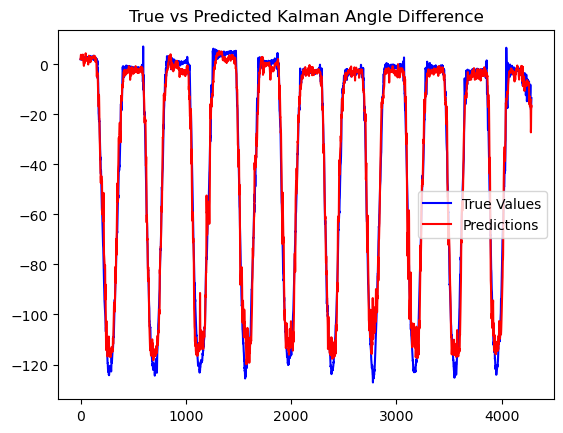

In [13]:
import pandas as pd
import torch
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# Define your sequence length (should be the same as the one used during training)
sequence_length = 50

# Load test data from a CSV file
test_csv_path = 'dataset/2kg_upper_run02.csv'  # Replace with your test CSV file path
test_data = pd.read_csv(test_csv_path, sep=',')


# Extract features and target from the test data
X_test = test_data[['CH1', 'CH2', 'CH3', 'CH4', 'CH5', 'CH6', 'CH7', 'CH8']].values  # 8 channels as input
y_test = test_data['kalman_angle_difference'].values  # Target output

# Reshape the test dataset into sequences
def create_sequences(X, y, seq_length):
    X_seq, y_seq = [], []
    for i in range(len(X) - seq_length):
        X_seq.append(X[i:i+seq_length])
        y_seq.append(y[i+seq_length])  # Predict the next step
    return np.array(X_seq), np.array(y_seq)

X_test_seq, y_test_seq = create_sequences(X_test, y_test, sequence_length)

# Convert test sequences to PyTorch tensors
X_test_tensor = torch.tensor(X_test_seq, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_seq, dtype=torch.float32)

# Set device (use GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move data to device
X_test_tensor = X_test_tensor.to(device)
y_test_tensor = y_test_tensor.to(device)

# Put the model in evaluation mode
model.eval()

# Perform forward pass on test data without computing gradients
with torch.no_grad():
    predictions = model(X_test_tensor).cpu().numpy()  # Convert predictions to numpy for analysis

# Convert y_test_tensor to numpy for comparison
y_test_numpy = y_test_tensor.cpu().numpy()

# Calculate performance metrics
mse = mean_squared_error(y_test_numpy, predictions)
mae = mean_absolute_error(y_test_numpy, predictions)

print(f"Test MSE: {mse:.4f}")
print(f"Test MAE: {mae:.4f}")

# Plotting True vs Predicted Values for comparison
plt.plot(y_test_numpy, label='True Values', color='blue')
plt.plot(predictions, label='Predictions', color='red')
plt.title('True vs Predicted Kalman Angle Difference')
plt.legend()
plt.show()


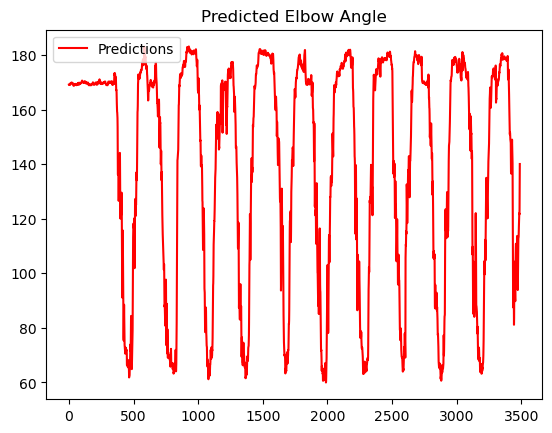

In [12]:
import pandas as pd
import torch
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# Define your sequence length (should be the same as the one used during training)
sequence_length = 50

# Load test data from a CSV file
test_csv_path = 'dataset/5.5kg_upper_run01.csv'  # Replace with your test CSV file path
test_data = pd.read_csv(test_csv_path, sep=';',low_memory=False)

# Extract features and target from the test data
X_test = test_data[['CH1', 'CH2', 'CH3', 'CH4', 'CH5', 'CH6', 'CH7', 'CH8']].values  # 8 channels as input
#y_test = test_data['kalman_angle_difference'].values  # Target output

# Reshape the test dataset into sequences
def create_sequences(X, seq_length):
    X_seq= []
    for i in range(len(X) - seq_length):
        X_seq.append(X[i:i+seq_length])
    return np.array(X_seq)

X_test_seq= create_sequences(X_test, sequence_length)

# Convert test sequences to PyTorch tensors
X_test_tensor = torch.tensor(X_test_seq, dtype=torch.float32)

# Set device (use GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move data to device
X_test_tensor = X_test_tensor.to(device)

# Put the model in evaluation mode
model.eval()

# Perform forward pass on test data without computing gradients
with torch.no_grad():
    predictions = model(X_test_tensor).cpu().numpy()  # Convert predictions to numpy for analysis

# Convert y_test_tensor to numpy for comparison

# Calculate performance metrics


# Plotting True vs Predicted Values for comparison
plt.plot(180+predictions, label='Predictions', color='red')
plt.title('Predicted Elbow Angle')
plt.legend()
plt.show()


In [14]:
from collections import deque
import numpy as np

# Initialize a buffer to store the last 50 samples
sequence_length = 50  # Same as during training
input_size = 8  # 8 channels
buffer = deque(maxlen=sequence_length)  # Buffer size is the sequence length

# Placeholder for real-time incoming data (example of 8 channels of new data point)
incoming_data_point = np.random.rand(input_size)  # Replace with actual real-time data

# Add incoming data to the buffer
buffer.append(incoming_data_point)

# Convert buffer to numpy array when it has enough samples
if len(buffer) == sequence_length:
    X_real_time = np.array(buffer).reshape(1, sequence_length, input_size)  # Reshape to match input shape
    X_real_time_tensor = torch.tensor(X_real_time, dtype=torch.float32).to(device)
    
    # Predict using the trained model
    model.eval()
    with torch.no_grad():
        prediction = model(X_real_time_tensor)
        predicted_value = prediction.cpu().numpy()
        print("Real-time predicted value:", predicted_value)


In [15]:
def process_real_time_data(new_data_point):
    buffer.append(new_data_point)
    
    # Check if we have enough data for a prediction
    if len(buffer) == sequence_length:
        X_real_time = np.array(buffer).reshape(1, sequence_length, input_size)
        X_real_time_tensor = torch.tensor(X_real_time, dtype=torch.float32).to(device)
        
        # Predict and return the result
        model.eval()
        with torch.no_grad():
            prediction = model(X_real_time_tensor)
            predicted_value = prediction.cpu().numpy()
            return predicted_value

# Example of a real-time loop (you can replace this with actual real-time data ingestion code)
while True:
    new_data_point = np.random.rand(input_size)  # Replace with actual incoming data
    prediction = process_real_time_data(new_data_point)
    if prediction is not None:
        print("Predicted value:", prediction)


Predicted value: [[-5.6660604]]
Predicted value: [[-6.0068274]]
Predicted value: [[-6.132001]]
Predicted value: [[-5.6970205]]
Predicted value: [[-5.781945]]
Predicted value: [[-5.703928]]
Predicted value: [[-5.367914]]
Predicted value: [[-5.3547964]]
Predicted value: [[-5.599534]]
Predicted value: [[-5.0197926]]
Predicted value: [[-5.092698]]
Predicted value: [[-5.356263]]
Predicted value: [[-5.0843534]]
Predicted value: [[-4.753381]]
Predicted value: [[-5.2319937]]
Predicted value: [[-5.437767]]
Predicted value: [[-5.4038124]]
Predicted value: [[-5.133791]]
Predicted value: [[-5.261607]]
Predicted value: [[-5.5572844]]
Predicted value: [[-5.481947]]
Predicted value: [[-4.6884527]]
Predicted value: [[-4.6960583]]
Predicted value: [[-5.0882835]]
Predicted value: [[-5.089404]]
Predicted value: [[-4.9473143]]
Predicted value: [[-4.921012]]
Predicted value: [[-4.7883377]]
Predicted value: [[-4.5884905]]
Predicted value: [[-4.8711357]]
Predicted value: [[-5.092765]]
Predicted value: [[-4.9

Predicted value: [[-5.662773]]
Predicted value: [[-5.418165]]
Predicted value: [[-5.320497]]
Predicted value: [[-5.4905767]]
Predicted value: [[-5.537533]]
Predicted value: [[-5.696765]]
Predicted value: [[-5.5367117]]
Predicted value: [[-6.069768]]
Predicted value: [[-6.22921]]
Predicted value: [[-6.6373625]]
Predicted value: [[-6.363905]]
Predicted value: [[-5.8798447]]
Predicted value: [[-5.919484]]
Predicted value: [[-6.275153]]
Predicted value: [[-6.4600124]]
Predicted value: [[-6.180272]]
Predicted value: [[-6.392679]]
Predicted value: [[-6.2096376]]
Predicted value: [[-6.109864]]
Predicted value: [[-6.2184687]]
Predicted value: [[-5.596482]]
Predicted value: [[-5.2799616]]
Predicted value: [[-5.1261144]]
Predicted value: [[-5.312812]]
Predicted value: [[-5.622365]]
Predicted value: [[-5.7598743]]
Predicted value: [[-5.9210167]]
Predicted value: [[-5.937497]]
Predicted value: [[-5.8231754]]
Predicted value: [[-5.631096]]
Predicted value: [[-5.855036]]
Predicted value: [[-5.781761

Predicted value: [[-5.2317524]]
Predicted value: [[-5.138904]]
Predicted value: [[-5.399892]]
Predicted value: [[-5.8874044]]
Predicted value: [[-6.2452536]]
Predicted value: [[-6.0432177]]
Predicted value: [[-6.1364384]]
Predicted value: [[-6.1363573]]
Predicted value: [[-5.8780184]]
Predicted value: [[-5.7512264]]
Predicted value: [[-5.93696]]
Predicted value: [[-5.8317575]]
Predicted value: [[-6.2363577]]
Predicted value: [[-6.5102663]]
Predicted value: [[-6.521694]]
Predicted value: [[-6.313161]]
Predicted value: [[-6.327011]]
Predicted value: [[-6.5891733]]
Predicted value: [[-5.8307714]]
Predicted value: [[-5.6754246]]
Predicted value: [[-5.8566694]]
Predicted value: [[-5.9720078]]
Predicted value: [[-5.971184]]
Predicted value: [[-5.6863613]]
Predicted value: [[-6.0359755]]
Predicted value: [[-6.019367]]
Predicted value: [[-5.4905987]]
Predicted value: [[-5.4819565]]
Predicted value: [[-5.793537]]
Predicted value: [[-6.144845]]
Predicted value: [[-5.917613]]
Predicted value: [[-

Predicted value: [[-5.466695]]
Predicted value: [[-5.6563597]]
Predicted value: [[-5.4978366]]
Predicted value: [[-5.7572126]]
Predicted value: [[-5.4689]]
Predicted value: [[-5.6138573]]
Predicted value: [[-5.5850554]]
Predicted value: [[-5.665497]]
Predicted value: [[-5.3624554]]
Predicted value: [[-5.433014]]
Predicted value: [[-5.480183]]
Predicted value: [[-5.262491]]
Predicted value: [[-4.934719]]
Predicted value: [[-5.262019]]
Predicted value: [[-5.8417177]]
Predicted value: [[-5.6820326]]
Predicted value: [[-5.5119066]]
Predicted value: [[-5.655288]]
Predicted value: [[-5.399909]]
Predicted value: [[-5.47989]]
Predicted value: [[-5.4191704]]
Predicted value: [[-5.485944]]
Predicted value: [[-6.060561]]
Predicted value: [[-5.836026]]
Predicted value: [[-6.056487]]
Predicted value: [[-5.935131]]
Predicted value: [[-5.9467716]]
Predicted value: [[-5.938654]]
Predicted value: [[-6.012624]]
Predicted value: [[-6.1066046]]
Predicted value: [[-5.6538515]]
Predicted value: [[-5.950897]

Predicted value: [[-6.026224]]
Predicted value: [[-6.2674465]]
Predicted value: [[-6.0724983]]
Predicted value: [[-5.7692156]]
Predicted value: [[-5.6646338]]
Predicted value: [[-5.726263]]
Predicted value: [[-6.143977]]
Predicted value: [[-6.212799]]
Predicted value: [[-6.1792097]]
Predicted value: [[-6.2437515]]
Predicted value: [[-6.1166077]]
Predicted value: [[-6.2084]]
Predicted value: [[-6.3870506]]
Predicted value: [[-6.2665606]]
Predicted value: [[-6.372159]]
Predicted value: [[-6.424968]]
Predicted value: [[-6.4990387]]
Predicted value: [[-6.4887896]]
Predicted value: [[-6.7501993]]
Predicted value: [[-6.574442]]
Predicted value: [[-6.203511]]
Predicted value: [[-6.2172756]]
Predicted value: [[-5.996393]]
Predicted value: [[-5.7496223]]
Predicted value: [[-6.27822]]
Predicted value: [[-5.7623568]]
Predicted value: [[-5.7283497]]
Predicted value: [[-5.580922]]
Predicted value: [[-5.4786367]]
Predicted value: [[-5.2690477]]
Predicted value: [[-5.5005703]]
Predicted value: [[-5.8

Predicted value: [[-5.701495]]
Predicted value: [[-5.7847185]]
Predicted value: [[-5.298623]]
Predicted value: [[-5.2344704]]
Predicted value: [[-4.7474155]]
Predicted value: [[-4.7071056]]
Predicted value: [[-4.8968973]]
Predicted value: [[-5.347434]]
Predicted value: [[-5.1505604]]
Predicted value: [[-4.888779]]
Predicted value: [[-5.1319647]]
Predicted value: [[-4.960567]]
Predicted value: [[-5.331709]]
Predicted value: [[-5.294883]]
Predicted value: [[-5.3439894]]
Predicted value: [[-5.330549]]
Predicted value: [[-5.742507]]
Predicted value: [[-5.916853]]
Predicted value: [[-5.5229044]]
Predicted value: [[-5.85623]]
Predicted value: [[-5.980359]]
Predicted value: [[-6.076913]]
Predicted value: [[-5.8078575]]
Predicted value: [[-5.3998785]]
Predicted value: [[-5.693158]]
Predicted value: [[-6.0039406]]
Predicted value: [[-6.1732883]]
Predicted value: [[-6.057458]]
Predicted value: [[-5.7994366]]
Predicted value: [[-6.2942085]]
Predicted value: [[-6.2359123]]
Predicted value: [[-6.30

Predicted value: [[-6.111911]]
Predicted value: [[-5.912862]]
Predicted value: [[-6.076989]]
Predicted value: [[-5.572835]]
Predicted value: [[-5.6317286]]
Predicted value: [[-5.980051]]
Predicted value: [[-6.3273487]]
Predicted value: [[-6.424699]]
Predicted value: [[-5.8168306]]
Predicted value: [[-5.983674]]
Predicted value: [[-5.9431953]]
Predicted value: [[-5.9937363]]
Predicted value: [[-6.118017]]
Predicted value: [[-5.670661]]
Predicted value: [[-5.788782]]
Predicted value: [[-5.980793]]
Predicted value: [[-5.6649837]]
Predicted value: [[-5.584946]]
Predicted value: [[-5.859253]]
Predicted value: [[-5.6343155]]
Predicted value: [[-5.409568]]
Predicted value: [[-5.8605566]]
Predicted value: [[-5.3120127]]
Predicted value: [[-5.7458563]]
Predicted value: [[-5.8232746]]
Predicted value: [[-5.98656]]
Predicted value: [[-5.585146]]
Predicted value: [[-5.5341563]]
Predicted value: [[-5.713004]]
Predicted value: [[-5.4665956]]
Predicted value: [[-5.2814035]]
Predicted value: [[-5.2530

Predicted value: [[-6.0393524]]
Predicted value: [[-5.928156]]
Predicted value: [[-5.62595]]
Predicted value: [[-5.468107]]
Predicted value: [[-5.7717323]]
Predicted value: [[-5.77544]]
Predicted value: [[-5.6409197]]
Predicted value: [[-5.603156]]
Predicted value: [[-5.599234]]
Predicted value: [[-5.6676016]]
Predicted value: [[-6.0309734]]
Predicted value: [[-6.1042213]]
Predicted value: [[-6.1303244]]
Predicted value: [[-5.7092123]]
Predicted value: [[-6.0483904]]
Predicted value: [[-6.1483936]]
Predicted value: [[-5.800993]]
Predicted value: [[-6.2936344]]
Predicted value: [[-6.1571465]]
Predicted value: [[-5.9619055]]
Predicted value: [[-5.6829977]]
Predicted value: [[-5.5687056]]
Predicted value: [[-5.2686625]]
Predicted value: [[-5.2544193]]
Predicted value: [[-5.8956995]]
Predicted value: [[-5.77487]]
Predicted value: [[-5.427434]]
Predicted value: [[-5.8210983]]
Predicted value: [[-5.4867673]]
Predicted value: [[-5.7237415]]
Predicted value: [[-5.6923094]]
Predicted value: [[-

Predicted value: [[-6.0779934]]
Predicted value: [[-5.7488375]]
Predicted value: [[-5.1060686]]
Predicted value: [[-5.057993]]
Predicted value: [[-5.1434155]]
Predicted value: [[-5.418932]]
Predicted value: [[-4.977906]]
Predicted value: [[-5.2999325]]
Predicted value: [[-5.169242]]
Predicted value: [[-5.2484407]]
Predicted value: [[-5.289706]]
Predicted value: [[-4.8714905]]
Predicted value: [[-4.784833]]
Predicted value: [[-4.8966517]]
Predicted value: [[-5.523547]]
Predicted value: [[-5.867051]]
Predicted value: [[-5.510818]]
Predicted value: [[-5.2404118]]
Predicted value: [[-5.174522]]
Predicted value: [[-5.040979]]
Predicted value: [[-5.0743914]]
Predicted value: [[-5.4355016]]
Predicted value: [[-5.2608013]]
Predicted value: [[-5.090633]]
Predicted value: [[-5.3519955]]
Predicted value: [[-5.292898]]
Predicted value: [[-5.231742]]
Predicted value: [[-5.1457644]]
Predicted value: [[-4.9280195]]
Predicted value: [[-5.3193607]]
Predicted value: [[-5.4032836]]
Predicted value: [[-5.

Predicted value: [[-6.329006]]
Predicted value: [[-6.351779]]
Predicted value: [[-5.897113]]
Predicted value: [[-5.8249817]]
Predicted value: [[-5.895323]]
Predicted value: [[-5.9143476]]
Predicted value: [[-5.773591]]
Predicted value: [[-6.3690987]]
Predicted value: [[-6.257181]]
Predicted value: [[-6.06874]]
Predicted value: [[-5.8500814]]
Predicted value: [[-5.952552]]
Predicted value: [[-5.5151052]]
Predicted value: [[-5.6972847]]
Predicted value: [[-5.4995093]]
Predicted value: [[-5.255132]]
Predicted value: [[-5.2740192]]
Predicted value: [[-5.6155443]]
Predicted value: [[-5.5002766]]
Predicted value: [[-5.6225967]]
Predicted value: [[-5.9177256]]
Predicted value: [[-5.516885]]
Predicted value: [[-6.250654]]
Predicted value: [[-5.672757]]
Predicted value: [[-5.4128256]]
Predicted value: [[-5.466831]]
Predicted value: [[-5.624592]]
Predicted value: [[-5.3129425]]
Predicted value: [[-5.1435685]]
Predicted value: [[-4.9582148]]
Predicted value: [[-4.772523]]
Predicted value: [[-4.75

Predicted value: [[-4.7024755]]
Predicted value: [[-4.6407375]]
Predicted value: [[-4.415967]]
Predicted value: [[-4.7743845]]
Predicted value: [[-4.9355803]]
Predicted value: [[-5.446272]]
Predicted value: [[-5.501296]]
Predicted value: [[-5.1618395]]
Predicted value: [[-4.975295]]
Predicted value: [[-4.513651]]
Predicted value: [[-4.387601]]
Predicted value: [[-4.644638]]
Predicted value: [[-4.6151]]
Predicted value: [[-4.647256]]
Predicted value: [[-4.451988]]
Predicted value: [[-4.3990088]]
Predicted value: [[-4.716996]]
Predicted value: [[-4.8129196]]
Predicted value: [[-5.1392016]]
Predicted value: [[-5.4517574]]
Predicted value: [[-5.158696]]
Predicted value: [[-5.403549]]
Predicted value: [[-5.8792715]]
Predicted value: [[-5.9007626]]
Predicted value: [[-6.097927]]
Predicted value: [[-6.3715954]]
Predicted value: [[-6.403597]]
Predicted value: [[-6.0998955]]
Predicted value: [[-5.882061]]
Predicted value: [[-6.187751]]
Predicted value: [[-5.9924383]]
Predicted value: [[-6.28812

Predicted value: [[-6.1097403]]
Predicted value: [[-6.3996687]]
Predicted value: [[-6.391657]]
Predicted value: [[-6.560937]]
Predicted value: [[-6.337578]]
Predicted value: [[-6.402731]]
Predicted value: [[-6.396823]]
Predicted value: [[-6.614028]]
Predicted value: [[-6.3716927]]
Predicted value: [[-6.3467894]]
Predicted value: [[-6.487115]]
Predicted value: [[-6.7382994]]
Predicted value: [[-6.867689]]
Predicted value: [[-6.3418455]]
Predicted value: [[-6.4078064]]
Predicted value: [[-6.27347]]
Predicted value: [[-6.786721]]
Predicted value: [[-6.56695]]
Predicted value: [[-6.509039]]
Predicted value: [[-6.4852295]]
Predicted value: [[-6.217911]]
Predicted value: [[-6.250472]]
Predicted value: [[-5.897753]]
Predicted value: [[-5.9142437]]
Predicted value: [[-5.535159]]
Predicted value: [[-5.254818]]
Predicted value: [[-5.4922924]]
Predicted value: [[-5.2426515]]
Predicted value: [[-5.4004]]
Predicted value: [[-5.3942504]]
Predicted value: [[-5.5577097]]
Predicted value: [[-6.033765]]

Predicted value: [[-5.6368465]]
Predicted value: [[-6.043029]]
Predicted value: [[-5.908889]]
Predicted value: [[-6.0891113]]
Predicted value: [[-5.8142347]]
Predicted value: [[-5.9727783]]
Predicted value: [[-6.0836782]]
Predicted value: [[-5.91146]]
Predicted value: [[-6.2193336]]
Predicted value: [[-6.3350525]]
Predicted value: [[-6.534295]]
Predicted value: [[-6.262867]]
Predicted value: [[-5.860282]]
Predicted value: [[-5.9100456]]
Predicted value: [[-6.2927456]]
Predicted value: [[-5.8985167]]
Predicted value: [[-5.803521]]
Predicted value: [[-6.0354977]]
Predicted value: [[-6.0666533]]
Predicted value: [[-5.7749205]]
Predicted value: [[-5.687271]]
Predicted value: [[-5.8487673]]
Predicted value: [[-5.78944]]
Predicted value: [[-5.4297667]]
Predicted value: [[-5.5742483]]
Predicted value: [[-5.5843105]]
Predicted value: [[-5.3345327]]
Predicted value: [[-5.036794]]
Predicted value: [[-5.04942]]
Predicted value: [[-5.1633463]]
Predicted value: [[-5.1576505]]
Predicted value: [[-5.

Predicted value: [[-6.6280327]]
Predicted value: [[-6.5912275]]
Predicted value: [[-6.4619093]]
Predicted value: [[-6.2960587]]
Predicted value: [[-6.0593824]]
Predicted value: [[-5.939023]]
Predicted value: [[-5.8269014]]
Predicted value: [[-5.792325]]
Predicted value: [[-5.467394]]
Predicted value: [[-5.7723703]]
Predicted value: [[-5.607021]]
Predicted value: [[-5.337515]]
Predicted value: [[-5.551839]]
Predicted value: [[-5.2793665]]
Predicted value: [[-5.815097]]
Predicted value: [[-5.5205975]]
Predicted value: [[-5.528506]]
Predicted value: [[-5.5486565]]
Predicted value: [[-4.7514772]]
Predicted value: [[-5.227592]]
Predicted value: [[-5.4202633]]
Predicted value: [[-4.8500977]]
Predicted value: [[-5.532625]]
Predicted value: [[-5.924412]]
Predicted value: [[-5.961026]]
Predicted value: [[-5.772401]]
Predicted value: [[-5.46854]]
Predicted value: [[-5.218297]]
Predicted value: [[-5.3234715]]
Predicted value: [[-4.751422]]
Predicted value: [[-4.9358416]]
Predicted value: [[-4.757

Predicted value: [[-5.317639]]
Predicted value: [[-5.5047793]]
Predicted value: [[-5.615388]]
Predicted value: [[-5.7127476]]
Predicted value: [[-5.9945555]]
Predicted value: [[-5.9233704]]
Predicted value: [[-5.9197655]]
Predicted value: [[-5.790861]]
Predicted value: [[-5.3858976]]
Predicted value: [[-5.7651634]]
Predicted value: [[-6.118061]]
Predicted value: [[-5.6563816]]
Predicted value: [[-5.8295546]]
Predicted value: [[-5.52223]]
Predicted value: [[-5.4468403]]
Predicted value: [[-5.4946065]]
Predicted value: [[-5.5196443]]
Predicted value: [[-5.4607487]]
Predicted value: [[-5.712618]]
Predicted value: [[-5.5932226]]
Predicted value: [[-5.5613003]]
Predicted value: [[-5.4157696]]
Predicted value: [[-5.624195]]
Predicted value: [[-5.769168]]
Predicted value: [[-5.7650204]]
Predicted value: [[-5.8608637]]
Predicted value: [[-5.763796]]
Predicted value: [[-5.9238634]]
Predicted value: [[-5.6242104]]
Predicted value: [[-5.3826227]]
Predicted value: [[-5.2714276]]
Predicted value: [

Predicted value: [[-5.983897]]
Predicted value: [[-5.7059746]]
Predicted value: [[-5.2702065]]
Predicted value: [[-5.522956]]
Predicted value: [[-5.6328783]]
Predicted value: [[-5.358015]]
Predicted value: [[-5.54112]]
Predicted value: [[-5.8267536]]
Predicted value: [[-5.8386803]]
Predicted value: [[-5.730524]]
Predicted value: [[-5.543911]]
Predicted value: [[-5.574111]]
Predicted value: [[-5.775589]]
Predicted value: [[-5.608181]]
Predicted value: [[-5.382901]]
Predicted value: [[-4.894109]]
Predicted value: [[-4.903788]]
Predicted value: [[-4.866589]]
Predicted value: [[-4.8143935]]
Predicted value: [[-5.0266294]]
Predicted value: [[-5.238802]]
Predicted value: [[-5.346075]]
Predicted value: [[-5.315734]]
Predicted value: [[-5.1636934]]
Predicted value: [[-5.5292573]]
Predicted value: [[-5.5713587]]
Predicted value: [[-5.275878]]
Predicted value: [[-5.6997595]]
Predicted value: [[-5.0188084]]
Predicted value: [[-5.234291]]
Predicted value: [[-5.4180355]]
Predicted value: [[-5.39348

Predicted value: [[-5.0686235]]
Predicted value: [[-5.032527]]
Predicted value: [[-4.799885]]
Predicted value: [[-5.2256117]]
Predicted value: [[-5.4352894]]
Predicted value: [[-5.3572907]]
Predicted value: [[-5.3107166]]
Predicted value: [[-5.3582354]]
Predicted value: [[-5.349126]]
Predicted value: [[-5.5666504]]
Predicted value: [[-5.550988]]
Predicted value: [[-5.490411]]
Predicted value: [[-5.101409]]
Predicted value: [[-4.970411]]
Predicted value: [[-4.7234383]]
Predicted value: [[-5.038434]]
Predicted value: [[-4.536132]]
Predicted value: [[-4.2084885]]
Predicted value: [[-3.9449406]]
Predicted value: [[-3.958861]]
Predicted value: [[-4.656043]]
Predicted value: [[-4.3913145]]
Predicted value: [[-4.276661]]
Predicted value: [[-4.6494517]]
Predicted value: [[-4.279042]]
Predicted value: [[-4.1446676]]
Predicted value: [[-4.5230403]]
Predicted value: [[-4.7493205]]
Predicted value: [[-4.9464793]]
Predicted value: [[-4.8961306]]
Predicted value: [[-5.229594]]
Predicted value: [[-5.

Predicted value: [[-5.4808216]]
Predicted value: [[-5.595153]]
Predicted value: [[-5.586366]]
Predicted value: [[-5.5635476]]
Predicted value: [[-5.7059]]
Predicted value: [[-5.572735]]
Predicted value: [[-5.542096]]
Predicted value: [[-6.178357]]
Predicted value: [[-6.165433]]
Predicted value: [[-6.07957]]
Predicted value: [[-5.810952]]
Predicted value: [[-5.900587]]
Predicted value: [[-5.481099]]
Predicted value: [[-5.354583]]
Predicted value: [[-5.5531216]]
Predicted value: [[-5.336628]]
Predicted value: [[-5.584078]]
Predicted value: [[-5.6700277]]
Predicted value: [[-5.6277943]]
Predicted value: [[-5.543023]]
Predicted value: [[-5.5717106]]
Predicted value: [[-6.082361]]
Predicted value: [[-5.6874847]]
Predicted value: [[-5.9980907]]
Predicted value: [[-6.24022]]
Predicted value: [[-5.9780235]]
Predicted value: [[-5.5361443]]
Predicted value: [[-5.5103617]]
Predicted value: [[-5.7750053]]
Predicted value: [[-5.7754107]]
Predicted value: [[-5.9032955]]
Predicted value: [[-5.6365643

Predicted value: [[-5.4731646]]
Predicted value: [[-5.227669]]
Predicted value: [[-5.4335575]]
Predicted value: [[-5.486411]]
Predicted value: [[-5.962369]]
Predicted value: [[-5.993124]]
Predicted value: [[-6.0038853]]
Predicted value: [[-6.327734]]
Predicted value: [[-6.3108034]]
Predicted value: [[-6.252713]]
Predicted value: [[-6.5491133]]
Predicted value: [[-6.477723]]
Predicted value: [[-6.2881603]]
Predicted value: [[-6.209015]]
Predicted value: [[-6.136985]]
Predicted value: [[-6.688504]]
Predicted value: [[-6.7280636]]
Predicted value: [[-6.533598]]
Predicted value: [[-6.2449865]]
Predicted value: [[-6.409707]]
Predicted value: [[-6.1935854]]
Predicted value: [[-6.570155]]
Predicted value: [[-6.3713026]]
Predicted value: [[-6.15687]]
Predicted value: [[-6.1572657]]
Predicted value: [[-5.984931]]
Predicted value: [[-5.832818]]
Predicted value: [[-5.717695]]
Predicted value: [[-5.116394]]
Predicted value: [[-5.527919]]
Predicted value: [[-5.740694]]
Predicted value: [[-5.7345686

Predicted value: [[-5.913884]]
Predicted value: [[-6.149826]]
Predicted value: [[-5.6279287]]
Predicted value: [[-5.69466]]
Predicted value: [[-6.447896]]
Predicted value: [[-6.158327]]
Predicted value: [[-5.5849657]]
Predicted value: [[-5.8201656]]
Predicted value: [[-5.9637537]]
Predicted value: [[-5.7463894]]
Predicted value: [[-5.750949]]
Predicted value: [[-5.714362]]
Predicted value: [[-5.9462147]]
Predicted value: [[-6.11553]]
Predicted value: [[-6.2570333]]
Predicted value: [[-6.1835413]]
Predicted value: [[-6.258646]]
Predicted value: [[-6.04609]]
Predicted value: [[-5.969426]]
Predicted value: [[-5.548106]]
Predicted value: [[-5.817541]]
Predicted value: [[-5.810792]]
Predicted value: [[-6.022752]]
Predicted value: [[-6.0498266]]
Predicted value: [[-6.1500387]]
Predicted value: [[-6.0424776]]
Predicted value: [[-5.832755]]
Predicted value: [[-5.814575]]
Predicted value: [[-6.071927]]
Predicted value: [[-5.8749485]]
Predicted value: [[-6.054962]]
Predicted value: [[-5.8797865]

Predicted value: [[-4.255721]]
Predicted value: [[-4.584636]]
Predicted value: [[-4.7838335]]
Predicted value: [[-4.5989385]]
Predicted value: [[-4.708182]]
Predicted value: [[-4.939681]]
Predicted value: [[-4.9000278]]
Predicted value: [[-5.090392]]
Predicted value: [[-5.127651]]
Predicted value: [[-5.0204744]]
Predicted value: [[-5.6105347]]
Predicted value: [[-5.610942]]
Predicted value: [[-5.78152]]
Predicted value: [[-5.885807]]
Predicted value: [[-5.265467]]
Predicted value: [[-5.0527678]]
Predicted value: [[-5.0002537]]
Predicted value: [[-5.330352]]
Predicted value: [[-4.956293]]
Predicted value: [[-4.975779]]
Predicted value: [[-5.424119]]
Predicted value: [[-5.459543]]
Predicted value: [[-5.6246777]]
Predicted value: [[-5.824177]]
Predicted value: [[-5.762578]]
Predicted value: [[-5.7792587]]
Predicted value: [[-5.636746]]
Predicted value: [[-5.626885]]
Predicted value: [[-5.899495]]
Predicted value: [[-5.9384527]]
Predicted value: [[-5.864979]]
Predicted value: [[-5.879263]]

Predicted value: [[-5.536607]]
Predicted value: [[-6.0063324]]
Predicted value: [[-5.6198454]]
Predicted value: [[-5.2709904]]
Predicted value: [[-5.2321177]]
Predicted value: [[-5.417908]]
Predicted value: [[-5.3330975]]
Predicted value: [[-5.129809]]
Predicted value: [[-5.132057]]
Predicted value: [[-5.153927]]
Predicted value: [[-5.107994]]
Predicted value: [[-5.562362]]
Predicted value: [[-5.548603]]
Predicted value: [[-5.470909]]
Predicted value: [[-5.657913]]
Predicted value: [[-5.3260884]]
Predicted value: [[-5.2742777]]
Predicted value: [[-5.947774]]
Predicted value: [[-5.607566]]
Predicted value: [[-5.6657763]]
Predicted value: [[-5.646495]]
Predicted value: [[-5.6968393]]
Predicted value: [[-6.2347383]]
Predicted value: [[-6.261587]]
Predicted value: [[-6.5872355]]
Predicted value: [[-6.5697308]]
Predicted value: [[-6.369815]]
Predicted value: [[-6.2470236]]
Predicted value: [[-6.469926]]
Predicted value: [[-6.4455433]]
Predicted value: [[-6.2449455]]
Predicted value: [[-5.78

Predicted value: [[-5.4182987]]
Predicted value: [[-5.1277056]]
Predicted value: [[-4.95376]]
Predicted value: [[-4.790365]]
Predicted value: [[-4.9887757]]
Predicted value: [[-4.9255066]]
Predicted value: [[-4.7961187]]
Predicted value: [[-4.963043]]
Predicted value: [[-5.432022]]
Predicted value: [[-5.1811905]]
Predicted value: [[-5.1156645]]
Predicted value: [[-5.265442]]
Predicted value: [[-5.3340693]]
Predicted value: [[-5.4492416]]
Predicted value: [[-5.5809813]]
Predicted value: [[-5.7237587]]
Predicted value: [[-5.37521]]
Predicted value: [[-5.376875]]
Predicted value: [[-5.107004]]
Predicted value: [[-5.0255294]]
Predicted value: [[-4.9546604]]
Predicted value: [[-4.9633303]]
Predicted value: [[-5.012446]]
Predicted value: [[-5.4959607]]
Predicted value: [[-5.412014]]
Predicted value: [[-5.6537695]]
Predicted value: [[-5.339306]]
Predicted value: [[-5.194313]]
Predicted value: [[-5.1894517]]
Predicted value: [[-5.423527]]
Predicted value: [[-5.465358]]
Predicted value: [[-5.93

Predicted value: [[-5.863455]]
Predicted value: [[-6.0156946]]
Predicted value: [[-5.75012]]
Predicted value: [[-5.5374603]]
Predicted value: [[-5.897992]]
Predicted value: [[-5.9236994]]
Predicted value: [[-5.8933516]]
Predicted value: [[-5.7421904]]
Predicted value: [[-5.8557367]]
Predicted value: [[-5.7823563]]
Predicted value: [[-5.510836]]
Predicted value: [[-5.5832043]]
Predicted value: [[-5.493291]]
Predicted value: [[-5.510483]]
Predicted value: [[-5.314018]]
Predicted value: [[-5.383088]]
Predicted value: [[-4.9979763]]
Predicted value: [[-5.545018]]
Predicted value: [[-5.908271]]
Predicted value: [[-5.923316]]
Predicted value: [[-5.9264603]]
Predicted value: [[-5.948123]]
Predicted value: [[-5.4996033]]
Predicted value: [[-5.565838]]
Predicted value: [[-5.358714]]
Predicted value: [[-5.6982193]]
Predicted value: [[-5.7547064]]
Predicted value: [[-5.3876996]]
Predicted value: [[-5.4989934]]
Predicted value: [[-5.563837]]
Predicted value: [[-5.868181]]
Predicted value: [[-5.879

Predicted value: [[-5.2186823]]
Predicted value: [[-5.508644]]
Predicted value: [[-5.358639]]
Predicted value: [[-5.5507674]]
Predicted value: [[-5.5614414]]
Predicted value: [[-5.3875847]]
Predicted value: [[-5.92714]]
Predicted value: [[-6.143365]]
Predicted value: [[-5.691264]]
Predicted value: [[-5.698783]]
Predicted value: [[-5.440611]]
Predicted value: [[-5.3937836]]
Predicted value: [[-5.3755636]]
Predicted value: [[-5.8453236]]
Predicted value: [[-5.767313]]
Predicted value: [[-5.8196344]]
Predicted value: [[-5.7478056]]
Predicted value: [[-5.5561786]]
Predicted value: [[-5.554718]]
Predicted value: [[-5.4960876]]
Predicted value: [[-5.7607965]]
Predicted value: [[-5.1819525]]
Predicted value: [[-5.4139423]]
Predicted value: [[-5.120595]]
Predicted value: [[-4.873047]]
Predicted value: [[-5.301055]]
Predicted value: [[-5.115671]]
Predicted value: [[-4.683072]]
Predicted value: [[-5.186819]]
Predicted value: [[-5.3362236]]
Predicted value: [[-5.497101]]
Predicted value: [[-5.745

Predicted value: [[-5.313278]]
Predicted value: [[-5.4655914]]
Predicted value: [[-5.4830513]]
Predicted value: [[-5.337241]]
Predicted value: [[-5.533256]]
Predicted value: [[-5.369788]]
Predicted value: [[-5.7981215]]
Predicted value: [[-5.828987]]
Predicted value: [[-5.630028]]
Predicted value: [[-5.732462]]
Predicted value: [[-5.7819557]]
Predicted value: [[-5.9199915]]
Predicted value: [[-5.275865]]
Predicted value: [[-4.797442]]
Predicted value: [[-4.8175573]]
Predicted value: [[-5.095977]]
Predicted value: [[-5.110282]]
Predicted value: [[-4.960059]]
Predicted value: [[-5.132056]]
Predicted value: [[-5.495481]]
Predicted value: [[-5.813758]]
Predicted value: [[-5.8609705]]
Predicted value: [[-5.832486]]
Predicted value: [[-6.1592216]]
Predicted value: [[-6.0166492]]
Predicted value: [[-6.0802736]]
Predicted value: [[-5.8686695]]
Predicted value: [[-5.693289]]
Predicted value: [[-5.771942]]
Predicted value: [[-5.802808]]
Predicted value: [[-5.5682454]]
Predicted value: [[-5.79946

Predicted value: [[-5.636261]]
Predicted value: [[-5.5429916]]
Predicted value: [[-5.033435]]
Predicted value: [[-4.9915934]]
Predicted value: [[-5.0544176]]
Predicted value: [[-5.204441]]
Predicted value: [[-5.4219646]]
Predicted value: [[-5.40825]]
Predicted value: [[-5.1654997]]
Predicted value: [[-5.4858727]]
Predicted value: [[-5.7523527]]
Predicted value: [[-5.4131074]]
Predicted value: [[-5.770976]]
Predicted value: [[-5.6131496]]
Predicted value: [[-5.337297]]
Predicted value: [[-5.28559]]
Predicted value: [[-5.3993435]]
Predicted value: [[-5.007022]]
Predicted value: [[-5.351306]]
Predicted value: [[-5.2651787]]
Predicted value: [[-5.6107006]]
Predicted value: [[-5.460703]]
Predicted value: [[-6.1127834]]
Predicted value: [[-5.940585]]
Predicted value: [[-5.9274807]]
Predicted value: [[-6.0633135]]
Predicted value: [[-5.8977575]]
Predicted value: [[-5.854207]]
Predicted value: [[-5.649577]]
Predicted value: [[-5.6464753]]
Predicted value: [[-5.4307275]]
Predicted value: [[-5.4

Predicted value: [[-4.7702312]]
Predicted value: [[-4.845894]]
Predicted value: [[-4.358889]]
Predicted value: [[-4.636429]]
Predicted value: [[-4.6730766]]
Predicted value: [[-5.104498]]
Predicted value: [[-5.0204973]]
Predicted value: [[-4.948753]]
Predicted value: [[-5.529546]]
Predicted value: [[-5.4503627]]
Predicted value: [[-5.3452425]]
Predicted value: [[-5.5998783]]
Predicted value: [[-5.2183933]]
Predicted value: [[-5.7457047]]
Predicted value: [[-5.991556]]
Predicted value: [[-6.149994]]
Predicted value: [[-5.651804]]
Predicted value: [[-5.820079]]
Predicted value: [[-5.98481]]
Predicted value: [[-5.713189]]
Predicted value: [[-5.333153]]
Predicted value: [[-5.968425]]
Predicted value: [[-6.0508356]]
Predicted value: [[-6.125372]]
Predicted value: [[-6.1179304]]
Predicted value: [[-6.333009]]
Predicted value: [[-5.818115]]
Predicted value: [[-5.51819]]
Predicted value: [[-5.7552137]]
Predicted value: [[-6.056922]]
Predicted value: [[-5.9811954]]
Predicted value: [[-5.91663]]

Predicted value: [[-5.955861]]
Predicted value: [[-5.384815]]
Predicted value: [[-5.363636]]
Predicted value: [[-5.148326]]
Predicted value: [[-5.0486526]]
Predicted value: [[-5.2774324]]
Predicted value: [[-4.983534]]
Predicted value: [[-5.1726623]]
Predicted value: [[-5.210974]]
Predicted value: [[-5.6563416]]
Predicted value: [[-5.909891]]
Predicted value: [[-5.500612]]
Predicted value: [[-6.1364813]]
Predicted value: [[-6.445966]]
Predicted value: [[-5.980339]]
Predicted value: [[-5.4822583]]
Predicted value: [[-5.750389]]
Predicted value: [[-6.006055]]
Predicted value: [[-5.478235]]
Predicted value: [[-5.27551]]
Predicted value: [[-5.374975]]
Predicted value: [[-5.59877]]
Predicted value: [[-6.2391386]]
Predicted value: [[-5.951955]]
Predicted value: [[-5.3599153]]
Predicted value: [[-5.2701836]]
Predicted value: [[-5.766712]]
Predicted value: [[-5.4154835]]
Predicted value: [[-5.40394]]
Predicted value: [[-5.8583574]]
Predicted value: [[-5.6476307]]
Predicted value: [[-5.254553]]

Predicted value: [[-5.6622686]]
Predicted value: [[-5.691619]]
Predicted value: [[-5.882351]]
Predicted value: [[-6.3222256]]
Predicted value: [[-5.805292]]
Predicted value: [[-5.745652]]
Predicted value: [[-5.685131]]
Predicted value: [[-5.754367]]
Predicted value: [[-5.7609196]]
Predicted value: [[-5.7073765]]
Predicted value: [[-5.2748995]]
Predicted value: [[-5.95695]]
Predicted value: [[-6.0050306]]
Predicted value: [[-6.082183]]
Predicted value: [[-6.056161]]
Predicted value: [[-5.9320326]]
Predicted value: [[-5.6332617]]
Predicted value: [[-6.0174685]]
Predicted value: [[-6.136963]]
Predicted value: [[-5.4559016]]
Predicted value: [[-5.4453855]]
Predicted value: [[-5.482428]]
Predicted value: [[-5.5402613]]
Predicted value: [[-5.460595]]
Predicted value: [[-5.305795]]
Predicted value: [[-5.701377]]
Predicted value: [[-5.670248]]
Predicted value: [[-5.7218084]]
Predicted value: [[-5.342666]]
Predicted value: [[-4.9192553]]
Predicted value: [[-4.915573]]
Predicted value: [[-4.9025

Predicted value: [[-5.3455887]]
Predicted value: [[-5.253921]]
Predicted value: [[-4.9433203]]
Predicted value: [[-5.359791]]
Predicted value: [[-5.286087]]
Predicted value: [[-4.9911904]]
Predicted value: [[-4.6821237]]
Predicted value: [[-4.7724667]]
Predicted value: [[-4.8788004]]
Predicted value: [[-4.6986313]]
Predicted value: [[-4.210145]]
Predicted value: [[-4.1951847]]
Predicted value: [[-4.502212]]
Predicted value: [[-4.4092417]]
Predicted value: [[-4.490041]]
Predicted value: [[-4.2973976]]
Predicted value: [[-4.2540855]]
Predicted value: [[-4.453766]]
Predicted value: [[-4.0764513]]
Predicted value: [[-4.3105865]]
Predicted value: [[-5.1012373]]
Predicted value: [[-5.1309624]]
Predicted value: [[-5.2688026]]
Predicted value: [[-5.4988008]]
Predicted value: [[-5.4149594]]
Predicted value: [[-5.36584]]
Predicted value: [[-5.067893]]
Predicted value: [[-5.3470163]]
Predicted value: [[-5.2301903]]
Predicted value: [[-5.081478]]
Predicted value: [[-4.9973373]]
Predicted value: [[

Predicted value: [[-5.221259]]
Predicted value: [[-5.547233]]
Predicted value: [[-4.876263]]
Predicted value: [[-4.7409964]]
Predicted value: [[-5.037567]]
Predicted value: [[-4.9691133]]
Predicted value: [[-4.7997084]]
Predicted value: [[-4.666113]]
Predicted value: [[-4.9023523]]
Predicted value: [[-5.1909037]]
Predicted value: [[-5.5556164]]
Predicted value: [[-5.0774956]]
Predicted value: [[-4.993766]]
Predicted value: [[-4.731782]]
Predicted value: [[-5.115941]]
Predicted value: [[-5.12503]]
Predicted value: [[-5.0509834]]
Predicted value: [[-5.045764]]
Predicted value: [[-5.0478945]]
Predicted value: [[-4.690591]]
Predicted value: [[-4.7312527]]
Predicted value: [[-4.8199167]]
Predicted value: [[-5.209611]]
Predicted value: [[-5.2890806]]
Predicted value: [[-4.7539525]]
Predicted value: [[-4.4773808]]
Predicted value: [[-4.6752977]]
Predicted value: [[-4.84064]]
Predicted value: [[-5.3258305]]
Predicted value: [[-5.024254]]
Predicted value: [[-5.1595144]]
Predicted value: [[-5.10

Predicted value: [[-5.2162037]]
Predicted value: [[-5.396076]]
Predicted value: [[-4.9523573]]
Predicted value: [[-4.859002]]
Predicted value: [[-5.3810196]]
Predicted value: [[-4.9927645]]
Predicted value: [[-4.976301]]
Predicted value: [[-5.0725665]]
Predicted value: [[-5.451876]]
Predicted value: [[-5.5376863]]
Predicted value: [[-5.661707]]
Predicted value: [[-6.010545]]
Predicted value: [[-5.8151836]]
Predicted value: [[-5.8847456]]
Predicted value: [[-5.5910606]]
Predicted value: [[-5.152993]]
Predicted value: [[-5.528364]]
Predicted value: [[-5.543315]]
Predicted value: [[-5.0386047]]
Predicted value: [[-5.088354]]
Predicted value: [[-5.4341393]]
Predicted value: [[-5.4557886]]
Predicted value: [[-5.766302]]
Predicted value: [[-5.9669333]]
Predicted value: [[-6.0473537]]
Predicted value: [[-6.0951357]]
Predicted value: [[-6.416483]]
Predicted value: [[-6.342743]]
Predicted value: [[-6.1524343]]
Predicted value: [[-6.205414]]
Predicted value: [[-5.695777]]
Predicted value: [[-5.3

Predicted value: [[-5.774308]]
Predicted value: [[-6.0289955]]
Predicted value: [[-5.873481]]
Predicted value: [[-6.1507845]]
Predicted value: [[-5.7619333]]
Predicted value: [[-5.7651587]]
Predicted value: [[-5.830942]]
Predicted value: [[-5.9098825]]
Predicted value: [[-5.598477]]
Predicted value: [[-5.3681164]]
Predicted value: [[-5.6964226]]
Predicted value: [[-5.9166584]]
Predicted value: [[-5.580644]]
Predicted value: [[-5.6499095]]
Predicted value: [[-5.4819846]]
Predicted value: [[-5.9157085]]
Predicted value: [[-6.0909157]]
Predicted value: [[-6.0891895]]
Predicted value: [[-5.887063]]
Predicted value: [[-5.9546795]]
Predicted value: [[-5.58312]]
Predicted value: [[-6.0112467]]
Predicted value: [[-5.8465557]]
Predicted value: [[-5.4342003]]
Predicted value: [[-5.5712194]]
Predicted value: [[-5.5504813]]
Predicted value: [[-5.6610527]]
Predicted value: [[-5.3465996]]
Predicted value: [[-5.6369114]]
Predicted value: [[-5.6741734]]
Predicted value: [[-5.740575]]
Predicted value: 

Predicted value: [[-5.4569864]]
Predicted value: [[-5.276353]]
Predicted value: [[-5.086609]]
Predicted value: [[-5.2278852]]
Predicted value: [[-5.414336]]
Predicted value: [[-5.5554643]]
Predicted value: [[-5.1170993]]
Predicted value: [[-5.2040806]]
Predicted value: [[-4.847454]]
Predicted value: [[-4.9853454]]
Predicted value: [[-5.342053]]
Predicted value: [[-4.8721]]
Predicted value: [[-4.6229286]]
Predicted value: [[-4.5209394]]
Predicted value: [[-4.5130897]]
Predicted value: [[-4.4780455]]
Predicted value: [[-4.3499856]]
Predicted value: [[-4.724267]]
Predicted value: [[-5.1912403]]
Predicted value: [[-5.329796]]
Predicted value: [[-5.0761547]]
Predicted value: [[-5.1061525]]
Predicted value: [[-4.817025]]
Predicted value: [[-4.821251]]
Predicted value: [[-5.021613]]
Predicted value: [[-5.074805]]
Predicted value: [[-5.0788145]]
Predicted value: [[-4.9750867]]
Predicted value: [[-5.120922]]
Predicted value: [[-5.3020372]]
Predicted value: [[-5.518076]]
Predicted value: [[-5.49

Predicted value: [[-5.7977505]]
Predicted value: [[-6.0272493]]
Predicted value: [[-6.1711617]]
Predicted value: [[-6.428259]]
Predicted value: [[-6.0464134]]
Predicted value: [[-6.2284365]]
Predicted value: [[-6.3173923]]
Predicted value: [[-6.053688]]
Predicted value: [[-6.3981953]]
Predicted value: [[-6.5364265]]
Predicted value: [[-6.1911488]]
Predicted value: [[-6.1902323]]
Predicted value: [[-5.6127596]]
Predicted value: [[-5.16904]]
Predicted value: [[-5.1270833]]
Predicted value: [[-5.0968227]]
Predicted value: [[-5.1320415]]
Predicted value: [[-5.1249585]]
Predicted value: [[-5.1010237]]
Predicted value: [[-5.0795627]]
Predicted value: [[-5.5781727]]
Predicted value: [[-5.5141907]]
Predicted value: [[-5.8176556]]
Predicted value: [[-5.5421777]]
Predicted value: [[-5.2083063]]
Predicted value: [[-5.3727365]]
Predicted value: [[-5.4648066]]
Predicted value: [[-5.6188264]]
Predicted value: [[-5.298769]]
Predicted value: [[-5.2424793]]
Predicted value: [[-4.8836966]]
Predicted val

Predicted value: [[-5.007742]]
Predicted value: [[-5.5083504]]
Predicted value: [[-5.6054835]]
Predicted value: [[-5.3702435]]
Predicted value: [[-5.1879535]]
Predicted value: [[-5.095457]]
Predicted value: [[-5.6798944]]
Predicted value: [[-5.6650934]]
Predicted value: [[-6.14211]]
Predicted value: [[-5.7067165]]
Predicted value: [[-5.5175505]]
Predicted value: [[-5.223815]]
Predicted value: [[-5.238748]]
Predicted value: [[-5.599059]]
Predicted value: [[-5.7682533]]
Predicted value: [[-5.7264175]]
Predicted value: [[-5.8550806]]
Predicted value: [[-5.8395557]]
Predicted value: [[-5.7643948]]
Predicted value: [[-5.5825534]]
Predicted value: [[-5.8151894]]
Predicted value: [[-5.751342]]
Predicted value: [[-5.8286066]]
Predicted value: [[-5.78036]]
Predicted value: [[-6.123517]]
Predicted value: [[-5.697816]]
Predicted value: [[-5.0795517]]
Predicted value: [[-5.1398373]]
Predicted value: [[-4.79503]]
Predicted value: [[-5.4838367]]
Predicted value: [[-5.499277]]
Predicted value: [[-5.1

Predicted value: [[-5.049481]]
Predicted value: [[-5.5868435]]
Predicted value: [[-5.7462893]]
Predicted value: [[-5.452507]]
Predicted value: [[-5.3016424]]
Predicted value: [[-5.581346]]
Predicted value: [[-5.6897993]]
Predicted value: [[-5.613716]]
Predicted value: [[-5.5779867]]
Predicted value: [[-5.4821787]]
Predicted value: [[-5.424492]]
Predicted value: [[-5.7727394]]
Predicted value: [[-5.9173336]]
Predicted value: [[-6.272934]]
Predicted value: [[-5.5889473]]
Predicted value: [[-6.0308867]]
Predicted value: [[-5.9444637]]
Predicted value: [[-6.090658]]
Predicted value: [[-5.804269]]
Predicted value: [[-5.903556]]
Predicted value: [[-6.2338276]]
Predicted value: [[-6.2544413]]
Predicted value: [[-5.9246407]]
Predicted value: [[-5.873706]]
Predicted value: [[-5.4459014]]
Predicted value: [[-5.316076]]
Predicted value: [[-5.3222284]]
Predicted value: [[-5.275359]]
Predicted value: [[-5.1074924]]
Predicted value: [[-5.3216114]]
Predicted value: [[-5.159583]]
Predicted value: [[-5

Predicted value: [[-5.8310223]]
Predicted value: [[-5.8706923]]
Predicted value: [[-6.082259]]
Predicted value: [[-5.9285345]]
Predicted value: [[-5.47521]]
Predicted value: [[-5.409644]]
Predicted value: [[-4.9746733]]
Predicted value: [[-4.8475227]]
Predicted value: [[-4.8429623]]
Predicted value: [[-4.5533047]]
Predicted value: [[-3.959384]]
Predicted value: [[-4.1785707]]
Predicted value: [[-4.3399754]]
Predicted value: [[-4.4608364]]
Predicted value: [[-4.191657]]
Predicted value: [[-4.741707]]
Predicted value: [[-4.531839]]
Predicted value: [[-4.8685656]]
Predicted value: [[-4.881693]]
Predicted value: [[-5.1012945]]
Predicted value: [[-5.0616035]]
Predicted value: [[-5.5292206]]
Predicted value: [[-5.507719]]
Predicted value: [[-5.649583]]
Predicted value: [[-5.709242]]
Predicted value: [[-5.820773]]
Predicted value: [[-5.990761]]
Predicted value: [[-5.8937206]]
Predicted value: [[-6.1004124]]
Predicted value: [[-5.820072]]
Predicted value: [[-5.9060163]]
Predicted value: [[-5.7

Predicted value: [[-5.4513397]]
Predicted value: [[-5.745493]]
Predicted value: [[-5.451797]]
Predicted value: [[-5.338847]]
Predicted value: [[-5.4946923]]
Predicted value: [[-5.870886]]
Predicted value: [[-5.6924286]]
Predicted value: [[-5.338751]]
Predicted value: [[-4.942643]]
Predicted value: [[-4.9007373]]
Predicted value: [[-5.295718]]
Predicted value: [[-5.675432]]
Predicted value: [[-5.235798]]
Predicted value: [[-5.2249765]]
Predicted value: [[-5.2836475]]
Predicted value: [[-5.37523]]
Predicted value: [[-4.8207283]]
Predicted value: [[-5.0587826]]
Predicted value: [[-4.916193]]
Predicted value: [[-5.302598]]
Predicted value: [[-5.668494]]
Predicted value: [[-5.464343]]
Predicted value: [[-5.6271987]]
Predicted value: [[-5.8574886]]
Predicted value: [[-6.1696215]]
Predicted value: [[-5.821643]]
Predicted value: [[-5.596496]]
Predicted value: [[-5.4870234]]
Predicted value: [[-5.502141]]
Predicted value: [[-4.988394]]
Predicted value: [[-5.470513]]
Predicted value: [[-5.543848

Predicted value: [[-5.962021]]
Predicted value: [[-5.763687]]
Predicted value: [[-5.6943007]]
Predicted value: [[-5.168435]]
Predicted value: [[-5.5210176]]
Predicted value: [[-5.5369205]]
Predicted value: [[-5.485381]]
Predicted value: [[-5.3718133]]
Predicted value: [[-5.3664913]]
Predicted value: [[-5.053684]]
Predicted value: [[-4.7949963]]
Predicted value: [[-4.7673016]]
Predicted value: [[-4.9665956]]
Predicted value: [[-5.1405516]]
Predicted value: [[-5.3371887]]
Predicted value: [[-5.636348]]
Predicted value: [[-5.542412]]
Predicted value: [[-5.38286]]
Predicted value: [[-5.7152376]]
Predicted value: [[-5.9003477]]
Predicted value: [[-5.92597]]
Predicted value: [[-5.632886]]
Predicted value: [[-5.95286]]
Predicted value: [[-5.630448]]
Predicted value: [[-5.8678885]]
Predicted value: [[-5.8951483]]
Predicted value: [[-5.6234226]]
Predicted value: [[-5.6492405]]
Predicted value: [[-6.1272726]]
Predicted value: [[-6.313319]]
Predicted value: [[-6.030051]]
Predicted value: [[-5.816

Predicted value: [[-5.558516]]
Predicted value: [[-6.023487]]
Predicted value: [[-6.098078]]
Predicted value: [[-5.8604364]]
Predicted value: [[-6.1973515]]
Predicted value: [[-5.635113]]
Predicted value: [[-5.6919155]]
Predicted value: [[-5.947585]]
Predicted value: [[-5.8688087]]
Predicted value: [[-5.359457]]
Predicted value: [[-5.277159]]
Predicted value: [[-5.364974]]
Predicted value: [[-5.4721737]]
Predicted value: [[-5.913636]]
Predicted value: [[-5.881631]]
Predicted value: [[-5.769186]]
Predicted value: [[-5.210595]]
Predicted value: [[-4.9636264]]
Predicted value: [[-5.165374]]
Predicted value: [[-5.428246]]
Predicted value: [[-5.3178396]]
Predicted value: [[-5.6586704]]
Predicted value: [[-5.459951]]
Predicted value: [[-5.3191204]]
Predicted value: [[-5.6842136]]
Predicted value: [[-5.5307264]]
Predicted value: [[-5.92859]]
Predicted value: [[-6.1604576]]
Predicted value: [[-6.2474146]]
Predicted value: [[-6.32973]]
Predicted value: [[-5.8159876]]
Predicted value: [[-5.75133

Predicted value: [[-5.4432325]]
Predicted value: [[-5.3660107]]
Predicted value: [[-5.2803946]]
Predicted value: [[-5.1932364]]
Predicted value: [[-5.2284393]]
Predicted value: [[-4.7885003]]
Predicted value: [[-5.618605]]
Predicted value: [[-5.067456]]
Predicted value: [[-5.0399523]]
Predicted value: [[-5.2143497]]
Predicted value: [[-5.3866615]]
Predicted value: [[-5.5087833]]
Predicted value: [[-5.67027]]
Predicted value: [[-5.7597456]]
Predicted value: [[-5.5296946]]
Predicted value: [[-5.420545]]
Predicted value: [[-5.529187]]
Predicted value: [[-5.2686625]]
Predicted value: [[-5.515113]]
Predicted value: [[-5.2083607]]
Predicted value: [[-5.252959]]
Predicted value: [[-5.532128]]
Predicted value: [[-5.427453]]
Predicted value: [[-5.517039]]
Predicted value: [[-5.800972]]
Predicted value: [[-5.78407]]
Predicted value: [[-5.747877]]
Predicted value: [[-6.0918083]]
Predicted value: [[-5.78866]]
Predicted value: [[-5.465966]]
Predicted value: [[-5.0938215]]
Predicted value: [[-4.7095

Predicted value: [[-6.076434]]
Predicted value: [[-5.612208]]
Predicted value: [[-5.68073]]
Predicted value: [[-5.4292865]]
Predicted value: [[-5.729658]]
Predicted value: [[-5.6311283]]
Predicted value: [[-5.7312603]]
Predicted value: [[-5.42617]]
Predicted value: [[-5.3399124]]
Predicted value: [[-5.458558]]
Predicted value: [[-6.0449476]]
Predicted value: [[-6.0110493]]
Predicted value: [[-6.105068]]
Predicted value: [[-6.116704]]
Predicted value: [[-6.141842]]
Predicted value: [[-5.992853]]
Predicted value: [[-6.1449757]]
Predicted value: [[-5.899144]]
Predicted value: [[-6.084792]]
Predicted value: [[-6.2979183]]
Predicted value: [[-6.1549225]]
Predicted value: [[-6.294135]]
Predicted value: [[-6.3946695]]
Predicted value: [[-6.5220633]]
Predicted value: [[-6.68209]]
Predicted value: [[-6.5145445]]
Predicted value: [[-6.2363825]]
Predicted value: [[-6.049925]]
Predicted value: [[-5.8239336]]
Predicted value: [[-5.830202]]
Predicted value: [[-5.9543667]]
Predicted value: [[-5.77358

Predicted value: [[-5.3011384]]
Predicted value: [[-5.367261]]
Predicted value: [[-5.4821987]]
Predicted value: [[-6.007242]]
Predicted value: [[-5.51192]]
Predicted value: [[-5.6039734]]
Predicted value: [[-5.9998655]]
Predicted value: [[-6.167095]]
Predicted value: [[-5.824029]]
Predicted value: [[-5.7782927]]
Predicted value: [[-6.0843725]]
Predicted value: [[-6.3940506]]
Predicted value: [[-5.9788713]]
Predicted value: [[-5.1589103]]
Predicted value: [[-5.3264647]]
Predicted value: [[-5.56682]]
Predicted value: [[-5.8489656]]
Predicted value: [[-5.390486]]
Predicted value: [[-5.375351]]
Predicted value: [[-5.4059095]]
Predicted value: [[-5.005695]]
Predicted value: [[-4.93958]]
Predicted value: [[-5.246786]]
Predicted value: [[-5.459788]]
Predicted value: [[-5.87537]]
Predicted value: [[-6.30737]]
Predicted value: [[-6.544278]]
Predicted value: [[-6.334157]]
Predicted value: [[-6.4588385]]
Predicted value: [[-6.173299]]
Predicted value: [[-6.2032547]]
Predicted value: [[-6.28255]]


Predicted value: [[-6.138816]]
Predicted value: [[-5.8907604]]
Predicted value: [[-5.7831335]]
Predicted value: [[-5.4483767]]
Predicted value: [[-5.4915705]]
Predicted value: [[-5.774049]]
Predicted value: [[-5.922612]]
Predicted value: [[-5.841403]]
Predicted value: [[-5.782626]]
Predicted value: [[-5.9009514]]
Predicted value: [[-5.846011]]
Predicted value: [[-5.361272]]
Predicted value: [[-5.002376]]
Predicted value: [[-5.01699]]
Predicted value: [[-4.914688]]
Predicted value: [[-4.7180066]]
Predicted value: [[-4.5559196]]
Predicted value: [[-4.487962]]
Predicted value: [[-4.8195486]]
Predicted value: [[-4.9339256]]
Predicted value: [[-5.088905]]
Predicted value: [[-5.0305643]]
Predicted value: [[-4.8062477]]
Predicted value: [[-4.708544]]
Predicted value: [[-4.672024]]
Predicted value: [[-4.7203665]]
Predicted value: [[-4.6179953]]
Predicted value: [[-4.381633]]
Predicted value: [[-4.7616887]]
Predicted value: [[-5.2649426]]
Predicted value: [[-5.649177]]
Predicted value: [[-5.737

Predicted value: [[-6.2009296]]
Predicted value: [[-5.9832726]]
Predicted value: [[-5.487055]]
Predicted value: [[-5.4962907]]
Predicted value: [[-5.55287]]
Predicted value: [[-5.1823874]]
Predicted value: [[-5.2615986]]
Predicted value: [[-5.420912]]
Predicted value: [[-5.2051387]]
Predicted value: [[-5.261201]]
Predicted value: [[-5.1994553]]
Predicted value: [[-4.8924613]]
Predicted value: [[-5.484248]]
Predicted value: [[-5.834502]]
Predicted value: [[-5.462951]]
Predicted value: [[-5.8176317]]
Predicted value: [[-5.885908]]
Predicted value: [[-5.8140907]]
Predicted value: [[-6.147484]]
Predicted value: [[-6.0791693]]
Predicted value: [[-5.6854563]]
Predicted value: [[-6.232461]]
Predicted value: [[-6.3398895]]
Predicted value: [[-6.317239]]
Predicted value: [[-6.4037094]]
Predicted value: [[-6.3800526]]
Predicted value: [[-6.2099867]]
Predicted value: [[-5.7590265]]
Predicted value: [[-5.846689]]
Predicted value: [[-5.794055]]
Predicted value: [[-5.9057474]]
Predicted value: [[-5.

Predicted value: [[-5.976342]]
Predicted value: [[-6.19744]]
Predicted value: [[-6.347884]]
Predicted value: [[-6.358961]]
Predicted value: [[-6.0510006]]
Predicted value: [[-5.9668055]]
Predicted value: [[-5.981634]]
Predicted value: [[-5.7786293]]
Predicted value: [[-5.439575]]
Predicted value: [[-5.55068]]
Predicted value: [[-5.8755255]]
Predicted value: [[-5.5743294]]
Predicted value: [[-5.6559477]]
Predicted value: [[-5.6427507]]
Predicted value: [[-5.646454]]
Predicted value: [[-5.4177136]]
Predicted value: [[-5.960428]]
Predicted value: [[-6.150614]]
Predicted value: [[-6.2476187]]
Predicted value: [[-6.4050264]]
Predicted value: [[-6.042984]]
Predicted value: [[-5.490678]]
Predicted value: [[-5.4085135]]
Predicted value: [[-5.14446]]
Predicted value: [[-5.364492]]
Predicted value: [[-5.5953436]]
Predicted value: [[-5.594533]]
Predicted value: [[-5.506835]]
Predicted value: [[-5.729063]]
Predicted value: [[-5.998275]]
Predicted value: [[-5.804221]]
Predicted value: [[-6.19534]]


Predicted value: [[-5.880226]]
Predicted value: [[-5.9171915]]
Predicted value: [[-5.7288218]]
Predicted value: [[-5.8187904]]
Predicted value: [[-5.807745]]
Predicted value: [[-5.189064]]
Predicted value: [[-5.559247]]
Predicted value: [[-5.363609]]
Predicted value: [[-5.1434107]]
Predicted value: [[-4.748056]]
Predicted value: [[-4.862562]]
Predicted value: [[-5.076248]]
Predicted value: [[-4.92804]]
Predicted value: [[-4.701575]]
Predicted value: [[-5.037567]]
Predicted value: [[-5.588629]]
Predicted value: [[-5.131339]]
Predicted value: [[-4.9166145]]
Predicted value: [[-4.9790564]]
Predicted value: [[-5.481829]]
Predicted value: [[-5.880945]]
Predicted value: [[-5.874192]]
Predicted value: [[-5.861637]]
Predicted value: [[-5.4915857]]
Predicted value: [[-5.3781447]]
Predicted value: [[-4.925061]]
Predicted value: [[-5.1945825]]
Predicted value: [[-5.5173864]]
Predicted value: [[-5.667288]]
Predicted value: [[-5.922598]]
Predicted value: [[-6.0921736]]
Predicted value: [[-6.269273]

Predicted value: [[-4.5434513]]
Predicted value: [[-4.6886616]]
Predicted value: [[-4.986292]]
Predicted value: [[-5.376256]]
Predicted value: [[-5.356101]]
Predicted value: [[-5.5208497]]
Predicted value: [[-5.5388713]]
Predicted value: [[-5.3181634]]
Predicted value: [[-5.446572]]
Predicted value: [[-5.758604]]
Predicted value: [[-5.6936684]]
Predicted value: [[-5.6779757]]
Predicted value: [[-5.9464817]]
Predicted value: [[-5.3898697]]
Predicted value: [[-5.394527]]
Predicted value: [[-5.5176544]]
Predicted value: [[-5.254025]]
Predicted value: [[-4.9465685]]
Predicted value: [[-5.1502457]]
Predicted value: [[-5.255292]]
Predicted value: [[-5.127152]]
Predicted value: [[-5.2621493]]
Predicted value: [[-5.2151575]]
Predicted value: [[-5.4561515]]
Predicted value: [[-5.618982]]
Predicted value: [[-5.736206]]
Predicted value: [[-5.204449]]
Predicted value: [[-5.5158615]]
Predicted value: [[-5.704858]]
Predicted value: [[-5.5839334]]
Predicted value: [[-5.860566]]
Predicted value: [[-5.

Predicted value: [[-5.0119686]]
Predicted value: [[-5.3584957]]
Predicted value: [[-5.666483]]
Predicted value: [[-5.602993]]
Predicted value: [[-5.704303]]
Predicted value: [[-5.5898438]]
Predicted value: [[-5.2444334]]
Predicted value: [[-5.378563]]
Predicted value: [[-4.9498487]]
Predicted value: [[-4.8848357]]
Predicted value: [[-5.054328]]
Predicted value: [[-5.793666]]
Predicted value: [[-5.1035614]]
Predicted value: [[-5.0345793]]
Predicted value: [[-4.748687]]
Predicted value: [[-4.629266]]
Predicted value: [[-4.4976006]]
Predicted value: [[-4.398614]]
Predicted value: [[-4.5495124]]
Predicted value: [[-4.617261]]
Predicted value: [[-5.126702]]
Predicted value: [[-5.2315197]]
Predicted value: [[-5.0775476]]
Predicted value: [[-5.122369]]
Predicted value: [[-5.2176046]]
Predicted value: [[-5.4517813]]
Predicted value: [[-5.5090227]]
Predicted value: [[-5.4030566]]
Predicted value: [[-5.2262354]]
Predicted value: [[-5.228847]]
Predicted value: [[-5.496663]]
Predicted value: [[-5.

Predicted value: [[-5.5463266]]
Predicted value: [[-5.880063]]
Predicted value: [[-6.1379395]]
Predicted value: [[-6.044506]]
Predicted value: [[-5.721792]]
Predicted value: [[-5.906638]]
Predicted value: [[-5.5785365]]
Predicted value: [[-5.2874026]]
Predicted value: [[-5.648427]]
Predicted value: [[-5.6437407]]
Predicted value: [[-5.673993]]
Predicted value: [[-5.7168274]]
Predicted value: [[-5.426872]]
Predicted value: [[-5.1697445]]
Predicted value: [[-5.1123676]]
Predicted value: [[-5.4627156]]
Predicted value: [[-5.6522994]]
Predicted value: [[-5.847597]]
Predicted value: [[-6.1518364]]
Predicted value: [[-5.9745855]]
Predicted value: [[-6.021042]]
Predicted value: [[-5.6760626]]
Predicted value: [[-5.758068]]
Predicted value: [[-5.665556]]
Predicted value: [[-5.5456715]]
Predicted value: [[-5.4703503]]
Predicted value: [[-5.459077]]
Predicted value: [[-5.796296]]
Predicted value: [[-5.7307024]]
Predicted value: [[-5.7674627]]
Predicted value: [[-5.459856]]
Predicted value: [[-5.

Predicted value: [[-6.129072]]
Predicted value: [[-6.227109]]
Predicted value: [[-6.4778204]]
Predicted value: [[-6.416976]]
Predicted value: [[-6.2993164]]
Predicted value: [[-6.411621]]
Predicted value: [[-6.289525]]
Predicted value: [[-6.211384]]
Predicted value: [[-6.0804796]]
Predicted value: [[-5.548418]]
Predicted value: [[-5.675688]]
Predicted value: [[-5.965276]]
Predicted value: [[-5.938099]]
Predicted value: [[-5.6776266]]
Predicted value: [[-5.9136534]]
Predicted value: [[-5.929452]]
Predicted value: [[-5.856349]]
Predicted value: [[-6.0979967]]
Predicted value: [[-5.843343]]
Predicted value: [[-5.8296947]]
Predicted value: [[-5.75667]]
Predicted value: [[-5.4794416]]
Predicted value: [[-5.1573353]]
Predicted value: [[-4.8306565]]
Predicted value: [[-5.4222164]]
Predicted value: [[-5.3834686]]
Predicted value: [[-5.140278]]
Predicted value: [[-4.7777586]]
Predicted value: [[-5.36761]]
Predicted value: [[-5.5687904]]
Predicted value: [[-5.7704573]]
Predicted value: [[-5.6397

Predicted value: [[-5.7367706]]
Predicted value: [[-5.57999]]
Predicted value: [[-5.655525]]
Predicted value: [[-5.4707885]]
Predicted value: [[-5.3171945]]
Predicted value: [[-5.087529]]
Predicted value: [[-5.0983777]]
Predicted value: [[-4.4813194]]
Predicted value: [[-4.7132797]]
Predicted value: [[-4.9589834]]
Predicted value: [[-5.520573]]
Predicted value: [[-5.5551844]]
Predicted value: [[-5.2155824]]
Predicted value: [[-5.1700397]]
Predicted value: [[-5.509552]]
Predicted value: [[-5.4299984]]
Predicted value: [[-5.4396954]]
Predicted value: [[-5.5469837]]
Predicted value: [[-5.7934093]]
Predicted value: [[-5.5902386]]
Predicted value: [[-5.301327]]
Predicted value: [[-5.4331255]]
Predicted value: [[-5.874446]]
Predicted value: [[-6.2570295]]
Predicted value: [[-6.303334]]
Predicted value: [[-6.221279]]
Predicted value: [[-6.15718]]
Predicted value: [[-6.0946407]]
Predicted value: [[-5.8052673]]
Predicted value: [[-5.471664]]
Predicted value: [[-5.673773]]
Predicted value: [[-5.

Predicted value: [[-4.3275366]]
Predicted value: [[-4.8237233]]
Predicted value: [[-5.278202]]
Predicted value: [[-5.3071766]]
Predicted value: [[-5.091472]]
Predicted value: [[-4.684449]]
Predicted value: [[-4.5585127]]
Predicted value: [[-4.7523804]]
Predicted value: [[-5.129064]]
Predicted value: [[-5.032877]]
Predicted value: [[-4.5625515]]
Predicted value: [[-4.8511877]]
Predicted value: [[-4.870798]]
Predicted value: [[-4.8596516]]
Predicted value: [[-5.1062164]]
Predicted value: [[-4.853821]]
Predicted value: [[-5.1269426]]
Predicted value: [[-4.8934827]]
Predicted value: [[-5.290249]]
Predicted value: [[-5.6416025]]
Predicted value: [[-6.0712166]]
Predicted value: [[-6.0654707]]
Predicted value: [[-5.7583313]]
Predicted value: [[-5.666319]]
Predicted value: [[-5.230987]]
Predicted value: [[-5.012761]]
Predicted value: [[-5.299133]]
Predicted value: [[-5.495831]]
Predicted value: [[-5.5760565]]
Predicted value: [[-5.846385]]
Predicted value: [[-5.8889694]]
Predicted value: [[-5.

Predicted value: [[-5.2784142]]
Predicted value: [[-4.8935394]]
Predicted value: [[-4.7383447]]
Predicted value: [[-4.9411826]]
Predicted value: [[-4.7005606]]
Predicted value: [[-4.424852]]
Predicted value: [[-4.456051]]
Predicted value: [[-4.7862453]]
Predicted value: [[-5.2304506]]
Predicted value: [[-4.9138083]]
Predicted value: [[-4.9590845]]
Predicted value: [[-4.7472835]]
Predicted value: [[-4.8036137]]
Predicted value: [[-4.452797]]
Predicted value: [[-4.907349]]
Predicted value: [[-4.9167833]]
Predicted value: [[-5.458394]]
Predicted value: [[-5.8893414]]
Predicted value: [[-6.161215]]
Predicted value: [[-6.248355]]
Predicted value: [[-5.8552284]]
Predicted value: [[-5.73586]]
Predicted value: [[-5.464078]]
Predicted value: [[-5.7449293]]
Predicted value: [[-5.79543]]
Predicted value: [[-5.60369]]
Predicted value: [[-5.780489]]
Predicted value: [[-6.0043545]]
Predicted value: [[-6.1834517]]
Predicted value: [[-5.827612]]
Predicted value: [[-6.028495]]
Predicted value: [[-5.773

Predicted value: [[-4.8363695]]
Predicted value: [[-5.481802]]
Predicted value: [[-5.8848295]]
Predicted value: [[-5.725894]]
Predicted value: [[-5.612001]]
Predicted value: [[-5.634446]]
Predicted value: [[-6.240446]]
Predicted value: [[-6.0731087]]
Predicted value: [[-5.923929]]
Predicted value: [[-5.8454037]]
Predicted value: [[-5.69923]]
Predicted value: [[-5.6981707]]
Predicted value: [[-5.928684]]
Predicted value: [[-5.904648]]
Predicted value: [[-5.980611]]
Predicted value: [[-6.0869217]]
Predicted value: [[-5.723995]]
Predicted value: [[-5.6736755]]
Predicted value: [[-5.3293543]]
Predicted value: [[-4.9654236]]
Predicted value: [[-5.121809]]
Predicted value: [[-5.585615]]
Predicted value: [[-5.4951754]]
Predicted value: [[-5.5348845]]
Predicted value: [[-5.1913347]]
Predicted value: [[-5.5690966]]
Predicted value: [[-5.636483]]
Predicted value: [[-5.271037]]
Predicted value: [[-5.138878]]
Predicted value: [[-5.0294237]]
Predicted value: [[-4.928877]]
Predicted value: [[-4.9803

Predicted value: [[-5.6833973]]
Predicted value: [[-5.8436594]]
Predicted value: [[-5.8924427]]
Predicted value: [[-5.8944235]]
Predicted value: [[-5.8002977]]
Predicted value: [[-6.1545744]]
Predicted value: [[-6.069875]]
Predicted value: [[-5.8484516]]
Predicted value: [[-5.9101057]]
Predicted value: [[-5.254211]]
Predicted value: [[-4.997074]]
Predicted value: [[-5.4565935]]
Predicted value: [[-5.2130675]]
Predicted value: [[-5.445946]]
Predicted value: [[-5.507578]]
Predicted value: [[-5.7835207]]
Predicted value: [[-5.7051325]]
Predicted value: [[-5.7193823]]
Predicted value: [[-5.7320147]]
Predicted value: [[-5.368017]]
Predicted value: [[-5.411192]]
Predicted value: [[-5.485838]]
Predicted value: [[-5.404858]]
Predicted value: [[-5.564314]]
Predicted value: [[-5.6082907]]
Predicted value: [[-5.8653736]]
Predicted value: [[-5.9009438]]
Predicted value: [[-5.901991]]
Predicted value: [[-6.131914]]
Predicted value: [[-5.6746235]]
Predicted value: [[-5.467124]]
Predicted value: [[-5

Predicted value: [[-5.650034]]
Predicted value: [[-5.575833]]
Predicted value: [[-5.4923725]]
Predicted value: [[-5.7565575]]
Predicted value: [[-6.1531267]]
Predicted value: [[-6.2138195]]
Predicted value: [[-6.0453415]]
Predicted value: [[-5.9978266]]
Predicted value: [[-6.269144]]
Predicted value: [[-6.3884487]]
Predicted value: [[-6.465474]]
Predicted value: [[-6.311943]]
Predicted value: [[-6.1737995]]
Predicted value: [[-6.457095]]
Predicted value: [[-6.252446]]
Predicted value: [[-6.0242443]]
Predicted value: [[-6.450467]]
Predicted value: [[-6.4464493]]
Predicted value: [[-6.287833]]
Predicted value: [[-6.2654514]]
Predicted value: [[-5.9691133]]
Predicted value: [[-6.183256]]
Predicted value: [[-6.017968]]
Predicted value: [[-6.135359]]
Predicted value: [[-6.037282]]
Predicted value: [[-6.281728]]
Predicted value: [[-6.1610928]]
Predicted value: [[-5.7862616]]
Predicted value: [[-5.8019876]]
Predicted value: [[-5.702223]]
Predicted value: [[-6.0012493]]
Predicted value: [[-5.9

Predicted value: [[-6.4634476]]
Predicted value: [[-6.0153666]]
Predicted value: [[-5.9844723]]
Predicted value: [[-5.9054766]]
Predicted value: [[-6.0405226]]
Predicted value: [[-6.03498]]
Predicted value: [[-6.303994]]
Predicted value: [[-6.184738]]
Predicted value: [[-5.748872]]
Predicted value: [[-6.05847]]
Predicted value: [[-5.635583]]
Predicted value: [[-5.6441765]]
Predicted value: [[-5.8508244]]
Predicted value: [[-5.933689]]
Predicted value: [[-5.9795227]]
Predicted value: [[-6.060095]]
Predicted value: [[-6.005127]]
Predicted value: [[-5.7127504]]
Predicted value: [[-5.7730303]]
Predicted value: [[-5.7229633]]
Predicted value: [[-5.9203196]]
Predicted value: [[-6.0179453]]
Predicted value: [[-5.7923126]]
Predicted value: [[-5.5188046]]
Predicted value: [[-5.6061773]]
Predicted value: [[-5.627678]]
Predicted value: [[-5.5364637]]
Predicted value: [[-5.5966935]]
Predicted value: [[-5.69153]]
Predicted value: [[-5.911875]]
Predicted value: [[-5.4513683]]
Predicted value: [[-5.4

Predicted value: [[-5.2550297]]
Predicted value: [[-5.3346887]]
Predicted value: [[-5.42307]]
Predicted value: [[-5.5518875]]
Predicted value: [[-5.398856]]
Predicted value: [[-5.682105]]
Predicted value: [[-5.6071215]]
Predicted value: [[-5.6526785]]
Predicted value: [[-5.517296]]
Predicted value: [[-5.629872]]
Predicted value: [[-5.7224255]]
Predicted value: [[-5.8404665]]
Predicted value: [[-5.658245]]
Predicted value: [[-5.5562773]]
Predicted value: [[-5.4301977]]
Predicted value: [[-5.096857]]
Predicted value: [[-4.935994]]
Predicted value: [[-5.084197]]
Predicted value: [[-5.096602]]
Predicted value: [[-5.1539555]]
Predicted value: [[-5.4348226]]
Predicted value: [[-5.5551596]]
Predicted value: [[-5.5582714]]
Predicted value: [[-5.999486]]
Predicted value: [[-5.5793304]]
Predicted value: [[-5.419921]]
Predicted value: [[-5.67004]]
Predicted value: [[-5.505165]]
Predicted value: [[-5.5022063]]
Predicted value: [[-5.665409]]
Predicted value: [[-6.004319]]
Predicted value: [[-6.1509

Predicted value: [[-4.754826]]
Predicted value: [[-5.0121355]]
Predicted value: [[-4.7586308]]
Predicted value: [[-5.024076]]
Predicted value: [[-5.1692286]]
Predicted value: [[-5.1378803]]
Predicted value: [[-5.417931]]
Predicted value: [[-5.249365]]
Predicted value: [[-5.706353]]
Predicted value: [[-5.704975]]
Predicted value: [[-5.663954]]
Predicted value: [[-5.7020664]]
Predicted value: [[-5.9314528]]
Predicted value: [[-5.849943]]
Predicted value: [[-5.890746]]
Predicted value: [[-5.6747284]]
Predicted value: [[-5.8382826]]
Predicted value: [[-6.0775595]]
Predicted value: [[-6.1948643]]
Predicted value: [[-6.06044]]
Predicted value: [[-5.6588945]]
Predicted value: [[-5.6345587]]
Predicted value: [[-5.670066]]
Predicted value: [[-5.432246]]
Predicted value: [[-5.106206]]
Predicted value: [[-5.168742]]
Predicted value: [[-5.8437815]]
Predicted value: [[-5.471398]]
Predicted value: [[-5.2559776]]
Predicted value: [[-5.392418]]
Predicted value: [[-5.6581316]]
Predicted value: [[-5.795

Predicted value: [[-5.4976735]]
Predicted value: [[-5.643299]]
Predicted value: [[-5.106908]]
Predicted value: [[-5.229972]]
Predicted value: [[-5.1948195]]
Predicted value: [[-5.450601]]
Predicted value: [[-5.6625586]]
Predicted value: [[-5.5851965]]
Predicted value: [[-5.2741356]]
Predicted value: [[-5.257407]]
Predicted value: [[-5.6200542]]
Predicted value: [[-5.4444838]]
Predicted value: [[-5.2238407]]
Predicted value: [[-5.6717653]]
Predicted value: [[-5.5202665]]
Predicted value: [[-5.4677515]]
Predicted value: [[-5.2621837]]
Predicted value: [[-5.1926537]]
Predicted value: [[-5.0245]]
Predicted value: [[-5.4185553]]
Predicted value: [[-5.394575]]
Predicted value: [[-5.368004]]
Predicted value: [[-5.6274815]]
Predicted value: [[-5.6050324]]
Predicted value: [[-5.430851]]
Predicted value: [[-4.8478136]]
Predicted value: [[-5.2950606]]
Predicted value: [[-5.3546762]]
Predicted value: [[-5.128662]]
Predicted value: [[-5.089191]]
Predicted value: [[-5.3857203]]
Predicted value: [[-5

Predicted value: [[-5.3704433]]
Predicted value: [[-5.622019]]
Predicted value: [[-5.3735604]]
Predicted value: [[-5.2875185]]
Predicted value: [[-5.68357]]
Predicted value: [[-5.87175]]
Predicted value: [[-5.509237]]
Predicted value: [[-5.463995]]
Predicted value: [[-5.5446625]]
Predicted value: [[-5.5680075]]
Predicted value: [[-5.3184757]]
Predicted value: [[-5.737503]]
Predicted value: [[-5.775754]]
Predicted value: [[-5.792158]]
Predicted value: [[-5.995516]]
Predicted value: [[-5.8099422]]
Predicted value: [[-5.9695215]]
Predicted value: [[-6.086608]]
Predicted value: [[-6.057616]]
Predicted value: [[-6.037096]]
Predicted value: [[-6.2744303]]
Predicted value: [[-5.4646893]]
Predicted value: [[-5.5963526]]
Predicted value: [[-5.5615296]]
Predicted value: [[-5.460243]]
Predicted value: [[-5.141816]]
Predicted value: [[-5.062622]]
Predicted value: [[-5.335491]]
Predicted value: [[-5.44689]]
Predicted value: [[-5.640473]]
Predicted value: [[-5.7071266]]
Predicted value: [[-6.1071186

Predicted value: [[-4.8913116]]
Predicted value: [[-5.366809]]
Predicted value: [[-5.4966393]]
Predicted value: [[-5.655792]]
Predicted value: [[-5.3338413]]
Predicted value: [[-5.34937]]
Predicted value: [[-5.521421]]
Predicted value: [[-5.66953]]
Predicted value: [[-5.4620543]]
Predicted value: [[-5.4536133]]
Predicted value: [[-5.657547]]
Predicted value: [[-6.1650934]]
Predicted value: [[-5.5107417]]
Predicted value: [[-5.585025]]
Predicted value: [[-5.02623]]
Predicted value: [[-5.222393]]
Predicted value: [[-5.6474314]]
Predicted value: [[-5.9143763]]
Predicted value: [[-6.0088167]]
Predicted value: [[-5.8208885]]
Predicted value: [[-5.5780525]]
Predicted value: [[-5.7522955]]
Predicted value: [[-5.5548224]]
Predicted value: [[-5.870879]]
Predicted value: [[-5.950635]]
Predicted value: [[-5.7656193]]
Predicted value: [[-5.930382]]
Predicted value: [[-5.71863]]
Predicted value: [[-6.091099]]
Predicted value: [[-6.0378914]]
Predicted value: [[-6.087201]]
Predicted value: [[-6.21068

Predicted value: [[-6.3706684]]
Predicted value: [[-5.954962]]
Predicted value: [[-6.113206]]
Predicted value: [[-6.1400433]]
Predicted value: [[-6.0139446]]
Predicted value: [[-5.78703]]
Predicted value: [[-5.9475365]]
Predicted value: [[-5.917613]]
Predicted value: [[-5.4484673]]
Predicted value: [[-5.215198]]
Predicted value: [[-5.54745]]
Predicted value: [[-5.438836]]
Predicted value: [[-5.3987837]]
Predicted value: [[-5.507414]]
Predicted value: [[-5.5463467]]
Predicted value: [[-5.3399134]]
Predicted value: [[-4.7566233]]
Predicted value: [[-4.166889]]
Predicted value: [[-4.6286726]]
Predicted value: [[-4.4991374]]
Predicted value: [[-4.403158]]
Predicted value: [[-4.6233377]]
Predicted value: [[-4.887917]]
Predicted value: [[-4.72121]]
Predicted value: [[-4.9016943]]
Predicted value: [[-5.312686]]
Predicted value: [[-5.356739]]
Predicted value: [[-5.661459]]
Predicted value: [[-5.8870296]]
Predicted value: [[-5.7457]]
Predicted value: [[-5.6447086]]
Predicted value: [[-5.6538134

Predicted value: [[-4.4563875]]
Predicted value: [[-5.0101795]]
Predicted value: [[-5.2119513]]
Predicted value: [[-5.3455753]]
Predicted value: [[-5.303727]]
Predicted value: [[-5.0624957]]
Predicted value: [[-5.20408]]
Predicted value: [[-5.0007014]]
Predicted value: [[-5.1164527]]
Predicted value: [[-5.073528]]
Predicted value: [[-5.0796785]]
Predicted value: [[-4.766903]]
Predicted value: [[-5.0816417]]
Predicted value: [[-5.2667394]]
Predicted value: [[-5.0229235]]
Predicted value: [[-4.9849634]]
Predicted value: [[-5.243572]]
Predicted value: [[-5.119121]]
Predicted value: [[-5.2565174]]
Predicted value: [[-4.826291]]
Predicted value: [[-5.005751]]
Predicted value: [[-5.448058]]
Predicted value: [[-5.7225885]]
Predicted value: [[-5.5010867]]
Predicted value: [[-5.322711]]
Predicted value: [[-5.1545224]]
Predicted value: [[-4.962389]]
Predicted value: [[-5.306529]]
Predicted value: [[-5.723483]]
Predicted value: [[-5.4087563]]
Predicted value: [[-5.9253883]]
Predicted value: [[-5.

Predicted value: [[-6.211115]]
Predicted value: [[-6.2156296]]
Predicted value: [[-6.0002575]]
Predicted value: [[-5.6006393]]
Predicted value: [[-5.752887]]
Predicted value: [[-6.012006]]
Predicted value: [[-5.6084027]]
Predicted value: [[-5.666936]]
Predicted value: [[-5.7361164]]
Predicted value: [[-5.2673697]]
Predicted value: [[-4.96471]]
Predicted value: [[-5.2449865]]
Predicted value: [[-5.084623]]
Predicted value: [[-5.340863]]
Predicted value: [[-5.3283043]]
Predicted value: [[-5.156043]]
Predicted value: [[-5.3607855]]
Predicted value: [[-5.4559975]]
Predicted value: [[-5.048015]]
Predicted value: [[-5.292699]]
Predicted value: [[-5.2495394]]
Predicted value: [[-4.9268503]]
Predicted value: [[-5.6899405]]
Predicted value: [[-5.452752]]
Predicted value: [[-5.5535307]]
Predicted value: [[-5.785184]]
Predicted value: [[-5.742322]]
Predicted value: [[-5.7488794]]
Predicted value: [[-5.4320965]]
Predicted value: [[-5.1739693]]
Predicted value: [[-5.515266]]
Predicted value: [[-5.6

Predicted value: [[-5.4051647]]
Predicted value: [[-5.274027]]
Predicted value: [[-5.1484556]]
Predicted value: [[-5.1659136]]
Predicted value: [[-5.2169104]]
Predicted value: [[-5.2906065]]
Predicted value: [[-5.341571]]
Predicted value: [[-5.5226164]]
Predicted value: [[-5.309161]]
Predicted value: [[-5.1468344]]
Predicted value: [[-5.4772654]]
Predicted value: [[-5.200198]]
Predicted value: [[-5.5299196]]
Predicted value: [[-5.318258]]
Predicted value: [[-5.13643]]
Predicted value: [[-5.0655985]]
Predicted value: [[-4.908777]]
Predicted value: [[-5.013742]]
Predicted value: [[-4.7444468]]
Predicted value: [[-4.784874]]
Predicted value: [[-5.5054245]]
Predicted value: [[-5.2903852]]
Predicted value: [[-4.9706707]]
Predicted value: [[-5.355109]]
Predicted value: [[-5.229357]]
Predicted value: [[-5.284092]]
Predicted value: [[-5.514262]]
Predicted value: [[-5.2487364]]
Predicted value: [[-4.929898]]
Predicted value: [[-4.526467]]
Predicted value: [[-4.376909]]
Predicted value: [[-4.318

Predicted value: [[-4.908865]]
Predicted value: [[-5.4395905]]
Predicted value: [[-5.098503]]
Predicted value: [[-4.9285865]]
Predicted value: [[-4.900489]]
Predicted value: [[-5.309215]]
Predicted value: [[-5.1350765]]
Predicted value: [[-5.102536]]
Predicted value: [[-5.567479]]
Predicted value: [[-5.590296]]
Predicted value: [[-5.549475]]
Predicted value: [[-5.5816164]]
Predicted value: [[-5.676426]]
Predicted value: [[-5.820285]]
Predicted value: [[-5.8816776]]
Predicted value: [[-5.705818]]
Predicted value: [[-5.9053955]]
Predicted value: [[-6.0770874]]
Predicted value: [[-6.228441]]
Predicted value: [[-6.2401466]]
Predicted value: [[-6.079096]]
Predicted value: [[-6.002284]]
Predicted value: [[-5.908246]]
Predicted value: [[-6.333602]]
Predicted value: [[-6.5620604]]
Predicted value: [[-6.1651173]]
Predicted value: [[-6.2512293]]
Predicted value: [[-5.8809137]]
Predicted value: [[-5.3964005]]
Predicted value: [[-5.7764206]]
Predicted value: [[-5.8570986]]
Predicted value: [[-5.69

Predicted value: [[-5.817458]]
Predicted value: [[-5.746295]]
Predicted value: [[-5.7195873]]
Predicted value: [[-5.8304443]]
Predicted value: [[-5.3855915]]
Predicted value: [[-5.403657]]
Predicted value: [[-5.736019]]
Predicted value: [[-5.606018]]
Predicted value: [[-6.105095]]
Predicted value: [[-5.6787443]]
Predicted value: [[-5.6849546]]
Predicted value: [[-6.106413]]
Predicted value: [[-6.0107956]]
Predicted value: [[-6.2363844]]
Predicted value: [[-5.792142]]
Predicted value: [[-5.654001]]
Predicted value: [[-5.3439894]]
Predicted value: [[-5.4041853]]
Predicted value: [[-5.3884964]]
Predicted value: [[-5.4635773]]
Predicted value: [[-5.5266438]]
Predicted value: [[-5.136691]]
Predicted value: [[-4.7933264]]
Predicted value: [[-4.931489]]
Predicted value: [[-5.0410395]]
Predicted value: [[-4.785719]]
Predicted value: [[-4.9918146]]
Predicted value: [[-5.332863]]
Predicted value: [[-5.002062]]
Predicted value: [[-4.7426453]]
Predicted value: [[-5.006132]]
Predicted value: [[-5.6

Predicted value: [[-5.1986656]]
Predicted value: [[-5.557396]]
Predicted value: [[-5.614279]]
Predicted value: [[-5.4346905]]
Predicted value: [[-5.589617]]
Predicted value: [[-5.3063354]]
Predicted value: [[-5.4690523]]
Predicted value: [[-5.5499487]]
Predicted value: [[-5.577634]]
Predicted value: [[-5.596259]]
Predicted value: [[-5.3267736]]
Predicted value: [[-5.2408047]]
Predicted value: [[-5.39574]]
Predicted value: [[-5.082775]]
Predicted value: [[-4.5597124]]
Predicted value: [[-4.506415]]
Predicted value: [[-4.913685]]
Predicted value: [[-4.865325]]
Predicted value: [[-4.7456517]]
Predicted value: [[-4.901075]]
Predicted value: [[-5.07813]]
Predicted value: [[-5.4685707]]
Predicted value: [[-5.524663]]
Predicted value: [[-5.3966594]]
Predicted value: [[-5.1789684]]
Predicted value: [[-5.0409384]]
Predicted value: [[-4.830133]]
Predicted value: [[-5.295915]]
Predicted value: [[-5.4639244]]
Predicted value: [[-5.6424713]]
Predicted value: [[-5.40982]]
Predicted value: [[-5.70343

Predicted value: [[-5.915885]]
Predicted value: [[-5.7590275]]
Predicted value: [[-5.5974045]]
Predicted value: [[-5.5392313]]
Predicted value: [[-5.5502768]]
Predicted value: [[-5.3655186]]
Predicted value: [[-5.2380333]]
Predicted value: [[-5.1156917]]
Predicted value: [[-5.4014034]]
Predicted value: [[-5.4556565]]
Predicted value: [[-5.567624]]
Predicted value: [[-5.683567]]
Predicted value: [[-5.7219305]]
Predicted value: [[-5.579523]]
Predicted value: [[-5.514703]]
Predicted value: [[-5.654975]]
Predicted value: [[-5.372858]]
Predicted value: [[-5.3887396]]
Predicted value: [[-5.3747816]]
Predicted value: [[-5.431978]]
Predicted value: [[-5.8211346]]
Predicted value: [[-5.5376215]]
Predicted value: [[-5.782978]]
Predicted value: [[-5.5219965]]
Predicted value: [[-5.294392]]
Predicted value: [[-5.292305]]
Predicted value: [[-5.602667]]
Predicted value: [[-5.4004307]]
Predicted value: [[-5.706772]]
Predicted value: [[-5.900367]]
Predicted value: [[-5.907569]]
Predicted value: [[-5.7

Predicted value: [[-5.041814]]
Predicted value: [[-4.8234606]]
Predicted value: [[-4.990364]]
Predicted value: [[-5.356303]]
Predicted value: [[-5.823654]]
Predicted value: [[-5.8907204]]
Predicted value: [[-5.3642397]]
Predicted value: [[-4.7362194]]
Predicted value: [[-4.782336]]
Predicted value: [[-4.8004255]]
Predicted value: [[-5.304679]]
Predicted value: [[-5.1709213]]
Predicted value: [[-5.453141]]
Predicted value: [[-5.764221]]
Predicted value: [[-6.0615473]]
Predicted value: [[-5.8951397]]
Predicted value: [[-5.423627]]
Predicted value: [[-5.876192]]
Predicted value: [[-6.1295376]]
Predicted value: [[-6.1036253]]
Predicted value: [[-6.135763]]
Predicted value: [[-6.3388014]]
Predicted value: [[-6.184064]]
Predicted value: [[-5.7593803]]
Predicted value: [[-5.6702824]]
Predicted value: [[-5.9424105]]
Predicted value: [[-5.95514]]
Predicted value: [[-6.1538877]]
Predicted value: [[-5.853162]]
Predicted value: [[-5.8501883]]
Predicted value: [[-5.902255]]
Predicted value: [[-5.98

Predicted value: [[-5.112919]]
Predicted value: [[-5.131956]]
Predicted value: [[-5.2638083]]
Predicted value: [[-5.0892725]]
Predicted value: [[-5.122713]]
Predicted value: [[-4.613006]]
Predicted value: [[-4.5013247]]
Predicted value: [[-4.2578263]]
Predicted value: [[-4.9935064]]
Predicted value: [[-5.0447702]]
Predicted value: [[-5.168131]]
Predicted value: [[-5.2954717]]
Predicted value: [[-4.9621744]]
Predicted value: [[-5.203282]]
Predicted value: [[-5.181962]]
Predicted value: [[-5.5432205]]
Predicted value: [[-5.364162]]
Predicted value: [[-5.41276]]
Predicted value: [[-5.2711444]]
Predicted value: [[-5.392597]]
Predicted value: [[-5.4680395]]
Predicted value: [[-5.0337496]]
Predicted value: [[-5.352294]]
Predicted value: [[-5.6849413]]
Predicted value: [[-5.236691]]
Predicted value: [[-5.5451117]]
Predicted value: [[-5.846115]]
Predicted value: [[-5.6763105]]
Predicted value: [[-6.019223]]
Predicted value: [[-6.0067053]]
Predicted value: [[-5.9733906]]
Predicted value: [[-5.8

Predicted value: [[-5.5721045]]
Predicted value: [[-5.722187]]
Predicted value: [[-5.4955277]]
Predicted value: [[-5.4208946]]
Predicted value: [[-5.679084]]
Predicted value: [[-5.3245807]]
Predicted value: [[-5.2337728]]
Predicted value: [[-5.494093]]
Predicted value: [[-5.2413025]]
Predicted value: [[-5.077938]]
Predicted value: [[-5.0292745]]
Predicted value: [[-5.276219]]
Predicted value: [[-5.907035]]
Predicted value: [[-5.757456]]
Predicted value: [[-5.219768]]
Predicted value: [[-5.364254]]
Predicted value: [[-5.335922]]
Predicted value: [[-5.9666986]]
Predicted value: [[-5.866662]]
Predicted value: [[-5.6201315]]
Predicted value: [[-5.37784]]
Predicted value: [[-5.7727346]]
Predicted value: [[-5.937997]]
Predicted value: [[-5.9122543]]
Predicted value: [[-5.956051]]
Predicted value: [[-5.820898]]
Predicted value: [[-5.4353857]]
Predicted value: [[-4.752699]]
Predicted value: [[-4.782195]]
Predicted value: [[-4.6140175]]
Predicted value: [[-4.438094]]
Predicted value: [[-4.54710

Predicted value: [[-5.2054543]]
Predicted value: [[-5.400917]]
Predicted value: [[-5.3811774]]
Predicted value: [[-5.0908813]]
Predicted value: [[-4.952873]]
Predicted value: [[-4.7220964]]
Predicted value: [[-4.972785]]
Predicted value: [[-5.2974863]]
Predicted value: [[-5.2528934]]
Predicted value: [[-4.822727]]
Predicted value: [[-4.51376]]
Predicted value: [[-4.343711]]
Predicted value: [[-4.507535]]
Predicted value: [[-4.94197]]
Predicted value: [[-5.322728]]
Predicted value: [[-5.565982]]
Predicted value: [[-5.3376646]]
Predicted value: [[-5.060772]]
Predicted value: [[-4.7397733]]
Predicted value: [[-4.6351566]]
Predicted value: [[-4.561508]]
Predicted value: [[-4.6465883]]
Predicted value: [[-5.1261377]]
Predicted value: [[-5.2241855]]
Predicted value: [[-5.4669294]]
Predicted value: [[-5.332878]]
Predicted value: [[-5.4937577]]
Predicted value: [[-4.9027715]]
Predicted value: [[-4.8886127]]
Predicted value: [[-5.265282]]
Predicted value: [[-5.2985754]]
Predicted value: [[-5.32

Predicted value: [[-6.0157957]]
Predicted value: [[-6.091049]]
Predicted value: [[-6.137621]]
Predicted value: [[-5.9034004]]
Predicted value: [[-6.010934]]
Predicted value: [[-6.352748]]
Predicted value: [[-6.25004]]
Predicted value: [[-5.98372]]
Predicted value: [[-5.807372]]
Predicted value: [[-5.9869165]]
Predicted value: [[-6.1979284]]
Predicted value: [[-6.322611]]
Predicted value: [[-6.324353]]
Predicted value: [[-5.934148]]
Predicted value: [[-6.008868]]
Predicted value: [[-6.292774]]
Predicted value: [[-6.0769577]]
Predicted value: [[-6.151207]]
Predicted value: [[-5.7586794]]
Predicted value: [[-5.828023]]
Predicted value: [[-5.9614735]]
Predicted value: [[-6.477103]]
Predicted value: [[-6.372101]]
Predicted value: [[-6.3542547]]
Predicted value: [[-6.009841]]
Predicted value: [[-5.707796]]
Predicted value: [[-5.2549934]]
Predicted value: [[-4.8887744]]
Predicted value: [[-5.384701]]
Predicted value: [[-5.6336985]]
Predicted value: [[-5.727357]]
Predicted value: [[-5.6219015]

Predicted value: [[-6.0554953]]
Predicted value: [[-6.1167336]]
Predicted value: [[-5.940506]]
Predicted value: [[-5.5884876]]
Predicted value: [[-5.3628063]]
Predicted value: [[-5.607195]]
Predicted value: [[-5.8315506]]
Predicted value: [[-5.4067326]]
Predicted value: [[-5.384598]]
Predicted value: [[-5.493779]]
Predicted value: [[-5.4292455]]
Predicted value: [[-5.3088827]]
Predicted value: [[-5.520396]]
Predicted value: [[-5.849494]]
Predicted value: [[-5.8616323]]
Predicted value: [[-5.777645]]
Predicted value: [[-5.39502]]
Predicted value: [[-5.7830467]]
Predicted value: [[-5.69318]]
Predicted value: [[-5.932164]]
Predicted value: [[-5.6925564]]
Predicted value: [[-5.3645515]]
Predicted value: [[-5.133619]]
Predicted value: [[-4.9918795]]
Predicted value: [[-4.971211]]
Predicted value: [[-5.110168]]
Predicted value: [[-4.6649275]]
Predicted value: [[-4.853842]]
Predicted value: [[-5.3592997]]
Predicted value: [[-5.6558313]]
Predicted value: [[-5.7605352]]
Predicted value: [[-6.11

Predicted value: [[-5.2378025]]
Predicted value: [[-5.243929]]
Predicted value: [[-5.244467]]
Predicted value: [[-5.310012]]
Predicted value: [[-5.2590303]]
Predicted value: [[-5.6361713]]
Predicted value: [[-5.966337]]
Predicted value: [[-5.961832]]
Predicted value: [[-5.750101]]
Predicted value: [[-5.612349]]
Predicted value: [[-5.777685]]
Predicted value: [[-6.08535]]
Predicted value: [[-6.2289715]]
Predicted value: [[-6.3868427]]
Predicted value: [[-6.6200714]]
Predicted value: [[-6.060691]]
Predicted value: [[-6.0639153]]
Predicted value: [[-6.2519293]]
Predicted value: [[-5.9020786]]
Predicted value: [[-6.0853033]]
Predicted value: [[-5.5955753]]
Predicted value: [[-5.6973333]]
Predicted value: [[-6.089573]]
Predicted value: [[-6.0938873]]
Predicted value: [[-5.5703216]]
Predicted value: [[-5.46355]]
Predicted value: [[-6.107972]]
Predicted value: [[-6.1138535]]
Predicted value: [[-6.00873]]
Predicted value: [[-6.0360584]]
Predicted value: [[-6.031002]]
Predicted value: [[-5.6814

Predicted value: [[-5.1050315]]
Predicted value: [[-5.3304267]]
Predicted value: [[-5.3353014]]
Predicted value: [[-5.2102385]]
Predicted value: [[-5.1380596]]
Predicted value: [[-5.251449]]
Predicted value: [[-5.335457]]
Predicted value: [[-5.3482637]]
Predicted value: [[-5.5000906]]
Predicted value: [[-5.5651436]]
Predicted value: [[-5.251396]]
Predicted value: [[-5.321419]]
Predicted value: [[-4.804926]]
Predicted value: [[-4.562483]]
Predicted value: [[-4.9696097]]
Predicted value: [[-5.0291796]]
Predicted value: [[-5.379568]]
Predicted value: [[-5.2894764]]
Predicted value: [[-5.5181713]]
Predicted value: [[-5.5851736]]
Predicted value: [[-5.986208]]
Predicted value: [[-5.72099]]
Predicted value: [[-5.1038566]]
Predicted value: [[-5.475396]]
Predicted value: [[-5.2729206]]
Predicted value: [[-5.045006]]
Predicted value: [[-5.176547]]
Predicted value: [[-5.496521]]
Predicted value: [[-5.2549095]]
Predicted value: [[-4.7338963]]
Predicted value: [[-4.780916]]
Predicted value: [[-5.3

Predicted value: [[-5.942154]]
Predicted value: [[-5.9814463]]
Predicted value: [[-6.1059027]]
Predicted value: [[-6.0870695]]
Predicted value: [[-5.9935303]]
Predicted value: [[-5.9752626]]
Predicted value: [[-5.8284636]]
Predicted value: [[-5.2447643]]
Predicted value: [[-5.046112]]
Predicted value: [[-5.5700603]]
Predicted value: [[-5.4472504]]
Predicted value: [[-5.648988]]
Predicted value: [[-5.697632]]
Predicted value: [[-5.4029512]]
Predicted value: [[-6.007801]]
Predicted value: [[-5.857192]]
Predicted value: [[-5.567706]]
Predicted value: [[-5.2994785]]
Predicted value: [[-5.5169606]]
Predicted value: [[-5.438701]]
Predicted value: [[-5.7284737]]
Predicted value: [[-5.799465]]
Predicted value: [[-5.579673]]
Predicted value: [[-5.540537]]
Predicted value: [[-5.758869]]
Predicted value: [[-5.4915457]]
Predicted value: [[-4.7556734]]
Predicted value: [[-5.270761]]
Predicted value: [[-6.0630426]]
Predicted value: [[-5.786772]]
Predicted value: [[-5.785837]]
Predicted value: [[-5.4

Predicted value: [[-6.405939]]
Predicted value: [[-5.849929]]
Predicted value: [[-6.410222]]
Predicted value: [[-6.240364]]
Predicted value: [[-6.105179]]
Predicted value: [[-5.6133184]]
Predicted value: [[-5.606762]]
Predicted value: [[-5.849535]]
Predicted value: [[-5.526074]]
Predicted value: [[-5.3824253]]
Predicted value: [[-4.833441]]
Predicted value: [[-5.297473]]
Predicted value: [[-5.364897]]
Predicted value: [[-5.278145]]
Predicted value: [[-5.0079584]]
Predicted value: [[-4.7828484]]
Predicted value: [[-4.80273]]
Predicted value: [[-5.2213755]]
Predicted value: [[-5.7970047]]
Predicted value: [[-5.7579336]]
Predicted value: [[-5.956114]]
Predicted value: [[-5.727952]]
Predicted value: [[-5.7956667]]
Predicted value: [[-5.4064026]]
Predicted value: [[-5.9064054]]
Predicted value: [[-5.8176613]]
Predicted value: [[-5.628784]]
Predicted value: [[-5.74806]]
Predicted value: [[-5.7910423]]
Predicted value: [[-5.7796574]]
Predicted value: [[-5.86201]]
Predicted value: [[-5.541306]

Predicted value: [[-4.975712]]
Predicted value: [[-4.9818735]]
Predicted value: [[-4.9315205]]
Predicted value: [[-5.2501154]]
Predicted value: [[-5.643397]]
Predicted value: [[-5.6019115]]
Predicted value: [[-5.7154474]]
Predicted value: [[-5.283963]]
Predicted value: [[-5.042712]]
Predicted value: [[-5.1885424]]
Predicted value: [[-5.275261]]
Predicted value: [[-5.027049]]
Predicted value: [[-4.964885]]
Predicted value: [[-5.310809]]
Predicted value: [[-5.2816677]]
Predicted value: [[-5.363643]]
Predicted value: [[-5.6125574]]
Predicted value: [[-5.825116]]
Predicted value: [[-5.937072]]
Predicted value: [[-5.5891676]]
Predicted value: [[-5.3804865]]
Predicted value: [[-5.639535]]
Predicted value: [[-5.61197]]
Predicted value: [[-5.222776]]
Predicted value: [[-5.413844]]
Predicted value: [[-4.910331]]
Predicted value: [[-4.7142935]]
Predicted value: [[-5.037787]]
Predicted value: [[-4.6679373]]
Predicted value: [[-4.649415]]
Predicted value: [[-4.6981554]]
Predicted value: [[-4.52251

Predicted value: [[-6.561781]]
Predicted value: [[-6.861512]]
Predicted value: [[-6.6325026]]
Predicted value: [[-6.3223352]]
Predicted value: [[-6.0869436]]
Predicted value: [[-5.9796906]]
Predicted value: [[-5.543117]]
Predicted value: [[-5.483616]]
Predicted value: [[-5.412984]]
Predicted value: [[-5.6654396]]
Predicted value: [[-5.7572613]]
Predicted value: [[-5.888669]]
Predicted value: [[-5.7881765]]
Predicted value: [[-6.1579676]]
Predicted value: [[-6.327506]]
Predicted value: [[-5.7590046]]
Predicted value: [[-5.997987]]
Predicted value: [[-6.143091]]
Predicted value: [[-6.3790646]]
Predicted value: [[-5.9703455]]
Predicted value: [[-6.366997]]
Predicted value: [[-6.5996704]]
Predicted value: [[-6.312793]]
Predicted value: [[-6.4591064]]
Predicted value: [[-6.583826]]
Predicted value: [[-5.902688]]
Predicted value: [[-6.132329]]
Predicted value: [[-5.8249607]]
Predicted value: [[-5.8316402]]
Predicted value: [[-6.057908]]
Predicted value: [[-6.111739]]
Predicted value: [[-6.53

Predicted value: [[-6.246682]]
Predicted value: [[-6.2962723]]
Predicted value: [[-6.1677046]]
Predicted value: [[-6.0102158]]
Predicted value: [[-5.8797474]]
Predicted value: [[-5.6683216]]
Predicted value: [[-5.850032]]
Predicted value: [[-6.0151052]]
Predicted value: [[-5.738451]]
Predicted value: [[-5.6888313]]
Predicted value: [[-5.7835455]]
Predicted value: [[-5.806835]]
Predicted value: [[-5.6046457]]
Predicted value: [[-5.7298613]]
Predicted value: [[-5.584367]]
Predicted value: [[-5.878729]]
Predicted value: [[-5.435961]]
Predicted value: [[-5.9335375]]
Predicted value: [[-5.72818]]
Predicted value: [[-5.641134]]
Predicted value: [[-5.488985]]
Predicted value: [[-5.6464396]]
Predicted value: [[-5.753976]]
Predicted value: [[-5.531228]]
Predicted value: [[-5.384444]]
Predicted value: [[-5.1295576]]
Predicted value: [[-5.1904907]]
Predicted value: [[-5.4178925]]
Predicted value: [[-5.218686]]
Predicted value: [[-5.1761036]]
Predicted value: [[-5.403912]]
Predicted value: [[-5.72

Predicted value: [[-5.889573]]
Predicted value: [[-5.669363]]
Predicted value: [[-5.8754225]]
Predicted value: [[-5.809475]]
Predicted value: [[-6.0453577]]
Predicted value: [[-5.9141607]]
Predicted value: [[-5.8175344]]
Predicted value: [[-5.996894]]
Predicted value: [[-5.8750896]]
Predicted value: [[-6.281271]]
Predicted value: [[-6.6457787]]
Predicted value: [[-6.3681717]]
Predicted value: [[-6.1787434]]
Predicted value: [[-6.0467625]]
Predicted value: [[-6.073723]]
Predicted value: [[-6.1396294]]
Predicted value: [[-6.024434]]
Predicted value: [[-5.9044704]]
Predicted value: [[-6.015647]]
Predicted value: [[-5.8949785]]
Predicted value: [[-5.9213285]]
Predicted value: [[-5.7873726]]
Predicted value: [[-5.7284946]]
Predicted value: [[-5.414029]]
Predicted value: [[-5.6923666]]
Predicted value: [[-5.898961]]
Predicted value: [[-5.8947906]]
Predicted value: [[-6.045706]]
Predicted value: [[-5.7239704]]
Predicted value: [[-5.9530134]]
Predicted value: [[-5.754879]]
Predicted value: [[-

Predicted value: [[-6.4061956]]
Predicted value: [[-6.173212]]
Predicted value: [[-5.5890446]]
Predicted value: [[-5.3196926]]
Predicted value: [[-5.336899]]
Predicted value: [[-5.559387]]
Predicted value: [[-5.779934]]
Predicted value: [[-6.019202]]
Predicted value: [[-5.9143314]]
Predicted value: [[-5.7368603]]
Predicted value: [[-6.036002]]
Predicted value: [[-6.0317526]]
Predicted value: [[-5.8317556]]
Predicted value: [[-5.774417]]
Predicted value: [[-5.659713]]
Predicted value: [[-5.528277]]
Predicted value: [[-5.945318]]
Predicted value: [[-6.1518774]]
Predicted value: [[-5.896329]]
Predicted value: [[-6.2015686]]
Predicted value: [[-5.914669]]
Predicted value: [[-5.832777]]
Predicted value: [[-5.88072]]
Predicted value: [[-6.2215786]]
Predicted value: [[-5.9924393]]
Predicted value: [[-6.1591063]]
Predicted value: [[-6.1341066]]
Predicted value: [[-6.1287527]]
Predicted value: [[-6.4864893]]
Predicted value: [[-6.3301277]]
Predicted value: [[-6.5050755]]
Predicted value: [[-6.5

Predicted value: [[-5.5696163]]
Predicted value: [[-5.307745]]
Predicted value: [[-5.5997705]]
Predicted value: [[-5.432969]]
Predicted value: [[-5.2141094]]
Predicted value: [[-5.372982]]
Predicted value: [[-5.2762833]]
Predicted value: [[-5.4586725]]
Predicted value: [[-5.1791925]]
Predicted value: [[-4.807025]]
Predicted value: [[-4.729252]]
Predicted value: [[-4.930174]]
Predicted value: [[-5.399248]]
Predicted value: [[-5.318903]]
Predicted value: [[-5.474975]]
Predicted value: [[-5.5142727]]
Predicted value: [[-5.6900005]]
Predicted value: [[-5.323513]]
Predicted value: [[-5.2473736]]
Predicted value: [[-5.563722]]
Predicted value: [[-6.0778103]]
Predicted value: [[-5.703349]]
Predicted value: [[-5.880624]]
Predicted value: [[-5.9959545]]
Predicted value: [[-5.5857954]]
Predicted value: [[-5.630583]]
Predicted value: [[-5.5253916]]
Predicted value: [[-5.793128]]
Predicted value: [[-6.1713]]
Predicted value: [[-6.1765566]]
Predicted value: [[-6.2090187]]
Predicted value: [[-6.0998

Predicted value: [[-5.79473]]
Predicted value: [[-5.9666805]]
Predicted value: [[-5.9912615]]
Predicted value: [[-5.992383]]
Predicted value: [[-6.1078997]]
Predicted value: [[-5.8008184]]
Predicted value: [[-5.4742727]]
Predicted value: [[-5.67082]]
Predicted value: [[-5.724103]]
Predicted value: [[-5.4461594]]
Predicted value: [[-5.759988]]
Predicted value: [[-5.8862467]]
Predicted value: [[-6.0759363]]
Predicted value: [[-6.338866]]
Predicted value: [[-6.5307665]]
Predicted value: [[-6.522255]]
Predicted value: [[-6.4628496]]
Predicted value: [[-6.388116]]
Predicted value: [[-5.8983135]]
Predicted value: [[-5.908308]]
Predicted value: [[-5.829278]]
Predicted value: [[-5.861554]]
Predicted value: [[-5.5185127]]
Predicted value: [[-5.734929]]
Predicted value: [[-6.0800867]]
Predicted value: [[-5.780781]]
Predicted value: [[-5.5413156]]
Predicted value: [[-5.928439]]
Predicted value: [[-5.6295333]]
Predicted value: [[-5.693424]]
Predicted value: [[-5.5642843]]
Predicted value: [[-5.770

Predicted value: [[-5.4064713]]
Predicted value: [[-5.2634706]]
Predicted value: [[-5.384269]]
Predicted value: [[-5.027443]]
Predicted value: [[-5.7115526]]
Predicted value: [[-6.0368776]]
Predicted value: [[-5.429818]]
Predicted value: [[-5.6705513]]
Predicted value: [[-6.25653]]
Predicted value: [[-5.8891163]]
Predicted value: [[-5.674176]]
Predicted value: [[-5.2526226]]
Predicted value: [[-5.753684]]
Predicted value: [[-5.774332]]
Predicted value: [[-5.878701]]
Predicted value: [[-5.6532793]]
Predicted value: [[-5.630741]]
Predicted value: [[-5.3311014]]
Predicted value: [[-4.853636]]
Predicted value: [[-5.009644]]
Predicted value: [[-5.23528]]
Predicted value: [[-5.313853]]
Predicted value: [[-5.6885624]]
Predicted value: [[-5.889779]]
Predicted value: [[-6.0253353]]
Predicted value: [[-6.327194]]
Predicted value: [[-6.3666563]]
Predicted value: [[-6.2569885]]
Predicted value: [[-6.3531666]]
Predicted value: [[-6.2129526]]
Predicted value: [[-5.5413694]]
Predicted value: [[-5.404

Predicted value: [[-6.1867857]]
Predicted value: [[-5.98063]]
Predicted value: [[-6.0311003]]
Predicted value: [[-5.9968863]]
Predicted value: [[-6.018097]]
Predicted value: [[-5.856082]]
Predicted value: [[-6.0125036]]
Predicted value: [[-5.9884987]]
Predicted value: [[-5.7555428]]
Predicted value: [[-5.5343795]]
Predicted value: [[-5.43242]]
Predicted value: [[-5.6780643]]
Predicted value: [[-5.862856]]
Predicted value: [[-5.6890154]]
Predicted value: [[-5.863162]]
Predicted value: [[-5.6235514]]
Predicted value: [[-5.9149275]]
Predicted value: [[-5.717062]]
Predicted value: [[-5.637036]]
Predicted value: [[-5.8308096]]
Predicted value: [[-5.829692]]
Predicted value: [[-5.382456]]
Predicted value: [[-5.563502]]
Predicted value: [[-5.8776855]]
Predicted value: [[-5.493489]]
Predicted value: [[-5.3959875]]
Predicted value: [[-5.562692]]
Predicted value: [[-5.3865614]]
Predicted value: [[-5.118186]]
Predicted value: [[-5.4600368]]
Predicted value: [[-5.5609193]]
Predicted value: [[-5.09

Predicted value: [[-5.8277884]]
Predicted value: [[-5.8455153]]
Predicted value: [[-5.904524]]
Predicted value: [[-5.551862]]
Predicted value: [[-5.7022715]]
Predicted value: [[-5.728015]]
Predicted value: [[-6.007716]]
Predicted value: [[-6.086754]]
Predicted value: [[-5.721919]]
Predicted value: [[-5.5448046]]
Predicted value: [[-5.5574574]]
Predicted value: [[-5.3915462]]
Predicted value: [[-5.8594465]]
Predicted value: [[-6.1305447]]
Predicted value: [[-5.9375353]]
Predicted value: [[-6.0097094]]
Predicted value: [[-5.933199]]
Predicted value: [[-5.9125624]]
Predicted value: [[-5.896353]]
Predicted value: [[-6.0153656]]
Predicted value: [[-5.752365]]
Predicted value: [[-6.026614]]
Predicted value: [[-6.0256186]]
Predicted value: [[-5.8710556]]
Predicted value: [[-6.1656694]]
Predicted value: [[-6.1263733]]
Predicted value: [[-6.2494526]]
Predicted value: [[-6.221545]]
Predicted value: [[-6.3249083]]
Predicted value: [[-5.9537373]]
Predicted value: [[-6.073866]]
Predicted value: [[-

Predicted value: [[-6.161089]]
Predicted value: [[-6.234581]]
Predicted value: [[-5.9733543]]
Predicted value: [[-5.9008875]]
Predicted value: [[-5.7277594]]
Predicted value: [[-5.6628475]]
Predicted value: [[-5.8023853]]
Predicted value: [[-5.4258513]]
Predicted value: [[-5.549222]]
Predicted value: [[-5.3915634]]
Predicted value: [[-5.2523375]]
Predicted value: [[-5.1128078]]
Predicted value: [[-5.3781414]]
Predicted value: [[-5.627592]]
Predicted value: [[-5.8065434]]
Predicted value: [[-5.50305]]
Predicted value: [[-5.3235617]]
Predicted value: [[-5.6446333]]
Predicted value: [[-5.642436]]
Predicted value: [[-5.7509604]]
Predicted value: [[-5.6796436]]
Predicted value: [[-5.4175577]]
Predicted value: [[-5.2252464]]
Predicted value: [[-5.635308]]
Predicted value: [[-5.989277]]
Predicted value: [[-5.9848967]]
Predicted value: [[-5.809963]]
Predicted value: [[-5.931039]]
Predicted value: [[-5.4803257]]
Predicted value: [[-5.6547112]]
Predicted value: [[-5.837775]]
Predicted value: [[-

Predicted value: [[-5.767667]]
Predicted value: [[-5.3801723]]
Predicted value: [[-5.5538607]]
Predicted value: [[-5.8429375]]
Predicted value: [[-5.602869]]
Predicted value: [[-5.757285]]
Predicted value: [[-5.1393843]]
Predicted value: [[-5.2733183]]
Predicted value: [[-5.1935596]]
Predicted value: [[-5.3171406]]
Predicted value: [[-5.2418184]]
Predicted value: [[-5.292373]]
Predicted value: [[-5.6224155]]
Predicted value: [[-5.547207]]
Predicted value: [[-5.61086]]
Predicted value: [[-5.2817364]]
Predicted value: [[-5.070327]]
Predicted value: [[-5.081113]]
Predicted value: [[-5.4682097]]
Predicted value: [[-5.4278436]]
Predicted value: [[-5.7768345]]
Predicted value: [[-5.877198]]
Predicted value: [[-5.951605]]
Predicted value: [[-5.864296]]
Predicted value: [[-5.9600077]]
Predicted value: [[-5.9083548]]
Predicted value: [[-6.040167]]
Predicted value: [[-5.8330812]]
Predicted value: [[-6.027334]]
Predicted value: [[-5.7943954]]
Predicted value: [[-6.150758]]
Predicted value: [[-6.2

Predicted value: [[-5.9281836]]
Predicted value: [[-6.052848]]
Predicted value: [[-6.3870525]]
Predicted value: [[-6.088814]]
Predicted value: [[-5.7928476]]
Predicted value: [[-6.016244]]
Predicted value: [[-5.9647913]]
Predicted value: [[-6.157524]]
Predicted value: [[-6.3045015]]
Predicted value: [[-6.07631]]
Predicted value: [[-5.861271]]
Predicted value: [[-5.691676]]
Predicted value: [[-5.682145]]
Predicted value: [[-5.5791793]]
Predicted value: [[-5.8031645]]
Predicted value: [[-5.7590704]]
Predicted value: [[-5.58313]]
Predicted value: [[-5.546714]]
Predicted value: [[-5.505818]]
Predicted value: [[-5.497346]]
Predicted value: [[-5.5812654]]
Predicted value: [[-5.6427784]]
Predicted value: [[-5.524104]]
Predicted value: [[-5.6917057]]
Predicted value: [[-5.804632]]
Predicted value: [[-5.6762]]
Predicted value: [[-5.8655367]]
Predicted value: [[-5.8853016]]
Predicted value: [[-5.993683]]
Predicted value: [[-6.4082136]]
Predicted value: [[-6.147829]]
Predicted value: [[-5.877549]

Predicted value: [[-4.992447]]
Predicted value: [[-4.910167]]
Predicted value: [[-4.956831]]
Predicted value: [[-5.005267]]
Predicted value: [[-4.725765]]
Predicted value: [[-4.847638]]
Predicted value: [[-4.9796534]]
Predicted value: [[-5.1426287]]
Predicted value: [[-4.785811]]
Predicted value: [[-5.225224]]
Predicted value: [[-5.307708]]
Predicted value: [[-5.0643034]]
Predicted value: [[-5.131692]]
Predicted value: [[-5.309478]]
Predicted value: [[-5.607481]]
Predicted value: [[-5.539035]]
Predicted value: [[-5.5103655]]
Predicted value: [[-5.4917626]]
Predicted value: [[-5.5300546]]
Predicted value: [[-5.194611]]
Predicted value: [[-5.2924523]]
Predicted value: [[-5.1316147]]
Predicted value: [[-5.0909324]]
Predicted value: [[-4.91619]]
Predicted value: [[-5.2287865]]
Predicted value: [[-5.3942094]]
Predicted value: [[-5.451424]]
Predicted value: [[-5.5177]]
Predicted value: [[-5.575571]]
Predicted value: [[-5.4657965]]
Predicted value: [[-5.6878576]]
Predicted value: [[-4.9118276

Predicted value: [[-5.5195103]]
Predicted value: [[-5.4140663]]
Predicted value: [[-5.3308725]]
Predicted value: [[-5.616172]]
Predicted value: [[-5.406767]]
Predicted value: [[-5.371376]]
Predicted value: [[-5.334098]]
Predicted value: [[-5.4744997]]
Predicted value: [[-5.5518317]]
Predicted value: [[-5.795534]]
Predicted value: [[-5.375169]]
Predicted value: [[-5.7266426]]
Predicted value: [[-5.8376417]]
Predicted value: [[-5.384247]]
Predicted value: [[-5.9261427]]
Predicted value: [[-6.0253105]]
Predicted value: [[-6.094473]]
Predicted value: [[-5.987233]]
Predicted value: [[-6.0289097]]
Predicted value: [[-6.271037]]
Predicted value: [[-6.1903944]]
Predicted value: [[-5.861951]]
Predicted value: [[-5.7231627]]
Predicted value: [[-5.4269295]]
Predicted value: [[-5.702815]]
Predicted value: [[-5.460824]]
Predicted value: [[-5.6033916]]
Predicted value: [[-5.402322]]
Predicted value: [[-5.234048]]
Predicted value: [[-4.9268045]]
Predicted value: [[-5.1966734]]
Predicted value: [[-5.0

Predicted value: [[-4.8452044]]
Predicted value: [[-5.374156]]
Predicted value: [[-5.5340166]]
Predicted value: [[-5.3647633]]
Predicted value: [[-5.514869]]
Predicted value: [[-5.6331115]]
Predicted value: [[-5.2346687]]
Predicted value: [[-4.9826]]
Predicted value: [[-4.8863077]]
Predicted value: [[-4.988412]]
Predicted value: [[-5.0714607]]
Predicted value: [[-5.244974]]
Predicted value: [[-5.1802616]]
Predicted value: [[-4.9281487]]
Predicted value: [[-4.7668176]]
Predicted value: [[-5.156314]]
Predicted value: [[-4.8905897]]
Predicted value: [[-4.5754166]]
Predicted value: [[-4.7500606]]
Predicted value: [[-4.42341]]
Predicted value: [[-4.5378923]]
Predicted value: [[-4.393817]]
Predicted value: [[-5.071025]]
Predicted value: [[-4.753336]]
Predicted value: [[-4.965726]]
Predicted value: [[-5.0165133]]
Predicted value: [[-5.3925953]]
Predicted value: [[-5.5647087]]
Predicted value: [[-5.4840474]]
Predicted value: [[-5.171427]]
Predicted value: [[-5.181079]]
Predicted value: [[-5.17

Predicted value: [[-5.6327105]]
Predicted value: [[-5.9307547]]
Predicted value: [[-6.248065]]
Predicted value: [[-6.275676]]
Predicted value: [[-6.1213045]]
Predicted value: [[-6.140744]]
Predicted value: [[-5.6262503]]
Predicted value: [[-6.0275354]]
Predicted value: [[-5.8727694]]
Predicted value: [[-5.464017]]
Predicted value: [[-5.2404184]]
Predicted value: [[-5.153538]]
Predicted value: [[-5.730813]]
Predicted value: [[-5.596094]]
Predicted value: [[-5.6071854]]
Predicted value: [[-5.8563585]]
Predicted value: [[-5.9598703]]
Predicted value: [[-6.0322695]]
Predicted value: [[-6.061363]]
Predicted value: [[-6.2701616]]
Predicted value: [[-5.8244753]]
Predicted value: [[-6.2554417]]
Predicted value: [[-6.217186]]
Predicted value: [[-6.0811586]]
Predicted value: [[-6.127863]]
Predicted value: [[-5.573884]]
Predicted value: [[-5.418447]]
Predicted value: [[-5.2695284]]
Predicted value: [[-5.575758]]
Predicted value: [[-5.4482584]]
Predicted value: [[-5.301319]]
Predicted value: [[-5.

Predicted value: [[-5.2891073]]
Predicted value: [[-5.2340994]]
Predicted value: [[-4.8226876]]
Predicted value: [[-4.43237]]
Predicted value: [[-4.3409767]]
Predicted value: [[-4.4269505]]
Predicted value: [[-4.2470818]]
Predicted value: [[-4.484289]]
Predicted value: [[-4.4987116]]
Predicted value: [[-4.488638]]
Predicted value: [[-4.2474174]]
Predicted value: [[-4.076234]]
Predicted value: [[-4.3003225]]
Predicted value: [[-3.9347339]]
Predicted value: [[-4.398528]]
Predicted value: [[-4.707095]]
Predicted value: [[-5.204465]]
Predicted value: [[-5.0502615]]
Predicted value: [[-4.7524366]]
Predicted value: [[-4.231082]]
Predicted value: [[-4.176532]]
Predicted value: [[-4.958048]]
Predicted value: [[-5.105393]]
Predicted value: [[-4.893487]]
Predicted value: [[-4.9953985]]
Predicted value: [[-5.037299]]
Predicted value: [[-4.8597136]]
Predicted value: [[-5.1318426]]
Predicted value: [[-5.523864]]
Predicted value: [[-5.2416196]]
Predicted value: [[-5.6651306]]
Predicted value: [[-5.8

Predicted value: [[-5.4697943]]
Predicted value: [[-5.4381847]]
Predicted value: [[-5.122056]]
Predicted value: [[-5.0792418]]
Predicted value: [[-5.360428]]
Predicted value: [[-5.1023264]]
Predicted value: [[-4.6682444]]
Predicted value: [[-4.7104187]]
Predicted value: [[-4.5136557]]
Predicted value: [[-4.8766155]]
Predicted value: [[-4.7629633]]
Predicted value: [[-5.3492837]]
Predicted value: [[-5.0244446]]
Predicted value: [[-4.34563]]
Predicted value: [[-4.043225]]
Predicted value: [[-4.035866]]
Predicted value: [[-3.842131]]
Predicted value: [[-4.172004]]
Predicted value: [[-3.9196212]]
Predicted value: [[-4.0041857]]
Predicted value: [[-4.291086]]
Predicted value: [[-3.787867]]
Predicted value: [[-4.2532835]]
Predicted value: [[-4.414069]]
Predicted value: [[-4.473033]]
Predicted value: [[-4.5985327]]
Predicted value: [[-4.7414813]]
Predicted value: [[-4.9443636]]
Predicted value: [[-4.5935135]]
Predicted value: [[-4.561498]]
Predicted value: [[-4.6614027]]
Predicted value: [[-4

Predicted value: [[-6.4930773]]
Predicted value: [[-6.6849747]]
Predicted value: [[-6.551753]]
Predicted value: [[-6.3460293]]
Predicted value: [[-5.6581783]]
Predicted value: [[-6.317421]]
Predicted value: [[-6.464569]]
Predicted value: [[-6.4384737]]
Predicted value: [[-6.3924665]]
Predicted value: [[-6.154789]]
Predicted value: [[-6.2535048]]
Predicted value: [[-6.606639]]
Predicted value: [[-6.4893427]]
Predicted value: [[-6.390414]]
Predicted value: [[-6.3243113]]
Predicted value: [[-5.8339205]]
Predicted value: [[-6.008155]]
Predicted value: [[-5.8844967]]
Predicted value: [[-5.716748]]
Predicted value: [[-5.459632]]
Predicted value: [[-5.510599]]
Predicted value: [[-5.317166]]
Predicted value: [[-5.7070827]]
Predicted value: [[-5.294071]]
Predicted value: [[-5.8982277]]
Predicted value: [[-6.1324177]]
Predicted value: [[-6.162854]]
Predicted value: [[-5.661517]]
Predicted value: [[-5.620411]]
Predicted value: [[-5.788191]]
Predicted value: [[-5.5700426]]
Predicted value: [[-5.54

Predicted value: [[-5.2263017]]
Predicted value: [[-5.05215]]
Predicted value: [[-5.238961]]
Predicted value: [[-5.41004]]
Predicted value: [[-5.3443193]]
Predicted value: [[-5.330117]]
Predicted value: [[-4.953618]]
Predicted value: [[-5.191308]]
Predicted value: [[-5.1630154]]
Predicted value: [[-4.750534]]
Predicted value: [[-4.5429254]]
Predicted value: [[-5.0551853]]
Predicted value: [[-5.369661]]
Predicted value: [[-5.2711744]]
Predicted value: [[-5.4451513]]
Predicted value: [[-5.398748]]
Predicted value: [[-5.5661945]]
Predicted value: [[-5.3779664]]
Predicted value: [[-5.431384]]
Predicted value: [[-5.0680046]]
Predicted value: [[-4.700926]]
Predicted value: [[-4.554743]]
Predicted value: [[-5.110338]]
Predicted value: [[-5.4296765]]
Predicted value: [[-5.032639]]
Predicted value: [[-4.99158]]
Predicted value: [[-5.3212843]]
Predicted value: [[-5.081379]]
Predicted value: [[-5.1479845]]
Predicted value: [[-5.257079]]
Predicted value: [[-5.5085354]]
Predicted value: [[-6.017868

Predicted value: [[-5.144887]]
Predicted value: [[-5.1171055]]
Predicted value: [[-4.8408775]]
Predicted value: [[-4.821987]]
Predicted value: [[-4.4600873]]
Predicted value: [[-4.82308]]
Predicted value: [[-4.836871]]
Predicted value: [[-4.89205]]
Predicted value: [[-5.3229375]]
Predicted value: [[-5.2058096]]
Predicted value: [[-5.005295]]
Predicted value: [[-5.2857676]]
Predicted value: [[-4.8733606]]
Predicted value: [[-5.2276964]]
Predicted value: [[-5.0672193]]
Predicted value: [[-5.3309917]]
Predicted value: [[-5.3132505]]
Predicted value: [[-5.548992]]
Predicted value: [[-5.9099493]]
Predicted value: [[-5.873746]]
Predicted value: [[-5.7823133]]
Predicted value: [[-5.8186054]]
Predicted value: [[-5.845582]]
Predicted value: [[-5.692116]]
Predicted value: [[-5.9065027]]
Predicted value: [[-5.404706]]
Predicted value: [[-5.4405966]]
Predicted value: [[-5.670171]]
Predicted value: [[-6.067444]]
Predicted value: [[-5.859355]]
Predicted value: [[-6.07141]]
Predicted value: [[-5.4736

Predicted value: [[-5.559717]]
Predicted value: [[-5.2833123]]
Predicted value: [[-5.4755106]]
Predicted value: [[-5.288391]]
Predicted value: [[-5.4392185]]
Predicted value: [[-5.421097]]
Predicted value: [[-5.488203]]
Predicted value: [[-5.5821695]]
Predicted value: [[-5.497679]]
Predicted value: [[-5.5942254]]
Predicted value: [[-6.0512066]]
Predicted value: [[-6.1974525]]
Predicted value: [[-5.9122]]
Predicted value: [[-5.811797]]
Predicted value: [[-5.7097883]]
Predicted value: [[-5.615447]]
Predicted value: [[-5.7220793]]
Predicted value: [[-5.663273]]
Predicted value: [[-5.7029963]]
Predicted value: [[-5.4719896]]
Predicted value: [[-5.717469]]
Predicted value: [[-5.4776006]]
Predicted value: [[-5.8602686]]
Predicted value: [[-5.523684]]
Predicted value: [[-5.296054]]
Predicted value: [[-5.690654]]
Predicted value: [[-5.4960365]]
Predicted value: [[-4.839266]]
Predicted value: [[-5.034696]]
Predicted value: [[-4.993828]]
Predicted value: [[-5.4600296]]
Predicted value: [[-5.4523

Predicted value: [[-5.951604]]
Predicted value: [[-5.5704308]]
Predicted value: [[-5.5602813]]
Predicted value: [[-5.3334837]]
Predicted value: [[-5.132904]]
Predicted value: [[-5.437333]]
Predicted value: [[-5.767521]]
Predicted value: [[-5.732232]]
Predicted value: [[-5.566189]]
Predicted value: [[-5.857127]]
Predicted value: [[-5.3788776]]
Predicted value: [[-5.4861274]]
Predicted value: [[-4.5550604]]
Predicted value: [[-4.738719]]
Predicted value: [[-4.967822]]
Predicted value: [[-4.8979836]]
Predicted value: [[-4.600811]]
Predicted value: [[-4.371625]]
Predicted value: [[-4.329809]]
Predicted value: [[-4.6749554]]
Predicted value: [[-5.2524347]]
Predicted value: [[-5.58804]]
Predicted value: [[-5.467736]]
Predicted value: [[-5.44528]]
Predicted value: [[-5.653814]]
Predicted value: [[-5.7148323]]
Predicted value: [[-5.8094378]]
Predicted value: [[-6.0855284]]
Predicted value: [[-6.1879034]]
Predicted value: [[-5.980673]]
Predicted value: [[-5.845234]]
Predicted value: [[-6.165973

Predicted value: [[-5.951123]]
Predicted value: [[-5.936384]]
Predicted value: [[-5.758519]]
Predicted value: [[-5.990508]]
Predicted value: [[-6.042837]]
Predicted value: [[-5.8131285]]
Predicted value: [[-6.134286]]
Predicted value: [[-6.202672]]
Predicted value: [[-5.613362]]
Predicted value: [[-5.8020105]]
Predicted value: [[-5.806322]]
Predicted value: [[-5.706381]]
Predicted value: [[-5.8735075]]
Predicted value: [[-5.6666727]]
Predicted value: [[-5.8712254]]
Predicted value: [[-6.296835]]
Predicted value: [[-5.8887434]]
Predicted value: [[-5.828285]]
Predicted value: [[-5.5905933]]
Predicted value: [[-6.1171293]]
Predicted value: [[-6.044544]]
Predicted value: [[-5.385962]]
Predicted value: [[-5.0596857]]
Predicted value: [[-4.866624]]
Predicted value: [[-4.9069023]]
Predicted value: [[-5.177553]]
Predicted value: [[-5.1760483]]
Predicted value: [[-5.200633]]
Predicted value: [[-5.244578]]
Predicted value: [[-5.430199]]
Predicted value: [[-5.3572187]]
Predicted value: [[-5.34960

Predicted value: [[-4.393553]]
Predicted value: [[-4.5084944]]
Predicted value: [[-5.232756]]
Predicted value: [[-5.4263363]]
Predicted value: [[-5.405635]]
Predicted value: [[-5.6211405]]
Predicted value: [[-5.1685705]]
Predicted value: [[-4.883936]]
Predicted value: [[-4.9931393]]
Predicted value: [[-4.736328]]
Predicted value: [[-4.5990505]]
Predicted value: [[-5.020767]]
Predicted value: [[-5.4451923]]
Predicted value: [[-5.901498]]
Predicted value: [[-5.9463825]]
Predicted value: [[-5.9952507]]
Predicted value: [[-5.642025]]
Predicted value: [[-5.64293]]
Predicted value: [[-5.6567974]]
Predicted value: [[-5.671832]]
Predicted value: [[-5.951988]]
Predicted value: [[-5.8647346]]
Predicted value: [[-5.930519]]
Predicted value: [[-6.132926]]
Predicted value: [[-6.4039345]]
Predicted value: [[-6.6091003]]
Predicted value: [[-6.259445]]
Predicted value: [[-6.4536085]]
Predicted value: [[-6.631934]]
Predicted value: [[-6.66879]]
Predicted value: [[-6.41066]]
Predicted value: [[-5.831795

Predicted value: [[-5.754633]]
Predicted value: [[-6.1067944]]
Predicted value: [[-6.103094]]
Predicted value: [[-5.3973665]]
Predicted value: [[-5.5212812]]
Predicted value: [[-5.7240124]]
Predicted value: [[-5.2143497]]
Predicted value: [[-5.357666]]
Predicted value: [[-5.3429728]]
Predicted value: [[-5.421873]]
Predicted value: [[-4.859003]]
Predicted value: [[-4.9994135]]
Predicted value: [[-5.2086244]]
Predicted value: [[-5.2201138]]
Predicted value: [[-5.083148]]
Predicted value: [[-5.2977138]]
Predicted value: [[-5.1087]]
Predicted value: [[-5.230771]]
Predicted value: [[-5.5561333]]
Predicted value: [[-5.5876007]]
Predicted value: [[-5.6750765]]
Predicted value: [[-5.2896767]]
Predicted value: [[-5.7342615]]
Predicted value: [[-5.616198]]
Predicted value: [[-5.5651145]]
Predicted value: [[-5.390081]]
Predicted value: [[-5.6176205]]
Predicted value: [[-5.0816145]]
Predicted value: [[-4.907159]]
Predicted value: [[-4.9473495]]
Predicted value: [[-5.0889544]]
Predicted value: [[-5

Predicted value: [[-4.3319016]]
Predicted value: [[-4.584878]]
Predicted value: [[-4.9362154]]
Predicted value: [[-5.065523]]
Predicted value: [[-4.9181347]]
Predicted value: [[-4.8446445]]
Predicted value: [[-5.383788]]
Predicted value: [[-5.0345745]]
Predicted value: [[-5.2083426]]
Predicted value: [[-5.4821978]]
Predicted value: [[-5.5335407]]
Predicted value: [[-5.49498]]
Predicted value: [[-5.4015884]]
Predicted value: [[-5.4693966]]
Predicted value: [[-5.589741]]
Predicted value: [[-5.6912355]]
Predicted value: [[-6.0628576]]
Predicted value: [[-6.0393944]]
Predicted value: [[-5.960264]]
Predicted value: [[-5.871269]]
Predicted value: [[-6.0386057]]
Predicted value: [[-6.356699]]
Predicted value: [[-6.4063444]]
Predicted value: [[-5.946823]]
Predicted value: [[-5.577447]]
Predicted value: [[-5.753063]]
Predicted value: [[-6.017313]]
Predicted value: [[-5.7988214]]
Predicted value: [[-5.4652176]]
Predicted value: [[-5.6847095]]
Predicted value: [[-5.6662884]]
Predicted value: [[-5

Predicted value: [[-6.1532316]]
Predicted value: [[-6.231085]]
Predicted value: [[-6.137412]]
Predicted value: [[-6.097891]]
Predicted value: [[-6.2766857]]
Predicted value: [[-5.977663]]
Predicted value: [[-6.0756645]]
Predicted value: [[-6.0375834]]
Predicted value: [[-5.9430685]]
Predicted value: [[-6.274925]]
Predicted value: [[-6.0844727]]
Predicted value: [[-6.128888]]
Predicted value: [[-5.651556]]
Predicted value: [[-5.7491426]]
Predicted value: [[-6.1890163]]
Predicted value: [[-6.2832203]]
Predicted value: [[-6.258542]]
Predicted value: [[-6.158552]]
Predicted value: [[-6.014426]]
Predicted value: [[-6.0969467]]
Predicted value: [[-6.1482096]]
Predicted value: [[-5.695648]]
Predicted value: [[-6.130745]]
Predicted value: [[-5.8850946]]
Predicted value: [[-5.6314282]]
Predicted value: [[-5.7244434]]
Predicted value: [[-5.5461183]]
Predicted value: [[-5.381259]]
Predicted value: [[-5.4463167]]
Predicted value: [[-5.757575]]
Predicted value: [[-5.6615725]]
Predicted value: [[-5.

Predicted value: [[-5.126685]]
Predicted value: [[-5.149029]]
Predicted value: [[-5.3789425]]
Predicted value: [[-5.6828756]]
Predicted value: [[-5.33393]]
Predicted value: [[-5.4354377]]
Predicted value: [[-5.797942]]
Predicted value: [[-5.6715]]
Predicted value: [[-5.307259]]
Predicted value: [[-5.7588854]]
Predicted value: [[-5.4591093]]
Predicted value: [[-5.3320503]]
Predicted value: [[-5.7246885]]
Predicted value: [[-5.5211124]]
Predicted value: [[-5.388314]]
Predicted value: [[-5.2887907]]
Predicted value: [[-5.5455155]]
Predicted value: [[-5.188854]]
Predicted value: [[-5.262581]]
Predicted value: [[-5.3200684]]
Predicted value: [[-5.2443433]]
Predicted value: [[-5.301219]]
Predicted value: [[-5.5291166]]
Predicted value: [[-5.0067163]]
Predicted value: [[-5.3697987]]
Predicted value: [[-5.444543]]
Predicted value: [[-4.90288]]
Predicted value: [[-4.5660267]]
Predicted value: [[-4.4155445]]
Predicted value: [[-4.2780414]]
Predicted value: [[-4.186823]]
Predicted value: [[-4.664

Predicted value: [[-5.3988857]]
Predicted value: [[-5.305769]]
Predicted value: [[-5.0619526]]
Predicted value: [[-5.1730037]]
Predicted value: [[-5.25583]]
Predicted value: [[-5.5927157]]
Predicted value: [[-5.6005945]]
Predicted value: [[-5.2069654]]
Predicted value: [[-4.8431616]]
Predicted value: [[-4.8542175]]
Predicted value: [[-5.4722223]]
Predicted value: [[-5.5691624]]
Predicted value: [[-5.6533356]]
Predicted value: [[-5.1383986]]
Predicted value: [[-5.763109]]
Predicted value: [[-5.8393736]]
Predicted value: [[-5.4249573]]
Predicted value: [[-5.6254745]]
Predicted value: [[-5.763711]]
Predicted value: [[-5.719575]]
Predicted value: [[-5.648635]]
Predicted value: [[-5.223618]]
Predicted value: [[-5.0493717]]
Predicted value: [[-5.4264903]]
Predicted value: [[-5.3132]]
Predicted value: [[-5.123706]]
Predicted value: [[-4.969937]]
Predicted value: [[-5.021144]]
Predicted value: [[-4.9795113]]
Predicted value: [[-5.0683103]]
Predicted value: [[-5.1455817]]
Predicted value: [[-5.

Predicted value: [[-4.830657]]
Predicted value: [[-5.3473434]]
Predicted value: [[-5.5210996]]
Predicted value: [[-5.452753]]
Predicted value: [[-5.552629]]
Predicted value: [[-5.690672]]
Predicted value: [[-5.7471504]]
Predicted value: [[-5.643182]]
Predicted value: [[-6.229458]]
Predicted value: [[-5.9930143]]
Predicted value: [[-5.5434713]]
Predicted value: [[-5.134905]]
Predicted value: [[-5.326334]]
Predicted value: [[-5.454171]]
Predicted value: [[-5.1715755]]
Predicted value: [[-5.1455545]]
Predicted value: [[-4.9982777]]
Predicted value: [[-5.0714846]]
Predicted value: [[-4.936]]
Predicted value: [[-4.9943304]]
Predicted value: [[-4.785549]]
Predicted value: [[-4.8889127]]
Predicted value: [[-4.900243]]
Predicted value: [[-5.3879642]]
Predicted value: [[-5.641774]]
Predicted value: [[-5.9092245]]
Predicted value: [[-5.5771484]]
Predicted value: [[-5.5519824]]
Predicted value: [[-5.3165445]]
Predicted value: [[-5.731756]]
Predicted value: [[-5.661312]]
Predicted value: [[-5.4413

Predicted value: [[-5.881219]]
Predicted value: [[-5.740305]]
Predicted value: [[-5.2700167]]
Predicted value: [[-5.065072]]
Predicted value: [[-5.391857]]
Predicted value: [[-5.681097]]
Predicted value: [[-5.960553]]
Predicted value: [[-5.80305]]
Predicted value: [[-5.6984262]]
Predicted value: [[-5.2981915]]
Predicted value: [[-5.2756095]]
Predicted value: [[-5.352865]]
Predicted value: [[-5.1194515]]
Predicted value: [[-5.7183]]
Predicted value: [[-5.828678]]
Predicted value: [[-5.6078587]]
Predicted value: [[-5.1853027]]
Predicted value: [[-5.4366846]]
Predicted value: [[-5.365871]]
Predicted value: [[-5.3026376]]
Predicted value: [[-5.136745]]
Predicted value: [[-5.204629]]
Predicted value: [[-5.1798353]]
Predicted value: [[-4.668709]]
Predicted value: [[-4.762189]]
Predicted value: [[-5.0980644]]
Predicted value: [[-5.068736]]
Predicted value: [[-4.9872704]]
Predicted value: [[-5.6210136]]
Predicted value: [[-5.6134806]]
Predicted value: [[-5.840002]]
Predicted value: [[-5.826876

Predicted value: [[-6.278054]]
Predicted value: [[-6.510543]]
Predicted value: [[-5.9875307]]
Predicted value: [[-5.9870377]]
Predicted value: [[-5.8497944]]
Predicted value: [[-5.339473]]
Predicted value: [[-5.0853567]]
Predicted value: [[-5.3158827]]
Predicted value: [[-5.4835806]]
Predicted value: [[-5.665079]]
Predicted value: [[-5.738182]]
Predicted value: [[-5.7849703]]
Predicted value: [[-5.756465]]
Predicted value: [[-5.8409996]]
Predicted value: [[-5.4845877]]
Predicted value: [[-5.354843]]
Predicted value: [[-5.1444144]]
Predicted value: [[-5.182538]]
Predicted value: [[-5.7092295]]
Predicted value: [[-5.6590405]]
Predicted value: [[-5.7970743]]
Predicted value: [[-5.835437]]
Predicted value: [[-5.9318247]]
Predicted value: [[-5.789316]]
Predicted value: [[-5.6973705]]
Predicted value: [[-5.445244]]
Predicted value: [[-5.5177193]]
Predicted value: [[-5.6945086]]
Predicted value: [[-5.8785715]]
Predicted value: [[-5.869912]]
Predicted value: [[-6.012105]]
Predicted value: [[-5

Predicted value: [[-5.048855]]
Predicted value: [[-5.4581823]]
Predicted value: [[-5.6543727]]
Predicted value: [[-5.8390474]]
Predicted value: [[-5.76293]]
Predicted value: [[-5.5784225]]
Predicted value: [[-6.156089]]
Predicted value: [[-6.2507324]]
Predicted value: [[-6.226014]]
Predicted value: [[-6.056591]]
Predicted value: [[-5.711112]]
Predicted value: [[-5.491583]]
Predicted value: [[-5.6794777]]
Predicted value: [[-5.7752314]]
Predicted value: [[-5.6789474]]
Predicted value: [[-5.0392895]]
Predicted value: [[-4.924756]]
Predicted value: [[-5.037226]]
Predicted value: [[-4.8953567]]
Predicted value: [[-5.03373]]
Predicted value: [[-5.1920114]]
Predicted value: [[-4.968602]]
Predicted value: [[-5.1755066]]
Predicted value: [[-5.3400965]]
Predicted value: [[-5.1690435]]
Predicted value: [[-5.4017277]]
Predicted value: [[-5.7843075]]
Predicted value: [[-5.4172697]]
Predicted value: [[-5.1984158]]
Predicted value: [[-5.018003]]
Predicted value: [[-5.3195667]]
Predicted value: [[-5.

Predicted value: [[-4.839509]]
Predicted value: [[-4.6749]]
Predicted value: [[-4.822523]]
Predicted value: [[-5.069692]]
Predicted value: [[-5.018386]]
Predicted value: [[-4.9953876]]
Predicted value: [[-5.0733643]]
Predicted value: [[-4.822552]]
Predicted value: [[-4.4534883]]
Predicted value: [[-4.829645]]
Predicted value: [[-5.1123896]]
Predicted value: [[-5.2727604]]
Predicted value: [[-5.122285]]
Predicted value: [[-4.510404]]
Predicted value: [[-5.0130672]]
Predicted value: [[-5.086254]]
Predicted value: [[-5.3430223]]
Predicted value: [[-5.657835]]
Predicted value: [[-5.656955]]
Predicted value: [[-5.6353655]]
Predicted value: [[-5.2367516]]
Predicted value: [[-4.993922]]
Predicted value: [[-4.986336]]
Predicted value: [[-5.5728946]]
Predicted value: [[-5.2497478]]
Predicted value: [[-5.1386747]]
Predicted value: [[-5.48472]]
Predicted value: [[-5.43384]]
Predicted value: [[-5.197154]]
Predicted value: [[-5.562351]]
Predicted value: [[-5.635825]]
Predicted value: [[-5.2782674]]

Predicted value: [[-5.711417]]
Predicted value: [[-5.192383]]
Predicted value: [[-5.063076]]
Predicted value: [[-4.8529205]]
Predicted value: [[-5.059493]]
Predicted value: [[-5.613003]]
Predicted value: [[-5.500099]]
Predicted value: [[-5.491864]]
Predicted value: [[-5.416624]]
Predicted value: [[-5.4435983]]
Predicted value: [[-5.4532557]]
Predicted value: [[-5.463496]]
Predicted value: [[-5.2811007]]
Predicted value: [[-5.6201334]]
Predicted value: [[-5.661009]]
Predicted value: [[-5.814947]]
Predicted value: [[-4.949478]]
Predicted value: [[-5.255955]]
Predicted value: [[-5.0351768]]
Predicted value: [[-5.396761]]
Predicted value: [[-5.0755944]]
Predicted value: [[-5.344811]]
Predicted value: [[-5.5375814]]
Predicted value: [[-5.5652704]]
Predicted value: [[-5.1262956]]
Predicted value: [[-5.5300593]]
Predicted value: [[-6.017479]]
Predicted value: [[-5.6525917]]
Predicted value: [[-5.802223]]
Predicted value: [[-5.5963078]]
Predicted value: [[-4.9786215]]
Predicted value: [[-5.500

Predicted value: [[-5.4620094]]
Predicted value: [[-5.244915]]
Predicted value: [[-5.281684]]
Predicted value: [[-5.4731874]]
Predicted value: [[-5.529463]]
Predicted value: [[-5.976506]]
Predicted value: [[-5.890645]]
Predicted value: [[-6.131109]]
Predicted value: [[-6.207121]]
Predicted value: [[-5.7686806]]
Predicted value: [[-5.839427]]
Predicted value: [[-5.9976254]]
Predicted value: [[-5.9070797]]
Predicted value: [[-5.738796]]
Predicted value: [[-5.441001]]
Predicted value: [[-5.741844]]
Predicted value: [[-5.6757364]]
Predicted value: [[-5.484263]]
Predicted value: [[-5.7533846]]
Predicted value: [[-5.760372]]
Predicted value: [[-5.69617]]
Predicted value: [[-5.8869753]]
Predicted value: [[-6.1468983]]
Predicted value: [[-5.980171]]
Predicted value: [[-5.9062643]]
Predicted value: [[-5.8311195]]
Predicted value: [[-5.716317]]
Predicted value: [[-5.6716805]]
Predicted value: [[-5.4744315]]
Predicted value: [[-5.5014935]]
Predicted value: [[-5.1893992]]
Predicted value: [[-5.177

Predicted value: [[-4.8701153]]
Predicted value: [[-4.9275575]]
Predicted value: [[-5.161991]]
Predicted value: [[-5.1049795]]
Predicted value: [[-4.7656107]]
Predicted value: [[-5.010585]]
Predicted value: [[-4.715397]]
Predicted value: [[-4.830328]]
Predicted value: [[-5.243047]]
Predicted value: [[-5.358]]
Predicted value: [[-5.6219854]]
Predicted value: [[-5.537219]]
Predicted value: [[-5.340704]]
Predicted value: [[-4.9764]]
Predicted value: [[-5.22941]]
Predicted value: [[-5.2163243]]
Predicted value: [[-5.281945]]
Predicted value: [[-5.232765]]
Predicted value: [[-5.146995]]
Predicted value: [[-5.2009187]]
Predicted value: [[-5.782566]]
Predicted value: [[-5.532492]]
Predicted value: [[-5.4762487]]
Predicted value: [[-5.554034]]
Predicted value: [[-5.4591293]]
Predicted value: [[-5.7690296]]
Predicted value: [[-5.5337048]]
Predicted value: [[-5.433382]]
Predicted value: [[-5.3757505]]
Predicted value: [[-5.7933426]]
Predicted value: [[-5.6413336]]
Predicted value: [[-4.9748707]]

Predicted value: [[-6.238717]]
Predicted value: [[-6.152169]]
Predicted value: [[-5.9413185]]
Predicted value: [[-5.9636345]]
Predicted value: [[-6.058075]]
Predicted value: [[-5.6589336]]
Predicted value: [[-5.5177946]]
Predicted value: [[-5.904599]]
Predicted value: [[-6.0207644]]
Predicted value: [[-5.6078234]]
Predicted value: [[-5.7593756]]
Predicted value: [[-5.4637623]]
Predicted value: [[-5.7723303]]
Predicted value: [[-6.101348]]
Predicted value: [[-5.952512]]
Predicted value: [[-6.247636]]
Predicted value: [[-6.210101]]
Predicted value: [[-6.2355146]]
Predicted value: [[-6.3726788]]
Predicted value: [[-6.086129]]
Predicted value: [[-5.8545856]]
Predicted value: [[-5.9245014]]
Predicted value: [[-5.8939543]]
Predicted value: [[-6.050359]]
Predicted value: [[-6.5384226]]
Predicted value: [[-6.3331356]]
Predicted value: [[-6.111027]]
Predicted value: [[-5.3346343]]
Predicted value: [[-5.092927]]
Predicted value: [[-5.139166]]
Predicted value: [[-5.3707027]]
Predicted value: [[-5

Predicted value: [[-5.452511]]
Predicted value: [[-5.8498907]]
Predicted value: [[-5.760703]]
Predicted value: [[-5.920397]]
Predicted value: [[-5.7252703]]
Predicted value: [[-5.8726587]]
Predicted value: [[-5.693692]]
Predicted value: [[-5.626667]]
Predicted value: [[-5.5246716]]
Predicted value: [[-5.599929]]
Predicted value: [[-5.3650255]]
Predicted value: [[-5.5303946]]
Predicted value: [[-5.728595]]
Predicted value: [[-5.8890057]]
Predicted value: [[-5.759656]]
Predicted value: [[-5.8070793]]
Predicted value: [[-6.088109]]
Predicted value: [[-6.5275364]]
Predicted value: [[-6.4584417]]
Predicted value: [[-6.4175167]]
Predicted value: [[-6.3802166]]
Predicted value: [[-6.6770287]]
Predicted value: [[-6.7705517]]
Predicted value: [[-6.528187]]
Predicted value: [[-6.2490644]]
Predicted value: [[-5.7228928]]
Predicted value: [[-5.7955303]]
Predicted value: [[-5.693866]]
Predicted value: [[-5.487014]]
Predicted value: [[-5.4307203]]
Predicted value: [[-5.652836]]
Predicted value: [[-5

Predicted value: [[-6.1160135]]
Predicted value: [[-6.036352]]
Predicted value: [[-5.8636627]]
Predicted value: [[-6.037903]]
Predicted value: [[-5.7420607]]
Predicted value: [[-5.8692102]]
Predicted value: [[-6.0351934]]
Predicted value: [[-6.103261]]
Predicted value: [[-6.0494537]]
Predicted value: [[-6.0233316]]
Predicted value: [[-6.3126593]]
Predicted value: [[-6.3380013]]
Predicted value: [[-6.024125]]
Predicted value: [[-6.1663046]]
Predicted value: [[-5.9899416]]
Predicted value: [[-6.019928]]
Predicted value: [[-5.879819]]
Predicted value: [[-5.6412535]]
Predicted value: [[-6.135167]]
Predicted value: [[-5.7936077]]
Predicted value: [[-5.330723]]
Predicted value: [[-5.3102074]]
Predicted value: [[-5.5340023]]
Predicted value: [[-5.6359]]
Predicted value: [[-5.4429502]]
Predicted value: [[-5.179796]]
Predicted value: [[-4.7150145]]
Predicted value: [[-4.7446327]]
Predicted value: [[-5.425311]]
Predicted value: [[-5.3182487]]
Predicted value: [[-5.2692785]]
Predicted value: [[-4

Predicted value: [[-5.693305]]
Predicted value: [[-5.950343]]
Predicted value: [[-6.136098]]
Predicted value: [[-5.8184233]]
Predicted value: [[-5.395008]]
Predicted value: [[-5.362115]]
Predicted value: [[-5.616392]]
Predicted value: [[-6.0017967]]
Predicted value: [[-5.6612225]]
Predicted value: [[-5.621608]]
Predicted value: [[-5.394553]]
Predicted value: [[-5.998726]]
Predicted value: [[-5.939474]]
Predicted value: [[-6.184536]]
Predicted value: [[-6.24475]]
Predicted value: [[-6.0823736]]
Predicted value: [[-5.4857764]]
Predicted value: [[-5.551983]]
Predicted value: [[-5.6912346]]
Predicted value: [[-5.7028694]]
Predicted value: [[-5.657112]]
Predicted value: [[-5.4883366]]
Predicted value: [[-5.11738]]
Predicted value: [[-5.092766]]
Predicted value: [[-4.925251]]
Predicted value: [[-5.0052013]]
Predicted value: [[-5.2133484]]
Predicted value: [[-5.0423083]]
Predicted value: [[-5.4097733]]
Predicted value: [[-5.1557546]]
Predicted value: [[-5.2396927]]
Predicted value: [[-5.17305

Predicted value: [[-5.7440205]]
Predicted value: [[-5.734702]]
Predicted value: [[-5.6190557]]
Predicted value: [[-5.735235]]
Predicted value: [[-5.5493326]]
Predicted value: [[-5.6493506]]
Predicted value: [[-5.3111362]]
Predicted value: [[-4.926849]]
Predicted value: [[-5.040127]]
Predicted value: [[-4.8421197]]
Predicted value: [[-4.911065]]
Predicted value: [[-4.893254]]
Predicted value: [[-5.040732]]
Predicted value: [[-5.6814146]]
Predicted value: [[-5.4753995]]
Predicted value: [[-5.184284]]
Predicted value: [[-5.1796885]]
Predicted value: [[-5.2131634]]
Predicted value: [[-5.2385244]]
Predicted value: [[-5.297346]]
Predicted value: [[-5.7231684]]
Predicted value: [[-5.703512]]
Predicted value: [[-5.6139874]]
Predicted value: [[-5.5000305]]
Predicted value: [[-5.9674826]]
Predicted value: [[-5.6023326]]
Predicted value: [[-5.4013968]]
Predicted value: [[-5.7212133]]
Predicted value: [[-5.4842978]]
Predicted value: [[-5.6051917]]
Predicted value: [[-5.460677]]
Predicted value: [[

Predicted value: [[-6.298314]]
Predicted value: [[-6.392458]]
Predicted value: [[-6.1775904]]
Predicted value: [[-6.0324364]]
Predicted value: [[-6.2925816]]
Predicted value: [[-6.3395624]]
Predicted value: [[-6.4409924]]
Predicted value: [[-6.0154285]]
Predicted value: [[-5.5070558]]
Predicted value: [[-5.3499565]]
Predicted value: [[-5.3674355]]
Predicted value: [[-5.352103]]
Predicted value: [[-5.2233906]]
Predicted value: [[-5.3787155]]
Predicted value: [[-5.2527094]]
Predicted value: [[-5.231159]]
Predicted value: [[-5.4297504]]
Predicted value: [[-5.6607294]]
Predicted value: [[-5.853739]]
Predicted value: [[-6.057475]]
Predicted value: [[-5.5935965]]
Predicted value: [[-5.6521435]]
Predicted value: [[-5.8284903]]
Predicted value: [[-6.1379566]]
Predicted value: [[-5.96677]]
Predicted value: [[-6.0537615]]
Predicted value: [[-5.8986034]]
Predicted value: [[-5.7822914]]
Predicted value: [[-5.386235]]
Predicted value: [[-5.4251947]]
Predicted value: [[-5.426651]]
Predicted value: [

Predicted value: [[-5.475438]]
Predicted value: [[-5.5188637]]
Predicted value: [[-5.1587296]]
Predicted value: [[-5.4091964]]
Predicted value: [[-5.620498]]
Predicted value: [[-5.6770496]]
Predicted value: [[-5.785838]]
Predicted value: [[-5.758209]]
Predicted value: [[-5.5213604]]
Predicted value: [[-5.667404]]
Predicted value: [[-5.907996]]
Predicted value: [[-5.533003]]
Predicted value: [[-5.427518]]
Predicted value: [[-5.264391]]
Predicted value: [[-5.528034]]
Predicted value: [[-5.5047817]]
Predicted value: [[-5.5310364]]
Predicted value: [[-5.354651]]
Predicted value: [[-5.0123596]]
Predicted value: [[-5.2292824]]
Predicted value: [[-5.5062857]]
Predicted value: [[-5.2654953]]
Predicted value: [[-4.9626493]]
Predicted value: [[-4.851306]]
Predicted value: [[-4.874534]]
Predicted value: [[-4.950655]]
Predicted value: [[-4.9660645]]
Predicted value: [[-5.4172344]]
Predicted value: [[-5.332308]]
Predicted value: [[-5.55759]]
Predicted value: [[-5.7060127]]
Predicted value: [[-5.541

Predicted value: [[-5.6784735]]
Predicted value: [[-5.687153]]
Predicted value: [[-5.3053694]]
Predicted value: [[-5.4569054]]
Predicted value: [[-5.608349]]
Predicted value: [[-5.705082]]
Predicted value: [[-5.5792456]]
Predicted value: [[-5.6149025]]
Predicted value: [[-5.4686112]]
Predicted value: [[-5.763294]]
Predicted value: [[-5.6739035]]
Predicted value: [[-5.409849]]
Predicted value: [[-5.426696]]
Predicted value: [[-5.1972055]]
Predicted value: [[-5.205055]]
Predicted value: [[-5.2749405]]
Predicted value: [[-5.02505]]
Predicted value: [[-5.04801]]
Predicted value: [[-5.1318684]]
Predicted value: [[-5.432789]]
Predicted value: [[-5.7664404]]
Predicted value: [[-5.731123]]
Predicted value: [[-5.726362]]
Predicted value: [[-5.3919196]]
Predicted value: [[-5.3954616]]
Predicted value: [[-4.89133]]
Predicted value: [[-4.953327]]
Predicted value: [[-5.2819443]]
Predicted value: [[-5.628454]]
Predicted value: [[-5.7439213]]
Predicted value: [[-5.73398]]
Predicted value: [[-6.095567

Predicted value: [[-5.321443]]
Predicted value: [[-5.16972]]
Predicted value: [[-4.648736]]
Predicted value: [[-4.552743]]
Predicted value: [[-5.0016937]]
Predicted value: [[-4.7796755]]
Predicted value: [[-5.0513487]]
Predicted value: [[-4.8667374]]
Predicted value: [[-5.4097986]]
Predicted value: [[-5.04422]]
Predicted value: [[-5.1818714]]
Predicted value: [[-4.7530565]]
Predicted value: [[-4.4460053]]
Predicted value: [[-4.1705275]]
Predicted value: [[-4.705962]]
Predicted value: [[-5.0918655]]
Predicted value: [[-5.4134197]]
Predicted value: [[-5.5656376]]
Predicted value: [[-5.2538533]]
Predicted value: [[-4.9134417]]
Predicted value: [[-4.655523]]
Predicted value: [[-5.16689]]
Predicted value: [[-5.103042]]
Predicted value: [[-5.067267]]
Predicted value: [[-5.357033]]
Predicted value: [[-5.814187]]
Predicted value: [[-5.607191]]
Predicted value: [[-5.5695887]]
Predicted value: [[-5.0473614]]
Predicted value: [[-5.558795]]
Predicted value: [[-5.881012]]
Predicted value: [[-5.9514

Predicted value: [[-6.0641613]]
Predicted value: [[-6.3251696]]
Predicted value: [[-6.22744]]
Predicted value: [[-6.402854]]
Predicted value: [[-6.1963387]]
Predicted value: [[-6.282607]]
Predicted value: [[-6.086586]]
Predicted value: [[-5.821602]]
Predicted value: [[-5.124546]]
Predicted value: [[-5.117447]]
Predicted value: [[-5.0653343]]
Predicted value: [[-5.299096]]
Predicted value: [[-5.675661]]
Predicted value: [[-5.71673]]
Predicted value: [[-5.420576]]
Predicted value: [[-5.481847]]
Predicted value: [[-5.426193]]
Predicted value: [[-5.637294]]
Predicted value: [[-5.999775]]
Predicted value: [[-5.78596]]
Predicted value: [[-5.6570253]]
Predicted value: [[-5.6831703]]
Predicted value: [[-5.609934]]
Predicted value: [[-5.7291346]]
Predicted value: [[-6.1167345]]
Predicted value: [[-5.9973793]]
Predicted value: [[-6.0001526]]
Predicted value: [[-5.6829176]]
Predicted value: [[-5.5302076]]
Predicted value: [[-5.238309]]
Predicted value: [[-5.272992]]
Predicted value: [[-5.2920237]

Predicted value: [[-5.3870544]]
Predicted value: [[-5.4865856]]
Predicted value: [[-5.6434097]]
Predicted value: [[-5.9459314]]
Predicted value: [[-5.915224]]
Predicted value: [[-6.083542]]
Predicted value: [[-5.952565]]
Predicted value: [[-6.0113745]]
Predicted value: [[-6.0353613]]
Predicted value: [[-6.0207605]]
Predicted value: [[-6.201068]]
Predicted value: [[-6.1298304]]
Predicted value: [[-5.8675823]]
Predicted value: [[-5.651079]]
Predicted value: [[-6.043417]]
Predicted value: [[-5.8442173]]
Predicted value: [[-5.765868]]
Predicted value: [[-5.9097795]]
Predicted value: [[-6.3053446]]
Predicted value: [[-6.0408688]]
Predicted value: [[-6.0052643]]
Predicted value: [[-6.342984]]
Predicted value: [[-6.0066986]]
Predicted value: [[-5.5592403]]
Predicted value: [[-5.5858912]]
Predicted value: [[-5.457247]]
Predicted value: [[-6.0148926]]
Predicted value: [[-6.0427876]]
Predicted value: [[-5.8905096]]
Predicted value: [[-5.785928]]
Predicted value: [[-6.1801577]]
Predicted value: [

Predicted value: [[-5.7302656]]
Predicted value: [[-5.9194813]]
Predicted value: [[-6.1468315]]
Predicted value: [[-6.3069553]]
Predicted value: [[-6.210143]]
Predicted value: [[-6.024929]]
Predicted value: [[-5.7495003]]
Predicted value: [[-5.8337326]]
Predicted value: [[-6.0521393]]
Predicted value: [[-5.818179]]
Predicted value: [[-6.148019]]
Predicted value: [[-5.926239]]
Predicted value: [[-5.8896427]]
Predicted value: [[-6.0194454]]
Predicted value: [[-5.9521523]]
Predicted value: [[-6.289197]]
Predicted value: [[-6.2310963]]
Predicted value: [[-6.299615]]
Predicted value: [[-6.3584204]]
Predicted value: [[-6.2974014]]
Predicted value: [[-6.455187]]
Predicted value: [[-6.4282484]]
Predicted value: [[-6.485792]]
Predicted value: [[-6.471508]]
Predicted value: [[-6.6074286]]
Predicted value: [[-6.4894047]]
Predicted value: [[-6.4887295]]
Predicted value: [[-6.34702]]
Predicted value: [[-6.5764523]]
Predicted value: [[-6.698988]]
Predicted value: [[-6.2222023]]
Predicted value: [[-6

Predicted value: [[-5.1190805]]
Predicted value: [[-5.00154]]
Predicted value: [[-4.7752314]]
Predicted value: [[-5.292923]]
Predicted value: [[-5.3649454]]
Predicted value: [[-5.0840507]]
Predicted value: [[-4.721296]]
Predicted value: [[-4.906761]]
Predicted value: [[-4.701166]]
Predicted value: [[-4.561822]]
Predicted value: [[-3.9555287]]
Predicted value: [[-4.195275]]
Predicted value: [[-4.3852606]]
Predicted value: [[-4.126609]]
Predicted value: [[-3.937013]]
Predicted value: [[-4.753577]]
Predicted value: [[-4.743168]]
Predicted value: [[-5.01066]]
Predicted value: [[-5.0414085]]
Predicted value: [[-5.349186]]
Predicted value: [[-5.400483]]
Predicted value: [[-5.339959]]
Predicted value: [[-5.329971]]
Predicted value: [[-5.386074]]
Predicted value: [[-5.7211304]]
Predicted value: [[-5.2253985]]
Predicted value: [[-5.576783]]
Predicted value: [[-5.5278544]]
Predicted value: [[-5.6240234]]
Predicted value: [[-5.4969664]]
Predicted value: [[-5.6079717]]
Predicted value: [[-5.75074]

Predicted value: [[-5.898466]]
Predicted value: [[-5.9234715]]
Predicted value: [[-5.7421923]]
Predicted value: [[-5.3254232]]
Predicted value: [[-5.5510864]]
Predicted value: [[-5.508872]]
Predicted value: [[-5.8282604]]
Predicted value: [[-5.929633]]
Predicted value: [[-5.987995]]
Predicted value: [[-5.681821]]
Predicted value: [[-5.5787454]]
Predicted value: [[-5.8399963]]
Predicted value: [[-5.8224945]]
Predicted value: [[-5.6242776]]
Predicted value: [[-5.8779306]]
Predicted value: [[-6.0799923]]
Predicted value: [[-6.179044]]
Predicted value: [[-6.270817]]
Predicted value: [[-6.059372]]
Predicted value: [[-5.9515753]]
Predicted value: [[-5.861376]]
Predicted value: [[-5.5643835]]
Predicted value: [[-5.7344074]]
Predicted value: [[-5.949238]]
Predicted value: [[-5.796421]]
Predicted value: [[-5.6245985]]
Predicted value: [[-5.2866745]]
Predicted value: [[-5.5331955]]
Predicted value: [[-5.3612986]]
Predicted value: [[-4.888279]]
Predicted value: [[-4.68833]]
Predicted value: [[-4.

Predicted value: [[-6.1992254]]
Predicted value: [[-6.014681]]
Predicted value: [[-5.65812]]
Predicted value: [[-5.839035]]
Predicted value: [[-5.6933413]]
Predicted value: [[-5.149681]]
Predicted value: [[-5.130158]]
Predicted value: [[-4.9734945]]
Predicted value: [[-4.8456655]]
Predicted value: [[-5.329714]]
Predicted value: [[-5.0690107]]
Predicted value: [[-5.173691]]
Predicted value: [[-5.1894608]]
Predicted value: [[-5.427769]]
Predicted value: [[-5.3825736]]
Predicted value: [[-5.496887]]
Predicted value: [[-5.5848527]]
Predicted value: [[-5.6617184]]
Predicted value: [[-5.316245]]
Predicted value: [[-5.2890654]]
Predicted value: [[-4.724867]]
Predicted value: [[-4.977813]]
Predicted value: [[-5.183518]]
Predicted value: [[-5.253282]]
Predicted value: [[-5.238636]]
Predicted value: [[-5.2375097]]
Predicted value: [[-5.408431]]
Predicted value: [[-5.2168255]]
Predicted value: [[-5.0618277]]
Predicted value: [[-5.329244]]
Predicted value: [[-5.6674747]]
Predicted value: [[-6.1546

Predicted value: [[-4.9884377]]
Predicted value: [[-5.0588956]]
Predicted value: [[-4.9642544]]
Predicted value: [[-4.928785]]
Predicted value: [[-4.664076]]
Predicted value: [[-4.289473]]
Predicted value: [[-4.553626]]
Predicted value: [[-4.2296653]]
Predicted value: [[-4.056696]]
Predicted value: [[-4.4493837]]
Predicted value: [[-4.636858]]
Predicted value: [[-4.642788]]
Predicted value: [[-4.1613793]]
Predicted value: [[-4.428425]]
Predicted value: [[-4.293957]]
Predicted value: [[-4.505351]]
Predicted value: [[-4.921047]]
Predicted value: [[-5.145089]]
Predicted value: [[-5.178006]]
Predicted value: [[-5.527075]]
Predicted value: [[-5.361556]]
Predicted value: [[-5.7392282]]
Predicted value: [[-5.5602207]]
Predicted value: [[-5.122381]]
Predicted value: [[-4.773409]]
Predicted value: [[-5.1788354]]
Predicted value: [[-5.0714746]]
Predicted value: [[-4.866891]]
Predicted value: [[-4.652977]]
Predicted value: [[-4.9709606]]
Predicted value: [[-5.4033604]]
Predicted value: [[-5.85121

Predicted value: [[-6.3487215]]
Predicted value: [[-5.9470673]]
Predicted value: [[-5.96163]]
Predicted value: [[-5.8259287]]
Predicted value: [[-5.593481]]
Predicted value: [[-5.6558867]]
Predicted value: [[-6.21542]]
Predicted value: [[-6.2178087]]
Predicted value: [[-5.9782934]]
Predicted value: [[-5.879545]]
Predicted value: [[-5.856349]]
Predicted value: [[-5.9761734]]
Predicted value: [[-5.947159]]
Predicted value: [[-5.7032347]]
Predicted value: [[-5.8444195]]
Predicted value: [[-6.1746607]]
Predicted value: [[-5.8898096]]
Predicted value: [[-6.054862]]
Predicted value: [[-6.0783606]]
Predicted value: [[-5.546426]]
Predicted value: [[-5.5094404]]
Predicted value: [[-5.844124]]
Predicted value: [[-5.6181173]]
Predicted value: [[-6.282916]]
Predicted value: [[-6.3375225]]
Predicted value: [[-6.2178125]]
Predicted value: [[-6.369793]]
Predicted value: [[-5.8099575]]
Predicted value: [[-5.3903255]]
Predicted value: [[-5.4598556]]
Predicted value: [[-5.582088]]
Predicted value: [[-5.

Predicted value: [[-5.694214]]
Predicted value: [[-5.2794886]]
Predicted value: [[-5.2298594]]
Predicted value: [[-5.8060102]]
Predicted value: [[-5.985118]]
Predicted value: [[-6.244238]]
Predicted value: [[-6.1403837]]
Predicted value: [[-5.3444376]]
Predicted value: [[-5.416772]]
Predicted value: [[-5.64198]]
Predicted value: [[-6.0921392]]
Predicted value: [[-6.079605]]
Predicted value: [[-5.5151176]]
Predicted value: [[-5.5249553]]
Predicted value: [[-5.5662427]]
Predicted value: [[-5.6223]]
Predicted value: [[-5.738469]]
Predicted value: [[-5.81575]]
Predicted value: [[-6.1006155]]
Predicted value: [[-6.1422615]]
Predicted value: [[-5.862974]]
Predicted value: [[-5.3710933]]
Predicted value: [[-5.3994617]]
Predicted value: [[-5.794755]]
Predicted value: [[-5.3320436]]
Predicted value: [[-5.2576175]]
Predicted value: [[-5.361453]]
Predicted value: [[-5.034834]]
Predicted value: [[-4.9302387]]
Predicted value: [[-5.1713505]]
Predicted value: [[-5.2041507]]
Predicted value: [[-4.964

Predicted value: [[-4.8918505]]
Predicted value: [[-4.998447]]
Predicted value: [[-4.3809376]]
Predicted value: [[-4.5634623]]
Predicted value: [[-4.962491]]
Predicted value: [[-4.729294]]
Predicted value: [[-4.932266]]
Predicted value: [[-4.862782]]
Predicted value: [[-5.1651974]]
Predicted value: [[-5.3071785]]
Predicted value: [[-5.4526305]]
Predicted value: [[-5.1703215]]
Predicted value: [[-5.554695]]
Predicted value: [[-5.504977]]
Predicted value: [[-5.360095]]
Predicted value: [[-5.1793356]]
Predicted value: [[-5.7107325]]
Predicted value: [[-5.382312]]
Predicted value: [[-5.534334]]
Predicted value: [[-5.3282866]]
Predicted value: [[-5.453836]]
Predicted value: [[-5.641345]]
Predicted value: [[-5.4033895]]
Predicted value: [[-5.847911]]
Predicted value: [[-5.7907724]]
Predicted value: [[-5.537516]]
Predicted value: [[-5.4434986]]
Predicted value: [[-5.228704]]
Predicted value: [[-5.322223]]
Predicted value: [[-5.179271]]
Predicted value: [[-5.3116684]]
Predicted value: [[-5.442

Predicted value: [[-5.3040204]]
Predicted value: [[-4.9971786]]
Predicted value: [[-5.55774]]
Predicted value: [[-5.5110874]]
Predicted value: [[-5.6166234]]
Predicted value: [[-5.409589]]
Predicted value: [[-5.2852693]]
Predicted value: [[-5.427146]]
Predicted value: [[-5.82936]]
Predicted value: [[-5.6882153]]
Predicted value: [[-5.73425]]
Predicted value: [[-6.017297]]
Predicted value: [[-6.1287117]]
Predicted value: [[-6.0099907]]
Predicted value: [[-5.863187]]
Predicted value: [[-5.7227936]]
Predicted value: [[-5.710906]]
Predicted value: [[-5.9271355]]
Predicted value: [[-5.4155617]]
Predicted value: [[-5.509854]]
Predicted value: [[-5.592599]]
Predicted value: [[-5.6761475]]
Predicted value: [[-5.5978756]]
Predicted value: [[-5.7798653]]
Predicted value: [[-5.382541]]
Predicted value: [[-5.8289156]]
Predicted value: [[-5.7662334]]
Predicted value: [[-5.444619]]
Predicted value: [[-5.7613688]]
Predicted value: [[-5.732704]]
Predicted value: [[-5.4960384]]
Predicted value: [[-5.61

Predicted value: [[-5.7823505]]
Predicted value: [[-5.725588]]
Predicted value: [[-5.240258]]
Predicted value: [[-4.9658837]]
Predicted value: [[-5.049889]]
Predicted value: [[-5.131956]]
Predicted value: [[-5.385669]]
Predicted value: [[-5.509244]]
Predicted value: [[-5.3420515]]
Predicted value: [[-5.5169563]]
Predicted value: [[-5.4496965]]
Predicted value: [[-5.7141333]]
Predicted value: [[-5.8367424]]
Predicted value: [[-5.622449]]
Predicted value: [[-5.7258997]]
Predicted value: [[-6.1316204]]
Predicted value: [[-6.356946]]
Predicted value: [[-5.7927017]]
Predicted value: [[-5.766493]]
Predicted value: [[-5.869567]]
Predicted value: [[-5.6974735]]
Predicted value: [[-6.0654335]]
Predicted value: [[-5.7575903]]
Predicted value: [[-5.3128166]]
Predicted value: [[-5.497334]]
Predicted value: [[-5.766782]]
Predicted value: [[-5.5207405]]
Predicted value: [[-5.4734697]]
Predicted value: [[-5.763542]]
Predicted value: [[-5.4397936]]
Predicted value: [[-5.629999]]
Predicted value: [[-6.

Predicted value: [[-4.915925]]
Predicted value: [[-5.1433973]]
Predicted value: [[-4.7773094]]
Predicted value: [[-5.047371]]
Predicted value: [[-5.4953375]]
Predicted value: [[-5.3433633]]
Predicted value: [[-5.3727884]]
Predicted value: [[-5.3688507]]
Predicted value: [[-5.9576044]]
Predicted value: [[-6.2131357]]
Predicted value: [[-6.241769]]
Predicted value: [[-5.9790916]]
Predicted value: [[-5.806592]]
Predicted value: [[-6.0272417]]
Predicted value: [[-6.264578]]
Predicted value: [[-5.955288]]
Predicted value: [[-5.7626867]]
Predicted value: [[-5.8441935]]
Predicted value: [[-6.010703]]
Predicted value: [[-5.7933292]]
Predicted value: [[-5.9415417]]
Predicted value: [[-6.130295]]
Predicted value: [[-6.373025]]
Predicted value: [[-5.8119946]]
Predicted value: [[-5.8486547]]
Predicted value: [[-5.53028]]
Predicted value: [[-5.4110518]]
Predicted value: [[-5.8834276]]
Predicted value: [[-5.658352]]
Predicted value: [[-5.6552477]]
Predicted value: [[-5.83148]]
Predicted value: [[-5.

Predicted value: [[-5.0815907]]
Predicted value: [[-5.1378174]]
Predicted value: [[-5.164886]]
Predicted value: [[-5.0042944]]
Predicted value: [[-5.077079]]
Predicted value: [[-4.9510183]]
Predicted value: [[-4.6689577]]
Predicted value: [[-5.098288]]
Predicted value: [[-5.501113]]
Predicted value: [[-5.6710796]]
Predicted value: [[-5.7713585]]
Predicted value: [[-5.6629763]]
Predicted value: [[-5.7295666]]
Predicted value: [[-5.9534273]]
Predicted value: [[-5.5053205]]
Predicted value: [[-5.3599243]]
Predicted value: [[-5.3538523]]
Predicted value: [[-5.8721914]]
Predicted value: [[-5.5132875]]
Predicted value: [[-5.337205]]
Predicted value: [[-5.439312]]
Predicted value: [[-5.6282015]]
Predicted value: [[-6.067602]]
Predicted value: [[-6.038415]]
Predicted value: [[-5.924903]]
Predicted value: [[-5.729601]]
Predicted value: [[-5.554943]]
Predicted value: [[-6.0960026]]
Predicted value: [[-6.4394054]]
Predicted value: [[-5.966234]]
Predicted value: [[-6.336912]]
Predicted value: [[-6

Predicted value: [[-5.644757]]
Predicted value: [[-5.596364]]
Predicted value: [[-5.1013384]]
Predicted value: [[-4.8931627]]
Predicted value: [[-5.1649275]]
Predicted value: [[-4.9636154]]
Predicted value: [[-5.471513]]
Predicted value: [[-5.351391]]
Predicted value: [[-5.6349726]]
Predicted value: [[-5.5772133]]
Predicted value: [[-5.2987776]]
Predicted value: [[-5.3942204]]
Predicted value: [[-5.8204975]]
Predicted value: [[-5.5002575]]
Predicted value: [[-5.593253]]
Predicted value: [[-5.537697]]
Predicted value: [[-5.5553308]]
Predicted value: [[-5.733963]]
Predicted value: [[-5.515726]]
Predicted value: [[-5.7750015]]
Predicted value: [[-6.0493345]]
Predicted value: [[-5.7065907]]
Predicted value: [[-5.6855936]]
Predicted value: [[-5.52624]]
Predicted value: [[-5.829052]]
Predicted value: [[-6.1123734]]
Predicted value: [[-5.9928923]]
Predicted value: [[-6.263645]]
Predicted value: [[-6.3927727]]
Predicted value: [[-6.107992]]
Predicted value: [[-5.920579]]
Predicted value: [[-6.

Predicted value: [[-5.8480797]]
Predicted value: [[-5.7077646]]
Predicted value: [[-5.828841]]
Predicted value: [[-5.4656286]]
Predicted value: [[-5.805545]]
Predicted value: [[-5.594187]]
Predicted value: [[-5.591366]]
Predicted value: [[-5.934165]]
Predicted value: [[-6.503624]]
Predicted value: [[-6.574031]]
Predicted value: [[-6.1765213]]
Predicted value: [[-6.309249]]
Predicted value: [[-6.0370445]]
Predicted value: [[-6.235055]]
Predicted value: [[-6.195239]]
Predicted value: [[-5.871317]]
Predicted value: [[-5.6212606]]
Predicted value: [[-5.3894567]]
Predicted value: [[-5.4034314]]
Predicted value: [[-5.4170914]]
Predicted value: [[-5.7220592]]
Predicted value: [[-5.7909737]]
Predicted value: [[-6.031637]]
Predicted value: [[-5.6178613]]
Predicted value: [[-5.3905277]]
Predicted value: [[-5.6227684]]
Predicted value: [[-5.6519957]]
Predicted value: [[-5.3841524]]
Predicted value: [[-5.667205]]
Predicted value: [[-5.3490725]]
Predicted value: [[-5.5560665]]
Predicted value: [[-5

Predicted value: [[-4.9935613]]
Predicted value: [[-5.717004]]
Predicted value: [[-5.6753597]]
Predicted value: [[-5.9817543]]
Predicted value: [[-6.176529]]
Predicted value: [[-6.220356]]
Predicted value: [[-6.477932]]
Predicted value: [[-6.227066]]
Predicted value: [[-5.8545895]]
Predicted value: [[-6.084255]]
Predicted value: [[-6.032509]]
Predicted value: [[-6.10219]]
Predicted value: [[-6.2283354]]
Predicted value: [[-5.5684566]]
Predicted value: [[-5.227376]]
Predicted value: [[-4.82368]]
Predicted value: [[-5.0573034]]
Predicted value: [[-5.661254]]
Predicted value: [[-5.859009]]
Predicted value: [[-5.7338877]]
Predicted value: [[-5.4861183]]
Predicted value: [[-5.5224066]]
Predicted value: [[-5.8613596]]
Predicted value: [[-5.826194]]
Predicted value: [[-5.5920615]]
Predicted value: [[-5.6877413]]
Predicted value: [[-5.5323477]]
Predicted value: [[-5.839452]]
Predicted value: [[-5.7252655]]
Predicted value: [[-5.5013113]]
Predicted value: [[-5.6628733]]
Predicted value: [[-5.41

Predicted value: [[-5.5190287]]
Predicted value: [[-5.6342616]]
Predicted value: [[-6.0984898]]
Predicted value: [[-5.5485377]]
Predicted value: [[-5.595125]]
Predicted value: [[-5.5104055]]
Predicted value: [[-5.671934]]
Predicted value: [[-5.5828295]]
Predicted value: [[-5.122798]]
Predicted value: [[-4.9532833]]
Predicted value: [[-5.1290846]]
Predicted value: [[-5.324029]]
Predicted value: [[-5.61882]]
Predicted value: [[-5.4480333]]
Predicted value: [[-5.2921333]]
Predicted value: [[-5.4512167]]
Predicted value: [[-5.418898]]
Predicted value: [[-5.2213545]]
Predicted value: [[-5.4580984]]
Predicted value: [[-5.436269]]
Predicted value: [[-5.081889]]
Predicted value: [[-5.240901]]
Predicted value: [[-5.6201572]]
Predicted value: [[-5.486044]]
Predicted value: [[-5.4234343]]
Predicted value: [[-5.488553]]
Predicted value: [[-5.3807373]]
Predicted value: [[-5.1192007]]
Predicted value: [[-4.684251]]
Predicted value: [[-4.6214995]]
Predicted value: [[-5.3244915]]
Predicted value: [[-5

Predicted value: [[-5.732336]]
Predicted value: [[-5.986635]]
Predicted value: [[-6.3001356]]
Predicted value: [[-6.163003]]
Predicted value: [[-5.743683]]
Predicted value: [[-6.244055]]
Predicted value: [[-6.0030193]]
Predicted value: [[-6.190172]]
Predicted value: [[-6.1271753]]
Predicted value: [[-6.119997]]
Predicted value: [[-6.017009]]
Predicted value: [[-5.792922]]
Predicted value: [[-5.950218]]
Predicted value: [[-5.8084335]]
Predicted value: [[-5.6194043]]
Predicted value: [[-5.7516003]]
Predicted value: [[-5.570586]]
Predicted value: [[-5.491748]]
Predicted value: [[-5.67093]]
Predicted value: [[-4.911912]]
Predicted value: [[-4.87875]]
Predicted value: [[-4.822897]]
Predicted value: [[-4.543421]]
Predicted value: [[-4.8579826]]
Predicted value: [[-4.484756]]
Predicted value: [[-4.5904984]]
Predicted value: [[-4.3726435]]
Predicted value: [[-4.4540935]]
Predicted value: [[-4.9547563]]
Predicted value: [[-5.4190063]]
Predicted value: [[-5.3296537]]
Predicted value: [[-5.456979

Predicted value: [[-4.9161816]]
Predicted value: [[-5.091327]]
Predicted value: [[-5.2140903]]
Predicted value: [[-5.5739765]]
Predicted value: [[-5.400155]]
Predicted value: [[-4.8479123]]
Predicted value: [[-5.0264482]]
Predicted value: [[-5.3678074]]
Predicted value: [[-4.872474]]
Predicted value: [[-5.220582]]
Predicted value: [[-5.574424]]
Predicted value: [[-5.5474086]]
Predicted value: [[-5.5350766]]
Predicted value: [[-5.52355]]
Predicted value: [[-5.2956066]]
Predicted value: [[-5.0317383]]
Predicted value: [[-5.445756]]
Predicted value: [[-5.405583]]
Predicted value: [[-5.1526103]]
Predicted value: [[-4.952284]]
Predicted value: [[-4.74269]]
Predicted value: [[-5.222069]]
Predicted value: [[-5.13487]]
Predicted value: [[-4.9439917]]
Predicted value: [[-4.967394]]
Predicted value: [[-5.0449314]]
Predicted value: [[-5.15701]]
Predicted value: [[-5.321821]]
Predicted value: [[-5.257608]]
Predicted value: [[-5.28098]]
Predicted value: [[-4.960712]]
Predicted value: [[-5.182993]]


Predicted value: [[-6.209053]]
Predicted value: [[-6.2451334]]
Predicted value: [[-6.217018]]
Predicted value: [[-6.5103188]]
Predicted value: [[-6.274703]]
Predicted value: [[-6.573677]]
Predicted value: [[-6.574012]]
Predicted value: [[-6.213088]]
Predicted value: [[-6.1312866]]
Predicted value: [[-5.835657]]
Predicted value: [[-6.173005]]
Predicted value: [[-6.4110003]]
Predicted value: [[-6.171731]]
Predicted value: [[-5.777792]]
Predicted value: [[-6.3447905]]
Predicted value: [[-6.1688395]]
Predicted value: [[-5.9907284]]
Predicted value: [[-5.9765997]]
Predicted value: [[-6.039915]]
Predicted value: [[-6.0864124]]
Predicted value: [[-5.756505]]
Predicted value: [[-6.109831]]
Predicted value: [[-6.1617384]]
Predicted value: [[-5.8560114]]
Predicted value: [[-5.552957]]
Predicted value: [[-5.3205776]]
Predicted value: [[-4.966256]]
Predicted value: [[-5.2667265]]
Predicted value: [[-5.7723083]]
Predicted value: [[-6.1045265]]
Predicted value: [[-5.9739723]]
Predicted value: [[-5.6

Predicted value: [[-5.847543]]
Predicted value: [[-5.894782]]
Predicted value: [[-5.783101]]
Predicted value: [[-6.247472]]
Predicted value: [[-6.151559]]
Predicted value: [[-6.395378]]
Predicted value: [[-6.0295267]]
Predicted value: [[-5.914212]]
Predicted value: [[-5.865505]]
Predicted value: [[-5.9977064]]
Predicted value: [[-6.0828457]]
Predicted value: [[-6.242793]]
Predicted value: [[-5.9690695]]
Predicted value: [[-5.9896307]]
Predicted value: [[-5.9666567]]
Predicted value: [[-6.136239]]
Predicted value: [[-6.232465]]
Predicted value: [[-5.7411537]]
Predicted value: [[-5.6165714]]
Predicted value: [[-5.873045]]
Predicted value: [[-6.2244644]]
Predicted value: [[-6.309578]]
Predicted value: [[-6.1202927]]
Predicted value: [[-5.627823]]
Predicted value: [[-5.275459]]
Predicted value: [[-5.7783594]]
Predicted value: [[-5.3243055]]
Predicted value: [[-5.242446]]
Predicted value: [[-5.1427402]]
Predicted value: [[-5.4765425]]
Predicted value: [[-5.465642]]
Predicted value: [[-5.435

Predicted value: [[-5.514019]]
Predicted value: [[-5.0329275]]
Predicted value: [[-4.909915]]
Predicted value: [[-4.8757915]]
Predicted value: [[-5.1122684]]
Predicted value: [[-5.5332556]]
Predicted value: [[-5.4112196]]
Predicted value: [[-5.4830933]]
Predicted value: [[-5.8360662]]
Predicted value: [[-5.8047037]]
Predicted value: [[-5.3233695]]
Predicted value: [[-5.752426]]
Predicted value: [[-5.361563]]
Predicted value: [[-5.582864]]
Predicted value: [[-5.652509]]
Predicted value: [[-5.5374517]]
Predicted value: [[-5.2776403]]
Predicted value: [[-5.7163515]]
Predicted value: [[-5.2580843]]
Predicted value: [[-5.27623]]
Predicted value: [[-5.268901]]
Predicted value: [[-5.025428]]
Predicted value: [[-5.3298416]]
Predicted value: [[-5.3093634]]
Predicted value: [[-5.106565]]
Predicted value: [[-5.05552]]
Predicted value: [[-5.2131157]]
Predicted value: [[-5.319228]]
Predicted value: [[-5.70469]]
Predicted value: [[-5.649191]]
Predicted value: [[-5.750531]]
Predicted value: [[-5.0157

Predicted value: [[-5.3355527]]
Predicted value: [[-5.31336]]
Predicted value: [[-5.851652]]
Predicted value: [[-6.0099344]]
Predicted value: [[-5.8955307]]
Predicted value: [[-6.025234]]
Predicted value: [[-5.8233843]]
Predicted value: [[-5.81306]]
Predicted value: [[-5.647414]]
Predicted value: [[-5.653143]]
Predicted value: [[-5.5072546]]
Predicted value: [[-5.512765]]
Predicted value: [[-5.033718]]
Predicted value: [[-5.368827]]
Predicted value: [[-5.556105]]
Predicted value: [[-5.2726064]]
Predicted value: [[-5.34967]]
Predicted value: [[-5.733815]]
Predicted value: [[-5.657652]]
Predicted value: [[-5.8980513]]
Predicted value: [[-6.1423388]]
Predicted value: [[-6.3951254]]
Predicted value: [[-6.2673483]]
Predicted value: [[-6.1868124]]
Predicted value: [[-5.935622]]
Predicted value: [[-5.9476957]]
Predicted value: [[-6.070345]]
Predicted value: [[-6.337386]]
Predicted value: [[-6.0886374]]
Predicted value: [[-6.271921]]
Predicted value: [[-5.9810705]]
Predicted value: [[-5.583754

Predicted value: [[-5.6029587]]
Predicted value: [[-5.5428305]]
Predicted value: [[-5.623895]]
Predicted value: [[-5.5739365]]
Predicted value: [[-5.4862566]]
Predicted value: [[-5.6726685]]
Predicted value: [[-5.3890257]]
Predicted value: [[-5.448786]]
Predicted value: [[-5.8434143]]
Predicted value: [[-5.793996]]
Predicted value: [[-5.879324]]
Predicted value: [[-5.938013]]
Predicted value: [[-5.6735773]]
Predicted value: [[-5.241981]]
Predicted value: [[-5.3122835]]
Predicted value: [[-5.466297]]
Predicted value: [[-5.4005866]]
Predicted value: [[-5.409469]]
Predicted value: [[-5.6337867]]
Predicted value: [[-5.4451118]]
Predicted value: [[-5.729601]]
Predicted value: [[-5.773525]]
Predicted value: [[-5.738328]]
Predicted value: [[-5.244659]]
Predicted value: [[-5.53325]]
Predicted value: [[-5.592203]]
Predicted value: [[-5.778079]]
Predicted value: [[-5.923621]]
Predicted value: [[-5.8528614]]
Predicted value: [[-5.647974]]
Predicted value: [[-6.0992413]]
Predicted value: [[-6.1706

Predicted value: [[-5.645771]]
Predicted value: [[-5.8829145]]
Predicted value: [[-5.862623]]
Predicted value: [[-5.7618732]]
Predicted value: [[-5.5434823]]
Predicted value: [[-5.5898547]]
Predicted value: [[-5.651143]]
Predicted value: [[-5.6988707]]
Predicted value: [[-4.994179]]
Predicted value: [[-4.8405313]]
Predicted value: [[-5.0372496]]
Predicted value: [[-5.109416]]
Predicted value: [[-5.0150065]]
Predicted value: [[-4.5811796]]
Predicted value: [[-4.268715]]
Predicted value: [[-4.3914843]]
Predicted value: [[-4.9590044]]
Predicted value: [[-5.3649735]]
Predicted value: [[-5.3072224]]
Predicted value: [[-5.1562853]]
Predicted value: [[-4.9874287]]
Predicted value: [[-5.248856]]
Predicted value: [[-5.6492586]]
Predicted value: [[-5.622834]]
Predicted value: [[-5.652691]]
Predicted value: [[-5.7803583]]
Predicted value: [[-6.123309]]
Predicted value: [[-6.2087946]]
Predicted value: [[-5.951764]]
Predicted value: [[-5.8553286]]
Predicted value: [[-5.7233744]]
Predicted value: [[

Predicted value: [[-5.1559887]]
Predicted value: [[-4.930273]]
Predicted value: [[-4.825649]]
Predicted value: [[-5.1003876]]
Predicted value: [[-5.364105]]
Predicted value: [[-5.5199814]]
Predicted value: [[-5.2424517]]
Predicted value: [[-4.72069]]
Predicted value: [[-5.325084]]
Predicted value: [[-5.1444664]]
Predicted value: [[-4.8995247]]
Predicted value: [[-4.8517156]]
Predicted value: [[-4.433899]]
Predicted value: [[-4.3423147]]
Predicted value: [[-4.5372005]]
Predicted value: [[-4.8334556]]
Predicted value: [[-4.9418125]]
Predicted value: [[-5.1675324]]
Predicted value: [[-5.4762554]]
Predicted value: [[-5.516752]]
Predicted value: [[-5.493289]]
Predicted value: [[-4.922269]]
Predicted value: [[-4.979774]]
Predicted value: [[-4.769349]]
Predicted value: [[-5.067317]]
Predicted value: [[-5.4854403]]
Predicted value: [[-5.822667]]
Predicted value: [[-5.960763]]
Predicted value: [[-5.9431324]]
Predicted value: [[-5.977418]]
Predicted value: [[-5.8962145]]
Predicted value: [[-5.85

Predicted value: [[-5.531355]]
Predicted value: [[-5.4870977]]
Predicted value: [[-5.0861435]]
Predicted value: [[-4.813738]]
Predicted value: [[-4.8447313]]
Predicted value: [[-5.004741]]
Predicted value: [[-4.771743]]
Predicted value: [[-4.6843176]]
Predicted value: [[-4.5668216]]
Predicted value: [[-4.8379154]]
Predicted value: [[-5.113307]]
Predicted value: [[-5.428708]]
Predicted value: [[-5.2063317]]
Predicted value: [[-5.312819]]
Predicted value: [[-5.459265]]
Predicted value: [[-5.620013]]
Predicted value: [[-5.9256105]]
Predicted value: [[-5.753991]]
Predicted value: [[-5.944907]]
Predicted value: [[-5.5863347]]
Predicted value: [[-5.6509075]]
Predicted value: [[-6.078949]]
Predicted value: [[-5.763129]]
Predicted value: [[-5.7731867]]
Predicted value: [[-5.7011833]]
Predicted value: [[-5.2784567]]
Predicted value: [[-5.5481253]]
Predicted value: [[-5.5312915]]
Predicted value: [[-5.7353544]]
Predicted value: [[-5.510717]]
Predicted value: [[-5.6521587]]
Predicted value: [[-5.

Predicted value: [[-4.7561483]]
Predicted value: [[-4.7974224]]
Predicted value: [[-4.6339493]]
Predicted value: [[-4.653403]]
Predicted value: [[-4.9698014]]
Predicted value: [[-5.0526195]]
Predicted value: [[-5.176525]]
Predicted value: [[-5.059233]]
Predicted value: [[-5.2447157]]
Predicted value: [[-5.1909313]]
Predicted value: [[-4.9894304]]
Predicted value: [[-5.2009907]]
Predicted value: [[-4.973838]]
Predicted value: [[-5.172693]]
Predicted value: [[-4.9038224]]
Predicted value: [[-4.617587]]
Predicted value: [[-5.0769577]]
Predicted value: [[-5.345723]]
Predicted value: [[-5.23655]]
Predicted value: [[-5.3734365]]
Predicted value: [[-5.1916633]]
Predicted value: [[-5.0552807]]
Predicted value: [[-5.0181894]]
Predicted value: [[-5.044592]]
Predicted value: [[-4.703973]]
Predicted value: [[-4.445773]]
Predicted value: [[-4.881653]]
Predicted value: [[-4.795619]]
Predicted value: [[-5.325432]]
Predicted value: [[-5.082219]]
Predicted value: [[-4.79537]]
Predicted value: [[-5.1592

Predicted value: [[-5.2406225]]
Predicted value: [[-5.4444876]]
Predicted value: [[-5.6286154]]
Predicted value: [[-5.523541]]
Predicted value: [[-5.5145555]]
Predicted value: [[-5.5006347]]
Predicted value: [[-5.381417]]
Predicted value: [[-5.5508833]]
Predicted value: [[-5.3818617]]
Predicted value: [[-5.382783]]
Predicted value: [[-5.55377]]
Predicted value: [[-5.5784245]]
Predicted value: [[-5.6398163]]
Predicted value: [[-5.6440535]]
Predicted value: [[-5.867194]]
Predicted value: [[-5.423206]]
Predicted value: [[-5.350341]]
Predicted value: [[-5.531404]]
Predicted value: [[-5.64787]]
Predicted value: [[-5.9297247]]
Predicted value: [[-6.049609]]
Predicted value: [[-6.4933643]]
Predicted value: [[-6.0750427]]
Predicted value: [[-5.945566]]
Predicted value: [[-5.863785]]
Predicted value: [[-6.155184]]
Predicted value: [[-6.1340723]]
Predicted value: [[-5.805482]]
Predicted value: [[-5.919421]]
Predicted value: [[-5.8092003]]
Predicted value: [[-5.8748693]]
Predicted value: [[-5.797

Predicted value: [[-4.6788855]]
Predicted value: [[-4.301113]]
Predicted value: [[-4.1781754]]
Predicted value: [[-4.287044]]
Predicted value: [[-4.5260763]]
Predicted value: [[-4.6941924]]
Predicted value: [[-5.062373]]
Predicted value: [[-5.236204]]
Predicted value: [[-5.484158]]
Predicted value: [[-5.510186]]
Predicted value: [[-6.0509357]]
Predicted value: [[-5.94576]]
Predicted value: [[-5.964552]]
Predicted value: [[-5.599891]]
Predicted value: [[-5.6405716]]
Predicted value: [[-5.4084063]]
Predicted value: [[-5.533423]]
Predicted value: [[-5.682023]]
Predicted value: [[-5.7760334]]
Predicted value: [[-5.5512614]]
Predicted value: [[-5.805764]]
Predicted value: [[-6.0161114]]
Predicted value: [[-5.8428936]]
Predicted value: [[-6.169037]]
Predicted value: [[-5.89812]]
Predicted value: [[-6.0441637]]
Predicted value: [[-5.9959]]
Predicted value: [[-5.692177]]
Predicted value: [[-5.801011]]
Predicted value: [[-5.9783726]]
Predicted value: [[-5.439128]]
Predicted value: [[-5.1818395]

Predicted value: [[-6.2574615]]
Predicted value: [[-6.205455]]
Predicted value: [[-5.9515085]]
Predicted value: [[-5.9595003]]
Predicted value: [[-5.7101774]]
Predicted value: [[-5.40901]]
Predicted value: [[-5.7611675]]
Predicted value: [[-5.7156324]]
Predicted value: [[-5.685543]]
Predicted value: [[-5.3069277]]
Predicted value: [[-5.3366456]]
Predicted value: [[-4.911438]]
Predicted value: [[-4.799651]]
Predicted value: [[-5.1627502]]
Predicted value: [[-5.3802586]]
Predicted value: [[-5.2863693]]
Predicted value: [[-5.6665335]]
Predicted value: [[-6.1041365]]
Predicted value: [[-6.158492]]
Predicted value: [[-5.843169]]
Predicted value: [[-5.873929]]
Predicted value: [[-5.745098]]
Predicted value: [[-5.4711013]]
Predicted value: [[-5.8351364]]
Predicted value: [[-5.6406302]]
Predicted value: [[-5.5461664]]
Predicted value: [[-4.74856]]
Predicted value: [[-4.8977876]]
Predicted value: [[-5.1800804]]
Predicted value: [[-5.354989]]
Predicted value: [[-5.165065]]
Predicted value: [[-5.

Predicted value: [[-5.1561313]]
Predicted value: [[-5.5121565]]
Predicted value: [[-6.0623665]]
Predicted value: [[-5.874241]]
Predicted value: [[-6.0933304]]
Predicted value: [[-6.1978703]]
Predicted value: [[-5.828371]]
Predicted value: [[-5.892294]]
Predicted value: [[-5.992855]]
Predicted value: [[-5.6608953]]
Predicted value: [[-5.337355]]
Predicted value: [[-5.148491]]
Predicted value: [[-4.813511]]
Predicted value: [[-5.262027]]
Predicted value: [[-5.4221077]]
Predicted value: [[-5.171483]]
Predicted value: [[-5.7169914]]
Predicted value: [[-5.4552984]]
Predicted value: [[-5.2783146]]
Predicted value: [[-5.6818247]]
Predicted value: [[-5.9475756]]
Predicted value: [[-5.9875517]]
Predicted value: [[-5.666562]]
Predicted value: [[-5.4517097]]
Predicted value: [[-5.479579]]
Predicted value: [[-5.616791]]
Predicted value: [[-5.198723]]
Predicted value: [[-5.3558164]]
Predicted value: [[-5.3213277]]
Predicted value: [[-5.1189365]]
Predicted value: [[-5.1505833]]
Predicted value: [[-5

Predicted value: [[-5.207266]]
Predicted value: [[-5.3924007]]
Predicted value: [[-5.5571394]]
Predicted value: [[-5.248511]]
Predicted value: [[-4.8307095]]
Predicted value: [[-4.8372736]]
Predicted value: [[-5.05781]]
Predicted value: [[-5.455187]]
Predicted value: [[-5.0944767]]
Predicted value: [[-4.8221064]]
Predicted value: [[-5.271126]]
Predicted value: [[-5.4285784]]
Predicted value: [[-5.748247]]
Predicted value: [[-5.442795]]
Predicted value: [[-5.399719]]
Predicted value: [[-5.5280056]]
Predicted value: [[-5.2702227]]
Predicted value: [[-5.080385]]
Predicted value: [[-4.9626613]]
Predicted value: [[-4.8076825]]
Predicted value: [[-4.9593506]]
Predicted value: [[-5.441239]]
Predicted value: [[-5.510438]]
Predicted value: [[-5.4790564]]
Predicted value: [[-5.088928]]
Predicted value: [[-5.3034105]]
Predicted value: [[-5.311284]]
Predicted value: [[-5.7729015]]
Predicted value: [[-5.4841237]]
Predicted value: [[-5.377575]]
Predicted value: [[-5.3637295]]
Predicted value: [[-5.6

Predicted value: [[-5.038601]]
Predicted value: [[-4.959428]]
Predicted value: [[-5.1448154]]
Predicted value: [[-5.0044594]]
Predicted value: [[-4.9010677]]
Predicted value: [[-4.493543]]
Predicted value: [[-4.410289]]
Predicted value: [[-4.7420053]]
Predicted value: [[-4.9553385]]
Predicted value: [[-4.957325]]
Predicted value: [[-5.2495303]]
Predicted value: [[-5.511282]]
Predicted value: [[-5.533348]]
Predicted value: [[-5.1000705]]
Predicted value: [[-5.020869]]
Predicted value: [[-4.7126956]]
Predicted value: [[-5.14226]]
Predicted value: [[-5.29212]]
Predicted value: [[-5.551091]]
Predicted value: [[-5.4145947]]
Predicted value: [[-5.276618]]
Predicted value: [[-5.165696]]
Predicted value: [[-5.10473]]
Predicted value: [[-5.43979]]
Predicted value: [[-4.9503894]]
Predicted value: [[-4.447066]]
Predicted value: [[-4.6182528]]
Predicted value: [[-5.054944]]
Predicted value: [[-5.2399025]]
Predicted value: [[-5.3095636]]
Predicted value: [[-5.453168]]
Predicted value: [[-5.327574]]

Predicted value: [[-5.2126436]]
Predicted value: [[-5.3110065]]
Predicted value: [[-5.1378555]]
Predicted value: [[-4.911483]]
Predicted value: [[-5.314606]]
Predicted value: [[-5.366189]]
Predicted value: [[-5.5661945]]
Predicted value: [[-5.993698]]
Predicted value: [[-6.177083]]
Predicted value: [[-6.152672]]
Predicted value: [[-5.7776957]]
Predicted value: [[-5.5977755]]
Predicted value: [[-5.3077207]]
Predicted value: [[-5.5093746]]
Predicted value: [[-5.2089157]]
Predicted value: [[-5.7271423]]
Predicted value: [[-5.8540497]]
Predicted value: [[-5.540103]]
Predicted value: [[-5.0563993]]
Predicted value: [[-4.915223]]
Predicted value: [[-4.6400595]]
Predicted value: [[-4.847828]]
Predicted value: [[-4.21021]]
Predicted value: [[-4.8259573]]
Predicted value: [[-5.100519]]
Predicted value: [[-5.146392]]
Predicted value: [[-5.3289127]]
Predicted value: [[-5.199643]]
Predicted value: [[-5.163209]]
Predicted value: [[-4.44189]]
Predicted value: [[-5.1611814]]
Predicted value: [[-5.498

Predicted value: [[-5.9678288]]
Predicted value: [[-6.0703516]]
Predicted value: [[-5.9890947]]
Predicted value: [[-5.930434]]
Predicted value: [[-5.808749]]
Predicted value: [[-6.140917]]
Predicted value: [[-5.917205]]
Predicted value: [[-5.2715316]]
Predicted value: [[-5.1141624]]
Predicted value: [[-5.037931]]
Predicted value: [[-4.8353415]]
Predicted value: [[-5.2024918]]
Predicted value: [[-5.2497587]]
Predicted value: [[-5.5302835]]
Predicted value: [[-5.178189]]
Predicted value: [[-4.7323003]]
Predicted value: [[-5.091956]]
Predicted value: [[-4.7509546]]
Predicted value: [[-4.7589426]]
Predicted value: [[-4.3786306]]
Predicted value: [[-4.378977]]
Predicted value: [[-4.642258]]
Predicted value: [[-4.5654593]]
Predicted value: [[-5.2001967]]
Predicted value: [[-4.969635]]
Predicted value: [[-5.3034554]]
Predicted value: [[-5.2821765]]
Predicted value: [[-5.3155766]]
Predicted value: [[-5.1533804]]
Predicted value: [[-5.0618725]]
Predicted value: [[-5.1897907]]
Predicted value: [

Predicted value: [[-4.8230047]]
Predicted value: [[-4.6363964]]
Predicted value: [[-5.2542305]]
Predicted value: [[-4.996416]]
Predicted value: [[-5.443079]]
Predicted value: [[-5.4336195]]
Predicted value: [[-5.359611]]
Predicted value: [[-5.486086]]
Predicted value: [[-5.6150627]]
Predicted value: [[-5.704529]]
Predicted value: [[-5.1610775]]
Predicted value: [[-5.5284133]]
Predicted value: [[-5.626904]]
Predicted value: [[-5.6979065]]
Predicted value: [[-5.9212437]]
Predicted value: [[-6.0672274]]
Predicted value: [[-6.093067]]
Predicted value: [[-6.2860403]]
Predicted value: [[-5.9917326]]
Predicted value: [[-6.096242]]
Predicted value: [[-5.8605604]]
Predicted value: [[-5.5356507]]
Predicted value: [[-5.7286882]]
Predicted value: [[-5.998308]]
Predicted value: [[-5.5864744]]
Predicted value: [[-5.4390135]]
Predicted value: [[-5.8135967]]
Predicted value: [[-5.5656533]]
Predicted value: [[-5.598616]]
Predicted value: [[-6.0167894]]
Predicted value: [[-5.9882326]]
Predicted value: [

Predicted value: [[-5.967697]]
Predicted value: [[-6.0251303]]
Predicted value: [[-6.0190706]]
Predicted value: [[-5.6413302]]
Predicted value: [[-6.032099]]
Predicted value: [[-6.00996]]
Predicted value: [[-6.050646]]
Predicted value: [[-6.1608706]]
Predicted value: [[-6.199417]]
Predicted value: [[-6.167843]]
Predicted value: [[-6.513729]]
Predicted value: [[-6.2319593]]
Predicted value: [[-6.287444]]
Predicted value: [[-6.068592]]
Predicted value: [[-6.0856676]]
Predicted value: [[-6.1863794]]
Predicted value: [[-6.214018]]
Predicted value: [[-6.028184]]
Predicted value: [[-6.2461348]]
Predicted value: [[-6.443762]]
Predicted value: [[-6.169363]]
Predicted value: [[-5.971283]]
Predicted value: [[-5.729704]]
Predicted value: [[-5.709281]]
Predicted value: [[-5.777871]]
Predicted value: [[-5.7076244]]
Predicted value: [[-6.072735]]
Predicted value: [[-6.080867]]
Predicted value: [[-5.6764584]]
Predicted value: [[-5.708726]]
Predicted value: [[-5.9669447]]
Predicted value: [[-6.1895914

Predicted value: [[-5.999976]]
Predicted value: [[-5.947507]]
Predicted value: [[-5.498591]]
Predicted value: [[-4.823948]]
Predicted value: [[-4.9761553]]
Predicted value: [[-5.310516]]
Predicted value: [[-5.2659993]]
Predicted value: [[-5.4189663]]
Predicted value: [[-5.019845]]
Predicted value: [[-5.072819]]
Predicted value: [[-5.182651]]
Predicted value: [[-5.3417006]]
Predicted value: [[-5.3111396]]
Predicted value: [[-5.49188]]
Predicted value: [[-5.797984]]
Predicted value: [[-5.5402637]]
Predicted value: [[-5.282444]]
Predicted value: [[-5.5027475]]
Predicted value: [[-5.455006]]
Predicted value: [[-5.319065]]
Predicted value: [[-5.121862]]
Predicted value: [[-5.1261373]]
Predicted value: [[-5.3579674]]
Predicted value: [[-5.529077]]
Predicted value: [[-5.5263023]]
Predicted value: [[-5.8213625]]
Predicted value: [[-5.7114143]]
Predicted value: [[-5.7435026]]
Predicted value: [[-5.7355757]]
Predicted value: [[-5.903244]]
Predicted value: [[-5.8675756]]
Predicted value: [[-5.540

Predicted value: [[-4.930977]]
Predicted value: [[-5.3740616]]
Predicted value: [[-5.138181]]
Predicted value: [[-5.143845]]
Predicted value: [[-5.0776114]]
Predicted value: [[-5.287096]]
Predicted value: [[-5.093273]]
Predicted value: [[-5.2680883]]
Predicted value: [[-6.1094046]]
Predicted value: [[-5.873207]]
Predicted value: [[-5.575504]]
Predicted value: [[-5.7974253]]
Predicted value: [[-5.7160826]]
Predicted value: [[-6.0985985]]
Predicted value: [[-6.1764355]]
Predicted value: [[-5.819193]]
Predicted value: [[-6.0040874]]
Predicted value: [[-6.2108364]]
Predicted value: [[-6.0218964]]
Predicted value: [[-5.8067894]]
Predicted value: [[-5.843295]]
Predicted value: [[-5.591918]]
Predicted value: [[-5.735588]]
Predicted value: [[-5.672412]]
Predicted value: [[-6.1934214]]
Predicted value: [[-6.3602934]]
Predicted value: [[-6.00239]]
Predicted value: [[-5.8923693]]
Predicted value: [[-6.111185]]
Predicted value: [[-5.844592]]
Predicted value: [[-5.8448553]]
Predicted value: [[-6.15

Predicted value: [[-4.8519363]]
Predicted value: [[-4.8591795]]
Predicted value: [[-4.9989967]]
Predicted value: [[-4.6588397]]
Predicted value: [[-4.728034]]
Predicted value: [[-4.814412]]
Predicted value: [[-5.2538443]]
Predicted value: [[-5.5241027]]
Predicted value: [[-5.498394]]
Predicted value: [[-5.5178995]]
Predicted value: [[-5.7470617]]
Predicted value: [[-5.7663565]]
Predicted value: [[-5.573324]]
Predicted value: [[-5.488394]]
Predicted value: [[-5.832076]]
Predicted value: [[-6.014097]]
Predicted value: [[-6.0159674]]
Predicted value: [[-5.783436]]
Predicted value: [[-5.4425554]]
Predicted value: [[-5.501321]]
Predicted value: [[-4.885325]]
Predicted value: [[-4.4157076]]
Predicted value: [[-4.8653054]]
Predicted value: [[-4.9923773]]
Predicted value: [[-5.058089]]
Predicted value: [[-5.481265]]
Predicted value: [[-5.547159]]
Predicted value: [[-5.660343]]
Predicted value: [[-5.8026495]]
Predicted value: [[-5.5630164]]
Predicted value: [[-5.594274]]
Predicted value: [[-5.3

Predicted value: [[-5.419141]]
Predicted value: [[-5.6226826]]
Predicted value: [[-5.723317]]
Predicted value: [[-5.509101]]
Predicted value: [[-5.044239]]
Predicted value: [[-4.8805466]]
Predicted value: [[-4.941882]]
Predicted value: [[-5.347991]]
Predicted value: [[-5.4214993]]
Predicted value: [[-5.3782578]]
Predicted value: [[-5.277693]]
Predicted value: [[-5.472325]]
Predicted value: [[-5.2351604]]
Predicted value: [[-4.8899174]]
Predicted value: [[-5.1324716]]
Predicted value: [[-5.3370447]]
Predicted value: [[-5.2070446]]
Predicted value: [[-5.0255775]]
Predicted value: [[-4.886359]]
Predicted value: [[-5.0139875]]
Predicted value: [[-5.0335627]]
Predicted value: [[-4.722043]]
Predicted value: [[-5.5183487]]
Predicted value: [[-5.580469]]
Predicted value: [[-5.3698273]]
Predicted value: [[-4.985168]]
Predicted value: [[-4.7905426]]
Predicted value: [[-4.4121456]]
Predicted value: [[-4.58626]]
Predicted value: [[-4.654429]]
Predicted value: [[-5.145468]]
Predicted value: [[-5.09

Predicted value: [[-6.3587666]]
Predicted value: [[-6.1597986]]
Predicted value: [[-6.44709]]
Predicted value: [[-6.216134]]
Predicted value: [[-6.1426544]]
Predicted value: [[-6.1977396]]
Predicted value: [[-6.0596647]]
Predicted value: [[-6.1851425]]
Predicted value: [[-5.9993773]]
Predicted value: [[-5.5820894]]
Predicted value: [[-6.206683]]
Predicted value: [[-6.2723083]]
Predicted value: [[-6.11491]]
Predicted value: [[-6.128196]]
Predicted value: [[-5.7494116]]
Predicted value: [[-5.667062]]
Predicted value: [[-5.955714]]
Predicted value: [[-6.3347588]]
Predicted value: [[-6.2619934]]
Predicted value: [[-6.3308887]]
Predicted value: [[-6.5159636]]
Predicted value: [[-5.971197]]
Predicted value: [[-5.9969063]]
Predicted value: [[-5.849041]]
Predicted value: [[-5.966584]]
Predicted value: [[-6.0117626]]
Predicted value: [[-6.290183]]
Predicted value: [[-5.946061]]
Predicted value: [[-5.9059687]]
Predicted value: [[-6.0126553]]
Predicted value: [[-5.9652386]]
Predicted value: [[-6.

Predicted value: [[-5.2892976]]
Predicted value: [[-5.562215]]
Predicted value: [[-5.7537937]]
Predicted value: [[-5.766635]]
Predicted value: [[-5.9213457]]
Predicted value: [[-5.6665306]]
Predicted value: [[-5.7110825]]
Predicted value: [[-5.7219706]]
Predicted value: [[-6.214037]]
Predicted value: [[-6.2148705]]
Predicted value: [[-6.1533976]]
Predicted value: [[-6.0175133]]
Predicted value: [[-5.7617226]]
Predicted value: [[-5.6657324]]
Predicted value: [[-5.3687506]]
Predicted value: [[-5.594428]]
Predicted value: [[-6.0039406]]
Predicted value: [[-5.7230635]]
Predicted value: [[-5.4301596]]
Predicted value: [[-5.1755466]]
Predicted value: [[-5.5577917]]
Predicted value: [[-5.3575573]]
Predicted value: [[-5.139305]]
Predicted value: [[-5.1427927]]
Predicted value: [[-4.9272966]]
Predicted value: [[-4.65239]]
Predicted value: [[-4.742239]]
Predicted value: [[-4.962017]]
Predicted value: [[-4.683179]]
Predicted value: [[-4.6200666]]
Predicted value: [[-4.9430437]]
Predicted value: [

Predicted value: [[-5.5041447]]
Predicted value: [[-5.591567]]
Predicted value: [[-5.6906395]]
Predicted value: [[-5.854375]]
Predicted value: [[-5.959837]]
Predicted value: [[-5.5737443]]
Predicted value: [[-5.767309]]
Predicted value: [[-5.906927]]
Predicted value: [[-5.736738]]
Predicted value: [[-5.5175886]]
Predicted value: [[-5.7886696]]
Predicted value: [[-5.614393]]
Predicted value: [[-5.6285324]]
Predicted value: [[-5.8277206]]
Predicted value: [[-5.9268427]]
Predicted value: [[-5.750533]]
Predicted value: [[-5.8519297]]
Predicted value: [[-6.0522985]]
Predicted value: [[-5.9759054]]
Predicted value: [[-6.07874]]
Predicted value: [[-5.929181]]
Predicted value: [[-5.7899876]]
Predicted value: [[-5.839484]]
Predicted value: [[-5.847576]]
Predicted value: [[-6.0264835]]
Predicted value: [[-6.211028]]
Predicted value: [[-5.7453747]]
Predicted value: [[-5.766597]]
Predicted value: [[-5.555316]]
Predicted value: [[-5.7401333]]
Predicted value: [[-5.5820894]]
Predicted value: [[-5.54

Predicted value: [[-5.008275]]
Predicted value: [[-5.329446]]
Predicted value: [[-5.1128674]]
Predicted value: [[-5.411976]]
Predicted value: [[-5.263029]]
Predicted value: [[-5.316766]]
Predicted value: [[-4.934948]]
Predicted value: [[-5.135166]]
Predicted value: [[-5.264057]]
Predicted value: [[-5.1620207]]
Predicted value: [[-5.3995543]]
Predicted value: [[-5.4777155]]
Predicted value: [[-5.164179]]
Predicted value: [[-5.158753]]
Predicted value: [[-5.255601]]
Predicted value: [[-5.475053]]
Predicted value: [[-5.5952625]]
Predicted value: [[-5.774576]]
Predicted value: [[-5.89489]]
Predicted value: [[-5.6493144]]
Predicted value: [[-5.8883114]]
Predicted value: [[-5.605566]]
Predicted value: [[-5.3805885]]
Predicted value: [[-5.2954807]]
Predicted value: [[-5.809576]]
Predicted value: [[-6.064892]]
Predicted value: [[-5.620487]]
Predicted value: [[-5.653515]]
Predicted value: [[-5.5962305]]
Predicted value: [[-5.423291]]
Predicted value: [[-5.4813123]]
Predicted value: [[-5.721777]

Predicted value: [[-5.761159]]
Predicted value: [[-5.5251846]]
Predicted value: [[-5.504795]]
Predicted value: [[-5.5937033]]
Predicted value: [[-5.877371]]
Predicted value: [[-5.5328918]]
Predicted value: [[-5.7474775]]
Predicted value: [[-5.6748915]]
Predicted value: [[-5.4077516]]
Predicted value: [[-5.649831]]
Predicted value: [[-5.7489834]]
Predicted value: [[-5.8798094]]
Predicted value: [[-6.2223663]]
Predicted value: [[-6.43762]]
Predicted value: [[-6.214608]]
Predicted value: [[-6.421979]]
Predicted value: [[-6.2814016]]
Predicted value: [[-6.163083]]
Predicted value: [[-5.908268]]
Predicted value: [[-6.4211655]]
Predicted value: [[-6.3763943]]
Predicted value: [[-6.318489]]
Predicted value: [[-6.376443]]
Predicted value: [[-5.599258]]
Predicted value: [[-6.138528]]
Predicted value: [[-5.9646854]]
Predicted value: [[-5.9545164]]
Predicted value: [[-6.123475]]
Predicted value: [[-6.1296263]]
Predicted value: [[-6.238389]]
Predicted value: [[-6.325367]]
Predicted value: [[-6.282

Predicted value: [[-5.4429226]]
Predicted value: [[-6.012931]]
Predicted value: [[-6.263726]]
Predicted value: [[-6.2647076]]
Predicted value: [[-6.2533016]]
Predicted value: [[-6.4320126]]
Predicted value: [[-6.279624]]
Predicted value: [[-5.772256]]
Predicted value: [[-5.699953]]
Predicted value: [[-5.315612]]
Predicted value: [[-5.4667807]]
Predicted value: [[-5.431552]]
Predicted value: [[-5.41597]]
Predicted value: [[-5.382701]]
Predicted value: [[-5.7813463]]
Predicted value: [[-5.57355]]
Predicted value: [[-5.5367823]]
Predicted value: [[-5.529851]]
Predicted value: [[-5.6988935]]
Predicted value: [[-5.625531]]
Predicted value: [[-5.899144]]
Predicted value: [[-6.066551]]
Predicted value: [[-5.924219]]
Predicted value: [[-5.985243]]
Predicted value: [[-6.2581663]]
Predicted value: [[-6.3977957]]
Predicted value: [[-6.0631037]]
Predicted value: [[-5.679289]]
Predicted value: [[-5.883363]]
Predicted value: [[-6.092534]]
Predicted value: [[-5.5783806]]
Predicted value: [[-5.7817945

Predicted value: [[-5.7541323]]
Predicted value: [[-5.3502626]]
Predicted value: [[-5.6904764]]
Predicted value: [[-6.032995]]
Predicted value: [[-5.8356886]]
Predicted value: [[-6.014598]]
Predicted value: [[-5.359915]]
Predicted value: [[-5.9528303]]
Predicted value: [[-5.7515593]]
Predicted value: [[-5.9481363]]
Predicted value: [[-5.596384]]
Predicted value: [[-5.6209745]]
Predicted value: [[-5.8720512]]
Predicted value: [[-6.159153]]
Predicted value: [[-6.411929]]
Predicted value: [[-6.072791]]
Predicted value: [[-6.031973]]
Predicted value: [[-5.9044466]]
Predicted value: [[-6.307827]]
Predicted value: [[-6.2091064]]
Predicted value: [[-6.0339527]]
Predicted value: [[-5.99504]]
Predicted value: [[-5.6759787]]
Predicted value: [[-5.3782225]]
Predicted value: [[-5.2611403]]
Predicted value: [[-5.601781]]
Predicted value: [[-5.5803285]]
Predicted value: [[-5.5916314]]
Predicted value: [[-6.070339]]
Predicted value: [[-6.003478]]
Predicted value: [[-5.775612]]
Predicted value: [[-5.3

Predicted value: [[-6.220767]]
Predicted value: [[-6.090313]]
Predicted value: [[-5.696023]]
Predicted value: [[-5.690304]]
Predicted value: [[-6.024315]]
Predicted value: [[-6.2279434]]
Predicted value: [[-6.3757763]]
Predicted value: [[-6.2653065]]
Predicted value: [[-6.009446]]
Predicted value: [[-5.149892]]
Predicted value: [[-5.01764]]
Predicted value: [[-5.256457]]
Predicted value: [[-5.262488]]
Predicted value: [[-5.151779]]
Predicted value: [[-4.8613205]]
Predicted value: [[-4.181432]]
Predicted value: [[-4.7322035]]
Predicted value: [[-5.038727]]
Predicted value: [[-5.4224434]]
Predicted value: [[-5.264723]]
Predicted value: [[-5.131447]]
Predicted value: [[-4.8916225]]
Predicted value: [[-5.0488644]]
Predicted value: [[-5.328697]]
Predicted value: [[-5.4693527]]
Predicted value: [[-4.8827114]]
Predicted value: [[-4.9799747]]
Predicted value: [[-5.096345]]
Predicted value: [[-4.512026]]
Predicted value: [[-4.55394]]
Predicted value: [[-4.63013]]
Predicted value: [[-4.684062]]


Predicted value: [[-5.5445733]]
Predicted value: [[-5.2241507]]
Predicted value: [[-5.076252]]
Predicted value: [[-5.6240854]]
Predicted value: [[-5.8285046]]
Predicted value: [[-6.280079]]
Predicted value: [[-6.3198414]]
Predicted value: [[-6.2774754]]
Predicted value: [[-6.442049]]
Predicted value: [[-6.195052]]
Predicted value: [[-5.8970566]]
Predicted value: [[-6.0074415]]
Predicted value: [[-5.4690866]]
Predicted value: [[-5.5955644]]
Predicted value: [[-5.4827967]]
Predicted value: [[-5.45106]]
Predicted value: [[-5.297246]]
Predicted value: [[-5.1536045]]
Predicted value: [[-4.9054017]]
Predicted value: [[-5.5627537]]
Predicted value: [[-5.5736256]]
Predicted value: [[-5.4532757]]
Predicted value: [[-5.2371025]]
Predicted value: [[-5.249821]]
Predicted value: [[-5.3150086]]
Predicted value: [[-5.2713737]]
Predicted value: [[-5.777852]]
Predicted value: [[-5.584386]]
Predicted value: [[-5.483055]]
Predicted value: [[-5.3639717]]
Predicted value: [[-5.272048]]
Predicted value: [[-

Predicted value: [[-5.3061094]]
Predicted value: [[-5.3606534]]
Predicted value: [[-5.178016]]
Predicted value: [[-5.510659]]
Predicted value: [[-5.3465147]]
Predicted value: [[-5.5005655]]
Predicted value: [[-5.542366]]
Predicted value: [[-5.689252]]
Predicted value: [[-5.8313313]]
Predicted value: [[-5.8196993]]
Predicted value: [[-5.8955154]]
Predicted value: [[-5.917221]]
Predicted value: [[-6.166584]]
Predicted value: [[-6.281249]]
Predicted value: [[-6.221073]]
Predicted value: [[-6.180381]]
Predicted value: [[-6.3885794]]
Predicted value: [[-6.050083]]
Predicted value: [[-6.12055]]
Predicted value: [[-5.8575907]]
Predicted value: [[-5.8680534]]
Predicted value: [[-5.645112]]
Predicted value: [[-5.853855]]
Predicted value: [[-5.5706587]]
Predicted value: [[-5.259509]]
Predicted value: [[-5.6904144]]
Predicted value: [[-5.8441296]]
Predicted value: [[-5.778681]]
Predicted value: [[-6.011879]]
Predicted value: [[-5.970743]]
Predicted value: [[-5.8872957]]
Predicted value: [[-6.1037

Predicted value: [[-5.610243]]
Predicted value: [[-5.8857718]]
Predicted value: [[-6.3443356]]
Predicted value: [[-6.0475674]]
Predicted value: [[-6.397708]]
Predicted value: [[-6.246785]]
Predicted value: [[-6.055563]]
Predicted value: [[-5.710106]]
Predicted value: [[-5.7675276]]
Predicted value: [[-5.3695965]]
Predicted value: [[-5.3239307]]
Predicted value: [[-4.716934]]
Predicted value: [[-4.9639044]]
Predicted value: [[-4.7085304]]
Predicted value: [[-4.8965883]]
Predicted value: [[-5.0110617]]
Predicted value: [[-4.9687185]]
Predicted value: [[-5.2496166]]
Predicted value: [[-5.22503]]
Predicted value: [[-5.3041716]]
Predicted value: [[-5.8484097]]
Predicted value: [[-5.4089203]]
Predicted value: [[-6.020095]]
Predicted value: [[-6.420336]]
Predicted value: [[-6.421015]]
Predicted value: [[-6.0815315]]
Predicted value: [[-5.830141]]
Predicted value: [[-5.830371]]
Predicted value: [[-6.082116]]
Predicted value: [[-6.033226]]
Predicted value: [[-5.820362]]
Predicted value: [[-5.57

Predicted value: [[-5.293562]]
Predicted value: [[-5.380334]]
Predicted value: [[-5.1285677]]
Predicted value: [[-5.0469093]]
Predicted value: [[-5.4850187]]
Predicted value: [[-5.6133747]]
Predicted value: [[-5.531401]]
Predicted value: [[-5.553336]]
Predicted value: [[-5.590539]]
Predicted value: [[-5.176046]]
Predicted value: [[-5.2602143]]
Predicted value: [[-5.0239086]]
Predicted value: [[-5.2093177]]
Predicted value: [[-5.490614]]
Predicted value: [[-5.733323]]
Predicted value: [[-5.425519]]
Predicted value: [[-5.540905]]
Predicted value: [[-5.779269]]
Predicted value: [[-5.5516777]]
Predicted value: [[-5.5257235]]
Predicted value: [[-5.9537983]]
Predicted value: [[-6.314537]]
Predicted value: [[-6.0683174]]
Predicted value: [[-6.1464605]]
Predicted value: [[-6.147149]]
Predicted value: [[-5.9877214]]
Predicted value: [[-5.712552]]
Predicted value: [[-5.8807917]]
Predicted value: [[-5.8740225]]
Predicted value: [[-5.67548]]
Predicted value: [[-5.3038435]]
Predicted value: [[-5.90

Predicted value: [[-5.186761]]
Predicted value: [[-4.68436]]
Predicted value: [[-4.783934]]
Predicted value: [[-4.865696]]
Predicted value: [[-4.9665318]]
Predicted value: [[-4.455406]]
Predicted value: [[-5.1376247]]
Predicted value: [[-5.3753676]]
Predicted value: [[-5.2714024]]
Predicted value: [[-4.798149]]
Predicted value: [[-4.8315988]]
Predicted value: [[-4.457295]]
Predicted value: [[-4.4496346]]
Predicted value: [[-5.114683]]
Predicted value: [[-5.2247305]]
Predicted value: [[-5.253533]]
Predicted value: [[-5.500288]]
Predicted value: [[-5.8399353]]
Predicted value: [[-5.6713867]]
Predicted value: [[-5.348157]]
Predicted value: [[-5.4034233]]
Predicted value: [[-5.434815]]
Predicted value: [[-5.99701]]
Predicted value: [[-6.2238607]]
Predicted value: [[-6.303293]]
Predicted value: [[-6.185424]]
Predicted value: [[-6.2456055]]
Predicted value: [[-6.4791517]]
Predicted value: [[-6.3781443]]
Predicted value: [[-6.254408]]
Predicted value: [[-5.976409]]
Predicted value: [[-5.78744

Predicted value: [[-6.0605965]]
Predicted value: [[-6.0301867]]
Predicted value: [[-6.2410755]]
Predicted value: [[-6.3842506]]
Predicted value: [[-6.2222977]]
Predicted value: [[-6.1881313]]
Predicted value: [[-5.8099804]]
Predicted value: [[-6.099556]]
Predicted value: [[-5.9890785]]
Predicted value: [[-6.300063]]
Predicted value: [[-6.0847797]]
Predicted value: [[-6.069852]]
Predicted value: [[-6.113221]]
Predicted value: [[-6.3881226]]
Predicted value: [[-5.8092165]]
Predicted value: [[-5.417667]]
Predicted value: [[-5.3175535]]
Predicted value: [[-5.693819]]
Predicted value: [[-5.9405203]]
Predicted value: [[-5.624051]]
Predicted value: [[-5.656519]]
Predicted value: [[-5.3882666]]
Predicted value: [[-5.4376283]]
Predicted value: [[-5.641429]]
Predicted value: [[-5.789297]]
Predicted value: [[-5.7459383]]
Predicted value: [[-5.888276]]
Predicted value: [[-5.662097]]
Predicted value: [[-5.744608]]
Predicted value: [[-5.3546367]]
Predicted value: [[-5.4722295]]
Predicted value: [[-5

Predicted value: [[-4.905895]]
Predicted value: [[-5.178182]]
Predicted value: [[-5.307794]]
Predicted value: [[-5.555872]]
Predicted value: [[-5.611163]]
Predicted value: [[-5.4123363]]
Predicted value: [[-5.2104874]]
Predicted value: [[-5.3356466]]
Predicted value: [[-5.2959824]]
Predicted value: [[-5.650434]]
Predicted value: [[-5.5109386]]
Predicted value: [[-5.6438303]]
Predicted value: [[-5.6769924]]
Predicted value: [[-5.815172]]
Predicted value: [[-6.0749702]]
Predicted value: [[-5.621482]]
Predicted value: [[-5.4827194]]
Predicted value: [[-5.2035837]]
Predicted value: [[-4.855628]]
Predicted value: [[-4.6445236]]
Predicted value: [[-4.429208]]
Predicted value: [[-4.0864916]]
Predicted value: [[-4.6151924]]
Predicted value: [[-4.4934187]]
Predicted value: [[-4.4621096]]
Predicted value: [[-4.808298]]
Predicted value: [[-4.950695]]
Predicted value: [[-5.108198]]
Predicted value: [[-5.337114]]
Predicted value: [[-4.939556]]
Predicted value: [[-5.584733]]
Predicted value: [[-5.79

Predicted value: [[-5.7611856]]
Predicted value: [[-5.7935734]]
Predicted value: [[-6.1328154]]
Predicted value: [[-5.9978275]]
Predicted value: [[-5.8438387]]
Predicted value: [[-5.6537404]]
Predicted value: [[-5.8701725]]
Predicted value: [[-5.5252066]]
Predicted value: [[-5.682955]]
Predicted value: [[-5.743042]]
Predicted value: [[-5.1690445]]
Predicted value: [[-5.029417]]
Predicted value: [[-4.828926]]
Predicted value: [[-5.027245]]
Predicted value: [[-4.879969]]
Predicted value: [[-5.403368]]
Predicted value: [[-5.0101395]]
Predicted value: [[-5.5781674]]
Predicted value: [[-5.6348023]]
Predicted value: [[-5.3888497]]
Predicted value: [[-5.895735]]
Predicted value: [[-5.687189]]
Predicted value: [[-5.649346]]
Predicted value: [[-5.713725]]
Predicted value: [[-5.3953238]]
Predicted value: [[-5.2065277]]
Predicted value: [[-5.6037025]]
Predicted value: [[-5.7413635]]
Predicted value: [[-5.8985806]]
Predicted value: [[-5.695778]]
Predicted value: [[-5.594882]]
Predicted value: [[-5

Predicted value: [[-6.09768]]
Predicted value: [[-6.247445]]
Predicted value: [[-6.337103]]
Predicted value: [[-6.521125]]
Predicted value: [[-6.1946974]]
Predicted value: [[-6.501094]]
Predicted value: [[-6.533435]]
Predicted value: [[-6.417368]]
Predicted value: [[-6.0734453]]
Predicted value: [[-6.3366413]]
Predicted value: [[-6.4378824]]
Predicted value: [[-6.6393423]]
Predicted value: [[-6.4512796]]
Predicted value: [[-6.5981255]]
Predicted value: [[-6.5011387]]
Predicted value: [[-6.293247]]
Predicted value: [[-6.3253803]]
Predicted value: [[-6.657219]]
Predicted value: [[-6.3521175]]
Predicted value: [[-6.345229]]
Predicted value: [[-6.038537]]
Predicted value: [[-5.9767904]]
Predicted value: [[-6.249748]]
Predicted value: [[-6.044839]]
Predicted value: [[-6.0571003]]
Predicted value: [[-5.833707]]
Predicted value: [[-5.855159]]
Predicted value: [[-5.886462]]
Predicted value: [[-5.9231243]]
Predicted value: [[-5.987426]]
Predicted value: [[-6.027066]]
Predicted value: [[-6.27172

Predicted value: [[-5.4135437]]
Predicted value: [[-5.465604]]
Predicted value: [[-5.3618927]]
Predicted value: [[-5.320759]]
Predicted value: [[-5.1301403]]
Predicted value: [[-5.388093]]
Predicted value: [[-5.776513]]
Predicted value: [[-5.588607]]
Predicted value: [[-5.7737103]]
Predicted value: [[-5.9941826]]
Predicted value: [[-5.9542665]]
Predicted value: [[-6.2774515]]
Predicted value: [[-6.289938]]
Predicted value: [[-6.1946993]]
Predicted value: [[-5.7857876]]
Predicted value: [[-5.509911]]
Predicted value: [[-5.6644564]]
Predicted value: [[-6.165553]]
Predicted value: [[-6.099016]]
Predicted value: [[-6.55396]]
Predicted value: [[-6.638956]]
Predicted value: [[-6.4083986]]
Predicted value: [[-6.6781235]]
Predicted value: [[-6.6214848]]
Predicted value: [[-6.5426283]]
Predicted value: [[-6.4899664]]
Predicted value: [[-6.6131687]]
Predicted value: [[-6.192603]]
Predicted value: [[-6.135433]]
Predicted value: [[-6.5153666]]
Predicted value: [[-6.281336]]
Predicted value: [[-5.9

Predicted value: [[-4.945504]]
Predicted value: [[-5.1249223]]
Predicted value: [[-5.711754]]
Predicted value: [[-5.4800158]]
Predicted value: [[-5.828452]]
Predicted value: [[-5.7778883]]
Predicted value: [[-5.6274414]]
Predicted value: [[-5.2993174]]
Predicted value: [[-5.1546593]]
Predicted value: [[-5.517074]]
Predicted value: [[-5.2245035]]
Predicted value: [[-5.009704]]
Predicted value: [[-4.9489746]]
Predicted value: [[-5.158295]]
Predicted value: [[-5.222889]]
Predicted value: [[-5.738927]]
Predicted value: [[-5.781645]]
Predicted value: [[-5.639799]]
Predicted value: [[-5.251951]]
Predicted value: [[-5.2050467]]
Predicted value: [[-5.0827913]]
Predicted value: [[-5.0063586]]
Predicted value: [[-5.2496514]]
Predicted value: [[-5.2513094]]
Predicted value: [[-4.8049717]]
Predicted value: [[-4.878354]]
Predicted value: [[-4.92058]]
Predicted value: [[-5.325395]]
Predicted value: [[-5.591996]]
Predicted value: [[-5.3288364]]
Predicted value: [[-5.19311]]
Predicted value: [[-5.6776

Predicted value: [[-5.745084]]
Predicted value: [[-6.248926]]
Predicted value: [[-6.30991]]
Predicted value: [[-6.1444254]]
Predicted value: [[-5.62022]]
Predicted value: [[-5.470391]]
Predicted value: [[-5.434176]]
Predicted value: [[-5.54553]]
Predicted value: [[-5.515728]]
Predicted value: [[-5.636057]]
Predicted value: [[-5.876624]]
Predicted value: [[-5.8940783]]
Predicted value: [[-5.955866]]
Predicted value: [[-5.94081]]
Predicted value: [[-5.838995]]
Predicted value: [[-5.5762253]]
Predicted value: [[-5.257533]]
Predicted value: [[-5.3841276]]
Predicted value: [[-5.1961336]]
Predicted value: [[-5.257923]]
Predicted value: [[-4.96725]]
Predicted value: [[-4.998951]]
Predicted value: [[-4.831749]]
Predicted value: [[-5.0756116]]
Predicted value: [[-5.2890596]]
Predicted value: [[-5.74701]]
Predicted value: [[-5.5176587]]
Predicted value: [[-5.7651806]]
Predicted value: [[-5.4914665]]
Predicted value: [[-5.482349]]
Predicted value: [[-5.3578167]]
Predicted value: [[-5.445426]]
Pre

Predicted value: [[-6.098526]]
Predicted value: [[-5.937896]]
Predicted value: [[-5.507617]]
Predicted value: [[-5.837037]]
Predicted value: [[-5.807701]]
Predicted value: [[-5.9014425]]
Predicted value: [[-5.6088753]]
Predicted value: [[-5.601476]]
Predicted value: [[-5.355405]]
Predicted value: [[-5.443397]]
Predicted value: [[-5.862647]]
Predicted value: [[-5.803211]]
Predicted value: [[-5.6729107]]
Predicted value: [[-5.688465]]
Predicted value: [[-5.370993]]
Predicted value: [[-5.508123]]
Predicted value: [[-5.570176]]
Predicted value: [[-4.758977]]
Predicted value: [[-5.20471]]
Predicted value: [[-5.218331]]
Predicted value: [[-5.083061]]
Predicted value: [[-5.4977813]]
Predicted value: [[-6.1014385]]
Predicted value: [[-6.056821]]
Predicted value: [[-6.1800213]]
Predicted value: [[-6.2529774]]
Predicted value: [[-5.92367]]
Predicted value: [[-6.080661]]
Predicted value: [[-5.7649174]]
Predicted value: [[-5.3502398]]
Predicted value: [[-6.0801735]]
Predicted value: [[-6.2421694]]

Predicted value: [[-5.0484734]]
Predicted value: [[-4.8720274]]
Predicted value: [[-5.02096]]
Predicted value: [[-4.9417048]]
Predicted value: [[-4.9400177]]
Predicted value: [[-5.214331]]
Predicted value: [[-5.2962174]]
Predicted value: [[-5.4695997]]
Predicted value: [[-5.3967056]]
Predicted value: [[-4.640194]]
Predicted value: [[-4.574301]]
Predicted value: [[-3.9280105]]
Predicted value: [[-3.8790653]]
Predicted value: [[-4.243246]]
Predicted value: [[-4.4909697]]
Predicted value: [[-4.844847]]
Predicted value: [[-5.311989]]
Predicted value: [[-5.2994604]]
Predicted value: [[-5.25858]]
Predicted value: [[-4.921283]]
Predicted value: [[-4.8936677]]
Predicted value: [[-4.941324]]
Predicted value: [[-4.8931923]]
Predicted value: [[-4.937329]]
Predicted value: [[-4.984367]]
Predicted value: [[-5.5209074]]
Predicted value: [[-5.736273]]
Predicted value: [[-5.7032404]]
Predicted value: [[-5.7158766]]
Predicted value: [[-5.6749783]]
Predicted value: [[-5.455964]]
Predicted value: [[-5.58

Predicted value: [[-5.6092167]]
Predicted value: [[-5.778328]]
Predicted value: [[-6.099016]]
Predicted value: [[-6.023287]]
Predicted value: [[-5.8570805]]
Predicted value: [[-5.99098]]
Predicted value: [[-5.5166454]]
Predicted value: [[-5.455369]]
Predicted value: [[-5.4626837]]
Predicted value: [[-5.5529346]]
Predicted value: [[-5.7047873]]
Predicted value: [[-5.7483416]]
Predicted value: [[-5.904415]]
Predicted value: [[-5.5044737]]
Predicted value: [[-5.7753754]]
Predicted value: [[-5.5358095]]
Predicted value: [[-5.5629325]]
Predicted value: [[-5.423152]]
Predicted value: [[-4.8444176]]
Predicted value: [[-4.850749]]
Predicted value: [[-4.7644377]]
Predicted value: [[-5.108858]]
Predicted value: [[-4.8962145]]
Predicted value: [[-5.10087]]
Predicted value: [[-5.1494265]]
Predicted value: [[-5.2338]]
Predicted value: [[-5.871567]]
Predicted value: [[-5.675026]]
Predicted value: [[-5.6081066]]
Predicted value: [[-5.636313]]
Predicted value: [[-5.914236]]
Predicted value: [[-6.10472

Predicted value: [[-5.934845]]
Predicted value: [[-6.048234]]
Predicted value: [[-6.0060863]]
Predicted value: [[-6.1655483]]
Predicted value: [[-6.057292]]
Predicted value: [[-5.577531]]
Predicted value: [[-5.784487]]
Predicted value: [[-5.8962545]]
Predicted value: [[-6.2415237]]
Predicted value: [[-6.3538313]]
Predicted value: [[-6.4345083]]
Predicted value: [[-6.39878]]
Predicted value: [[-6.264475]]
Predicted value: [[-5.9384527]]
Predicted value: [[-6.1948795]]
Predicted value: [[-6.2178097]]
Predicted value: [[-5.983553]]
Predicted value: [[-6.088579]]
Predicted value: [[-5.8516254]]
Predicted value: [[-5.82679]]
Predicted value: [[-5.953717]]
Predicted value: [[-5.9761143]]
Predicted value: [[-5.763479]]
Predicted value: [[-6.0308695]]
Predicted value: [[-6.032609]]
Predicted value: [[-6.0003214]]
Predicted value: [[-5.7112217]]
Predicted value: [[-6.055485]]
Predicted value: [[-5.887349]]
Predicted value: [[-5.956044]]
Predicted value: [[-6.2549047]]
Predicted value: [[-6.1981

Predicted value: [[-4.792801]]
Predicted value: [[-4.9875216]]
Predicted value: [[-4.882388]]
Predicted value: [[-5.391141]]
Predicted value: [[-5.3390665]]
Predicted value: [[-5.5315895]]
Predicted value: [[-5.660308]]
Predicted value: [[-5.2660656]]
Predicted value: [[-5.3166122]]
Predicted value: [[-5.3988333]]
Predicted value: [[-5.3341265]]
Predicted value: [[-4.9683304]]
Predicted value: [[-4.8983707]]
Predicted value: [[-5.0535703]]
Predicted value: [[-4.6790257]]
Predicted value: [[-5.0119257]]
Predicted value: [[-5.2479916]]
Predicted value: [[-5.2460384]]
Predicted value: [[-4.9183264]]
Predicted value: [[-5.1676908]]
Predicted value: [[-5.345092]]
Predicted value: [[-5.5830207]]
Predicted value: [[-5.505151]]
Predicted value: [[-5.537732]]
Predicted value: [[-5.554946]]
Predicted value: [[-5.5444055]]
Predicted value: [[-5.480588]]
Predicted value: [[-5.360442]]
Predicted value: [[-5.208237]]
Predicted value: [[-5.361926]]
Predicted value: [[-5.421706]]
Predicted value: [[-6

Predicted value: [[-6.159795]]
Predicted value: [[-6.051998]]
Predicted value: [[-5.680378]]
Predicted value: [[-5.8032503]]
Predicted value: [[-5.6183887]]
Predicted value: [[-5.5621123]]
Predicted value: [[-5.7897663]]
Predicted value: [[-5.3110814]]
Predicted value: [[-5.6677732]]
Predicted value: [[-5.8496456]]
Predicted value: [[-5.833804]]
Predicted value: [[-5.912672]]
Predicted value: [[-5.5645323]]
Predicted value: [[-5.7809067]]
Predicted value: [[-5.8882904]]
Predicted value: [[-5.415214]]
Predicted value: [[-5.7686605]]
Predicted value: [[-5.8713055]]
Predicted value: [[-5.8164635]]
Predicted value: [[-6.1878395]]
Predicted value: [[-6.4512997]]
Predicted value: [[-6.3599873]]
Predicted value: [[-6.485216]]
Predicted value: [[-6.5943995]]
Predicted value: [[-6.6236124]]
Predicted value: [[-6.331792]]
Predicted value: [[-6.370412]]
Predicted value: [[-6.3855553]]
Predicted value: [[-6.1565666]]
Predicted value: [[-6.067499]]
Predicted value: [[-5.6373796]]
Predicted value: [

Predicted value: [[-5.6797886]]
Predicted value: [[-5.8323097]]
Predicted value: [[-6.0581856]]
Predicted value: [[-5.8609476]]
Predicted value: [[-6.0674276]]
Predicted value: [[-5.9218674]]
Predicted value: [[-5.8899403]]
Predicted value: [[-5.567999]]
Predicted value: [[-5.4735103]]
Predicted value: [[-5.9675827]]
Predicted value: [[-5.7415485]]
Predicted value: [[-5.7311344]]
Predicted value: [[-5.544367]]
Predicted value: [[-5.296518]]
Predicted value: [[-5.441487]]
Predicted value: [[-5.4367476]]
Predicted value: [[-5.957611]]
Predicted value: [[-5.9363728]]
Predicted value: [[-5.7463913]]
Predicted value: [[-5.503024]]
Predicted value: [[-5.108568]]
Predicted value: [[-5.5003366]]
Predicted value: [[-4.8770432]]
Predicted value: [[-5.061162]]
Predicted value: [[-5.1923485]]
Predicted value: [[-5.6077433]]
Predicted value: [[-5.580987]]
Predicted value: [[-5.08097]]
Predicted value: [[-5.232296]]
Predicted value: [[-5.4734344]]
Predicted value: [[-5.516162]]
Predicted value: [[-5

Predicted value: [[-5.5357227]]
Predicted value: [[-5.388202]]
Predicted value: [[-4.879814]]
Predicted value: [[-5.154999]]
Predicted value: [[-5.1992407]]
Predicted value: [[-5.3846064]]
Predicted value: [[-5.8828697]]
Predicted value: [[-5.7702103]]
Predicted value: [[-6.1176996]]
Predicted value: [[-6.1403]]
Predicted value: [[-6.0650167]]
Predicted value: [[-6.5314445]]
Predicted value: [[-6.417349]]
Predicted value: [[-6.308672]]
Predicted value: [[-6.010133]]
Predicted value: [[-5.6832056]]
Predicted value: [[-5.526609]]
Predicted value: [[-5.278638]]
Predicted value: [[-5.587038]]
Predicted value: [[-5.8099174]]
Predicted value: [[-5.8632746]]
Predicted value: [[-5.4592686]]
Predicted value: [[-5.4998474]]
Predicted value: [[-5.372592]]
Predicted value: [[-5.382357]]
Predicted value: [[-5.610892]]
Predicted value: [[-5.5332656]]
Predicted value: [[-5.3280983]]
Predicted value: [[-5.437025]]
Predicted value: [[-5.9154215]]
Predicted value: [[-5.670109]]
Predicted value: [[-5.882

Predicted value: [[-4.7076826]]
Predicted value: [[-4.572877]]
Predicted value: [[-4.684763]]
Predicted value: [[-4.6739583]]
Predicted value: [[-4.153749]]
Predicted value: [[-4.399994]]
Predicted value: [[-4.7959013]]
Predicted value: [[-5.085697]]
Predicted value: [[-5.365038]]
Predicted value: [[-5.7425737]]
Predicted value: [[-5.6762686]]
Predicted value: [[-5.673624]]
Predicted value: [[-5.6101007]]
Predicted value: [[-5.6824245]]
Predicted value: [[-5.8417473]]
Predicted value: [[-5.7924767]]
Predicted value: [[-5.605075]]
Predicted value: [[-5.4582872]]
Predicted value: [[-5.3090887]]
Predicted value: [[-5.539565]]
Predicted value: [[-5.4261007]]
Predicted value: [[-5.374419]]
Predicted value: [[-5.752266]]
Predicted value: [[-5.7652473]]
Predicted value: [[-5.541254]]
Predicted value: [[-5.6362963]]
Predicted value: [[-5.079501]]
Predicted value: [[-5.05399]]
Predicted value: [[-5.2501297]]
Predicted value: [[-5.026641]]
Predicted value: [[-4.89299]]
Predicted value: [[-4.9735

Predicted value: [[-5.2946396]]
Predicted value: [[-5.476907]]
Predicted value: [[-5.3267365]]
Predicted value: [[-5.3444204]]
Predicted value: [[-5.90903]]
Predicted value: [[-5.2734346]]
Predicted value: [[-4.9466496]]
Predicted value: [[-5.1852455]]
Predicted value: [[-5.469902]]
Predicted value: [[-5.4523606]]
Predicted value: [[-5.8515377]]
Predicted value: [[-5.5729957]]
Predicted value: [[-5.254075]]
Predicted value: [[-5.1691885]]
Predicted value: [[-4.758395]]
Predicted value: [[-4.344368]]
Predicted value: [[-4.205767]]
Predicted value: [[-4.5466266]]
Predicted value: [[-5.0618815]]
Predicted value: [[-4.815899]]
Predicted value: [[-4.426859]]
Predicted value: [[-5.2954426]]
Predicted value: [[-5.410984]]
Predicted value: [[-5.1533813]]
Predicted value: [[-5.49704]]
Predicted value: [[-5.405254]]
Predicted value: [[-5.7711706]]
Predicted value: [[-5.862953]]
Predicted value: [[-6.1418495]]
Predicted value: [[-5.9542656]]
Predicted value: [[-5.883752]]
Predicted value: [[-5.72

Predicted value: [[-6.027049]]
Predicted value: [[-5.783824]]
Predicted value: [[-5.4458084]]
Predicted value: [[-5.5958915]]
Predicted value: [[-5.262892]]
Predicted value: [[-5.638523]]
Predicted value: [[-6.096116]]
Predicted value: [[-6.151595]]
Predicted value: [[-6.410268]]
Predicted value: [[-6.4158077]]
Predicted value: [[-5.9976406]]
Predicted value: [[-5.91216]]
Predicted value: [[-5.9563074]]
Predicted value: [[-6.033165]]
Predicted value: [[-5.659814]]
Predicted value: [[-5.409753]]
Predicted value: [[-5.443269]]
Predicted value: [[-5.5453415]]
Predicted value: [[-5.5519686]]
Predicted value: [[-5.685704]]
Predicted value: [[-6.1857767]]
Predicted value: [[-6.071437]]
Predicted value: [[-6.1826677]]
Predicted value: [[-5.9788675]]
Predicted value: [[-6.3542194]]
Predicted value: [[-6.154995]]
Predicted value: [[-5.8639784]]
Predicted value: [[-6.1085396]]
Predicted value: [[-6.22007]]
Predicted value: [[-6.0152435]]
Predicted value: [[-5.7372465]]
Predicted value: [[-6.1761

Predicted value: [[-6.969364]]
Predicted value: [[-6.888137]]
Predicted value: [[-6.5167294]]
Predicted value: [[-6.2381477]]
Predicted value: [[-5.911927]]
Predicted value: [[-6.248412]]
Predicted value: [[-5.7779226]]
Predicted value: [[-5.3844423]]
Predicted value: [[-5.357679]]
Predicted value: [[-5.294058]]
Predicted value: [[-5.393542]]
Predicted value: [[-5.3234115]]
Predicted value: [[-5.4234905]]
Predicted value: [[-5.245839]]
Predicted value: [[-5.5492725]]
Predicted value: [[-5.426545]]
Predicted value: [[-5.581869]]
Predicted value: [[-6.01882]]
Predicted value: [[-6.2304573]]
Predicted value: [[-6.289236]]
Predicted value: [[-6.145233]]
Predicted value: [[-6.2445307]]
Predicted value: [[-6.30925]]
Predicted value: [[-6.297515]]
Predicted value: [[-6.186079]]
Predicted value: [[-5.762559]]
Predicted value: [[-5.4269214]]
Predicted value: [[-5.592966]]
Predicted value: [[-5.805297]]
Predicted value: [[-5.6496854]]
Predicted value: [[-5.657954]]
Predicted value: [[-5.8510036]

Predicted value: [[-6.128007]]
Predicted value: [[-6.116555]]
Predicted value: [[-6.221946]]
Predicted value: [[-6.0347214]]
Predicted value: [[-6.0298443]]
Predicted value: [[-6.1530476]]
Predicted value: [[-6.181281]]
Predicted value: [[-6.2097616]]
Predicted value: [[-5.913872]]
Predicted value: [[-6.1518745]]
Predicted value: [[-6.129344]]
Predicted value: [[-6.1114817]]
Predicted value: [[-6.044071]]
Predicted value: [[-6.059263]]
Predicted value: [[-6.1376934]]
Predicted value: [[-5.960573]]
Predicted value: [[-5.2868786]]
Predicted value: [[-5.4059234]]
Predicted value: [[-5.7938604]]
Predicted value: [[-5.9066296]]
Predicted value: [[-5.973196]]
Predicted value: [[-6.138386]]
Predicted value: [[-6.2915688]]
Predicted value: [[-6.205184]]
Predicted value: [[-6.163245]]
Predicted value: [[-5.5804644]]
Predicted value: [[-5.6377354]]
Predicted value: [[-5.6883936]]
Predicted value: [[-5.7067995]]
Predicted value: [[-5.917965]]
Predicted value: [[-5.9655085]]
Predicted value: [[-5.

Predicted value: [[-5.514401]]
Predicted value: [[-5.430893]]
Predicted value: [[-5.56479]]
Predicted value: [[-5.303693]]
Predicted value: [[-5.3468227]]
Predicted value: [[-5.522656]]
Predicted value: [[-5.324648]]
Predicted value: [[-5.2083654]]
Predicted value: [[-5.382988]]
Predicted value: [[-5.223981]]
Predicted value: [[-5.69565]]
Predicted value: [[-5.7605352]]
Predicted value: [[-6.0211935]]
Predicted value: [[-6.1131477]]
Predicted value: [[-5.7712307]]
Predicted value: [[-6.090293]]
Predicted value: [[-6.384924]]
Predicted value: [[-6.1522055]]
Predicted value: [[-6.1966295]]
Predicted value: [[-6.1431313]]
Predicted value: [[-5.942375]]
Predicted value: [[-6.1770687]]
Predicted value: [[-6.215271]]
Predicted value: [[-5.697939]]
Predicted value: [[-5.3927917]]
Predicted value: [[-5.591863]]
Predicted value: [[-5.795598]]
Predicted value: [[-5.7776155]]
Predicted value: [[-5.5727744]]
Predicted value: [[-5.7188177]]
Predicted value: [[-5.1897593]]
Predicted value: [[-5.1283

Predicted value: [[-4.814851]]
Predicted value: [[-4.612179]]
Predicted value: [[-4.929825]]
Predicted value: [[-5.133444]]
Predicted value: [[-5.31432]]
Predicted value: [[-5.567196]]
Predicted value: [[-5.427251]]
Predicted value: [[-5.355739]]
Predicted value: [[-6.1123]]
Predicted value: [[-5.856344]]
Predicted value: [[-5.597138]]
Predicted value: [[-5.596936]]
Predicted value: [[-5.8648005]]
Predicted value: [[-5.966156]]
Predicted value: [[-5.945858]]
Predicted value: [[-6.2353964]]
Predicted value: [[-6.206004]]
Predicted value: [[-6.251294]]
Predicted value: [[-5.9333706]]
Predicted value: [[-5.7820587]]
Predicted value: [[-5.7130623]]
Predicted value: [[-5.6061773]]
Predicted value: [[-5.6701]]
Predicted value: [[-5.0196095]]
Predicted value: [[-4.709949]]
Predicted value: [[-4.935443]]
Predicted value: [[-4.8576455]]
Predicted value: [[-4.639626]]
Predicted value: [[-4.617753]]
Predicted value: [[-4.596039]]
Predicted value: [[-4.6910095]]
Predicted value: [[-5.225767]]
Pred

Predicted value: [[-5.769062]]
Predicted value: [[-5.8828936]]
Predicted value: [[-5.480237]]
Predicted value: [[-5.708009]]
Predicted value: [[-5.461601]]
Predicted value: [[-5.6290283]]
Predicted value: [[-5.782304]]
Predicted value: [[-5.796565]]
Predicted value: [[-5.9631834]]
Predicted value: [[-5.556978]]
Predicted value: [[-6.114807]]
Predicted value: [[-6.3538036]]
Predicted value: [[-5.8042383]]
Predicted value: [[-5.904441]]
Predicted value: [[-6.015131]]
Predicted value: [[-5.765129]]
Predicted value: [[-6.0383635]]
Predicted value: [[-5.8554316]]
Predicted value: [[-5.61741]]
Predicted value: [[-5.1957765]]
Predicted value: [[-5.4244585]]
Predicted value: [[-5.6682873]]
Predicted value: [[-5.486418]]
Predicted value: [[-5.6141396]]
Predicted value: [[-5.573703]]
Predicted value: [[-5.248086]]
Predicted value: [[-5.377138]]
Predicted value: [[-5.093918]]
Predicted value: [[-4.85452]]
Predicted value: [[-4.649132]]
Predicted value: [[-4.535962]]
Predicted value: [[-4.867999]]

Predicted value: [[-5.368232]]
Predicted value: [[-6.0560694]]
Predicted value: [[-5.4554043]]
Predicted value: [[-5.4588704]]
Predicted value: [[-5.423807]]
Predicted value: [[-5.492103]]
Predicted value: [[-5.2760096]]
Predicted value: [[-5.3427706]]
Predicted value: [[-5.2240396]]
Predicted value: [[-5.115226]]
Predicted value: [[-5.428745]]
Predicted value: [[-5.2704525]]
Predicted value: [[-5.1938634]]
Predicted value: [[-5.166905]]
Predicted value: [[-5.136777]]
Predicted value: [[-5.3125763]]
Predicted value: [[-5.0959845]]
Predicted value: [[-4.9934564]]
Predicted value: [[-5.075612]]
Predicted value: [[-4.8583207]]
Predicted value: [[-4.6119046]]
Predicted value: [[-4.8847427]]
Predicted value: [[-5.0003614]]
Predicted value: [[-4.939661]]
Predicted value: [[-5.15985]]
Predicted value: [[-5.178137]]
Predicted value: [[-5.2289133]]
Predicted value: [[-5.715191]]
Predicted value: [[-5.461881]]
Predicted value: [[-5.0951605]]
Predicted value: [[-4.8226795]]
Predicted value: [[-5.

Predicted value: [[-5.498643]]
Predicted value: [[-5.401426]]
Predicted value: [[-5.76902]]
Predicted value: [[-6.015131]]
Predicted value: [[-5.571229]]
Predicted value: [[-5.658804]]
Predicted value: [[-5.449402]]
Predicted value: [[-5.8191395]]
Predicted value: [[-5.8525887]]
Predicted value: [[-5.925997]]
Predicted value: [[-5.9571924]]
Predicted value: [[-5.9617786]]
Predicted value: [[-6.050418]]
Predicted value: [[-5.758381]]
Predicted value: [[-5.463627]]
Predicted value: [[-5.193819]]
Predicted value: [[-5.269923]]
Predicted value: [[-5.3591022]]
Predicted value: [[-5.226733]]
Predicted value: [[-5.1739774]]
Predicted value: [[-5.607251]]
Predicted value: [[-5.780792]]
Predicted value: [[-6.1252804]]
Predicted value: [[-6.1129923]]
Predicted value: [[-5.795392]]
Predicted value: [[-5.665329]]
Predicted value: [[-6.179434]]
Predicted value: [[-6.087701]]
Predicted value: [[-6.1411037]]
Predicted value: [[-5.505814]]
Predicted value: [[-5.579645]]
Predicted value: [[-5.729555]]


Predicted value: [[-4.6357546]]
Predicted value: [[-4.327164]]
Predicted value: [[-4.223143]]
Predicted value: [[-4.221838]]
Predicted value: [[-4.486511]]
Predicted value: [[-4.404745]]
Predicted value: [[-4.5845385]]
Predicted value: [[-4.4579444]]
Predicted value: [[-4.302564]]
Predicted value: [[-4.5012207]]
Predicted value: [[-5.1137257]]
Predicted value: [[-4.7016177]]
Predicted value: [[-4.9292107]]
Predicted value: [[-4.9370193]]
Predicted value: [[-5.0258245]]
Predicted value: [[-5.0590606]]
Predicted value: [[-5.0386877]]
Predicted value: [[-4.986918]]
Predicted value: [[-5.0221753]]
Predicted value: [[-5.070615]]
Predicted value: [[-5.406987]]
Predicted value: [[-5.578079]]
Predicted value: [[-5.4896536]]
Predicted value: [[-5.931903]]
Predicted value: [[-6.0134325]]
Predicted value: [[-5.7033815]]
Predicted value: [[-5.5863547]]
Predicted value: [[-5.7994003]]
Predicted value: [[-5.7603235]]
Predicted value: [[-5.6059384]]
Predicted value: [[-5.4330206]]
Predicted value: [[

Predicted value: [[-5.366894]]
Predicted value: [[-5.670477]]
Predicted value: [[-5.754451]]
Predicted value: [[-6.1756744]]
Predicted value: [[-5.785241]]
Predicted value: [[-5.664897]]
Predicted value: [[-5.574439]]
Predicted value: [[-5.3113713]]
Predicted value: [[-5.6384754]]
Predicted value: [[-5.229414]]
Predicted value: [[-5.484855]]
Predicted value: [[-5.355594]]
Predicted value: [[-5.564244]]
Predicted value: [[-5.6869297]]
Predicted value: [[-5.22234]]
Predicted value: [[-5.4823575]]
Predicted value: [[-5.4236164]]
Predicted value: [[-5.652805]]
Predicted value: [[-5.4215765]]
Predicted value: [[-5.5330334]]
Predicted value: [[-5.783454]]
Predicted value: [[-5.930854]]
Predicted value: [[-5.6720104]]
Predicted value: [[-5.71189]]
Predicted value: [[-5.5853033]]
Predicted value: [[-5.5360622]]
Predicted value: [[-5.3272862]]
Predicted value: [[-5.167868]]
Predicted value: [[-5.312691]]
Predicted value: [[-4.930289]]
Predicted value: [[-5.21521]]
Predicted value: [[-4.9762564]

Predicted value: [[-6.505828]]
Predicted value: [[-6.0523405]]
Predicted value: [[-6.3396664]]
Predicted value: [[-6.173996]]
Predicted value: [[-6.217758]]
Predicted value: [[-5.838855]]
Predicted value: [[-5.996546]]
Predicted value: [[-6.0134706]]
Predicted value: [[-5.9679356]]
Predicted value: [[-6.118206]]
Predicted value: [[-6.1730614]]
Predicted value: [[-5.921217]]
Predicted value: [[-6.305005]]
Predicted value: [[-5.9585667]]
Predicted value: [[-6.0293627]]
Predicted value: [[-6.272729]]
Predicted value: [[-6.1576242]]
Predicted value: [[-5.9247284]]
Predicted value: [[-6.228162]]
Predicted value: [[-6.412073]]
Predicted value: [[-6.419916]]
Predicted value: [[-6.099931]]
Predicted value: [[-5.9456472]]
Predicted value: [[-5.8652363]]
Predicted value: [[-6.389386]]
Predicted value: [[-6.134243]]
Predicted value: [[-6.484436]]
Predicted value: [[-6.529668]]
Predicted value: [[-5.813714]]
Predicted value: [[-5.7173653]]
Predicted value: [[-6.0539913]]
Predicted value: [[-6.2506

Predicted value: [[-5.255838]]
Predicted value: [[-5.3145504]]
Predicted value: [[-4.8293056]]
Predicted value: [[-4.8508406]]
Predicted value: [[-4.5984306]]
Predicted value: [[-4.6974306]]
Predicted value: [[-4.9561167]]
Predicted value: [[-4.446687]]
Predicted value: [[-4.3137665]]
Predicted value: [[-4.2455473]]
Predicted value: [[-4.4259825]]
Predicted value: [[-4.6046352]]
Predicted value: [[-4.654369]]
Predicted value: [[-4.9931107]]
Predicted value: [[-5.092808]]
Predicted value: [[-5.032617]]
Predicted value: [[-5.215847]]
Predicted value: [[-5.231005]]
Predicted value: [[-5.3534613]]
Predicted value: [[-5.323469]]
Predicted value: [[-5.250819]]
Predicted value: [[-5.2970095]]
Predicted value: [[-5.1144342]]
Predicted value: [[-5.4140263]]
Predicted value: [[-5.4070263]]
Predicted value: [[-5.1822896]]
Predicted value: [[-4.9874043]]
Predicted value: [[-4.8078957]]
Predicted value: [[-5.0319524]]
Predicted value: [[-5.0781126]]
Predicted value: [[-5.291095]]
Predicted value: [

Predicted value: [[-4.9054213]]
Predicted value: [[-5.0919685]]
Predicted value: [[-5.1918745]]
Predicted value: [[-5.5486937]]
Predicted value: [[-5.4804697]]
Predicted value: [[-5.3110657]]
Predicted value: [[-5.3763604]]
Predicted value: [[-5.4649677]]
Predicted value: [[-5.733861]]
Predicted value: [[-5.9343786]]
Predicted value: [[-5.98779]]
Predicted value: [[-5.930195]]
Predicted value: [[-6.090823]]
Predicted value: [[-5.7562847]]
Predicted value: [[-5.6211615]]
Predicted value: [[-5.331194]]
Predicted value: [[-5.2854915]]
Predicted value: [[-5.2861447]]
Predicted value: [[-5.304187]]
Predicted value: [[-4.872396]]
Predicted value: [[-5.2910733]]
Predicted value: [[-5.410696]]
Predicted value: [[-5.338022]]
Predicted value: [[-5.573042]]
Predicted value: [[-5.7124615]]
Predicted value: [[-5.700034]]
Predicted value: [[-5.7655106]]
Predicted value: [[-5.8867807]]
Predicted value: [[-5.325833]]
Predicted value: [[-5.520727]]
Predicted value: [[-5.4230404]]
Predicted value: [[-5.

Predicted value: [[-5.272213]]
Predicted value: [[-5.27046]]
Predicted value: [[-5.5488176]]
Predicted value: [[-5.5332384]]
Predicted value: [[-5.4449463]]
Predicted value: [[-5.3928895]]
Predicted value: [[-5.310379]]
Predicted value: [[-5.024146]]
Predicted value: [[-5.2006655]]
Predicted value: [[-5.2242184]]
Predicted value: [[-5.1627307]]
Predicted value: [[-5.2142744]]
Predicted value: [[-5.646961]]
Predicted value: [[-5.9724197]]
Predicted value: [[-6.101692]]
Predicted value: [[-6.0984154]]
Predicted value: [[-6.026415]]
Predicted value: [[-5.9586754]]
Predicted value: [[-5.788848]]
Predicted value: [[-6.382518]]
Predicted value: [[-6.5119276]]
Predicted value: [[-6.498595]]
Predicted value: [[-5.888631]]
Predicted value: [[-5.7548428]]
Predicted value: [[-5.900096]]
Predicted value: [[-5.4739804]]
Predicted value: [[-5.082774]]
Predicted value: [[-4.6191883]]
Predicted value: [[-4.472724]]
Predicted value: [[-4.00993]]
Predicted value: [[-4.1135716]]
Predicted value: [[-4.568

Predicted value: [[-5.3468413]]
Predicted value: [[-5.257533]]
Predicted value: [[-5.4351006]]
Predicted value: [[-6.0071983]]
Predicted value: [[-6.2487745]]
Predicted value: [[-6.316079]]
Predicted value: [[-5.8743906]]
Predicted value: [[-5.114507]]
Predicted value: [[-5.5139513]]
Predicted value: [[-5.85902]]
Predicted value: [[-5.3816204]]
Predicted value: [[-5.3802395]]
Predicted value: [[-5.221344]]
Predicted value: [[-5.385232]]
Predicted value: [[-5.035824]]
Predicted value: [[-4.7614813]]
Predicted value: [[-4.7669687]]
Predicted value: [[-4.75189]]
Predicted value: [[-4.755104]]
Predicted value: [[-4.7029505]]
Predicted value: [[-4.932883]]
Predicted value: [[-4.674752]]
Predicted value: [[-4.933008]]
Predicted value: [[-5.051297]]
Predicted value: [[-5.532099]]
Predicted value: [[-5.7245874]]
Predicted value: [[-5.695327]]
Predicted value: [[-5.3168316]]
Predicted value: [[-5.3502903]]
Predicted value: [[-5.5465856]]
Predicted value: [[-5.476309]]
Predicted value: [[-5.7429

Predicted value: [[-5.6759043]]
Predicted value: [[-5.4406786]]
Predicted value: [[-5.032556]]
Predicted value: [[-5.2392607]]
Predicted value: [[-5.24605]]
Predicted value: [[-5.0712433]]
Predicted value: [[-5.328638]]
Predicted value: [[-5.3818016]]
Predicted value: [[-5.41212]]
Predicted value: [[-5.306959]]
Predicted value: [[-5.592471]]
Predicted value: [[-5.0035033]]
Predicted value: [[-5.1688747]]
Predicted value: [[-5.329134]]
Predicted value: [[-5.3747725]]
Predicted value: [[-5.436437]]
Predicted value: [[-5.072837]]
Predicted value: [[-5.2605433]]
Predicted value: [[-5.7117577]]
Predicted value: [[-5.560795]]
Predicted value: [[-5.442403]]
Predicted value: [[-5.6116014]]
Predicted value: [[-5.546018]]
Predicted value: [[-5.6584244]]
Predicted value: [[-5.302333]]
Predicted value: [[-5.088229]]
Predicted value: [[-5.083024]]
Predicted value: [[-5.0779305]]
Predicted value: [[-5.19142]]
Predicted value: [[-5.0580854]]
Predicted value: [[-5.143115]]
Predicted value: [[-4.743602

Predicted value: [[-5.1610265]]
Predicted value: [[-5.6524734]]
Predicted value: [[-5.7319574]]
Predicted value: [[-5.6439915]]
Predicted value: [[-5.5517387]]
Predicted value: [[-5.583886]]
Predicted value: [[-5.527014]]
Predicted value: [[-5.8136587]]
Predicted value: [[-5.4735684]]
Predicted value: [[-5.0181227]]
Predicted value: [[-4.7064]]
Predicted value: [[-4.6997943]]
Predicted value: [[-4.3904676]]
Predicted value: [[-4.937889]]
Predicted value: [[-5.4227934]]
Predicted value: [[-5.293235]]
Predicted value: [[-5.347052]]
Predicted value: [[-5.692088]]
Predicted value: [[-5.915517]]
Predicted value: [[-6.0469103]]
Predicted value: [[-6.046711]]
Predicted value: [[-5.4995866]]
Predicted value: [[-5.805935]]
Predicted value: [[-5.8206406]]
Predicted value: [[-5.971716]]
Predicted value: [[-5.48452]]
Predicted value: [[-5.8478518]]
Predicted value: [[-6.1806116]]
Predicted value: [[-5.9424295]]
Predicted value: [[-5.9471235]]
Predicted value: [[-6.0905294]]
Predicted value: [[-6.1

Predicted value: [[-5.7887783]]
Predicted value: [[-5.484745]]
Predicted value: [[-5.446368]]
Predicted value: [[-5.772828]]
Predicted value: [[-5.6922407]]
Predicted value: [[-5.343877]]
Predicted value: [[-5.0809975]]
Predicted value: [[-5.2137938]]
Predicted value: [[-4.9452143]]
Predicted value: [[-5.239792]]
Predicted value: [[-5.1928854]]
Predicted value: [[-5.231418]]
Predicted value: [[-5.3656693]]
Predicted value: [[-5.831213]]
Predicted value: [[-5.7938433]]
Predicted value: [[-5.422767]]
Predicted value: [[-5.5933924]]
Predicted value: [[-5.700555]]
Predicted value: [[-6.008028]]
Predicted value: [[-6.313018]]
Predicted value: [[-6.2657166]]
Predicted value: [[-5.9902916]]
Predicted value: [[-5.701112]]
Predicted value: [[-5.627116]]
Predicted value: [[-6.4267187]]
Predicted value: [[-6.678933]]
Predicted value: [[-6.2596226]]
Predicted value: [[-6.3534994]]
Predicted value: [[-6.6598806]]
Predicted value: [[-6.3047304]]
Predicted value: [[-5.9493685]]
Predicted value: [[-5.

Predicted value: [[-5.6446605]]
Predicted value: [[-5.483185]]
Predicted value: [[-5.7512665]]
Predicted value: [[-6.0852404]]
Predicted value: [[-6.024436]]
Predicted value: [[-6.1675615]]
Predicted value: [[-5.3005786]]
Predicted value: [[-5.2123995]]
Predicted value: [[-5.2044086]]
Predicted value: [[-4.973665]]
Predicted value: [[-5.0850406]]
Predicted value: [[-5.109153]]
Predicted value: [[-4.9163313]]
Predicted value: [[-5.1018715]]
Predicted value: [[-5.459632]]
Predicted value: [[-5.7311344]]
Predicted value: [[-5.6272955]]
Predicted value: [[-5.8784876]]
Predicted value: [[-5.7875767]]
Predicted value: [[-5.2150116]]
Predicted value: [[-5.184722]]
Predicted value: [[-5.250179]]
Predicted value: [[-5.2457952]]
Predicted value: [[-5.416582]]
Predicted value: [[-5.3991747]]
Predicted value: [[-5.1333914]]
Predicted value: [[-5.5769215]]
Predicted value: [[-5.790555]]
Predicted value: [[-5.5261292]]
Predicted value: [[-5.336936]]
Predicted value: [[-5.3683968]]
Predicted value: [

Predicted value: [[-5.2084255]]
Predicted value: [[-5.2249346]]
Predicted value: [[-5.398587]]
Predicted value: [[-5.5299788]]
Predicted value: [[-5.2983994]]
Predicted value: [[-5.3934937]]
Predicted value: [[-4.7292213]]
Predicted value: [[-5.031822]]
Predicted value: [[-5.1572785]]
Predicted value: [[-4.973918]]
Predicted value: [[-4.5423822]]
Predicted value: [[-4.872775]]
Predicted value: [[-5.370491]]
Predicted value: [[-5.7027025]]
Predicted value: [[-5.1448097]]
Predicted value: [[-5.070935]]
Predicted value: [[-4.861473]]
Predicted value: [[-5.1108103]]
Predicted value: [[-5.5634413]]
Predicted value: [[-5.410529]]
Predicted value: [[-5.366371]]
Predicted value: [[-5.8763523]]
Predicted value: [[-5.3583403]]
Predicted value: [[-5.4230566]]
Predicted value: [[-5.469264]]
Predicted value: [[-5.3216915]]
Predicted value: [[-5.120984]]
Predicted value: [[-5.740616]]
Predicted value: [[-5.5556345]]
Predicted value: [[-5.2377567]]
Predicted value: [[-5.288885]]
Predicted value: [[-5

Predicted value: [[-4.874242]]
Predicted value: [[-4.9740143]]
Predicted value: [[-5.0443377]]
Predicted value: [[-5.2664633]]
Predicted value: [[-5.150752]]
Predicted value: [[-5.325249]]
Predicted value: [[-5.4918146]]
Predicted value: [[-5.0882716]]
Predicted value: [[-4.9596157]]
Predicted value: [[-4.878026]]
Predicted value: [[-4.824537]]
Predicted value: [[-5.1369476]]
Predicted value: [[-5.4415445]]
Predicted value: [[-5.239674]]
Predicted value: [[-5.273493]]
Predicted value: [[-5.0129642]]
Predicted value: [[-4.9454446]]
Predicted value: [[-5.0903068]]
Predicted value: [[-5.2739472]]
Predicted value: [[-5.03748]]
Predicted value: [[-5.1088085]]
Predicted value: [[-5.3597293]]
Predicted value: [[-5.6581306]]
Predicted value: [[-5.950301]]
Predicted value: [[-5.84581]]
Predicted value: [[-5.7685995]]
Predicted value: [[-6.1334486]]
Predicted value: [[-6.0371265]]
Predicted value: [[-6.32409]]
Predicted value: [[-6.17651]]
Predicted value: [[-6.30783]]
Predicted value: [[-6.0621

Predicted value: [[-5.5382166]]
Predicted value: [[-5.6715508]]
Predicted value: [[-6.012081]]
Predicted value: [[-6.0613594]]
Predicted value: [[-6.4764137]]
Predicted value: [[-6.1833057]]
Predicted value: [[-5.767107]]
Predicted value: [[-5.8541784]]
Predicted value: [[-6.0704136]]
Predicted value: [[-6.1481047]]
Predicted value: [[-6.048502]]
Predicted value: [[-6.25751]]
Predicted value: [[-6.1981974]]
Predicted value: [[-6.0757227]]
Predicted value: [[-5.997589]]
Predicted value: [[-5.8039055]]
Predicted value: [[-5.7266655]]
Predicted value: [[-5.277053]]
Predicted value: [[-5.530467]]
Predicted value: [[-5.666586]]
Predicted value: [[-5.432247]]
Predicted value: [[-5.4371376]]
Predicted value: [[-5.2579274]]
Predicted value: [[-5.519677]]
Predicted value: [[-5.3343296]]
Predicted value: [[-5.317393]]
Predicted value: [[-5.541771]]
Predicted value: [[-5.498852]]
Predicted value: [[-5.8728094]]
Predicted value: [[-5.665164]]
Predicted value: [[-5.6048136]]
Predicted value: [[-5.6

Predicted value: [[-6.0247526]]
Predicted value: [[-5.844533]]
Predicted value: [[-5.4707394]]
Predicted value: [[-5.467004]]
Predicted value: [[-5.8109245]]
Predicted value: [[-5.4470177]]
Predicted value: [[-5.291479]]
Predicted value: [[-5.46889]]
Predicted value: [[-5.6101475]]
Predicted value: [[-5.2747498]]
Predicted value: [[-5.727545]]
Predicted value: [[-5.1993833]]
Predicted value: [[-5.2175927]]
Predicted value: [[-5.412458]]
Predicted value: [[-5.2209167]]
Predicted value: [[-5.3287096]]
Predicted value: [[-5.4544706]]
Predicted value: [[-5.5821323]]
Predicted value: [[-5.36551]]
Predicted value: [[-5.464677]]
Predicted value: [[-5.522128]]
Predicted value: [[-5.79154]]
Predicted value: [[-6.1298]]
Predicted value: [[-6.409237]]
Predicted value: [[-5.675394]]
Predicted value: [[-5.5438585]]
Predicted value: [[-5.693801]]
Predicted value: [[-5.7994337]]
Predicted value: [[-5.5764227]]
Predicted value: [[-5.5237904]]
Predicted value: [[-5.7231007]]
Predicted value: [[-5.84361

Predicted value: [[-5.0329075]]
Predicted value: [[-5.119399]]
Predicted value: [[-5.4733]]
Predicted value: [[-5.6196947]]
Predicted value: [[-5.319981]]
Predicted value: [[-5.711644]]
Predicted value: [[-5.968457]]
Predicted value: [[-5.785494]]
Predicted value: [[-5.977948]]
Predicted value: [[-5.9518023]]
Predicted value: [[-5.5247464]]
Predicted value: [[-5.2455845]]
Predicted value: [[-5.4212303]]
Predicted value: [[-5.1347666]]
Predicted value: [[-4.911497]]
Predicted value: [[-5.272039]]
Predicted value: [[-4.971858]]
Predicted value: [[-4.8436775]]
Predicted value: [[-4.5493927]]
Predicted value: [[-4.6372128]]
Predicted value: [[-4.526068]]
Predicted value: [[-4.9380317]]
Predicted value: [[-5.0004997]]
Predicted value: [[-4.985429]]
Predicted value: [[-5.228345]]
Predicted value: [[-5.22777]]
Predicted value: [[-4.9979534]]
Predicted value: [[-5.719824]]
Predicted value: [[-5.4711246]]
Predicted value: [[-5.345354]]
Predicted value: [[-5.3954525]]
Predicted value: [[-5.62208

Predicted value: [[-5.491995]]
Predicted value: [[-5.5806255]]
Predicted value: [[-5.398797]]
Predicted value: [[-5.3021097]]
Predicted value: [[-5.251006]]
Predicted value: [[-4.88564]]
Predicted value: [[-5.143425]]
Predicted value: [[-5.69368]]
Predicted value: [[-5.634948]]
Predicted value: [[-5.884057]]
Predicted value: [[-6.0611506]]
Predicted value: [[-5.938324]]
Predicted value: [[-5.783622]]
Predicted value: [[-5.71449]]
Predicted value: [[-5.351658]]
Predicted value: [[-5.028675]]
Predicted value: [[-4.842821]]
Predicted value: [[-4.7630196]]
Predicted value: [[-5.0202627]]
Predicted value: [[-5.035137]]
Predicted value: [[-4.7518277]]
Predicted value: [[-4.4366136]]
Predicted value: [[-4.8030643]]
Predicted value: [[-5.080476]]
Predicted value: [[-5.6166945]]
Predicted value: [[-5.9096537]]
Predicted value: [[-5.6593122]]
Predicted value: [[-5.819832]]
Predicted value: [[-5.908785]]
Predicted value: [[-5.9778967]]
Predicted value: [[-6.105467]]
Predicted value: [[-6.207323]]

Predicted value: [[-5.5847855]]
Predicted value: [[-5.649747]]
Predicted value: [[-6.0685444]]
Predicted value: [[-6.17292]]
Predicted value: [[-6.250456]]
Predicted value: [[-6.3548737]]
Predicted value: [[-6.2493267]]
Predicted value: [[-6.4101133]]
Predicted value: [[-6.433116]]
Predicted value: [[-6.168051]]
Predicted value: [[-6.159395]]
Predicted value: [[-5.85065]]
Predicted value: [[-5.9676085]]
Predicted value: [[-5.9534187]]
Predicted value: [[-5.67037]]
Predicted value: [[-5.415333]]
Predicted value: [[-5.3440676]]
Predicted value: [[-5.7159796]]
Predicted value: [[-5.711727]]
Predicted value: [[-5.9224796]]
Predicted value: [[-6.584421]]
Predicted value: [[-6.244773]]
Predicted value: [[-6.065648]]
Predicted value: [[-5.7646]]
Predicted value: [[-5.932523]]
Predicted value: [[-5.897599]]
Predicted value: [[-5.8064604]]
Predicted value: [[-5.61082]]
Predicted value: [[-5.543185]]
Predicted value: [[-5.5245876]]
Predicted value: [[-5.646715]]
Predicted value: [[-5.7584143]]
P

Predicted value: [[-6.1225367]]
Predicted value: [[-6.309642]]
Predicted value: [[-5.6735935]]
Predicted value: [[-5.1159716]]
Predicted value: [[-4.981368]]
Predicted value: [[-5.4577637]]
Predicted value: [[-5.6198406]]
Predicted value: [[-5.6065884]]
Predicted value: [[-5.4433784]]
Predicted value: [[-5.00099]]
Predicted value: [[-5.08493]]
Predicted value: [[-5.1070004]]
Predicted value: [[-5.2233934]]
Predicted value: [[-5.2855053]]
Predicted value: [[-5.217005]]
Predicted value: [[-5.337722]]
Predicted value: [[-5.794279]]
Predicted value: [[-5.8028564]]
Predicted value: [[-5.6747904]]
Predicted value: [[-5.5433407]]
Predicted value: [[-5.2315598]]
Predicted value: [[-5.60625]]
Predicted value: [[-5.7057266]]
Predicted value: [[-4.9282284]]
Predicted value: [[-4.729417]]
Predicted value: [[-5.1262474]]
Predicted value: [[-5.4969015]]
Predicted value: [[-5.1400194]]
Predicted value: [[-4.772623]]
Predicted value: [[-5.1815434]]
Predicted value: [[-5.2367244]]
Predicted value: [[-5

Predicted value: [[-4.060278]]
Predicted value: [[-4.124981]]
Predicted value: [[-4.286585]]
Predicted value: [[-4.5230618]]
Predicted value: [[-5.0896287]]
Predicted value: [[-4.798793]]
Predicted value: [[-4.710121]]
Predicted value: [[-4.4385004]]
Predicted value: [[-4.5077744]]
Predicted value: [[-4.3928223]]
Predicted value: [[-4.4957576]]
Predicted value: [[-4.6377897]]
Predicted value: [[-4.99197]]
Predicted value: [[-4.9736156]]
Predicted value: [[-4.6841054]]
Predicted value: [[-4.776493]]
Predicted value: [[-4.552381]]
Predicted value: [[-4.705072]]
Predicted value: [[-4.917322]]
Predicted value: [[-4.9234724]]
Predicted value: [[-4.5354543]]
Predicted value: [[-4.379406]]
Predicted value: [[-4.6434536]]
Predicted value: [[-4.8480334]]
Predicted value: [[-4.5425663]]
Predicted value: [[-4.8248997]]
Predicted value: [[-4.955323]]
Predicted value: [[-5.114005]]
Predicted value: [[-5.083082]]
Predicted value: [[-4.8026695]]
Predicted value: [[-4.993976]]
Predicted value: [[-5.00

Predicted value: [[-5.087703]]
Predicted value: [[-5.232018]]
Predicted value: [[-4.925496]]
Predicted value: [[-4.513306]]
Predicted value: [[-4.3195415]]
Predicted value: [[-4.50438]]
Predicted value: [[-4.2878985]]
Predicted value: [[-4.513485]]
Predicted value: [[-4.456874]]
Predicted value: [[-4.59468]]
Predicted value: [[-4.785221]]
Predicted value: [[-4.8652334]]
Predicted value: [[-5.0642457]]
Predicted value: [[-5.0268087]]
Predicted value: [[-5.2921324]]
Predicted value: [[-5.413862]]
Predicted value: [[-5.60233]]
Predicted value: [[-5.583838]]
Predicted value: [[-5.3369875]]
Predicted value: [[-5.513119]]
Predicted value: [[-5.77538]]
Predicted value: [[-5.666111]]
Predicted value: [[-5.626161]]
Predicted value: [[-4.892498]]
Predicted value: [[-4.9131303]]
Predicted value: [[-5.451775]]
Predicted value: [[-5.4790273]]
Predicted value: [[-5.284343]]
Predicted value: [[-6.0404434]]
Predicted value: [[-5.9382343]]
Predicted value: [[-5.788884]]
Predicted value: [[-6.0936975]]


Predicted value: [[-5.3691196]]
Predicted value: [[-5.826807]]
Predicted value: [[-5.924264]]
Predicted value: [[-5.5693665]]
Predicted value: [[-5.695202]]
Predicted value: [[-5.711484]]
Predicted value: [[-5.2477307]]
Predicted value: [[-5.068645]]
Predicted value: [[-5.0727606]]
Predicted value: [[-5.316029]]
Predicted value: [[-5.149045]]
Predicted value: [[-5.368871]]
Predicted value: [[-5.3112803]]
Predicted value: [[-5.3303223]]
Predicted value: [[-5.5604095]]
Predicted value: [[-5.8792553]]
Predicted value: [[-5.9862576]]
Predicted value: [[-5.651594]]
Predicted value: [[-5.573097]]
Predicted value: [[-5.5664034]]
Predicted value: [[-5.009059]]
Predicted value: [[-5.1254435]]
Predicted value: [[-5.1454782]]
Predicted value: [[-5.465255]]
Predicted value: [[-5.5267076]]
Predicted value: [[-5.280008]]
Predicted value: [[-5.2737446]]
Predicted value: [[-5.192829]]
Predicted value: [[-5.1785383]]
Predicted value: [[-5.0470543]]
Predicted value: [[-5.545375]]
Predicted value: [[-4.9

Predicted value: [[-5.217795]]
Predicted value: [[-5.351515]]
Predicted value: [[-5.3189797]]
Predicted value: [[-4.689912]]
Predicted value: [[-4.966263]]
Predicted value: [[-4.835802]]
Predicted value: [[-4.9004498]]
Predicted value: [[-4.5702224]]
Predicted value: [[-4.8868103]]
Predicted value: [[-4.642947]]
Predicted value: [[-4.344208]]
Predicted value: [[-4.617553]]
Predicted value: [[-4.379322]]
Predicted value: [[-4.348153]]
Predicted value: [[-4.5545864]]
Predicted value: [[-5.175788]]
Predicted value: [[-4.6508646]]
Predicted value: [[-5.0741634]]
Predicted value: [[-5.263694]]
Predicted value: [[-5.711979]]
Predicted value: [[-5.753374]]
Predicted value: [[-5.846263]]
Predicted value: [[-5.8568134]]
Predicted value: [[-5.2363367]]
Predicted value: [[-4.7114205]]
Predicted value: [[-4.973834]]
Predicted value: [[-5.0252895]]
Predicted value: [[-4.901457]]
Predicted value: [[-4.829748]]
Predicted value: [[-5.508058]]
Predicted value: [[-5.668391]]
Predicted value: [[-5.835295

Predicted value: [[-4.9736977]]
Predicted value: [[-4.9764633]]
Predicted value: [[-5.275855]]
Predicted value: [[-5.710556]]
Predicted value: [[-5.749749]]
Predicted value: [[-5.1612453]]
Predicted value: [[-4.9800673]]
Predicted value: [[-4.466095]]
Predicted value: [[-4.697877]]
Predicted value: [[-4.783673]]
Predicted value: [[-4.802944]]
Predicted value: [[-4.9797573]]
Predicted value: [[-5.1571064]]
Predicted value: [[-5.0899153]]
Predicted value: [[-5.341674]]
Predicted value: [[-5.386307]]
Predicted value: [[-5.050652]]
Predicted value: [[-5.4157476]]
Predicted value: [[-5.414218]]
Predicted value: [[-5.5405283]]
Predicted value: [[-5.219612]]
Predicted value: [[-5.12157]]
Predicted value: [[-5.2148085]]
Predicted value: [[-5.847418]]
Predicted value: [[-5.7725945]]
Predicted value: [[-5.7085953]]
Predicted value: [[-5.3575954]]
Predicted value: [[-5.50801]]
Predicted value: [[-5.2714834]]
Predicted value: [[-5.2905254]]
Predicted value: [[-5.0830526]]
Predicted value: [[-5.048

Predicted value: [[-5.6106877]]
Predicted value: [[-5.460305]]
Predicted value: [[-5.641369]]
Predicted value: [[-5.690613]]
Predicted value: [[-5.479349]]
Predicted value: [[-5.997615]]
Predicted value: [[-5.937564]]
Predicted value: [[-5.8152523]]
Predicted value: [[-5.680627]]
Predicted value: [[-5.543309]]
Predicted value: [[-5.4271526]]
Predicted value: [[-5.1362453]]
Predicted value: [[-5.248128]]
Predicted value: [[-4.6637554]]
Predicted value: [[-4.423571]]
Predicted value: [[-4.55659]]
Predicted value: [[-4.908737]]
Predicted value: [[-4.469573]]
Predicted value: [[-4.7848935]]
Predicted value: [[-5.275938]]
Predicted value: [[-5.0273433]]
Predicted value: [[-5.2350802]]
Predicted value: [[-5.5219116]]
Predicted value: [[-5.289624]]
Predicted value: [[-5.5552254]]
Predicted value: [[-5.744055]]
Predicted value: [[-5.8588963]]
Predicted value: [[-5.748122]]
Predicted value: [[-5.4917192]]
Predicted value: [[-5.359647]]
Predicted value: [[-5.236125]]
Predicted value: [[-5.786031

Predicted value: [[-5.4378834]]
Predicted value: [[-6.0408916]]
Predicted value: [[-5.893819]]
Predicted value: [[-5.6020827]]
Predicted value: [[-5.6168466]]
Predicted value: [[-5.905219]]
Predicted value: [[-5.8820057]]
Predicted value: [[-6.182517]]
Predicted value: [[-5.8316364]]
Predicted value: [[-5.883793]]
Predicted value: [[-5.405531]]
Predicted value: [[-5.153946]]
Predicted value: [[-5.528797]]
Predicted value: [[-5.8860493]]
Predicted value: [[-6.1368475]]
Predicted value: [[-5.972884]]
Predicted value: [[-5.624749]]
Predicted value: [[-5.597292]]
Predicted value: [[-5.504076]]
Predicted value: [[-5.453666]]
Predicted value: [[-5.420335]]
Predicted value: [[-5.316407]]
Predicted value: [[-5.589815]]
Predicted value: [[-5.5991325]]
Predicted value: [[-5.382496]]
Predicted value: [[-5.991132]]
Predicted value: [[-6.1711855]]
Predicted value: [[-5.771349]]
Predicted value: [[-5.6393695]]
Predicted value: [[-5.28924]]
Predicted value: [[-4.886738]]
Predicted value: [[-5.33778]]

Predicted value: [[-5.372282]]
Predicted value: [[-6.0842457]]
Predicted value: [[-5.9518127]]
Predicted value: [[-5.7134476]]
Predicted value: [[-5.5862455]]
Predicted value: [[-5.787567]]
Predicted value: [[-5.7862797]]
Predicted value: [[-6.131731]]
Predicted value: [[-5.7788486]]
Predicted value: [[-5.7563353]]
Predicted value: [[-6.3378706]]
Predicted value: [[-6.1982555]]
Predicted value: [[-5.888854]]
Predicted value: [[-5.9168005]]
Predicted value: [[-5.9424286]]
Predicted value: [[-5.9598856]]
Predicted value: [[-5.9453077]]
Predicted value: [[-5.556901]]
Predicted value: [[-5.472461]]
Predicted value: [[-5.7209654]]
Predicted value: [[-6.346897]]
Predicted value: [[-6.6754045]]
Predicted value: [[-6.526808]]
Predicted value: [[-6.3591633]]
Predicted value: [[-6.007551]]
Predicted value: [[-5.774122]]
Predicted value: [[-6.0435476]]
Predicted value: [[-5.974596]]
Predicted value: [[-5.883559]]
Predicted value: [[-6.0474176]]
Predicted value: [[-5.641161]]
Predicted value: [[-5

Predicted value: [[-5.21067]]
Predicted value: [[-5.4007936]]
Predicted value: [[-5.0081725]]
Predicted value: [[-5.183156]]
Predicted value: [[-5.3223605]]
Predicted value: [[-5.4626737]]
Predicted value: [[-5.139067]]
Predicted value: [[-4.878595]]
Predicted value: [[-4.8128343]]
Predicted value: [[-4.6105013]]
Predicted value: [[-5.0068808]]
Predicted value: [[-4.5948153]]
Predicted value: [[-4.360137]]
Predicted value: [[-4.387871]]
Predicted value: [[-4.472082]]
Predicted value: [[-4.710164]]
Predicted value: [[-4.3389225]]
Predicted value: [[-4.6257186]]
Predicted value: [[-5.1437483]]
Predicted value: [[-5.076826]]
Predicted value: [[-4.9371567]]
Predicted value: [[-5.4715557]]
Predicted value: [[-5.5737667]]
Predicted value: [[-5.2602153]]
Predicted value: [[-5.3093204]]
Predicted value: [[-5.493267]]
Predicted value: [[-5.115223]]
Predicted value: [[-5.268304]]
Predicted value: [[-5.4092946]]
Predicted value: [[-5.069704]]
Predicted value: [[-4.780966]]
Predicted value: [[-4.8

Predicted value: [[-6.1805105]]
Predicted value: [[-6.3590193]]
Predicted value: [[-6.4633684]]
Predicted value: [[-6.3525963]]
Predicted value: [[-6.3620396]]
Predicted value: [[-6.6192045]]
Predicted value: [[-6.4271708]]
Predicted value: [[-6.4168215]]
Predicted value: [[-6.3655767]]
Predicted value: [[-5.8961554]]
Predicted value: [[-5.964922]]
Predicted value: [[-5.7351103]]
Predicted value: [[-5.652884]]
Predicted value: [[-5.668499]]
Predicted value: [[-6.1370792]]
Predicted value: [[-6.3081055]]
Predicted value: [[-6.13352]]
Predicted value: [[-6.2525587]]
Predicted value: [[-5.8578033]]
Predicted value: [[-5.7538185]]
Predicted value: [[-5.678583]]
Predicted value: [[-5.373522]]
Predicted value: [[-5.9129143]]
Predicted value: [[-5.864496]]
Predicted value: [[-5.7406616]]
Predicted value: [[-5.5259895]]
Predicted value: [[-5.4335365]]
Predicted value: [[-5.246422]]
Predicted value: [[-5.2756786]]
Predicted value: [[-5.4649744]]
Predicted value: [[-5.4580727]]
Predicted value: 

Predicted value: [[-5.38866]]
Predicted value: [[-5.1491423]]
Predicted value: [[-4.889814]]
Predicted value: [[-5.372543]]
Predicted value: [[-5.4422755]]
Predicted value: [[-6.190179]]
Predicted value: [[-5.735654]]
Predicted value: [[-5.499098]]
Predicted value: [[-5.0607424]]
Predicted value: [[-5.347683]]
Predicted value: [[-5.1390467]]
Predicted value: [[-5.5155096]]
Predicted value: [[-5.6372414]]
Predicted value: [[-5.7273006]]
Predicted value: [[-5.3831396]]
Predicted value: [[-5.609044]]
Predicted value: [[-5.470729]]
Predicted value: [[-5.3853283]]
Predicted value: [[-5.4184027]]
Predicted value: [[-5.0096474]]
Predicted value: [[-5.4241476]]
Predicted value: [[-5.100289]]
Predicted value: [[-5.082338]]
Predicted value: [[-5.6291656]]
Predicted value: [[-5.0803065]]
Predicted value: [[-4.3326178]]
Predicted value: [[-4.7191744]]
Predicted value: [[-4.8151693]]
Predicted value: [[-4.4678583]]
Predicted value: [[-4.6137342]]
Predicted value: [[-4.65917]]
Predicted value: [[-4.

Predicted value: [[-5.3559136]]
Predicted value: [[-5.304619]]
Predicted value: [[-5.4774284]]
Predicted value: [[-5.1381073]]
Predicted value: [[-5.1356454]]
Predicted value: [[-5.6136513]]
Predicted value: [[-5.531098]]
Predicted value: [[-5.3928347]]
Predicted value: [[-5.1665]]
Predicted value: [[-5.5977077]]
Predicted value: [[-5.4236083]]
Predicted value: [[-5.800088]]
Predicted value: [[-5.2264624]]
Predicted value: [[-5.3670797]]
Predicted value: [[-5.556223]]
Predicted value: [[-5.9561195]]
Predicted value: [[-5.564476]]
Predicted value: [[-5.179159]]
Predicted value: [[-5.0032015]]
Predicted value: [[-4.8582067]]
Predicted value: [[-5.056391]]
Predicted value: [[-5.225174]]
Predicted value: [[-5.2211175]]
Predicted value: [[-5.133312]]
Predicted value: [[-5.544202]]
Predicted value: [[-5.8633595]]
Predicted value: [[-5.859333]]
Predicted value: [[-5.5332327]]
Predicted value: [[-5.4609785]]
Predicted value: [[-5.8876944]]
Predicted value: [[-6.0641804]]
Predicted value: [[-6.

Predicted value: [[-5.756216]]
Predicted value: [[-5.7017]]
Predicted value: [[-6.3762045]]
Predicted value: [[-6.2940435]]
Predicted value: [[-6.35818]]
Predicted value: [[-6.4520035]]
Predicted value: [[-6.7203646]]
Predicted value: [[-6.442811]]
Predicted value: [[-6.2517977]]
Predicted value: [[-6.3200274]]
Predicted value: [[-6.2906647]]
Predicted value: [[-6.009198]]
Predicted value: [[-6.2527723]]
Predicted value: [[-5.354043]]
Predicted value: [[-5.9120092]]
Predicted value: [[-6.005699]]
Predicted value: [[-6.197399]]
Predicted value: [[-6.5154963]]
Predicted value: [[-6.4985285]]
Predicted value: [[-5.8313503]]
Predicted value: [[-5.84888]]
Predicted value: [[-6.209319]]
Predicted value: [[-5.746542]]
Predicted value: [[-5.6928415]]
Predicted value: [[-6.151046]]
Predicted value: [[-6.006958]]
Predicted value: [[-6.156293]]
Predicted value: [[-5.9992466]]
Predicted value: [[-6.3591156]]
Predicted value: [[-6.427662]]
Predicted value: [[-6.5932817]]
Predicted value: [[-6.36945

Predicted value: [[-5.2004595]]
Predicted value: [[-5.36362]]
Predicted value: [[-5.6352515]]
Predicted value: [[-5.7623177]]
Predicted value: [[-5.6973114]]
Predicted value: [[-5.724457]]
Predicted value: [[-5.706071]]
Predicted value: [[-6.4699287]]
Predicted value: [[-6.1502285]]
Predicted value: [[-6.046876]]
Predicted value: [[-5.463505]]
Predicted value: [[-5.240836]]
Predicted value: [[-5.2432747]]
Predicted value: [[-5.107673]]
Predicted value: [[-4.881542]]
Predicted value: [[-4.8753943]]
Predicted value: [[-5.1534424]]
Predicted value: [[-4.8623347]]
Predicted value: [[-5.0045123]]
Predicted value: [[-5.3688583]]
Predicted value: [[-5.8942413]]
Predicted value: [[-6.0116606]]
Predicted value: [[-5.613636]]
Predicted value: [[-5.337202]]
Predicted value: [[-5.274377]]
Predicted value: [[-4.71335]]
Predicted value: [[-4.6536837]]
Predicted value: [[-4.5137286]]
Predicted value: [[-4.9617453]]
Predicted value: [[-4.947368]]
Predicted value: [[-5.367345]]
Predicted value: [[-5.43

Predicted value: [[-5.4606276]]
Predicted value: [[-5.7326374]]
Predicted value: [[-5.954427]]
Predicted value: [[-5.9540052]]
Predicted value: [[-5.9462795]]
Predicted value: [[-5.5521593]]
Predicted value: [[-5.667115]]
Predicted value: [[-5.437583]]
Predicted value: [[-5.8647823]]
Predicted value: [[-5.8943386]]
Predicted value: [[-5.3966303]]
Predicted value: [[-5.3884754]]
Predicted value: [[-5.1419716]]
Predicted value: [[-4.811102]]
Predicted value: [[-5.165727]]
Predicted value: [[-4.9694967]]
Predicted value: [[-5.3268337]]
Predicted value: [[-5.2705364]]
Predicted value: [[-5.5501304]]
Predicted value: [[-5.0195312]]
Predicted value: [[-5.0507593]]
Predicted value: [[-5.2472763]]
Predicted value: [[-5.481422]]
Predicted value: [[-5.635685]]
Predicted value: [[-5.663332]]
Predicted value: [[-5.6349773]]
Predicted value: [[-5.863697]]
Predicted value: [[-5.949935]]
Predicted value: [[-5.914566]]
Predicted value: [[-6.006181]]
Predicted value: [[-5.151162]]
Predicted value: [[-5

Predicted value: [[-5.139759]]
Predicted value: [[-5.0180273]]
Predicted value: [[-5.185962]]
Predicted value: [[-5.728528]]
Predicted value: [[-6.010769]]
Predicted value: [[-6.0342026]]
Predicted value: [[-5.890977]]
Predicted value: [[-5.6306305]]
Predicted value: [[-5.309474]]
Predicted value: [[-5.1002026]]
Predicted value: [[-5.0423717]]
Predicted value: [[-4.958643]]
Predicted value: [[-4.622982]]
Predicted value: [[-4.655361]]
Predicted value: [[-4.745119]]
Predicted value: [[-4.8230934]]
Predicted value: [[-5.3699207]]
Predicted value: [[-4.9730644]]
Predicted value: [[-5.0609045]]
Predicted value: [[-4.751091]]
Predicted value: [[-5.037162]]
Predicted value: [[-4.7801332]]
Predicted value: [[-4.8437862]]
Predicted value: [[-4.7917757]]
Predicted value: [[-4.345253]]
Predicted value: [[-4.593199]]
Predicted value: [[-4.86419]]
Predicted value: [[-4.7615824]]
Predicted value: [[-4.572194]]
Predicted value: [[-4.8047247]]
Predicted value: [[-5.284891]]
Predicted value: [[-5.1242

Predicted value: [[-5.6780663]]
Predicted value: [[-5.896614]]
Predicted value: [[-5.7688675]]
Predicted value: [[-5.580616]]
Predicted value: [[-5.6875486]]
Predicted value: [[-5.5519285]]
Predicted value: [[-5.390588]]
Predicted value: [[-5.5313606]]
Predicted value: [[-5.352584]]
Predicted value: [[-5.137045]]
Predicted value: [[-5.3823795]]
Predicted value: [[-5.185442]]
Predicted value: [[-5.4135494]]
Predicted value: [[-5.565941]]
Predicted value: [[-5.2183266]]
Predicted value: [[-5.074884]]
Predicted value: [[-5.252221]]
Predicted value: [[-5.5378084]]
Predicted value: [[-5.7556915]]
Predicted value: [[-5.537719]]
Predicted value: [[-5.904992]]
Predicted value: [[-6.205326]]
Predicted value: [[-6.2229643]]
Predicted value: [[-6.2273693]]
Predicted value: [[-5.6751375]]
Predicted value: [[-5.724163]]
Predicted value: [[-5.586549]]
Predicted value: [[-5.5961924]]
Predicted value: [[-5.758092]]
Predicted value: [[-5.71459]]
Predicted value: [[-5.4678583]]
Predicted value: [[-5.594

Predicted value: [[-5.358754]]
Predicted value: [[-4.8101497]]
Predicted value: [[-4.8374124]]
Predicted value: [[-5.2092724]]
Predicted value: [[-5.2352595]]
Predicted value: [[-5.27301]]
Predicted value: [[-5.276615]]
Predicted value: [[-5.4666605]]
Predicted value: [[-5.0844812]]
Predicted value: [[-4.7436953]]
Predicted value: [[-4.800412]]
Predicted value: [[-5.248564]]
Predicted value: [[-5.6478567]]
Predicted value: [[-5.457664]]
Predicted value: [[-5.246811]]
Predicted value: [[-5.3445606]]
Predicted value: [[-5.6693754]]
Predicted value: [[-5.696087]]
Predicted value: [[-5.9024343]]
Predicted value: [[-6.1657763]]
Predicted value: [[-5.6373997]]
Predicted value: [[-5.780568]]
Predicted value: [[-5.5718074]]
Predicted value: [[-5.6407156]]
Predicted value: [[-5.0487576]]
Predicted value: [[-4.979274]]
Predicted value: [[-5.228084]]
Predicted value: [[-5.1514406]]
Predicted value: [[-4.693706]]
Predicted value: [[-5.323946]]
Predicted value: [[-5.2409763]]
Predicted value: [[-5.

Predicted value: [[-6.4123383]]
Predicted value: [[-6.2656956]]
Predicted value: [[-6.068116]]
Predicted value: [[-5.7803955]]
Predicted value: [[-5.467251]]
Predicted value: [[-5.39211]]
Predicted value: [[-5.57428]]
Predicted value: [[-5.6113253]]
Predicted value: [[-5.968316]]
Predicted value: [[-5.7335796]]
Predicted value: [[-5.5456343]]
Predicted value: [[-5.5827923]]
Predicted value: [[-5.34188]]
Predicted value: [[-5.6290045]]
Predicted value: [[-6.0508757]]
Predicted value: [[-6.1048813]]
Predicted value: [[-6.176897]]
Predicted value: [[-5.9028664]]
Predicted value: [[-6.0362253]]
Predicted value: [[-6.0280666]]
Predicted value: [[-6.048217]]
Predicted value: [[-5.802417]]
Predicted value: [[-5.8697643]]
Predicted value: [[-5.8344154]]
Predicted value: [[-6.1632805]]
Predicted value: [[-5.9363165]]
Predicted value: [[-5.9283667]]
Predicted value: [[-5.899543]]
Predicted value: [[-5.4305134]]
Predicted value: [[-5.6357393]]
Predicted value: [[-5.5879908]]
Predicted value: [[-5

Predicted value: [[-5.817607]]
Predicted value: [[-5.3826003]]
Predicted value: [[-5.3353643]]
Predicted value: [[-5.458339]]
Predicted value: [[-5.759386]]
Predicted value: [[-6.179925]]
Predicted value: [[-6.0721292]]
Predicted value: [[-6.2175455]]
Predicted value: [[-5.778654]]
Predicted value: [[-6.0304365]]
Predicted value: [[-6.0182085]]
Predicted value: [[-5.6140385]]
Predicted value: [[-5.3500013]]
Predicted value: [[-5.5352545]]
Predicted value: [[-5.709901]]
Predicted value: [[-5.709893]]
Predicted value: [[-5.948538]]
Predicted value: [[-5.8054924]]
Predicted value: [[-6.2140913]]
Predicted value: [[-6.3144617]]
Predicted value: [[-5.9274282]]
Predicted value: [[-5.832693]]
Predicted value: [[-5.983529]]
Predicted value: [[-5.841852]]
Predicted value: [[-5.9657097]]
Predicted value: [[-5.731063]]
Predicted value: [[-6.000989]]
Predicted value: [[-5.6322966]]
Predicted value: [[-5.377716]]
Predicted value: [[-5.639218]]
Predicted value: [[-5.862405]]
Predicted value: [[-6.00

Predicted value: [[-5.7428017]]
Predicted value: [[-5.2830305]]
Predicted value: [[-5.1563663]]
Predicted value: [[-5.565898]]
Predicted value: [[-5.408844]]
Predicted value: [[-5.4204807]]
Predicted value: [[-5.317417]]
Predicted value: [[-5.5615234]]
Predicted value: [[-6.1225214]]
Predicted value: [[-5.460429]]
Predicted value: [[-5.539712]]
Predicted value: [[-5.267264]]
Predicted value: [[-4.9684067]]
Predicted value: [[-5.167642]]
Predicted value: [[-5.8036003]]
Predicted value: [[-6.2716627]]
Predicted value: [[-6.1598396]]
Predicted value: [[-5.9173727]]
Predicted value: [[-5.8854465]]
Predicted value: [[-5.992728]]
Predicted value: [[-5.834462]]
Predicted value: [[-5.7144413]]
Predicted value: [[-5.4621625]]
Predicted value: [[-5.723774]]
Predicted value: [[-5.7861395]]
Predicted value: [[-5.341773]]
Predicted value: [[-5.216196]]
Predicted value: [[-5.0361147]]
Predicted value: [[-5.2108917]]
Predicted value: [[-5.5863686]]
Predicted value: [[-5.737213]]
Predicted value: [[-6

Predicted value: [[-5.0068407]]
Predicted value: [[-5.2266235]]
Predicted value: [[-5.1298294]]
Predicted value: [[-5.4040537]]
Predicted value: [[-5.147271]]
Predicted value: [[-5.3955107]]
Predicted value: [[-5.2709427]]
Predicted value: [[-5.374955]]
Predicted value: [[-5.629365]]
Predicted value: [[-5.9233007]]
Predicted value: [[-5.301793]]
Predicted value: [[-5.342189]]
Predicted value: [[-5.4835596]]
Predicted value: [[-5.727769]]
Predicted value: [[-6.0511723]]
Predicted value: [[-6.297532]]
Predicted value: [[-6.1729918]]
Predicted value: [[-6.241501]]
Predicted value: [[-6.0658913]]
Predicted value: [[-5.6819572]]
Predicted value: [[-5.5403347]]
Predicted value: [[-5.60066]]
Predicted value: [[-5.36973]]
Predicted value: [[-5.133501]]
Predicted value: [[-4.940683]]
Predicted value: [[-5.6469684]]
Predicted value: [[-5.3334246]]
Predicted value: [[-5.2266045]]
Predicted value: [[-5.5240316]]
Predicted value: [[-5.47447]]
Predicted value: [[-5.5682]]
Predicted value: [[-5.47516

Predicted value: [[-5.7923956]]
Predicted value: [[-5.9019213]]
Predicted value: [[-5.5321026]]
Predicted value: [[-5.738]]
Predicted value: [[-6.13525]]
Predicted value: [[-5.8257732]]
Predicted value: [[-5.8439465]]
Predicted value: [[-6.0008516]]
Predicted value: [[-5.884138]]
Predicted value: [[-5.230189]]
Predicted value: [[-5.697216]]
Predicted value: [[-6.0091887]]
Predicted value: [[-6.0703936]]
Predicted value: [[-5.941723]]
Predicted value: [[-5.671897]]
Predicted value: [[-5.595561]]
Predicted value: [[-5.1418486]]
Predicted value: [[-5.265115]]
Predicted value: [[-5.474639]]
Predicted value: [[-5.868722]]
Predicted value: [[-5.331527]]
Predicted value: [[-5.3902607]]
Predicted value: [[-4.908038]]
Predicted value: [[-4.6738605]]
Predicted value: [[-4.414915]]
Predicted value: [[-4.672948]]
Predicted value: [[-4.714136]]
Predicted value: [[-4.9255724]]
Predicted value: [[-4.720134]]
Predicted value: [[-4.849949]]
Predicted value: [[-4.713586]]
Predicted value: [[-4.9492874]]

Predicted value: [[-5.503333]]
Predicted value: [[-5.6117463]]
Predicted value: [[-5.551553]]
Predicted value: [[-5.451563]]
Predicted value: [[-5.560968]]
Predicted value: [[-5.907074]]
Predicted value: [[-6.2754135]]
Predicted value: [[-5.8583]]
Predicted value: [[-6.2102146]]
Predicted value: [[-6.2744637]]
Predicted value: [[-6.2300873]]
Predicted value: [[-6.0381937]]
Predicted value: [[-6.276107]]
Predicted value: [[-6.363474]]
Predicted value: [[-6.183215]]
Predicted value: [[-6.4790573]]
Predicted value: [[-6.0748453]]
Predicted value: [[-5.9576464]]
Predicted value: [[-6.1983833]]
Predicted value: [[-6.1595545]]
Predicted value: [[-5.9911604]]
Predicted value: [[-5.8102417]]
Predicted value: [[-5.885933]]
Predicted value: [[-5.7419806]]
Predicted value: [[-5.668331]]
Predicted value: [[-5.11466]]
Predicted value: [[-5.5177574]]
Predicted value: [[-5.7005672]]
Predicted value: [[-5.7946634]]
Predicted value: [[-5.7470875]]
Predicted value: [[-5.704674]]
Predicted value: [[-5.66

Predicted value: [[-5.0700626]]
Predicted value: [[-5.337553]]
Predicted value: [[-5.3779793]]
Predicted value: [[-5.2702966]]
Predicted value: [[-4.9767513]]
Predicted value: [[-5.481776]]
Predicted value: [[-5.475567]]
Predicted value: [[-5.365664]]
Predicted value: [[-5.013341]]
Predicted value: [[-5.029803]]
Predicted value: [[-4.7067337]]
Predicted value: [[-4.744943]]
Predicted value: [[-5.308503]]
Predicted value: [[-5.584114]]
Predicted value: [[-5.281637]]
Predicted value: [[-5.599348]]
Predicted value: [[-5.6499376]]
Predicted value: [[-5.4363165]]
Predicted value: [[-5.422138]]
Predicted value: [[-5.7849255]]
Predicted value: [[-5.9897833]]
Predicted value: [[-6.0559464]]
Predicted value: [[-5.6134496]]
Predicted value: [[-5.834074]]
Predicted value: [[-5.7854233]]
Predicted value: [[-6.138443]]
Predicted value: [[-6.207059]]
Predicted value: [[-6.658126]]
Predicted value: [[-6.382945]]
Predicted value: [[-5.903162]]
Predicted value: [[-5.809086]]
Predicted value: [[-5.81380

Predicted value: [[-6.3379574]]
Predicted value: [[-6.000798]]
Predicted value: [[-6.058443]]
Predicted value: [[-5.7372456]]
Predicted value: [[-5.7862997]]
Predicted value: [[-6.0363655]]
Predicted value: [[-6.21136]]
Predicted value: [[-6.202775]]
Predicted value: [[-6.5415573]]
Predicted value: [[-6.3374586]]
Predicted value: [[-6.2915316]]
Predicted value: [[-6.0666914]]
Predicted value: [[-6.341775]]
Predicted value: [[-6.358671]]
Predicted value: [[-6.252865]]
Predicted value: [[-6.1399326]]
Predicted value: [[-6.1137266]]
Predicted value: [[-5.8577166]]
Predicted value: [[-6.215314]]
Predicted value: [[-6.0291233]]
Predicted value: [[-6.2042503]]
Predicted value: [[-5.8403454]]
Predicted value: [[-5.441489]]
Predicted value: [[-5.5997233]]
Predicted value: [[-5.270996]]
Predicted value: [[-5.220121]]
Predicted value: [[-4.868499]]
Predicted value: [[-4.600793]]
Predicted value: [[-4.9628277]]
Predicted value: [[-4.9550934]]
Predicted value: [[-4.558625]]
Predicted value: [[-5.0

Predicted value: [[-5.61113]]
Predicted value: [[-5.741172]]
Predicted value: [[-5.4195404]]
Predicted value: [[-5.5192037]]
Predicted value: [[-5.5204706]]
Predicted value: [[-5.9163914]]
Predicted value: [[-5.820303]]
Predicted value: [[-5.3956738]]
Predicted value: [[-5.4608192]]
Predicted value: [[-5.5207596]]
Predicted value: [[-5.284564]]
Predicted value: [[-5.650733]]
Predicted value: [[-5.3721266]]
Predicted value: [[-5.305217]]
Predicted value: [[-5.1905274]]
Predicted value: [[-5.40779]]
Predicted value: [[-5.494949]]
Predicted value: [[-5.337842]]
Predicted value: [[-5.502263]]
Predicted value: [[-5.2793393]]
Predicted value: [[-5.4776015]]
Predicted value: [[-5.680707]]
Predicted value: [[-5.1770515]]
Predicted value: [[-4.6799755]]
Predicted value: [[-4.8004203]]
Predicted value: [[-5.350424]]
Predicted value: [[-5.401972]]
Predicted value: [[-5.7528763]]
Predicted value: [[-5.689911]]
Predicted value: [[-5.594596]]
Predicted value: [[-5.196656]]
Predicted value: [[-4.8388

Predicted value: [[-5.6709375]]
Predicted value: [[-5.6830177]]
Predicted value: [[-5.4644117]]
Predicted value: [[-5.368781]]
Predicted value: [[-5.9346037]]
Predicted value: [[-5.979724]]
Predicted value: [[-5.731204]]
Predicted value: [[-5.305611]]
Predicted value: [[-5.383541]]
Predicted value: [[-4.991846]]
Predicted value: [[-5.519698]]
Predicted value: [[-5.359042]]
Predicted value: [[-5.7799816]]
Predicted value: [[-5.809495]]
Predicted value: [[-5.655635]]
Predicted value: [[-5.599405]]
Predicted value: [[-5.863703]]
Predicted value: [[-6.0448885]]
Predicted value: [[-6.1648283]]
Predicted value: [[-5.6477265]]
Predicted value: [[-5.621494]]
Predicted value: [[-5.1773033]]
Predicted value: [[-5.3147326]]
Predicted value: [[-5.707101]]
Predicted value: [[-5.92488]]
Predicted value: [[-5.8460484]]
Predicted value: [[-6.031128]]
Predicted value: [[-5.6901608]]
Predicted value: [[-5.460921]]
Predicted value: [[-5.630455]]
Predicted value: [[-5.634245]]
Predicted value: [[-5.457258

Predicted value: [[-6.3496914]]
Predicted value: [[-5.96354]]
Predicted value: [[-6.1309757]]
Predicted value: [[-5.6258216]]
Predicted value: [[-6.128845]]
Predicted value: [[-6.2227163]]
Predicted value: [[-6.6174564]]
Predicted value: [[-6.436084]]
Predicted value: [[-6.4200497]]
Predicted value: [[-6.0418606]]
Predicted value: [[-6.022603]]
Predicted value: [[-6.4225607]]
Predicted value: [[-5.9168615]]
Predicted value: [[-5.7714834]]
Predicted value: [[-6.013693]]
Predicted value: [[-5.9368916]]
Predicted value: [[-6.018179]]
Predicted value: [[-6.129258]]
Predicted value: [[-6.007575]]
Predicted value: [[-5.869096]]
Predicted value: [[-5.8106337]]
Predicted value: [[-6.11304]]
Predicted value: [[-6.1625004]]
Predicted value: [[-6.197426]]
Predicted value: [[-5.9332666]]
Predicted value: [[-5.877939]]
Predicted value: [[-5.5587068]]
Predicted value: [[-5.788911]]
Predicted value: [[-5.9655743]]
Predicted value: [[-5.435137]]
Predicted value: [[-5.7423563]]
Predicted value: [[-5.75

Predicted value: [[-5.589424]]
Predicted value: [[-5.4781814]]
Predicted value: [[-5.6667395]]
Predicted value: [[-5.482818]]
Predicted value: [[-5.4089518]]
Predicted value: [[-5.6978226]]
Predicted value: [[-5.6365824]]
Predicted value: [[-5.951007]]
Predicted value: [[-5.8773365]]
Predicted value: [[-5.783432]]
Predicted value: [[-5.678336]]
Predicted value: [[-6.2555723]]
Predicted value: [[-6.148465]]
Predicted value: [[-5.940921]]
Predicted value: [[-6.1328917]]
Predicted value: [[-6.209256]]
Predicted value: [[-6.0127535]]
Predicted value: [[-6.3547697]]
Predicted value: [[-5.9079657]]
Predicted value: [[-6.044015]]
Predicted value: [[-6.1649704]]
Predicted value: [[-5.875059]]
Predicted value: [[-6.187956]]
Predicted value: [[-6.429016]]
Predicted value: [[-6.3174753]]
Predicted value: [[-5.779832]]
Predicted value: [[-5.648694]]
Predicted value: [[-5.1332884]]
Predicted value: [[-5.054287]]
Predicted value: [[-4.6510715]]
Predicted value: [[-4.974535]]
Predicted value: [[-4.72

Predicted value: [[-5.987506]]
Predicted value: [[-5.9960365]]
Predicted value: [[-6.0402174]]
Predicted value: [[-6.115534]]
Predicted value: [[-5.9805164]]
Predicted value: [[-6.2252874]]
Predicted value: [[-6.5214224]]
Predicted value: [[-6.4774084]]
Predicted value: [[-6.283967]]
Predicted value: [[-6.36981]]
Predicted value: [[-5.6068993]]
Predicted value: [[-5.328805]]
Predicted value: [[-5.1782827]]
Predicted value: [[-4.996637]]
Predicted value: [[-5.0488753]]
Predicted value: [[-5.2402143]]
Predicted value: [[-5.721218]]
Predicted value: [[-5.469481]]
Predicted value: [[-5.4527016]]
Predicted value: [[-5.1103497]]
Predicted value: [[-5.126436]]
Predicted value: [[-5.0549097]]
Predicted value: [[-5.21114]]
Predicted value: [[-5.151881]]
Predicted value: [[-5.21134]]
Predicted value: [[-5.083681]]
Predicted value: [[-5.0710773]]
Predicted value: [[-5.018632]]
Predicted value: [[-5.428814]]
Predicted value: [[-5.2345963]]
Predicted value: [[-5.3639665]]
Predicted value: [[-5.4193

Predicted value: [[-5.505499]]
Predicted value: [[-5.911708]]
Predicted value: [[-6.016755]]
Predicted value: [[-5.946604]]
Predicted value: [[-5.455282]]
Predicted value: [[-5.650778]]
Predicted value: [[-5.583343]]
Predicted value: [[-5.9298077]]
Predicted value: [[-5.4006033]]
Predicted value: [[-5.275367]]
Predicted value: [[-5.5175576]]
Predicted value: [[-5.4335117]]
Predicted value: [[-5.6454124]]
Predicted value: [[-5.9794626]]
Predicted value: [[-5.7936745]]
Predicted value: [[-5.67274]]
Predicted value: [[-5.674508]]
Predicted value: [[-5.4953165]]
Predicted value: [[-5.5312977]]
Predicted value: [[-5.634818]]
Predicted value: [[-5.8248405]]
Predicted value: [[-5.5205965]]
Predicted value: [[-5.7773523]]
Predicted value: [[-5.8676586]]
Predicted value: [[-5.697402]]
Predicted value: [[-5.331264]]
Predicted value: [[-5.164501]]
Predicted value: [[-5.078609]]
Predicted value: [[-5.25029]]
Predicted value: [[-5.4292936]]
Predicted value: [[-5.593505]]
Predicted value: [[-5.75096

Predicted value: [[-5.3146563]]
Predicted value: [[-5.025412]]
Predicted value: [[-4.7982287]]
Predicted value: [[-4.924098]]
Predicted value: [[-5.122168]]
Predicted value: [[-5.4379325]]
Predicted value: [[-5.457095]]
Predicted value: [[-5.777768]]
Predicted value: [[-5.8474064]]
Predicted value: [[-5.5227475]]
Predicted value: [[-4.9809303]]
Predicted value: [[-4.947585]]
Predicted value: [[-5.2402754]]
Predicted value: [[-5.481845]]
Predicted value: [[-5.4842386]]
Predicted value: [[-5.379757]]
Predicted value: [[-5.1995363]]
Predicted value: [[-5.0210423]]
Predicted value: [[-5.520685]]
Predicted value: [[-5.6860895]]
Predicted value: [[-5.896742]]
Predicted value: [[-5.975216]]
Predicted value: [[-5.3826637]]
Predicted value: [[-5.043621]]
Predicted value: [[-5.19058]]
Predicted value: [[-5.152828]]
Predicted value: [[-4.6492996]]
Predicted value: [[-4.922239]]
Predicted value: [[-4.8460226]]
Predicted value: [[-5.0316257]]
Predicted value: [[-5.4269056]]
Predicted value: [[-5.45

Predicted value: [[-5.5212927]]
Predicted value: [[-5.8739967]]
Predicted value: [[-5.52242]]
Predicted value: [[-5.235058]]
Predicted value: [[-5.3854036]]
Predicted value: [[-5.614245]]
Predicted value: [[-5.4485836]]
Predicted value: [[-5.651102]]
Predicted value: [[-5.167756]]
Predicted value: [[-5.317468]]
Predicted value: [[-5.6464357]]
Predicted value: [[-5.266058]]
Predicted value: [[-4.879379]]
Predicted value: [[-4.949733]]
Predicted value: [[-4.8091497]]
Predicted value: [[-5.2983956]]
Predicted value: [[-5.2093196]]
Predicted value: [[-5.177497]]
Predicted value: [[-5.1906285]]
Predicted value: [[-5.0340567]]
Predicted value: [[-5.2306557]]
Predicted value: [[-5.720128]]
Predicted value: [[-6.0895147]]
Predicted value: [[-5.623414]]
Predicted value: [[-5.728698]]
Predicted value: [[-5.053511]]
Predicted value: [[-5.0555315]]
Predicted value: [[-5.2373276]]
Predicted value: [[-5.646077]]
Predicted value: [[-5.5411673]]
Predicted value: [[-5.3335533]]
Predicted value: [[-5.48

Predicted value: [[-6.021467]]
Predicted value: [[-6.014595]]
Predicted value: [[-5.8757734]]
Predicted value: [[-5.573155]]
Predicted value: [[-5.468647]]
Predicted value: [[-5.7248716]]
Predicted value: [[-5.526905]]
Predicted value: [[-5.397682]]
Predicted value: [[-5.515336]]
Predicted value: [[-5.5792007]]
Predicted value: [[-5.565484]]
Predicted value: [[-5.8673086]]
Predicted value: [[-5.875201]]
Predicted value: [[-6.031315]]
Predicted value: [[-5.5082264]]
Predicted value: [[-5.210888]]
Predicted value: [[-5.39854]]
Predicted value: [[-5.5794315]]
Predicted value: [[-5.352843]]
Predicted value: [[-5.240122]]
Predicted value: [[-5.2727985]]
Predicted value: [[-5.5786924]]
Predicted value: [[-5.701131]]
Predicted value: [[-5.6897535]]
Predicted value: [[-5.5385094]]
Predicted value: [[-5.235408]]
Predicted value: [[-5.115682]]
Predicted value: [[-4.921344]]
Predicted value: [[-4.6197906]]
Predicted value: [[-4.521455]]
Predicted value: [[-5.024002]]
Predicted value: [[-5.3472786

Predicted value: [[-4.2126446]]
Predicted value: [[-4.4931507]]
Predicted value: [[-4.4894648]]
Predicted value: [[-4.4849615]]
Predicted value: [[-4.8044777]]
Predicted value: [[-4.771557]]
Predicted value: [[-4.7247868]]
Predicted value: [[-4.341007]]
Predicted value: [[-4.2493467]]
Predicted value: [[-4.425288]]
Predicted value: [[-4.49156]]
Predicted value: [[-4.4345455]]
Predicted value: [[-4.099309]]
Predicted value: [[-4.273091]]
Predicted value: [[-4.5386]]
Predicted value: [[-4.6540885]]
Predicted value: [[-4.9575033]]
Predicted value: [[-5.1825285]]
Predicted value: [[-5.0569673]]
Predicted value: [[-5.3891172]]
Predicted value: [[-5.4341645]]
Predicted value: [[-5.662734]]
Predicted value: [[-5.8082523]]
Predicted value: [[-5.877722]]
Predicted value: [[-6.108823]]
Predicted value: [[-5.67262]]
Predicted value: [[-5.6548343]]
Predicted value: [[-5.7920666]]
Predicted value: [[-5.7192135]]
Predicted value: [[-5.7192726]]
Predicted value: [[-5.9004097]]
Predicted value: [[-5.8

Predicted value: [[-5.9730387]]
Predicted value: [[-6.1566944]]
Predicted value: [[-6.042528]]
Predicted value: [[-6.1138134]]
Predicted value: [[-6.556327]]
Predicted value: [[-6.499482]]
Predicted value: [[-6.479046]]
Predicted value: [[-6.0483284]]
Predicted value: [[-6.1364803]]
Predicted value: [[-5.852051]]
Predicted value: [[-6.001791]]
Predicted value: [[-6.042593]]
Predicted value: [[-6.4567337]]
Predicted value: [[-6.277999]]
Predicted value: [[-6.217867]]
Predicted value: [[-5.836048]]
Predicted value: [[-5.9495363]]
Predicted value: [[-5.502696]]
Predicted value: [[-5.6697874]]
Predicted value: [[-5.877882]]
Predicted value: [[-5.726346]]
Predicted value: [[-5.9138727]]
Predicted value: [[-6.1216717]]
Predicted value: [[-6.100567]]
Predicted value: [[-6.026273]]
Predicted value: [[-6.1548176]]
Predicted value: [[-5.733881]]
Predicted value: [[-5.5946307]]
Predicted value: [[-5.261139]]
Predicted value: [[-5.7480516]]
Predicted value: [[-5.860114]]
Predicted value: [[-5.5123

Predicted value: [[-6.5311337]]
Predicted value: [[-6.5513535]]
Predicted value: [[-6.449918]]
Predicted value: [[-6.475189]]
Predicted value: [[-6.107422]]
Predicted value: [[-6.6991434]]
Predicted value: [[-6.64524]]
Predicted value: [[-6.0828056]]
Predicted value: [[-5.9894533]]
Predicted value: [[-6.239705]]
Predicted value: [[-6.1064234]]
Predicted value: [[-5.895479]]
Predicted value: [[-5.9966745]]
Predicted value: [[-6.331932]]
Predicted value: [[-6.4886293]]
Predicted value: [[-6.640849]]
Predicted value: [[-6.4221926]]
Predicted value: [[-6.276905]]
Predicted value: [[-6.246216]]
Predicted value: [[-6.2341347]]
Predicted value: [[-5.8744917]]
Predicted value: [[-6.0725813]]
Predicted value: [[-6.408141]]
Predicted value: [[-6.0693808]]
Predicted value: [[-6.2574863]]
Predicted value: [[-6.464574]]
Predicted value: [[-6.4560966]]
Predicted value: [[-6.122945]]
Predicted value: [[-6.166095]]
Predicted value: [[-5.9169655]]
Predicted value: [[-5.957698]]
Predicted value: [[-6.10

Predicted value: [[-5.7773523]]
Predicted value: [[-5.440653]]
Predicted value: [[-5.430724]]
Predicted value: [[-5.509793]]
Predicted value: [[-4.9235463]]
Predicted value: [[-4.4160633]]
Predicted value: [[-4.413642]]
Predicted value: [[-4.4493866]]
Predicted value: [[-4.8119955]]
Predicted value: [[-5.0391703]]
Predicted value: [[-4.697901]]
Predicted value: [[-4.8806314]]
Predicted value: [[-4.925928]]
Predicted value: [[-5.017889]]
Predicted value: [[-5.4423757]]
Predicted value: [[-5.250461]]
Predicted value: [[-5.651021]]
Predicted value: [[-5.245193]]
Predicted value: [[-5.0621376]]
Predicted value: [[-5.203783]]
Predicted value: [[-5.5548363]]
Predicted value: [[-5.475239]]
Predicted value: [[-5.689538]]
Predicted value: [[-5.583977]]
Predicted value: [[-5.778331]]
Predicted value: [[-5.810278]]
Predicted value: [[-5.7448378]]
Predicted value: [[-5.7911463]]
Predicted value: [[-5.2685823]]
Predicted value: [[-5.1940236]]
Predicted value: [[-5.318762]]
Predicted value: [[-5.916

Predicted value: [[-6.085267]]
Predicted value: [[-6.202566]]
Predicted value: [[-6.030773]]
Predicted value: [[-5.982894]]
Predicted value: [[-6.213876]]
Predicted value: [[-5.7425337]]
Predicted value: [[-5.866559]]
Predicted value: [[-5.926509]]
Predicted value: [[-5.569556]]
Predicted value: [[-5.56248]]
Predicted value: [[-5.653119]]
Predicted value: [[-5.2608604]]
Predicted value: [[-5.3188705]]
Predicted value: [[-5.547374]]
Predicted value: [[-5.420293]]
Predicted value: [[-5.431111]]
Predicted value: [[-5.2015986]]
Predicted value: [[-5.4290104]]
Predicted value: [[-5.232153]]
Predicted value: [[-5.3978567]]
Predicted value: [[-5.056755]]
Predicted value: [[-5.2021437]]
Predicted value: [[-5.38076]]
Predicted value: [[-5.4846935]]
Predicted value: [[-5.4499564]]
Predicted value: [[-5.136626]]
Predicted value: [[-5.0681024]]
Predicted value: [[-5.074462]]
Predicted value: [[-5.2365465]]
Predicted value: [[-5.2031875]]
Predicted value: [[-5.1529803]]
Predicted value: [[-5.449526

Predicted value: [[-5.404114]]
Predicted value: [[-4.984731]]
Predicted value: [[-5.24303]]
Predicted value: [[-5.4343166]]
Predicted value: [[-5.4840956]]
Predicted value: [[-5.624696]]
Predicted value: [[-5.6671886]]
Predicted value: [[-5.939604]]
Predicted value: [[-5.8767204]]
Predicted value: [[-5.7051945]]
Predicted value: [[-5.4983177]]
Predicted value: [[-5.1028175]]
Predicted value: [[-5.6176476]]
Predicted value: [[-5.7212763]]
Predicted value: [[-5.869896]]
Predicted value: [[-5.9673996]]
Predicted value: [[-5.2884636]]
Predicted value: [[-5.1129217]]
Predicted value: [[-5.2703385]]
Predicted value: [[-5.4788446]]
Predicted value: [[-5.2100863]]
Predicted value: [[-5.469282]]
Predicted value: [[-5.737174]]
Predicted value: [[-5.5035353]]
Predicted value: [[-5.49906]]
Predicted value: [[-5.199399]]
Predicted value: [[-5.207329]]
Predicted value: [[-5.483483]]
Predicted value: [[-5.369717]]
Predicted value: [[-5.606701]]
Predicted value: [[-5.4738073]]
Predicted value: [[-5.48

Predicted value: [[-5.7914057]]
Predicted value: [[-6.18371]]
Predicted value: [[-5.7721634]]
Predicted value: [[-6.0217743]]
Predicted value: [[-5.719514]]
Predicted value: [[-5.5701914]]
Predicted value: [[-5.5170164]]
Predicted value: [[-5.3411465]]
Predicted value: [[-5.3078265]]
Predicted value: [[-5.0684752]]
Predicted value: [[-4.8076563]]
Predicted value: [[-5.0515523]]
Predicted value: [[-4.93594]]
Predicted value: [[-4.487818]]
Predicted value: [[-4.684099]]
Predicted value: [[-4.6109176]]
Predicted value: [[-4.637574]]
Predicted value: [[-5.082917]]
Predicted value: [[-5.019125]]
Predicted value: [[-5.263198]]
Predicted value: [[-5.0859385]]
Predicted value: [[-5.538289]]
Predicted value: [[-5.645254]]
Predicted value: [[-5.176564]]
Predicted value: [[-5.742692]]
Predicted value: [[-5.657892]]
Predicted value: [[-5.6347265]]
Predicted value: [[-5.4073105]]
Predicted value: [[-5.6763706]]
Predicted value: [[-5.781687]]
Predicted value: [[-6.069422]]
Predicted value: [[-6.2208

Predicted value: [[-6.1240444]]
Predicted value: [[-5.741954]]
Predicted value: [[-6.1592016]]
Predicted value: [[-6.1005087]]
Predicted value: [[-5.660203]]
Predicted value: [[-5.3043985]]
Predicted value: [[-5.189661]]
Predicted value: [[-5.1442323]]
Predicted value: [[-4.999628]]
Predicted value: [[-5.381126]]
Predicted value: [[-5.5505295]]
Predicted value: [[-5.936822]]
Predicted value: [[-5.71943]]
Predicted value: [[-5.981144]]
Predicted value: [[-5.4893007]]
Predicted value: [[-5.418096]]
Predicted value: [[-5.341004]]
Predicted value: [[-5.3631363]]
Predicted value: [[-5.2226925]]
Predicted value: [[-4.8559003]]
Predicted value: [[-4.985195]]
Predicted value: [[-5.533244]]
Predicted value: [[-5.854826]]
Predicted value: [[-6.0382977]]
Predicted value: [[-5.5408235]]
Predicted value: [[-5.451297]]
Predicted value: [[-5.8361864]]
Predicted value: [[-5.6777573]]
Predicted value: [[-5.83916]]
Predicted value: [[-5.5554605]]
Predicted value: [[-5.4864693]]
Predicted value: [[-5.464

Predicted value: [[-4.7142873]]
Predicted value: [[-5.1269517]]
Predicted value: [[-5.376764]]
Predicted value: [[-5.512677]]
Predicted value: [[-5.384117]]
Predicted value: [[-5.199445]]
Predicted value: [[-5.393341]]
Predicted value: [[-5.4795527]]
Predicted value: [[-5.468057]]
Predicted value: [[-5.512226]]
Predicted value: [[-5.346868]]
Predicted value: [[-5.2816906]]
Predicted value: [[-5.4312925]]
Predicted value: [[-5.506114]]
Predicted value: [[-5.6384225]]
Predicted value: [[-5.7657785]]
Predicted value: [[-5.688278]]
Predicted value: [[-5.7626]]
Predicted value: [[-5.288396]]
Predicted value: [[-5.3974085]]
Predicted value: [[-5.2942734]]
Predicted value: [[-5.4423466]]
Predicted value: [[-5.6099434]]
Predicted value: [[-5.452224]]
Predicted value: [[-5.8069305]]
Predicted value: [[-5.573158]]
Predicted value: [[-6.0102644]]
Predicted value: [[-6.2252226]]
Predicted value: [[-5.4448447]]
Predicted value: [[-5.4526753]]
Predicted value: [[-5.476584]]
Predicted value: [[-5.780

Predicted value: [[-5.2195883]]
Predicted value: [[-5.2097483]]
Predicted value: [[-5.481802]]
Predicted value: [[-5.783354]]
Predicted value: [[-6.0189056]]
Predicted value: [[-5.445454]]
Predicted value: [[-5.6971035]]
Predicted value: [[-5.774845]]
Predicted value: [[-5.604025]]
Predicted value: [[-5.1575365]]
Predicted value: [[-4.847848]]
Predicted value: [[-5.0567694]]
Predicted value: [[-4.842766]]
Predicted value: [[-4.868286]]
Predicted value: [[-4.5438657]]
Predicted value: [[-4.8665648]]
Predicted value: [[-4.949238]]
Predicted value: [[-5.037407]]
Predicted value: [[-5.096545]]
Predicted value: [[-5.1102314]]
Predicted value: [[-4.8060036]]
Predicted value: [[-4.7777586]]
Predicted value: [[-4.7294044]]
Predicted value: [[-4.814721]]
Predicted value: [[-4.79037]]
Predicted value: [[-4.9436646]]
Predicted value: [[-4.958608]]
Predicted value: [[-5.3041797]]
Predicted value: [[-5.4963255]]
Predicted value: [[-5.377323]]
Predicted value: [[-5.1847343]]
Predicted value: [[-4.88

Predicted value: [[-5.6213503]]
Predicted value: [[-5.7898636]]
Predicted value: [[-5.6086836]]
Predicted value: [[-5.998494]]
Predicted value: [[-5.9470387]]
Predicted value: [[-5.648567]]
Predicted value: [[-6.005349]]
Predicted value: [[-5.847348]]
Predicted value: [[-6.2465897]]
Predicted value: [[-6.027753]]
Predicted value: [[-6.2163515]]
Predicted value: [[-6.1212645]]
Predicted value: [[-6.1118565]]
Predicted value: [[-6.141569]]
Predicted value: [[-5.6470823]]
Predicted value: [[-5.729554]]
Predicted value: [[-5.738221]]
Predicted value: [[-5.827468]]
Predicted value: [[-6.0514183]]
Predicted value: [[-6.0179644]]
Predicted value: [[-6.0271187]]
Predicted value: [[-6.148834]]
Predicted value: [[-6.0327396]]
Predicted value: [[-5.90477]]
Predicted value: [[-6.0331535]]
Predicted value: [[-5.433987]]
Predicted value: [[-5.1665463]]
Predicted value: [[-5.2604294]]
Predicted value: [[-5.4742584]]
Predicted value: [[-5.6730013]]
Predicted value: [[-5.7215824]]
Predicted value: [[-5

Predicted value: [[-5.3817596]]
Predicted value: [[-5.5061827]]
Predicted value: [[-5.796588]]
Predicted value: [[-6.019601]]
Predicted value: [[-6.0764103]]
Predicted value: [[-6.082103]]
Predicted value: [[-5.932414]]
Predicted value: [[-6.113742]]
Predicted value: [[-5.77145]]
Predicted value: [[-5.5695896]]
Predicted value: [[-5.753826]]
Predicted value: [[-5.648682]]
Predicted value: [[-5.484585]]
Predicted value: [[-5.616253]]
Predicted value: [[-5.398698]]
Predicted value: [[-5.436224]]
Predicted value: [[-5.816757]]
Predicted value: [[-6.163455]]
Predicted value: [[-6.239338]]
Predicted value: [[-5.8305416]]
Predicted value: [[-5.933422]]
Predicted value: [[-6.187537]]
Predicted value: [[-5.8998804]]
Predicted value: [[-6.3800154]]
Predicted value: [[-6.313072]]
Predicted value: [[-5.8076324]]
Predicted value: [[-6.037903]]
Predicted value: [[-5.8340054]]
Predicted value: [[-5.846635]]
Predicted value: [[-5.823472]]
Predicted value: [[-5.859686]]
Predicted value: [[-6.026622]]


Predicted value: [[-4.6504345]]
Predicted value: [[-5.0509133]]
Predicted value: [[-4.821975]]
Predicted value: [[-4.9606304]]
Predicted value: [[-5.1460533]]
Predicted value: [[-5.274414]]
Predicted value: [[-5.0641193]]
Predicted value: [[-5.3620853]]
Predicted value: [[-5.1584673]]
Predicted value: [[-5.501093]]
Predicted value: [[-5.4023843]]
Predicted value: [[-5.498972]]
Predicted value: [[-5.159157]]
Predicted value: [[-5.024376]]
Predicted value: [[-4.9474874]]
Predicted value: [[-5.030875]]
Predicted value: [[-4.7262144]]
Predicted value: [[-4.927086]]
Predicted value: [[-5.119268]]
Predicted value: [[-5.1708155]]
Predicted value: [[-5.465351]]
Predicted value: [[-5.319255]]
Predicted value: [[-5.599518]]
Predicted value: [[-5.679229]]
Predicted value: [[-5.8366594]]
Predicted value: [[-5.8846607]]
Predicted value: [[-6.2749405]]
Predicted value: [[-6.2882595]]
Predicted value: [[-5.8881474]]
Predicted value: [[-5.80774]]
Predicted value: [[-5.5788517]]
Predicted value: [[-5.6

Predicted value: [[-5.036483]]
Predicted value: [[-4.7351217]]
Predicted value: [[-4.9736853]]
Predicted value: [[-5.2893867]]
Predicted value: [[-5.227389]]
Predicted value: [[-5.541413]]
Predicted value: [[-5.6927385]]
Predicted value: [[-5.7334146]]
Predicted value: [[-5.636856]]
Predicted value: [[-5.7440786]]
Predicted value: [[-5.3687534]]
Predicted value: [[-5.5994387]]
Predicted value: [[-5.817911]]
Predicted value: [[-5.8790836]]
Predicted value: [[-5.7815466]]
Predicted value: [[-5.499932]]
Predicted value: [[-5.714677]]
Predicted value: [[-6.0537977]]
Predicted value: [[-5.9663906]]
Predicted value: [[-5.7237873]]
Predicted value: [[-5.7736444]]
Predicted value: [[-5.2635975]]
Predicted value: [[-5.3351345]]
Predicted value: [[-5.5890017]]
Predicted value: [[-5.644079]]
Predicted value: [[-5.635606]]
Predicted value: [[-5.2917247]]
Predicted value: [[-5.421809]]
Predicted value: [[-5.9317923]]
Predicted value: [[-5.733433]]
Predicted value: [[-5.4366107]]
Predicted value: [[

Predicted value: [[-5.00755]]
Predicted value: [[-5.0608015]]
Predicted value: [[-5.4528947]]
Predicted value: [[-5.1729546]]
Predicted value: [[-5.4428387]]
Predicted value: [[-5.006276]]
Predicted value: [[-5.2667603]]
Predicted value: [[-5.453945]]
Predicted value: [[-5.672209]]
Predicted value: [[-5.7470713]]
Predicted value: [[-5.468993]]
Predicted value: [[-5.801732]]
Predicted value: [[-5.792042]]
Predicted value: [[-5.68215]]
Predicted value: [[-5.157706]]
Predicted value: [[-5.266184]]
Predicted value: [[-5.3065157]]
Predicted value: [[-5.855695]]
Predicted value: [[-5.9442234]]
Predicted value: [[-5.163397]]
Predicted value: [[-5.3698435]]
Predicted value: [[-5.4835296]]
Predicted value: [[-5.1126013]]
Predicted value: [[-5.01913]]
Predicted value: [[-5.166889]]
Predicted value: [[-5.315447]]
Predicted value: [[-5.4276066]]
Predicted value: [[-5.4162073]]
Predicted value: [[-5.441696]]
Predicted value: [[-5.892707]]
Predicted value: [[-5.6437263]]
Predicted value: [[-5.582825

Predicted value: [[-5.5627055]]
Predicted value: [[-5.5315976]]
Predicted value: [[-5.9799604]]
Predicted value: [[-6.163581]]
Predicted value: [[-5.875964]]
Predicted value: [[-5.7301693]]
Predicted value: [[-5.728689]]
Predicted value: [[-5.710826]]
Predicted value: [[-5.7129555]]
Predicted value: [[-6.126754]]
Predicted value: [[-5.6943502]]
Predicted value: [[-5.6003017]]
Predicted value: [[-6.0544415]]
Predicted value: [[-6.2706804]]
Predicted value: [[-5.8383284]]
Predicted value: [[-5.6584177]]
Predicted value: [[-5.671027]]
Predicted value: [[-5.386446]]
Predicted value: [[-5.574626]]
Predicted value: [[-5.707034]]
Predicted value: [[-6.219308]]
Predicted value: [[-6.0926723]]
Predicted value: [[-6.0079527]]
Predicted value: [[-5.616581]]
Predicted value: [[-6.053361]]
Predicted value: [[-6.4071503]]
Predicted value: [[-6.1525583]]
Predicted value: [[-5.8696833]]
Predicted value: [[-5.7408066]]
Predicted value: [[-5.807743]]
Predicted value: [[-5.825614]]
Predicted value: [[-6.

Predicted value: [[-5.5550184]]
Predicted value: [[-5.443797]]
Predicted value: [[-5.8844852]]
Predicted value: [[-5.4975643]]
Predicted value: [[-5.905203]]
Predicted value: [[-5.372179]]
Predicted value: [[-5.608801]]
Predicted value: [[-5.5837517]]
Predicted value: [[-5.7410326]]
Predicted value: [[-5.2302084]]
Predicted value: [[-5.715331]]
Predicted value: [[-5.635565]]
Predicted value: [[-5.4272003]]
Predicted value: [[-5.136989]]
Predicted value: [[-5.19528]]
Predicted value: [[-5.1784544]]
Predicted value: [[-4.9805765]]
Predicted value: [[-5.352457]]
Predicted value: [[-5.5340557]]
Predicted value: [[-5.500952]]
Predicted value: [[-5.2317457]]
Predicted value: [[-5.3181186]]
Predicted value: [[-5.6763277]]
Predicted value: [[-5.7689304]]
Predicted value: [[-6.1950064]]
Predicted value: [[-5.923787]]
Predicted value: [[-6.222419]]
Predicted value: [[-6.0320845]]
Predicted value: [[-6.20741]]
Predicted value: [[-5.8407106]]
Predicted value: [[-5.8071184]]
Predicted value: [[-5.5

Predicted value: [[-4.55917]]
Predicted value: [[-4.661895]]
Predicted value: [[-5.0283194]]
Predicted value: [[-4.7150626]]
Predicted value: [[-4.8169756]]
Predicted value: [[-5.192107]]
Predicted value: [[-4.979101]]
Predicted value: [[-4.931387]]
Predicted value: [[-4.7147617]]
Predicted value: [[-4.520809]]
Predicted value: [[-4.6251135]]
Predicted value: [[-4.8036013]]
Predicted value: [[-4.6619287]]
Predicted value: [[-4.9040647]]
Predicted value: [[-4.8530073]]
Predicted value: [[-5.2204475]]
Predicted value: [[-5.454563]]
Predicted value: [[-5.4626217]]
Predicted value: [[-5.8014956]]
Predicted value: [[-5.186575]]
Predicted value: [[-5.085484]]
Predicted value: [[-5.068939]]
Predicted value: [[-5.151297]]
Predicted value: [[-5.4932365]]
Predicted value: [[-4.979398]]
Predicted value: [[-5.1246386]]
Predicted value: [[-5.105258]]
Predicted value: [[-4.9671497]]
Predicted value: [[-5.258587]]
Predicted value: [[-5.190736]]
Predicted value: [[-4.994134]]
Predicted value: [[-5.100

Predicted value: [[-5.191102]]
Predicted value: [[-5.493209]]
Predicted value: [[-5.4625998]]
Predicted value: [[-5.690629]]
Predicted value: [[-5.946677]]
Predicted value: [[-5.996354]]
Predicted value: [[-5.6825027]]
Predicted value: [[-5.319646]]
Predicted value: [[-5.2799816]]
Predicted value: [[-5.0264225]]
Predicted value: [[-4.916255]]
Predicted value: [[-5.4275]]
Predicted value: [[-6.005226]]
Predicted value: [[-6.1291075]]
Predicted value: [[-6.2499447]]
Predicted value: [[-6.366807]]
Predicted value: [[-6.4039507]]
Predicted value: [[-6.527214]]
Predicted value: [[-6.5966825]]
Predicted value: [[-6.4222736]]
Predicted value: [[-6.097458]]
Predicted value: [[-5.9115105]]
Predicted value: [[-5.7592754]]
Predicted value: [[-5.849921]]
Predicted value: [[-5.578763]]
Predicted value: [[-5.4244747]]
Predicted value: [[-4.9929695]]
Predicted value: [[-5.21227]]
Predicted value: [[-5.397654]]
Predicted value: [[-5.074417]]
Predicted value: [[-4.878827]]
Predicted value: [[-5.1401625

Predicted value: [[-6.5764065]]
Predicted value: [[-6.178261]]
Predicted value: [[-6.2150745]]
Predicted value: [[-5.87029]]
Predicted value: [[-6.096711]]
Predicted value: [[-5.8694277]]
Predicted value: [[-5.762309]]
Predicted value: [[-5.76427]]
Predicted value: [[-6.1971674]]
Predicted value: [[-6.413845]]
Predicted value: [[-5.974142]]
Predicted value: [[-5.696911]]
Predicted value: [[-5.7910976]]
Predicted value: [[-5.9077015]]
Predicted value: [[-5.7470217]]
Predicted value: [[-5.4875116]]
Predicted value: [[-5.379126]]
Predicted value: [[-5.395692]]
Predicted value: [[-5.249301]]
Predicted value: [[-5.4857736]]
Predicted value: [[-5.1876297]]
Predicted value: [[-5.1765633]]
Predicted value: [[-5.3618307]]
Predicted value: [[-5.294755]]
Predicted value: [[-4.9032555]]
Predicted value: [[-4.7266836]]
Predicted value: [[-5.019884]]
Predicted value: [[-5.1393404]]
Predicted value: [[-4.9612565]]
Predicted value: [[-4.812125]]
Predicted value: [[-5.1200438]]
Predicted value: [[-5.49

Predicted value: [[-5.793993]]
Predicted value: [[-6.099189]]
Predicted value: [[-6.0129137]]
Predicted value: [[-6.0126286]]
Predicted value: [[-5.7669296]]
Predicted value: [[-5.5271597]]
Predicted value: [[-5.3373957]]
Predicted value: [[-5.3577538]]
Predicted value: [[-5.0851717]]
Predicted value: [[-5.3042355]]
Predicted value: [[-5.1413307]]
Predicted value: [[-5.0167055]]
Predicted value: [[-4.7548847]]
Predicted value: [[-4.4214487]]
Predicted value: [[-4.3647604]]
Predicted value: [[-4.757115]]
Predicted value: [[-5.160997]]
Predicted value: [[-5.481649]]
Predicted value: [[-5.5008693]]
Predicted value: [[-5.229968]]
Predicted value: [[-4.968899]]
Predicted value: [[-5.748044]]
Predicted value: [[-5.4419184]]
Predicted value: [[-5.191758]]
Predicted value: [[-5.1198854]]
Predicted value: [[-5.411953]]
Predicted value: [[-5.3090115]]
Predicted value: [[-5.322584]]
Predicted value: [[-5.42264]]
Predicted value: [[-5.3687024]]
Predicted value: [[-5.7630405]]
Predicted value: [[-5

Predicted value: [[-5.5582576]]
Predicted value: [[-5.760847]]
Predicted value: [[-5.8016214]]
Predicted value: [[-5.596517]]
Predicted value: [[-5.3439226]]
Predicted value: [[-5.808114]]
Predicted value: [[-5.772193]]
Predicted value: [[-5.7672386]]
Predicted value: [[-6.165122]]
Predicted value: [[-6.178797]]
Predicted value: [[-5.946226]]
Predicted value: [[-5.897084]]
Predicted value: [[-6.049346]]
Predicted value: [[-6.1117687]]
Predicted value: [[-6.2423334]]
Predicted value: [[-5.8644056]]
Predicted value: [[-5.6347466]]
Predicted value: [[-5.394366]]
Predicted value: [[-5.632762]]
Predicted value: [[-5.41195]]
Predicted value: [[-5.3489366]]
Predicted value: [[-5.24147]]
Predicted value: [[-5.042511]]
Predicted value: [[-5.5342655]]
Predicted value: [[-5.499053]]
Predicted value: [[-5.0247545]]
Predicted value: [[-5.2549667]]
Predicted value: [[-5.5346665]]
Predicted value: [[-5.6045227]]
Predicted value: [[-5.348524]]
Predicted value: [[-5.098454]]
Predicted value: [[-5.54892

Predicted value: [[-4.908923]]
Predicted value: [[-4.823958]]
Predicted value: [[-5.2139416]]
Predicted value: [[-5.096752]]
Predicted value: [[-5.028765]]
Predicted value: [[-5.187342]]
Predicted value: [[-5.278081]]
Predicted value: [[-5.7488775]]
Predicted value: [[-6.02351]]
Predicted value: [[-5.836486]]
Predicted value: [[-5.3650846]]
Predicted value: [[-5.447067]]
Predicted value: [[-5.780429]]
Predicted value: [[-5.7974157]]
Predicted value: [[-5.3217278]]
Predicted value: [[-5.2360415]]
Predicted value: [[-5.312176]]
Predicted value: [[-4.710758]]
Predicted value: [[-4.5483446]]
Predicted value: [[-4.6557474]]
Predicted value: [[-4.3558874]]
Predicted value: [[-4.3526406]]
Predicted value: [[-4.3934803]]
Predicted value: [[-4.866086]]
Predicted value: [[-4.9075403]]
Predicted value: [[-4.983262]]
Predicted value: [[-5.294018]]
Predicted value: [[-5.316238]]
Predicted value: [[-5.6777067]]
Predicted value: [[-5.485296]]
Predicted value: [[-5.296926]]
Predicted value: [[-5.55964

Predicted value: [[-5.3058515]]
Predicted value: [[-5.231163]]
Predicted value: [[-5.541502]]
Predicted value: [[-5.855776]]
Predicted value: [[-5.686989]]
Predicted value: [[-5.488783]]
Predicted value: [[-5.746253]]
Predicted value: [[-5.524935]]
Predicted value: [[-5.1284356]]
Predicted value: [[-5.2786627]]
Predicted value: [[-5.632019]]
Predicted value: [[-5.5722256]]
Predicted value: [[-5.601612]]
Predicted value: [[-5.5160384]]
Predicted value: [[-5.2526217]]
Predicted value: [[-5.4779134]]
Predicted value: [[-5.4991465]]
Predicted value: [[-5.921693]]
Predicted value: [[-6.077407]]
Predicted value: [[-5.7680044]]
Predicted value: [[-6.1177416]]
Predicted value: [[-5.8410473]]
Predicted value: [[-5.9641914]]
Predicted value: [[-5.7032166]]
Predicted value: [[-5.680148]]
Predicted value: [[-5.793458]]
Predicted value: [[-5.919669]]
Predicted value: [[-5.416883]]
Predicted value: [[-5.4313374]]
Predicted value: [[-4.7141438]]
Predicted value: [[-5.0671816]]
Predicted value: [[-5.3

Predicted value: [[-5.6485558]]
Predicted value: [[-5.8519325]]
Predicted value: [[-6.0435047]]
Predicted value: [[-6.0885715]]
Predicted value: [[-6.1371794]]
Predicted value: [[-6.151314]]
Predicted value: [[-6.0605383]]
Predicted value: [[-6.096731]]
Predicted value: [[-5.9516716]]
Predicted value: [[-5.767229]]
Predicted value: [[-6.0152473]]
Predicted value: [[-6.006034]]
Predicted value: [[-6.086958]]
Predicted value: [[-5.690278]]
Predicted value: [[-5.733076]]
Predicted value: [[-5.684573]]
Predicted value: [[-5.442468]]
Predicted value: [[-5.2934685]]
Predicted value: [[-5.676754]]
Predicted value: [[-5.7035303]]
Predicted value: [[-5.287945]]
Predicted value: [[-5.4449635]]
Predicted value: [[-5.5780077]]
Predicted value: [[-5.6032877]]
Predicted value: [[-5.942419]]
Predicted value: [[-6.1460886]]
Predicted value: [[-5.9977856]]
Predicted value: [[-5.42356]]
Predicted value: [[-5.4907584]]
Predicted value: [[-5.4268975]]
Predicted value: [[-5.3909883]]
Predicted value: [[-5.

Predicted value: [[-5.398303]]
Predicted value: [[-5.523761]]
Predicted value: [[-5.8433237]]
Predicted value: [[-5.575717]]
Predicted value: [[-5.653017]]
Predicted value: [[-5.2904625]]
Predicted value: [[-5.7294292]]
Predicted value: [[-5.3951197]]
Predicted value: [[-5.7826214]]
Predicted value: [[-5.9796553]]
Predicted value: [[-5.9448195]]
Predicted value: [[-5.5454664]]
Predicted value: [[-5.338995]]
Predicted value: [[-5.372818]]
Predicted value: [[-5.186562]]
Predicted value: [[-5.1062307]]
Predicted value: [[-5.2497106]]
Predicted value: [[-5.49087]]
Predicted value: [[-5.6866293]]
Predicted value: [[-5.1916366]]
Predicted value: [[-4.9279366]]
Predicted value: [[-5.12605]]
Predicted value: [[-5.0156054]]
Predicted value: [[-4.986142]]
Predicted value: [[-4.6147575]]
Predicted value: [[-4.782476]]
Predicted value: [[-5.0801334]]
Predicted value: [[-4.977313]]
Predicted value: [[-5.0062866]]
Predicted value: [[-4.820213]]
Predicted value: [[-4.719746]]
Predicted value: [[-5.34

Predicted value: [[-5.7056904]]
Predicted value: [[-5.2828355]]
Predicted value: [[-5.1069794]]
Predicted value: [[-5.036293]]
Predicted value: [[-5.0437717]]
Predicted value: [[-5.252057]]
Predicted value: [[-4.684787]]
Predicted value: [[-4.921437]]
Predicted value: [[-4.5598164]]
Predicted value: [[-4.7261987]]
Predicted value: [[-5.041382]]
Predicted value: [[-5.2482796]]
Predicted value: [[-5.394309]]
Predicted value: [[-4.9671903]]
Predicted value: [[-5.047928]]
Predicted value: [[-5.4710274]]
Predicted value: [[-5.5988827]]
Predicted value: [[-5.562905]]
Predicted value: [[-5.7622766]]
Predicted value: [[-5.444191]]
Predicted value: [[-5.723009]]
Predicted value: [[-5.7342005]]
Predicted value: [[-5.9445305]]
Predicted value: [[-5.6620264]]
Predicted value: [[-5.493636]]
Predicted value: [[-5.9537907]]
Predicted value: [[-5.9562483]]
Predicted value: [[-5.670039]]
Predicted value: [[-5.68694]]
Predicted value: [[-5.607724]]
Predicted value: [[-5.748171]]
Predicted value: [[-5.99

Predicted value: [[-5.7513723]]
Predicted value: [[-5.6735516]]
Predicted value: [[-5.7372828]]
Predicted value: [[-5.8030624]]
Predicted value: [[-5.914589]]
Predicted value: [[-6.270773]]
Predicted value: [[-6.392375]]
Predicted value: [[-6.1329536]]
Predicted value: [[-6.0468874]]
Predicted value: [[-6.128394]]
Predicted value: [[-6.1790895]]
Predicted value: [[-6.3212423]]
Predicted value: [[-5.6994457]]
Predicted value: [[-5.359156]]
Predicted value: [[-5.271346]]
Predicted value: [[-5.296026]]
Predicted value: [[-5.4705296]]
Predicted value: [[-5.889042]]
Predicted value: [[-5.6804657]]
Predicted value: [[-5.753834]]
Predicted value: [[-5.5455565]]
Predicted value: [[-5.6133614]]
Predicted value: [[-5.417862]]
Predicted value: [[-5.673505]]
Predicted value: [[-5.873103]]
Predicted value: [[-5.503093]]
Predicted value: [[-5.313238]]
Predicted value: [[-5.5211334]]
Predicted value: [[-5.171111]]
Predicted value: [[-4.963061]]
Predicted value: [[-5.410824]]
Predicted value: [[-5.582

Predicted value: [[-5.738985]]
Predicted value: [[-5.8191824]]
Predicted value: [[-6.0519505]]
Predicted value: [[-6.2646637]]
Predicted value: [[-5.943819]]
Predicted value: [[-5.5841126]]
Predicted value: [[-5.6877365]]
Predicted value: [[-6.002802]]
Predicted value: [[-5.8677893]]
Predicted value: [[-5.9275713]]
Predicted value: [[-6.1660385]]
Predicted value: [[-5.924741]]
Predicted value: [[-5.8512383]]
Predicted value: [[-5.756032]]
Predicted value: [[-5.83628]]
Predicted value: [[-5.794118]]
Predicted value: [[-5.8542433]]
Predicted value: [[-5.635912]]
Predicted value: [[-5.6619644]]
Predicted value: [[-5.3885574]]
Predicted value: [[-5.6286077]]
Predicted value: [[-5.4565697]]
Predicted value: [[-5.236478]]
Predicted value: [[-5.381959]]
Predicted value: [[-5.1500664]]
Predicted value: [[-5.25039]]
Predicted value: [[-5.511153]]
Predicted value: [[-6.0066776]]
Predicted value: [[-5.6767683]]
Predicted value: [[-5.5631027]]
Predicted value: [[-5.453083]]
Predicted value: [[-4.9

Predicted value: [[-5.43157]]
Predicted value: [[-5.817999]]
Predicted value: [[-6.0176344]]
Predicted value: [[-5.8869295]]
Predicted value: [[-5.8117886]]
Predicted value: [[-5.733329]]
Predicted value: [[-5.5050306]]
Predicted value: [[-5.2399435]]
Predicted value: [[-5.103506]]
Predicted value: [[-5.5069256]]
Predicted value: [[-5.679104]]
Predicted value: [[-5.996873]]
Predicted value: [[-6.250348]]
Predicted value: [[-6.19621]]
Predicted value: [[-6.3035145]]
Predicted value: [[-6.3059006]]
Predicted value: [[-5.7713118]]
Predicted value: [[-5.461384]]
Predicted value: [[-4.9398465]]
Predicted value: [[-4.6501265]]
Predicted value: [[-4.558817]]
Predicted value: [[-4.763749]]
Predicted value: [[-4.9693456]]
Predicted value: [[-5.306874]]
Predicted value: [[-5.0510716]]
Predicted value: [[-4.935607]]
Predicted value: [[-5.0520086]]
Predicted value: [[-5.473112]]
Predicted value: [[-5.364805]]
Predicted value: [[-5.833559]]
Predicted value: [[-5.8026466]]
Predicted value: [[-5.5834

Predicted value: [[-5.6084394]]
Predicted value: [[-6.003256]]
Predicted value: [[-6.1461754]]
Predicted value: [[-5.858552]]
Predicted value: [[-5.7185717]]
Predicted value: [[-5.7013435]]
Predicted value: [[-6.038988]]
Predicted value: [[-5.7881117]]
Predicted value: [[-5.3889294]]
Predicted value: [[-5.2956095]]
Predicted value: [[-5.5331187]]
Predicted value: [[-5.8332787]]
Predicted value: [[-5.767908]]
Predicted value: [[-5.1720824]]
Predicted value: [[-5.40847]]
Predicted value: [[-5.959964]]
Predicted value: [[-6.277442]]
Predicted value: [[-6.131157]]
Predicted value: [[-5.75066]]
Predicted value: [[-5.875698]]
Predicted value: [[-6.1458206]]
Predicted value: [[-6.384735]]
Predicted value: [[-5.978239]]
Predicted value: [[-5.380145]]
Predicted value: [[-5.3702974]]
Predicted value: [[-5.8427]]
Predicted value: [[-5.9612064]]
Predicted value: [[-5.286804]]
Predicted value: [[-5.3521223]]
Predicted value: [[-5.465963]]
Predicted value: [[-5.7249794]]
Predicted value: [[-5.369286

Predicted value: [[-6.0824995]]
Predicted value: [[-6.3215466]]
Predicted value: [[-6.354868]]
Predicted value: [[-6.2721195]]
Predicted value: [[-6.1927633]]
Predicted value: [[-6.032032]]
Predicted value: [[-5.5484467]]
Predicted value: [[-5.7908297]]
Predicted value: [[-5.6869745]]
Predicted value: [[-5.896269]]
Predicted value: [[-5.811901]]
Predicted value: [[-5.813491]]
Predicted value: [[-5.819108]]
Predicted value: [[-5.5225477]]
Predicted value: [[-5.3482428]]
Predicted value: [[-5.3510857]]
Predicted value: [[-5.4280024]]
Predicted value: [[-5.0276947]]
Predicted value: [[-4.9341516]]
Predicted value: [[-4.770926]]
Predicted value: [[-4.599682]]
Predicted value: [[-4.9396057]]
Predicted value: [[-4.863365]]
Predicted value: [[-4.8438787]]
Predicted value: [[-5.002731]]
Predicted value: [[-5.0755644]]
Predicted value: [[-4.9460697]]
Predicted value: [[-4.877986]]
Predicted value: [[-4.5267487]]
Predicted value: [[-4.231453]]
Predicted value: [[-4.608247]]
Predicted value: [[-4

Predicted value: [[-5.474309]]
Predicted value: [[-5.2710104]]
Predicted value: [[-5.588289]]
Predicted value: [[-5.4161034]]
Predicted value: [[-5.308916]]
Predicted value: [[-5.4539833]]
Predicted value: [[-5.5125995]]
Predicted value: [[-5.5852757]]
Predicted value: [[-5.8353415]]
Predicted value: [[-5.996009]]
Predicted value: [[-5.8206806]]
Predicted value: [[-5.6280346]]
Predicted value: [[-5.64696]]
Predicted value: [[-5.837179]]
Predicted value: [[-5.7733746]]
Predicted value: [[-5.325903]]
Predicted value: [[-5.279393]]
Predicted value: [[-5.354103]]
Predicted value: [[-5.021755]]
Predicted value: [[-5.3105774]]
Predicted value: [[-5.277168]]
Predicted value: [[-5.2715282]]
Predicted value: [[-5.0450544]]
Predicted value: [[-4.6942854]]
Predicted value: [[-4.5184975]]
Predicted value: [[-4.7210703]]
Predicted value: [[-5.2631855]]
Predicted value: [[-5.26895]]
Predicted value: [[-5.383682]]
Predicted value: [[-5.3975086]]
Predicted value: [[-5.5606027]]
Predicted value: [[-5.5

Predicted value: [[-5.699481]]
Predicted value: [[-5.3013325]]
Predicted value: [[-5.434226]]
Predicted value: [[-5.4382267]]
Predicted value: [[-5.1906686]]
Predicted value: [[-5.279501]]
Predicted value: [[-5.4257917]]
Predicted value: [[-4.990776]]
Predicted value: [[-5.098242]]
Predicted value: [[-4.852642]]
Predicted value: [[-5.1611757]]
Predicted value: [[-5.67634]]
Predicted value: [[-5.318329]]
Predicted value: [[-4.770208]]
Predicted value: [[-4.3679357]]
Predicted value: [[-4.696445]]
Predicted value: [[-4.6464624]]
Predicted value: [[-4.620502]]
Predicted value: [[-4.4558134]]
Predicted value: [[-4.9453287]]
Predicted value: [[-4.9067574]]
Predicted value: [[-4.3521852]]
Predicted value: [[-4.6720433]]
Predicted value: [[-4.4993343]]
Predicted value: [[-4.457453]]
Predicted value: [[-4.809737]]
Predicted value: [[-4.8805065]]
Predicted value: [[-5.5225754]]
Predicted value: [[-5.8649235]]
Predicted value: [[-6.1969957]]
Predicted value: [[-5.9200125]]
Predicted value: [[-5.

Predicted value: [[-5.319598]]
Predicted value: [[-5.2730966]]
Predicted value: [[-5.0205884]]
Predicted value: [[-5.2853613]]
Predicted value: [[-5.40872]]
Predicted value: [[-5.70907]]
Predicted value: [[-5.5413685]]
Predicted value: [[-5.5261574]]
Predicted value: [[-5.565933]]
Predicted value: [[-5.7557497]]
Predicted value: [[-5.646566]]
Predicted value: [[-5.624114]]
Predicted value: [[-5.8177824]]
Predicted value: [[-5.73944]]
Predicted value: [[-5.7663937]]
Predicted value: [[-5.3049154]]
Predicted value: [[-5.19607]]
Predicted value: [[-5.4525194]]
Predicted value: [[-5.320762]]
Predicted value: [[-5.848871]]
Predicted value: [[-5.536547]]
Predicted value: [[-5.533943]]
Predicted value: [[-5.436104]]
Predicted value: [[-5.2038794]]
Predicted value: [[-4.820673]]
Predicted value: [[-5.1800265]]
Predicted value: [[-5.053627]]
Predicted value: [[-5.2500277]]
Predicted value: [[-4.7607784]]
Predicted value: [[-4.7301636]]
Predicted value: [[-4.699986]]
Predicted value: [[-4.812414

Predicted value: [[-6.027259]]
Predicted value: [[-5.8397665]]
Predicted value: [[-5.9223347]]
Predicted value: [[-5.59217]]
Predicted value: [[-5.625336]]
Predicted value: [[-5.6366243]]
Predicted value: [[-5.119027]]
Predicted value: [[-5.115288]]
Predicted value: [[-4.8100843]]
Predicted value: [[-4.472036]]
Predicted value: [[-4.903605]]
Predicted value: [[-5.005921]]
Predicted value: [[-4.972321]]
Predicted value: [[-5.1270733]]
Predicted value: [[-5.4291697]]
Predicted value: [[-5.4188476]]
Predicted value: [[-5.6505947]]
Predicted value: [[-5.7574673]]
Predicted value: [[-4.866473]]
Predicted value: [[-4.942339]]
Predicted value: [[-4.840836]]
Predicted value: [[-5.120387]]
Predicted value: [[-4.8481975]]
Predicted value: [[-5.085519]]
Predicted value: [[-5.4145484]]
Predicted value: [[-5.858612]]
Predicted value: [[-6.0360937]]
Predicted value: [[-5.495068]]
Predicted value: [[-5.382453]]
Predicted value: [[-5.6011877]]
Predicted value: [[-5.571434]]
Predicted value: [[-5.46998

Predicted value: [[-4.7551184]]
Predicted value: [[-4.887066]]
Predicted value: [[-5.145421]]
Predicted value: [[-5.112965]]
Predicted value: [[-5.540904]]
Predicted value: [[-5.0798163]]
Predicted value: [[-4.9567966]]
Predicted value: [[-5.3097744]]
Predicted value: [[-5.3270917]]
Predicted value: [[-5.5504537]]
Predicted value: [[-5.285308]]
Predicted value: [[-5.545498]]
Predicted value: [[-5.0920053]]
Predicted value: [[-5.378602]]
Predicted value: [[-5.719593]]
Predicted value: [[-6.034052]]
Predicted value: [[-5.45214]]
Predicted value: [[-5.848215]]
Predicted value: [[-6.060069]]
Predicted value: [[-5.7086544]]
Predicted value: [[-5.9228487]]
Predicted value: [[-6.180996]]
Predicted value: [[-5.6461506]]
Predicted value: [[-5.4725466]]
Predicted value: [[-5.567271]]
Predicted value: [[-5.965065]]
Predicted value: [[-6.054144]]
Predicted value: [[-5.878914]]
Predicted value: [[-6.2208567]]
Predicted value: [[-6.2654924]]
Predicted value: [[-6.1302176]]
Predicted value: [[-6.1984

Predicted value: [[-5.747122]]
Predicted value: [[-5.4953604]]
Predicted value: [[-5.5020285]]
Predicted value: [[-4.8612175]]
Predicted value: [[-4.9549823]]
Predicted value: [[-5.1315365]]
Predicted value: [[-5.414824]]
Predicted value: [[-5.2738085]]
Predicted value: [[-5.435608]]
Predicted value: [[-5.781473]]
Predicted value: [[-5.631173]]
Predicted value: [[-5.360403]]
Predicted value: [[-5.122321]]
Predicted value: [[-5.4597745]]
Predicted value: [[-5.7968197]]
Predicted value: [[-6.1233034]]
Predicted value: [[-5.8325987]]
Predicted value: [[-5.4538174]]
Predicted value: [[-5.379199]]
Predicted value: [[-5.3629465]]
Predicted value: [[-5.8228207]]
Predicted value: [[-6.0130396]]
Predicted value: [[-5.7574615]]
Predicted value: [[-5.7360897]]
Predicted value: [[-5.8193874]]
Predicted value: [[-5.612771]]
Predicted value: [[-5.8999004]]
Predicted value: [[-5.7484655]]
Predicted value: [[-5.590124]]
Predicted value: [[-5.8762712]]
Predicted value: [[-5.9131746]]
Predicted value: [

Predicted value: [[-5.730198]]
Predicted value: [[-5.5429854]]
Predicted value: [[-5.617031]]
Predicted value: [[-5.7656546]]
Predicted value: [[-5.508344]]
Predicted value: [[-6.0821333]]
Predicted value: [[-6.216935]]
Predicted value: [[-5.9894896]]
Predicted value: [[-5.710083]]
Predicted value: [[-6.183774]]
Predicted value: [[-6.686598]]
Predicted value: [[-6.744176]]
Predicted value: [[-6.1829367]]
Predicted value: [[-6.078743]]
Predicted value: [[-6.0339937]]
Predicted value: [[-6.1722736]]
Predicted value: [[-6.239909]]
Predicted value: [[-5.653326]]
Predicted value: [[-5.6719255]]
Predicted value: [[-5.7741613]]
Predicted value: [[-5.2459908]]
Predicted value: [[-5.3278346]]
Predicted value: [[-5.9994793]]
Predicted value: [[-6.3866405]]
Predicted value: [[-6.1631165]]
Predicted value: [[-6.200135]]
Predicted value: [[-6.0600624]]
Predicted value: [[-5.987236]]
Predicted value: [[-6.1790085]]
Predicted value: [[-5.8473425]]
Predicted value: [[-5.9333916]]
Predicted value: [[-6

Predicted value: [[-6.2248316]]
Predicted value: [[-5.9610167]]
Predicted value: [[-5.8107758]]
Predicted value: [[-5.883787]]
Predicted value: [[-5.9004173]]
Predicted value: [[-5.806061]]
Predicted value: [[-5.8142586]]
Predicted value: [[-6.122383]]
Predicted value: [[-6.0850105]]
Predicted value: [[-5.6878834]]
Predicted value: [[-5.5963373]]
Predicted value: [[-5.3711996]]
Predicted value: [[-5.6717615]]
Predicted value: [[-6.225477]]
Predicted value: [[-6.1492224]]
Predicted value: [[-6.379899]]
Predicted value: [[-6.04519]]
Predicted value: [[-5.9062166]]
Predicted value: [[-5.7106237]]
Predicted value: [[-5.6081514]]
Predicted value: [[-4.9739065]]
Predicted value: [[-5.2765903]]
Predicted value: [[-5.5953927]]
Predicted value: [[-5.7243357]]
Predicted value: [[-5.720148]]
Predicted value: [[-5.4706984]]
Predicted value: [[-5.1878934]]
Predicted value: [[-5.145283]]
Predicted value: [[-5.349822]]
Predicted value: [[-4.9309573]]
Predicted value: [[-5.1333833]]
Predicted value: [

Predicted value: [[-6.086958]]
Predicted value: [[-5.6650743]]
Predicted value: [[-5.5314045]]
Predicted value: [[-6.0500164]]
Predicted value: [[-5.720668]]
Predicted value: [[-5.707282]]
Predicted value: [[-5.927891]]
Predicted value: [[-5.9836187]]
Predicted value: [[-6.198228]]
Predicted value: [[-5.9031363]]
Predicted value: [[-5.693451]]
Predicted value: [[-5.831191]]
Predicted value: [[-5.5346003]]
Predicted value: [[-5.942444]]
Predicted value: [[-5.648346]]
Predicted value: [[-5.7760353]]
Predicted value: [[-5.8667173]]
Predicted value: [[-5.247125]]
Predicted value: [[-5.0872602]]
Predicted value: [[-4.868553]]
Predicted value: [[-5.0783396]]
Predicted value: [[-5.3088665]]
Predicted value: [[-5.391837]]
Predicted value: [[-5.319906]]
Predicted value: [[-4.900716]]
Predicted value: [[-5.1344304]]
Predicted value: [[-4.711629]]
Predicted value: [[-4.957136]]
Predicted value: [[-5.0069532]]
Predicted value: [[-5.2387457]]
Predicted value: [[-5.4452763]]
Predicted value: [[-4.95

Predicted value: [[-5.8662624]]
Predicted value: [[-5.6555347]]
Predicted value: [[-5.6151977]]
Predicted value: [[-5.4169207]]
Predicted value: [[-5.383645]]
Predicted value: [[-5.6692667]]
Predicted value: [[-5.6936626]]
Predicted value: [[-5.4964557]]
Predicted value: [[-5.279708]]
Predicted value: [[-5.6097946]]
Predicted value: [[-4.960833]]
Predicted value: [[-5.025067]]
Predicted value: [[-4.807178]]
Predicted value: [[-4.4406157]]
Predicted value: [[-4.6241593]]
Predicted value: [[-4.546462]]
Predicted value: [[-4.5847244]]
Predicted value: [[-4.8753853]]
Predicted value: [[-5.191265]]
Predicted value: [[-5.2017007]]
Predicted value: [[-5.1501245]]
Predicted value: [[-5.516592]]
Predicted value: [[-5.603529]]
Predicted value: [[-5.1844463]]
Predicted value: [[-5.484148]]
Predicted value: [[-5.6733484]]
Predicted value: [[-5.8973618]]
Predicted value: [[-5.8428764]]
Predicted value: [[-5.9283895]]
Predicted value: [[-6.105034]]
Predicted value: [[-6.150811]]
Predicted value: [[-

Predicted value: [[-4.349028]]
Predicted value: [[-4.541651]]
Predicted value: [[-4.962825]]
Predicted value: [[-4.9786677]]
Predicted value: [[-4.899026]]
Predicted value: [[-4.943969]]
Predicted value: [[-5.324467]]
Predicted value: [[-5.08572]]
Predicted value: [[-5.1943893]]
Predicted value: [[-5.2562275]]
Predicted value: [[-4.931694]]
Predicted value: [[-4.7128935]]
Predicted value: [[-4.2887144]]
Predicted value: [[-4.307985]]
Predicted value: [[-4.867376]]
Predicted value: [[-5.471488]]
Predicted value: [[-5.1273775]]
Predicted value: [[-5.1265984]]
Predicted value: [[-5.4106026]]
Predicted value: [[-5.3036427]]
Predicted value: [[-5.3192997]]
Predicted value: [[-5.1123614]]
Predicted value: [[-5.0657315]]
Predicted value: [[-5.3573]]
Predicted value: [[-5.3834057]]
Predicted value: [[-5.8020964]]
Predicted value: [[-5.440297]]
Predicted value: [[-5.465388]]
Predicted value: [[-5.4280467]]
Predicted value: [[-4.9852457]]
Predicted value: [[-5.384266]]
Predicted value: [[-5.6522

Predicted value: [[-6.179371]]
Predicted value: [[-6.045783]]
Predicted value: [[-5.7899637]]
Predicted value: [[-5.8794146]]
Predicted value: [[-6.2960663]]
Predicted value: [[-6.207261]]
Predicted value: [[-5.989339]]
Predicted value: [[-6.016382]]
Predicted value: [[-5.940873]]
Predicted value: [[-5.8833323]]
Predicted value: [[-5.7727766]]
Predicted value: [[-5.5028515]]
Predicted value: [[-5.3326073]]
Predicted value: [[-5.2439923]]
Predicted value: [[-5.139143]]
Predicted value: [[-5.311154]]
Predicted value: [[-5.5886593]]
Predicted value: [[-5.5770235]]
Predicted value: [[-5.4237857]]
Predicted value: [[-5.227924]]
Predicted value: [[-5.6012955]]
Predicted value: [[-5.7130184]]
Predicted value: [[-5.3232102]]
Predicted value: [[-4.8741035]]
Predicted value: [[-5.3545713]]
Predicted value: [[-5.5023556]]
Predicted value: [[-5.5950365]]
Predicted value: [[-5.4932485]]
Predicted value: [[-5.347043]]
Predicted value: [[-5.8459034]]
Predicted value: [[-5.9650097]]
Predicted value: [

Predicted value: [[-5.2428284]]
Predicted value: [[-5.1273794]]
Predicted value: [[-5.185956]]
Predicted value: [[-5.5394745]]
Predicted value: [[-5.4274178]]
Predicted value: [[-5.330231]]
Predicted value: [[-5.0236254]]
Predicted value: [[-5.1340313]]
Predicted value: [[-5.1737223]]
Predicted value: [[-5.021254]]
Predicted value: [[-4.970704]]
Predicted value: [[-5.0439]]
Predicted value: [[-4.8634644]]
Predicted value: [[-4.9823933]]
Predicted value: [[-5.298439]]
Predicted value: [[-5.788578]]
Predicted value: [[-5.923671]]
Predicted value: [[-6.0989285]]
Predicted value: [[-6.049856]]
Predicted value: [[-5.992361]]
Predicted value: [[-5.6974306]]
Predicted value: [[-5.786765]]
Predicted value: [[-5.7404356]]
Predicted value: [[-5.8116474]]
Predicted value: [[-5.9356003]]
Predicted value: [[-5.9360323]]
Predicted value: [[-5.813401]]
Predicted value: [[-6.102274]]
Predicted value: [[-5.5383663]]
Predicted value: [[-5.431858]]
Predicted value: [[-5.211808]]
Predicted value: [[-5.367

Predicted value: [[-4.794282]]
Predicted value: [[-4.767826]]
Predicted value: [[-5.068513]]
Predicted value: [[-5.112691]]
Predicted value: [[-5.0388594]]
Predicted value: [[-5.1961966]]
Predicted value: [[-5.729762]]
Predicted value: [[-5.486066]]
Predicted value: [[-5.2297297]]
Predicted value: [[-5.330846]]
Predicted value: [[-5.674121]]
Predicted value: [[-5.938509]]
Predicted value: [[-6.239583]]
Predicted value: [[-5.616222]]
Predicted value: [[-5.62386]]
Predicted value: [[-5.771123]]
Predicted value: [[-5.8457165]]
Predicted value: [[-5.631501]]
Predicted value: [[-5.4150476]]
Predicted value: [[-5.3788223]]
Predicted value: [[-5.0507517]]
Predicted value: [[-5.235287]]
Predicted value: [[-5.463173]]
Predicted value: [[-5.49613]]
Predicted value: [[-5.3602295]]
Predicted value: [[-5.6900177]]
Predicted value: [[-5.7244616]]
Predicted value: [[-5.8843107]]
Predicted value: [[-5.7747803]]
Predicted value: [[-5.824173]]
Predicted value: [[-5.672469]]
Predicted value: [[-6.0361824

Predicted value: [[-6.320199]]
Predicted value: [[-6.094548]]
Predicted value: [[-6.1794167]]
Predicted value: [[-5.9090567]]
Predicted value: [[-5.6442976]]
Predicted value: [[-5.485825]]
Predicted value: [[-5.455032]]
Predicted value: [[-5.118128]]
Predicted value: [[-5.075798]]
Predicted value: [[-5.372722]]
Predicted value: [[-5.0787807]]
Predicted value: [[-5.8091345]]
Predicted value: [[-5.678073]]
Predicted value: [[-5.652549]]
Predicted value: [[-5.418394]]
Predicted value: [[-5.30366]]
Predicted value: [[-5.541254]]
Predicted value: [[-5.6224146]]
Predicted value: [[-5.325129]]
Predicted value: [[-5.1881695]]
Predicted value: [[-5.6040654]]
Predicted value: [[-5.656461]]
Predicted value: [[-5.7674284]]
Predicted value: [[-6.001935]]
Predicted value: [[-5.6966743]]
Predicted value: [[-5.8744564]]
Predicted value: [[-6.3239536]]
Predicted value: [[-5.8402424]]
Predicted value: [[-5.590869]]
Predicted value: [[-6.059926]]
Predicted value: [[-5.7983007]]
Predicted value: [[-5.5264

Predicted value: [[-5.5933743]]
Predicted value: [[-5.339444]]
Predicted value: [[-5.2626524]]
Predicted value: [[-5.1405573]]
Predicted value: [[-4.94629]]
Predicted value: [[-4.5255404]]
Predicted value: [[-4.509769]]
Predicted value: [[-4.7490187]]
Predicted value: [[-4.7889733]]
Predicted value: [[-5.078472]]
Predicted value: [[-5.0252614]]
Predicted value: [[-5.041904]]
Predicted value: [[-4.7752934]]
Predicted value: [[-4.891408]]
Predicted value: [[-4.798026]]
Predicted value: [[-4.582907]]
Predicted value: [[-4.6516814]]
Predicted value: [[-5.131336]]
Predicted value: [[-5.2928634]]
Predicted value: [[-5.248101]]
Predicted value: [[-5.4276714]]
Predicted value: [[-5.186857]]
Predicted value: [[-5.012454]]
Predicted value: [[-4.9411793]]
Predicted value: [[-4.803963]]
Predicted value: [[-5.2871714]]
Predicted value: [[-5.555982]]
Predicted value: [[-5.3543262]]
Predicted value: [[-5.488236]]
Predicted value: [[-5.4455166]]
Predicted value: [[-5.8372126]]
Predicted value: [[-5.72

Predicted value: [[-5.690941]]
Predicted value: [[-5.9880238]]
Predicted value: [[-5.7364597]]
Predicted value: [[-5.2679405]]
Predicted value: [[-5.375952]]
Predicted value: [[-5.2293777]]
Predicted value: [[-5.4779024]]
Predicted value: [[-5.5184646]]
Predicted value: [[-5.563082]]
Predicted value: [[-5.904855]]
Predicted value: [[-6.208338]]
Predicted value: [[-5.93548]]
Predicted value: [[-5.6947975]]
Predicted value: [[-5.4486275]]
Predicted value: [[-5.4078226]]
Predicted value: [[-5.0320415]]
Predicted value: [[-4.889009]]
Predicted value: [[-4.5268407]]
Predicted value: [[-4.838037]]
Predicted value: [[-5.1090355]]
Predicted value: [[-5.0092697]]
Predicted value: [[-5.144664]]
Predicted value: [[-5.4637313]]
Predicted value: [[-5.291655]]
Predicted value: [[-5.3129]]
Predicted value: [[-5.102007]]
Predicted value: [[-5.4037313]]
Predicted value: [[-4.934981]]
Predicted value: [[-5.2525854]]
Predicted value: [[-5.3964596]]
Predicted value: [[-5.035203]]
Predicted value: [[-5.061

Predicted value: [[-5.3526936]]
Predicted value: [[-5.1419864]]
Predicted value: [[-5.427899]]
Predicted value: [[-5.4428897]]
Predicted value: [[-5.70572]]
Predicted value: [[-5.426815]]
Predicted value: [[-5.468034]]
Predicted value: [[-5.970888]]
Predicted value: [[-6.2764006]]
Predicted value: [[-6.479619]]
Predicted value: [[-6.5306425]]
Predicted value: [[-6.228444]]
Predicted value: [[-6.5603437]]
Predicted value: [[-6.473488]]
Predicted value: [[-6.2367]]
Predicted value: [[-6.2816343]]
Predicted value: [[-6.123638]]
Predicted value: [[-6.316489]]
Predicted value: [[-6.0969257]]
Predicted value: [[-6.3943644]]
Predicted value: [[-6.422435]]
Predicted value: [[-6.387062]]
Predicted value: [[-5.839548]]
Predicted value: [[-5.749708]]
Predicted value: [[-5.7784853]]
Predicted value: [[-5.830634]]
Predicted value: [[-6.05315]]
Predicted value: [[-5.8269005]]
Predicted value: [[-5.9499416]]
Predicted value: [[-5.9219065]]
Predicted value: [[-5.937701]]
Predicted value: [[-6.234359]]

Predicted value: [[-6.325162]]
Predicted value: [[-5.8314753]]
Predicted value: [[-5.640203]]
Predicted value: [[-5.3551326]]
Predicted value: [[-5.706972]]
Predicted value: [[-6.069785]]
Predicted value: [[-5.7465277]]
Predicted value: [[-5.8162146]]
Predicted value: [[-5.972145]]
Predicted value: [[-5.7568645]]
Predicted value: [[-5.528624]]
Predicted value: [[-5.387921]]
Predicted value: [[-5.6678743]]
Predicted value: [[-5.745452]]
Predicted value: [[-5.570351]]
Predicted value: [[-5.4741936]]
Predicted value: [[-5.5145254]]
Predicted value: [[-5.517965]]
Predicted value: [[-5.662759]]
Predicted value: [[-5.3400936]]
Predicted value: [[-5.419834]]
Predicted value: [[-5.5346913]]
Predicted value: [[-5.1785283]]
Predicted value: [[-5.2707043]]
Predicted value: [[-5.691703]]
Predicted value: [[-5.7510204]]
Predicted value: [[-5.6872196]]
Predicted value: [[-5.1784153]]
Predicted value: [[-5.1525855]]
Predicted value: [[-5.1362705]]
Predicted value: [[-4.7576466]]
Predicted value: [[-4

Predicted value: [[-5.870266]]
Predicted value: [[-5.6986685]]
Predicted value: [[-6.079377]]
Predicted value: [[-6.145293]]
Predicted value: [[-5.7837687]]
Predicted value: [[-5.885441]]
Predicted value: [[-5.8619614]]
Predicted value: [[-5.242669]]
Predicted value: [[-5.247779]]
Predicted value: [[-5.216655]]
Predicted value: [[-5.1464796]]
Predicted value: [[-5.1056376]]
Predicted value: [[-5.6112604]]
Predicted value: [[-5.8203497]]
Predicted value: [[-5.63595]]
Predicted value: [[-5.583913]]
Predicted value: [[-5.529546]]
Predicted value: [[-5.376699]]
Predicted value: [[-5.153393]]
Predicted value: [[-4.7885017]]
Predicted value: [[-4.939826]]
Predicted value: [[-5.4698334]]
Predicted value: [[-5.630848]]
Predicted value: [[-5.805114]]
Predicted value: [[-5.801856]]
Predicted value: [[-5.9861364]]
Predicted value: [[-6.087511]]
Predicted value: [[-5.505547]]
Predicted value: [[-5.5686703]]
Predicted value: [[-5.868888]]
Predicted value: [[-5.7991085]]
Predicted value: [[-5.816979

Predicted value: [[-5.421191]]
Predicted value: [[-5.7384186]]
Predicted value: [[-5.9380856]]
Predicted value: [[-6.0569267]]
Predicted value: [[-6.207569]]
Predicted value: [[-5.936467]]
Predicted value: [[-6.1803465]]
Predicted value: [[-6.088148]]
Predicted value: [[-5.5952086]]
Predicted value: [[-5.8045626]]
Predicted value: [[-5.551693]]
Predicted value: [[-5.8336573]]
Predicted value: [[-6.359002]]
Predicted value: [[-6.1913967]]
Predicted value: [[-6.4508257]]
Predicted value: [[-6.198495]]
Predicted value: [[-5.5619373]]
Predicted value: [[-5.6228414]]
Predicted value: [[-5.327968]]
Predicted value: [[-5.2610826]]
Predicted value: [[-5.220498]]
Predicted value: [[-5.189357]]
Predicted value: [[-4.7899523]]
Predicted value: [[-4.6595187]]
Predicted value: [[-4.6879606]]
Predicted value: [[-4.677252]]
Predicted value: [[-4.708233]]
Predicted value: [[-5.100681]]
Predicted value: [[-5.2152214]]
Predicted value: [[-5.27816]]
Predicted value: [[-5.0519676]]
Predicted value: [[-4.8

Predicted value: [[-5.388476]]
Predicted value: [[-4.8624277]]
Predicted value: [[-5.2282386]]
Predicted value: [[-5.236779]]
Predicted value: [[-5.031513]]
Predicted value: [[-5.0671587]]
Predicted value: [[-4.794811]]
Predicted value: [[-4.9212875]]
Predicted value: [[-4.9804163]]
Predicted value: [[-4.884339]]
Predicted value: [[-5.240237]]
Predicted value: [[-5.050355]]
Predicted value: [[-5.275905]]
Predicted value: [[-5.6382575]]
Predicted value: [[-5.8633013]]
Predicted value: [[-5.833042]]
Predicted value: [[-5.482028]]
Predicted value: [[-5.323834]]
Predicted value: [[-5.6815023]]
Predicted value: [[-5.919153]]
Predicted value: [[-6.259367]]
Predicted value: [[-6.3342524]]
Predicted value: [[-6.2812347]]
Predicted value: [[-6.0778103]]
Predicted value: [[-6.164033]]
Predicted value: [[-6.1110373]]
Predicted value: [[-6.1486034]]
Predicted value: [[-6.475753]]
Predicted value: [[-6.4319906]]
Predicted value: [[-5.941719]]
Predicted value: [[-6.0504684]]
Predicted value: [[-6.11

Predicted value: [[-5.742423]]
Predicted value: [[-5.634551]]
Predicted value: [[-5.3105593]]
Predicted value: [[-5.1091623]]
Predicted value: [[-5.1937594]]
Predicted value: [[-5.2236347]]
Predicted value: [[-4.8417263]]
Predicted value: [[-5.077347]]
Predicted value: [[-5.048]]
Predicted value: [[-5.317791]]
Predicted value: [[-5.243814]]
Predicted value: [[-5.1755886]]
Predicted value: [[-4.8510203]]
Predicted value: [[-5.0024796]]
Predicted value: [[-5.293017]]
Predicted value: [[-5.369094]]
Predicted value: [[-5.4015703]]
Predicted value: [[-5.3779163]]
Predicted value: [[-5.4932556]]
Predicted value: [[-5.8265905]]
Predicted value: [[-5.5897884]]
Predicted value: [[-5.1767282]]
Predicted value: [[-4.8838377]]
Predicted value: [[-4.559897]]
Predicted value: [[-4.678748]]
Predicted value: [[-5.0578003]]
Predicted value: [[-5.134487]]
Predicted value: [[-5.0507684]]
Predicted value: [[-5.2508197]]
Predicted value: [[-4.843273]]
Predicted value: [[-4.886116]]
Predicted value: [[-5.09

Predicted value: [[-5.846553]]
Predicted value: [[-5.6591473]]
Predicted value: [[-5.461141]]
Predicted value: [[-5.3160677]]
Predicted value: [[-5.626981]]
Predicted value: [[-5.4668703]]
Predicted value: [[-5.6264467]]
Predicted value: [[-5.8372984]]
Predicted value: [[-5.769513]]
Predicted value: [[-5.451148]]
Predicted value: [[-5.6046057]]
Predicted value: [[-5.7447996]]
Predicted value: [[-5.5212708]]
Predicted value: [[-5.7061644]]
Predicted value: [[-5.9319916]]
Predicted value: [[-5.849639]]
Predicted value: [[-6.024891]]
Predicted value: [[-6.0363693]]
Predicted value: [[-6.082156]]
Predicted value: [[-5.6602554]]
Predicted value: [[-5.8570747]]
Predicted value: [[-5.90726]]
Predicted value: [[-5.839961]]
Predicted value: [[-5.9324446]]
Predicted value: [[-5.60275]]
Predicted value: [[-5.7490883]]
Predicted value: [[-5.7167463]]
Predicted value: [[-5.769964]]
Predicted value: [[-5.67233]]
Predicted value: [[-5.803899]]
Predicted value: [[-5.7752314]]
Predicted value: [[-5.774

Predicted value: [[-5.441742]]
Predicted value: [[-5.743968]]
Predicted value: [[-6.019408]]
Predicted value: [[-5.736824]]
Predicted value: [[-5.5736265]]
Predicted value: [[-5.958169]]
Predicted value: [[-5.9259586]]
Predicted value: [[-5.6324377]]
Predicted value: [[-5.823945]]
Predicted value: [[-6.163003]]
Predicted value: [[-6.283661]]
Predicted value: [[-6.08854]]
Predicted value: [[-5.3692365]]
Predicted value: [[-5.6933947]]
Predicted value: [[-5.4659643]]
Predicted value: [[-5.3989954]]
Predicted value: [[-5.326234]]
Predicted value: [[-5.2945094]]
Predicted value: [[-5.1724973]]
Predicted value: [[-4.8765454]]
Predicted value: [[-5.1430445]]
Predicted value: [[-5.419018]]
Predicted value: [[-5.192137]]
Predicted value: [[-5.0345964]]
Predicted value: [[-5.145491]]
Predicted value: [[-5.3303814]]
Predicted value: [[-5.0762997]]
Predicted value: [[-5.404968]]
Predicted value: [[-5.964099]]
Predicted value: [[-5.8284664]]
Predicted value: [[-5.6988707]]
Predicted value: [[-5.59

Predicted value: [[-6.070134]]
Predicted value: [[-6.421859]]
Predicted value: [[-6.218603]]
Predicted value: [[-6.200281]]
Predicted value: [[-5.6484118]]
Predicted value: [[-5.644838]]
Predicted value: [[-5.8974457]]
Predicted value: [[-5.8745937]]
Predicted value: [[-6.0596676]]
Predicted value: [[-5.920082]]
Predicted value: [[-5.6904964]]
Predicted value: [[-6.036131]]
Predicted value: [[-6.1977167]]
Predicted value: [[-6.554632]]
Predicted value: [[-6.7087774]]
Predicted value: [[-6.5901966]]
Predicted value: [[-6.8026752]]
Predicted value: [[-6.338215]]
Predicted value: [[-5.818836]]
Predicted value: [[-5.6292353]]
Predicted value: [[-5.3853974]]
Predicted value: [[-5.3813124]]
Predicted value: [[-5.2135963]]
Predicted value: [[-5.3456583]]
Predicted value: [[-5.6096845]]
Predicted value: [[-5.610223]]
Predicted value: [[-5.443826]]
Predicted value: [[-5.696142]]
Predicted value: [[-5.7970533]]
Predicted value: [[-5.4791965]]
Predicted value: [[-5.466442]]
Predicted value: [[-5.

Predicted value: [[-4.400859]]
Predicted value: [[-4.5495443]]
Predicted value: [[-4.4751787]]
Predicted value: [[-4.2618194]]
Predicted value: [[-5.0226984]]
Predicted value: [[-5.355804]]
Predicted value: [[-5.893244]]
Predicted value: [[-6.201931]]
Predicted value: [[-5.72034]]
Predicted value: [[-5.716733]]
Predicted value: [[-5.5990915]]
Predicted value: [[-5.647653]]
Predicted value: [[-5.290521]]
Predicted value: [[-5.337083]]
Predicted value: [[-5.471919]]
Predicted value: [[-5.4046583]]
Predicted value: [[-5.0105696]]
Predicted value: [[-4.812208]]
Predicted value: [[-4.7210436]]
Predicted value: [[-4.5980577]]
Predicted value: [[-5.0475845]]
Predicted value: [[-5.2163706]]
Predicted value: [[-5.158716]]
Predicted value: [[-5.432314]]
Predicted value: [[-5.078434]]
Predicted value: [[-5.1164103]]
Predicted value: [[-4.81715]]
Predicted value: [[-4.7992296]]
Predicted value: [[-4.916189]]
Predicted value: [[-4.589863]]
Predicted value: [[-4.516422]]
Predicted value: [[-4.885211

Predicted value: [[-4.9517183]]
Predicted value: [[-5.1149836]]
Predicted value: [[-5.3044214]]
Predicted value: [[-5.576501]]
Predicted value: [[-5.36089]]
Predicted value: [[-5.4103603]]
Predicted value: [[-5.341053]]
Predicted value: [[-5.220379]]
Predicted value: [[-5.320955]]
Predicted value: [[-5.610898]]
Predicted value: [[-5.1418033]]
Predicted value: [[-5.471572]]
Predicted value: [[-5.6878595]]
Predicted value: [[-5.89454]]
Predicted value: [[-5.9513073]]
Predicted value: [[-5.67309]]
Predicted value: [[-5.6119328]]
Predicted value: [[-5.292581]]
Predicted value: [[-5.53537]]
Predicted value: [[-5.6538124]]
Predicted value: [[-5.2810388]]
Predicted value: [[-5.8812304]]
Predicted value: [[-5.9410515]]
Predicted value: [[-5.9068565]]
Predicted value: [[-5.9612293]]
Predicted value: [[-5.9848585]]
Predicted value: [[-5.750161]]
Predicted value: [[-5.942066]]
Predicted value: [[-6.0604877]]
Predicted value: [[-6.2483788]]
Predicted value: [[-6.1464863]]
Predicted value: [[-5.942

Predicted value: [[-5.7030287]]
Predicted value: [[-5.6914234]]
Predicted value: [[-5.702668]]
Predicted value: [[-5.698433]]
Predicted value: [[-5.3603735]]
Predicted value: [[-4.9877667]]
Predicted value: [[-4.9092016]]
Predicted value: [[-4.6697197]]
Predicted value: [[-4.748868]]
Predicted value: [[-5.0378785]]
Predicted value: [[-4.833225]]
Predicted value: [[-4.426244]]
Predicted value: [[-4.203611]]
Predicted value: [[-4.3593884]]
Predicted value: [[-4.2421303]]
Predicted value: [[-4.398345]]
Predicted value: [[-4.1775446]]
Predicted value: [[-4.456131]]
Predicted value: [[-4.065387]]
Predicted value: [[-4.2023506]]
Predicted value: [[-4.5776634]]
Predicted value: [[-4.6857367]]
Predicted value: [[-4.8405876]]
Predicted value: [[-4.8197594]]
Predicted value: [[-4.699641]]
Predicted value: [[-4.7348804]]
Predicted value: [[-4.9576464]]
Predicted value: [[-4.624335]]
Predicted value: [[-4.896207]]
Predicted value: [[-5.459729]]
Predicted value: [[-5.2680597]]
Predicted value: [[-5

Predicted value: [[-5.7301674]]
Predicted value: [[-5.6670694]]
Predicted value: [[-5.7583323]]
Predicted value: [[-5.9123583]]
Predicted value: [[-5.747978]]
Predicted value: [[-5.25156]]
Predicted value: [[-5.4131417]]
Predicted value: [[-5.554389]]
Predicted value: [[-5.4922256]]
Predicted value: [[-5.3261604]]
Predicted value: [[-5.596023]]
Predicted value: [[-5.8301477]]
Predicted value: [[-5.8346205]]
Predicted value: [[-5.871957]]
Predicted value: [[-5.992133]]
Predicted value: [[-6.218484]]
Predicted value: [[-6.1605215]]
Predicted value: [[-6.4912386]]
Predicted value: [[-6.4129963]]
Predicted value: [[-6.254882]]
Predicted value: [[-5.826089]]
Predicted value: [[-5.478424]]
Predicted value: [[-5.4146338]]
Predicted value: [[-5.8273363]]
Predicted value: [[-5.9914446]]
Predicted value: [[-5.6601305]]
Predicted value: [[-5.1683264]]
Predicted value: [[-5.0535994]]
Predicted value: [[-4.9843626]]
Predicted value: [[-5.555416]]
Predicted value: [[-5.6172886]]
Predicted value: [[-

Predicted value: [[-5.4348187]]
Predicted value: [[-5.255831]]
Predicted value: [[-5.4108505]]
Predicted value: [[-5.5012655]]
Predicted value: [[-5.4428473]]
Predicted value: [[-5.292263]]
Predicted value: [[-5.464899]]
Predicted value: [[-5.39624]]
Predicted value: [[-4.9953327]]
Predicted value: [[-4.6905985]]
Predicted value: [[-4.828718]]
Predicted value: [[-5.2279053]]
Predicted value: [[-5.4254594]]
Predicted value: [[-5.449956]]
Predicted value: [[-5.483924]]
Predicted value: [[-5.67537]]
Predicted value: [[-5.996422]]
Predicted value: [[-6.120534]]
Predicted value: [[-6.09478]]
Predicted value: [[-5.5599027]]
Predicted value: [[-5.139802]]
Predicted value: [[-5.5069942]]
Predicted value: [[-5.7155]]
Predicted value: [[-5.908745]]
Predicted value: [[-5.663212]]
Predicted value: [[-5.626246]]
Predicted value: [[-5.5137997]]
Predicted value: [[-5.839465]]
Predicted value: [[-5.4369807]]
Predicted value: [[-5.5999656]]
Predicted value: [[-6.0239573]]
Predicted value: [[-5.9689245]

Predicted value: [[-5.580857]]
Predicted value: [[-5.5168524]]
Predicted value: [[-5.204269]]
Predicted value: [[-5.396917]]
Predicted value: [[-5.522239]]
Predicted value: [[-5.7839174]]
Predicted value: [[-5.3532076]]
Predicted value: [[-5.2009845]]
Predicted value: [[-5.277563]]
Predicted value: [[-5.2640476]]
Predicted value: [[-5.496823]]
Predicted value: [[-5.3834143]]
Predicted value: [[-5.578783]]
Predicted value: [[-5.388044]]
Predicted value: [[-4.818061]]
Predicted value: [[-4.706869]]
Predicted value: [[-4.3139086]]
Predicted value: [[-4.59584]]
Predicted value: [[-4.712869]]
Predicted value: [[-4.8550134]]
Predicted value: [[-5.531633]]
Predicted value: [[-5.3660355]]
Predicted value: [[-5.0135517]]
Predicted value: [[-5.027054]]
Predicted value: [[-4.806746]]
Predicted value: [[-4.810046]]
Predicted value: [[-4.727297]]
Predicted value: [[-5.3207445]]
Predicted value: [[-4.9635615]]
Predicted value: [[-4.8164577]]
Predicted value: [[-4.340693]]
Predicted value: [[-4.68383

Predicted value: [[-5.1657624]]
Predicted value: [[-5.056829]]
Predicted value: [[-5.1774364]]
Predicted value: [[-5.2937174]]
Predicted value: [[-5.5488443]]
Predicted value: [[-5.6342516]]
Predicted value: [[-5.218521]]
Predicted value: [[-5.141469]]
Predicted value: [[-5.008341]]
Predicted value: [[-5.238327]]
Predicted value: [[-4.7092113]]
Predicted value: [[-4.960311]]
Predicted value: [[-5.2074256]]
Predicted value: [[-4.910368]]
Predicted value: [[-4.573308]]
Predicted value: [[-5.005231]]
Predicted value: [[-5.1517887]]
Predicted value: [[-5.237811]]
Predicted value: [[-5.41693]]
Predicted value: [[-5.028991]]
Predicted value: [[-5.768099]]
Predicted value: [[-6.0928564]]
Predicted value: [[-5.748975]]
Predicted value: [[-5.1616945]]
Predicted value: [[-5.1535044]]
Predicted value: [[-4.9715443]]
Predicted value: [[-4.9996862]]
Predicted value: [[-5.1067123]]
Predicted value: [[-5.125227]]
Predicted value: [[-5.3839784]]
Predicted value: [[-5.8028526]]
Predicted value: [[-6.14

Predicted value: [[-6.1337843]]
Predicted value: [[-6.0219574]]
Predicted value: [[-6.0134115]]
Predicted value: [[-5.7462234]]
Predicted value: [[-5.786292]]
Predicted value: [[-6.015829]]
Predicted value: [[-5.72246]]
Predicted value: [[-5.966526]]
Predicted value: [[-6.232684]]
Predicted value: [[-6.0260086]]
Predicted value: [[-6.001194]]
Predicted value: [[-6.389426]]
Predicted value: [[-6.022339]]
Predicted value: [[-5.9135303]]
Predicted value: [[-5.924616]]
Predicted value: [[-5.8864946]]
Predicted value: [[-6.372756]]
Predicted value: [[-6.272791]]
Predicted value: [[-6.4606075]]
Predicted value: [[-6.175329]]
Predicted value: [[-6.3646574]]
Predicted value: [[-6.368126]]
Predicted value: [[-6.671459]]
Predicted value: [[-6.589858]]
Predicted value: [[-6.409898]]
Predicted value: [[-6.441656]]
Predicted value: [[-6.00953]]
Predicted value: [[-6.0587187]]
Predicted value: [[-5.416506]]
Predicted value: [[-5.913726]]
Predicted value: [[-5.67566]]
Predicted value: [[-5.7089167]]


Predicted value: [[-4.8750696]]
Predicted value: [[-4.998227]]
Predicted value: [[-4.985528]]
Predicted value: [[-5.205799]]
Predicted value: [[-5.447374]]
Predicted value: [[-5.4313717]]
Predicted value: [[-5.282751]]
Predicted value: [[-4.7925224]]
Predicted value: [[-5.058724]]
Predicted value: [[-5.0054827]]
Predicted value: [[-5.237506]]
Predicted value: [[-5.095725]]
Predicted value: [[-5.2515106]]
Predicted value: [[-5.5387344]]
Predicted value: [[-5.396538]]
Predicted value: [[-4.9334145]]
Predicted value: [[-4.866716]]
Predicted value: [[-5.206214]]
Predicted value: [[-5.435643]]
Predicted value: [[-5.287025]]
Predicted value: [[-5.248913]]
Predicted value: [[-5.1862645]]
Predicted value: [[-5.0446897]]
Predicted value: [[-5.408305]]
Predicted value: [[-5.544061]]
Predicted value: [[-5.6899996]]
Predicted value: [[-5.51909]]
Predicted value: [[-5.6175175]]
Predicted value: [[-5.981762]]
Predicted value: [[-5.9775095]]
Predicted value: [[-5.936887]]
Predicted value: [[-5.923393

Predicted value: [[-6.0334206]]
Predicted value: [[-5.996643]]
Predicted value: [[-5.9291534]]
Predicted value: [[-5.7515163]]
Predicted value: [[-5.5505037]]
Predicted value: [[-5.702689]]
Predicted value: [[-5.890728]]
Predicted value: [[-5.3647914]]
Predicted value: [[-5.6728296]]
Predicted value: [[-5.6391716]]
Predicted value: [[-5.890769]]
Predicted value: [[-5.796259]]
Predicted value: [[-5.959796]]
Predicted value: [[-5.867567]]
Predicted value: [[-6.04539]]
Predicted value: [[-6.084627]]
Predicted value: [[-5.679858]]
Predicted value: [[-5.690671]]
Predicted value: [[-5.5994554]]
Predicted value: [[-5.467954]]
Predicted value: [[-5.3226824]]
Predicted value: [[-5.389832]]
Predicted value: [[-5.163121]]
Predicted value: [[-4.862397]]
Predicted value: [[-5.330921]]
Predicted value: [[-5.0635304]]
Predicted value: [[-5.1317883]]
Predicted value: [[-5.0908213]]
Predicted value: [[-5.283844]]
Predicted value: [[-5.5198474]]
Predicted value: [[-5.521755]]
Predicted value: [[-5.37268

Predicted value: [[-5.2520304]]
Predicted value: [[-5.039572]]
Predicted value: [[-5.231963]]
Predicted value: [[-5.1124907]]
Predicted value: [[-5.149412]]
Predicted value: [[-4.9890194]]
Predicted value: [[-4.73164]]
Predicted value: [[-4.935915]]
Predicted value: [[-5.4279366]]
Predicted value: [[-5.6203833]]
Predicted value: [[-5.430485]]
Predicted value: [[-5.2469325]]
Predicted value: [[-5.2506433]]
Predicted value: [[-5.4047384]]
Predicted value: [[-5.5859776]]
Predicted value: [[-5.0908213]]
Predicted value: [[-5.3220034]]
Predicted value: [[-5.4529295]]
Predicted value: [[-5.2516384]]
Predicted value: [[-5.4641724]]
Predicted value: [[-5.620629]]
Predicted value: [[-5.7749624]]
Predicted value: [[-5.1658297]]
Predicted value: [[-5.3045993]]
Predicted value: [[-5.4375587]]
Predicted value: [[-6.014166]]
Predicted value: [[-5.3954535]]
Predicted value: [[-5.66768]]
Predicted value: [[-5.999295]]
Predicted value: [[-6.142788]]
Predicted value: [[-5.917182]]
Predicted value: [[-6.

Predicted value: [[-4.9968047]]
Predicted value: [[-5.221037]]
Predicted value: [[-5.4377155]]
Predicted value: [[-4.987493]]
Predicted value: [[-5.1382]]
Predicted value: [[-4.7995987]]
Predicted value: [[-5.4954786]]
Predicted value: [[-5.667568]]
Predicted value: [[-5.403161]]
Predicted value: [[-4.9874706]]
Predicted value: [[-4.8699913]]
Predicted value: [[-4.956856]]
Predicted value: [[-4.912111]]
Predicted value: [[-5.0956297]]
Predicted value: [[-5.2246237]]
Predicted value: [[-5.4043236]]
Predicted value: [[-5.3645935]]
Predicted value: [[-5.3636727]]
Predicted value: [[-5.707052]]
Predicted value: [[-5.199712]]
Predicted value: [[-5.4816475]]
Predicted value: [[-5.5882597]]
Predicted value: [[-5.778919]]
Predicted value: [[-5.408349]]
Predicted value: [[-5.013611]]
Predicted value: [[-5.035873]]
Predicted value: [[-4.940053]]
Predicted value: [[-4.8813887]]
Predicted value: [[-5.070657]]
Predicted value: [[-5.012294]]
Predicted value: [[-5.125413]]
Predicted value: [[-5.20199

Predicted value: [[-6.3509197]]
Predicted value: [[-5.9363804]]
Predicted value: [[-5.514621]]
Predicted value: [[-5.6690283]]
Predicted value: [[-5.566585]]
Predicted value: [[-5.3469825]]
Predicted value: [[-5.529628]]
Predicted value: [[-5.1824026]]
Predicted value: [[-4.99576]]
Predicted value: [[-4.935567]]
Predicted value: [[-5.2276125]]
Predicted value: [[-5.4571323]]
Predicted value: [[-5.4635897]]
Predicted value: [[-5.4143667]]
Predicted value: [[-5.477482]]
Predicted value: [[-5.496414]]
Predicted value: [[-5.5634356]]
Predicted value: [[-5.47472]]
Predicted value: [[-5.4328666]]
Predicted value: [[-5.572833]]
Predicted value: [[-5.959812]]
Predicted value: [[-5.8184958]]
Predicted value: [[-5.7489653]]
Predicted value: [[-6.2996883]]
Predicted value: [[-5.998954]]
Predicted value: [[-5.4266443]]
Predicted value: [[-5.532956]]
Predicted value: [[-5.9360876]]
Predicted value: [[-6.162504]]
Predicted value: [[-6.275135]]
Predicted value: [[-6.2942314]]
Predicted value: [[-6.14

Predicted value: [[-5.8062916]]
Predicted value: [[-5.5440016]]
Predicted value: [[-5.360531]]
Predicted value: [[-5.255266]]
Predicted value: [[-5.441843]]
Predicted value: [[-5.242693]]
Predicted value: [[-4.9837093]]
Predicted value: [[-5.2263813]]
Predicted value: [[-5.3052006]]
Predicted value: [[-5.413619]]
Predicted value: [[-5.4919853]]
Predicted value: [[-5.6869354]]
Predicted value: [[-5.744973]]
Predicted value: [[-5.907769]]
Predicted value: [[-5.938402]]
Predicted value: [[-5.790555]]
Predicted value: [[-5.9176674]]
Predicted value: [[-5.8096504]]
Predicted value: [[-5.3159623]]
Predicted value: [[-5.300356]]
Predicted value: [[-4.9986715]]
Predicted value: [[-4.881852]]
Predicted value: [[-4.7343283]]
Predicted value: [[-4.3000393]]
Predicted value: [[-4.7717514]]
Predicted value: [[-4.844533]]
Predicted value: [[-5.2706213]]
Predicted value: [[-5.1416674]]
Predicted value: [[-4.6947165]]
Predicted value: [[-4.435173]]
Predicted value: [[-4.8183193]]
Predicted value: [[-4

Predicted value: [[-5.5350533]]
Predicted value: [[-5.5204706]]
Predicted value: [[-5.655772]]
Predicted value: [[-5.654089]]
Predicted value: [[-5.618474]]
Predicted value: [[-5.8602]]
Predicted value: [[-6.0990343]]
Predicted value: [[-6.3450804]]
Predicted value: [[-6.1794233]]
Predicted value: [[-5.5003195]]
Predicted value: [[-5.5640903]]
Predicted value: [[-5.652199]]
Predicted value: [[-5.885333]]
Predicted value: [[-5.733082]]
Predicted value: [[-5.4766126]]
Predicted value: [[-5.0129337]]
Predicted value: [[-5.0012593]]
Predicted value: [[-4.8032293]]
Predicted value: [[-5.3444796]]
Predicted value: [[-5.5085344]]
Predicted value: [[-5.376402]]
Predicted value: [[-5.917083]]
Predicted value: [[-5.731123]]
Predicted value: [[-5.4541206]]
Predicted value: [[-5.42188]]
Predicted value: [[-5.918211]]
Predicted value: [[-5.9968834]]
Predicted value: [[-5.9412785]]
Predicted value: [[-5.715432]]
Predicted value: [[-5.843359]]
Predicted value: [[-5.9909105]]
Predicted value: [[-6.186

Predicted value: [[-5.580655]]
Predicted value: [[-6.3846283]]
Predicted value: [[-6.2825003]]
Predicted value: [[-5.980502]]
Predicted value: [[-5.9269896]]
Predicted value: [[-5.945018]]
Predicted value: [[-5.770382]]
Predicted value: [[-5.208602]]
Predicted value: [[-5.1218543]]
Predicted value: [[-5.0575914]]
Predicted value: [[-5.22658]]
Predicted value: [[-5.414965]]
Predicted value: [[-5.6904135]]
Predicted value: [[-5.6782894]]
Predicted value: [[-5.874447]]
Predicted value: [[-5.6897593]]
Predicted value: [[-5.417041]]
Predicted value: [[-5.0975018]]
Predicted value: [[-5.204466]]
Predicted value: [[-4.718499]]
Predicted value: [[-4.579999]]
Predicted value: [[-4.4819403]]
Predicted value: [[-4.755803]]
Predicted value: [[-4.759149]]
Predicted value: [[-4.963825]]
Predicted value: [[-4.8366113]]
Predicted value: [[-5.4240713]]
Predicted value: [[-5.366429]]
Predicted value: [[-5.7305145]]
Predicted value: [[-5.4046106]]
Predicted value: [[-5.6638784]]
Predicted value: [[-5.357

Predicted value: [[-5.8241043]]
Predicted value: [[-6.019249]]
Predicted value: [[-5.8007984]]
Predicted value: [[-5.979907]]
Predicted value: [[-6.020504]]
Predicted value: [[-5.988452]]
Predicted value: [[-6.0924034]]
Predicted value: [[-6.1867037]]
Predicted value: [[-6.195876]]
Predicted value: [[-6.2952423]]
Predicted value: [[-5.8199415]]
Predicted value: [[-5.87138]]
Predicted value: [[-5.7069235]]
Predicted value: [[-5.8210125]]
Predicted value: [[-5.574401]]
Predicted value: [[-5.862172]]
Predicted value: [[-5.595126]]
Predicted value: [[-5.835968]]
Predicted value: [[-5.618843]]
Predicted value: [[-5.866089]]
Predicted value: [[-5.7337027]]
Predicted value: [[-5.4722967]]
Predicted value: [[-5.7115374]]
Predicted value: [[-5.457178]]
Predicted value: [[-5.4769726]]
Predicted value: [[-5.1950836]]
Predicted value: [[-5.2071877]]
Predicted value: [[-5.3197966]]
Predicted value: [[-5.385599]]
Predicted value: [[-5.3814096]]
Predicted value: [[-4.9063416]]
Predicted value: [[-5.0

Predicted value: [[-6.2089853]]
Predicted value: [[-5.9444876]]
Predicted value: [[-5.6615]]
Predicted value: [[-5.643969]]
Predicted value: [[-6.007538]]
Predicted value: [[-6.132045]]
Predicted value: [[-6.4256754]]
Predicted value: [[-6.045083]]
Predicted value: [[-6.1183643]]
Predicted value: [[-5.9671373]]
Predicted value: [[-5.7616034]]
Predicted value: [[-6.101619]]
Predicted value: [[-6.1357775]]
Predicted value: [[-6.0927715]]
Predicted value: [[-6.2513437]]
Predicted value: [[-6.436013]]
Predicted value: [[-6.11629]]
Predicted value: [[-6.422208]]
Predicted value: [[-6.2317095]]
Predicted value: [[-6.059662]]
Predicted value: [[-5.70944]]
Predicted value: [[-5.58253]]
Predicted value: [[-5.187069]]
Predicted value: [[-5.1691575]]
Predicted value: [[-5.2716427]]
Predicted value: [[-5.308542]]
Predicted value: [[-5.064437]]
Predicted value: [[-4.772415]]
Predicted value: [[-4.4243784]]
Predicted value: [[-4.4925346]]
Predicted value: [[-4.7725973]]
Predicted value: [[-4.8582516

Predicted value: [[-5.0213523]]
Predicted value: [[-5.373452]]
Predicted value: [[-5.4648952]]
Predicted value: [[-5.5391417]]
Predicted value: [[-4.867589]]
Predicted value: [[-4.7532787]]
Predicted value: [[-4.8167553]]
Predicted value: [[-4.7352004]]
Predicted value: [[-4.736986]]
Predicted value: [[-5.009256]]
Predicted value: [[-5.353897]]
Predicted value: [[-5.1169825]]
Predicted value: [[-5.275466]]
Predicted value: [[-4.597027]]
Predicted value: [[-4.582905]]
Predicted value: [[-4.7032757]]
Predicted value: [[-5.1596975]]
Predicted value: [[-5.3320646]]
Predicted value: [[-5.2235413]]
Predicted value: [[-5.2622604]]
Predicted value: [[-5.08586]]
Predicted value: [[-4.932372]]
Predicted value: [[-5.5058117]]
Predicted value: [[-5.5398273]]
Predicted value: [[-5.5192347]]
Predicted value: [[-5.5759315]]
Predicted value: [[-5.1971407]]
Predicted value: [[-5.082636]]
Predicted value: [[-5.1619363]]
Predicted value: [[-4.8486]]
Predicted value: [[-4.885952]]
Predicted value: [[-5.40

Predicted value: [[-5.476415]]
Predicted value: [[-5.5889826]]
Predicted value: [[-5.1519694]]
Predicted value: [[-5.1656275]]
Predicted value: [[-5.005148]]
Predicted value: [[-5.285015]]
Predicted value: [[-5.8802795]]
Predicted value: [[-5.903466]]
Predicted value: [[-5.6870337]]
Predicted value: [[-6.2885666]]
Predicted value: [[-6.1841288]]
Predicted value: [[-6.0042458]]
Predicted value: [[-6.3796616]]
Predicted value: [[-6.282696]]
Predicted value: [[-6.5132313]]
Predicted value: [[-6.4223795]]
Predicted value: [[-5.8166447]]
Predicted value: [[-5.5518208]]
Predicted value: [[-5.427718]]
Predicted value: [[-5.4687996]]
Predicted value: [[-5.732193]]
Predicted value: [[-5.319438]]
Predicted value: [[-5.7059374]]
Predicted value: [[-5.382159]]
Predicted value: [[-5.6022882]]
Predicted value: [[-5.457515]]
Predicted value: [[-5.3999023]]
Predicted value: [[-5.549418]]
Predicted value: [[-5.4597645]]
Predicted value: [[-6.2136364]]
Predicted value: [[-6.104286]]
Predicted value: [[-

Predicted value: [[-5.071374]]
Predicted value: [[-4.994028]]
Predicted value: [[-5.160215]]
Predicted value: [[-4.8753486]]
Predicted value: [[-4.647069]]
Predicted value: [[-4.718295]]
Predicted value: [[-4.991725]]
Predicted value: [[-5.1326323]]
Predicted value: [[-5.5736284]]
Predicted value: [[-5.627261]]
Predicted value: [[-5.736702]]
Predicted value: [[-5.6541867]]
Predicted value: [[-5.9336033]]
Predicted value: [[-6.3853483]]
Predicted value: [[-5.9598846]]
Predicted value: [[-6.278466]]
Predicted value: [[-6.194065]]
Predicted value: [[-6.3755817]]
Predicted value: [[-6.1541157]]
Predicted value: [[-5.9284277]]
Predicted value: [[-6.2972775]]
Predicted value: [[-6.111658]]
Predicted value: [[-6.045286]]
Predicted value: [[-6.299653]]
Predicted value: [[-5.921254]]
Predicted value: [[-5.8460255]]
Predicted value: [[-6.0874195]]
Predicted value: [[-6.0306883]]
Predicted value: [[-6.1043625]]
Predicted value: [[-6.243841]]
Predicted value: [[-6.1904287]]
Predicted value: [[-5.8

Predicted value: [[-5.9925003]]
Predicted value: [[-6.0348167]]
Predicted value: [[-5.9966545]]
Predicted value: [[-5.99417]]
Predicted value: [[-5.899973]]
Predicted value: [[-5.362571]]
Predicted value: [[-4.9850893]]
Predicted value: [[-5.199313]]
Predicted value: [[-5.4113846]]
Predicted value: [[-5.702154]]
Predicted value: [[-5.6881113]]
Predicted value: [[-6.349701]]
Predicted value: [[-6.602417]]
Predicted value: [[-6.3068905]]
Predicted value: [[-6.1012163]]
Predicted value: [[-6.230933]]
Predicted value: [[-5.9539356]]
Predicted value: [[-5.78069]]
Predicted value: [[-6.1644335]]
Predicted value: [[-6.2528753]]
Predicted value: [[-6.4450617]]
Predicted value: [[-6.226989]]
Predicted value: [[-5.7168713]]
Predicted value: [[-5.9415245]]
Predicted value: [[-6.2136745]]
Predicted value: [[-5.918419]]
Predicted value: [[-5.934475]]
Predicted value: [[-5.9305477]]
Predicted value: [[-5.620147]]
Predicted value: [[-5.607802]]
Predicted value: [[-5.535014]]
Predicted value: [[-5.556

Predicted value: [[-5.1706653]]
Predicted value: [[-5.3269997]]
Predicted value: [[-5.3482027]]
Predicted value: [[-5.265695]]
Predicted value: [[-5.0160646]]
Predicted value: [[-5.1029806]]
Predicted value: [[-5.786165]]
Predicted value: [[-5.7365026]]
Predicted value: [[-5.6993065]]
Predicted value: [[-5.293683]]
Predicted value: [[-5.6616726]]
Predicted value: [[-6.135934]]
Predicted value: [[-6.214299]]
Predicted value: [[-6.014181]]
Predicted value: [[-6.1052284]]
Predicted value: [[-5.9440784]]
Predicted value: [[-5.6088724]]
Predicted value: [[-5.6191664]]
Predicted value: [[-6.0021467]]
Predicted value: [[-5.8662558]]
Predicted value: [[-5.85054]]
Predicted value: [[-5.459152]]
Predicted value: [[-5.477706]]
Predicted value: [[-5.3265433]]
Predicted value: [[-5.697834]]
Predicted value: [[-6.1694593]]
Predicted value: [[-6.043333]]
Predicted value: [[-5.981166]]
Predicted value: [[-6.165266]]
Predicted value: [[-5.923275]]
Predicted value: [[-5.766741]]
Predicted value: [[-5.54

Predicted value: [[-5.578762]]
Predicted value: [[-5.2536035]]
Predicted value: [[-5.1902475]]
Predicted value: [[-5.4570184]]
Predicted value: [[-5.4359484]]
Predicted value: [[-5.1709247]]
Predicted value: [[-5.2296047]]
Predicted value: [[-5.559109]]
Predicted value: [[-5.7760687]]
Predicted value: [[-5.5897903]]
Predicted value: [[-5.6053915]]
Predicted value: [[-5.403845]]
Predicted value: [[-5.046614]]
Predicted value: [[-5.29273]]
Predicted value: [[-4.744773]]
Predicted value: [[-5.1909]]
Predicted value: [[-5.528907]]
Predicted value: [[-5.9382124]]
Predicted value: [[-5.5903854]]
Predicted value: [[-5.7858925]]
Predicted value: [[-5.739172]]
Predicted value: [[-5.4171467]]
Predicted value: [[-5.202969]]
Predicted value: [[-5.074174]]
Predicted value: [[-5.2162085]]
Predicted value: [[-5.1022334]]
Predicted value: [[-4.8258934]]
Predicted value: [[-5.0091805]]
Predicted value: [[-4.622934]]
Predicted value: [[-4.174654]]
Predicted value: [[-4.5595355]]
Predicted value: [[-4.66

Predicted value: [[-5.9134817]]
Predicted value: [[-5.9829865]]
Predicted value: [[-5.87274]]
Predicted value: [[-5.3925486]]
Predicted value: [[-5.5512743]]
Predicted value: [[-5.321287]]
Predicted value: [[-5.104027]]
Predicted value: [[-5.415161]]
Predicted value: [[-5.2799444]]
Predicted value: [[-4.9720125]]
Predicted value: [[-5.0958443]]
Predicted value: [[-4.9068823]]
Predicted value: [[-5.2252045]]
Predicted value: [[-5.343499]]
Predicted value: [[-5.2538195]]
Predicted value: [[-5.224849]]
Predicted value: [[-5.712224]]
Predicted value: [[-5.445051]]
Predicted value: [[-5.224642]]
Predicted value: [[-5.328584]]
Predicted value: [[-5.577208]]
Predicted value: [[-5.2255864]]
Predicted value: [[-5.101762]]
Predicted value: [[-5.192452]]
Predicted value: [[-4.8534584]]
Predicted value: [[-4.986129]]
Predicted value: [[-5.1848707]]
Predicted value: [[-5.077029]]
Predicted value: [[-5.358682]]
Predicted value: [[-5.499005]]
Predicted value: [[-5.433457]]
Predicted value: [[-5.33338

Predicted value: [[-5.299963]]
Predicted value: [[-5.23081]]
Predicted value: [[-5.111167]]
Predicted value: [[-4.8224936]]
Predicted value: [[-4.98682]]
Predicted value: [[-5.0231376]]
Predicted value: [[-5.3453]]
Predicted value: [[-5.369316]]
Predicted value: [[-5.956401]]
Predicted value: [[-5.551914]]
Predicted value: [[-5.351986]]
Predicted value: [[-5.611799]]
Predicted value: [[-5.7599726]]
Predicted value: [[-5.9485445]]
Predicted value: [[-6.014017]]
Predicted value: [[-5.8661747]]
Predicted value: [[-5.9183216]]
Predicted value: [[-6.066411]]
Predicted value: [[-6.0592747]]
Predicted value: [[-5.304125]]
Predicted value: [[-5.86922]]
Predicted value: [[-6.076379]]
Predicted value: [[-6.241331]]
Predicted value: [[-5.9050407]]
Predicted value: [[-5.880068]]
Predicted value: [[-5.7283278]]
Predicted value: [[-6.030201]]
Predicted value: [[-6.041313]]
Predicted value: [[-6.278104]]
Predicted value: [[-6.682729]]
Predicted value: [[-6.420925]]
Predicted value: [[-6.4812346]]
Pre

Predicted value: [[-5.3392887]]
Predicted value: [[-5.6378903]]
Predicted value: [[-5.792946]]
Predicted value: [[-6.148016]]
Predicted value: [[-6.0032864]]
Predicted value: [[-5.4906135]]
Predicted value: [[-5.227577]]
Predicted value: [[-5.198633]]
Predicted value: [[-5.3435183]]
Predicted value: [[-5.8293056]]
Predicted value: [[-5.848216]]
Predicted value: [[-5.703059]]
Predicted value: [[-5.260319]]
Predicted value: [[-5.4482784]]
Predicted value: [[-5.521454]]
Predicted value: [[-5.4977064]]
Predicted value: [[-5.702816]]
Predicted value: [[-5.697755]]
Predicted value: [[-5.5813217]]
Predicted value: [[-5.4679832]]
Predicted value: [[-5.900298]]
Predicted value: [[-5.506101]]
Predicted value: [[-5.1575804]]
Predicted value: [[-5.3894386]]
Predicted value: [[-5.5246344]]
Predicted value: [[-4.7696066]]
Predicted value: [[-5.4688416]]
Predicted value: [[-5.629857]]
Predicted value: [[-5.243355]]
Predicted value: [[-5.0372477]]
Predicted value: [[-5.201584]]
Predicted value: [[-5.1

Predicted value: [[-5.2571273]]
Predicted value: [[-5.451822]]
Predicted value: [[-5.4429445]]
Predicted value: [[-5.4760504]]
Predicted value: [[-5.4118266]]
Predicted value: [[-5.49496]]
Predicted value: [[-5.357848]]
Predicted value: [[-5.4297132]]
Predicted value: [[-5.356795]]
Predicted value: [[-5.37588]]
Predicted value: [[-5.6648045]]
Predicted value: [[-5.60471]]
Predicted value: [[-5.5970855]]
Predicted value: [[-5.997485]]
Predicted value: [[-5.768628]]
Predicted value: [[-5.575379]]
Predicted value: [[-5.7055597]]
Predicted value: [[-5.7491016]]
Predicted value: [[-5.5546584]]
Predicted value: [[-5.6137953]]
Predicted value: [[-5.706785]]
Predicted value: [[-5.906028]]
Predicted value: [[-6.051265]]
Predicted value: [[-5.805357]]
Predicted value: [[-5.8507433]]
Predicted value: [[-5.5640945]]
Predicted value: [[-5.2006645]]
Predicted value: [[-5.5176096]]
Predicted value: [[-5.4425683]]
Predicted value: [[-4.920623]]
Predicted value: [[-5.0593977]]
Predicted value: [[-5.341

Predicted value: [[-5.2929735]]
Predicted value: [[-5.3500776]]
Predicted value: [[-5.022623]]
Predicted value: [[-4.721431]]
Predicted value: [[-5.1130056]]
Predicted value: [[-5.224163]]
Predicted value: [[-4.664668]]
Predicted value: [[-4.5574455]]
Predicted value: [[-4.8206015]]
Predicted value: [[-4.5970573]]
Predicted value: [[-4.500785]]
Predicted value: [[-4.7053003]]
Predicted value: [[-4.9378653]]
Predicted value: [[-5.2146573]]
Predicted value: [[-5.5624676]]
Predicted value: [[-5.7746696]]
Predicted value: [[-5.8838387]]
Predicted value: [[-5.827935]]
Predicted value: [[-6.0252075]]
Predicted value: [[-5.977949]]
Predicted value: [[-5.9451923]]
Predicted value: [[-5.838621]]
Predicted value: [[-5.624805]]
Predicted value: [[-5.75799]]
Predicted value: [[-6.0549936]]
Predicted value: [[-6.0226784]]
Predicted value: [[-6.099269]]
Predicted value: [[-5.8755608]]
Predicted value: [[-5.3501835]]
Predicted value: [[-5.51163]]
Predicted value: [[-5.8283987]]
Predicted value: [[-6.

Predicted value: [[-5.1250486]]
Predicted value: [[-5.2161336]]
Predicted value: [[-5.4014635]]
Predicted value: [[-5.1564465]]
Predicted value: [[-4.813594]]
Predicted value: [[-4.8190303]]
Predicted value: [[-4.721673]]
Predicted value: [[-4.5970316]]
Predicted value: [[-4.5892277]]
Predicted value: [[-4.859127]]
Predicted value: [[-5.5476522]]
Predicted value: [[-5.83805]]
Predicted value: [[-5.6949034]]
Predicted value: [[-5.932642]]
Predicted value: [[-5.403928]]
Predicted value: [[-5.4535165]]
Predicted value: [[-5.5155888]]
Predicted value: [[-5.301823]]
Predicted value: [[-5.515601]]
Predicted value: [[-5.1858597]]
Predicted value: [[-4.90493]]
Predicted value: [[-4.98491]]
Predicted value: [[-5.308115]]
Predicted value: [[-5.3959007]]
Predicted value: [[-5.718151]]
Predicted value: [[-5.8152285]]
Predicted value: [[-6.0456123]]
Predicted value: [[-6.085807]]
Predicted value: [[-6.103381]]
Predicted value: [[-5.847108]]
Predicted value: [[-5.694627]]
Predicted value: [[-5.33519

Predicted value: [[-5.3239923]]
Predicted value: [[-5.2637587]]
Predicted value: [[-5.1025977]]
Predicted value: [[-5.681329]]
Predicted value: [[-5.563715]]
Predicted value: [[-5.3635545]]
Predicted value: [[-5.0362597]]
Predicted value: [[-5.2059546]]
Predicted value: [[-5.359385]]
Predicted value: [[-5.3376412]]
Predicted value: [[-5.4730086]]
Predicted value: [[-5.839324]]
Predicted value: [[-5.7357807]]
Predicted value: [[-5.970977]]
Predicted value: [[-6.2045956]]
Predicted value: [[-6.592966]]
Predicted value: [[-6.48384]]
Predicted value: [[-6.051137]]
Predicted value: [[-5.9048033]]
Predicted value: [[-6.0470724]]
Predicted value: [[-6.2771683]]
Predicted value: [[-6.507471]]
Predicted value: [[-6.3967333]]
Predicted value: [[-6.554702]]
Predicted value: [[-6.4355497]]
Predicted value: [[-5.895543]]
Predicted value: [[-5.8628798]]
Predicted value: [[-6.100526]]
Predicted value: [[-5.9474497]]
Predicted value: [[-5.740181]]
Predicted value: [[-5.797186]]
Predicted value: [[-5.3

Predicted value: [[-5.289273]]
Predicted value: [[-5.0814967]]
Predicted value: [[-5.4936123]]
Predicted value: [[-5.508877]]
Predicted value: [[-5.287468]]
Predicted value: [[-5.4979906]]
Predicted value: [[-5.3644342]]
Predicted value: [[-4.9432106]]
Predicted value: [[-5.320301]]
Predicted value: [[-5.6677322]]
Predicted value: [[-5.6844397]]
Predicted value: [[-5.6669483]]
Predicted value: [[-6.254778]]
Predicted value: [[-6.27087]]
Predicted value: [[-5.9070873]]
Predicted value: [[-6.1294756]]
Predicted value: [[-5.8643656]]
Predicted value: [[-5.731965]]
Predicted value: [[-5.6298876]]
Predicted value: [[-5.627693]]
Predicted value: [[-5.683779]]
Predicted value: [[-5.4409437]]
Predicted value: [[-5.3261404]]
Predicted value: [[-5.5478773]]
Predicted value: [[-5.6269646]]
Predicted value: [[-5.5004387]]
Predicted value: [[-5.9572086]]
Predicted value: [[-5.778878]]
Predicted value: [[-5.75047]]
Predicted value: [[-6.0763206]]
Predicted value: [[-6.524707]]
Predicted value: [[-6.

Predicted value: [[-5.798189]]
Predicted value: [[-5.3590574]]
Predicted value: [[-4.909092]]
Predicted value: [[-5.005871]]
Predicted value: [[-4.729271]]
Predicted value: [[-4.7304153]]
Predicted value: [[-4.627201]]
Predicted value: [[-5.223787]]
Predicted value: [[-5.670537]]
Predicted value: [[-5.594309]]
Predicted value: [[-5.219106]]
Predicted value: [[-5.0589967]]
Predicted value: [[-5.3645563]]
Predicted value: [[-5.4526577]]
Predicted value: [[-5.3360367]]
Predicted value: [[-5.3479695]]
Predicted value: [[-5.6002035]]
Predicted value: [[-5.3772335]]
Predicted value: [[-5.826418]]
Predicted value: [[-6.143939]]
Predicted value: [[-5.8309393]]
Predicted value: [[-5.9491844]]
Predicted value: [[-6.1348343]]
Predicted value: [[-6.5509386]]
Predicted value: [[-6.517556]]
Predicted value: [[-5.727088]]
Predicted value: [[-5.6371126]]
Predicted value: [[-5.7164927]]
Predicted value: [[-5.9510546]]
Predicted value: [[-5.549326]]
Predicted value: [[-5.5434594]]
Predicted value: [[-5.

Predicted value: [[-5.9065514]]
Predicted value: [[-5.666356]]
Predicted value: [[-5.383394]]
Predicted value: [[-5.8495617]]
Predicted value: [[-5.912303]]
Predicted value: [[-5.816434]]
Predicted value: [[-5.513735]]
Predicted value: [[-5.4455824]]
Predicted value: [[-5.03027]]
Predicted value: [[-5.062435]]
Predicted value: [[-4.8042765]]
Predicted value: [[-4.6230745]]
Predicted value: [[-4.748842]]
Predicted value: [[-5.1990147]]
Predicted value: [[-5.21179]]
Predicted value: [[-5.4158564]]
Predicted value: [[-5.6942234]]
Predicted value: [[-5.767082]]
Predicted value: [[-4.9697723]]
Predicted value: [[-4.795429]]
Predicted value: [[-4.5662975]]
Predicted value: [[-4.4940605]]
Predicted value: [[-4.8059626]]
Predicted value: [[-5.197647]]
Predicted value: [[-5.0165787]]
Predicted value: [[-4.9997063]]
Predicted value: [[-5.163343]]
Predicted value: [[-4.9706774]]
Predicted value: [[-5.0653124]]
Predicted value: [[-5.1568317]]
Predicted value: [[-5.399024]]
Predicted value: [[-5.49

Predicted value: [[-4.8402963]]
Predicted value: [[-5.1849327]]
Predicted value: [[-5.627737]]
Predicted value: [[-5.634054]]
Predicted value: [[-5.4289074]]
Predicted value: [[-5.4161096]]
Predicted value: [[-4.990247]]
Predicted value: [[-4.8216877]]
Predicted value: [[-5.4022074]]
Predicted value: [[-5.323449]]
Predicted value: [[-5.0593433]]
Predicted value: [[-5.1025205]]
Predicted value: [[-4.9717827]]
Predicted value: [[-5.3718033]]
Predicted value: [[-5.581642]]
Predicted value: [[-5.276914]]
Predicted value: [[-4.8945355]]
Predicted value: [[-4.710412]]
Predicted value: [[-4.8369665]]
Predicted value: [[-4.95801]]
Predicted value: [[-5.112617]]
Predicted value: [[-5.2290373]]
Predicted value: [[-5.5380344]]
Predicted value: [[-5.584163]]
Predicted value: [[-5.55198]]
Predicted value: [[-5.69598]]
Predicted value: [[-5.5211787]]
Predicted value: [[-5.632519]]
Predicted value: [[-5.5443325]]
Predicted value: [[-5.4355803]]
Predicted value: [[-5.0365105]]
Predicted value: [[-4.94

Predicted value: [[-5.4138355]]
Predicted value: [[-5.44541]]
Predicted value: [[-5.520403]]
Predicted value: [[-5.179467]]
Predicted value: [[-5.0985584]]
Predicted value: [[-5.146458]]
Predicted value: [[-5.2739654]]
Predicted value: [[-5.278248]]
Predicted value: [[-4.920454]]
Predicted value: [[-4.4612017]]
Predicted value: [[-4.787962]]
Predicted value: [[-4.872093]]
Predicted value: [[-5.1169367]]
Predicted value: [[-5.4638824]]
Predicted value: [[-5.2938223]]
Predicted value: [[-5.2639904]]
Predicted value: [[-5.717163]]
Predicted value: [[-5.7102175]]
Predicted value: [[-5.952324]]
Predicted value: [[-5.837126]]
Predicted value: [[-5.896063]]
Predicted value: [[-5.4125233]]
Predicted value: [[-5.627766]]
Predicted value: [[-5.619806]]
Predicted value: [[-5.807557]]
Predicted value: [[-5.520076]]
Predicted value: [[-5.6728935]]
Predicted value: [[-5.949318]]
Predicted value: [[-6.3191395]]
Predicted value: [[-6.4052896]]
Predicted value: [[-6.852785]]
Predicted value: [[-6.90492

Predicted value: [[-5.5833116]]
Predicted value: [[-5.5942793]]
Predicted value: [[-5.610326]]
Predicted value: [[-6.029212]]
Predicted value: [[-5.91035]]
Predicted value: [[-5.639641]]
Predicted value: [[-5.5898514]]
Predicted value: [[-5.3958464]]
Predicted value: [[-5.6736126]]
Predicted value: [[-5.8384037]]
Predicted value: [[-5.9337234]]
Predicted value: [[-5.7122917]]
Predicted value: [[-5.926176]]
Predicted value: [[-6.3071985]]
Predicted value: [[-5.9392633]]
Predicted value: [[-5.2310486]]
Predicted value: [[-5.6125793]]
Predicted value: [[-5.4540753]]
Predicted value: [[-5.4825487]]
Predicted value: [[-5.2880836]]
Predicted value: [[-5.202046]]
Predicted value: [[-5.8233786]]
Predicted value: [[-5.8210163]]
Predicted value: [[-5.920513]]
Predicted value: [[-6.43524]]
Predicted value: [[-6.5724115]]
Predicted value: [[-6.711197]]
Predicted value: [[-6.7507076]]
Predicted value: [[-6.6631117]]
Predicted value: [[-6.5029144]]
Predicted value: [[-6.3531923]]
Predicted value: [[

Predicted value: [[-5.6423683]]
Predicted value: [[-5.556451]]
Predicted value: [[-5.5225897]]
Predicted value: [[-5.002987]]
Predicted value: [[-5.4060626]]
Predicted value: [[-5.6248536]]
Predicted value: [[-5.475668]]
Predicted value: [[-5.233676]]
Predicted value: [[-5.2046537]]
Predicted value: [[-4.9992437]]
Predicted value: [[-4.6576824]]
Predicted value: [[-4.4539495]]
Predicted value: [[-4.365549]]
Predicted value: [[-4.3556604]]
Predicted value: [[-4.852863]]
Predicted value: [[-5.438521]]
Predicted value: [[-5.372776]]
Predicted value: [[-5.4947505]]
Predicted value: [[-5.7117567]]
Predicted value: [[-5.9611425]]
Predicted value: [[-5.8116884]]
Predicted value: [[-5.70492]]
Predicted value: [[-5.9143953]]
Predicted value: [[-5.8986835]]
Predicted value: [[-5.8293037]]
Predicted value: [[-6.0574694]]
Predicted value: [[-5.9534206]]
Predicted value: [[-5.526716]]
Predicted value: [[-5.614812]]
Predicted value: [[-5.377572]]
Predicted value: [[-5.1135044]]
Predicted value: [[-4

Predicted value: [[-5.7413883]]
Predicted value: [[-5.3935885]]
Predicted value: [[-5.585545]]
Predicted value: [[-5.3746414]]
Predicted value: [[-5.5257406]]
Predicted value: [[-5.3804774]]
Predicted value: [[-5.1873617]]
Predicted value: [[-5.1348305]]
Predicted value: [[-5.5626054]]
Predicted value: [[-5.648919]]
Predicted value: [[-5.509722]]
Predicted value: [[-5.37584]]
Predicted value: [[-5.0711937]]
Predicted value: [[-5.172371]]
Predicted value: [[-5.377487]]
Predicted value: [[-5.641183]]
Predicted value: [[-5.7781553]]
Predicted value: [[-5.758397]]
Predicted value: [[-6.1623974]]
Predicted value: [[-6.3823557]]
Predicted value: [[-6.310609]]
Predicted value: [[-5.7829666]]
Predicted value: [[-5.623539]]
Predicted value: [[-5.134959]]
Predicted value: [[-5.5915437]]
Predicted value: [[-5.855212]]
Predicted value: [[-5.4526973]]
Predicted value: [[-5.1952896]]
Predicted value: [[-5.141944]]
Predicted value: [[-5.3139734]]
Predicted value: [[-5.3469048]]
Predicted value: [[-4.

Predicted value: [[-5.0437646]]
Predicted value: [[-5.644492]]
Predicted value: [[-5.584979]]
Predicted value: [[-5.819433]]
Predicted value: [[-5.899719]]
Predicted value: [[-6.0381575]]
Predicted value: [[-6.2804394]]
Predicted value: [[-5.9707346]]
Predicted value: [[-5.4256773]]
Predicted value: [[-5.424136]]
Predicted value: [[-5.505699]]
Predicted value: [[-5.667053]]
Predicted value: [[-5.601859]]
Predicted value: [[-5.2938395]]
Predicted value: [[-5.2718573]]
Predicted value: [[-5.394079]]
Predicted value: [[-5.455349]]
Predicted value: [[-5.563772]]
Predicted value: [[-5.4113755]]
Predicted value: [[-5.435238]]
Predicted value: [[-5.11637]]
Predicted value: [[-5.167218]]
Predicted value: [[-5.098917]]
Predicted value: [[-5.309662]]
Predicted value: [[-5.7877474]]
Predicted value: [[-5.9570045]]
Predicted value: [[-5.977994]]
Predicted value: [[-5.826133]]
Predicted value: [[-5.933839]]
Predicted value: [[-5.7009087]]
Predicted value: [[-5.299113]]
Predicted value: [[-5.2951326

Predicted value: [[-4.829672]]
Predicted value: [[-5.233321]]
Predicted value: [[-5.535226]]
Predicted value: [[-5.060481]]
Predicted value: [[-5.090065]]
Predicted value: [[-4.682346]]
Predicted value: [[-4.642147]]
Predicted value: [[-4.916309]]
Predicted value: [[-5.2560663]]
Predicted value: [[-5.819721]]
Predicted value: [[-6.2795267]]
Predicted value: [[-6.0293226]]
Predicted value: [[-6.118374]]
Predicted value: [[-6.229412]]
Predicted value: [[-6.3670187]]
Predicted value: [[-5.7622223]]
Predicted value: [[-5.9461737]]
Predicted value: [[-5.8690414]]
Predicted value: [[-5.7731094]]
Predicted value: [[-5.516531]]
Predicted value: [[-5.329602]]
Predicted value: [[-5.1536045]]
Predicted value: [[-5.4441223]]
Predicted value: [[-5.6003003]]
Predicted value: [[-5.746628]]
Predicted value: [[-5.657751]]
Predicted value: [[-5.055003]]
Predicted value: [[-5.2547565]]
Predicted value: [[-5.260131]]
Predicted value: [[-5.498665]]
Predicted value: [[-5.7601805]]
Predicted value: [[-5.7925

Predicted value: [[-5.848545]]
Predicted value: [[-5.300742]]
Predicted value: [[-5.2846003]]
Predicted value: [[-4.937518]]
Predicted value: [[-4.9349647]]
Predicted value: [[-4.9990263]]
Predicted value: [[-4.6916037]]
Predicted value: [[-4.594576]]
Predicted value: [[-4.8613253]]
Predicted value: [[-4.7997284]]
Predicted value: [[-5.1254435]]
Predicted value: [[-5.278631]]
Predicted value: [[-5.122376]]
Predicted value: [[-5.3017416]]
Predicted value: [[-5.2995663]]
Predicted value: [[-5.2119045]]
Predicted value: [[-4.975069]]
Predicted value: [[-4.871399]]
Predicted value: [[-5.3760967]]
Predicted value: [[-5.1946363]]
Predicted value: [[-5.1522727]]
Predicted value: [[-5.116622]]
Predicted value: [[-5.4343796]]
Predicted value: [[-5.193015]]
Predicted value: [[-4.678671]]
Predicted value: [[-4.4785423]]
Predicted value: [[-4.9562817]]
Predicted value: [[-5.0268035]]
Predicted value: [[-5.04317]]
Predicted value: [[-5.0715604]]
Predicted value: [[-5.045191]]
Predicted value: [[-5.

Predicted value: [[-5.269789]]
Predicted value: [[-4.8548546]]
Predicted value: [[-4.79996]]
Predicted value: [[-5.031123]]
Predicted value: [[-4.938344]]
Predicted value: [[-5.1969843]]
Predicted value: [[-5.496231]]
Predicted value: [[-5.6016026]]
Predicted value: [[-5.505265]]
Predicted value: [[-5.8831034]]
Predicted value: [[-5.9461565]]
Predicted value: [[-5.5969152]]
Predicted value: [[-5.6115665]]
Predicted value: [[-5.6131544]]
Predicted value: [[-5.2301393]]
Predicted value: [[-5.307864]]
Predicted value: [[-5.4835377]]
Predicted value: [[-5.5742044]]
Predicted value: [[-5.273744]]
Predicted value: [[-4.896181]]
Predicted value: [[-4.4087453]]
Predicted value: [[-4.580593]]
Predicted value: [[-4.447996]]
Predicted value: [[-4.7929964]]
Predicted value: [[-4.648695]]
Predicted value: [[-4.466264]]
Predicted value: [[-4.9952097]]
Predicted value: [[-5.335765]]
Predicted value: [[-5.250369]]
Predicted value: [[-5.2593794]]
Predicted value: [[-5.479701]]
Predicted value: [[-5.564

Predicted value: [[-5.5737233]]
Predicted value: [[-5.447974]]
Predicted value: [[-5.7041426]]
Predicted value: [[-5.8325605]]
Predicted value: [[-5.729372]]
Predicted value: [[-5.5231843]]
Predicted value: [[-5.5263]]
Predicted value: [[-5.549123]]
Predicted value: [[-5.5800667]]
Predicted value: [[-5.7633686]]
Predicted value: [[-5.1678343]]
Predicted value: [[-5.4052477]]
Predicted value: [[-5.4474745]]
Predicted value: [[-5.6099224]]
Predicted value: [[-5.4155684]]
Predicted value: [[-5.0476027]]
Predicted value: [[-4.9130487]]
Predicted value: [[-5.22322]]
Predicted value: [[-4.8793397]]
Predicted value: [[-5.3369904]]
Predicted value: [[-5.67453]]
Predicted value: [[-5.7080994]]
Predicted value: [[-5.654059]]
Predicted value: [[-5.611286]]
Predicted value: [[-5.53685]]
Predicted value: [[-5.698059]]
Predicted value: [[-5.594672]]
Predicted value: [[-5.6566057]]
Predicted value: [[-5.57076]]
Predicted value: [[-5.872776]]
Predicted value: [[-5.8905783]]
Predicted value: [[-5.99951

Predicted value: [[-5.4131107]]
Predicted value: [[-5.334405]]
Predicted value: [[-5.4770756]]
Predicted value: [[-5.432353]]
Predicted value: [[-5.451186]]
Predicted value: [[-5.0545287]]
Predicted value: [[-5.455186]]
Predicted value: [[-5.3298426]]
Predicted value: [[-5.2828503]]
Predicted value: [[-5.392988]]
Predicted value: [[-5.316367]]
Predicted value: [[-5.570591]]
Predicted value: [[-5.5064363]]
Predicted value: [[-5.185038]]
Predicted value: [[-5.1466484]]
Predicted value: [[-5.139177]]
Predicted value: [[-5.3043184]]
Predicted value: [[-5.0867367]]
Predicted value: [[-5.1902046]]
Predicted value: [[-5.3159237]]
Predicted value: [[-4.9964128]]
Predicted value: [[-5.396809]]
Predicted value: [[-5.1849427]]
Predicted value: [[-5.269387]]
Predicted value: [[-5.6118336]]
Predicted value: [[-5.364175]]
Predicted value: [[-5.790678]]
Predicted value: [[-5.1457205]]
Predicted value: [[-5.2541103]]
Predicted value: [[-5.38781]]
Predicted value: [[-5.581296]]
Predicted value: [[-5.16

Predicted value: [[-5.7049713]]
Predicted value: [[-5.7789564]]
Predicted value: [[-5.6523542]]
Predicted value: [[-5.974451]]
Predicted value: [[-5.9557314]]
Predicted value: [[-5.614651]]
Predicted value: [[-5.538994]]
Predicted value: [[-5.3127556]]
Predicted value: [[-5.5273795]]
Predicted value: [[-5.561469]]
Predicted value: [[-5.8123417]]
Predicted value: [[-5.8041515]]
Predicted value: [[-5.9706783]]
Predicted value: [[-5.7865696]]
Predicted value: [[-5.933136]]
Predicted value: [[-5.9003544]]
Predicted value: [[-5.9067965]]
Predicted value: [[-5.4482183]]
Predicted value: [[-5.4273624]]
Predicted value: [[-5.57762]]
Predicted value: [[-5.5124073]]
Predicted value: [[-5.8226385]]
Predicted value: [[-5.8463535]]
Predicted value: [[-5.536091]]
Predicted value: [[-5.3412447]]
Predicted value: [[-5.345194]]
Predicted value: [[-5.1974735]]
Predicted value: [[-4.932413]]
Predicted value: [[-4.888964]]
Predicted value: [[-5.1153774]]
Predicted value: [[-4.77209]]
Predicted value: [[-4

Predicted value: [[-6.051791]]
Predicted value: [[-6.1473866]]
Predicted value: [[-6.064849]]
Predicted value: [[-6.120961]]
Predicted value: [[-6.198992]]
Predicted value: [[-6.078458]]
Predicted value: [[-5.620323]]
Predicted value: [[-5.595832]]
Predicted value: [[-5.9839735]]
Predicted value: [[-5.9738646]]
Predicted value: [[-5.8652115]]
Predicted value: [[-5.508772]]
Predicted value: [[-5.9713106]]
Predicted value: [[-5.7802696]]
Predicted value: [[-6.1393213]]
Predicted value: [[-5.920082]]
Predicted value: [[-5.431159]]
Predicted value: [[-4.9782877]]
Predicted value: [[-5.4363976]]
Predicted value: [[-5.515214]]
Predicted value: [[-5.452885]]
Predicted value: [[-5.438835]]
Predicted value: [[-5.09834]]
Predicted value: [[-5.4902573]]
Predicted value: [[-5.616893]]
Predicted value: [[-5.8482714]]
Predicted value: [[-6.040161]]
Predicted value: [[-5.6888313]]
Predicted value: [[-5.6095943]]
Predicted value: [[-5.3162727]]
Predicted value: [[-5.031205]]
Predicted value: [[-4.9257

Predicted value: [[-6.091565]]
Predicted value: [[-5.9581404]]
Predicted value: [[-5.666462]]
Predicted value: [[-5.8511925]]
Predicted value: [[-5.616784]]
Predicted value: [[-6.022688]]
Predicted value: [[-5.922222]]
Predicted value: [[-5.7455635]]
Predicted value: [[-5.588466]]
Predicted value: [[-5.3466806]]
Predicted value: [[-5.565472]]
Predicted value: [[-5.442238]]
Predicted value: [[-5.959011]]
Predicted value: [[-5.8029404]]
Predicted value: [[-5.6457644]]
Predicted value: [[-5.849764]]
Predicted value: [[-5.209752]]
Predicted value: [[-4.9785337]]
Predicted value: [[-4.980338]]
Predicted value: [[-4.9435673]]
Predicted value: [[-4.7944098]]
Predicted value: [[-4.7448177]]
Predicted value: [[-4.732831]]
Predicted value: [[-4.7528124]]
Predicted value: [[-4.8472595]]
Predicted value: [[-4.704074]]
Predicted value: [[-4.4872212]]
Predicted value: [[-4.420433]]
Predicted value: [[-4.6646957]]
Predicted value: [[-5.026167]]
Predicted value: [[-5.0741262]]
Predicted value: [[-4.83

Predicted value: [[-4.591508]]
Predicted value: [[-4.9456697]]
Predicted value: [[-5.4265633]]
Predicted value: [[-5.3337603]]
Predicted value: [[-5.044188]]
Predicted value: [[-4.779381]]
Predicted value: [[-5.33245]]
Predicted value: [[-5.434234]]
Predicted value: [[-5.2604456]]
Predicted value: [[-5.3012934]]
Predicted value: [[-5.262892]]
Predicted value: [[-5.2971745]]
Predicted value: [[-5.280076]]
Predicted value: [[-5.6654005]]
Predicted value: [[-5.563223]]
Predicted value: [[-5.814703]]
Predicted value: [[-5.528961]]
Predicted value: [[-5.872426]]
Predicted value: [[-6.3293047]]
Predicted value: [[-6.411579]]
Predicted value: [[-5.8556185]]
Predicted value: [[-5.6045]]
Predicted value: [[-5.5190926]]
Predicted value: [[-6.0606422]]
Predicted value: [[-5.5942116]]
Predicted value: [[-5.1640196]]
Predicted value: [[-4.8728228]]
Predicted value: [[-5.1224318]]
Predicted value: [[-5.189707]]
Predicted value: [[-5.061989]]
Predicted value: [[-5.014673]]
Predicted value: [[-4.81724

Predicted value: [[-5.1901064]]
Predicted value: [[-5.2388997]]
Predicted value: [[-5.5460615]]
Predicted value: [[-5.9548683]]
Predicted value: [[-5.5953217]]
Predicted value: [[-5.7977486]]
Predicted value: [[-5.4322453]]
Predicted value: [[-5.29697]]
Predicted value: [[-5.7296]]
Predicted value: [[-5.8652134]]
Predicted value: [[-5.798437]]
Predicted value: [[-5.74483]]
Predicted value: [[-5.2836595]]
Predicted value: [[-5.4689646]]
Predicted value: [[-5.7151585]]
Predicted value: [[-5.7467422]]
Predicted value: [[-5.5207167]]
Predicted value: [[-5.730547]]
Predicted value: [[-6.008868]]
Predicted value: [[-6.097871]]
Predicted value: [[-6.2484074]]
Predicted value: [[-6.2788553]]
Predicted value: [[-5.737809]]
Predicted value: [[-5.799081]]
Predicted value: [[-5.579405]]
Predicted value: [[-5.4648547]]
Predicted value: [[-5.548056]]
Predicted value: [[-5.48887]]
Predicted value: [[-5.452574]]
Predicted value: [[-5.7030706]]
Predicted value: [[-5.533085]]
Predicted value: [[-6.00762

Predicted value: [[-4.7409463]]
Predicted value: [[-4.971565]]
Predicted value: [[-5.012626]]
Predicted value: [[-4.899516]]
Predicted value: [[-4.881152]]
Predicted value: [[-4.6493654]]
Predicted value: [[-4.40287]]
Predicted value: [[-4.7568064]]
Predicted value: [[-4.7642565]]
Predicted value: [[-5.1780367]]
Predicted value: [[-5.239432]]
Predicted value: [[-5.129291]]
Predicted value: [[-5.1589117]]
Predicted value: [[-5.1321993]]
Predicted value: [[-5.020796]]
Predicted value: [[-5.220397]]
Predicted value: [[-5.2927155]]
Predicted value: [[-5.501807]]
Predicted value: [[-5.4722986]]
Predicted value: [[-5.4609027]]
Predicted value: [[-5.1391497]]
Predicted value: [[-5.666894]]
Predicted value: [[-5.7331963]]
Predicted value: [[-5.8761444]]
Predicted value: [[-6.06131]]
Predicted value: [[-5.9669237]]
Predicted value: [[-5.9706936]]
Predicted value: [[-5.8736687]]
Predicted value: [[-5.588754]]
Predicted value: [[-5.4589434]]
Predicted value: [[-5.7279434]]
Predicted value: [[-5.6

Predicted value: [[-5.910612]]
Predicted value: [[-5.8776493]]
Predicted value: [[-5.442522]]
Predicted value: [[-5.8870916]]
Predicted value: [[-6.067951]]
Predicted value: [[-5.7558794]]
Predicted value: [[-5.802828]]
Predicted value: [[-5.386444]]
Predicted value: [[-5.590516]]
Predicted value: [[-5.7591515]]
Predicted value: [[-6.2441673]]
Predicted value: [[-5.683482]]
Predicted value: [[-5.9960566]]
Predicted value: [[-6.103138]]
Predicted value: [[-6.223688]]
Predicted value: [[-6.32596]]
Predicted value: [[-6.0117054]]
Predicted value: [[-6.3009777]]
Predicted value: [[-5.9768047]]
Predicted value: [[-5.774107]]
Predicted value: [[-5.353036]]
Predicted value: [[-5.0241737]]
Predicted value: [[-5.0678587]]
Predicted value: [[-5.4483395]]
Predicted value: [[-5.386198]]
Predicted value: [[-5.495218]]
Predicted value: [[-5.455743]]
Predicted value: [[-5.5323997]]
Predicted value: [[-5.671932]]
Predicted value: [[-5.850608]]
Predicted value: [[-5.928524]]
Predicted value: [[-6.12616

Predicted value: [[-5.692604]]
Predicted value: [[-5.2436504]]
Predicted value: [[-5.491458]]
Predicted value: [[-5.352137]]
Predicted value: [[-5.3972073]]
Predicted value: [[-5.2933273]]
Predicted value: [[-4.973941]]
Predicted value: [[-4.956316]]
Predicted value: [[-5.2595787]]
Predicted value: [[-5.3060207]]
Predicted value: [[-5.44659]]
Predicted value: [[-5.659277]]
Predicted value: [[-5.4085274]]
Predicted value: [[-5.490899]]
Predicted value: [[-5.7441406]]
Predicted value: [[-5.041218]]
Predicted value: [[-5.528133]]
Predicted value: [[-5.1859145]]
Predicted value: [[-5.4677377]]
Predicted value: [[-5.451297]]
Predicted value: [[-5.9519835]]
Predicted value: [[-5.9688625]]
Predicted value: [[-5.7981663]]
Predicted value: [[-5.6812067]]
Predicted value: [[-5.779558]]
Predicted value: [[-5.687294]]
Predicted value: [[-5.412794]]
Predicted value: [[-5.8412857]]
Predicted value: [[-5.5120497]]
Predicted value: [[-5.657365]]
Predicted value: [[-5.2429314]]
Predicted value: [[-5.15

Predicted value: [[-5.970501]]
Predicted value: [[-6.1321564]]
Predicted value: [[-6.220909]]
Predicted value: [[-5.688774]]
Predicted value: [[-5.549189]]
Predicted value: [[-5.33926]]
Predicted value: [[-5.352807]]
Predicted value: [[-5.8153286]]
Predicted value: [[-5.776806]]
Predicted value: [[-5.591593]]
Predicted value: [[-5.671254]]
Predicted value: [[-5.8933268]]
Predicted value: [[-5.4645133]]
Predicted value: [[-5.7005196]]
Predicted value: [[-5.628564]]
Predicted value: [[-5.958564]]
Predicted value: [[-6.3229103]]
Predicted value: [[-5.990696]]
Predicted value: [[-6.196129]]
Predicted value: [[-6.2320957]]
Predicted value: [[-5.811311]]
Predicted value: [[-5.848015]]
Predicted value: [[-6.079644]]
Predicted value: [[-6.2232513]]
Predicted value: [[-6.0449495]]
Predicted value: [[-6.2713184]]
Predicted value: [[-5.847925]]
Predicted value: [[-6.042389]]
Predicted value: [[-5.8627005]]
Predicted value: [[-5.582062]]
Predicted value: [[-5.687398]]
Predicted value: [[-6.015579]

Predicted value: [[-5.8978453]]
Predicted value: [[-6.1970263]]
Predicted value: [[-6.0983276]]
Predicted value: [[-5.775814]]
Predicted value: [[-5.4394083]]
Predicted value: [[-5.442183]]
Predicted value: [[-5.043416]]
Predicted value: [[-5.007654]]
Predicted value: [[-5.2986383]]
Predicted value: [[-4.892274]]
Predicted value: [[-4.6557064]]
Predicted value: [[-4.5583663]]
Predicted value: [[-4.7287273]]
Predicted value: [[-4.454014]]
Predicted value: [[-4.673958]]
Predicted value: [[-4.794257]]
Predicted value: [[-5.0556355]]
Predicted value: [[-5.114893]]
Predicted value: [[-5.2627516]]
Predicted value: [[-5.3191395]]
Predicted value: [[-5.013214]]
Predicted value: [[-5.2726994]]
Predicted value: [[-5.210224]]
Predicted value: [[-4.6106195]]
Predicted value: [[-4.802187]]
Predicted value: [[-4.96772]]
Predicted value: [[-4.972736]]
Predicted value: [[-4.982394]]
Predicted value: [[-5.289914]]
Predicted value: [[-5.60106]]
Predicted value: [[-5.6972113]]
Predicted value: [[-5.39874

Predicted value: [[-5.512093]]
Predicted value: [[-5.5743303]]
Predicted value: [[-5.3188667]]
Predicted value: [[-5.180868]]
Predicted value: [[-5.224266]]
Predicted value: [[-4.9208374]]
Predicted value: [[-5.0114717]]
Predicted value: [[-4.876873]]
Predicted value: [[-4.716491]]
Predicted value: [[-4.9748907]]
Predicted value: [[-4.882572]]
Predicted value: [[-4.4285555]]
Predicted value: [[-4.764694]]
Predicted value: [[-4.7802405]]
Predicted value: [[-4.6539373]]
Predicted value: [[-5.1162653]]
Predicted value: [[-4.983248]]
Predicted value: [[-4.96288]]
Predicted value: [[-4.837493]]
Predicted value: [[-4.7925234]]
Predicted value: [[-4.476137]]
Predicted value: [[-4.5902944]]
Predicted value: [[-4.7351255]]
Predicted value: [[-4.498081]]
Predicted value: [[-4.366214]]
Predicted value: [[-4.060945]]
Predicted value: [[-4.3400216]]
Predicted value: [[-4.170316]]
Predicted value: [[-4.3437204]]
Predicted value: [[-4.699439]]
Predicted value: [[-5.0270767]]
Predicted value: [[-4.903

Predicted value: [[-5.0450306]]
Predicted value: [[-5.410589]]
Predicted value: [[-5.7741375]]
Predicted value: [[-5.7074947]]
Predicted value: [[-5.408183]]
Predicted value: [[-5.703451]]
Predicted value: [[-5.8322515]]
Predicted value: [[-5.1979227]]
Predicted value: [[-5.1464543]]
Predicted value: [[-5.315744]]
Predicted value: [[-5.5998173]]
Predicted value: [[-5.873349]]
Predicted value: [[-5.9736805]]
Predicted value: [[-5.4929075]]
Predicted value: [[-5.338939]]
Predicted value: [[-5.722398]]
Predicted value: [[-5.726487]]
Predicted value: [[-5.559638]]
Predicted value: [[-5.7299633]]
Predicted value: [[-6.0772905]]
Predicted value: [[-5.9078693]]
Predicted value: [[-5.9366236]]
Predicted value: [[-5.748844]]
Predicted value: [[-5.791898]]
Predicted value: [[-5.667308]]
Predicted value: [[-5.7862835]]
Predicted value: [[-5.7802496]]
Predicted value: [[-5.710905]]
Predicted value: [[-5.5176115]]
Predicted value: [[-5.7310524]]
Predicted value: [[-5.8448954]]
Predicted value: [[-5

Predicted value: [[-5.1136727]]
Predicted value: [[-5.0078287]]
Predicted value: [[-5.024699]]
Predicted value: [[-4.8958936]]
Predicted value: [[-4.686999]]
Predicted value: [[-4.845484]]
Predicted value: [[-5.0453057]]
Predicted value: [[-5.192575]]
Predicted value: [[-5.0019355]]
Predicted value: [[-4.9195585]]
Predicted value: [[-5.347779]]
Predicted value: [[-5.47438]]
Predicted value: [[-5.360258]]
Predicted value: [[-5.619526]]
Predicted value: [[-5.455818]]
Predicted value: [[-5.544714]]
Predicted value: [[-5.9373045]]
Predicted value: [[-6.092181]]
Predicted value: [[-6.4044313]]
Predicted value: [[-6.0239925]]
Predicted value: [[-5.749192]]
Predicted value: [[-5.71395]]
Predicted value: [[-5.863756]]
Predicted value: [[-5.899825]]
Predicted value: [[-5.910898]]
Predicted value: [[-5.9107046]]
Predicted value: [[-6.077284]]
Predicted value: [[-5.6184015]]
Predicted value: [[-5.613141]]
Predicted value: [[-5.463164]]
Predicted value: [[-5.5686126]]
Predicted value: [[-5.80105]]

Predicted value: [[-5.541029]]
Predicted value: [[-5.445587]]
Predicted value: [[-5.432991]]
Predicted value: [[-5.1470942]]
Predicted value: [[-5.440115]]
Predicted value: [[-5.7603283]]
Predicted value: [[-5.4334965]]
Predicted value: [[-5.5921736]]
Predicted value: [[-5.6392303]]
Predicted value: [[-5.3534]]
Predicted value: [[-5.0208626]]
Predicted value: [[-5.0427856]]
Predicted value: [[-5.4887533]]
Predicted value: [[-5.5040765]]
Predicted value: [[-5.570217]]
Predicted value: [[-5.212532]]
Predicted value: [[-5.336875]]
Predicted value: [[-5.325615]]
Predicted value: [[-5.8489237]]
Predicted value: [[-5.9815006]]
Predicted value: [[-5.694586]]
Predicted value: [[-5.6218305]]
Predicted value: [[-5.9822636]]
Predicted value: [[-5.956133]]
Predicted value: [[-6.19316]]
Predicted value: [[-6.390752]]
Predicted value: [[-6.0291376]]
Predicted value: [[-5.6922903]]
Predicted value: [[-6.0362673]]
Predicted value: [[-6.0063562]]
Predicted value: [[-5.718174]]
Predicted value: [[-5.940

Predicted value: [[-5.651639]]
Predicted value: [[-5.535194]]
Predicted value: [[-5.8961477]]
Predicted value: [[-5.7672205]]
Predicted value: [[-5.875286]]
Predicted value: [[-5.602212]]
Predicted value: [[-5.4472256]]
Predicted value: [[-5.1854863]]
Predicted value: [[-4.82242]]
Predicted value: [[-5.556241]]
Predicted value: [[-5.766288]]
Predicted value: [[-5.7318573]]
Predicted value: [[-5.9804754]]
Predicted value: [[-5.614332]]
Predicted value: [[-5.5073066]]
Predicted value: [[-5.5978947]]
Predicted value: [[-5.740946]]
Predicted value: [[-6.0073986]]
Predicted value: [[-6.0971365]]
Predicted value: [[-5.8633842]]
Predicted value: [[-6.069441]]
Predicted value: [[-6.2496214]]
Predicted value: [[-6.1583433]]
Predicted value: [[-6.297632]]
Predicted value: [[-6.354768]]
Predicted value: [[-6.217454]]
Predicted value: [[-6.1672535]]
Predicted value: [[-6.4962006]]
Predicted value: [[-6.171096]]
Predicted value: [[-6.303377]]
Predicted value: [[-6.100275]]
Predicted value: [[-6.128

Predicted value: [[-5.6992655]]
Predicted value: [[-5.6618557]]
Predicted value: [[-5.7860594]]
Predicted value: [[-5.681716]]
Predicted value: [[-5.9689875]]
Predicted value: [[-6.1767883]]
Predicted value: [[-5.762491]]
Predicted value: [[-5.7772264]]
Predicted value: [[-5.9217396]]
Predicted value: [[-5.7207165]]
Predicted value: [[-5.8221064]]
Predicted value: [[-5.534403]]
Predicted value: [[-5.869213]]
Predicted value: [[-5.841255]]
Predicted value: [[-5.6187344]]
Predicted value: [[-5.989541]]
Predicted value: [[-5.998948]]
Predicted value: [[-5.9846544]]
Predicted value: [[-6.004863]]
Predicted value: [[-5.8897114]]
Predicted value: [[-6.0850315]]
Predicted value: [[-6.266283]]
Predicted value: [[-6.516611]]
Predicted value: [[-6.614648]]
Predicted value: [[-6.4544945]]
Predicted value: [[-6.626503]]
Predicted value: [[-6.2500963]]
Predicted value: [[-6.30352]]
Predicted value: [[-5.728634]]
Predicted value: [[-5.803137]]
Predicted value: [[-5.5149965]]
Predicted value: [[-5.26

Predicted value: [[-4.523999]]
Predicted value: [[-4.775043]]
Predicted value: [[-4.5182743]]
Predicted value: [[-4.706867]]
Predicted value: [[-4.612912]]
Predicted value: [[-4.124702]]
Predicted value: [[-4.450287]]
Predicted value: [[-4.7192874]]
Predicted value: [[-5.094842]]
Predicted value: [[-4.881534]]
Predicted value: [[-5.371817]]
Predicted value: [[-5.551943]]
Predicted value: [[-5.273984]]
Predicted value: [[-5.2201233]]
Predicted value: [[-5.51183]]
Predicted value: [[-5.325944]]
Predicted value: [[-4.84435]]
Predicted value: [[-5.3444824]]
Predicted value: [[-5.7277403]]
Predicted value: [[-5.474859]]
Predicted value: [[-5.8242226]]
Predicted value: [[-5.6929083]]
Predicted value: [[-5.949093]]
Predicted value: [[-5.9983244]]
Predicted value: [[-5.912057]]
Predicted value: [[-6.0068254]]
Predicted value: [[-5.7671556]]
Predicted value: [[-5.6372995]]
Predicted value: [[-5.7439184]]
Predicted value: [[-5.885213]]
Predicted value: [[-6.1292324]]
Predicted value: [[-6.064278

Predicted value: [[-5.6190796]]
Predicted value: [[-5.4176106]]
Predicted value: [[-5.1839952]]
Predicted value: [[-5.263287]]
Predicted value: [[-5.2336664]]
Predicted value: [[-5.2906313]]
Predicted value: [[-5.452709]]
Predicted value: [[-5.936636]]
Predicted value: [[-5.754632]]
Predicted value: [[-5.6349034]]
Predicted value: [[-5.730258]]
Predicted value: [[-5.6605434]]
Predicted value: [[-5.480481]]
Predicted value: [[-5.5144954]]
Predicted value: [[-5.3426905]]
Predicted value: [[-5.666729]]
Predicted value: [[-5.8573694]]
Predicted value: [[-5.625512]]
Predicted value: [[-5.893427]]
Predicted value: [[-6.136012]]
Predicted value: [[-6.153764]]
Predicted value: [[-6.5356445]]
Predicted value: [[-6.113225]]
Predicted value: [[-6.1494274]]
Predicted value: [[-6.1029434]]
Predicted value: [[-5.711913]]
Predicted value: [[-5.8671637]]
Predicted value: [[-5.9394226]]
Predicted value: [[-5.9416523]]
Predicted value: [[-5.8190765]]
Predicted value: [[-5.8253603]]
Predicted value: [[-6

Predicted value: [[-5.028886]]
Predicted value: [[-4.971334]]
Predicted value: [[-5.220771]]
Predicted value: [[-4.9924]]
Predicted value: [[-5.040783]]
Predicted value: [[-5.264875]]
Predicted value: [[-5.5285454]]
Predicted value: [[-5.5153074]]
Predicted value: [[-5.3014135]]
Predicted value: [[-5.599003]]
Predicted value: [[-5.10894]]
Predicted value: [[-4.832868]]
Predicted value: [[-4.763723]]
Predicted value: [[-4.9983206]]
Predicted value: [[-5.1388426]]
Predicted value: [[-5.466303]]
Predicted value: [[-5.225681]]
Predicted value: [[-5.5261593]]
Predicted value: [[-5.506426]]
Predicted value: [[-5.7789526]]
Predicted value: [[-5.769597]]
Predicted value: [[-5.618104]]
Predicted value: [[-5.4263377]]
Predicted value: [[-5.4406967]]
Predicted value: [[-5.1811385]]
Predicted value: [[-5.3413324]]
Predicted value: [[-5.690262]]
Predicted value: [[-5.4912376]]
Predicted value: [[-5.292472]]
Predicted value: [[-5.220869]]
Predicted value: [[-5.570579]]
Predicted value: [[-5.557311]]

Predicted value: [[-6.2719126]]
Predicted value: [[-6.670699]]
Predicted value: [[-6.4311867]]
Predicted value: [[-6.714595]]
Predicted value: [[-6.374202]]
Predicted value: [[-6.34653]]
Predicted value: [[-6.601903]]
Predicted value: [[-6.6083374]]
Predicted value: [[-6.7639923]]
Predicted value: [[-6.4509172]]
Predicted value: [[-6.5500517]]
Predicted value: [[-6.3372736]]
Predicted value: [[-6.5957403]]
Predicted value: [[-6.359539]]
Predicted value: [[-6.315564]]
Predicted value: [[-6.639825]]
Predicted value: [[-6.561967]]
Predicted value: [[-6.5416203]]
Predicted value: [[-6.102022]]
Predicted value: [[-6.2562447]]
Predicted value: [[-6.574806]]
Predicted value: [[-6.0420017]]
Predicted value: [[-6.1621943]]
Predicted value: [[-5.3568144]]
Predicted value: [[-5.5425434]]
Predicted value: [[-5.5642138]]
Predicted value: [[-5.546022]]
Predicted value: [[-5.338998]]
Predicted value: [[-5.25243]]
Predicted value: [[-5.8020315]]
Predicted value: [[-5.593376]]
Predicted value: [[-5.459

Predicted value: [[-6.0768805]]
Predicted value: [[-6.048913]]
Predicted value: [[-5.9766197]]
Predicted value: [[-5.7543783]]
Predicted value: [[-5.848069]]
Predicted value: [[-5.739667]]
Predicted value: [[-5.2062263]]
Predicted value: [[-4.9092536]]
Predicted value: [[-4.8880253]]
Predicted value: [[-5.274253]]
Predicted value: [[-5.425645]]
Predicted value: [[-5.448615]]
Predicted value: [[-5.205202]]
Predicted value: [[-5.253188]]
Predicted value: [[-5.3831663]]
Predicted value: [[-5.073021]]
Predicted value: [[-5.6618643]]
Predicted value: [[-5.6419096]]
Predicted value: [[-5.4969735]]
Predicted value: [[-4.9477396]]
Predicted value: [[-4.8432546]]
Predicted value: [[-5.1594763]]
Predicted value: [[-5.090619]]
Predicted value: [[-4.8907104]]
Predicted value: [[-4.8445387]]
Predicted value: [[-5.022012]]
Predicted value: [[-5.130872]]
Predicted value: [[-5.2963676]]
Predicted value: [[-5.366896]]
Predicted value: [[-5.747467]]
Predicted value: [[-5.8400583]]
Predicted value: [[-6.

Predicted value: [[-4.1223984]]
Predicted value: [[-4.449548]]
Predicted value: [[-4.2907305]]
Predicted value: [[-4.1543465]]
Predicted value: [[-4.6881285]]
Predicted value: [[-4.572045]]
Predicted value: [[-5.022784]]
Predicted value: [[-4.905255]]
Predicted value: [[-4.873507]]
Predicted value: [[-4.814106]]
Predicted value: [[-4.6897745]]
Predicted value: [[-4.962943]]
Predicted value: [[-5.227853]]
Predicted value: [[-5.4942713]]
Predicted value: [[-5.125213]]
Predicted value: [[-5.2026134]]
Predicted value: [[-5.4008636]]
Predicted value: [[-5.928439]]
Predicted value: [[-5.934411]]
Predicted value: [[-5.9156685]]
Predicted value: [[-5.734028]]
Predicted value: [[-5.7407722]]
Predicted value: [[-5.7716312]]
Predicted value: [[-6.107723]]
Predicted value: [[-5.7765503]]
Predicted value: [[-5.8644457]]
Predicted value: [[-5.363368]]
Predicted value: [[-5.4273176]]
Predicted value: [[-5.8095884]]
Predicted value: [[-5.6899033]]
Predicted value: [[-5.604007]]
Predicted value: [[-5.5

Predicted value: [[-6.049555]]
Predicted value: [[-5.5725427]]
Predicted value: [[-5.6435175]]
Predicted value: [[-5.6199007]]
Predicted value: [[-5.7472305]]
Predicted value: [[-5.33023]]
Predicted value: [[-5.0834923]]
Predicted value: [[-5.3112197]]
Predicted value: [[-5.2204256]]
Predicted value: [[-5.5588927]]
Predicted value: [[-5.407484]]
Predicted value: [[-5.3267746]]
Predicted value: [[-5.417013]]
Predicted value: [[-5.4310474]]
Predicted value: [[-5.0877714]]
Predicted value: [[-5.2445745]]
Predicted value: [[-5.1473746]]
Predicted value: [[-5.189586]]
Predicted value: [[-5.2817345]]
Predicted value: [[-5.3167915]]
Predicted value: [[-5.4403477]]
Predicted value: [[-5.5531406]]
Predicted value: [[-5.4166822]]
Predicted value: [[-5.272319]]
Predicted value: [[-4.831991]]
Predicted value: [[-5.731573]]
Predicted value: [[-6.0589037]]
Predicted value: [[-6.0046043]]
Predicted value: [[-5.8345356]]
Predicted value: [[-5.7159567]]
Predicted value: [[-5.724409]]
Predicted value: [

Predicted value: [[-5.2012744]]
Predicted value: [[-5.268802]]
Predicted value: [[-5.082009]]
Predicted value: [[-5.046959]]
Predicted value: [[-4.90102]]
Predicted value: [[-5.1524568]]
Predicted value: [[-5.114126]]
Predicted value: [[-4.9931326]]
Predicted value: [[-4.596655]]
Predicted value: [[-4.473337]]
Predicted value: [[-4.675293]]
Predicted value: [[-5.4856873]]
Predicted value: [[-5.0274725]]
Predicted value: [[-4.7619724]]
Predicted value: [[-4.684181]]
Predicted value: [[-5.3531857]]
Predicted value: [[-5.743395]]
Predicted value: [[-5.7095222]]
Predicted value: [[-5.6970444]]
Predicted value: [[-5.4184732]]
Predicted value: [[-5.4005017]]
Predicted value: [[-4.919947]]
Predicted value: [[-5.132962]]
Predicted value: [[-4.810018]]
Predicted value: [[-4.433655]]
Predicted value: [[-4.794712]]
Predicted value: [[-5.082864]]
Predicted value: [[-4.797618]]
Predicted value: [[-5.4538507]]
Predicted value: [[-5.260272]]
Predicted value: [[-5.724288]]
Predicted value: [[-5.114041

Predicted value: [[-6.2952003]]
Predicted value: [[-6.5902386]]
Predicted value: [[-6.753772]]
Predicted value: [[-6.9516354]]
Predicted value: [[-6.484476]]
Predicted value: [[-6.6365414]]
Predicted value: [[-6.39098]]
Predicted value: [[-6.515847]]
Predicted value: [[-6.2502956]]
Predicted value: [[-6.2611084]]
Predicted value: [[-6.3212748]]
Predicted value: [[-6.103552]]
Predicted value: [[-6.0976124]]
Predicted value: [[-6.2761774]]
Predicted value: [[-6.39983]]
Predicted value: [[-6.086793]]
Predicted value: [[-6.2153454]]
Predicted value: [[-6.1546926]]
Predicted value: [[-6.338332]]
Predicted value: [[-6.4910374]]
Predicted value: [[-6.300955]]
Predicted value: [[-6.518381]]
Predicted value: [[-6.315672]]
Predicted value: [[-6.4583416]]
Predicted value: [[-6.4238195]]
Predicted value: [[-5.8705177]]
Predicted value: [[-6.343466]]
Predicted value: [[-6.106825]]
Predicted value: [[-6.0224333]]
Predicted value: [[-6.0963945]]
Predicted value: [[-5.8249874]]
Predicted value: [[-5.9

Predicted value: [[-5.2242165]]
Predicted value: [[-4.7198124]]
Predicted value: [[-5.0412664]]
Predicted value: [[-5.026683]]
Predicted value: [[-4.9703617]]
Predicted value: [[-5.144491]]
Predicted value: [[-5.6289077]]
Predicted value: [[-5.3937473]]
Predicted value: [[-5.012327]]
Predicted value: [[-4.762266]]
Predicted value: [[-4.2000937]]
Predicted value: [[-4.521989]]
Predicted value: [[-4.6879625]]
Predicted value: [[-4.9887843]]
Predicted value: [[-5.251413]]
Predicted value: [[-4.730885]]
Predicted value: [[-4.723394]]
Predicted value: [[-4.821683]]
Predicted value: [[-4.4353695]]
Predicted value: [[-4.478322]]
Predicted value: [[-4.731248]]
Predicted value: [[-4.5832095]]
Predicted value: [[-5.096444]]
Predicted value: [[-5.399161]]
Predicted value: [[-5.26958]]
Predicted value: [[-5.4212074]]
Predicted value: [[-5.7971363]]
Predicted value: [[-5.8962708]]
Predicted value: [[-5.6046476]]
Predicted value: [[-5.345949]]
Predicted value: [[-5.5725613]]
Predicted value: [[-5.20

Predicted value: [[-5.2451186]]
Predicted value: [[-5.110858]]
Predicted value: [[-5.132557]]
Predicted value: [[-5.432228]]
Predicted value: [[-5.40108]]
Predicted value: [[-5.0952554]]
Predicted value: [[-4.8342957]]
Predicted value: [[-4.73685]]
Predicted value: [[-5.334021]]
Predicted value: [[-5.5757904]]
Predicted value: [[-5.56181]]
Predicted value: [[-5.2433047]]
Predicted value: [[-5.544058]]
Predicted value: [[-5.8625402]]
Predicted value: [[-5.562108]]
Predicted value: [[-5.4178667]]
Predicted value: [[-5.614808]]
Predicted value: [[-5.44765]]
Predicted value: [[-5.3895435]]
Predicted value: [[-5.3855186]]
Predicted value: [[-5.270069]]
Predicted value: [[-5.293695]]
Predicted value: [[-5.5068684]]
Predicted value: [[-5.293769]]
Predicted value: [[-5.205306]]
Predicted value: [[-5.4220896]]
Predicted value: [[-5.063446]]
Predicted value: [[-5.323712]]
Predicted value: [[-5.619417]]
Predicted value: [[-5.5250072]]
Predicted value: [[-5.742057]]
Predicted value: [[-5.6285596]]

Predicted value: [[-5.184496]]
Predicted value: [[-5.636348]]
Predicted value: [[-5.594927]]
Predicted value: [[-5.589197]]
Predicted value: [[-5.659543]]
Predicted value: [[-5.2706747]]
Predicted value: [[-5.0827074]]
Predicted value: [[-5.2764034]]
Predicted value: [[-5.173065]]
Predicted value: [[-5.175329]]
Predicted value: [[-5.329318]]
Predicted value: [[-5.0963354]]
Predicted value: [[-4.803774]]
Predicted value: [[-4.9910107]]
Predicted value: [[-4.915698]]
Predicted value: [[-5.073058]]
Predicted value: [[-5.0263367]]
Predicted value: [[-4.8815975]]
Predicted value: [[-4.8659487]]
Predicted value: [[-5.115199]]
Predicted value: [[-4.8007655]]
Predicted value: [[-4.846226]]
Predicted value: [[-5.001746]]
Predicted value: [[-5.2371225]]
Predicted value: [[-5.495299]]
Predicted value: [[-5.2444386]]
Predicted value: [[-5.0037456]]
Predicted value: [[-5.083349]]
Predicted value: [[-4.583122]]
Predicted value: [[-4.5347576]]
Predicted value: [[-4.650756]]
Predicted value: [[-4.7583

Predicted value: [[-5.586627]]
Predicted value: [[-5.6589146]]
Predicted value: [[-5.4572234]]
Predicted value: [[-5.3823476]]
Predicted value: [[-5.8793974]]
Predicted value: [[-5.8993826]]
Predicted value: [[-5.944873]]
Predicted value: [[-5.7216206]]
Predicted value: [[-5.600627]]
Predicted value: [[-5.4694386]]
Predicted value: [[-5.4736605]]
Predicted value: [[-5.36049]]
Predicted value: [[-5.1992207]]
Predicted value: [[-5.5371323]]
Predicted value: [[-5.504653]]
Predicted value: [[-5.7508]]
Predicted value: [[-5.9399977]]
Predicted value: [[-5.642517]]
Predicted value: [[-5.785678]]
Predicted value: [[-6.009467]]
Predicted value: [[-5.699624]]
Predicted value: [[-5.6707964]]
Predicted value: [[-5.511523]]
Predicted value: [[-5.5922413]]
Predicted value: [[-5.360461]]
Predicted value: [[-5.18633]]
Predicted value: [[-5.3083715]]
Predicted value: [[-5.418222]]
Predicted value: [[-5.3707695]]
Predicted value: [[-5.405312]]
Predicted value: [[-5.276371]]
Predicted value: [[-5.027724

Predicted value: [[-5.3217726]]
Predicted value: [[-5.7401114]]
Predicted value: [[-5.4221296]]
Predicted value: [[-5.6404834]]
Predicted value: [[-5.390671]]
Predicted value: [[-5.2226834]]
Predicted value: [[-4.8047943]]
Predicted value: [[-4.8700743]]
Predicted value: [[-4.750947]]
Predicted value: [[-5.318615]]
Predicted value: [[-5.5646076]]
Predicted value: [[-5.9078083]]
Predicted value: [[-6.1740427]]
Predicted value: [[-6.1176224]]
Predicted value: [[-5.7383623]]
Predicted value: [[-5.5808697]]
Predicted value: [[-5.7953253]]
Predicted value: [[-5.8142567]]
Predicted value: [[-5.8186836]]
Predicted value: [[-5.53675]]
Predicted value: [[-5.206686]]
Predicted value: [[-5.5176635]]
Predicted value: [[-5.8345118]]
Predicted value: [[-5.398025]]
Predicted value: [[-5.5573244]]
Predicted value: [[-5.5276556]]
Predicted value: [[-5.376328]]
Predicted value: [[-5.151781]]
Predicted value: [[-5.3854556]]
Predicted value: [[-4.736265]]
Predicted value: [[-4.932313]]
Predicted value: [[

Predicted value: [[-5.3193274]]
Predicted value: [[-5.484782]]
Predicted value: [[-5.2022324]]
Predicted value: [[-4.811822]]
Predicted value: [[-4.870568]]
Predicted value: [[-4.5274873]]
Predicted value: [[-4.6764884]]
Predicted value: [[-4.7184215]]
Predicted value: [[-4.6725907]]
Predicted value: [[-4.8096685]]
Predicted value: [[-4.756934]]
Predicted value: [[-4.920085]]
Predicted value: [[-4.9948645]]
Predicted value: [[-4.8311815]]
Predicted value: [[-4.4271812]]
Predicted value: [[-4.666209]]
Predicted value: [[-4.6816845]]
Predicted value: [[-5.024475]]
Predicted value: [[-4.890403]]
Predicted value: [[-4.9244957]]
Predicted value: [[-5.1711817]]
Predicted value: [[-5.464184]]
Predicted value: [[-5.324536]]
Predicted value: [[-5.681655]]
Predicted value: [[-5.687605]]
Predicted value: [[-6.2235546]]
Predicted value: [[-6.120634]]
Predicted value: [[-5.949211]]
Predicted value: [[-5.5061665]]
Predicted value: [[-5.7092714]]
Predicted value: [[-5.8642035]]
Predicted value: [[-5.

Predicted value: [[-5.9722567]]
Predicted value: [[-6.003131]]
Predicted value: [[-5.7125254]]
Predicted value: [[-5.3736067]]
Predicted value: [[-5.206954]]
Predicted value: [[-5.465947]]
Predicted value: [[-5.745178]]
Predicted value: [[-5.2248173]]
Predicted value: [[-5.7059164]]
Predicted value: [[-5.2576075]]
Predicted value: [[-5.2086916]]
Predicted value: [[-5.409874]]
Predicted value: [[-5.1171327]]
Predicted value: [[-5.515682]]
Predicted value: [[-5.4119186]]
Predicted value: [[-5.2234306]]
Predicted value: [[-5.037592]]
Predicted value: [[-5.1019125]]
Predicted value: [[-4.653528]]
Predicted value: [[-5.0083933]]
Predicted value: [[-5.4592295]]
Predicted value: [[-5.4823885]]
Predicted value: [[-5.5615673]]
Predicted value: [[-5.510638]]
Predicted value: [[-4.9827857]]
Predicted value: [[-5.255213]]
Predicted value: [[-5.414525]]
Predicted value: [[-5.3808823]]
Predicted value: [[-5.103804]]
Predicted value: [[-5.4123387]]
Predicted value: [[-4.9367104]]
Predicted value: [[-

Predicted value: [[-5.9435854]]
Predicted value: [[-5.8376245]]
Predicted value: [[-5.481017]]
Predicted value: [[-5.3865805]]
Predicted value: [[-5.391609]]
Predicted value: [[-5.333315]]
Predicted value: [[-5.463935]]
Predicted value: [[-5.4726496]]
Predicted value: [[-5.8142824]]
Predicted value: [[-5.6675196]]
Predicted value: [[-6.013439]]
Predicted value: [[-6.1256704]]
Predicted value: [[-6.619094]]
Predicted value: [[-6.532318]]
Predicted value: [[-6.1664867]]
Predicted value: [[-6.087734]]
Predicted value: [[-5.941478]]
Predicted value: [[-6.040285]]
Predicted value: [[-5.9679956]]
Predicted value: [[-5.724125]]
Predicted value: [[-5.5493317]]
Predicted value: [[-5.7060633]]
Predicted value: [[-5.8706465]]
Predicted value: [[-5.5954876]]
Predicted value: [[-5.3145623]]
Predicted value: [[-5.4523277]]
Predicted value: [[-5.211073]]
Predicted value: [[-5.3231983]]
Predicted value: [[-5.586635]]
Predicted value: [[-4.9881535]]
Predicted value: [[-4.757512]]
Predicted value: [[-4.

Predicted value: [[-5.799549]]
Predicted value: [[-6.2073164]]
Predicted value: [[-6.1104393]]
Predicted value: [[-5.8869534]]
Predicted value: [[-5.792243]]
Predicted value: [[-5.586383]]
Predicted value: [[-5.519287]]
Predicted value: [[-5.245433]]
Predicted value: [[-5.4522734]]
Predicted value: [[-5.373438]]
Predicted value: [[-5.1824827]]
Predicted value: [[-5.7288637]]
Predicted value: [[-5.389865]]
Predicted value: [[-5.4270988]]
Predicted value: [[-5.5226393]]
Predicted value: [[-5.536271]]
Predicted value: [[-5.0842543]]
Predicted value: [[-4.783866]]
Predicted value: [[-4.9858932]]
Predicted value: [[-5.4073954]]
Predicted value: [[-5.3456793]]
Predicted value: [[-5.225775]]
Predicted value: [[-5.3848925]]
Predicted value: [[-5.624633]]
Predicted value: [[-5.5550694]]
Predicted value: [[-5.6046677]]
Predicted value: [[-6.0550385]]
Predicted value: [[-5.949603]]
Predicted value: [[-5.7252626]]
Predicted value: [[-5.823804]]
Predicted value: [[-5.890585]]
Predicted value: [[-6.

Predicted value: [[-5.5028677]]
Predicted value: [[-5.3907137]]
Predicted value: [[-5.5253105]]
Predicted value: [[-6.0484915]]
Predicted value: [[-5.708084]]
Predicted value: [[-5.7077074]]
Predicted value: [[-5.7480145]]
Predicted value: [[-5.4992323]]
Predicted value: [[-5.2197595]]
Predicted value: [[-5.6252847]]
Predicted value: [[-5.720524]]
Predicted value: [[-5.713524]]
Predicted value: [[-5.517567]]
Predicted value: [[-5.321398]]
Predicted value: [[-5.2031794]]
Predicted value: [[-5.0694013]]
Predicted value: [[-4.8102074]]
Predicted value: [[-4.8613076]]
Predicted value: [[-4.992118]]
Predicted value: [[-5.5228863]]
Predicted value: [[-5.4417834]]
Predicted value: [[-4.9885683]]
Predicted value: [[-5.052618]]
Predicted value: [[-4.8901844]]
Predicted value: [[-4.827635]]
Predicted value: [[-5.279991]]
Predicted value: [[-5.1361294]]
Predicted value: [[-5.478099]]
Predicted value: [[-5.0348716]]
Predicted value: [[-4.7487507]]
Predicted value: [[-4.6978345]]
Predicted value: [

Predicted value: [[-5.285942]]
Predicted value: [[-5.4087706]]
Predicted value: [[-5.752928]]
Predicted value: [[-5.304879]]
Predicted value: [[-5.1033134]]
Predicted value: [[-5.340145]]
Predicted value: [[-5.2876]]
Predicted value: [[-5.4164414]]
Predicted value: [[-5.4574757]]
Predicted value: [[-5.254106]]
Predicted value: [[-5.236272]]
Predicted value: [[-5.323278]]
Predicted value: [[-5.658657]]
Predicted value: [[-5.7459803]]
Predicted value: [[-5.823434]]
Predicted value: [[-5.562699]]
Predicted value: [[-5.196535]]
Predicted value: [[-5.1143737]]
Predicted value: [[-5.318533]]
Predicted value: [[-5.252019]]
Predicted value: [[-5.5665665]]
Predicted value: [[-5.465966]]
Predicted value: [[-5.3497076]]
Predicted value: [[-5.4976215]]
Predicted value: [[-4.8368263]]
Predicted value: [[-4.872117]]
Predicted value: [[-4.697261]]
Predicted value: [[-4.9890594]]
Predicted value: [[-5.182634]]
Predicted value: [[-5.432644]]
Predicted value: [[-5.2730837]]
Predicted value: [[-5.118107]

Predicted value: [[-5.454757]]
Predicted value: [[-5.41457]]
Predicted value: [[-5.2119474]]
Predicted value: [[-5.1091547]]
Predicted value: [[-5.470809]]
Predicted value: [[-4.9937057]]
Predicted value: [[-5.285673]]
Predicted value: [[-5.664605]]
Predicted value: [[-6.069251]]
Predicted value: [[-6.0250483]]
Predicted value: [[-5.908247]]
Predicted value: [[-5.8656263]]
Predicted value: [[-5.733803]]
Predicted value: [[-5.7816153]]
Predicted value: [[-5.7471867]]
Predicted value: [[-6.130229]]
Predicted value: [[-5.991214]]
Predicted value: [[-5.7996597]]
Predicted value: [[-6.0314913]]
Predicted value: [[-6.017205]]
Predicted value: [[-6.0652456]]
Predicted value: [[-5.8024063]]
Predicted value: [[-5.830534]]
Predicted value: [[-5.599268]]
Predicted value: [[-5.86275]]
Predicted value: [[-5.8558483]]
Predicted value: [[-5.2924824]]
Predicted value: [[-4.995925]]
Predicted value: [[-5.3307366]]
Predicted value: [[-5.42497]]
Predicted value: [[-5.3031397]]
Predicted value: [[-5.22670

Predicted value: [[-5.8835907]]
Predicted value: [[-6.07425]]
Predicted value: [[-5.528384]]
Predicted value: [[-5.761424]]
Predicted value: [[-5.6017733]]
Predicted value: [[-5.5953474]]
Predicted value: [[-5.8092766]]
Predicted value: [[-5.641664]]
Predicted value: [[-5.993266]]
Predicted value: [[-5.93917]]
Predicted value: [[-6.0147305]]
Predicted value: [[-5.859886]]
Predicted value: [[-6.02279]]
Predicted value: [[-6.30451]]
Predicted value: [[-6.439563]]
Predicted value: [[-6.527179]]
Predicted value: [[-6.177781]]
Predicted value: [[-6.5012035]]
Predicted value: [[-6.389701]]
Predicted value: [[-6.4633207]]
Predicted value: [[-6.550215]]
Predicted value: [[-6.241128]]
Predicted value: [[-6.479308]]
Predicted value: [[-6.0911427]]
Predicted value: [[-6.358816]]
Predicted value: [[-6.1710415]]
Predicted value: [[-6.508773]]
Predicted value: [[-6.6069765]]
Predicted value: [[-6.5504885]]
Predicted value: [[-6.7151966]]
Predicted value: [[-6.6162977]]
Predicted value: [[-6.5292788]

Predicted value: [[-5.2426014]]
Predicted value: [[-5.560485]]
Predicted value: [[-5.647992]]
Predicted value: [[-5.719796]]
Predicted value: [[-5.2448816]]
Predicted value: [[-5.097067]]
Predicted value: [[-5.3177643]]
Predicted value: [[-5.0355687]]
Predicted value: [[-4.950041]]
Predicted value: [[-4.812397]]
Predicted value: [[-4.7698526]]
Predicted value: [[-4.771994]]
Predicted value: [[-5.006808]]
Predicted value: [[-5.2595267]]
Predicted value: [[-5.1391983]]
Predicted value: [[-4.8243704]]
Predicted value: [[-4.380518]]
Predicted value: [[-4.4313955]]
Predicted value: [[-4.518576]]
Predicted value: [[-4.419963]]
Predicted value: [[-4.6135893]]
Predicted value: [[-4.787364]]
Predicted value: [[-4.976343]]
Predicted value: [[-5.1680155]]
Predicted value: [[-5.6080337]]
Predicted value: [[-5.5002003]]
Predicted value: [[-5.450182]]
Predicted value: [[-5.087569]]
Predicted value: [[-5.220487]]
Predicted value: [[-5.2957163]]
Predicted value: [[-4.8927736]]
Predicted value: [[-4.85

Predicted value: [[-4.9846587]]
Predicted value: [[-4.9662514]]
Predicted value: [[-4.916365]]
Predicted value: [[-5.2040606]]
Predicted value: [[-5.269082]]
Predicted value: [[-4.979175]]
Predicted value: [[-5.0661926]]
Predicted value: [[-5.3034697]]
Predicted value: [[-5.247411]]
Predicted value: [[-4.942833]]
Predicted value: [[-4.888773]]
Predicted value: [[-5.0329046]]
Predicted value: [[-5.057039]]
Predicted value: [[-5.1550097]]
Predicted value: [[-5.4784136]]
Predicted value: [[-5.225507]]
Predicted value: [[-5.016212]]
Predicted value: [[-5.0893984]]
Predicted value: [[-4.7972336]]
Predicted value: [[-4.868872]]
Predicted value: [[-5.451846]]
Predicted value: [[-5.576418]]
Predicted value: [[-5.1428022]]
Predicted value: [[-4.5412083]]
Predicted value: [[-4.629343]]
Predicted value: [[-4.652666]]
Predicted value: [[-4.401538]]
Predicted value: [[-4.692724]]
Predicted value: [[-5.0348883]]
Predicted value: [[-5.6359086]]
Predicted value: [[-5.3883305]]
Predicted value: [[-5.12

Predicted value: [[-4.8968534]]
Predicted value: [[-5.417105]]
Predicted value: [[-5.38943]]
Predicted value: [[-5.9851456]]
Predicted value: [[-5.963813]]
Predicted value: [[-6.0118017]]
Predicted value: [[-5.557553]]
Predicted value: [[-5.7893143]]
Predicted value: [[-5.955946]]
Predicted value: [[-5.6827726]]
Predicted value: [[-5.733074]]
Predicted value: [[-5.8494177]]
Predicted value: [[-6.449359]]
Predicted value: [[-6.287095]]
Predicted value: [[-6.090661]]
Predicted value: [[-6.104059]]
Predicted value: [[-6.1956415]]
Predicted value: [[-5.350209]]
Predicted value: [[-5.5436463]]
Predicted value: [[-5.647893]]
Predicted value: [[-5.6296344]]
Predicted value: [[-5.3723135]]
Predicted value: [[-5.449458]]
Predicted value: [[-5.4232583]]
Predicted value: [[-5.287162]]
Predicted value: [[-5.6138554]]
Predicted value: [[-5.725501]]
Predicted value: [[-5.94771]]
Predicted value: [[-5.6868544]]
Predicted value: [[-5.4911375]]
Predicted value: [[-5.9108515]]
Predicted value: [[-5.6813

Predicted value: [[-5.0979233]]
Predicted value: [[-4.847118]]
Predicted value: [[-5.3958344]]
Predicted value: [[-5.3909397]]
Predicted value: [[-4.913821]]
Predicted value: [[-5.3381114]]
Predicted value: [[-5.2054615]]
Predicted value: [[-5.214358]]
Predicted value: [[-5.529357]]
Predicted value: [[-5.5841618]]
Predicted value: [[-5.670293]]
Predicted value: [[-5.862232]]
Predicted value: [[-6.290368]]
Predicted value: [[-6.2086945]]
Predicted value: [[-6.251422]]
Predicted value: [[-6.221225]]
Predicted value: [[-6.0017624]]
Predicted value: [[-5.946679]]
Predicted value: [[-5.8844576]]
Predicted value: [[-5.311926]]
Predicted value: [[-5.473097]]
Predicted value: [[-5.6520042]]
Predicted value: [[-5.7960663]]
Predicted value: [[-5.4968634]]
Predicted value: [[-5.308562]]
Predicted value: [[-5.4014115]]
Predicted value: [[-5.811137]]
Predicted value: [[-5.7268877]]
Predicted value: [[-5.773031]]
Predicted value: [[-6.018015]]
Predicted value: [[-5.9590406]]
Predicted value: [[-5.95

Predicted value: [[-4.8649373]]
Predicted value: [[-5.1123323]]
Predicted value: [[-5.23678]]
Predicted value: [[-5.2508926]]
Predicted value: [[-5.521104]]
Predicted value: [[-5.538145]]
Predicted value: [[-5.458398]]
Predicted value: [[-5.7996693]]
Predicted value: [[-5.774849]]
Predicted value: [[-5.817894]]
Predicted value: [[-6.1936502]]
Predicted value: [[-5.766512]]
Predicted value: [[-5.882262]]
Predicted value: [[-6.0232964]]
Predicted value: [[-5.646289]]
Predicted value: [[-5.4313145]]
Predicted value: [[-5.4474154]]
Predicted value: [[-5.5297766]]
Predicted value: [[-5.5085115]]
Predicted value: [[-5.925152]]
Predicted value: [[-5.8741817]]
Predicted value: [[-5.7394543]]
Predicted value: [[-5.238163]]
Predicted value: [[-5.229038]]
Predicted value: [[-5.204833]]
Predicted value: [[-5.2667217]]
Predicted value: [[-5.1336145]]
Predicted value: [[-5.236051]]
Predicted value: [[-5.1045914]]
Predicted value: [[-4.8187294]]
Predicted value: [[-4.8487587]]
Predicted value: [[-4.9

Predicted value: [[-5.4544983]]
Predicted value: [[-5.453706]]
Predicted value: [[-5.616746]]
Predicted value: [[-5.640415]]
Predicted value: [[-5.6468067]]
Predicted value: [[-5.9870605]]
Predicted value: [[-5.7030573]]
Predicted value: [[-5.355256]]
Predicted value: [[-5.4362288]]
Predicted value: [[-5.1929526]]
Predicted value: [[-4.8983593]]
Predicted value: [[-5.0212092]]
Predicted value: [[-5.0196056]]
Predicted value: [[-4.893117]]
Predicted value: [[-4.8543835]]
Predicted value: [[-5.207876]]
Predicted value: [[-5.237672]]
Predicted value: [[-5.011815]]
Predicted value: [[-5.271636]]
Predicted value: [[-5.5043917]]
Predicted value: [[-5.790107]]
Predicted value: [[-5.805751]]
Predicted value: [[-6.2486534]]
Predicted value: [[-5.6044364]]
Predicted value: [[-5.2361984]]
Predicted value: [[-5.327116]]
Predicted value: [[-5.090002]]
Predicted value: [[-5.351644]]
Predicted value: [[-5.2762446]]
Predicted value: [[-5.51597]]
Predicted value: [[-5.5752716]]
Predicted value: [[-5.57

Predicted value: [[-6.0488644]]
Predicted value: [[-5.91728]]
Predicted value: [[-5.915247]]
Predicted value: [[-5.392492]]
Predicted value: [[-5.8519936]]
Predicted value: [[-5.897214]]
Predicted value: [[-6.0619926]]
Predicted value: [[-6.516488]]
Predicted value: [[-6.478364]]
Predicted value: [[-6.4527206]]
Predicted value: [[-5.9795475]]
Predicted value: [[-5.683114]]
Predicted value: [[-5.731985]]
Predicted value: [[-5.3899746]]
Predicted value: [[-5.3638206]]
Predicted value: [[-5.2048187]]
Predicted value: [[-5.5578127]]
Predicted value: [[-5.4461956]]
Predicted value: [[-6.0883904]]
Predicted value: [[-6.0766153]]
Predicted value: [[-5.8571796]]
Predicted value: [[-5.8461943]]
Predicted value: [[-5.5997753]]
Predicted value: [[-6.0742702]]
Predicted value: [[-5.735631]]
Predicted value: [[-6.0687094]]
Predicted value: [[-5.7002964]]
Predicted value: [[-5.305414]]
Predicted value: [[-5.557045]]
Predicted value: [[-5.579981]]
Predicted value: [[-5.6144466]]
Predicted value: [[-5

Predicted value: [[-5.3327065]]
Predicted value: [[-5.297208]]
Predicted value: [[-5.4000845]]
Predicted value: [[-5.5104446]]
Predicted value: [[-5.2312737]]
Predicted value: [[-5.294817]]
Predicted value: [[-5.5844393]]
Predicted value: [[-5.388897]]
Predicted value: [[-5.4504247]]
Predicted value: [[-5.3465157]]
Predicted value: [[-5.4397926]]
Predicted value: [[-6.036728]]
Predicted value: [[-6.0289383]]
Predicted value: [[-5.827656]]
Predicted value: [[-5.935775]]
Predicted value: [[-5.786644]]
Predicted value: [[-5.8020315]]
Predicted value: [[-5.6185637]]
Predicted value: [[-5.8392467]]
Predicted value: [[-5.615174]]
Predicted value: [[-5.662133]]
Predicted value: [[-5.4715896]]
Predicted value: [[-5.6666775]]
Predicted value: [[-5.958699]]
Predicted value: [[-5.932764]]
Predicted value: [[-5.8269005]]
Predicted value: [[-5.820009]]
Predicted value: [[-5.878953]]
Predicted value: [[-6.1561756]]
Predicted value: [[-5.942524]]
Predicted value: [[-5.9226847]]
Predicted value: [[-5.

Predicted value: [[-5.869733]]
Predicted value: [[-5.9624653]]
Predicted value: [[-6.3494434]]
Predicted value: [[-5.6507683]]
Predicted value: [[-5.938223]]
Predicted value: [[-5.820574]]
Predicted value: [[-5.825596]]
Predicted value: [[-5.687086]]
Predicted value: [[-5.5686398]]
Predicted value: [[-5.473491]]
Predicted value: [[-6.152664]]
Predicted value: [[-6.3182163]]
Predicted value: [[-6.099804]]
Predicted value: [[-5.869796]]
Predicted value: [[-5.4975557]]
Predicted value: [[-5.4974203]]
Predicted value: [[-5.6148787]]
Predicted value: [[-5.8119507]]
Predicted value: [[-5.6643114]]
Predicted value: [[-6.0299206]]
Predicted value: [[-6.091031]]
Predicted value: [[-5.8638334]]
Predicted value: [[-6.0560274]]
Predicted value: [[-5.927516]]
Predicted value: [[-5.5850744]]
Predicted value: [[-5.731682]]
Predicted value: [[-5.2247505]]
Predicted value: [[-5.249336]]
Predicted value: [[-5.595357]]
Predicted value: [[-5.629497]]
Predicted value: [[-5.491371]]
Predicted value: [[-5.21

Predicted value: [[-5.2128134]]
Predicted value: [[-5.425617]]
Predicted value: [[-5.178979]]
Predicted value: [[-5.505644]]
Predicted value: [[-5.5230904]]
Predicted value: [[-5.258006]]
Predicted value: [[-4.967178]]
Predicted value: [[-4.832836]]
Predicted value: [[-4.895955]]
Predicted value: [[-5.1510277]]
Predicted value: [[-5.0877]]
Predicted value: [[-4.484212]]
Predicted value: [[-4.9723697]]
Predicted value: [[-4.909177]]
Predicted value: [[-4.9415197]]
Predicted value: [[-5.0813494]]
Predicted value: [[-5.1675057]]
Predicted value: [[-5.5520983]]
Predicted value: [[-5.802449]]
Predicted value: [[-5.909108]]
Predicted value: [[-5.8915834]]
Predicted value: [[-6.177909]]
Predicted value: [[-6.2682714]]
Predicted value: [[-6.2386665]]
Predicted value: [[-6.4162884]]
Predicted value: [[-6.1151514]]
Predicted value: [[-6.203002]]
Predicted value: [[-6.156563]]
Predicted value: [[-6.3672]]
Predicted value: [[-6.214568]]
Predicted value: [[-5.8433876]]
Predicted value: [[-5.5408993

Predicted value: [[-5.8350725]]
Predicted value: [[-5.463972]]
Predicted value: [[-5.4033904]]
Predicted value: [[-5.6926394]]
Predicted value: [[-5.3924437]]
Predicted value: [[-5.387431]]
Predicted value: [[-5.478998]]
Predicted value: [[-5.312317]]
Predicted value: [[-5.309236]]
Predicted value: [[-5.872607]]
Predicted value: [[-6.210191]]
Predicted value: [[-5.38815]]
Predicted value: [[-5.3842654]]
Predicted value: [[-5.5687933]]
Predicted value: [[-5.8854637]]
Predicted value: [[-5.8461523]]
Predicted value: [[-5.745985]]
Predicted value: [[-5.719616]]
Predicted value: [[-5.8669844]]
Predicted value: [[-5.7960367]]
Predicted value: [[-5.662444]]
Predicted value: [[-5.634793]]
Predicted value: [[-5.8882866]]
Predicted value: [[-5.942113]]
Predicted value: [[-5.862694]]
Predicted value: [[-5.984825]]
Predicted value: [[-5.57117]]
Predicted value: [[-5.34045]]
Predicted value: [[-5.4114494]]
Predicted value: [[-5.561642]]
Predicted value: [[-5.6649685]]
Predicted value: [[-5.7405005

Predicted value: [[-6.585883]]
Predicted value: [[-6.575021]]
Predicted value: [[-6.2354155]]
Predicted value: [[-6.027955]]
Predicted value: [[-5.702032]]
Predicted value: [[-5.6109734]]
Predicted value: [[-5.1879635]]
Predicted value: [[-5.2771006]]
Predicted value: [[-5.0818214]]
Predicted value: [[-5.0161266]]
Predicted value: [[-4.8236966]]
Predicted value: [[-4.2721496]]
Predicted value: [[-4.3481565]]
Predicted value: [[-4.672714]]
Predicted value: [[-4.807452]]
Predicted value: [[-4.859067]]
Predicted value: [[-4.7616386]]
Predicted value: [[-4.8828096]]
Predicted value: [[-5.1358376]]
Predicted value: [[-5.243075]]
Predicted value: [[-5.4439106]]
Predicted value: [[-5.6633873]]
Predicted value: [[-6.077321]]
Predicted value: [[-6.1624374]]
Predicted value: [[-6.074334]]
Predicted value: [[-6.3140383]]
Predicted value: [[-6.378707]]
Predicted value: [[-6.5413637]]
Predicted value: [[-6.355337]]
Predicted value: [[-6.3250837]]
Predicted value: [[-6.4751244]]
Predicted value: [[-

Predicted value: [[-6.0482864]]
Predicted value: [[-5.75193]]
Predicted value: [[-5.875739]]
Predicted value: [[-5.679373]]
Predicted value: [[-5.3782396]]
Predicted value: [[-5.194501]]
Predicted value: [[-5.458749]]
Predicted value: [[-5.522834]]
Predicted value: [[-5.755046]]
Predicted value: [[-5.8455086]]
Predicted value: [[-6.0474253]]
Predicted value: [[-5.907819]]
Predicted value: [[-5.4798765]]
Predicted value: [[-5.499182]]
Predicted value: [[-5.770089]]
Predicted value: [[-5.9981995]]
Predicted value: [[-5.877761]]
Predicted value: [[-6.08288]]
Predicted value: [[-5.753068]]
Predicted value: [[-5.6355324]]
Predicted value: [[-5.5357428]]
Predicted value: [[-5.2552013]]
Predicted value: [[-5.3466587]]
Predicted value: [[-5.366111]]
Predicted value: [[-5.5787964]]
Predicted value: [[-6.1173887]]
Predicted value: [[-5.5702457]]
Predicted value: [[-5.6856394]]
Predicted value: [[-5.7606506]]
Predicted value: [[-5.386263]]
Predicted value: [[-5.785671]]
Predicted value: [[-5.7078

Predicted value: [[-5.537183]]
Predicted value: [[-5.3566914]]
Predicted value: [[-5.620384]]
Predicted value: [[-5.328555]]
Predicted value: [[-5.5851517]]
Predicted value: [[-5.571107]]
Predicted value: [[-5.4333467]]
Predicted value: [[-5.269809]]
Predicted value: [[-5.6887875]]
Predicted value: [[-5.765752]]
Predicted value: [[-5.823859]]
Predicted value: [[-5.5996737]]
Predicted value: [[-6.0172596]]
Predicted value: [[-6.498411]]
Predicted value: [[-6.2725325]]
Predicted value: [[-6.590575]]
Predicted value: [[-6.2779827]]
Predicted value: [[-6.0201197]]
Predicted value: [[-5.9080534]]
Predicted value: [[-5.9194307]]
Predicted value: [[-5.9500685]]
Predicted value: [[-6.0290794]]
Predicted value: [[-5.7599773]]
Predicted value: [[-5.778507]]
Predicted value: [[-5.9308405]]
Predicted value: [[-5.961625]]
Predicted value: [[-6.012868]]
Predicted value: [[-5.5447392]]
Predicted value: [[-5.5832806]]
Predicted value: [[-4.921115]]
Predicted value: [[-4.9919434]]
Predicted value: [[-5

Predicted value: [[-5.8356247]]
Predicted value: [[-6.197667]]
Predicted value: [[-6.0931234]]
Predicted value: [[-5.866194]]
Predicted value: [[-5.4904237]]
Predicted value: [[-5.819784]]
Predicted value: [[-5.9712553]]
Predicted value: [[-6.076395]]
Predicted value: [[-6.304039]]
Predicted value: [[-6.3364353]]
Predicted value: [[-6.3683653]]
Predicted value: [[-6.2680864]]
Predicted value: [[-6.489356]]
Predicted value: [[-6.7320175]]
Predicted value: [[-6.1177855]]
Predicted value: [[-5.8963804]]
Predicted value: [[-5.594365]]
Predicted value: [[-5.616457]]
Predicted value: [[-5.832013]]
Predicted value: [[-5.6708546]]
Predicted value: [[-5.60317]]
Predicted value: [[-5.7483406]]
Predicted value: [[-5.7977314]]
Predicted value: [[-5.882965]]
Predicted value: [[-6.261307]]
Predicted value: [[-6.2733374]]
Predicted value: [[-5.8411846]]
Predicted value: [[-6.0380564]]
Predicted value: [[-6.260503]]
Predicted value: [[-5.8927155]]
Predicted value: [[-5.8249264]]
Predicted value: [[-6.

Predicted value: [[-6.178381]]
Predicted value: [[-6.1642475]]
Predicted value: [[-6.1815825]]
Predicted value: [[-6.2219706]]
Predicted value: [[-6.310378]]
Predicted value: [[-5.861806]]
Predicted value: [[-6.146201]]
Predicted value: [[-6.133522]]
Predicted value: [[-6.322874]]
Predicted value: [[-6.2736807]]
Predicted value: [[-6.1656256]]
Predicted value: [[-6.0609894]]
Predicted value: [[-6.172228]]
Predicted value: [[-6.2092886]]
Predicted value: [[-6.2874184]]
Predicted value: [[-6.3434343]]
Predicted value: [[-6.395483]]
Predicted value: [[-6.4370604]]
Predicted value: [[-5.9550095]]
Predicted value: [[-6.08008]]
Predicted value: [[-6.0175447]]
Predicted value: [[-6.3518696]]
Predicted value: [[-6.239503]]
Predicted value: [[-6.157707]]
Predicted value: [[-6.3063]]
Predicted value: [[-6.0725317]]
Predicted value: [[-6.352955]]
Predicted value: [[-6.4176626]]
Predicted value: [[-5.99609]]
Predicted value: [[-5.7197466]]
Predicted value: [[-5.8684177]]
Predicted value: [[-6.0564

Predicted value: [[-6.0070744]]
Predicted value: [[-5.738386]]
Predicted value: [[-5.6299715]]
Predicted value: [[-5.5516624]]
Predicted value: [[-5.3685045]]
Predicted value: [[-5.2777457]]
Predicted value: [[-5.4224463]]
Predicted value: [[-5.685299]]
Predicted value: [[-5.368432]]
Predicted value: [[-5.0883436]]
Predicted value: [[-5.45353]]
Predicted value: [[-5.083168]]
Predicted value: [[-5.218697]]
Predicted value: [[-5.553149]]
Predicted value: [[-5.5913363]]
Predicted value: [[-5.70481]]
Predicted value: [[-5.866556]]
Predicted value: [[-6.0551147]]
Predicted value: [[-6.072875]]
Predicted value: [[-5.7138233]]
Predicted value: [[-5.535782]]
Predicted value: [[-5.4639654]]
Predicted value: [[-5.374386]]
Predicted value: [[-5.200652]]
Predicted value: [[-5.0980186]]
Predicted value: [[-5.154484]]
Predicted value: [[-5.456744]]
Predicted value: [[-5.657131]]
Predicted value: [[-5.5486917]]
Predicted value: [[-5.2314415]]
Predicted value: [[-5.029164]]
Predicted value: [[-5.50273

Predicted value: [[-5.296033]]
Predicted value: [[-5.2262115]]
Predicted value: [[-5.1687784]]
Predicted value: [[-4.893878]]
Predicted value: [[-5.0504923]]
Predicted value: [[-5.4839516]]
Predicted value: [[-5.4901423]]
Predicted value: [[-5.932947]]
Predicted value: [[-5.892355]]
Predicted value: [[-5.801635]]
Predicted value: [[-5.544487]]
Predicted value: [[-5.890749]]
Predicted value: [[-5.862608]]
Predicted value: [[-6.0795965]]
Predicted value: [[-5.6192856]]
Predicted value: [[-5.006552]]
Predicted value: [[-5.200371]]
Predicted value: [[-5.4440765]]
Predicted value: [[-5.8431196]]
Predicted value: [[-5.8154535]]
Predicted value: [[-5.635573]]
Predicted value: [[-5.4683304]]
Predicted value: [[-5.6111045]]
Predicted value: [[-5.5504074]]
Predicted value: [[-5.416933]]
Predicted value: [[-5.7601643]]
Predicted value: [[-5.5027466]]
Predicted value: [[-5.331592]]
Predicted value: [[-5.1995783]]
Predicted value: [[-5.1433706]]
Predicted value: [[-5.2233286]]
Predicted value: [[-5

Predicted value: [[-6.1345863]]
Predicted value: [[-6.3433466]]
Predicted value: [[-6.338484]]
Predicted value: [[-6.1432476]]
Predicted value: [[-5.9107714]]
Predicted value: [[-5.4112196]]
Predicted value: [[-5.547762]]
Predicted value: [[-5.607956]]
Predicted value: [[-5.71758]]
Predicted value: [[-5.6619663]]
Predicted value: [[-5.4692955]]
Predicted value: [[-5.2913446]]
Predicted value: [[-5.471491]]
Predicted value: [[-5.0778017]]
Predicted value: [[-5.3131957]]
Predicted value: [[-5.283923]]
Predicted value: [[-5.2535944]]
Predicted value: [[-5.508835]]
Predicted value: [[-5.4058924]]
Predicted value: [[-5.4373703]]
Predicted value: [[-5.24642]]
Predicted value: [[-5.0310736]]
Predicted value: [[-5.560096]]
Predicted value: [[-5.708618]]
Predicted value: [[-5.3895183]]
Predicted value: [[-5.3974338]]
Predicted value: [[-5.4314218]]
Predicted value: [[-5.40449]]
Predicted value: [[-5.1609774]]
Predicted value: [[-4.998556]]
Predicted value: [[-5.0188]]
Predicted value: [[-5.6553

Predicted value: [[-4.7005663]]
Predicted value: [[-4.900871]]
Predicted value: [[-4.622861]]
Predicted value: [[-4.3593483]]
Predicted value: [[-4.0852957]]
Predicted value: [[-4.457879]]
Predicted value: [[-4.8381033]]
Predicted value: [[-5.2143774]]
Predicted value: [[-5.008968]]
Predicted value: [[-4.9441466]]
Predicted value: [[-4.94252]]
Predicted value: [[-5.1485004]]
Predicted value: [[-4.989988]]
Predicted value: [[-5.086322]]
Predicted value: [[-5.286022]]
Predicted value: [[-5.4043384]]
Predicted value: [[-5.280805]]
Predicted value: [[-5.018464]]
Predicted value: [[-4.992702]]
Predicted value: [[-4.529924]]
Predicted value: [[-4.587577]]
Predicted value: [[-4.2988214]]
Predicted value: [[-4.2695384]]
Predicted value: [[-4.399215]]
Predicted value: [[-4.617985]]
Predicted value: [[-4.50857]]
Predicted value: [[-4.5574474]]
Predicted value: [[-5.186878]]
Predicted value: [[-5.378654]]
Predicted value: [[-5.2792063]]
Predicted value: [[-5.5277977]]
Predicted value: [[-5.573552

Predicted value: [[-6.650326]]
Predicted value: [[-6.444269]]
Predicted value: [[-6.449315]]
Predicted value: [[-6.3124876]]
Predicted value: [[-6.114459]]
Predicted value: [[-6.150284]]
Predicted value: [[-5.7529707]]
Predicted value: [[-5.5652246]]
Predicted value: [[-5.576786]]
Predicted value: [[-5.6161957]]
Predicted value: [[-5.904971]]
Predicted value: [[-5.813278]]
Predicted value: [[-4.95691]]
Predicted value: [[-4.912533]]
Predicted value: [[-5.433785]]
Predicted value: [[-5.330351]]
Predicted value: [[-5.4183826]]
Predicted value: [[-5.740508]]
Predicted value: [[-5.8608704]]
Predicted value: [[-6.09023]]
Predicted value: [[-6.004546]]
Predicted value: [[-6.086196]]
Predicted value: [[-6.202524]]
Predicted value: [[-5.813119]]
Predicted value: [[-5.7747784]]
Predicted value: [[-5.7857933]]
Predicted value: [[-6.0696535]]
Predicted value: [[-5.85126]]
Predicted value: [[-5.732872]]
Predicted value: [[-5.247677]]
Predicted value: [[-5.498147]]
Predicted value: [[-5.700247]]
Pr

Predicted value: [[-5.617172]]
Predicted value: [[-5.4537134]]
Predicted value: [[-5.2291317]]
Predicted value: [[-5.3154116]]
Predicted value: [[-4.9488206]]
Predicted value: [[-4.668633]]
Predicted value: [[-4.6203885]]
Predicted value: [[-5.1520977]]
Predicted value: [[-4.875107]]
Predicted value: [[-4.4409986]]
Predicted value: [[-4.5486183]]
Predicted value: [[-4.66037]]
Predicted value: [[-4.8887944]]
Predicted value: [[-5.1926165]]
Predicted value: [[-4.8913345]]
Predicted value: [[-4.434534]]
Predicted value: [[-4.595864]]
Predicted value: [[-4.824119]]
Predicted value: [[-4.728079]]
Predicted value: [[-4.5140905]]
Predicted value: [[-4.3834944]]
Predicted value: [[-4.922627]]
Predicted value: [[-5.062159]]
Predicted value: [[-4.734867]]
Predicted value: [[-4.883044]]
Predicted value: [[-5.1639805]]
Predicted value: [[-5.659814]]
Predicted value: [[-5.4702673]]
Predicted value: [[-5.7115192]]
Predicted value: [[-5.9477777]]
Predicted value: [[-5.2324634]]
Predicted value: [[-5.

Predicted value: [[-5.2493095]]
Predicted value: [[-5.2293887]]
Predicted value: [[-5.1443706]]
Predicted value: [[-5.5461154]]
Predicted value: [[-5.1945295]]
Predicted value: [[-5.4391446]]
Predicted value: [[-5.6441855]]
Predicted value: [[-5.7072363]]
Predicted value: [[-5.8230095]]
Predicted value: [[-5.9635897]]
Predicted value: [[-5.7603617]]
Predicted value: [[-5.69071]]
Predicted value: [[-5.8888493]]
Predicted value: [[-5.81866]]
Predicted value: [[-5.9770355]]
Predicted value: [[-5.845518]]
Predicted value: [[-5.6618147]]
Predicted value: [[-5.7147865]]
Predicted value: [[-5.466703]]
Predicted value: [[-5.4250355]]
Predicted value: [[-5.428974]]
Predicted value: [[-5.576421]]
Predicted value: [[-5.6370816]]
Predicted value: [[-5.6441107]]
Predicted value: [[-5.359789]]
Predicted value: [[-5.0669646]]
Predicted value: [[-5.197557]]
Predicted value: [[-5.760831]]
Predicted value: [[-5.4897823]]
Predicted value: [[-5.2351646]]
Predicted value: [[-5.1487617]]
Predicted value: [[

Predicted value: [[-5.1462736]]
Predicted value: [[-5.322096]]
Predicted value: [[-5.4700475]]
Predicted value: [[-5.8171387]]
Predicted value: [[-5.9517956]]
Predicted value: [[-5.612063]]
Predicted value: [[-5.5176725]]
Predicted value: [[-5.4496775]]
Predicted value: [[-5.5158215]]
Predicted value: [[-5.723139]]
Predicted value: [[-5.639399]]
Predicted value: [[-5.9092426]]
Predicted value: [[-6.028821]]
Predicted value: [[-5.5420113]]
Predicted value: [[-5.5231037]]
Predicted value: [[-5.7057285]]
Predicted value: [[-6.343417]]
Predicted value: [[-6.6851807]]
Predicted value: [[-6.237071]]
Predicted value: [[-6.384053]]
Predicted value: [[-6.0971603]]
Predicted value: [[-6.129737]]
Predicted value: [[-6.2434196]]
Predicted value: [[-5.806654]]
Predicted value: [[-5.689348]]
Predicted value: [[-5.5043154]]
Predicted value: [[-5.8316736]]
Predicted value: [[-5.975333]]
Predicted value: [[-5.6348495]]
Predicted value: [[-5.808572]]
Predicted value: [[-5.776003]]
Predicted value: [[-5.

Predicted value: [[-5.394596]]
Predicted value: [[-5.1921864]]
Predicted value: [[-5.270337]]
Predicted value: [[-5.5249844]]
Predicted value: [[-5.173684]]
Predicted value: [[-5.214547]]
Predicted value: [[-5.5733647]]
Predicted value: [[-5.6285863]]
Predicted value: [[-5.988229]]
Predicted value: [[-6.2780733]]
Predicted value: [[-6.209955]]
Predicted value: [[-6.1440973]]
Predicted value: [[-5.9409447]]
Predicted value: [[-5.6945267]]
Predicted value: [[-6.12383]]
Predicted value: [[-5.952093]]
Predicted value: [[-6.2068205]]
Predicted value: [[-6.2936583]]
Predicted value: [[-6.3436728]]
Predicted value: [[-6.2907877]]
Predicted value: [[-6.1772776]]
Predicted value: [[-6.3779325]]
Predicted value: [[-6.3121195]]
Predicted value: [[-6.2289333]]
Predicted value: [[-5.991479]]
Predicted value: [[-5.917488]]
Predicted value: [[-5.3843637]]
Predicted value: [[-5.1295023]]
Predicted value: [[-5.746814]]
Predicted value: [[-5.281597]]
Predicted value: [[-5.335782]]
Predicted value: [[-5.

Predicted value: [[-5.6047964]]
Predicted value: [[-5.505254]]
Predicted value: [[-5.7470245]]
Predicted value: [[-5.5605116]]
Predicted value: [[-5.416168]]
Predicted value: [[-5.2181845]]
Predicted value: [[-5.7836876]]
Predicted value: [[-5.6974955]]
Predicted value: [[-5.860503]]
Predicted value: [[-5.754862]]
Predicted value: [[-5.8221865]]
Predicted value: [[-6.036338]]
Predicted value: [[-5.7785482]]
Predicted value: [[-5.5714355]]
Predicted value: [[-5.6872835]]
Predicted value: [[-5.942527]]
Predicted value: [[-5.4310784]]
Predicted value: [[-5.6415787]]
Predicted value: [[-5.6802692]]
Predicted value: [[-5.9177446]]
Predicted value: [[-6.0144978]]
Predicted value: [[-5.6587925]]
Predicted value: [[-5.714678]]
Predicted value: [[-5.721305]]
Predicted value: [[-5.1103296]]
Predicted value: [[-4.964475]]
Predicted value: [[-5.1698284]]
Predicted value: [[-5.0734835]]
Predicted value: [[-5.158986]]
Predicted value: [[-5.302847]]
Predicted value: [[-5.3110695]]
Predicted value: [[

Predicted value: [[-5.87387]]
Predicted value: [[-6.1023893]]
Predicted value: [[-5.3903685]]
Predicted value: [[-5.1063094]]
Predicted value: [[-5.434331]]
Predicted value: [[-5.508342]]
Predicted value: [[-5.4910827]]
Predicted value: [[-5.4789076]]
Predicted value: [[-4.9728665]]
Predicted value: [[-4.600334]]
Predicted value: [[-5.2773666]]
Predicted value: [[-5.627876]]
Predicted value: [[-5.390117]]
Predicted value: [[-5.097831]]
Predicted value: [[-5.261551]]
Predicted value: [[-5.4954896]]
Predicted value: [[-4.906827]]
Predicted value: [[-4.996255]]
Predicted value: [[-5.3799887]]
Predicted value: [[-5.4650116]]
Predicted value: [[-5.6928196]]
Predicted value: [[-5.2898054]]
Predicted value: [[-4.9956236]]
Predicted value: [[-5.172641]]
Predicted value: [[-5.777048]]
Predicted value: [[-5.9838247]]
Predicted value: [[-6.0073233]]
Predicted value: [[-5.7803917]]
Predicted value: [[-5.5450573]]
Predicted value: [[-5.474575]]
Predicted value: [[-5.3008165]]
Predicted value: [[-5.

Predicted value: [[-6.194192]]
Predicted value: [[-5.844391]]
Predicted value: [[-5.9659824]]
Predicted value: [[-6.1111355]]
Predicted value: [[-5.6462955]]
Predicted value: [[-5.8999605]]
Predicted value: [[-5.762212]]
Predicted value: [[-6.290306]]
Predicted value: [[-5.871723]]
Predicted value: [[-5.6476197]]
Predicted value: [[-5.681161]]
Predicted value: [[-5.5773325]]
Predicted value: [[-5.325494]]
Predicted value: [[-5.255804]]
Predicted value: [[-5.630718]]
Predicted value: [[-5.490451]]
Predicted value: [[-5.426896]]
Predicted value: [[-5.136519]]
Predicted value: [[-5.126208]]
Predicted value: [[-5.222266]]
Predicted value: [[-5.106529]]
Predicted value: [[-4.9962006]]
Predicted value: [[-5.4904556]]
Predicted value: [[-5.3124013]]
Predicted value: [[-5.4087133]]
Predicted value: [[-5.650523]]
Predicted value: [[-5.156615]]
Predicted value: [[-4.6289654]]
Predicted value: [[-4.678078]]
Predicted value: [[-4.6912756]]
Predicted value: [[-4.938443]]
Predicted value: [[-5.00276

Predicted value: [[-4.616371]]
Predicted value: [[-4.3379707]]
Predicted value: [[-4.6989365]]
Predicted value: [[-4.8163137]]
Predicted value: [[-5.1838493]]
Predicted value: [[-5.086863]]
Predicted value: [[-4.8291903]]
Predicted value: [[-4.976596]]
Predicted value: [[-5.17481]]
Predicted value: [[-5.433386]]
Predicted value: [[-5.4569902]]
Predicted value: [[-5.7661085]]
Predicted value: [[-5.8616505]]
Predicted value: [[-5.479946]]
Predicted value: [[-5.4114695]]
Predicted value: [[-5.663642]]
Predicted value: [[-5.1367207]]
Predicted value: [[-5.2966747]]
Predicted value: [[-5.2065763]]
Predicted value: [[-5.1728983]]
Predicted value: [[-5.492462]]
Predicted value: [[-5.115]]
Predicted value: [[-5.257133]]
Predicted value: [[-5.232905]]
Predicted value: [[-4.9961495]]
Predicted value: [[-4.788086]]
Predicted value: [[-4.7051992]]
Predicted value: [[-4.6132793]]
Predicted value: [[-4.9957724]]
Predicted value: [[-5.4591584]]
Predicted value: [[-5.7514696]]
Predicted value: [[-5.45

Predicted value: [[-5.9624805]]
Predicted value: [[-5.9265766]]
Predicted value: [[-5.49605]]
Predicted value: [[-5.2396345]]
Predicted value: [[-5.156682]]
Predicted value: [[-5.2493324]]
Predicted value: [[-5.6088834]]
Predicted value: [[-5.966346]]
Predicted value: [[-6.0245085]]
Predicted value: [[-5.9966383]]
Predicted value: [[-5.780628]]
Predicted value: [[-6.220395]]
Predicted value: [[-6.3995104]]
Predicted value: [[-5.6667347]]
Predicted value: [[-5.666359]]
Predicted value: [[-5.952056]]
Predicted value: [[-6.0346003]]
Predicted value: [[-6.057248]]
Predicted value: [[-6.0111055]]
Predicted value: [[-5.6058445]]
Predicted value: [[-5.081094]]
Predicted value: [[-5.382008]]
Predicted value: [[-5.727747]]
Predicted value: [[-5.8358507]]
Predicted value: [[-5.922909]]
Predicted value: [[-5.515189]]
Predicted value: [[-5.5038385]]
Predicted value: [[-5.3511686]]
Predicted value: [[-5.203437]]
Predicted value: [[-5.585805]]
Predicted value: [[-5.7613707]]
Predicted value: [[-5.36

Predicted value: [[-5.642758]]
Predicted value: [[-5.5016484]]
Predicted value: [[-5.5775337]]
Predicted value: [[-5.4241657]]
Predicted value: [[-5.306479]]
Predicted value: [[-5.156664]]
Predicted value: [[-5.1601686]]
Predicted value: [[-5.411642]]
Predicted value: [[-5.11568]]
Predicted value: [[-5.428632]]
Predicted value: [[-5.4668674]]
Predicted value: [[-5.888321]]
Predicted value: [[-5.979451]]
Predicted value: [[-5.621542]]
Predicted value: [[-5.661498]]
Predicted value: [[-6.091367]]
Predicted value: [[-6.0893326]]
Predicted value: [[-6.042816]]
Predicted value: [[-6.1948833]]
Predicted value: [[-6.182226]]
Predicted value: [[-6.452138]]
Predicted value: [[-6.007489]]
Predicted value: [[-6.103389]]
Predicted value: [[-5.1097336]]
Predicted value: [[-5.583952]]
Predicted value: [[-5.838566]]
Predicted value: [[-5.728613]]
Predicted value: [[-5.6374583]]
Predicted value: [[-6.068034]]
Predicted value: [[-5.891509]]
Predicted value: [[-5.7525854]]
Predicted value: [[-5.50064]]


Predicted value: [[-6.1274223]]
Predicted value: [[-5.5166388]]
Predicted value: [[-5.3743453]]
Predicted value: [[-5.874855]]
Predicted value: [[-5.6708956]]
Predicted value: [[-5.4327755]]
Predicted value: [[-5.7532682]]
Predicted value: [[-5.1254582]]
Predicted value: [[-5.138075]]
Predicted value: [[-5.188669]]
Predicted value: [[-5.2446127]]
Predicted value: [[-5.4107475]]
Predicted value: [[-5.6780367]]
Predicted value: [[-5.3117857]]
Predicted value: [[-5.153857]]
Predicted value: [[-5.487631]]
Predicted value: [[-5.8245735]]
Predicted value: [[-5.967821]]
Predicted value: [[-5.786624]]
Predicted value: [[-5.669977]]
Predicted value: [[-5.911394]]
Predicted value: [[-6.1757584]]
Predicted value: [[-6.487131]]
Predicted value: [[-6.810788]]
Predicted value: [[-6.5459023]]
Predicted value: [[-6.1728497]]
Predicted value: [[-5.68583]]
Predicted value: [[-5.115925]]
Predicted value: [[-5.193564]]
Predicted value: [[-4.996194]]
Predicted value: [[-4.9737167]]
Predicted value: [[-4.94

Predicted value: [[-4.9013367]]
Predicted value: [[-5.116363]]
Predicted value: [[-5.4398937]]
Predicted value: [[-5.5018325]]
Predicted value: [[-5.170704]]
Predicted value: [[-5.1108866]]
Predicted value: [[-4.8253584]]
Predicted value: [[-5.10639]]
Predicted value: [[-5.094526]]
Predicted value: [[-4.8931146]]
Predicted value: [[-5.03469]]
Predicted value: [[-4.7604866]]
Predicted value: [[-4.9538355]]
Predicted value: [[-4.8862934]]
Predicted value: [[-4.9424076]]
Predicted value: [[-4.576585]]
Predicted value: [[-4.7014637]]
Predicted value: [[-5.051901]]
Predicted value: [[-5.279197]]
Predicted value: [[-5.2219114]]
Predicted value: [[-5.3522553]]
Predicted value: [[-5.1105804]]
Predicted value: [[-5.2009993]]
Predicted value: [[-5.2535324]]
Predicted value: [[-5.296506]]
Predicted value: [[-5.6594534]]
Predicted value: [[-5.912899]]
Predicted value: [[-6.2255173]]
Predicted value: [[-6.1218996]]
Predicted value: [[-5.959384]]
Predicted value: [[-5.744606]]
Predicted value: [[-5.

Predicted value: [[-6.2405605]]
Predicted value: [[-6.302784]]
Predicted value: [[-6.8570833]]
Predicted value: [[-6.3584957]]
Predicted value: [[-6.5030737]]
Predicted value: [[-6.0198374]]
Predicted value: [[-5.7777443]]
Predicted value: [[-6.135277]]
Predicted value: [[-5.748348]]
Predicted value: [[-5.412175]]
Predicted value: [[-5.3702826]]
Predicted value: [[-5.7507257]]
Predicted value: [[-5.5408154]]
Predicted value: [[-5.827529]]
Predicted value: [[-6.1000433]]
Predicted value: [[-5.879135]]
Predicted value: [[-5.6606407]]
Predicted value: [[-5.8301954]]
Predicted value: [[-5.8144712]]
Predicted value: [[-5.610228]]
Predicted value: [[-5.3397617]]
Predicted value: [[-5.2379303]]
Predicted value: [[-5.8314457]]
Predicted value: [[-6.0219116]]
Predicted value: [[-5.6957254]]
Predicted value: [[-5.483958]]
Predicted value: [[-5.4433317]]
Predicted value: [[-5.834405]]
Predicted value: [[-5.512805]]
Predicted value: [[-5.6523886]]
Predicted value: [[-5.4775486]]
Predicted value: [

Predicted value: [[-5.604478]]
Predicted value: [[-5.250637]]
Predicted value: [[-5.1570573]]
Predicted value: [[-5.3677883]]
Predicted value: [[-5.0543165]]
Predicted value: [[-5.406808]]
Predicted value: [[-5.283499]]
Predicted value: [[-5.344215]]
Predicted value: [[-4.7343607]]
Predicted value: [[-4.7495832]]
Predicted value: [[-4.7828207]]
Predicted value: [[-5.4068756]]
Predicted value: [[-5.5414124]]
Predicted value: [[-5.4888687]]
Predicted value: [[-5.73689]]
Predicted value: [[-5.4390597]]
Predicted value: [[-5.3150244]]
Predicted value: [[-5.816904]]
Predicted value: [[-5.7916117]]
Predicted value: [[-5.8126993]]
Predicted value: [[-5.936658]]
Predicted value: [[-5.8722153]]
Predicted value: [[-6.176155]]
Predicted value: [[-5.7624645]]
Predicted value: [[-5.8897142]]
Predicted value: [[-5.4901767]]
Predicted value: [[-5.465437]]
Predicted value: [[-5.2037783]]
Predicted value: [[-5.836405]]
Predicted value: [[-6.0997086]]
Predicted value: [[-5.982707]]
Predicted value: [[-5

Predicted value: [[-6.1506367]]
Predicted value: [[-6.3224373]]
Predicted value: [[-6.0838785]]
Predicted value: [[-6.010066]]
Predicted value: [[-6.286978]]
Predicted value: [[-6.001481]]
Predicted value: [[-5.295209]]
Predicted value: [[-5.4019666]]
Predicted value: [[-5.231922]]
Predicted value: [[-5.150379]]
Predicted value: [[-5.3064127]]
Predicted value: [[-5.3975677]]
Predicted value: [[-5.515957]]
Predicted value: [[-5.3425856]]
Predicted value: [[-5.480672]]
Predicted value: [[-5.57248]]
Predicted value: [[-5.4019814]]
Predicted value: [[-5.1696205]]
Predicted value: [[-5.540245]]
Predicted value: [[-5.509144]]
Predicted value: [[-6.0310936]]
Predicted value: [[-6.3215275]]
Predicted value: [[-6.344571]]
Predicted value: [[-6.1096296]]
Predicted value: [[-5.9153852]]
Predicted value: [[-5.9790163]]
Predicted value: [[-5.679757]]
Predicted value: [[-5.5609045]]
Predicted value: [[-5.624387]]
Predicted value: [[-5.9040537]]
Predicted value: [[-6.0535]]
Predicted value: [[-6.1727

Predicted value: [[-5.7468033]]
Predicted value: [[-5.731077]]
Predicted value: [[-5.6171055]]
Predicted value: [[-5.1001477]]
Predicted value: [[-5.2038894]]
Predicted value: [[-5.294262]]
Predicted value: [[-4.9584293]]
Predicted value: [[-4.699231]]
Predicted value: [[-4.4629264]]
Predicted value: [[-4.655487]]
Predicted value: [[-4.8226814]]
Predicted value: [[-4.567176]]
Predicted value: [[-4.460282]]
Predicted value: [[-5.036129]]
Predicted value: [[-5.490918]]
Predicted value: [[-5.7428865]]
Predicted value: [[-5.8898134]]
Predicted value: [[-6.122756]]
Predicted value: [[-5.869503]]
Predicted value: [[-5.979108]]
Predicted value: [[-5.6303396]]
Predicted value: [[-5.9572277]]
Predicted value: [[-6.184783]]
Predicted value: [[-5.865443]]
Predicted value: [[-5.6613054]]
Predicted value: [[-5.8133945]]
Predicted value: [[-5.8371058]]
Predicted value: [[-5.591776]]
Predicted value: [[-5.499439]]
Predicted value: [[-5.5661135]]
Predicted value: [[-5.699548]]
Predicted value: [[-6.11

Predicted value: [[-6.415987]]
Predicted value: [[-6.5588408]]
Predicted value: [[-6.624879]]
Predicted value: [[-6.732815]]
Predicted value: [[-6.4233065]]
Predicted value: [[-6.8295336]]
Predicted value: [[-6.5580864]]
Predicted value: [[-6.5529814]]
Predicted value: [[-6.605199]]
Predicted value: [[-6.186244]]
Predicted value: [[-6.0365934]]
Predicted value: [[-6.420352]]
Predicted value: [[-6.2811604]]
Predicted value: [[-6.193116]]
Predicted value: [[-5.7635612]]
Predicted value: [[-5.481121]]
Predicted value: [[-5.2240868]]
Predicted value: [[-5.3446503]]
Predicted value: [[-5.5804186]]
Predicted value: [[-5.41261]]
Predicted value: [[-5.1029854]]
Predicted value: [[-5.18666]]
Predicted value: [[-5.509128]]
Predicted value: [[-5.3313794]]
Predicted value: [[-5.814453]]
Predicted value: [[-5.9231977]]
Predicted value: [[-5.976475]]
Predicted value: [[-5.9722204]]
Predicted value: [[-5.6810846]]
Predicted value: [[-5.624035]]
Predicted value: [[-5.8699923]]
Predicted value: [[-5.99

Predicted value: [[-5.3268623]]
Predicted value: [[-5.5396194]]
Predicted value: [[-5.611909]]
Predicted value: [[-5.1922545]]
Predicted value: [[-4.81575]]
Predicted value: [[-5.437867]]
Predicted value: [[-5.316725]]
Predicted value: [[-5.411392]]
Predicted value: [[-5.4219346]]
Predicted value: [[-5.777443]]
Predicted value: [[-5.751562]]
Predicted value: [[-5.278392]]
Predicted value: [[-5.5996714]]
Predicted value: [[-5.670806]]
Predicted value: [[-5.663001]]
Predicted value: [[-5.5704184]]
Predicted value: [[-5.2341976]]
Predicted value: [[-5.2384605]]
Predicted value: [[-5.765912]]
Predicted value: [[-6.058079]]
Predicted value: [[-6.215685]]
Predicted value: [[-6.201128]]
Predicted value: [[-6.1529245]]
Predicted value: [[-5.822962]]
Predicted value: [[-5.6911154]]
Predicted value: [[-5.7045174]]
Predicted value: [[-5.8482637]]
Predicted value: [[-6.3569784]]
Predicted value: [[-6.0941906]]
Predicted value: [[-6.1590204]]
Predicted value: [[-6.449929]]
Predicted value: [[-5.777

Predicted value: [[-6.3279715]]
Predicted value: [[-6.1784124]]
Predicted value: [[-5.5764484]]
Predicted value: [[-5.724803]]
Predicted value: [[-5.860215]]
Predicted value: [[-6.210314]]
Predicted value: [[-6.098922]]
Predicted value: [[-6.0925436]]
Predicted value: [[-6.4929676]]
Predicted value: [[-6.314971]]
Predicted value: [[-6.530693]]
Predicted value: [[-6.1258316]]
Predicted value: [[-6.2431746]]
Predicted value: [[-6.115981]]
Predicted value: [[-5.945425]]
Predicted value: [[-5.788889]]
Predicted value: [[-5.665329]]
Predicted value: [[-5.338628]]
Predicted value: [[-5.4021964]]
Predicted value: [[-5.4864163]]
Predicted value: [[-5.336396]]
Predicted value: [[-5.243497]]
Predicted value: [[-5.3819003]]
Predicted value: [[-5.5813007]]
Predicted value: [[-5.8582506]]
Predicted value: [[-5.905097]]
Predicted value: [[-6.1228313]]
Predicted value: [[-6.1473484]]
Predicted value: [[-6.0397835]]
Predicted value: [[-6.057252]]
Predicted value: [[-5.978361]]
Predicted value: [[-5.66

Predicted value: [[-5.177581]]
Predicted value: [[-5.306206]]
Predicted value: [[-5.3640637]]
Predicted value: [[-5.261355]]
Predicted value: [[-4.805076]]
Predicted value: [[-4.507512]]
Predicted value: [[-4.5279975]]
Predicted value: [[-4.667754]]
Predicted value: [[-5.043057]]
Predicted value: [[-5.1278963]]
Predicted value: [[-5.5206904]]
Predicted value: [[-5.4076824]]
Predicted value: [[-5.2878084]]
Predicted value: [[-5.3792887]]
Predicted value: [[-5.460095]]
Predicted value: [[-5.562288]]
Predicted value: [[-5.8709307]]
Predicted value: [[-5.4864]]
Predicted value: [[-5.467654]]
Predicted value: [[-5.9038696]]
Predicted value: [[-5.8587503]]
Predicted value: [[-6.0561104]]
Predicted value: [[-5.9303417]]
Predicted value: [[-6.1538486]]
Predicted value: [[-6.212435]]
Predicted value: [[-5.8835163]]
Predicted value: [[-5.845537]]
Predicted value: [[-5.5863905]]
Predicted value: [[-5.337696]]
Predicted value: [[-5.7769995]]
Predicted value: [[-5.7076683]]
Predicted value: [[-5.73

Predicted value: [[-5.9569874]]
Predicted value: [[-5.8282957]]
Predicted value: [[-5.872718]]
Predicted value: [[-5.5841665]]
Predicted value: [[-5.379482]]
Predicted value: [[-5.5751343]]
Predicted value: [[-5.6330833]]
Predicted value: [[-5.5401525]]
Predicted value: [[-5.582714]]
Predicted value: [[-5.5566363]]
Predicted value: [[-5.578229]]
Predicted value: [[-5.5977893]]
Predicted value: [[-5.3162484]]
Predicted value: [[-5.5854597]]
Predicted value: [[-5.736822]]
Predicted value: [[-6.42391]]
Predicted value: [[-6.578806]]
Predicted value: [[-6.1601696]]
Predicted value: [[-6.24734]]
Predicted value: [[-5.982993]]
Predicted value: [[-6.325341]]
Predicted value: [[-6.424959]]
Predicted value: [[-6.254117]]
Predicted value: [[-6.035451]]
Predicted value: [[-6.3658533]]
Predicted value: [[-6.692897]]
Predicted value: [[-6.7213163]]
Predicted value: [[-6.2778873]]
Predicted value: [[-6.1052675]]
Predicted value: [[-6.244631]]
Predicted value: [[-5.9441805]]
Predicted value: [[-5.931

Predicted value: [[-5.977727]]
Predicted value: [[-6.132452]]
Predicted value: [[-6.5297594]]
Predicted value: [[-6.271575]]
Predicted value: [[-6.1075974]]
Predicted value: [[-5.942155]]
Predicted value: [[-6.337165]]
Predicted value: [[-6.448573]]
Predicted value: [[-6.343395]]
Predicted value: [[-6.469655]]
Predicted value: [[-6.3004904]]
Predicted value: [[-5.8564377]]
Predicted value: [[-6.2625713]]
Predicted value: [[-6.271119]]
Predicted value: [[-6.641492]]
Predicted value: [[-6.3206387]]
Predicted value: [[-6.190691]]
Predicted value: [[-6.330415]]
Predicted value: [[-5.9266815]]
Predicted value: [[-5.9006844]]
Predicted value: [[-6.3837347]]
Predicted value: [[-6.5259266]]
Predicted value: [[-6.6805964]]
Predicted value: [[-6.659279]]
Predicted value: [[-6.331665]]
Predicted value: [[-6.175664]]
Predicted value: [[-6.045101]]
Predicted value: [[-6.2080364]]
Predicted value: [[-5.859974]]
Predicted value: [[-5.72351]]
Predicted value: [[-5.7309732]]
Predicted value: [[-5.8196]

Predicted value: [[-5.313242]]
Predicted value: [[-5.2125063]]
Predicted value: [[-5.216645]]
Predicted value: [[-5.732876]]
Predicted value: [[-5.9878798]]
Predicted value: [[-5.8436775]]
Predicted value: [[-5.88566]]
Predicted value: [[-5.793993]]
Predicted value: [[-5.6839085]]
Predicted value: [[-5.2565727]]
Predicted value: [[-5.581216]]
Predicted value: [[-5.7236843]]
Predicted value: [[-5.985055]]
Predicted value: [[-5.879383]]
Predicted value: [[-5.9962234]]
Predicted value: [[-5.9137373]]
Predicted value: [[-6.098815]]
Predicted value: [[-5.9808855]]
Predicted value: [[-5.4200125]]
Predicted value: [[-5.313323]]
Predicted value: [[-5.448777]]
Predicted value: [[-5.73882]]
Predicted value: [[-5.595928]]
Predicted value: [[-5.356718]]
Predicted value: [[-5.6974697]]
Predicted value: [[-5.5617757]]
Predicted value: [[-5.61156]]
Predicted value: [[-5.324276]]
Predicted value: [[-5.285431]]
Predicted value: [[-4.967708]]
Predicted value: [[-4.6957197]]
Predicted value: [[-5.123827]

Predicted value: [[-5.1742616]]
Predicted value: [[-4.744874]]
Predicted value: [[-4.7239175]]
Predicted value: [[-4.531773]]
Predicted value: [[-4.845873]]
Predicted value: [[-4.927023]]
Predicted value: [[-5.047664]]
Predicted value: [[-5.156275]]
Predicted value: [[-5.5208797]]
Predicted value: [[-5.366132]]
Predicted value: [[-5.259941]]
Predicted value: [[-4.778613]]
Predicted value: [[-4.878502]]
Predicted value: [[-4.459571]]
Predicted value: [[-4.6027346]]
Predicted value: [[-4.310523]]
Predicted value: [[-4.612815]]
Predicted value: [[-4.8203793]]
Predicted value: [[-5.1538653]]
Predicted value: [[-5.302984]]
Predicted value: [[-5.1975827]]
Predicted value: [[-5.44575]]
Predicted value: [[-5.287518]]
Predicted value: [[-5.0438824]]
Predicted value: [[-4.811125]]
Predicted value: [[-4.9135017]]
Predicted value: [[-4.9446707]]
Predicted value: [[-5.1058407]]
Predicted value: [[-5.485899]]
Predicted value: [[-5.534993]]
Predicted value: [[-5.430026]]
Predicted value: [[-5.3585463

Predicted value: [[-5.43622]]
Predicted value: [[-5.736539]]
Predicted value: [[-5.438589]]
Predicted value: [[-5.728712]]
Predicted value: [[-5.802352]]
Predicted value: [[-5.630517]]
Predicted value: [[-5.778738]]
Predicted value: [[-5.484602]]
Predicted value: [[-5.3224716]]
Predicted value: [[-5.2814264]]
Predicted value: [[-5.0641737]]
Predicted value: [[-4.994521]]
Predicted value: [[-5.2194023]]
Predicted value: [[-5.1817303]]
Predicted value: [[-5.2550917]]
Predicted value: [[-5.2963448]]
Predicted value: [[-5.0341473]]
Predicted value: [[-5.1956005]]
Predicted value: [[-5.5337095]]
Predicted value: [[-5.783409]]
Predicted value: [[-6.167983]]
Predicted value: [[-6.3405285]]
Predicted value: [[-6.198148]]
Predicted value: [[-5.6786985]]
Predicted value: [[-5.9597845]]
Predicted value: [[-6.0950747]]
Predicted value: [[-6.0647316]]
Predicted value: [[-6.217201]]
Predicted value: [[-6.4494762]]
Predicted value: [[-6.0267496]]
Predicted value: [[-6.119632]]
Predicted value: [[-5.9

Predicted value: [[-6.3320856]]
Predicted value: [[-5.9263325]]
Predicted value: [[-5.450124]]
Predicted value: [[-5.644601]]
Predicted value: [[-5.146653]]
Predicted value: [[-5.2378407]]
Predicted value: [[-5.685814]]
Predicted value: [[-5.8377657]]
Predicted value: [[-5.5899935]]
Predicted value: [[-5.6011252]]
Predicted value: [[-5.2923803]]
Predicted value: [[-5.108485]]
Predicted value: [[-5.037328]]
Predicted value: [[-5.620825]]
Predicted value: [[-5.510439]]
Predicted value: [[-5.424267]]
Predicted value: [[-5.6156282]]
Predicted value: [[-5.6516314]]
Predicted value: [[-5.694729]]
Predicted value: [[-5.7578497]]
Predicted value: [[-5.5027103]]
Predicted value: [[-5.228615]]
Predicted value: [[-4.9370055]]
Predicted value: [[-5.419401]]
Predicted value: [[-4.9030085]]
Predicted value: [[-4.722122]]
Predicted value: [[-4.9438386]]
Predicted value: [[-4.83393]]
Predicted value: [[-4.5617948]]
Predicted value: [[-4.36675]]
Predicted value: [[-4.1584163]]
Predicted value: [[-4.528

Predicted value: [[-5.4665966]]
Predicted value: [[-5.372136]]
Predicted value: [[-4.9566565]]
Predicted value: [[-4.817556]]
Predicted value: [[-4.7551126]]
Predicted value: [[-4.9817133]]
Predicted value: [[-4.8878784]]
Predicted value: [[-5.017029]]
Predicted value: [[-4.6883354]]
Predicted value: [[-5.0228157]]
Predicted value: [[-5.1374784]]
Predicted value: [[-5.1058974]]
Predicted value: [[-5.112548]]
Predicted value: [[-5.0370293]]
Predicted value: [[-4.8915205]]
Predicted value: [[-5.3371944]]
Predicted value: [[-5.59981]]
Predicted value: [[-4.9852247]]
Predicted value: [[-5.2611895]]
Predicted value: [[-4.495604]]
Predicted value: [[-4.99578]]
Predicted value: [[-5.220501]]
Predicted value: [[-5.4687624]]
Predicted value: [[-5.198118]]
Predicted value: [[-5.22156]]
Predicted value: [[-5.1436896]]
Predicted value: [[-5.501601]]
Predicted value: [[-5.559929]]
Predicted value: [[-5.59092]]
Predicted value: [[-5.2800355]]
Predicted value: [[-5.4210043]]
Predicted value: [[-5.173

Predicted value: [[-6.283292]]
Predicted value: [[-6.1362705]]
Predicted value: [[-6.631159]]
Predicted value: [[-6.8492374]]
Predicted value: [[-6.5512714]]
Predicted value: [[-6.3596888]]
Predicted value: [[-6.505457]]
Predicted value: [[-6.377619]]
Predicted value: [[-6.506814]]
Predicted value: [[-6.4449883]]
Predicted value: [[-5.916217]]
Predicted value: [[-5.838745]]
Predicted value: [[-5.6902304]]
Predicted value: [[-6.1318235]]
Predicted value: [[-5.929084]]
Predicted value: [[-5.978548]]
Predicted value: [[-6.0276337]]
Predicted value: [[-6.0850306]]
Predicted value: [[-5.8731203]]
Predicted value: [[-5.6128397]]
Predicted value: [[-5.5237455]]
Predicted value: [[-5.0782757]]
Predicted value: [[-5.036907]]
Predicted value: [[-5.1916857]]
Predicted value: [[-5.161706]]
Predicted value: [[-5.3705587]]
Predicted value: [[-5.459113]]
Predicted value: [[-4.9144163]]
Predicted value: [[-5.003278]]
Predicted value: [[-5.24088]]
Predicted value: [[-5.984787]]
Predicted value: [[-5.83

Predicted value: [[-5.2730274]]
Predicted value: [[-5.5266824]]
Predicted value: [[-5.27707]]
Predicted value: [[-5.242694]]
Predicted value: [[-5.640768]]
Predicted value: [[-5.606755]]
Predicted value: [[-5.069379]]
Predicted value: [[-5.0081673]]
Predicted value: [[-5.645681]]
Predicted value: [[-5.726576]]
Predicted value: [[-5.896926]]
Predicted value: [[-5.7505894]]
Predicted value: [[-6.016238]]
Predicted value: [[-6.555436]]
Predicted value: [[-6.4818735]]
Predicted value: [[-6.460431]]
Predicted value: [[-6.1562834]]
Predicted value: [[-6.0440054]]
Predicted value: [[-6.3066854]]
Predicted value: [[-6.2234983]]
Predicted value: [[-6.196226]]
Predicted value: [[-6.2761784]]
Predicted value: [[-6.7042494]]
Predicted value: [[-6.690321]]
Predicted value: [[-6.8232613]]
Predicted value: [[-6.9714212]]
Predicted value: [[-6.845525]]
Predicted value: [[-6.780712]]
Predicted value: [[-6.7429247]]
Predicted value: [[-6.444701]]
Predicted value: [[-6.4319468]]
Predicted value: [[-6.220

Predicted value: [[-5.4596605]]
Predicted value: [[-5.7158117]]
Predicted value: [[-6.135434]]
Predicted value: [[-5.849969]]
Predicted value: [[-5.8661165]]
Predicted value: [[-5.664756]]
Predicted value: [[-5.534506]]
Predicted value: [[-5.836955]]
Predicted value: [[-5.9245167]]
Predicted value: [[-6.0963]]
Predicted value: [[-5.9321976]]
Predicted value: [[-5.680889]]
Predicted value: [[-5.5204496]]
Predicted value: [[-5.840968]]
Predicted value: [[-5.984373]]
Predicted value: [[-6.0711346]]
Predicted value: [[-6.1142673]]
Predicted value: [[-6.2445993]]
Predicted value: [[-5.9254847]]
Predicted value: [[-5.8437576]]
Predicted value: [[-5.5042753]]
Predicted value: [[-5.6306005]]
Predicted value: [[-5.777746]]
Predicted value: [[-5.754096]]
Predicted value: [[-5.661271]]
Predicted value: [[-5.5233917]]
Predicted value: [[-5.4506245]]
Predicted value: [[-5.8782825]]
Predicted value: [[-5.7752247]]
Predicted value: [[-5.7286806]]
Predicted value: [[-6.281842]]
Predicted value: [[-5.6

Predicted value: [[-5.320694]]
Predicted value: [[-5.108814]]
Predicted value: [[-4.571567]]
Predicted value: [[-4.3807964]]
Predicted value: [[-4.2233877]]
Predicted value: [[-4.436673]]
Predicted value: [[-4.998987]]
Predicted value: [[-4.8292227]]
Predicted value: [[-5.15036]]
Predicted value: [[-5.5056076]]
Predicted value: [[-5.45609]]
Predicted value: [[-5.3403463]]
Predicted value: [[-5.277815]]
Predicted value: [[-5.4232345]]
Predicted value: [[-5.4724245]]
Predicted value: [[-5.2589207]]
Predicted value: [[-5.244353]]
Predicted value: [[-5.522111]]
Predicted value: [[-5.8570633]]
Predicted value: [[-5.4553366]]
Predicted value: [[-5.189227]]
Predicted value: [[-5.5628543]]
Predicted value: [[-5.7209463]]
Predicted value: [[-5.3273964]]
Predicted value: [[-5.253985]]
Predicted value: [[-5.221485]]
Predicted value: [[-5.4620996]]
Predicted value: [[-4.940258]]
Predicted value: [[-5.4677773]]
Predicted value: [[-5.382084]]
Predicted value: [[-4.917074]]
Predicted value: [[-5.2504

Predicted value: [[-5.255995]]
Predicted value: [[-5.0291486]]
Predicted value: [[-5.2808905]]
Predicted value: [[-5.2875614]]
Predicted value: [[-4.957526]]
Predicted value: [[-5.132167]]
Predicted value: [[-5.1534376]]
Predicted value: [[-5.4922447]]
Predicted value: [[-5.855875]]
Predicted value: [[-5.9506817]]
Predicted value: [[-6.0057945]]
Predicted value: [[-6.0046654]]
Predicted value: [[-5.916195]]
Predicted value: [[-5.637887]]
Predicted value: [[-5.7072697]]
Predicted value: [[-5.3199625]]
Predicted value: [[-5.1464214]]
Predicted value: [[-5.4097624]]
Predicted value: [[-5.7450943]]
Predicted value: [[-5.7479687]]
Predicted value: [[-5.70763]]
Predicted value: [[-5.8504553]]
Predicted value: [[-5.855015]]
Predicted value: [[-5.7470493]]
Predicted value: [[-5.8860636]]
Predicted value: [[-6.0722837]]
Predicted value: [[-5.9012804]]
Predicted value: [[-5.844652]]
Predicted value: [[-5.5539494]]
Predicted value: [[-5.968193]]
Predicted value: [[-5.8909817]]
Predicted value: [[

Predicted value: [[-5.6298904]]
Predicted value: [[-5.876997]]
Predicted value: [[-5.998685]]
Predicted value: [[-6.2013044]]
Predicted value: [[-6.225568]]
Predicted value: [[-6.070259]]
Predicted value: [[-6.019268]]
Predicted value: [[-6.20121]]
Predicted value: [[-6.065899]]
Predicted value: [[-5.983572]]
Predicted value: [[-6.107933]]
Predicted value: [[-6.198601]]
Predicted value: [[-6.1829653]]
Predicted value: [[-6.263839]]
Predicted value: [[-6.2391815]]
Predicted value: [[-6.3674192]]
Predicted value: [[-5.7740536]]
Predicted value: [[-5.8108654]]
Predicted value: [[-6.000471]]
Predicted value: [[-5.7755756]]
Predicted value: [[-5.4973497]]
Predicted value: [[-5.776849]]
Predicted value: [[-5.578165]]
Predicted value: [[-5.6564436]]
Predicted value: [[-5.874447]]
Predicted value: [[-5.763114]]
Predicted value: [[-6.161854]]
Predicted value: [[-5.904125]]
Predicted value: [[-5.959567]]
Predicted value: [[-5.6979237]]
Predicted value: [[-5.8713684]]
Predicted value: [[-6.394454

Predicted value: [[-5.2589903]]
Predicted value: [[-5.710845]]
Predicted value: [[-5.9428787]]
Predicted value: [[-6.064025]]
Predicted value: [[-6.209342]]
Predicted value: [[-5.8446503]]
Predicted value: [[-5.9684286]]
Predicted value: [[-5.924732]]
Predicted value: [[-5.7580967]]
Predicted value: [[-5.925645]]
Predicted value: [[-5.634696]]
Predicted value: [[-5.4670334]]
Predicted value: [[-5.2445736]]
Predicted value: [[-5.825679]]
Predicted value: [[-5.6824026]]
Predicted value: [[-5.556827]]
Predicted value: [[-5.706401]]
Predicted value: [[-6.049368]]
Predicted value: [[-5.7707167]]
Predicted value: [[-5.6568727]]
Predicted value: [[-5.552615]]
Predicted value: [[-5.235198]]
Predicted value: [[-5.28203]]
Predicted value: [[-5.222913]]
Predicted value: [[-5.191597]]
Predicted value: [[-5.5485244]]
Predicted value: [[-5.219656]]
Predicted value: [[-5.3777432]]
Predicted value: [[-5.0824857]]
Predicted value: [[-4.711106]]
Predicted value: [[-5.403158]]
Predicted value: [[-5.37068

Predicted value: [[-5.8182955]]
Predicted value: [[-5.9522095]]
Predicted value: [[-6.1630373]]
Predicted value: [[-5.7191143]]
Predicted value: [[-5.8238697]]
Predicted value: [[-5.425436]]
Predicted value: [[-5.479354]]
Predicted value: [[-5.369124]]
Predicted value: [[-5.3909903]]
Predicted value: [[-5.783821]]
Predicted value: [[-6.1179323]]
Predicted value: [[-6.139304]]
Predicted value: [[-6.0557356]]
Predicted value: [[-5.6806917]]
Predicted value: [[-5.52929]]
Predicted value: [[-5.4526234]]
Predicted value: [[-5.6034884]]
Predicted value: [[-5.470434]]
Predicted value: [[-5.5448675]]
Predicted value: [[-5.4321594]]
Predicted value: [[-5.1992397]]
Predicted value: [[-5.65837]]
Predicted value: [[-5.505701]]
Predicted value: [[-5.1377487]]
Predicted value: [[-4.8889174]]
Predicted value: [[-5.192973]]
Predicted value: [[-5.229149]]
Predicted value: [[-5.0881786]]
Predicted value: [[-4.8681574]]
Predicted value: [[-4.7498035]]
Predicted value: [[-4.617661]]
Predicted value: [[-4.

Predicted value: [[-5.8371964]]
Predicted value: [[-5.922353]]
Predicted value: [[-5.501683]]
Predicted value: [[-5.6886387]]
Predicted value: [[-5.4386587]]
Predicted value: [[-5.401523]]
Predicted value: [[-5.6059494]]
Predicted value: [[-5.061472]]
Predicted value: [[-5.404498]]
Predicted value: [[-5.566246]]
Predicted value: [[-5.4579005]]
Predicted value: [[-5.373267]]
Predicted value: [[-4.8537683]]
Predicted value: [[-4.630269]]
Predicted value: [[-5.4296656]]
Predicted value: [[-5.3703957]]
Predicted value: [[-5.0172358]]
Predicted value: [[-5.2807827]]
Predicted value: [[-5.4268045]]
Predicted value: [[-5.3631797]]
Predicted value: [[-5.7613173]]
Predicted value: [[-5.943676]]
Predicted value: [[-5.745878]]
Predicted value: [[-5.5200443]]
Predicted value: [[-5.038394]]
Predicted value: [[-4.9787827]]
Predicted value: [[-4.592354]]
Predicted value: [[-4.7458744]]
Predicted value: [[-5.0125084]]
Predicted value: [[-4.702511]]
Predicted value: [[-4.499022]]
Predicted value: [[-4.

Predicted value: [[-4.7076807]]
Predicted value: [[-4.5791616]]
Predicted value: [[-5.182376]]
Predicted value: [[-5.049546]]
Predicted value: [[-4.7189083]]
Predicted value: [[-4.966103]]
Predicted value: [[-5.2615933]]
Predicted value: [[-5.3465]]
Predicted value: [[-5.382319]]
Predicted value: [[-4.8963366]]
Predicted value: [[-5.076208]]
Predicted value: [[-5.0833626]]
Predicted value: [[-4.823461]]
Predicted value: [[-4.9571786]]
Predicted value: [[-5.142348]]
Predicted value: [[-5.4256907]]
Predicted value: [[-5.356746]]
Predicted value: [[-5.0882206]]
Predicted value: [[-5.100355]]
Predicted value: [[-5.639816]]
Predicted value: [[-5.5922823]]
Predicted value: [[-5.5136747]]
Predicted value: [[-5.2893357]]
Predicted value: [[-5.2803545]]
Predicted value: [[-5.1541505]]
Predicted value: [[-4.7621565]]
Predicted value: [[-5.178915]]
Predicted value: [[-5.113168]]
Predicted value: [[-4.8492947]]
Predicted value: [[-4.945793]]
Predicted value: [[-4.978745]]
Predicted value: [[-4.950

Predicted value: [[-5.1490936]]
Predicted value: [[-5.6344123]]
Predicted value: [[-5.806652]]
Predicted value: [[-5.6804123]]
Predicted value: [[-5.5260572]]
Predicted value: [[-5.7436485]]
Predicted value: [[-5.962923]]
Predicted value: [[-5.8150063]]
Predicted value: [[-5.9914246]]
Predicted value: [[-5.842965]]
Predicted value: [[-6.1226377]]
Predicted value: [[-6.278983]]
Predicted value: [[-6.083026]]
Predicted value: [[-6.0663195]]
Predicted value: [[-5.8155413]]
Predicted value: [[-6.0173006]]
Predicted value: [[-5.901058]]
Predicted value: [[-5.9151363]]
Predicted value: [[-6.061967]]
Predicted value: [[-5.848604]]
Predicted value: [[-6.067053]]
Predicted value: [[-6.1004457]]
Predicted value: [[-5.8760557]]
Predicted value: [[-6.152155]]
Predicted value: [[-5.7320204]]
Predicted value: [[-5.6148434]]
Predicted value: [[-5.644395]]
Predicted value: [[-5.735468]]
Predicted value: [[-6.0067663]]
Predicted value: [[-5.9951763]]
Predicted value: [[-5.923937]]
Predicted value: [[-5

Predicted value: [[-5.412924]]
Predicted value: [[-5.1668444]]
Predicted value: [[-5.2647276]]
Predicted value: [[-5.243986]]
Predicted value: [[-5.0435066]]
Predicted value: [[-4.93307]]
Predicted value: [[-5.2380886]]
Predicted value: [[-5.583496]]
Predicted value: [[-4.894118]]
Predicted value: [[-4.901532]]
Predicted value: [[-5.380584]]
Predicted value: [[-5.488103]]
Predicted value: [[-5.2720175]]
Predicted value: [[-5.1909714]]
Predicted value: [[-5.1263423]]
Predicted value: [[-5.065301]]
Predicted value: [[-5.1310186]]
Predicted value: [[-5.1470213]]
Predicted value: [[-5.347948]]
Predicted value: [[-5.4364142]]
Predicted value: [[-5.5227733]]
Predicted value: [[-5.530635]]
Predicted value: [[-5.095747]]
Predicted value: [[-5.26081]]
Predicted value: [[-5.2944245]]
Predicted value: [[-5.440115]]
Predicted value: [[-5.6550517]]
Predicted value: [[-6.0628176]]
Predicted value: [[-6.055292]]
Predicted value: [[-6.3257103]]
Predicted value: [[-6.0747414]]
Predicted value: [[-5.965

Predicted value: [[-5.6903715]]
Predicted value: [[-5.3484755]]
Predicted value: [[-5.2120504]]
Predicted value: [[-5.5964503]]
Predicted value: [[-5.543606]]
Predicted value: [[-5.7239113]]
Predicted value: [[-5.8811445]]
Predicted value: [[-5.706319]]
Predicted value: [[-5.6859818]]
Predicted value: [[-5.7536726]]
Predicted value: [[-5.8619213]]
Predicted value: [[-5.5046034]]
Predicted value: [[-5.802759]]
Predicted value: [[-5.753461]]
Predicted value: [[-5.6467624]]
Predicted value: [[-5.3157043]]
Predicted value: [[-5.675496]]
Predicted value: [[-5.834778]]
Predicted value: [[-5.7223835]]
Predicted value: [[-5.613254]]
Predicted value: [[-5.824381]]
Predicted value: [[-6.2869673]]
Predicted value: [[-5.8609047]]
Predicted value: [[-5.8684254]]
Predicted value: [[-6.1424055]]
Predicted value: [[-5.9214745]]
Predicted value: [[-5.722889]]
Predicted value: [[-5.532613]]
Predicted value: [[-5.676386]]
Predicted value: [[-6.0777206]]
Predicted value: [[-5.6506867]]
Predicted value: [[

Predicted value: [[-5.3955145]]
Predicted value: [[-5.4521523]]
Predicted value: [[-5.52479]]
Predicted value: [[-5.599907]]
Predicted value: [[-5.9852486]]
Predicted value: [[-6.045536]]
Predicted value: [[-6.064928]]
Predicted value: [[-6.2517786]]
Predicted value: [[-6.044362]]
Predicted value: [[-6.3054895]]
Predicted value: [[-6.532464]]
Predicted value: [[-6.5912113]]
Predicted value: [[-6.4606857]]
Predicted value: [[-6.318447]]
Predicted value: [[-5.7741594]]
Predicted value: [[-5.978075]]
Predicted value: [[-5.9130354]]
Predicted value: [[-6.0882177]]
Predicted value: [[-6.1268673]]
Predicted value: [[-5.7580805]]
Predicted value: [[-5.591997]]
Predicted value: [[-5.6047]]
Predicted value: [[-5.407096]]
Predicted value: [[-5.710889]]
Predicted value: [[-5.3126907]]
Predicted value: [[-5.544157]]
Predicted value: [[-5.416211]]
Predicted value: [[-5.2784486]]
Predicted value: [[-5.064]]
Predicted value: [[-5.3357506]]
Predicted value: [[-5.529434]]
Predicted value: [[-5.127631]]

Predicted value: [[-4.6238136]]
Predicted value: [[-4.7361393]]
Predicted value: [[-4.736177]]
Predicted value: [[-4.779979]]
Predicted value: [[-4.7949486]]
Predicted value: [[-4.9355636]]
Predicted value: [[-4.7511735]]
Predicted value: [[-4.9249606]]
Predicted value: [[-4.9908166]]
Predicted value: [[-5.2140036]]
Predicted value: [[-5.2145853]]
Predicted value: [[-5.0472493]]
Predicted value: [[-5.4710746]]
Predicted value: [[-5.508232]]
Predicted value: [[-5.207889]]
Predicted value: [[-5.277606]]
Predicted value: [[-5.705002]]
Predicted value: [[-5.5081472]]
Predicted value: [[-5.427499]]
Predicted value: [[-5.4410715]]
Predicted value: [[-5.7235985]]
Predicted value: [[-5.501349]]
Predicted value: [[-5.401885]]
Predicted value: [[-5.0316095]]
Predicted value: [[-4.3482413]]
Predicted value: [[-4.056305]]
Predicted value: [[-3.7338138]]
Predicted value: [[-4.131152]]
Predicted value: [[-4.143452]]
Predicted value: [[-4.555877]]
Predicted value: [[-4.7152147]]
Predicted value: [[-5

Predicted value: [[-5.726655]]
Predicted value: [[-5.584939]]
Predicted value: [[-5.163519]]
Predicted value: [[-5.447496]]
Predicted value: [[-5.379198]]
Predicted value: [[-5.0895395]]
Predicted value: [[-4.853368]]
Predicted value: [[-4.8618994]]
Predicted value: [[-5.4234433]]
Predicted value: [[-4.937407]]
Predicted value: [[-4.8733306]]
Predicted value: [[-4.8553534]]
Predicted value: [[-4.8073597]]
Predicted value: [[-5.294018]]
Predicted value: [[-5.481387]]
Predicted value: [[-5.4853525]]
Predicted value: [[-5.299795]]
Predicted value: [[-5.3976536]]
Predicted value: [[-5.096963]]
Predicted value: [[-4.9379005]]
Predicted value: [[-5.559445]]
Predicted value: [[-5.595602]]
Predicted value: [[-5.2006335]]
Predicted value: [[-5.093152]]
Predicted value: [[-5.5333824]]
Predicted value: [[-5.441928]]
Predicted value: [[-5.2529736]]
Predicted value: [[-5.3967285]]
Predicted value: [[-5.606331]]
Predicted value: [[-5.6214504]]
Predicted value: [[-5.325232]]
Predicted value: [[-5.290

Predicted value: [[-5.8803806]]
Predicted value: [[-6.0982933]]
Predicted value: [[-6.158102]]
Predicted value: [[-5.949255]]
Predicted value: [[-6.0115185]]
Predicted value: [[-6.307514]]
Predicted value: [[-6.167798]]
Predicted value: [[-5.707285]]
Predicted value: [[-5.356695]]
Predicted value: [[-5.671361]]
Predicted value: [[-5.63206]]
Predicted value: [[-5.324508]]
Predicted value: [[-5.021759]]
Predicted value: [[-5.294116]]
Predicted value: [[-5.765744]]
Predicted value: [[-5.315407]]
Predicted value: [[-5.1882896]]
Predicted value: [[-4.7839165]]
Predicted value: [[-4.8684807]]
Predicted value: [[-5.398321]]
Predicted value: [[-5.224244]]
Predicted value: [[-5.0286465]]
Predicted value: [[-5.3266525]]
Predicted value: [[-5.178093]]
Predicted value: [[-5.029138]]
Predicted value: [[-5.1335716]]
Predicted value: [[-5.469186]]
Predicted value: [[-5.252553]]
Predicted value: [[-5.5035534]]
Predicted value: [[-5.1535196]]
Predicted value: [[-5.396455]]
Predicted value: [[-5.5498185

Predicted value: [[-4.950528]]
Predicted value: [[-5.314767]]
Predicted value: [[-5.291753]]
Predicted value: [[-5.462482]]
Predicted value: [[-5.187349]]
Predicted value: [[-5.4949384]]
Predicted value: [[-5.1921434]]
Predicted value: [[-5.1435833]]
Predicted value: [[-5.078106]]
Predicted value: [[-5.41745]]
Predicted value: [[-5.3945894]]
Predicted value: [[-5.1898155]]
Predicted value: [[-5.0637736]]
Predicted value: [[-5.3687987]]
Predicted value: [[-5.6201396]]
Predicted value: [[-5.0586357]]
Predicted value: [[-5.1707177]]
Predicted value: [[-5.1227303]]
Predicted value: [[-5.2497187]]
Predicted value: [[-5.43754]]
Predicted value: [[-5.4625907]]
Predicted value: [[-5.459442]]
Predicted value: [[-4.9402714]]
Predicted value: [[-5.1055884]]
Predicted value: [[-4.9387693]]
Predicted value: [[-5.286534]]
Predicted value: [[-5.3285065]]
Predicted value: [[-5.5176497]]
Predicted value: [[-5.4518156]]
Predicted value: [[-5.4329615]]
Predicted value: [[-4.8463383]]
Predicted value: [[-

Predicted value: [[-5.703455]]
Predicted value: [[-5.682165]]
Predicted value: [[-5.7066345]]
Predicted value: [[-5.8181458]]
Predicted value: [[-5.6204004]]
Predicted value: [[-5.897896]]
Predicted value: [[-6.087474]]
Predicted value: [[-6.0181417]]
Predicted value: [[-5.8444443]]
Predicted value: [[-6.0076475]]
Predicted value: [[-5.949435]]
Predicted value: [[-5.817663]]
Predicted value: [[-5.5704155]]
Predicted value: [[-5.951379]]
Predicted value: [[-6.0885754]]
Predicted value: [[-6.1755056]]
Predicted value: [[-6.01373]]
Predicted value: [[-5.872344]]
Predicted value: [[-5.845332]]
Predicted value: [[-5.423375]]
Predicted value: [[-5.5862055]]
Predicted value: [[-5.7079096]]
Predicted value: [[-5.496329]]
Predicted value: [[-5.4409533]]
Predicted value: [[-5.7810774]]
Predicted value: [[-5.6868877]]
Predicted value: [[-5.628152]]
Predicted value: [[-6.0491333]]
Predicted value: [[-5.9382715]]
Predicted value: [[-5.9400063]]
Predicted value: [[-5.946579]]
Predicted value: [[-5.4

Predicted value: [[-5.2485642]]
Predicted value: [[-5.2505045]]
Predicted value: [[-5.2117033]]
Predicted value: [[-5.586066]]
Predicted value: [[-5.3914022]]
Predicted value: [[-5.399309]]
Predicted value: [[-5.567479]]
Predicted value: [[-5.3986073]]
Predicted value: [[-5.5482974]]
Predicted value: [[-5.637906]]
Predicted value: [[-5.3957057]]
Predicted value: [[-5.74973]]
Predicted value: [[-5.3922024]]
Predicted value: [[-5.481161]]
Predicted value: [[-5.3422966]]
Predicted value: [[-5.4143953]]
Predicted value: [[-5.033164]]
Predicted value: [[-4.522993]]
Predicted value: [[-4.749302]]
Predicted value: [[-5.1886935]]
Predicted value: [[-5.4938574]]
Predicted value: [[-5.3802147]]
Predicted value: [[-5.2904353]]
Predicted value: [[-5.604029]]
Predicted value: [[-5.847251]]
Predicted value: [[-6.135892]]
Predicted value: [[-5.640154]]
Predicted value: [[-5.9505367]]
Predicted value: [[-5.449579]]
Predicted value: [[-5.521242]]
Predicted value: [[-5.473591]]
Predicted value: [[-5.544

Predicted value: [[-4.9879494]]
Predicted value: [[-5.0626936]]
Predicted value: [[-5.699439]]
Predicted value: [[-5.6382437]]
Predicted value: [[-5.9089527]]
Predicted value: [[-5.9823313]]
Predicted value: [[-5.901025]]
Predicted value: [[-6.1714554]]
Predicted value: [[-6.0369587]]
Predicted value: [[-5.8175354]]
Predicted value: [[-5.9135046]]
Predicted value: [[-5.3653975]]
Predicted value: [[-5.236616]]
Predicted value: [[-5.4120626]]
Predicted value: [[-5.877388]]
Predicted value: [[-5.576931]]
Predicted value: [[-5.505047]]
Predicted value: [[-5.098082]]
Predicted value: [[-5.2104673]]
Predicted value: [[-5.6691904]]
Predicted value: [[-5.8802214]]
Predicted value: [[-5.4077682]]
Predicted value: [[-5.3648787]]
Predicted value: [[-5.178156]]
Predicted value: [[-5.245308]]
Predicted value: [[-5.341507]]
Predicted value: [[-5.686124]]
Predicted value: [[-5.3777885]]
Predicted value: [[-5.10227]]
Predicted value: [[-5.3581057]]
Predicted value: [[-5.3693914]]
Predicted value: [[-5

Predicted value: [[-4.9004254]]
Predicted value: [[-5.1891966]]
Predicted value: [[-5.16836]]
Predicted value: [[-5.4050074]]
Predicted value: [[-5.2691574]]
Predicted value: [[-5.330895]]
Predicted value: [[-5.4931927]]
Predicted value: [[-5.29881]]
Predicted value: [[-5.8002863]]
Predicted value: [[-6.0741787]]
Predicted value: [[-6.010268]]
Predicted value: [[-6.0790854]]
Predicted value: [[-6.0348663]]
Predicted value: [[-5.927662]]
Predicted value: [[-5.9323397]]
Predicted value: [[-5.9739485]]
Predicted value: [[-5.8413115]]
Predicted value: [[-5.5845838]]
Predicted value: [[-5.933564]]
Predicted value: [[-5.673689]]
Predicted value: [[-6.0180836]]
Predicted value: [[-6.032398]]
Predicted value: [[-5.918233]]
Predicted value: [[-5.6015844]]
Predicted value: [[-5.795148]]
Predicted value: [[-5.5094404]]
Predicted value: [[-5.5522203]]
Predicted value: [[-5.4177494]]
Predicted value: [[-5.3945932]]
Predicted value: [[-5.628148]]
Predicted value: [[-5.3856153]]
Predicted value: [[-5

Predicted value: [[-6.0177336]]
Predicted value: [[-5.848194]]
Predicted value: [[-5.495591]]
Predicted value: [[-5.3572683]]
Predicted value: [[-5.5855837]]
Predicted value: [[-5.357955]]
Predicted value: [[-5.137541]]
Predicted value: [[-5.2203836]]
Predicted value: [[-5.159712]]
Predicted value: [[-5.335992]]
Predicted value: [[-5.745553]]
Predicted value: [[-5.7999353]]
Predicted value: [[-6.085002]]
Predicted value: [[-5.9828014]]
Predicted value: [[-6.0837317]]
Predicted value: [[-6.192074]]
Predicted value: [[-5.7552233]]
Predicted value: [[-5.3113546]]
Predicted value: [[-5.561554]]
Predicted value: [[-5.6140127]]
Predicted value: [[-5.2684956]]
Predicted value: [[-5.126334]]
Predicted value: [[-5.697839]]
Predicted value: [[-5.547114]]
Predicted value: [[-5.5000863]]
Predicted value: [[-5.46334]]
Predicted value: [[-5.314596]]
Predicted value: [[-5.402096]]
Predicted value: [[-5.617318]]
Predicted value: [[-5.6094007]]
Predicted value: [[-5.73892]]
Predicted value: [[-5.715138

Predicted value: [[-5.643532]]
Predicted value: [[-5.3293943]]
Predicted value: [[-5.5972576]]
Predicted value: [[-5.945904]]
Predicted value: [[-5.8845596]]
Predicted value: [[-5.71216]]
Predicted value: [[-5.3307285]]
Predicted value: [[-5.5630026]]
Predicted value: [[-5.787492]]
Predicted value: [[-6.061907]]
Predicted value: [[-5.9704494]]
Predicted value: [[-5.823182]]
Predicted value: [[-5.926057]]
Predicted value: [[-6.0407333]]
Predicted value: [[-5.7360525]]
Predicted value: [[-5.5405073]]
Predicted value: [[-5.5515566]]
Predicted value: [[-5.3914537]]
Predicted value: [[-5.166814]]
Predicted value: [[-5.1466303]]
Predicted value: [[-4.799752]]
Predicted value: [[-5.279868]]
Predicted value: [[-5.614856]]
Predicted value: [[-5.6643248]]
Predicted value: [[-5.5082865]]
Predicted value: [[-5.607891]]
Predicted value: [[-5.830577]]
Predicted value: [[-5.899046]]
Predicted value: [[-6.3856373]]
Predicted value: [[-5.928545]]
Predicted value: [[-5.6746826]]
Predicted value: [[-5.94

Predicted value: [[-6.287162]]
Predicted value: [[-6.3862057]]
Predicted value: [[-6.4433823]]
Predicted value: [[-6.3915205]]
Predicted value: [[-6.467062]]
Predicted value: [[-6.5544662]]
Predicted value: [[-6.506114]]
Predicted value: [[-6.265978]]
Predicted value: [[-6.325103]]
Predicted value: [[-6.3169165]]
Predicted value: [[-6.577482]]
Predicted value: [[-6.338169]]
Predicted value: [[-5.9465857]]
Predicted value: [[-5.864867]]
Predicted value: [[-5.6652117]]
Predicted value: [[-5.644124]]
Predicted value: [[-6.01989]]
Predicted value: [[-5.862014]]
Predicted value: [[-6.032009]]
Predicted value: [[-5.854107]]
Predicted value: [[-5.6819353]]
Predicted value: [[-5.77221]]
Predicted value: [[-5.886791]]
Predicted value: [[-6.1433105]]
Predicted value: [[-6.3522234]]
Predicted value: [[-6.5577393]]
Predicted value: [[-6.125593]]
Predicted value: [[-6.1090546]]
Predicted value: [[-6.314271]]
Predicted value: [[-6.373103]]
Predicted value: [[-6.3591967]]
Predicted value: [[-6.275625

Predicted value: [[-5.542057]]
Predicted value: [[-5.9165764]]
Predicted value: [[-6.13455]]
Predicted value: [[-6.15983]]
Predicted value: [[-6.2013445]]
Predicted value: [[-5.948866]]
Predicted value: [[-5.8829803]]
Predicted value: [[-5.512328]]
Predicted value: [[-5.562414]]
Predicted value: [[-5.715452]]
Predicted value: [[-5.31708]]
Predicted value: [[-5.087695]]
Predicted value: [[-4.8854227]]
Predicted value: [[-5.1431804]]
Predicted value: [[-5.1193104]]
Predicted value: [[-5.446719]]
Predicted value: [[-5.380468]]
Predicted value: [[-5.2509737]]
Predicted value: [[-5.277068]]
Predicted value: [[-5.098089]]
Predicted value: [[-4.8949914]]
Predicted value: [[-5.383125]]
Predicted value: [[-5.243145]]
Predicted value: [[-5.5184574]]
Predicted value: [[-5.6487474]]
Predicted value: [[-5.431834]]
Predicted value: [[-5.0613213]]
Predicted value: [[-5.2441006]]
Predicted value: [[-5.560465]]
Predicted value: [[-5.6925974]]
Predicted value: [[-5.3868046]]
Predicted value: [[-5.901169

Predicted value: [[-5.7360973]]
Predicted value: [[-5.481227]]
Predicted value: [[-5.2768955]]
Predicted value: [[-5.1095257]]
Predicted value: [[-5.194175]]
Predicted value: [[-5.595083]]
Predicted value: [[-5.465955]]
Predicted value: [[-5.1088853]]
Predicted value: [[-5.320456]]
Predicted value: [[-5.582947]]
Predicted value: [[-5.4053755]]
Predicted value: [[-5.4985495]]
Predicted value: [[-4.9312315]]
Predicted value: [[-5.16805]]
Predicted value: [[-5.452035]]
Predicted value: [[-5.008116]]
Predicted value: [[-4.961381]]
Predicted value: [[-5.253704]]
Predicted value: [[-5.2774115]]
Predicted value: [[-5.1990414]]
Predicted value: [[-5.0678196]]
Predicted value: [[-5.85112]]
Predicted value: [[-5.717866]]
Predicted value: [[-5.9746876]]
Predicted value: [[-6.000949]]
Predicted value: [[-5.344795]]
Predicted value: [[-5.3841686]]
Predicted value: [[-5.727813]]
Predicted value: [[-5.7664137]]
Predicted value: [[-5.6350484]]
Predicted value: [[-5.939741]]
Predicted value: [[-6.23455

Predicted value: [[-4.9197454]]
Predicted value: [[-5.43723]]
Predicted value: [[-5.328827]]
Predicted value: [[-5.688512]]
Predicted value: [[-5.5218925]]
Predicted value: [[-5.768448]]
Predicted value: [[-5.8901243]]
Predicted value: [[-5.587071]]
Predicted value: [[-5.541136]]
Predicted value: [[-5.6092825]]
Predicted value: [[-5.5527687]]
Predicted value: [[-5.578241]]
Predicted value: [[-5.6674786]]
Predicted value: [[-5.221317]]
Predicted value: [[-5.666154]]
Predicted value: [[-5.431361]]
Predicted value: [[-5.3976665]]
Predicted value: [[-5.2894692]]
Predicted value: [[-5.8592434]]
Predicted value: [[-5.919482]]
Predicted value: [[-6.181081]]
Predicted value: [[-6.2119474]]
Predicted value: [[-6.040221]]
Predicted value: [[-5.7632456]]
Predicted value: [[-5.901723]]
Predicted value: [[-5.691457]]
Predicted value: [[-5.7781744]]
Predicted value: [[-5.9442596]]
Predicted value: [[-6.005864]]
Predicted value: [[-6.024355]]
Predicted value: [[-5.8595285]]
Predicted value: [[-5.9243

Predicted value: [[-5.634264]]
Predicted value: [[-5.4826365]]
Predicted value: [[-5.2564983]]
Predicted value: [[-5.6702385]]
Predicted value: [[-5.293111]]
Predicted value: [[-5.257628]]
Predicted value: [[-5.593241]]
Predicted value: [[-5.8615475]]
Predicted value: [[-5.80342]]
Predicted value: [[-5.5449405]]
Predicted value: [[-5.067473]]
Predicted value: [[-5.362109]]
Predicted value: [[-5.3970633]]
Predicted value: [[-5.3379345]]
Predicted value: [[-5.1703167]]
Predicted value: [[-5.317501]]
Predicted value: [[-5.483102]]
Predicted value: [[-5.1636486]]
Predicted value: [[-5.0410066]]
Predicted value: [[-5.342647]]
Predicted value: [[-5.1854506]]
Predicted value: [[-5.353813]]
Predicted value: [[-5.2989473]]
Predicted value: [[-5.7811317]]
Predicted value: [[-5.505673]]
Predicted value: [[-5.1842213]]
Predicted value: [[-5.361054]]
Predicted value: [[-5.206415]]
Predicted value: [[-5.426053]]
Predicted value: [[-5.480955]]
Predicted value: [[-4.92737]]
Predicted value: [[-4.99146

Predicted value: [[-6.0893908]]
Predicted value: [[-6.3160934]]
Predicted value: [[-5.881403]]
Predicted value: [[-5.825466]]
Predicted value: [[-5.7894926]]
Predicted value: [[-6.07778]]
Predicted value: [[-6.1700697]]
Predicted value: [[-6.364174]]
Predicted value: [[-6.2749004]]
Predicted value: [[-6.6206913]]
Predicted value: [[-6.0428905]]
Predicted value: [[-5.8434906]]
Predicted value: [[-6.125149]]
Predicted value: [[-6.207547]]
Predicted value: [[-6.474906]]
Predicted value: [[-6.2615957]]
Predicted value: [[-5.9398518]]
Predicted value: [[-5.860037]]
Predicted value: [[-6.4328938]]
Predicted value: [[-6.315468]]
Predicted value: [[-6.1800222]]
Predicted value: [[-6.068451]]
Predicted value: [[-5.955661]]
Predicted value: [[-5.9651804]]
Predicted value: [[-6.27588]]
Predicted value: [[-6.076701]]
Predicted value: [[-5.6905003]]
Predicted value: [[-5.4238725]]
Predicted value: [[-5.0916767]]
Predicted value: [[-5.206269]]
Predicted value: [[-5.833353]]
Predicted value: [[-5.336

Predicted value: [[-5.012427]]
Predicted value: [[-5.210792]]
Predicted value: [[-5.674576]]
Predicted value: [[-5.696308]]
Predicted value: [[-5.791868]]
Predicted value: [[-5.998184]]
Predicted value: [[-5.9350195]]
Predicted value: [[-6.0604763]]
Predicted value: [[-5.927882]]
Predicted value: [[-5.119959]]
Predicted value: [[-5.036187]]
Predicted value: [[-5.3045044]]
Predicted value: [[-5.6891975]]
Predicted value: [[-5.9145155]]
Predicted value: [[-6.095771]]
Predicted value: [[-6.3082285]]
Predicted value: [[-6.529684]]
Predicted value: [[-6.339637]]
Predicted value: [[-6.4430304]]
Predicted value: [[-6.6317225]]
Predicted value: [[-6.2126446]]
Predicted value: [[-6.318061]]
Predicted value: [[-6.1126146]]
Predicted value: [[-6.079523]]
Predicted value: [[-5.894986]]
Predicted value: [[-5.687442]]
Predicted value: [[-5.708955]]
Predicted value: [[-5.966282]]
Predicted value: [[-6.1150417]]
Predicted value: [[-6.290366]]
Predicted value: [[-5.8742294]]
Predicted value: [[-6.00428

Predicted value: [[-5.8543196]]
Predicted value: [[-5.3589296]]
Predicted value: [[-5.577237]]
Predicted value: [[-5.3026915]]
Predicted value: [[-5.015804]]
Predicted value: [[-5.60077]]
Predicted value: [[-5.35425]]
Predicted value: [[-5.3032103]]
Predicted value: [[-5.595422]]
Predicted value: [[-6.2349358]]
Predicted value: [[-5.59321]]
Predicted value: [[-5.5277166]]
Predicted value: [[-5.2329416]]
Predicted value: [[-4.765807]]
Predicted value: [[-5.055185]]
Predicted value: [[-4.8494635]]
Predicted value: [[-5.0589294]]
Predicted value: [[-4.827982]]
Predicted value: [[-4.523506]]
Predicted value: [[-5.1381483]]
Predicted value: [[-4.8559976]]
Predicted value: [[-4.7680635]]
Predicted value: [[-4.5561676]]
Predicted value: [[-4.615629]]
Predicted value: [[-5.0180073]]
Predicted value: [[-5.052992]]
Predicted value: [[-5.154086]]
Predicted value: [[-5.1141458]]
Predicted value: [[-5.03524]]
Predicted value: [[-5.4210706]]
Predicted value: [[-5.701111]]
Predicted value: [[-5.34518

Predicted value: [[-5.633341]]
Predicted value: [[-5.514023]]
Predicted value: [[-5.599204]]
Predicted value: [[-5.745734]]
Predicted value: [[-5.354452]]
Predicted value: [[-4.8788557]]
Predicted value: [[-4.825908]]
Predicted value: [[-5.2254844]]
Predicted value: [[-4.805205]]
Predicted value: [[-5.067045]]
Predicted value: [[-4.911005]]
Predicted value: [[-4.6646204]]
Predicted value: [[-4.7645254]]
Predicted value: [[-4.5909395]]
Predicted value: [[-4.5421286]]
Predicted value: [[-4.7970457]]
Predicted value: [[-5.1673827]]
Predicted value: [[-5.3402796]]
Predicted value: [[-5.6390543]]
Predicted value: [[-5.547591]]
Predicted value: [[-5.3293166]]
Predicted value: [[-5.4674087]]
Predicted value: [[-5.764801]]
Predicted value: [[-5.6085854]]
Predicted value: [[-5.793227]]
Predicted value: [[-5.535261]]
Predicted value: [[-6.0252905]]
Predicted value: [[-5.797553]]
Predicted value: [[-5.803396]]
Predicted value: [[-5.7090807]]
Predicted value: [[-5.660784]]
Predicted value: [[-5.62

Predicted value: [[-5.6412687]]
Predicted value: [[-5.568157]]
Predicted value: [[-5.3064938]]
Predicted value: [[-5.4737396]]
Predicted value: [[-5.552416]]
Predicted value: [[-5.3500633]]
Predicted value: [[-5.4172044]]
Predicted value: [[-5.5790143]]
Predicted value: [[-5.8462896]]
Predicted value: [[-5.5816774]]
Predicted value: [[-5.491063]]
Predicted value: [[-5.6637325]]
Predicted value: [[-5.664193]]
Predicted value: [[-5.9003916]]
Predicted value: [[-5.8129663]]
Predicted value: [[-5.0895014]]
Predicted value: [[-5.4110956]]
Predicted value: [[-5.550358]]
Predicted value: [[-5.4250298]]
Predicted value: [[-5.0494466]]
Predicted value: [[-5.203492]]
Predicted value: [[-5.283207]]
Predicted value: [[-5.3869615]]
Predicted value: [[-5.48281]]
Predicted value: [[-5.7339706]]
Predicted value: [[-6.1706343]]
Predicted value: [[-6.0984554]]
Predicted value: [[-6.1199837]]
Predicted value: [[-6.0548964]]
Predicted value: [[-6.2439947]]
Predicted value: [[-6.6938486]]
Predicted value: 

Predicted value: [[-5.340572]]
Predicted value: [[-5.318909]]
Predicted value: [[-5.6333303]]
Predicted value: [[-5.5112495]]
Predicted value: [[-5.2304277]]
Predicted value: [[-5.140359]]
Predicted value: [[-5.111823]]
Predicted value: [[-5.261082]]
Predicted value: [[-5.7533255]]
Predicted value: [[-5.8338146]]
Predicted value: [[-6.2083645]]
Predicted value: [[-6.7164316]]
Predicted value: [[-6.905077]]
Predicted value: [[-6.704609]]
Predicted value: [[-6.4529696]]
Predicted value: [[-6.085784]]
Predicted value: [[-5.8592186]]
Predicted value: [[-6.206005]]
Predicted value: [[-6.0661097]]
Predicted value: [[-6.3161163]]
Predicted value: [[-6.16691]]
Predicted value: [[-6.1066656]]
Predicted value: [[-6.4164286]]
Predicted value: [[-6.6632347]]
Predicted value: [[-6.674552]]
Predicted value: [[-6.6640043]]
Predicted value: [[-6.2195406]]
Predicted value: [[-6.243531]]
Predicted value: [[-6.1163254]]
Predicted value: [[-6.1530676]]
Predicted value: [[-6.291416]]
Predicted value: [[-6.

Predicted value: [[-5.634216]]
Predicted value: [[-5.667363]]
Predicted value: [[-5.312897]]
Predicted value: [[-5.41771]]
Predicted value: [[-5.436511]]
Predicted value: [[-5.2349863]]
Predicted value: [[-5.151603]]
Predicted value: [[-5.353071]]
Predicted value: [[-5.1217937]]
Predicted value: [[-5.178589]]
Predicted value: [[-5.134983]]
Predicted value: [[-5.1013927]]
Predicted value: [[-4.907998]]
Predicted value: [[-5.036806]]
Predicted value: [[-4.740226]]
Predicted value: [[-4.7060633]]
Predicted value: [[-4.6142893]]
Predicted value: [[-4.163119]]
Predicted value: [[-4.4046774]]
Predicted value: [[-4.860032]]
Predicted value: [[-4.78329]]
Predicted value: [[-4.9511003]]
Predicted value: [[-4.587882]]
Predicted value: [[-4.9352307]]
Predicted value: [[-5.0673976]]
Predicted value: [[-4.685092]]
Predicted value: [[-4.4159164]]
Predicted value: [[-4.401084]]
Predicted value: [[-4.4889402]]
Predicted value: [[-4.4170227]]
Predicted value: [[-4.585882]]
Predicted value: [[-4.42585]]

Predicted value: [[-5.549489]]
Predicted value: [[-6.0210514]]
Predicted value: [[-6.1068354]]
Predicted value: [[-5.548375]]
Predicted value: [[-5.8409023]]
Predicted value: [[-5.948655]]
Predicted value: [[-5.6784925]]
Predicted value: [[-6.066736]]
Predicted value: [[-5.9373484]]
Predicted value: [[-5.964135]]
Predicted value: [[-6.2048187]]
Predicted value: [[-6.1465816]]
Predicted value: [[-6.3202105]]
Predicted value: [[-6.4068727]]
Predicted value: [[-6.423314]]
Predicted value: [[-6.445632]]
Predicted value: [[-6.3915854]]
Predicted value: [[-6.043432]]
Predicted value: [[-5.984209]]
Predicted value: [[-5.890726]]
Predicted value: [[-6.010889]]
Predicted value: [[-6.1682644]]
Predicted value: [[-6.2160254]]
Predicted value: [[-5.9115763]]
Predicted value: [[-6.267109]]
Predicted value: [[-6.0670652]]
Predicted value: [[-5.6741457]]
Predicted value: [[-5.9872007]]
Predicted value: [[-6.138998]]
Predicted value: [[-6.120139]]
Predicted value: [[-5.8982162]]
Predicted value: [[-5.

Predicted value: [[-5.853979]]
Predicted value: [[-6.006632]]
Predicted value: [[-5.3830123]]
Predicted value: [[-5.2138357]]
Predicted value: [[-5.254798]]
Predicted value: [[-5.5244913]]
Predicted value: [[-5.112917]]
Predicted value: [[-5.310597]]
Predicted value: [[-5.336032]]
Predicted value: [[-5.187105]]
Predicted value: [[-5.326182]]
Predicted value: [[-5.6696463]]
Predicted value: [[-5.890023]]
Predicted value: [[-5.7558184]]
Predicted value: [[-5.747307]]
Predicted value: [[-5.8812723]]
Predicted value: [[-5.725671]]
Predicted value: [[-5.630728]]
Predicted value: [[-5.814352]]
Predicted value: [[-5.8141937]]
Predicted value: [[-5.706999]]
Predicted value: [[-6.020954]]
Predicted value: [[-5.828046]]
Predicted value: [[-5.3900986]]
Predicted value: [[-5.603985]]
Predicted value: [[-5.8232985]]
Predicted value: [[-5.5832434]]
Predicted value: [[-5.2408304]]
Predicted value: [[-5.3109894]]
Predicted value: [[-5.570668]]
Predicted value: [[-5.7668867]]
Predicted value: [[-5.3974

Predicted value: [[-3.8140345]]
Predicted value: [[-4.1747417]]
Predicted value: [[-4.6624117]]
Predicted value: [[-4.5073104]]
Predicted value: [[-4.2846394]]
Predicted value: [[-4.9104414]]
Predicted value: [[-4.726699]]
Predicted value: [[-4.743445]]
Predicted value: [[-4.6044774]]
Predicted value: [[-4.5712686]]
Predicted value: [[-4.5194716]]
Predicted value: [[-4.181816]]
Predicted value: [[-4.368088]]
Predicted value: [[-4.0167828]]
Predicted value: [[-4.370327]]
Predicted value: [[-4.746004]]
Predicted value: [[-4.904022]]
Predicted value: [[-4.9231153]]
Predicted value: [[-5.3619213]]
Predicted value: [[-5.1981306]]
Predicted value: [[-5.4148016]]
Predicted value: [[-5.1644154]]
Predicted value: [[-5.0194283]]
Predicted value: [[-4.8933043]]
Predicted value: [[-4.9758897]]
Predicted value: [[-4.780298]]
Predicted value: [[-4.373124]]
Predicted value: [[-4.426216]]
Predicted value: [[-4.922064]]
Predicted value: [[-5.0200143]]
Predicted value: [[-5.3231106]]
Predicted value: [[

Predicted value: [[-5.7004423]]
Predicted value: [[-5.592475]]
Predicted value: [[-5.4992228]]
Predicted value: [[-5.5155373]]
Predicted value: [[-5.0643234]]
Predicted value: [[-5.1345243]]
Predicted value: [[-5.1046634]]
Predicted value: [[-5.0419044]]
Predicted value: [[-4.8985386]]
Predicted value: [[-4.9682226]]
Predicted value: [[-5.0385294]]
Predicted value: [[-5.3128853]]
Predicted value: [[-5.148055]]
Predicted value: [[-5.3247347]]
Predicted value: [[-5.5244956]]
Predicted value: [[-5.482566]]
Predicted value: [[-5.7907324]]
Predicted value: [[-5.860922]]
Predicted value: [[-5.6502943]]
Predicted value: [[-5.8266563]]
Predicted value: [[-5.452758]]
Predicted value: [[-5.22029]]
Predicted value: [[-5.5783544]]
Predicted value: [[-5.3975925]]
Predicted value: [[-5.5513964]]
Predicted value: [[-6.0909986]]
Predicted value: [[-6.0304832]]
Predicted value: [[-5.7674456]]
Predicted value: [[-5.690379]]
Predicted value: [[-5.7670584]]
Predicted value: [[-5.9549894]]
Predicted value:

Predicted value: [[-5.609275]]
Predicted value: [[-5.5236673]]
Predicted value: [[-4.95592]]
Predicted value: [[-4.8810024]]
Predicted value: [[-4.7882147]]
Predicted value: [[-4.887868]]
Predicted value: [[-5.1905537]]
Predicted value: [[-5.592909]]
Predicted value: [[-5.716483]]
Predicted value: [[-5.333594]]
Predicted value: [[-5.37041]]
Predicted value: [[-5.316697]]
Predicted value: [[-5.170467]]
Predicted value: [[-5.3608937]]
Predicted value: [[-5.6346703]]
Predicted value: [[-5.196885]]
Predicted value: [[-5.0183554]]
Predicted value: [[-5.123357]]
Predicted value: [[-5.217531]]
Predicted value: [[-5.1845436]]
Predicted value: [[-4.8295918]]
Predicted value: [[-4.9305453]]
Predicted value: [[-5.1596656]]
Predicted value: [[-5.1681695]]
Predicted value: [[-5.2495804]]
Predicted value: [[-5.0870047]]
Predicted value: [[-4.887587]]
Predicted value: [[-5.1569843]]
Predicted value: [[-5.26919]]
Predicted value: [[-5.2194843]]
Predicted value: [[-5.642361]]
Predicted value: [[-5.4065

Predicted value: [[-5.9826374]]
Predicted value: [[-6.0165396]]
Predicted value: [[-5.939226]]
Predicted value: [[-6.3057795]]
Predicted value: [[-5.963335]]
Predicted value: [[-5.6482525]]
Predicted value: [[-5.6302567]]
Predicted value: [[-5.540844]]
Predicted value: [[-5.7449694]]
Predicted value: [[-5.0608406]]
Predicted value: [[-5.2459273]]
Predicted value: [[-5.130969]]
Predicted value: [[-5.143826]]
Predicted value: [[-5.1465216]]
Predicted value: [[-5.413603]]
Predicted value: [[-5.2564936]]
Predicted value: [[-5.6207066]]
Predicted value: [[-5.6696596]]
Predicted value: [[-6.0572186]]
Predicted value: [[-6.2076015]]
Predicted value: [[-6.0212574]]
Predicted value: [[-6.004321]]
Predicted value: [[-5.8256006]]
Predicted value: [[-5.761734]]
Predicted value: [[-5.6638527]]
Predicted value: [[-5.8561716]]
Predicted value: [[-5.8590927]]
Predicted value: [[-5.4394045]]
Predicted value: [[-5.497238]]
Predicted value: [[-5.7586203]]
Predicted value: [[-6.1382866]]
Predicted value: 

Predicted value: [[-4.3865037]]
Predicted value: [[-4.2094955]]
Predicted value: [[-4.5579076]]
Predicted value: [[-4.811183]]
Predicted value: [[-5.294832]]
Predicted value: [[-5.0891705]]
Predicted value: [[-5.1760025]]
Predicted value: [[-5.0665903]]
Predicted value: [[-5.480412]]
Predicted value: [[-5.1966915]]
Predicted value: [[-4.920233]]
Predicted value: [[-5.2162437]]
Predicted value: [[-5.228831]]
Predicted value: [[-5.8307924]]
Predicted value: [[-5.4077578]]
Predicted value: [[-5.1875296]]
Predicted value: [[-5.3011417]]
Predicted value: [[-5.454073]]
Predicted value: [[-5.2969236]]
Predicted value: [[-5.7498446]]
Predicted value: [[-5.750288]]
Predicted value: [[-5.383014]]
Predicted value: [[-5.3101354]]
Predicted value: [[-5.508054]]
Predicted value: [[-6.115567]]
Predicted value: [[-5.9799814]]
Predicted value: [[-5.9846907]]
Predicted value: [[-5.7135277]]
Predicted value: [[-5.9718895]]
Predicted value: [[-5.6524324]]
Predicted value: [[-5.319269]]
Predicted value: [[

Predicted value: [[-5.9106283]]
Predicted value: [[-5.7404747]]
Predicted value: [[-5.6683264]]
Predicted value: [[-5.555062]]
Predicted value: [[-5.482553]]
Predicted value: [[-5.224388]]
Predicted value: [[-5.5732]]
Predicted value: [[-5.8326874]]
Predicted value: [[-6.0676126]]
Predicted value: [[-6.088438]]
Predicted value: [[-5.6578636]]
Predicted value: [[-5.744051]]
Predicted value: [[-5.5746946]]
Predicted value: [[-5.678752]]
Predicted value: [[-5.804412]]
Predicted value: [[-5.95284]]
Predicted value: [[-5.988284]]
Predicted value: [[-5.8370867]]
Predicted value: [[-5.971448]]
Predicted value: [[-5.877798]]
Predicted value: [[-5.604473]]
Predicted value: [[-5.970688]]
Predicted value: [[-6.4127855]]
Predicted value: [[-6.04496]]
Predicted value: [[-6.2046432]]
Predicted value: [[-5.9370613]]
Predicted value: [[-5.726244]]
Predicted value: [[-5.6867847]]
Predicted value: [[-6.1330013]]
Predicted value: [[-6.1995983]]
Predicted value: [[-6.0220127]]
Predicted value: [[-5.752023

Predicted value: [[-4.7208004]]
Predicted value: [[-5.083047]]
Predicted value: [[-5.179719]]
Predicted value: [[-4.776488]]
Predicted value: [[-4.8544254]]
Predicted value: [[-4.987672]]
Predicted value: [[-5.135455]]
Predicted value: [[-5.006541]]
Predicted value: [[-5.098113]]
Predicted value: [[-5.762121]]
Predicted value: [[-5.967533]]
Predicted value: [[-5.4356184]]
Predicted value: [[-5.206784]]
Predicted value: [[-5.1974955]]
Predicted value: [[-5.583384]]
Predicted value: [[-5.2846117]]
Predicted value: [[-4.961446]]
Predicted value: [[-4.851186]]
Predicted value: [[-5.1534553]]
Predicted value: [[-5.130705]]
Predicted value: [[-5.1954603]]
Predicted value: [[-5.3084564]]
Predicted value: [[-4.942644]]
Predicted value: [[-4.9202285]]
Predicted value: [[-5.4726872]]
Predicted value: [[-5.267638]]
Predicted value: [[-5.1823053]]
Predicted value: [[-4.7277865]]
Predicted value: [[-4.808325]]
Predicted value: [[-4.9671183]]
Predicted value: [[-4.7051516]]
Predicted value: [[-4.436

Predicted value: [[-5.8514767]]
Predicted value: [[-5.853489]]
Predicted value: [[-5.922865]]
Predicted value: [[-5.7543697]]
Predicted value: [[-5.7553444]]
Predicted value: [[-5.6718454]]
Predicted value: [[-5.3839903]]
Predicted value: [[-4.9909697]]
Predicted value: [[-4.9414835]]
Predicted value: [[-4.9724894]]
Predicted value: [[-5.212042]]
Predicted value: [[-5.4311075]]
Predicted value: [[-5.7420874]]
Predicted value: [[-5.8889837]]
Predicted value: [[-5.5630465]]
Predicted value: [[-5.6963024]]
Predicted value: [[-5.8593206]]
Predicted value: [[-5.764703]]
Predicted value: [[-5.6738396]]
Predicted value: [[-5.852318]]
Predicted value: [[-5.7347584]]
Predicted value: [[-5.468869]]
Predicted value: [[-5.7662325]]
Predicted value: [[-5.92206]]
Predicted value: [[-5.978095]]
Predicted value: [[-5.9446287]]
Predicted value: [[-6.121887]]
Predicted value: [[-6.103573]]
Predicted value: [[-5.7966805]]
Predicted value: [[-5.3800287]]
Predicted value: [[-5.7005186]]
Predicted value: [[

Predicted value: [[-5.1719522]]
Predicted value: [[-5.386777]]
Predicted value: [[-5.239478]]
Predicted value: [[-4.9984136]]
Predicted value: [[-5.146758]]
Predicted value: [[-5.5704007]]
Predicted value: [[-5.572875]]
Predicted value: [[-5.5081406]]
Predicted value: [[-5.4811554]]
Predicted value: [[-5.294032]]
Predicted value: [[-5.085674]]
Predicted value: [[-5.0967817]]
Predicted value: [[-5.133974]]
Predicted value: [[-5.0126076]]
Predicted value: [[-5.1868997]]
Predicted value: [[-5.555503]]
Predicted value: [[-5.7269497]]
Predicted value: [[-5.4147944]]
Predicted value: [[-5.611519]]
Predicted value: [[-5.861536]]
Predicted value: [[-6.115426]]
Predicted value: [[-6.2093515]]
Predicted value: [[-6.057474]]
Predicted value: [[-6.0255203]]
Predicted value: [[-5.9333515]]
Predicted value: [[-5.6123934]]
Predicted value: [[-5.86631]]
Predicted value: [[-6.007766]]
Predicted value: [[-5.8831472]]
Predicted value: [[-5.311825]]
Predicted value: [[-5.289193]]
Predicted value: [[-5.214

Predicted value: [[-5.795183]]
Predicted value: [[-5.757887]]
Predicted value: [[-5.3480873]]
Predicted value: [[-5.2904663]]
Predicted value: [[-5.1172533]]
Predicted value: [[-5.004693]]
Predicted value: [[-5.0573344]]
Predicted value: [[-4.946618]]
Predicted value: [[-5.348633]]
Predicted value: [[-5.668336]]
Predicted value: [[-5.5915604]]
Predicted value: [[-5.6119347]]
Predicted value: [[-5.65129]]
Predicted value: [[-5.730832]]
Predicted value: [[-5.6430893]]
Predicted value: [[-5.726475]]
Predicted value: [[-5.7911663]]
Predicted value: [[-6.132967]]
Predicted value: [[-5.8907537]]
Predicted value: [[-5.849127]]
Predicted value: [[-6.0895205]]
Predicted value: [[-6.1148815]]
Predicted value: [[-6.061516]]
Predicted value: [[-5.9725876]]
Predicted value: [[-5.8063307]]
Predicted value: [[-5.9198294]]
Predicted value: [[-5.9629116]]
Predicted value: [[-5.882537]]
Predicted value: [[-6.028187]]
Predicted value: [[-6.216342]]
Predicted value: [[-6.057538]]
Predicted value: [[-5.952

Predicted value: [[-6.4070187]]
Predicted value: [[-6.693969]]
Predicted value: [[-6.7804174]]
Predicted value: [[-6.63624]]
Predicted value: [[-6.2606688]]
Predicted value: [[-5.877431]]
Predicted value: [[-5.824398]]
Predicted value: [[-6.1421957]]
Predicted value: [[-5.906517]]
Predicted value: [[-6.1264086]]
Predicted value: [[-6.0523224]]
Predicted value: [[-5.9950514]]
Predicted value: [[-5.998234]]
Predicted value: [[-5.8423386]]
Predicted value: [[-5.5807014]]
Predicted value: [[-5.554261]]
Predicted value: [[-5.343331]]
Predicted value: [[-5.137817]]
Predicted value: [[-5.213921]]
Predicted value: [[-5.5243163]]
Predicted value: [[-5.6284494]]
Predicted value: [[-5.645265]]
Predicted value: [[-5.477181]]
Predicted value: [[-5.289836]]
Predicted value: [[-5.597799]]
Predicted value: [[-5.70681]]
Predicted value: [[-5.4889555]]
Predicted value: [[-5.441965]]
Predicted value: [[-5.8389435]]
Predicted value: [[-6.094034]]
Predicted value: [[-5.8029337]]
Predicted value: [[-5.88509

Predicted value: [[-5.54402]]
Predicted value: [[-5.810443]]
Predicted value: [[-5.885207]]
Predicted value: [[-5.86065]]
Predicted value: [[-5.571164]]
Predicted value: [[-5.3282213]]
Predicted value: [[-5.784049]]
Predicted value: [[-5.7703247]]
Predicted value: [[-6.0179644]]
Predicted value: [[-5.593815]]
Predicted value: [[-5.5831757]]
Predicted value: [[-5.526819]]
Predicted value: [[-5.772749]]
Predicted value: [[-5.3826056]]
Predicted value: [[-4.9224043]]
Predicted value: [[-5.429303]]
Predicted value: [[-5.5773354]]
Predicted value: [[-5.597314]]
Predicted value: [[-5.8283234]]
Predicted value: [[-5.6964655]]
Predicted value: [[-5.5154247]]
Predicted value: [[-5.6080284]]
Predicted value: [[-5.2526956]]
Predicted value: [[-5.413524]]
Predicted value: [[-5.2019987]]
Predicted value: [[-5.423641]]
Predicted value: [[-5.6997004]]
Predicted value: [[-5.442992]]
Predicted value: [[-5.3984137]]
Predicted value: [[-5.613923]]
Predicted value: [[-5.423463]]
Predicted value: [[-5.0870

Predicted value: [[-5.4498377]]
Predicted value: [[-5.5095487]]
Predicted value: [[-5.0941687]]
Predicted value: [[-5.472666]]
Predicted value: [[-5.7087116]]
Predicted value: [[-5.8635244]]
Predicted value: [[-5.9808187]]
Predicted value: [[-5.988536]]
Predicted value: [[-6.1935806]]
Predicted value: [[-5.9636784]]
Predicted value: [[-5.5514627]]
Predicted value: [[-5.8529634]]
Predicted value: [[-6.0341797]]
Predicted value: [[-6.0864983]]
Predicted value: [[-5.5647335]]
Predicted value: [[-5.800411]]
Predicted value: [[-5.6331825]]
Predicted value: [[-5.291186]]
Predicted value: [[-5.5611486]]
Predicted value: [[-5.5727077]]
Predicted value: [[-6.062989]]
Predicted value: [[-6.2285213]]
Predicted value: [[-5.913272]]
Predicted value: [[-5.9980917]]
Predicted value: [[-5.9978085]]
Predicted value: [[-5.9886646]]
Predicted value: [[-5.9776564]]
Predicted value: [[-5.792717]]
Predicted value: [[-5.7855415]]
Predicted value: [[-6.0049973]]
Predicted value: [[-6.1646967]]
Predicted value

Predicted value: [[-5.5512896]]
Predicted value: [[-5.074831]]
Predicted value: [[-5.4562426]]
Predicted value: [[-5.252711]]
Predicted value: [[-5.223359]]
Predicted value: [[-4.9932785]]
Predicted value: [[-4.991152]]
Predicted value: [[-4.3658733]]
Predicted value: [[-4.7878594]]
Predicted value: [[-4.824404]]
Predicted value: [[-4.9229403]]
Predicted value: [[-5.2358866]]
Predicted value: [[-5.188923]]
Predicted value: [[-5.1933575]]
Predicted value: [[-5.5190477]]
Predicted value: [[-5.434125]]
Predicted value: [[-5.9261065]]
Predicted value: [[-6.0115414]]
Predicted value: [[-5.8783283]]
Predicted value: [[-6.042557]]
Predicted value: [[-6.1370134]]
Predicted value: [[-5.4949646]]
Predicted value: [[-5.76058]]
Predicted value: [[-5.755213]]
Predicted value: [[-5.681779]]
Predicted value: [[-5.7474623]]
Predicted value: [[-5.5177903]]
Predicted value: [[-5.281552]]
Predicted value: [[-4.983199]]
Predicted value: [[-5.5304747]]
Predicted value: [[-5.834881]]
Predicted value: [[-5.9

Predicted value: [[-5.9132996]]
Predicted value: [[-6.193736]]
Predicted value: [[-6.1447945]]
Predicted value: [[-6.1540194]]
Predicted value: [[-6.065933]]
Predicted value: [[-6.2808886]]
Predicted value: [[-6.122534]]
Predicted value: [[-5.5755014]]
Predicted value: [[-5.5033154]]
Predicted value: [[-5.9222355]]
Predicted value: [[-5.7345085]]
Predicted value: [[-5.9365845]]
Predicted value: [[-6.0658712]]
Predicted value: [[-6.219903]]
Predicted value: [[-6.187235]]
Predicted value: [[-6.0220757]]
Predicted value: [[-5.9744673]]
Predicted value: [[-5.776964]]
Predicted value: [[-5.666438]]
Predicted value: [[-5.3875074]]
Predicted value: [[-5.6207914]]
Predicted value: [[-5.281639]]
Predicted value: [[-5.3018827]]
Predicted value: [[-5.330563]]
Predicted value: [[-5.075019]]
Predicted value: [[-4.5382705]]
Predicted value: [[-4.6493526]]
Predicted value: [[-4.8318996]]
Predicted value: [[-4.9129]]
Predicted value: [[-4.615178]]
Predicted value: [[-5.01184]]
Predicted value: [[-5.31

Predicted value: [[-5.7364492]]
Predicted value: [[-5.7770357]]
Predicted value: [[-5.387262]]
Predicted value: [[-5.2688537]]
Predicted value: [[-5.277051]]
Predicted value: [[-5.2741528]]
Predicted value: [[-4.7520247]]
Predicted value: [[-4.3500056]]
Predicted value: [[-4.8550777]]
Predicted value: [[-5.1209307]]
Predicted value: [[-5.0983996]]
Predicted value: [[-4.7433033]]
Predicted value: [[-4.9013643]]
Predicted value: [[-5.2224097]]
Predicted value: [[-5.2398477]]
Predicted value: [[-4.956541]]
Predicted value: [[-5.0740943]]
Predicted value: [[-5.478405]]
Predicted value: [[-5.1317697]]
Predicted value: [[-5.157243]]
Predicted value: [[-5.466096]]
Predicted value: [[-5.4945097]]
Predicted value: [[-5.465811]]
Predicted value: [[-5.4915423]]
Predicted value: [[-5.870558]]
Predicted value: [[-6.2101765]]
Predicted value: [[-5.6518197]]
Predicted value: [[-5.492471]]
Predicted value: [[-5.644085]]
Predicted value: [[-5.852456]]
Predicted value: [[-5.702566]]
Predicted value: [[-

Predicted value: [[-4.1956396]]
Predicted value: [[-4.1620674]]
Predicted value: [[-4.091983]]
Predicted value: [[-4.5010366]]
Predicted value: [[-4.8103447]]
Predicted value: [[-4.2650547]]
Predicted value: [[-4.5831194]]
Predicted value: [[-4.595964]]
Predicted value: [[-4.457033]]
Predicted value: [[-4.7418385]]
Predicted value: [[-4.7089777]]
Predicted value: [[-4.693638]]
Predicted value: [[-4.800247]]
Predicted value: [[-5.147211]]
Predicted value: [[-4.9902997]]
Predicted value: [[-4.9703913]]
Predicted value: [[-5.3361907]]
Predicted value: [[-5.312926]]
Predicted value: [[-5.0749717]]
Predicted value: [[-5.4797907]]
Predicted value: [[-5.825206]]
Predicted value: [[-5.867469]]
Predicted value: [[-5.79467]]
Predicted value: [[-5.6048098]]
Predicted value: [[-5.906543]]
Predicted value: [[-5.922743]]
Predicted value: [[-6.0011463]]
Predicted value: [[-5.786607]]
Predicted value: [[-5.842325]]
Predicted value: [[-5.92426]]
Predicted value: [[-5.9233637]]
Predicted value: [[-5.913

Predicted value: [[-6.189786]]
Predicted value: [[-5.9017363]]
Predicted value: [[-5.721156]]
Predicted value: [[-5.457881]]
Predicted value: [[-5.2777386]]
Predicted value: [[-5.374297]]
Predicted value: [[-5.3699627]]
Predicted value: [[-5.1297693]]
Predicted value: [[-5.1832037]]
Predicted value: [[-5.3019476]]
Predicted value: [[-5.5503907]]
Predicted value: [[-5.296363]]
Predicted value: [[-5.581232]]
Predicted value: [[-5.708001]]
Predicted value: [[-5.7116747]]
Predicted value: [[-5.8847723]]
Predicted value: [[-5.85351]]
Predicted value: [[-5.770562]]
Predicted value: [[-5.8580084]]
Predicted value: [[-5.952652]]
Predicted value: [[-5.8213015]]
Predicted value: [[-5.6925573]]
Predicted value: [[-5.634856]]
Predicted value: [[-4.967361]]
Predicted value: [[-4.804056]]
Predicted value: [[-5.144646]]
Predicted value: [[-5.192843]]
Predicted value: [[-5.520151]]
Predicted value: [[-5.8142586]]
Predicted value: [[-5.6008015]]
Predicted value: [[-6.131523]]
Predicted value: [[-5.7993

Predicted value: [[-5.4167986]]
Predicted value: [[-5.991439]]
Predicted value: [[-5.92797]]
Predicted value: [[-5.4939876]]
Predicted value: [[-5.3449025]]
Predicted value: [[-5.866605]]
Predicted value: [[-5.6634808]]
Predicted value: [[-5.8710604]]
Predicted value: [[-5.8196545]]
Predicted value: [[-6.0261173]]
Predicted value: [[-5.864106]]
Predicted value: [[-5.716778]]
Predicted value: [[-5.958246]]
Predicted value: [[-6.1971807]]
Predicted value: [[-6.3057575]]
Predicted value: [[-5.9624147]]
Predicted value: [[-6.064474]]
Predicted value: [[-6.308775]]
Predicted value: [[-5.934703]]
Predicted value: [[-5.5571623]]
Predicted value: [[-5.9360685]]
Predicted value: [[-5.721509]]
Predicted value: [[-5.6181993]]
Predicted value: [[-6.0643444]]
Predicted value: [[-5.941139]]
Predicted value: [[-5.5514536]]
Predicted value: [[-5.703209]]
Predicted value: [[-5.7142897]]
Predicted value: [[-5.7308006]]
Predicted value: [[-5.5288734]]
Predicted value: [[-5.567277]]
Predicted value: [[-5.

Predicted value: [[-5.2788424]]
Predicted value: [[-5.1354647]]
Predicted value: [[-4.9989777]]
Predicted value: [[-5.230792]]
Predicted value: [[-5.5537486]]
Predicted value: [[-5.7160435]]
Predicted value: [[-5.9126654]]
Predicted value: [[-5.545456]]
Predicted value: [[-5.4682226]]
Predicted value: [[-5.427351]]
Predicted value: [[-5.300934]]
Predicted value: [[-4.946032]]
Predicted value: [[-4.737091]]
Predicted value: [[-4.8873377]]
Predicted value: [[-5.345497]]
Predicted value: [[-5.5188856]]
Predicted value: [[-5.202862]]
Predicted value: [[-5.3304768]]
Predicted value: [[-5.4780426]]
Predicted value: [[-5.7424793]]
Predicted value: [[-5.289893]]
Predicted value: [[-5.517006]]
Predicted value: [[-5.4759035]]
Predicted value: [[-5.218358]]
Predicted value: [[-5.006431]]
Predicted value: [[-5.206811]]
Predicted value: [[-5.5239053]]
Predicted value: [[-5.6770754]]
Predicted value: [[-5.7246103]]
Predicted value: [[-5.3679314]]
Predicted value: [[-4.8506517]]
Predicted value: [[-5

Predicted value: [[-4.6671124]]
Predicted value: [[-5.0575204]]
Predicted value: [[-5.431487]]
Predicted value: [[-5.682582]]
Predicted value: [[-5.821377]]
Predicted value: [[-5.5264378]]
Predicted value: [[-5.4933815]]
Predicted value: [[-5.263159]]
Predicted value: [[-5.2694407]]
Predicted value: [[-5.432486]]
Predicted value: [[-5.2657256]]
Predicted value: [[-5.145997]]
Predicted value: [[-5.459526]]
Predicted value: [[-5.7017508]]
Predicted value: [[-5.3494062]]
Predicted value: [[-4.876278]]
Predicted value: [[-4.573618]]
Predicted value: [[-4.758525]]
Predicted value: [[-5.0364933]]
Predicted value: [[-5.302312]]
Predicted value: [[-5.3084598]]
Predicted value: [[-5.6195173]]
Predicted value: [[-5.2368746]]
Predicted value: [[-4.808583]]
Predicted value: [[-4.8232193]]
Predicted value: [[-4.626793]]
Predicted value: [[-4.761469]]
Predicted value: [[-4.7047033]]
Predicted value: [[-4.8538055]]
Predicted value: [[-5.1397047]]
Predicted value: [[-4.9456596]]
Predicted value: [[-5.

Predicted value: [[-5.1026735]]
Predicted value: [[-5.0009356]]
Predicted value: [[-5.2187004]]
Predicted value: [[-5.3005204]]
Predicted value: [[-5.0966864]]
Predicted value: [[-4.525793]]
Predicted value: [[-4.818324]]
Predicted value: [[-5.1338263]]
Predicted value: [[-5.4121313]]
Predicted value: [[-5.6664963]]
Predicted value: [[-5.6566706]]
Predicted value: [[-5.8118687]]
Predicted value: [[-5.62671]]
Predicted value: [[-5.304744]]
Predicted value: [[-5.8357143]]
Predicted value: [[-5.971073]]
Predicted value: [[-5.887026]]
Predicted value: [[-5.3763595]]
Predicted value: [[-5.5821123]]
Predicted value: [[-6.0577793]]
Predicted value: [[-5.916977]]
Predicted value: [[-5.809243]]
Predicted value: [[-5.6357393]]
Predicted value: [[-5.7253284]]
Predicted value: [[-5.7661057]]
Predicted value: [[-5.639856]]
Predicted value: [[-5.692977]]
Predicted value: [[-5.895751]]
Predicted value: [[-5.798912]]
Predicted value: [[-5.376026]]
Predicted value: [[-4.788674]]
Predicted value: [[-5.3

Predicted value: [[-5.605069]]
Predicted value: [[-5.9088345]]
Predicted value: [[-5.838873]]
Predicted value: [[-5.2953515]]
Predicted value: [[-5.6288724]]
Predicted value: [[-5.3550262]]
Predicted value: [[-5.3685956]]
Predicted value: [[-5.7898893]]
Predicted value: [[-5.4182563]]
Predicted value: [[-5.2525682]]
Predicted value: [[-5.3351994]]
Predicted value: [[-5.3058605]]
Predicted value: [[-5.354022]]
Predicted value: [[-5.7813234]]
Predicted value: [[-5.5685797]]
Predicted value: [[-5.2444677]]
Predicted value: [[-4.9331875]]
Predicted value: [[-5.1663]]
Predicted value: [[-5.3420534]]
Predicted value: [[-5.731146]]
Predicted value: [[-5.947356]]
Predicted value: [[-5.9985075]]
Predicted value: [[-5.4625425]]
Predicted value: [[-5.3351717]]
Predicted value: [[-5.4505677]]
Predicted value: [[-5.75891]]
Predicted value: [[-5.566048]]
Predicted value: [[-5.7131023]]
Predicted value: [[-5.1511316]]
Predicted value: [[-4.6598434]]
Predicted value: [[-5.0510015]]
Predicted value: [[

Predicted value: [[-5.353383]]
Predicted value: [[-5.538512]]
Predicted value: [[-5.6251316]]
Predicted value: [[-5.448244]]
Predicted value: [[-5.121999]]
Predicted value: [[-4.901334]]
Predicted value: [[-4.901421]]
Predicted value: [[-4.6042585]]
Predicted value: [[-4.529891]]
Predicted value: [[-4.4480276]]
Predicted value: [[-4.233078]]
Predicted value: [[-4.39828]]
Predicted value: [[-4.6224813]]
Predicted value: [[-4.717826]]
Predicted value: [[-4.9571495]]
Predicted value: [[-5.4571314]]
Predicted value: [[-5.500222]]
Predicted value: [[-5.2753506]]
Predicted value: [[-5.2174945]]
Predicted value: [[-5.246947]]
Predicted value: [[-5.627303]]
Predicted value: [[-5.613943]]
Predicted value: [[-5.9273605]]
Predicted value: [[-5.560236]]
Predicted value: [[-5.633226]]
Predicted value: [[-5.961129]]
Predicted value: [[-5.8012915]]
Predicted value: [[-5.1290407]]
Predicted value: [[-5.093953]]
Predicted value: [[-5.1240044]]
Predicted value: [[-5.58794]]
Predicted value: [[-5.69995]]

Predicted value: [[-5.4121175]]
Predicted value: [[-6.130828]]
Predicted value: [[-6.0799236]]
Predicted value: [[-5.9559946]]
Predicted value: [[-5.7866764]]
Predicted value: [[-5.8242426]]
Predicted value: [[-5.848501]]
Predicted value: [[-5.694173]]
Predicted value: [[-5.2353535]]
Predicted value: [[-4.9383955]]
Predicted value: [[-4.888093]]
Predicted value: [[-5.408886]]
Predicted value: [[-5.5592494]]
Predicted value: [[-5.32623]]
Predicted value: [[-5.853902]]
Predicted value: [[-5.944005]]
Predicted value: [[-5.3748016]]
Predicted value: [[-5.616198]]
Predicted value: [[-5.5148983]]
Predicted value: [[-5.2673693]]
Predicted value: [[-5.343091]]
Predicted value: [[-5.746911]]
Predicted value: [[-5.590131]]
Predicted value: [[-5.7847786]]
Predicted value: [[-5.2559533]]
Predicted value: [[-4.815605]]
Predicted value: [[-5.2083545]]
Predicted value: [[-5.3994823]]
Predicted value: [[-5.6075106]]
Predicted value: [[-5.9513826]]
Predicted value: [[-6.038331]]
Predicted value: [[-5.5

Predicted value: [[-5.812069]]
Predicted value: [[-5.5559344]]
Predicted value: [[-5.4306083]]
Predicted value: [[-5.297629]]
Predicted value: [[-5.3725586]]
Predicted value: [[-5.537642]]
Predicted value: [[-5.422113]]
Predicted value: [[-5.349407]]
Predicted value: [[-5.0034738]]
Predicted value: [[-5.143716]]
Predicted value: [[-5.448085]]
Predicted value: [[-5.3538723]]
Predicted value: [[-5.250945]]
Predicted value: [[-4.9466743]]
Predicted value: [[-5.312451]]
Predicted value: [[-5.3600717]]
Predicted value: [[-5.0562725]]
Predicted value: [[-4.8200474]]
Predicted value: [[-4.821189]]
Predicted value: [[-4.8454566]]
Predicted value: [[-4.7579846]]
Predicted value: [[-4.472165]]
Predicted value: [[-4.303706]]
Predicted value: [[-4.4358253]]
Predicted value: [[-4.2842197]]
Predicted value: [[-4.656069]]
Predicted value: [[-5.152432]]
Predicted value: [[-4.639061]]
Predicted value: [[-4.100355]]
Predicted value: [[-4.376013]]
Predicted value: [[-4.9690895]]
Predicted value: [[-4.903

Predicted value: [[-5.692507]]
Predicted value: [[-5.510219]]
Predicted value: [[-5.5326443]]
Predicted value: [[-5.6762047]]
Predicted value: [[-5.5353117]]
Predicted value: [[-5.1480613]]
Predicted value: [[-5.0865707]]
Predicted value: [[-4.890899]]
Predicted value: [[-4.9276257]]
Predicted value: [[-5.3122416]]
Predicted value: [[-5.3503337]]
Predicted value: [[-5.061511]]
Predicted value: [[-5.335022]]
Predicted value: [[-5.229621]]
Predicted value: [[-5.423667]]
Predicted value: [[-5.8505945]]
Predicted value: [[-6.089387]]
Predicted value: [[-5.666278]]
Predicted value: [[-5.6631136]]
Predicted value: [[-5.544964]]
Predicted value: [[-5.945424]]
Predicted value: [[-5.7824125]]
Predicted value: [[-5.721961]]
Predicted value: [[-5.5597725]]
Predicted value: [[-5.424021]]
Predicted value: [[-5.609116]]
Predicted value: [[-5.742771]]
Predicted value: [[-5.5435157]]
Predicted value: [[-5.817436]]
Predicted value: [[-5.900111]]
Predicted value: [[-5.7334204]]
Predicted value: [[-5.606

Predicted value: [[-5.6505723]]
Predicted value: [[-5.8954]]
Predicted value: [[-5.7473373]]
Predicted value: [[-5.7109756]]
Predicted value: [[-5.574228]]
Predicted value: [[-5.942667]]
Predicted value: [[-5.7204084]]
Predicted value: [[-5.5345526]]
Predicted value: [[-5.4329405]]
Predicted value: [[-5.453871]]
Predicted value: [[-5.434424]]
Predicted value: [[-5.471535]]
Predicted value: [[-5.2190957]]
Predicted value: [[-5.063868]]
Predicted value: [[-5.121124]]
Predicted value: [[-5.379634]]
Predicted value: [[-5.5812707]]
Predicted value: [[-5.3321724]]
Predicted value: [[-5.3352985]]
Predicted value: [[-5.764941]]
Predicted value: [[-5.8867903]]
Predicted value: [[-6.025711]]
Predicted value: [[-5.8645716]]
Predicted value: [[-5.334302]]
Predicted value: [[-5.932493]]
Predicted value: [[-6.109845]]
Predicted value: [[-5.5975246]]
Predicted value: [[-5.1492987]]
Predicted value: [[-5.293849]]
Predicted value: [[-4.9025974]]
Predicted value: [[-5.1252484]]
Predicted value: [[-5.107

Predicted value: [[-5.156971]]
Predicted value: [[-5.2050724]]
Predicted value: [[-4.822743]]
Predicted value: [[-4.6431427]]
Predicted value: [[-4.763942]]
Predicted value: [[-4.63447]]
Predicted value: [[-4.8238735]]
Predicted value: [[-4.9386725]]
Predicted value: [[-5.413472]]
Predicted value: [[-5.671364]]
Predicted value: [[-5.6292458]]
Predicted value: [[-5.5453324]]
Predicted value: [[-5.523141]]
Predicted value: [[-5.465768]]
Predicted value: [[-5.516918]]
Predicted value: [[-5.058675]]
Predicted value: [[-5.4839077]]
Predicted value: [[-5.308629]]
Predicted value: [[-5.1402426]]
Predicted value: [[-5.302429]]
Predicted value: [[-5.585747]]
Predicted value: [[-5.342743]]
Predicted value: [[-5.5969663]]
Predicted value: [[-5.6474295]]
Predicted value: [[-5.5387654]]
Predicted value: [[-5.417409]]
Predicted value: [[-5.426933]]
Predicted value: [[-5.7918673]]
Predicted value: [[-5.4367228]]
Predicted value: [[-5.2228355]]
Predicted value: [[-5.1880865]]
Predicted value: [[-5.024

Predicted value: [[-4.3235517]]
Predicted value: [[-4.675624]]
Predicted value: [[-4.5358944]]
Predicted value: [[-4.3484206]]
Predicted value: [[-4.6062913]]
Predicted value: [[-4.7827015]]
Predicted value: [[-4.88634]]
Predicted value: [[-4.6760774]]
Predicted value: [[-5.200141]]
Predicted value: [[-5.24274]]
Predicted value: [[-5.4003286]]
Predicted value: [[-5.0146847]]
Predicted value: [[-5.3854637]]
Predicted value: [[-5.4136267]]
Predicted value: [[-5.40744]]
Predicted value: [[-5.150796]]
Predicted value: [[-5.2675867]]
Predicted value: [[-4.999549]]
Predicted value: [[-5.0439625]]
Predicted value: [[-5.4422083]]
Predicted value: [[-5.5264854]]
Predicted value: [[-5.7016697]]
Predicted value: [[-5.534738]]
Predicted value: [[-5.109497]]
Predicted value: [[-5.1035056]]
Predicted value: [[-5.0192137]]
Predicted value: [[-5.2706413]]
Predicted value: [[-5.767825]]
Predicted value: [[-5.6653833]]
Predicted value: [[-5.3557935]]
Predicted value: [[-4.736083]]
Predicted value: [[-5.

Predicted value: [[-6.147792]]
Predicted value: [[-5.9752254]]
Predicted value: [[-5.8728323]]
Predicted value: [[-5.7223043]]
Predicted value: [[-5.9601145]]
Predicted value: [[-6.2580338]]
Predicted value: [[-6.3341265]]
Predicted value: [[-5.899273]]
Predicted value: [[-5.716668]]
Predicted value: [[-5.5552225]]
Predicted value: [[-5.5681486]]
Predicted value: [[-5.640237]]
Predicted value: [[-5.876992]]
Predicted value: [[-5.8494205]]
Predicted value: [[-5.671336]]
Predicted value: [[-5.7012596]]
Predicted value: [[-5.2785206]]
Predicted value: [[-5.537647]]
Predicted value: [[-5.3051386]]
Predicted value: [[-5.3877954]]
Predicted value: [[-5.3193374]]
Predicted value: [[-4.9255056]]
Predicted value: [[-4.7928753]]
Predicted value: [[-4.747361]]
Predicted value: [[-4.4697037]]
Predicted value: [[-4.220455]]
Predicted value: [[-4.5241094]]
Predicted value: [[-4.288023]]
Predicted value: [[-3.9829216]]
Predicted value: [[-3.6911168]]
Predicted value: [[-3.5341876]]
Predicted value: [

Predicted value: [[-5.9558134]]
Predicted value: [[-5.7768345]]
Predicted value: [[-5.831357]]
Predicted value: [[-5.817507]]
Predicted value: [[-5.6090417]]
Predicted value: [[-5.8630095]]
Predicted value: [[-5.484683]]
Predicted value: [[-5.508358]]
Predicted value: [[-5.465677]]
Predicted value: [[-5.384253]]
Predicted value: [[-5.9547253]]
Predicted value: [[-5.7164574]]
Predicted value: [[-5.2421885]]
Predicted value: [[-5.558405]]
Predicted value: [[-5.194498]]
Predicted value: [[-5.3318367]]
Predicted value: [[-5.753702]]
Predicted value: [[-5.947729]]
Predicted value: [[-6.1503887]]
Predicted value: [[-5.55718]]
Predicted value: [[-5.4776487]]
Predicted value: [[-4.9806128]]
Predicted value: [[-5.254081]]
Predicted value: [[-5.4434147]]
Predicted value: [[-5.934497]]
Predicted value: [[-5.466296]]
Predicted value: [[-5.0265684]]
Predicted value: [[-5.1400547]]
Predicted value: [[-4.9213977]]
Predicted value: [[-5.5784674]]
Predicted value: [[-5.4401884]]
Predicted value: [[-5.4

Predicted value: [[-5.6321163]]
Predicted value: [[-5.7632484]]
Predicted value: [[-5.9080915]]
Predicted value: [[-6.0986023]]
Predicted value: [[-5.919525]]
Predicted value: [[-6.0869455]]
Predicted value: [[-6.3019705]]
Predicted value: [[-5.790635]]
Predicted value: [[-5.420749]]
Predicted value: [[-5.7851906]]
Predicted value: [[-6.0335674]]
Predicted value: [[-6.022662]]
Predicted value: [[-5.677223]]
Predicted value: [[-5.190586]]
Predicted value: [[-5.7955008]]
Predicted value: [[-5.862692]]
Predicted value: [[-5.9480896]]
Predicted value: [[-6.150339]]
Predicted value: [[-5.9673223]]
Predicted value: [[-5.7842636]]
Predicted value: [[-5.830781]]
Predicted value: [[-5.2783303]]
Predicted value: [[-5.149747]]
Predicted value: [[-5.4773974]]
Predicted value: [[-5.722789]]
Predicted value: [[-6.0131273]]
Predicted value: [[-6.320998]]
Predicted value: [[-6.005309]]
Predicted value: [[-6.1845713]]
Predicted value: [[-5.8857584]]
Predicted value: [[-5.744152]]
Predicted value: [[-5.

Predicted value: [[-5.8038025]]
Predicted value: [[-5.2283525]]
Predicted value: [[-5.2172136]]
Predicted value: [[-5.5357704]]
Predicted value: [[-5.4835386]]
Predicted value: [[-5.4571276]]
Predicted value: [[-5.9990053]]
Predicted value: [[-5.872493]]
Predicted value: [[-5.3470306]]
Predicted value: [[-5.3525]]
Predicted value: [[-5.250227]]
Predicted value: [[-5.19803]]
Predicted value: [[-5.407283]]
Predicted value: [[-5.7627487]]
Predicted value: [[-6.175293]]
Predicted value: [[-6.312853]]
Predicted value: [[-6.4423437]]
Predicted value: [[-6.1591215]]
Predicted value: [[-6.0205812]]
Predicted value: [[-5.6855917]]
Predicted value: [[-5.660248]]
Predicted value: [[-5.1598406]]
Predicted value: [[-5.180765]]
Predicted value: [[-5.3699074]]
Predicted value: [[-5.3773184]]
Predicted value: [[-5.097659]]
Predicted value: [[-5.058823]]
Predicted value: [[-4.899744]]
Predicted value: [[-4.8233857]]
Predicted value: [[-5.345339]]
Predicted value: [[-5.422386]]
Predicted value: [[-5.479

Predicted value: [[-6.200876]]
Predicted value: [[-6.2271166]]
Predicted value: [[-6.009308]]
Predicted value: [[-6.039999]]
Predicted value: [[-6.1974688]]
Predicted value: [[-6.106805]]
Predicted value: [[-5.7819986]]
Predicted value: [[-5.7146482]]
Predicted value: [[-5.855402]]
Predicted value: [[-5.5586433]]
Predicted value: [[-5.62086]]
Predicted value: [[-5.5934334]]
Predicted value: [[-5.5680327]]
Predicted value: [[-5.3218775]]
Predicted value: [[-5.4899654]]
Predicted value: [[-5.9510574]]
Predicted value: [[-5.682872]]
Predicted value: [[-5.3375034]]
Predicted value: [[-5.607854]]
Predicted value: [[-5.528719]]
Predicted value: [[-5.6819057]]
Predicted value: [[-5.912983]]
Predicted value: [[-5.590712]]
Predicted value: [[-5.451646]]
Predicted value: [[-5.5221453]]
Predicted value: [[-5.4287148]]
Predicted value: [[-5.211172]]
Predicted value: [[-4.864924]]
Predicted value: [[-4.8998814]]
Predicted value: [[-4.8913455]]
Predicted value: [[-4.9156704]]
Predicted value: [[-5.2

Predicted value: [[-6.1360245]]
Predicted value: [[-5.8423996]]
Predicted value: [[-6.011756]]
Predicted value: [[-6.3997927]]
Predicted value: [[-5.960066]]
Predicted value: [[-5.5211143]]
Predicted value: [[-5.765237]]
Predicted value: [[-5.7945957]]
Predicted value: [[-6.039259]]
Predicted value: [[-6.0215807]]
Predicted value: [[-6.3506002]]
Predicted value: [[-6.2094393]]
Predicted value: [[-6.1041603]]
Predicted value: [[-6.1670065]]
Predicted value: [[-6.113284]]
Predicted value: [[-5.6530256]]
Predicted value: [[-5.635832]]
Predicted value: [[-5.8397207]]
Predicted value: [[-6.0732584]]
Predicted value: [[-5.8100157]]
Predicted value: [[-6.1466684]]
Predicted value: [[-6.211505]]
Predicted value: [[-6.532114]]
Predicted value: [[-6.1159344]]
Predicted value: [[-5.9811068]]
Predicted value: [[-5.977791]]
Predicted value: [[-6.1238194]]
Predicted value: [[-6.3027754]]
Predicted value: [[-6.174693]]
Predicted value: [[-6.38597]]
Predicted value: [[-6.1624403]]
Predicted value: [[-

Predicted value: [[-5.6171284]]
Predicted value: [[-5.892416]]
Predicted value: [[-5.565963]]
Predicted value: [[-5.0931015]]
Predicted value: [[-5.080927]]
Predicted value: [[-4.9125824]]
Predicted value: [[-4.4376526]]
Predicted value: [[-4.474659]]
Predicted value: [[-4.415469]]
Predicted value: [[-4.4180937]]
Predicted value: [[-4.5797563]]
Predicted value: [[-4.437294]]
Predicted value: [[-5.045404]]
Predicted value: [[-4.9696593]]
Predicted value: [[-5.2121377]]
Predicted value: [[-5.128846]]
Predicted value: [[-5.447487]]
Predicted value: [[-5.279748]]
Predicted value: [[-5.063344]]
Predicted value: [[-5.351856]]
Predicted value: [[-5.5033293]]
Predicted value: [[-5.4194593]]
Predicted value: [[-5.4754324]]
Predicted value: [[-5.642458]]
Predicted value: [[-5.461797]]
Predicted value: [[-5.2351384]]
Predicted value: [[-5.303531]]
Predicted value: [[-5.382555]]
Predicted value: [[-5.659319]]
Predicted value: [[-5.6582136]]
Predicted value: [[-5.4357014]]
Predicted value: [[-5.223

Predicted value: [[-6.0329]]
Predicted value: [[-6.0993366]]
Predicted value: [[-5.555292]]
Predicted value: [[-5.6274548]]
Predicted value: [[-5.1470346]]
Predicted value: [[-5.2421064]]
Predicted value: [[-5.3973293]]
Predicted value: [[-5.6764765]]
Predicted value: [[-5.309179]]
Predicted value: [[-5.255175]]
Predicted value: [[-4.977809]]
Predicted value: [[-5.0411196]]
Predicted value: [[-4.7120037]]
Predicted value: [[-5.1459494]]
Predicted value: [[-5.0545635]]
Predicted value: [[-4.482712]]
Predicted value: [[-4.3875318]]
Predicted value: [[-5.2784343]]
Predicted value: [[-5.034089]]
Predicted value: [[-5.2938237]]
Predicted value: [[-5.511834]]
Predicted value: [[-5.527202]]
Predicted value: [[-5.7584696]]
Predicted value: [[-5.9325533]]
Predicted value: [[-5.151435]]
Predicted value: [[-5.424798]]
Predicted value: [[-5.224967]]
Predicted value: [[-5.180022]]
Predicted value: [[-5.466811]]
Predicted value: [[-5.36302]]
Predicted value: [[-5.3703213]]
Predicted value: [[-5.6927

Predicted value: [[-5.813161]]
Predicted value: [[-5.3486104]]
Predicted value: [[-5.2667546]]
Predicted value: [[-5.5869417]]
Predicted value: [[-5.8184366]]
Predicted value: [[-5.5206985]]
Predicted value: [[-6.0312357]]
Predicted value: [[-6.3543606]]
Predicted value: [[-5.86508]]
Predicted value: [[-5.911171]]
Predicted value: [[-5.825574]]
Predicted value: [[-6.0043077]]
Predicted value: [[-6.007098]]
Predicted value: [[-6.029173]]
Predicted value: [[-5.771122]]
Predicted value: [[-5.279564]]
Predicted value: [[-5.404297]]
Predicted value: [[-5.796814]]
Predicted value: [[-5.6448116]]
Predicted value: [[-5.5421944]]
Predicted value: [[-5.7054434]]
Predicted value: [[-5.615256]]
Predicted value: [[-5.4264708]]
Predicted value: [[-5.2306185]]
Predicted value: [[-5.485812]]
Predicted value: [[-5.496647]]
Predicted value: [[-5.6292477]]
Predicted value: [[-5.4125676]]
Predicted value: [[-5.6950073]]
Predicted value: [[-5.516021]]
Predicted value: [[-6.0900354]]
Predicted value: [[-5.9

Predicted value: [[-5.520998]]
Predicted value: [[-5.2895184]]
Predicted value: [[-5.5189853]]
Predicted value: [[-5.326108]]
Predicted value: [[-5.4997454]]
Predicted value: [[-5.5493145]]
Predicted value: [[-5.720378]]
Predicted value: [[-5.3417606]]
Predicted value: [[-5.3258452]]
Predicted value: [[-5.636277]]
Predicted value: [[-5.6447554]]
Predicted value: [[-5.8280582]]
Predicted value: [[-5.8843737]]
Predicted value: [[-6.012539]]
Predicted value: [[-6.053406]]
Predicted value: [[-5.8285646]]
Predicted value: [[-5.731185]]
Predicted value: [[-5.498804]]
Predicted value: [[-5.752659]]
Predicted value: [[-6.005828]]
Predicted value: [[-5.7085304]]
Predicted value: [[-5.344827]]
Predicted value: [[-5.034076]]
Predicted value: [[-5.232667]]
Predicted value: [[-4.919548]]
Predicted value: [[-5.3449745]]
Predicted value: [[-4.9940186]]
Predicted value: [[-5.2861466]]
Predicted value: [[-5.364917]]
Predicted value: [[-5.0685487]]
Predicted value: [[-4.921258]]
Predicted value: [[-4.84

Predicted value: [[-5.9662027]]
Predicted value: [[-5.5761538]]
Predicted value: [[-5.7324467]]
Predicted value: [[-5.6845922]]
Predicted value: [[-5.96894]]
Predicted value: [[-6.3118334]]
Predicted value: [[-6.3543043]]
Predicted value: [[-6.4353266]]
Predicted value: [[-5.899187]]
Predicted value: [[-5.9500113]]
Predicted value: [[-5.9794817]]
Predicted value: [[-6.04595]]
Predicted value: [[-6.2531834]]
Predicted value: [[-6.1746683]]
Predicted value: [[-6.270482]]
Predicted value: [[-5.7946615]]
Predicted value: [[-6.023237]]
Predicted value: [[-5.838584]]
Predicted value: [[-5.9810247]]
Predicted value: [[-5.7010946]]
Predicted value: [[-5.442159]]
Predicted value: [[-5.54168]]
Predicted value: [[-5.649]]
Predicted value: [[-5.3989677]]
Predicted value: [[-5.6330595]]
Predicted value: [[-5.866605]]
Predicted value: [[-5.6608124]]
Predicted value: [[-6.0231333]]
Predicted value: [[-5.956871]]
Predicted value: [[-6.2833624]]
Predicted value: [[-6.479309]]
Predicted value: [[-6.3944

Predicted value: [[-4.5262046]]
Predicted value: [[-4.691848]]
Predicted value: [[-4.9327173]]
Predicted value: [[-4.8096285]]
Predicted value: [[-4.739361]]
Predicted value: [[-4.204031]]
Predicted value: [[-4.0105376]]
Predicted value: [[-4.360718]]
Predicted value: [[-4.508236]]
Predicted value: [[-4.736355]]
Predicted value: [[-4.8975015]]
Predicted value: [[-4.585439]]
Predicted value: [[-5.112301]]
Predicted value: [[-4.8722496]]
Predicted value: [[-5.0696483]]
Predicted value: [[-5.13962]]
Predicted value: [[-5.2980003]]
Predicted value: [[-5.3610945]]
Predicted value: [[-5.7998695]]
Predicted value: [[-5.730932]]
Predicted value: [[-5.8727818]]
Predicted value: [[-6.059019]]
Predicted value: [[-6.0376434]]
Predicted value: [[-6.1784487]]
Predicted value: [[-6.1355886]]
Predicted value: [[-5.8977385]]
Predicted value: [[-6.0382147]]
Predicted value: [[-6.098037]]
Predicted value: [[-6.008109]]
Predicted value: [[-5.9491024]]
Predicted value: [[-6.103265]]
Predicted value: [[-6.3

Predicted value: [[-5.2539263]]
Predicted value: [[-4.7591867]]
Predicted value: [[-5.2533636]]
Predicted value: [[-4.9946966]]
Predicted value: [[-5.3692603]]
Predicted value: [[-5.5043645]]
Predicted value: [[-5.6762915]]
Predicted value: [[-5.6236725]]
Predicted value: [[-5.2494917]]
Predicted value: [[-5.2227755]]
Predicted value: [[-5.0010233]]
Predicted value: [[-5.255572]]
Predicted value: [[-4.8032637]]
Predicted value: [[-5.3186646]]
Predicted value: [[-4.947856]]
Predicted value: [[-4.3386045]]
Predicted value: [[-4.682905]]
Predicted value: [[-5.135868]]
Predicted value: [[-5.1211205]]
Predicted value: [[-4.7018394]]
Predicted value: [[-4.7159004]]
Predicted value: [[-5.1010866]]
Predicted value: [[-5.4258175]]
Predicted value: [[-5.092128]]
Predicted value: [[-5.1752825]]
Predicted value: [[-5.1160808]]
Predicted value: [[-5.0408125]]
Predicted value: [[-4.912028]]
Predicted value: [[-5.172533]]
Predicted value: [[-5.534993]]
Predicted value: [[-5.659404]]
Predicted value: 

Predicted value: [[-5.4306097]]
Predicted value: [[-5.292227]]
Predicted value: [[-5.4079847]]
Predicted value: [[-5.509707]]
Predicted value: [[-5.500588]]
Predicted value: [[-5.667774]]
Predicted value: [[-5.5232162]]
Predicted value: [[-5.3166227]]
Predicted value: [[-5.287837]]
Predicted value: [[-4.994282]]
Predicted value: [[-5.6115236]]
Predicted value: [[-5.3538737]]
Predicted value: [[-5.5683303]]
Predicted value: [[-5.7271175]]
Predicted value: [[-5.827774]]
Predicted value: [[-5.73876]]
Predicted value: [[-5.7124815]]
Predicted value: [[-5.720088]]
Predicted value: [[-5.7711115]]
Predicted value: [[-5.6759663]]
Predicted value: [[-5.5001807]]
Predicted value: [[-5.7556314]]
Predicted value: [[-5.616509]]
Predicted value: [[-5.2055426]]
Predicted value: [[-4.636083]]
Predicted value: [[-4.9952097]]
Predicted value: [[-5.265401]]
Predicted value: [[-5.403402]]
Predicted value: [[-5.040479]]
Predicted value: [[-4.855797]]
Predicted value: [[-5.406989]]
Predicted value: [[-5.881

Predicted value: [[-5.803625]]
Predicted value: [[-5.6354856]]
Predicted value: [[-5.4225483]]
Predicted value: [[-5.5468016]]
Predicted value: [[-5.9290266]]
Predicted value: [[-5.820593]]
Predicted value: [[-6.106127]]
Predicted value: [[-6.258629]]
Predicted value: [[-6.253173]]
Predicted value: [[-6.1766577]]
Predicted value: [[-6.032199]]
Predicted value: [[-6.261653]]
Predicted value: [[-6.2095556]]
Predicted value: [[-6.1418276]]
Predicted value: [[-5.834675]]
Predicted value: [[-5.6583166]]
Predicted value: [[-5.113037]]
Predicted value: [[-4.9863853]]
Predicted value: [[-5.291858]]
Predicted value: [[-5.335314]]
Predicted value: [[-4.8482184]]
Predicted value: [[-5.2906847]]
Predicted value: [[-5.3203163]]
Predicted value: [[-5.400738]]
Predicted value: [[-5.379101]]
Predicted value: [[-5.455516]]
Predicted value: [[-4.8558745]]
Predicted value: [[-4.656318]]
Predicted value: [[-4.94125]]
Predicted value: [[-5.238735]]
Predicted value: [[-5.4982076]]
Predicted value: [[-5.2164

Predicted value: [[-5.82755]]
Predicted value: [[-5.865798]]
Predicted value: [[-5.5978765]]
Predicted value: [[-5.642599]]
Predicted value: [[-5.9316635]]
Predicted value: [[-5.9807396]]
Predicted value: [[-5.4930315]]
Predicted value: [[-5.000684]]
Predicted value: [[-4.8122787]]
Predicted value: [[-4.766459]]
Predicted value: [[-4.849576]]
Predicted value: [[-4.424736]]
Predicted value: [[-4.882601]]
Predicted value: [[-4.8618493]]
Predicted value: [[-4.824218]]
Predicted value: [[-4.901223]]
Predicted value: [[-5.0704374]]
Predicted value: [[-4.806963]]
Predicted value: [[-4.8535404]]
Predicted value: [[-4.870637]]
Predicted value: [[-4.886486]]
Predicted value: [[-4.779422]]
Predicted value: [[-5.1392565]]
Predicted value: [[-5.1435933]]
Predicted value: [[-4.978137]]
Predicted value: [[-5.507124]]
Predicted value: [[-5.0864077]]
Predicted value: [[-4.442481]]
Predicted value: [[-4.662801]]
Predicted value: [[-5.036278]]
Predicted value: [[-5.515582]]
Predicted value: [[-5.1651278

Predicted value: [[-5.886319]]
Predicted value: [[-5.8521996]]
Predicted value: [[-5.594708]]
Predicted value: [[-5.8585978]]
Predicted value: [[-6.0331497]]
Predicted value: [[-6.255459]]
Predicted value: [[-5.9464855]]
Predicted value: [[-5.5567107]]
Predicted value: [[-5.8324995]]
Predicted value: [[-6.1586046]]
Predicted value: [[-6.228879]]
Predicted value: [[-5.8981934]]
Predicted value: [[-5.9686728]]
Predicted value: [[-5.781679]]
Predicted value: [[-5.9438972]]
Predicted value: [[-5.925544]]
Predicted value: [[-5.7106733]]
Predicted value: [[-5.8447094]]
Predicted value: [[-5.7586184]]
Predicted value: [[-5.8859386]]
Predicted value: [[-5.232092]]
Predicted value: [[-5.257535]]
Predicted value: [[-5.276738]]
Predicted value: [[-5.847993]]
Predicted value: [[-5.6538486]]
Predicted value: [[-5.5462894]]
Predicted value: [[-5.664276]]
Predicted value: [[-5.7913914]]
Predicted value: [[-5.623046]]
Predicted value: [[-5.544348]]
Predicted value: [[-5.352277]]
Predicted value: [[-5.

Predicted value: [[-5.534113]]
Predicted value: [[-5.5742145]]
Predicted value: [[-5.882533]]
Predicted value: [[-6.1585884]]
Predicted value: [[-6.309478]]
Predicted value: [[-6.463356]]
Predicted value: [[-6.054949]]
Predicted value: [[-5.9835253]]
Predicted value: [[-5.9867887]]
Predicted value: [[-5.766013]]
Predicted value: [[-5.6968555]]
Predicted value: [[-5.44501]]
Predicted value: [[-5.3761463]]
Predicted value: [[-5.71719]]
Predicted value: [[-5.7326784]]
Predicted value: [[-5.9977913]]
Predicted value: [[-5.962207]]
Predicted value: [[-6.29615]]
Predicted value: [[-6.044607]]
Predicted value: [[-6.2807894]]
Predicted value: [[-6.1937943]]
Predicted value: [[-5.9151573]]
Predicted value: [[-5.874099]]
Predicted value: [[-6.277375]]
Predicted value: [[-6.432089]]
Predicted value: [[-6.1218557]]
Predicted value: [[-6.0591373]]
Predicted value: [[-5.9876432]]
Predicted value: [[-6.146126]]
Predicted value: [[-6.0584955]]
Predicted value: [[-6.0236006]]
Predicted value: [[-6.0585

Predicted value: [[-5.9234886]]
Predicted value: [[-5.786831]]
Predicted value: [[-5.759615]]
Predicted value: [[-5.8034487]]
Predicted value: [[-5.706623]]
Predicted value: [[-5.9073286]]
Predicted value: [[-6.158432]]
Predicted value: [[-6.3333807]]
Predicted value: [[-5.8789234]]
Predicted value: [[-5.9490976]]
Predicted value: [[-6.329133]]
Predicted value: [[-5.9876394]]
Predicted value: [[-6.069236]]
Predicted value: [[-6.131706]]
Predicted value: [[-5.837164]]
Predicted value: [[-5.533908]]
Predicted value: [[-5.6102996]]
Predicted value: [[-5.873358]]
Predicted value: [[-5.70467]]
Predicted value: [[-5.4964466]]
Predicted value: [[-5.628533]]
Predicted value: [[-5.3390484]]
Predicted value: [[-4.920931]]
Predicted value: [[-4.5917997]]
Predicted value: [[-4.797783]]
Predicted value: [[-5.256757]]
Predicted value: [[-4.7748737]]
Predicted value: [[-4.9225297]]
Predicted value: [[-5.121025]]
Predicted value: [[-5.3015146]]
Predicted value: [[-5.184948]]
Predicted value: [[-4.9415

Predicted value: [[-5.2963963]]
Predicted value: [[-5.373205]]
Predicted value: [[-4.7977595]]
Predicted value: [[-5.112742]]
Predicted value: [[-5.5275364]]
Predicted value: [[-5.5394077]]
Predicted value: [[-5.768631]]
Predicted value: [[-5.727639]]
Predicted value: [[-5.368717]]
Predicted value: [[-5.569887]]
Predicted value: [[-5.477511]]
Predicted value: [[-5.148077]]
Predicted value: [[-5.695798]]
Predicted value: [[-5.1827474]]
Predicted value: [[-4.896251]]
Predicted value: [[-4.95642]]
Predicted value: [[-4.9702344]]
Predicted value: [[-4.7739887]]
Predicted value: [[-4.6689034]]
Predicted value: [[-4.6961575]]
Predicted value: [[-4.4996624]]
Predicted value: [[-3.928782]]
Predicted value: [[-4.1811237]]
Predicted value: [[-4.3446074]]
Predicted value: [[-4.3733945]]
Predicted value: [[-4.350936]]
Predicted value: [[-4.5710945]]
Predicted value: [[-4.8222337]]
Predicted value: [[-4.5136003]]
Predicted value: [[-4.882731]]
Predicted value: [[-4.8391304]]
Predicted value: [[-5.3

Predicted value: [[-5.4181056]]
Predicted value: [[-5.079558]]
Predicted value: [[-4.9975023]]
Predicted value: [[-4.7276144]]
Predicted value: [[-4.3749757]]
Predicted value: [[-4.676767]]
Predicted value: [[-4.8616123]]
Predicted value: [[-4.744335]]
Predicted value: [[-4.5058737]]
Predicted value: [[-5.029511]]
Predicted value: [[-5.076276]]
Predicted value: [[-4.934602]]
Predicted value: [[-4.5866785]]
Predicted value: [[-4.609144]]
Predicted value: [[-4.934321]]
Predicted value: [[-4.9250803]]
Predicted value: [[-5.0329657]]
Predicted value: [[-4.6721516]]
Predicted value: [[-4.591344]]
Predicted value: [[-4.798897]]
Predicted value: [[-5.1558027]]
Predicted value: [[-5.4577765]]
Predicted value: [[-5.552121]]
Predicted value: [[-5.249835]]
Predicted value: [[-4.988199]]
Predicted value: [[-4.7878065]]
Predicted value: [[-4.7488556]]
Predicted value: [[-4.672988]]
Predicted value: [[-4.4703417]]
Predicted value: [[-4.8692846]]
Predicted value: [[-5.0717793]]
Predicted value: [[-5.

Predicted value: [[-5.2593966]]
Predicted value: [[-5.2818036]]
Predicted value: [[-5.3386393]]
Predicted value: [[-4.6280546]]
Predicted value: [[-5.0870934]]
Predicted value: [[-5.224411]]
Predicted value: [[-4.987261]]
Predicted value: [[-5.399618]]
Predicted value: [[-5.375646]]
Predicted value: [[-5.437134]]
Predicted value: [[-5.6752453]]
Predicted value: [[-5.8184986]]
Predicted value: [[-5.86364]]
Predicted value: [[-5.8862047]]
Predicted value: [[-5.9588747]]
Predicted value: [[-6.010599]]
Predicted value: [[-5.771489]]
Predicted value: [[-5.4768963]]
Predicted value: [[-5.4569893]]
Predicted value: [[-5.1274233]]
Predicted value: [[-5.5415406]]
Predicted value: [[-5.8534994]]
Predicted value: [[-5.856247]]
Predicted value: [[-5.6557093]]
Predicted value: [[-5.914295]]
Predicted value: [[-5.8174515]]
Predicted value: [[-5.618121]]
Predicted value: [[-5.1764936]]
Predicted value: [[-5.1817417]]
Predicted value: [[-5.503154]]
Predicted value: [[-5.476327]]
Predicted value: [[-5.

Predicted value: [[-6.060775]]
Predicted value: [[-6.058964]]
Predicted value: [[-5.859659]]
Predicted value: [[-5.736129]]
Predicted value: [[-6.1405554]]
Predicted value: [[-5.9015083]]
Predicted value: [[-5.7649097]]
Predicted value: [[-5.6551466]]
Predicted value: [[-5.80602]]
Predicted value: [[-5.896451]]
Predicted value: [[-6.30949]]
Predicted value: [[-5.822711]]
Predicted value: [[-5.823577]]
Predicted value: [[-5.9383297]]
Predicted value: [[-6.0998383]]
Predicted value: [[-6.2805233]]
Predicted value: [[-6.3330927]]
Predicted value: [[-6.1528587]]
Predicted value: [[-5.695507]]
Predicted value: [[-5.9947805]]
Predicted value: [[-5.8238745]]
Predicted value: [[-6.200673]]
Predicted value: [[-6.37862]]
Predicted value: [[-5.9929686]]
Predicted value: [[-6.4713373]]
Predicted value: [[-6.177968]]
Predicted value: [[-6.1177998]]
Predicted value: [[-5.7682447]]
Predicted value: [[-5.7710705]]
Predicted value: [[-5.639513]]
Predicted value: [[-5.568612]]
Predicted value: [[-5.5448

Predicted value: [[-5.325228]]
Predicted value: [[-5.325907]]
Predicted value: [[-5.3402367]]
Predicted value: [[-5.7102547]]
Predicted value: [[-5.253518]]
Predicted value: [[-5.5695972]]
Predicted value: [[-5.470832]]
Predicted value: [[-5.3879566]]
Predicted value: [[-5.2679954]]
Predicted value: [[-4.8993483]]
Predicted value: [[-4.9682455]]
Predicted value: [[-5.414462]]
Predicted value: [[-5.4802074]]
Predicted value: [[-5.732216]]
Predicted value: [[-5.9398994]]
Predicted value: [[-5.80717]]
Predicted value: [[-5.9347134]]
Predicted value: [[-6.076853]]
Predicted value: [[-5.914736]]
Predicted value: [[-5.5520153]]
Predicted value: [[-5.690027]]
Predicted value: [[-5.941366]]
Predicted value: [[-5.919941]]
Predicted value: [[-6.10923]]
Predicted value: [[-5.836282]]
Predicted value: [[-5.822426]]
Predicted value: [[-5.6552634]]
Predicted value: [[-6.14032]]
Predicted value: [[-6.135907]]
Predicted value: [[-5.8474636]]
Predicted value: [[-6.221862]]
Predicted value: [[-6.3584547

Predicted value: [[-5.821475]]
Predicted value: [[-5.9355154]]
Predicted value: [[-5.9224815]]
Predicted value: [[-5.794136]]
Predicted value: [[-5.5389957]]
Predicted value: [[-6.046954]]
Predicted value: [[-6.2872343]]
Predicted value: [[-6.1249714]]
Predicted value: [[-5.5728126]]
Predicted value: [[-5.6480427]]
Predicted value: [[-5.4301887]]
Predicted value: [[-5.0330534]]
Predicted value: [[-4.839138]]
Predicted value: [[-4.736451]]
Predicted value: [[-4.7057967]]
Predicted value: [[-4.932992]]
Predicted value: [[-4.861738]]
Predicted value: [[-5.498834]]
Predicted value: [[-5.803218]]
Predicted value: [[-5.5623307]]
Predicted value: [[-5.778391]]
Predicted value: [[-5.7691154]]
Predicted value: [[-5.9744453]]
Predicted value: [[-6.022195]]
Predicted value: [[-5.7932663]]
Predicted value: [[-5.557523]]
Predicted value: [[-5.7551174]]
Predicted value: [[-5.779517]]
Predicted value: [[-5.667678]]
Predicted value: [[-5.6547847]]
Predicted value: [[-5.326133]]
Predicted value: [[-5.1

Predicted value: [[-5.8205395]]
Predicted value: [[-5.7766247]]
Predicted value: [[-5.7486095]]
Predicted value: [[-5.8483276]]
Predicted value: [[-5.5384593]]
Predicted value: [[-5.6518645]]
Predicted value: [[-6.03183]]
Predicted value: [[-6.1339245]]
Predicted value: [[-5.92484]]
Predicted value: [[-6.1858606]]
Predicted value: [[-5.9671955]]
Predicted value: [[-5.9043074]]
Predicted value: [[-5.7753553]]
Predicted value: [[-5.8310766]]
Predicted value: [[-5.9714327]]
Predicted value: [[-5.8841934]]
Predicted value: [[-5.537775]]
Predicted value: [[-5.2107368]]
Predicted value: [[-5.6318703]]
Predicted value: [[-5.5170655]]
Predicted value: [[-4.962269]]
Predicted value: [[-5.2429757]]
Predicted value: [[-5.4423814]]
Predicted value: [[-4.9846797]]
Predicted value: [[-5.1220875]]
Predicted value: [[-5.057981]]
Predicted value: [[-4.784766]]
Predicted value: [[-5.0550056]]
Predicted value: [[-5.1621532]]
Predicted value: [[-5.236988]]
Predicted value: [[-5.21692]]
Predicted value: [[

Predicted value: [[-5.2889147]]
Predicted value: [[-4.963178]]
Predicted value: [[-4.9531326]]
Predicted value: [[-4.5158434]]
Predicted value: [[-4.6794496]]
Predicted value: [[-4.5341616]]
Predicted value: [[-4.92591]]
Predicted value: [[-5.1908092]]
Predicted value: [[-4.6873116]]
Predicted value: [[-4.4221697]]
Predicted value: [[-4.462739]]
Predicted value: [[-4.55838]]
Predicted value: [[-4.858327]]
Predicted value: [[-4.949619]]
Predicted value: [[-4.915385]]
Predicted value: [[-4.9860516]]
Predicted value: [[-5.083841]]
Predicted value: [[-5.0552845]]
Predicted value: [[-5.0619297]]
Predicted value: [[-5.2233415]]
Predicted value: [[-4.660511]]
Predicted value: [[-4.6137266]]
Predicted value: [[-4.5388336]]
Predicted value: [[-4.923642]]
Predicted value: [[-5.057803]]
Predicted value: [[-5.1859136]]
Predicted value: [[-5.2214203]]
Predicted value: [[-5.043516]]
Predicted value: [[-4.7552814]]
Predicted value: [[-4.400589]]
Predicted value: [[-4.422474]]
Predicted value: [[-4.54

Predicted value: [[-5.7727413]]
Predicted value: [[-6.0040245]]
Predicted value: [[-5.7148542]]
Predicted value: [[-5.801611]]
Predicted value: [[-6.196685]]
Predicted value: [[-6.189207]]
Predicted value: [[-6.053054]]
Predicted value: [[-6.4902763]]
Predicted value: [[-6.5737915]]
Predicted value: [[-6.16757]]
Predicted value: [[-5.749276]]
Predicted value: [[-5.5287523]]
Predicted value: [[-5.480892]]
Predicted value: [[-5.3898745]]
Predicted value: [[-5.499913]]
Predicted value: [[-5.8294106]]
Predicted value: [[-5.7121487]]
Predicted value: [[-5.7107286]]
Predicted value: [[-5.6805077]]
Predicted value: [[-5.8943014]]
Predicted value: [[-5.877165]]
Predicted value: [[-5.591262]]
Predicted value: [[-5.3735857]]
Predicted value: [[-5.3511124]]
Predicted value: [[-5.105747]]
Predicted value: [[-4.6009536]]
Predicted value: [[-5.0239944]]
Predicted value: [[-4.5370646]]
Predicted value: [[-4.76101]]
Predicted value: [[-4.829251]]
Predicted value: [[-4.9458847]]
Predicted value: [[-5.2

Predicted value: [[-5.8903]]
Predicted value: [[-5.9095116]]
Predicted value: [[-5.5205164]]
Predicted value: [[-5.3258915]]
Predicted value: [[-5.3576355]]
Predicted value: [[-5.4884024]]
Predicted value: [[-5.44349]]
Predicted value: [[-5.2749443]]
Predicted value: [[-5.1746635]]
Predicted value: [[-5.0502167]]
Predicted value: [[-5.0338984]]
Predicted value: [[-5.542074]]
Predicted value: [[-5.574456]]
Predicted value: [[-5.374218]]
Predicted value: [[-5.352167]]
Predicted value: [[-5.679821]]
Predicted value: [[-5.881753]]
Predicted value: [[-5.983618]]
Predicted value: [[-5.9497395]]
Predicted value: [[-5.824153]]
Predicted value: [[-6.020447]]
Predicted value: [[-6.270446]]
Predicted value: [[-6.4344254]]
Predicted value: [[-6.411024]]
Predicted value: [[-5.9475765]]
Predicted value: [[-5.9240904]]
Predicted value: [[-6.14641]]
Predicted value: [[-6.293598]]
Predicted value: [[-6.2397814]]
Predicted value: [[-6.379674]]
Predicted value: [[-5.9743977]]
Predicted value: [[-6.016419

Predicted value: [[-5.7743883]]
Predicted value: [[-6.102826]]
Predicted value: [[-5.981385]]
Predicted value: [[-6.2027826]]
Predicted value: [[-5.8937483]]
Predicted value: [[-5.9674044]]
Predicted value: [[-5.525605]]
Predicted value: [[-5.392825]]
Predicted value: [[-5.152195]]
Predicted value: [[-5.061657]]
Predicted value: [[-5.561599]]
Predicted value: [[-5.686202]]
Predicted value: [[-5.369211]]
Predicted value: [[-5.639476]]
Predicted value: [[-5.562133]]
Predicted value: [[-5.876217]]
Predicted value: [[-5.6466856]]
Predicted value: [[-5.7610426]]
Predicted value: [[-5.711525]]
Predicted value: [[-5.0152974]]
Predicted value: [[-5.3964567]]
Predicted value: [[-5.49666]]
Predicted value: [[-5.687234]]
Predicted value: [[-5.16292]]
Predicted value: [[-5.2213635]]
Predicted value: [[-4.770673]]
Predicted value: [[-5.172575]]
Predicted value: [[-5.5021195]]
Predicted value: [[-5.387622]]
Predicted value: [[-5.3685074]]
Predicted value: [[-5.155962]]
Predicted value: [[-5.675927]]

Predicted value: [[-5.4326897]]
Predicted value: [[-5.549517]]
Predicted value: [[-5.389188]]
Predicted value: [[-5.8010006]]
Predicted value: [[-5.4859514]]
Predicted value: [[-4.953931]]
Predicted value: [[-4.867488]]
Predicted value: [[-5.096962]]
Predicted value: [[-5.3347645]]
Predicted value: [[-5.2185717]]
Predicted value: [[-5.5191383]]
Predicted value: [[-5.6933775]]
Predicted value: [[-5.9721384]]
Predicted value: [[-6.0314846]]
Predicted value: [[-5.7451906]]
Predicted value: [[-6.0322075]]
Predicted value: [[-5.9299927]]
Predicted value: [[-5.854188]]
Predicted value: [[-5.939808]]
Predicted value: [[-6.301791]]
Predicted value: [[-6.170542]]
Predicted value: [[-6.188545]]
Predicted value: [[-6.561509]]
Predicted value: [[-6.6259146]]
Predicted value: [[-6.506898]]
Predicted value: [[-6.5742006]]
Predicted value: [[-6.669874]]
Predicted value: [[-6.3580008]]
Predicted value: [[-6.171011]]
Predicted value: [[-6.1298084]]
Predicted value: [[-6.25856]]
Predicted value: [[-5.61

Predicted value: [[-5.723568]]
Predicted value: [[-5.7309065]]
Predicted value: [[-5.3775654]]
Predicted value: [[-5.4646397]]
Predicted value: [[-5.45036]]
Predicted value: [[-5.594654]]
Predicted value: [[-5.6397123]]
Predicted value: [[-5.3423185]]
Predicted value: [[-5.7682037]]
Predicted value: [[-5.515077]]
Predicted value: [[-5.3685417]]
Predicted value: [[-5.2994423]]
Predicted value: [[-5.0465956]]
Predicted value: [[-5.4250813]]
Predicted value: [[-5.218329]]
Predicted value: [[-5.451018]]
Predicted value: [[-5.4048204]]
Predicted value: [[-5.267481]]
Predicted value: [[-5.608428]]
Predicted value: [[-5.7859726]]
Predicted value: [[-5.311473]]
Predicted value: [[-5.1493483]]
Predicted value: [[-5.218312]]
Predicted value: [[-5.146119]]
Predicted value: [[-5.48129]]
Predicted value: [[-5.2983046]]
Predicted value: [[-5.106035]]
Predicted value: [[-5.1494455]]
Predicted value: [[-5.046545]]
Predicted value: [[-4.836932]]
Predicted value: [[-4.9669228]]
Predicted value: [[-5.172

Predicted value: [[-5.091488]]
Predicted value: [[-5.2191286]]
Predicted value: [[-5.0968904]]
Predicted value: [[-5.2076254]]
Predicted value: [[-5.3103585]]
Predicted value: [[-5.048271]]
Predicted value: [[-5.584715]]
Predicted value: [[-5.4024715]]
Predicted value: [[-5.9830694]]
Predicted value: [[-6.2609386]]
Predicted value: [[-5.779005]]
Predicted value: [[-5.7853785]]
Predicted value: [[-5.515147]]
Predicted value: [[-5.824074]]
Predicted value: [[-5.3195953]]
Predicted value: [[-5.1995277]]
Predicted value: [[-5.4508696]]
Predicted value: [[-5.682415]]
Predicted value: [[-5.6140404]]
Predicted value: [[-5.731307]]
Predicted value: [[-5.6764784]]
Predicted value: [[-5.8939037]]
Predicted value: [[-5.873438]]
Predicted value: [[-5.9513035]]
Predicted value: [[-6.140768]]
Predicted value: [[-5.7936563]]
Predicted value: [[-6.208625]]
Predicted value: [[-6.3120193]]
Predicted value: [[-5.846986]]
Predicted value: [[-6.086957]]
Predicted value: [[-6.0836773]]
Predicted value: [[-6

Predicted value: [[-5.772523]]
Predicted value: [[-5.702318]]
Predicted value: [[-5.929967]]
Predicted value: [[-5.5252333]]
Predicted value: [[-5.732106]]
Predicted value: [[-5.636507]]
Predicted value: [[-5.2818165]]
Predicted value: [[-5.4079275]]
Predicted value: [[-5.3834505]]
Predicted value: [[-5.6456013]]
Predicted value: [[-5.8351965]]
Predicted value: [[-6.209838]]
Predicted value: [[-6.1549044]]
Predicted value: [[-6.0252438]]
Predicted value: [[-5.987895]]
Predicted value: [[-6.1442423]]
Predicted value: [[-6.022643]]
Predicted value: [[-6.0973816]]
Predicted value: [[-5.952444]]
Predicted value: [[-5.4650655]]
Predicted value: [[-5.374407]]
Predicted value: [[-5.857687]]
Predicted value: [[-5.961746]]
Predicted value: [[-5.891013]]
Predicted value: [[-6.3589573]]
Predicted value: [[-6.074394]]
Predicted value: [[-5.785575]]
Predicted value: [[-6.0967054]]
Predicted value: [[-5.757594]]
Predicted value: [[-5.398576]]
Predicted value: [[-5.438349]]
Predicted value: [[-5.6247

Predicted value: [[-5.1937165]]
Predicted value: [[-4.8475604]]
Predicted value: [[-5.50068]]
Predicted value: [[-5.4507337]]
Predicted value: [[-5.5828357]]
Predicted value: [[-5.3182855]]
Predicted value: [[-4.9080486]]
Predicted value: [[-5.1629186]]
Predicted value: [[-4.980466]]
Predicted value: [[-5.1101346]]
Predicted value: [[-5.050129]]
Predicted value: [[-5.518939]]
Predicted value: [[-5.400278]]
Predicted value: [[-5.301315]]
Predicted value: [[-5.6338615]]
Predicted value: [[-5.490346]]
Predicted value: [[-5.211067]]
Predicted value: [[-5.2626257]]
Predicted value: [[-4.925513]]
Predicted value: [[-5.1378055]]
Predicted value: [[-5.2748003]]
Predicted value: [[-5.324251]]
Predicted value: [[-5.3506813]]
Predicted value: [[-5.7441196]]
Predicted value: [[-5.979987]]
Predicted value: [[-5.932995]]
Predicted value: [[-5.85417]]
Predicted value: [[-6.082492]]
Predicted value: [[-5.692664]]
Predicted value: [[-5.754055]]
Predicted value: [[-5.5942574]]
Predicted value: [[-5.1689

Predicted value: [[-5.736434]]
Predicted value: [[-5.4737]]
Predicted value: [[-6.0057344]]
Predicted value: [[-6.2266426]]
Predicted value: [[-5.9869747]]
Predicted value: [[-6.1469]]
Predicted value: [[-6.1620693]]
Predicted value: [[-6.0639696]]
Predicted value: [[-5.966873]]
Predicted value: [[-5.874691]]
Predicted value: [[-6.2164145]]
Predicted value: [[-6.24053]]
Predicted value: [[-6.2051153]]
Predicted value: [[-6.325598]]
Predicted value: [[-6.273698]]
Predicted value: [[-6.240815]]
Predicted value: [[-6.3002214]]
Predicted value: [[-6.3493776]]
Predicted value: [[-6.6416397]]
Predicted value: [[-6.5076427]]
Predicted value: [[-6.472048]]
Predicted value: [[-6.3874073]]
Predicted value: [[-6.100189]]
Predicted value: [[-5.515756]]
Predicted value: [[-5.7163086]]
Predicted value: [[-5.578264]]
Predicted value: [[-5.194971]]
Predicted value: [[-5.096115]]
Predicted value: [[-4.990203]]
Predicted value: [[-5.0552645]]
Predicted value: [[-5.2044077]]
Predicted value: [[-5.2940054

Predicted value: [[-5.726879]]
Predicted value: [[-5.637037]]
Predicted value: [[-5.8202543]]
Predicted value: [[-5.5262704]]
Predicted value: [[-5.468692]]
Predicted value: [[-5.639161]]
Predicted value: [[-4.9419413]]
Predicted value: [[-5.1892347]]
Predicted value: [[-4.8665457]]
Predicted value: [[-4.8987837]]
Predicted value: [[-4.527047]]
Predicted value: [[-4.6185837]]
Predicted value: [[-4.187457]]
Predicted value: [[-4.270755]]
Predicted value: [[-4.456476]]
Predicted value: [[-4.637375]]
Predicted value: [[-5.0203567]]
Predicted value: [[-4.5767956]]
Predicted value: [[-4.9344425]]
Predicted value: [[-5.017639]]
Predicted value: [[-5.0840483]]
Predicted value: [[-5.3658285]]
Predicted value: [[-5.4133625]]
Predicted value: [[-5.5649633]]
Predicted value: [[-5.1177454]]
Predicted value: [[-5.435346]]
Predicted value: [[-4.961959]]
Predicted value: [[-5.411851]]
Predicted value: [[-5.597725]]
Predicted value: [[-5.88101]]
Predicted value: [[-5.7844353]]
Predicted value: [[-5.67

Predicted value: [[-5.7147264]]
Predicted value: [[-5.2871437]]
Predicted value: [[-5.3828216]]
Predicted value: [[-5.501526]]
Predicted value: [[-5.4870825]]
Predicted value: [[-5.1949553]]
Predicted value: [[-5.0121927]]
Predicted value: [[-5.460714]]
Predicted value: [[-5.8381634]]
Predicted value: [[-5.655175]]
Predicted value: [[-5.6625214]]
Predicted value: [[-5.5022173]]
Predicted value: [[-5.854187]]
Predicted value: [[-5.9084215]]
Predicted value: [[-5.969491]]
Predicted value: [[-6.119135]]
Predicted value: [[-5.8535156]]
Predicted value: [[-6.005414]]
Predicted value: [[-6.191757]]
Predicted value: [[-5.9898977]]
Predicted value: [[-6.1580877]]
Predicted value: [[-5.802722]]
Predicted value: [[-5.8459215]]
Predicted value: [[-5.37325]]
Predicted value: [[-5.4717455]]
Predicted value: [[-5.42951]]
Predicted value: [[-5.6919594]]
Predicted value: [[-5.925564]]
Predicted value: [[-6.1312733]]
Predicted value: [[-5.7977266]]
Predicted value: [[-5.8096476]]
Predicted value: [[-5.

Predicted value: [[-5.5863657]]
Predicted value: [[-5.4894266]]
Predicted value: [[-5.3911724]]
Predicted value: [[-4.854233]]
Predicted value: [[-5.0024633]]
Predicted value: [[-4.982883]]
Predicted value: [[-4.97778]]
Predicted value: [[-5.1448317]]
Predicted value: [[-5.136073]]
Predicted value: [[-4.6029687]]
Predicted value: [[-4.9020004]]
Predicted value: [[-4.8430605]]
Predicted value: [[-5.1900434]]
Predicted value: [[-4.684549]]
Predicted value: [[-4.915743]]
Predicted value: [[-5.7365084]]
Predicted value: [[-5.9404907]]
Predicted value: [[-5.545608]]
Predicted value: [[-5.400966]]
Predicted value: [[-5.328082]]
Predicted value: [[-5.0536976]]
Predicted value: [[-5.1430497]]
Predicted value: [[-5.2641077]]
Predicted value: [[-5.322609]]
Predicted value: [[-5.168253]]
Predicted value: [[-5.4921045]]
Predicted value: [[-5.6186047]]
Predicted value: [[-5.7266273]]
Predicted value: [[-5.781232]]
Predicted value: [[-6.0158033]]
Predicted value: [[-5.8695107]]
Predicted value: [[-5

Predicted value: [[-5.262334]]
Predicted value: [[-5.4403305]]
Predicted value: [[-5.5438476]]
Predicted value: [[-5.935996]]
Predicted value: [[-6.1490574]]
Predicted value: [[-6.272442]]
Predicted value: [[-5.9485264]]
Predicted value: [[-5.530734]]
Predicted value: [[-5.4605694]]
Predicted value: [[-5.3756785]]
Predicted value: [[-5.5272284]]
Predicted value: [[-5.576271]]
Predicted value: [[-5.368539]]
Predicted value: [[-5.114851]]
Predicted value: [[-5.2885313]]
Predicted value: [[-5.059664]]
Predicted value: [[-4.937786]]
Predicted value: [[-4.9540205]]
Predicted value: [[-5.0702906]]
Predicted value: [[-5.30336]]
Predicted value: [[-5.3412313]]
Predicted value: [[-5.1276784]]
Predicted value: [[-5.0482893]]
Predicted value: [[-5.3667455]]
Predicted value: [[-5.7919483]]
Predicted value: [[-5.1663017]]
Predicted value: [[-4.9565673]]
Predicted value: [[-4.6824474]]
Predicted value: [[-4.595895]]
Predicted value: [[-4.6925716]]
Predicted value: [[-5.3729973]]
Predicted value: [[-

Predicted value: [[-5.977563]]
Predicted value: [[-5.7205343]]
Predicted value: [[-5.1548567]]
Predicted value: [[-5.214543]]
Predicted value: [[-5.0820403]]
Predicted value: [[-5.163165]]
Predicted value: [[-5.302729]]
Predicted value: [[-5.3170257]]
Predicted value: [[-5.5570636]]
Predicted value: [[-6.0479994]]
Predicted value: [[-5.8216686]]
Predicted value: [[-5.6753063]]
Predicted value: [[-5.5229397]]
Predicted value: [[-5.5960655]]
Predicted value: [[-5.329711]]
Predicted value: [[-4.991726]]
Predicted value: [[-4.9151134]]
Predicted value: [[-5.300908]]
Predicted value: [[-5.627377]]
Predicted value: [[-6.0169334]]
Predicted value: [[-5.8255663]]
Predicted value: [[-6.024109]]
Predicted value: [[-5.950246]]
Predicted value: [[-5.744219]]
Predicted value: [[-5.023344]]
Predicted value: [[-5.298321]]
Predicted value: [[-5.1236477]]
Predicted value: [[-5.098727]]
Predicted value: [[-4.8637056]]
Predicted value: [[-4.9828315]]
Predicted value: [[-4.7716675]]
Predicted value: [[-4.

Predicted value: [[-5.9297543]]
Predicted value: [[-5.9577303]]
Predicted value: [[-5.7200747]]
Predicted value: [[-5.733404]]
Predicted value: [[-6.0245647]]
Predicted value: [[-5.982294]]
Predicted value: [[-6.2127533]]
Predicted value: [[-5.92404]]
Predicted value: [[-5.7499495]]
Predicted value: [[-5.6210585]]
Predicted value: [[-5.630953]]
Predicted value: [[-5.65746]]
Predicted value: [[-5.748369]]
Predicted value: [[-5.3907046]]
Predicted value: [[-5.5665193]]
Predicted value: [[-5.2727394]]
Predicted value: [[-5.2142463]]
Predicted value: [[-4.773289]]
Predicted value: [[-4.9633965]]
Predicted value: [[-4.7502956]]
Predicted value: [[-5.0067654]]
Predicted value: [[-5.301092]]
Predicted value: [[-5.6477356]]
Predicted value: [[-5.610182]]
Predicted value: [[-5.252203]]
Predicted value: [[-5.556759]]
Predicted value: [[-5.5294285]]
Predicted value: [[-5.499114]]
Predicted value: [[-4.905217]]
Predicted value: [[-4.6617546]]
Predicted value: [[-4.911113]]
Predicted value: [[-5.07

Predicted value: [[-6.173604]]
Predicted value: [[-5.918579]]
Predicted value: [[-6.2444334]]
Predicted value: [[-6.40808]]
Predicted value: [[-6.2911415]]
Predicted value: [[-6.1777077]]
Predicted value: [[-6.3392696]]
Predicted value: [[-5.849827]]
Predicted value: [[-5.9198027]]
Predicted value: [[-5.660576]]
Predicted value: [[-6.2957525]]
Predicted value: [[-6.2487993]]
Predicted value: [[-6.0459166]]
Predicted value: [[-5.7292957]]
Predicted value: [[-5.664299]]
Predicted value: [[-5.4169593]]
Predicted value: [[-5.662281]]
Predicted value: [[-5.6684237]]
Predicted value: [[-5.9106197]]
Predicted value: [[-5.7444096]]
Predicted value: [[-5.317838]]
Predicted value: [[-5.845834]]
Predicted value: [[-5.975898]]
Predicted value: [[-5.837202]]
Predicted value: [[-6.12885]]
Predicted value: [[-6.0187607]]
Predicted value: [[-5.986144]]
Predicted value: [[-5.4808936]]
Predicted value: [[-5.171427]]
Predicted value: [[-5.3193874]]
Predicted value: [[-5.613929]]
Predicted value: [[-5.650

Predicted value: [[-5.8354588]]
Predicted value: [[-5.9343414]]
Predicted value: [[-5.7356853]]
Predicted value: [[-5.909585]]
Predicted value: [[-5.990143]]
Predicted value: [[-5.8409004]]
Predicted value: [[-5.728421]]
Predicted value: [[-5.115424]]
Predicted value: [[-5.019491]]
Predicted value: [[-5.0046797]]
Predicted value: [[-5.3195457]]
Predicted value: [[-5.449585]]
Predicted value: [[-5.422301]]
Predicted value: [[-5.7035418]]
Predicted value: [[-5.561008]]
Predicted value: [[-5.338394]]
Predicted value: [[-5.47709]]
Predicted value: [[-4.9365606]]
Predicted value: [[-5.3620787]]
Predicted value: [[-5.5975313]]
Predicted value: [[-5.8042097]]
Predicted value: [[-6.0095463]]
Predicted value: [[-6.2257586]]
Predicted value: [[-5.9717627]]
Predicted value: [[-6.001688]]
Predicted value: [[-5.7520247]]
Predicted value: [[-5.390999]]
Predicted value: [[-5.363932]]
Predicted value: [[-5.551128]]
Predicted value: [[-5.647535]]
Predicted value: [[-5.619648]]
Predicted value: [[-5.584

Predicted value: [[-5.1424627]]
Predicted value: [[-5.595397]]
Predicted value: [[-5.7831364]]
Predicted value: [[-5.4908185]]
Predicted value: [[-4.9925823]]
Predicted value: [[-4.812559]]
Predicted value: [[-4.934517]]
Predicted value: [[-5.220847]]
Predicted value: [[-5.139683]]
Predicted value: [[-4.907398]]
Predicted value: [[-5.3612013]]
Predicted value: [[-5.5315084]]
Predicted value: [[-5.2545815]]
Predicted value: [[-5.478688]]
Predicted value: [[-5.205342]]
Predicted value: [[-5.065579]]
Predicted value: [[-4.7994432]]
Predicted value: [[-4.7783246]]
Predicted value: [[-5.478383]]
Predicted value: [[-4.8866096]]
Predicted value: [[-4.8648157]]
Predicted value: [[-4.9740925]]
Predicted value: [[-4.7586527]]
Predicted value: [[-4.9433517]]
Predicted value: [[-5.072335]]
Predicted value: [[-4.9573817]]
Predicted value: [[-4.8965673]]
Predicted value: [[-5.0785575]]
Predicted value: [[-5.663542]]
Predicted value: [[-5.651622]]
Predicted value: [[-5.821741]]
Predicted value: [[-5.

Predicted value: [[-6.097821]]
Predicted value: [[-6.24156]]
Predicted value: [[-5.818475]]
Predicted value: [[-5.774477]]
Predicted value: [[-5.9262724]]
Predicted value: [[-5.6733446]]
Predicted value: [[-5.7881737]]
Predicted value: [[-5.7042246]]
Predicted value: [[-5.7637777]]
Predicted value: [[-5.6415806]]
Predicted value: [[-5.7639656]]
Predicted value: [[-5.1663685]]
Predicted value: [[-5.3639364]]
Predicted value: [[-5.4336476]]
Predicted value: [[-5.5797524]]
Predicted value: [[-5.908286]]
Predicted value: [[-5.3630247]]
Predicted value: [[-5.2040815]]
Predicted value: [[-5.513199]]
Predicted value: [[-5.791952]]
Predicted value: [[-6.0676746]]
Predicted value: [[-5.957528]]
Predicted value: [[-5.902135]]
Predicted value: [[-6.009144]]
Predicted value: [[-5.523634]]
Predicted value: [[-5.1457367]]
Predicted value: [[-4.719109]]
Predicted value: [[-5.012627]]
Predicted value: [[-5.0857334]]
Predicted value: [[-4.939637]]
Predicted value: [[-5.2220345]]
Predicted value: [[-5.4

Predicted value: [[-4.9822307]]
Predicted value: [[-5.0143213]]
Predicted value: [[-4.924473]]
Predicted value: [[-4.974904]]
Predicted value: [[-4.865058]]
Predicted value: [[-5.0318193]]
Predicted value: [[-5.230238]]
Predicted value: [[-5.386529]]
Predicted value: [[-5.3779035]]
Predicted value: [[-5.553751]]
Predicted value: [[-6.1494303]]
Predicted value: [[-5.6333075]]
Predicted value: [[-5.471833]]
Predicted value: [[-5.8373737]]
Predicted value: [[-5.5240116]]
Predicted value: [[-5.204978]]
Predicted value: [[-5.350584]]
Predicted value: [[-5.139411]]
Predicted value: [[-5.327594]]
Predicted value: [[-5.57248]]
Predicted value: [[-5.5360575]]
Predicted value: [[-5.426648]]
Predicted value: [[-5.2658796]]
Predicted value: [[-5.727188]]
Predicted value: [[-6.066575]]
Predicted value: [[-6.1617785]]
Predicted value: [[-5.7311277]]
Predicted value: [[-5.8303547]]
Predicted value: [[-5.4510164]]
Predicted value: [[-5.6228714]]
Predicted value: [[-5.9553766]]
Predicted value: [[-5.87

Predicted value: [[-6.116502]]
Predicted value: [[-5.324957]]
Predicted value: [[-5.777174]]
Predicted value: [[-5.8082533]]
Predicted value: [[-5.946575]]
Predicted value: [[-5.694374]]
Predicted value: [[-5.422331]]
Predicted value: [[-5.469002]]
Predicted value: [[-5.795827]]
Predicted value: [[-5.823801]]
Predicted value: [[-6.1973324]]
Predicted value: [[-5.6899147]]
Predicted value: [[-5.8905764]]
Predicted value: [[-6.207451]]
Predicted value: [[-6.21821]]
Predicted value: [[-6.2802553]]
Predicted value: [[-6.553685]]
Predicted value: [[-6.8814697]]
Predicted value: [[-6.6766243]]
Predicted value: [[-6.4180975]]
Predicted value: [[-5.962511]]
Predicted value: [[-5.7599506]]
Predicted value: [[-6.0169067]]
Predicted value: [[-6.210758]]
Predicted value: [[-6.131793]]
Predicted value: [[-6.3685017]]
Predicted value: [[-6.0853176]]
Predicted value: [[-5.989071]]
Predicted value: [[-6.1346006]]
Predicted value: [[-6.15646]]
Predicted value: [[-6.0926]]
Predicted value: [[-5.9918413]

Predicted value: [[-5.588826]]
Predicted value: [[-5.439062]]
Predicted value: [[-5.0152187]]
Predicted value: [[-5.2645955]]
Predicted value: [[-5.275858]]
Predicted value: [[-5.2060623]]
Predicted value: [[-4.84927]]
Predicted value: [[-5.2148666]]
Predicted value: [[-5.344417]]
Predicted value: [[-5.360216]]
Predicted value: [[-5.229821]]
Predicted value: [[-5.352016]]
Predicted value: [[-5.5382624]]
Predicted value: [[-5.711149]]
Predicted value: [[-5.549753]]
Predicted value: [[-5.314927]]
Predicted value: [[-5.610874]]
Predicted value: [[-5.828432]]
Predicted value: [[-6.1318464]]
Predicted value: [[-6.2771606]]
Predicted value: [[-6.0978994]]
Predicted value: [[-5.5093384]]
Predicted value: [[-5.5080237]]
Predicted value: [[-5.5645046]]
Predicted value: [[-5.588679]]
Predicted value: [[-5.824171]]
Predicted value: [[-5.691717]]
Predicted value: [[-5.643849]]
Predicted value: [[-5.815051]]
Predicted value: [[-5.630287]]
Predicted value: [[-5.405098]]
Predicted value: [[-5.0885124

Predicted value: [[-5.661418]]
Predicted value: [[-5.893812]]
Predicted value: [[-5.6668625]]
Predicted value: [[-5.8356094]]
Predicted value: [[-5.9325867]]
Predicted value: [[-6.006566]]
Predicted value: [[-5.945262]]
Predicted value: [[-6.00517]]
Predicted value: [[-5.7477894]]
Predicted value: [[-5.804536]]
Predicted value: [[-5.8419914]]
Predicted value: [[-5.293603]]
Predicted value: [[-5.2029495]]
Predicted value: [[-4.8459272]]
Predicted value: [[-4.7704897]]
Predicted value: [[-4.4584875]]
Predicted value: [[-4.533744]]
Predicted value: [[-4.3327284]]
Predicted value: [[-4.3236647]]
Predicted value: [[-4.6709995]]
Predicted value: [[-4.833756]]
Predicted value: [[-4.8651466]]
Predicted value: [[-4.590746]]
Predicted value: [[-4.6298747]]
Predicted value: [[-4.535683]]
Predicted value: [[-4.978016]]
Predicted value: [[-4.9894276]]
Predicted value: [[-5.521625]]
Predicted value: [[-5.289544]]
Predicted value: [[-5.590063]]
Predicted value: [[-5.1784534]]
Predicted value: [[-4.86

Predicted value: [[-5.7755146]]
Predicted value: [[-6.040468]]
Predicted value: [[-5.996336]]
Predicted value: [[-6.276888]]
Predicted value: [[-6.016037]]
Predicted value: [[-6.239957]]
Predicted value: [[-6.259795]]
Predicted value: [[-6.3298845]]
Predicted value: [[-6.2878227]]
Predicted value: [[-6.324194]]
Predicted value: [[-6.445463]]
Predicted value: [[-6.434311]]
Predicted value: [[-6.64913]]
Predicted value: [[-6.3752003]]
Predicted value: [[-6.2503223]]
Predicted value: [[-6.417467]]
Predicted value: [[-6.5573606]]
Predicted value: [[-6.3933363]]
Predicted value: [[-6.229786]]
Predicted value: [[-5.3887186]]
Predicted value: [[-5.203055]]
Predicted value: [[-5.3333006]]
Predicted value: [[-5.430537]]
Predicted value: [[-5.446146]]
Predicted value: [[-5.3927836]]
Predicted value: [[-4.912568]]
Predicted value: [[-5.049203]]
Predicted value: [[-5.3361883]]
Predicted value: [[-5.630983]]
Predicted value: [[-5.627347]]
Predicted value: [[-5.3922424]]
Predicted value: [[-5.249845

Predicted value: [[-5.6229806]]
Predicted value: [[-5.443596]]
Predicted value: [[-5.0573845]]
Predicted value: [[-4.5509095]]
Predicted value: [[-4.4621925]]
Predicted value: [[-4.491847]]
Predicted value: [[-5.0726814]]
Predicted value: [[-4.7933106]]
Predicted value: [[-4.576412]]
Predicted value: [[-4.765127]]
Predicted value: [[-4.982217]]
Predicted value: [[-4.7888093]]
Predicted value: [[-5.3235364]]
Predicted value: [[-5.742279]]
Predicted value: [[-6.0290413]]
Predicted value: [[-5.261217]]
Predicted value: [[-5.583988]]
Predicted value: [[-5.403668]]
Predicted value: [[-5.3870745]]
Predicted value: [[-5.054799]]
Predicted value: [[-5.477769]]
Predicted value: [[-5.661769]]
Predicted value: [[-5.8649673]]
Predicted value: [[-5.3310523]]
Predicted value: [[-5.055686]]
Predicted value: [[-5.048191]]
Predicted value: [[-5.119036]]
Predicted value: [[-5.5094976]]
Predicted value: [[-5.733591]]
Predicted value: [[-5.5599794]]
Predicted value: [[-5.4714937]]
Predicted value: [[-5.88

Predicted value: [[-4.7313976]]
Predicted value: [[-5.1892414]]
Predicted value: [[-4.618746]]
Predicted value: [[-4.3204064]]
Predicted value: [[-4.555171]]
Predicted value: [[-4.655731]]
Predicted value: [[-4.523692]]
Predicted value: [[-4.5334473]]
Predicted value: [[-4.8405333]]
Predicted value: [[-4.7120705]]
Predicted value: [[-4.9778614]]
Predicted value: [[-5.19526]]
Predicted value: [[-5.476662]]
Predicted value: [[-5.5257106]]
Predicted value: [[-5.800521]]
Predicted value: [[-6.091505]]
Predicted value: [[-5.9176073]]
Predicted value: [[-5.8725557]]
Predicted value: [[-5.267597]]
Predicted value: [[-5.4275265]]
Predicted value: [[-5.5238914]]
Predicted value: [[-5.277668]]
Predicted value: [[-5.125126]]
Predicted value: [[-5.114367]]
Predicted value: [[-4.747278]]
Predicted value: [[-4.798867]]
Predicted value: [[-5.253408]]
Predicted value: [[-5.294285]]
Predicted value: [[-5.0583067]]
Predicted value: [[-5.1005573]]
Predicted value: [[-5.5352354]]
Predicted value: [[-5.331

Predicted value: [[-4.603079]]
Predicted value: [[-4.9711037]]
Predicted value: [[-4.789102]]
Predicted value: [[-5.128524]]
Predicted value: [[-5.02403]]
Predicted value: [[-5.018208]]
Predicted value: [[-5.2804046]]
Predicted value: [[-5.5318966]]
Predicted value: [[-5.4414577]]
Predicted value: [[-5.6778517]]
Predicted value: [[-5.4638166]]
Predicted value: [[-5.754903]]
Predicted value: [[-5.7381916]]
Predicted value: [[-5.403449]]
Predicted value: [[-5.2408075]]
Predicted value: [[-5.686268]]
Predicted value: [[-5.717972]]
Predicted value: [[-5.1855803]]
Predicted value: [[-5.145589]]
Predicted value: [[-5.1500974]]
Predicted value: [[-5.026661]]
Predicted value: [[-5.095855]]
Predicted value: [[-5.0912895]]
Predicted value: [[-5.038113]]
Predicted value: [[-4.977054]]
Predicted value: [[-4.9951973]]
Predicted value: [[-4.869149]]
Predicted value: [[-4.6617174]]
Predicted value: [[-4.4745064]]
Predicted value: [[-4.2861185]]
Predicted value: [[-4.6626616]]
Predicted value: [[-4.86

Predicted value: [[-5.624283]]
Predicted value: [[-5.7703714]]
Predicted value: [[-5.868991]]
Predicted value: [[-5.7113066]]
Predicted value: [[-5.588925]]
Predicted value: [[-5.526889]]
Predicted value: [[-5.5884953]]
Predicted value: [[-5.4442616]]
Predicted value: [[-5.7251215]]
Predicted value: [[-5.8808737]]
Predicted value: [[-5.4109764]]
Predicted value: [[-5.992319]]
Predicted value: [[-6.058589]]
Predicted value: [[-6.1324673]]
Predicted value: [[-5.857625]]
Predicted value: [[-6.0608015]]
Predicted value: [[-5.870617]]
Predicted value: [[-6.3372364]]
Predicted value: [[-6.6720314]]
Predicted value: [[-6.606099]]
Predicted value: [[-6.2584047]]
Predicted value: [[-5.8634367]]
Predicted value: [[-5.670376]]
Predicted value: [[-5.6915493]]
Predicted value: [[-5.41749]]
Predicted value: [[-5.028244]]
Predicted value: [[-5.411335]]
Predicted value: [[-5.301241]]
Predicted value: [[-5.110308]]
Predicted value: [[-5.029928]]
Predicted value: [[-5.492942]]
Predicted value: [[-5.5648

Predicted value: [[-6.0946274]]
Predicted value: [[-6.175662]]
Predicted value: [[-6.333027]]
Predicted value: [[-6.2171707]]
Predicted value: [[-5.70485]]
Predicted value: [[-5.982648]]
Predicted value: [[-5.9807854]]
Predicted value: [[-5.837816]]
Predicted value: [[-5.796934]]
Predicted value: [[-5.9310637]]
Predicted value: [[-5.700279]]
Predicted value: [[-5.6810303]]
Predicted value: [[-5.7083654]]
Predicted value: [[-6.004698]]
Predicted value: [[-6.3644238]]
Predicted value: [[-6.0031824]]
Predicted value: [[-5.8859777]]
Predicted value: [[-6.149725]]
Predicted value: [[-6.6424685]]
Predicted value: [[-6.46284]]
Predicted value: [[-6.3089666]]
Predicted value: [[-6.1789246]]
Predicted value: [[-6.2873793]]
Predicted value: [[-6.385706]]
Predicted value: [[-6.200427]]
Predicted value: [[-6.016386]]
Predicted value: [[-6.4788675]]
Predicted value: [[-6.2101755]]
Predicted value: [[-6.3377953]]
Predicted value: [[-6.188223]]
Predicted value: [[-6.196863]]
Predicted value: [[-6.003

Predicted value: [[-4.826369]]
Predicted value: [[-4.9345016]]
Predicted value: [[-5.0458183]]
Predicted value: [[-5.2561665]]
Predicted value: [[-5.134778]]
Predicted value: [[-5.2331076]]
Predicted value: [[-5.873266]]
Predicted value: [[-5.9632206]]
Predicted value: [[-6.0533857]]
Predicted value: [[-5.727419]]
Predicted value: [[-5.9907446]]
Predicted value: [[-5.658203]]
Predicted value: [[-5.0377164]]
Predicted value: [[-5.146435]]
Predicted value: [[-5.043236]]
Predicted value: [[-5.0002546]]
Predicted value: [[-5.0080624]]
Predicted value: [[-5.0866346]]
Predicted value: [[-5.0684586]]
Predicted value: [[-5.0501738]]
Predicted value: [[-4.8559685]]
Predicted value: [[-4.9867096]]
Predicted value: [[-5.2196426]]
Predicted value: [[-4.9037323]]
Predicted value: [[-4.6343236]]
Predicted value: [[-4.331607]]
Predicted value: [[-4.3002663]]
Predicted value: [[-4.1650095]]
Predicted value: [[-3.984569]]
Predicted value: [[-4.433424]]
Predicted value: [[-4.2099633]]
Predicted value: [

Predicted value: [[-5.843993]]
Predicted value: [[-5.9326887]]
Predicted value: [[-5.707099]]
Predicted value: [[-6.1276417]]
Predicted value: [[-5.684574]]
Predicted value: [[-5.4601474]]
Predicted value: [[-5.8205385]]
Predicted value: [[-5.789487]]
Predicted value: [[-5.1566277]]
Predicted value: [[-5.204685]]
Predicted value: [[-5.7058506]]
Predicted value: [[-5.3802905]]
Predicted value: [[-5.355796]]
Predicted value: [[-5.5974393]]
Predicted value: [[-6.02493]]
Predicted value: [[-5.8085155]]
Predicted value: [[-5.58107]]
Predicted value: [[-5.497502]]
Predicted value: [[-5.2866383]]
Predicted value: [[-5.3620367]]
Predicted value: [[-5.7448845]]
Predicted value: [[-5.492651]]
Predicted value: [[-5.9537573]]
Predicted value: [[-5.57351]]
Predicted value: [[-5.1610146]]
Predicted value: [[-4.9787264]]
Predicted value: [[-5.119927]]
Predicted value: [[-4.6105013]]
Predicted value: [[-4.4718103]]
Predicted value: [[-5.4538755]]
Predicted value: [[-5.614127]]
Predicted value: [[-5.52

Predicted value: [[-5.231088]]
Predicted value: [[-5.3078194]]
Predicted value: [[-5.237332]]
Predicted value: [[-5.2104096]]
Predicted value: [[-5.3329754]]
Predicted value: [[-5.827523]]
Predicted value: [[-5.6641245]]
Predicted value: [[-5.246715]]
Predicted value: [[-5.331938]]
Predicted value: [[-5.601615]]
Predicted value: [[-5.6973705]]
Predicted value: [[-5.7437325]]
Predicted value: [[-5.4463844]]
Predicted value: [[-5.28458]]
Predicted value: [[-5.8651953]]
Predicted value: [[-5.588787]]
Predicted value: [[-5.5822177]]
Predicted value: [[-5.7298956]]
Predicted value: [[-6.01931]]
Predicted value: [[-5.6882143]]
Predicted value: [[-6.0447245]]
Predicted value: [[-5.7864895]]
Predicted value: [[-5.6389723]]
Predicted value: [[-5.7941475]]
Predicted value: [[-6.0765505]]
Predicted value: [[-6.3241396]]
Predicted value: [[-6.258337]]
Predicted value: [[-6.0850296]]
Predicted value: [[-6.0564384]]
Predicted value: [[-6.125018]]
Predicted value: [[-5.8663044]]
Predicted value: [[-5

Predicted value: [[-4.724125]]
Predicted value: [[-5.1230354]]
Predicted value: [[-5.5468636]]
Predicted value: [[-5.528924]]
Predicted value: [[-5.3998957]]
Predicted value: [[-5.1537104]]
Predicted value: [[-5.314102]]
Predicted value: [[-5.55241]]
Predicted value: [[-5.5745907]]
Predicted value: [[-5.336302]]
Predicted value: [[-4.803624]]
Predicted value: [[-4.9178963]]
Predicted value: [[-4.8089123]]
Predicted value: [[-4.576103]]
Predicted value: [[-4.425127]]
Predicted value: [[-4.916426]]
Predicted value: [[-5.1181965]]
Predicted value: [[-5.244305]]
Predicted value: [[-5.2847815]]
Predicted value: [[-5.1073074]]
Predicted value: [[-5.285475]]
Predicted value: [[-5.1733255]]
Predicted value: [[-5.196643]]
Predicted value: [[-5.2865114]]
Predicted value: [[-5.180265]]
Predicted value: [[-5.352113]]
Predicted value: [[-5.089963]]
Predicted value: [[-4.7373343]]
Predicted value: [[-5.2331057]]
Predicted value: [[-5.677431]]
Predicted value: [[-5.343985]]
Predicted value: [[-4.9548

Predicted value: [[-5.858366]]
Predicted value: [[-5.847624]]
Predicted value: [[-5.40945]]
Predicted value: [[-5.3910513]]
Predicted value: [[-5.4681234]]
Predicted value: [[-5.4260044]]
Predicted value: [[-5.746401]]
Predicted value: [[-5.6883574]]
Predicted value: [[-5.8338423]]
Predicted value: [[-5.739044]]
Predicted value: [[-5.7130823]]
Predicted value: [[-5.1532555]]
Predicted value: [[-5.124601]]
Predicted value: [[-5.3777165]]
Predicted value: [[-5.3719068]]
Predicted value: [[-5.4179974]]
Predicted value: [[-5.2973585]]
Predicted value: [[-5.244513]]
Predicted value: [[-5.6144433]]
Predicted value: [[-5.5028286]]
Predicted value: [[-5.5050697]]
Predicted value: [[-5.6314406]]
Predicted value: [[-6.0093756]]
Predicted value: [[-6.1561527]]
Predicted value: [[-6.1808357]]
Predicted value: [[-6.315303]]
Predicted value: [[-6.21638]]
Predicted value: [[-6.2937794]]
Predicted value: [[-6.1941633]]
Predicted value: [[-6.3676014]]
Predicted value: [[-6.01091]]
Predicted value: [[-5

Predicted value: [[-4.6133943]]
Predicted value: [[-4.5993776]]
Predicted value: [[-5.026041]]
Predicted value: [[-5.2459154]]
Predicted value: [[-5.45035]]
Predicted value: [[-5.419242]]
Predicted value: [[-5.4351935]]
Predicted value: [[-5.1110954]]
Predicted value: [[-4.8079996]]
Predicted value: [[-4.6399136]]
Predicted value: [[-4.9182224]]
Predicted value: [[-4.617181]]
Predicted value: [[-4.7483797]]
Predicted value: [[-5.0428133]]
Predicted value: [[-5.1642876]]
Predicted value: [[-4.881818]]
Predicted value: [[-5.2878895]]
Predicted value: [[-5.5241423]]
Predicted value: [[-5.6771946]]
Predicted value: [[-5.7445126]]
Predicted value: [[-5.9895897]]
Predicted value: [[-5.809477]]
Predicted value: [[-5.6692667]]
Predicted value: [[-5.8275995]]
Predicted value: [[-5.711234]]
Predicted value: [[-5.2903934]]
Predicted value: [[-5.5555277]]
Predicted value: [[-5.1458664]]
Predicted value: [[-5.2914257]]
Predicted value: [[-5.29609]]
Predicted value: [[-4.901083]]
Predicted value: [[

Predicted value: [[-5.0399885]]
Predicted value: [[-5.032404]]
Predicted value: [[-5.4670315]]
Predicted value: [[-5.3767276]]
Predicted value: [[-5.0321836]]
Predicted value: [[-5.221936]]
Predicted value: [[-5.5088234]]
Predicted value: [[-5.630122]]
Predicted value: [[-5.6325464]]
Predicted value: [[-5.861844]]
Predicted value: [[-5.981531]]
Predicted value: [[-5.545753]]
Predicted value: [[-5.616647]]
Predicted value: [[-5.679105]]
Predicted value: [[-6.126231]]
Predicted value: [[-6.354931]]
Predicted value: [[-6.281337]]
Predicted value: [[-6.375142]]
Predicted value: [[-6.22731]]
Predicted value: [[-6.166176]]
Predicted value: [[-5.5144567]]
Predicted value: [[-5.0976934]]
Predicted value: [[-5.5272026]]
Predicted value: [[-5.688634]]
Predicted value: [[-5.3140535]]
Predicted value: [[-4.993532]]
Predicted value: [[-4.965645]]
Predicted value: [[-4.6791773]]
Predicted value: [[-4.9052925]]
Predicted value: [[-5.209445]]
Predicted value: [[-5.4427805]]
Predicted value: [[-5.77602

Predicted value: [[-5.1758795]]
Predicted value: [[-5.023116]]
Predicted value: [[-5.699404]]
Predicted value: [[-5.7414064]]
Predicted value: [[-5.9774113]]
Predicted value: [[-6.0076]]
Predicted value: [[-6.1143923]]
Predicted value: [[-6.1316137]]
Predicted value: [[-5.5362196]]
Predicted value: [[-5.927534]]
Predicted value: [[-5.755295]]
Predicted value: [[-5.310442]]
Predicted value: [[-5.4222584]]
Predicted value: [[-5.447244]]
Predicted value: [[-5.8875685]]
Predicted value: [[-5.8906994]]
Predicted value: [[-5.8125343]]
Predicted value: [[-5.3827014]]
Predicted value: [[-4.999748]]
Predicted value: [[-5.060625]]
Predicted value: [[-5.2541018]]
Predicted value: [[-5.8064137]]
Predicted value: [[-6.2474833]]
Predicted value: [[-6.5925045]]
Predicted value: [[-6.2045403]]
Predicted value: [[-6.094882]]
Predicted value: [[-5.466138]]
Predicted value: [[-5.2787333]]
Predicted value: [[-5.3392353]]
Predicted value: [[-5.2723966]]
Predicted value: [[-5.5922184]]
Predicted value: [[-5

Predicted value: [[-6.1740465]]
Predicted value: [[-5.9223013]]
Predicted value: [[-5.6196804]]
Predicted value: [[-5.6049886]]
Predicted value: [[-5.632019]]
Predicted value: [[-5.5094843]]
Predicted value: [[-5.1735177]]
Predicted value: [[-5.2792454]]
Predicted value: [[-4.81903]]
Predicted value: [[-4.726449]]
Predicted value: [[-4.42968]]
Predicted value: [[-4.795787]]
Predicted value: [[-5.30822]]
Predicted value: [[-4.6949177]]
Predicted value: [[-4.9118376]]
Predicted value: [[-4.757963]]
Predicted value: [[-4.93903]]
Predicted value: [[-4.6853614]]
Predicted value: [[-4.49605]]
Predicted value: [[-4.6153755]]
Predicted value: [[-4.4561396]]
Predicted value: [[-4.6589775]]
Predicted value: [[-4.580778]]
Predicted value: [[-5.035306]]
Predicted value: [[-4.961075]]
Predicted value: [[-5.11893]]
Predicted value: [[-5.1392503]]
Predicted value: [[-5.0948615]]
Predicted value: [[-4.8805504]]
Predicted value: [[-4.8341775]]
Predicted value: [[-5.2582884]]
Predicted value: [[-5.35316

Predicted value: [[-5.692047]]
Predicted value: [[-5.7310257]]
Predicted value: [[-5.846854]]
Predicted value: [[-5.588196]]
Predicted value: [[-5.4961195]]
Predicted value: [[-5.821084]]
Predicted value: [[-5.6369553]]
Predicted value: [[-5.7542877]]
Predicted value: [[-5.8611574]]
Predicted value: [[-5.6007724]]
Predicted value: [[-5.3426104]]
Predicted value: [[-5.8998394]]
Predicted value: [[-5.591584]]
Predicted value: [[-5.886198]]
Predicted value: [[-5.753928]]
Predicted value: [[-6.079503]]
Predicted value: [[-6.2320833]]
Predicted value: [[-6.2850533]]
Predicted value: [[-6.194277]]
Predicted value: [[-6.235425]]
Predicted value: [[-6.2942314]]
Predicted value: [[-5.906705]]
Predicted value: [[-5.853348]]
Predicted value: [[-5.669074]]
Predicted value: [[-6.046857]]
Predicted value: [[-6.2264366]]
Predicted value: [[-5.982625]]
Predicted value: [[-5.7450085]]
Predicted value: [[-5.669739]]
Predicted value: [[-5.7095785]]
Predicted value: [[-5.49218]]
Predicted value: [[-5.0018

Predicted value: [[-6.4403276]]
Predicted value: [[-6.1247816]]
Predicted value: [[-5.9109945]]
Predicted value: [[-6.047263]]
Predicted value: [[-6.0615835]]
Predicted value: [[-6.127124]]
Predicted value: [[-6.178898]]
Predicted value: [[-6.1140766]]
Predicted value: [[-6.094039]]
Predicted value: [[-5.9868097]]
Predicted value: [[-6.110485]]
Predicted value: [[-5.914651]]
Predicted value: [[-5.7776594]]
Predicted value: [[-6.1088457]]
Predicted value: [[-5.766613]]
Predicted value: [[-6.0184174]]
Predicted value: [[-5.9124966]]
Predicted value: [[-5.5520134]]
Predicted value: [[-5.4597216]]
Predicted value: [[-5.6300225]]
Predicted value: [[-5.540269]]
Predicted value: [[-5.5635595]]
Predicted value: [[-5.3592052]]
Predicted value: [[-5.5076985]]
Predicted value: [[-5.482135]]
Predicted value: [[-5.8479843]]
Predicted value: [[-5.6548243]]
Predicted value: [[-5.638761]]
Predicted value: [[-5.4308224]]
Predicted value: [[-5.660369]]
Predicted value: [[-5.5570803]]
Predicted value: [[

Predicted value: [[-5.8258667]]
Predicted value: [[-5.6851826]]
Predicted value: [[-5.65454]]
Predicted value: [[-5.449064]]
Predicted value: [[-5.648635]]
Predicted value: [[-6.2092276]]
Predicted value: [[-6.234622]]
Predicted value: [[-5.9289446]]
Predicted value: [[-6.0371027]]
Predicted value: [[-5.941004]]
Predicted value: [[-6.1246824]]
Predicted value: [[-5.77337]]
Predicted value: [[-5.5846934]]
Predicted value: [[-5.36996]]
Predicted value: [[-5.8058004]]
Predicted value: [[-6.1212378]]
Predicted value: [[-6.377589]]
Predicted value: [[-6.203473]]
Predicted value: [[-6.1499786]]
Predicted value: [[-5.805375]]
Predicted value: [[-6.063402]]
Predicted value: [[-6.2936716]]
Predicted value: [[-6.0601044]]
Predicted value: [[-6.1219187]]
Predicted value: [[-6.0431595]]
Predicted value: [[-6.3917065]]
Predicted value: [[-6.4236135]]
Predicted value: [[-6.0743694]]
Predicted value: [[-5.8671103]]
Predicted value: [[-6.215762]]
Predicted value: [[-6.1282635]]
Predicted value: [[-5.7

Predicted value: [[-4.941165]]
Predicted value: [[-4.6804705]]
Predicted value: [[-5.3076534]]
Predicted value: [[-4.789276]]
Predicted value: [[-4.3814297]]
Predicted value: [[-4.567207]]
Predicted value: [[-4.872944]]
Predicted value: [[-4.6028004]]
Predicted value: [[-4.3416944]]
Predicted value: [[-4.9647217]]
Predicted value: [[-4.9728994]]
Predicted value: [[-5.099453]]
Predicted value: [[-5.5242777]]
Predicted value: [[-5.582673]]
Predicted value: [[-5.6701975]]
Predicted value: [[-5.5538507]]
Predicted value: [[-5.145706]]
Predicted value: [[-5.210518]]
Predicted value: [[-5.1246204]]
Predicted value: [[-5.12661]]
Predicted value: [[-5.7841835]]
Predicted value: [[-5.27444]]
Predicted value: [[-5.0764017]]
Predicted value: [[-5.2070045]]
Predicted value: [[-5.854742]]
Predicted value: [[-5.9710836]]
Predicted value: [[-5.7127886]]
Predicted value: [[-5.6772814]]
Predicted value: [[-5.748808]]
Predicted value: [[-5.5751743]]
Predicted value: [[-6.1314507]]
Predicted value: [[-5.

Predicted value: [[-5.855871]]
Predicted value: [[-6.253504]]
Predicted value: [[-5.981039]]
Predicted value: [[-5.9267225]]
Predicted value: [[-6.3392963]]
Predicted value: [[-6.1484175]]
Predicted value: [[-6.2259855]]
Predicted value: [[-5.9667807]]
Predicted value: [[-6.0516033]]
Predicted value: [[-6.2678204]]
Predicted value: [[-5.9322605]]
Predicted value: [[-6.261368]]
Predicted value: [[-6.044161]]
Predicted value: [[-5.8467093]]
Predicted value: [[-6.310381]]
Predicted value: [[-6.2097273]]
Predicted value: [[-6.579154]]
Predicted value: [[-6.652196]]
Predicted value: [[-6.3498535]]
Predicted value: [[-5.998171]]
Predicted value: [[-6.010067]]
Predicted value: [[-5.549086]]
Predicted value: [[-5.6206613]]
Predicted value: [[-5.346711]]
Predicted value: [[-5.37401]]
Predicted value: [[-5.219965]]
Predicted value: [[-5.335553]]
Predicted value: [[-4.8597984]]
Predicted value: [[-4.777712]]
Predicted value: [[-4.9689274]]
Predicted value: [[-5.5274324]]
Predicted value: [[-5.948

Predicted value: [[-5.517638]]
Predicted value: [[-5.2724094]]
Predicted value: [[-5.2763066]]
Predicted value: [[-5.119438]]
Predicted value: [[-5.1346893]]
Predicted value: [[-5.5387907]]
Predicted value: [[-5.904539]]
Predicted value: [[-5.656949]]
Predicted value: [[-5.484482]]
Predicted value: [[-5.0130787]]
Predicted value: [[-5.4921713]]
Predicted value: [[-5.448278]]
Predicted value: [[-6.0663013]]
Predicted value: [[-6.205618]]
Predicted value: [[-6.1244345]]
Predicted value: [[-5.612089]]
Predicted value: [[-5.3575478]]
Predicted value: [[-5.5848484]]
Predicted value: [[-5.276987]]
Predicted value: [[-5.0160646]]
Predicted value: [[-5.09394]]
Predicted value: [[-4.665184]]
Predicted value: [[-4.7412415]]
Predicted value: [[-4.69335]]
Predicted value: [[-4.816776]]
Predicted value: [[-4.4894915]]
Predicted value: [[-4.2376146]]
Predicted value: [[-4.025754]]
Predicted value: [[-3.9423]]
Predicted value: [[-4.0376425]]
Predicted value: [[-4.2298174]]
Predicted value: [[-4.37030

Predicted value: [[-5.7436333]]
Predicted value: [[-5.442461]]
Predicted value: [[-5.0447154]]
Predicted value: [[-5.4744573]]
Predicted value: [[-5.7116137]]
Predicted value: [[-5.310348]]
Predicted value: [[-5.494116]]
Predicted value: [[-5.5209064]]
Predicted value: [[-5.2945204]]
Predicted value: [[-5.195426]]
Predicted value: [[-5.006052]]
Predicted value: [[-4.915061]]
Predicted value: [[-4.8862753]]
Predicted value: [[-5.268938]]
Predicted value: [[-5.313877]]
Predicted value: [[-4.85254]]
Predicted value: [[-4.915588]]
Predicted value: [[-4.483382]]
Predicted value: [[-4.7581367]]
Predicted value: [[-5.1141243]]
Predicted value: [[-5.6996536]]
Predicted value: [[-5.704213]]
Predicted value: [[-5.780139]]
Predicted value: [[-5.740018]]
Predicted value: [[-5.821287]]
Predicted value: [[-5.1188173]]
Predicted value: [[-5.417082]]
Predicted value: [[-5.485279]]
Predicted value: [[-5.7253723]]
Predicted value: [[-5.1423063]]
Predicted value: [[-4.925987]]
Predicted value: [[-5.17251

Predicted value: [[-5.88943]]
Predicted value: [[-5.7203436]]
Predicted value: [[-6.0496798]]
Predicted value: [[-5.7412777]]
Predicted value: [[-5.2531357]]
Predicted value: [[-5.1239223]]
Predicted value: [[-5.512661]]
Predicted value: [[-5.218364]]
Predicted value: [[-5.7533865]]
Predicted value: [[-5.7435503]]
Predicted value: [[-5.7473783]]
Predicted value: [[-6.2487926]]
Predicted value: [[-6.4611883]]
Predicted value: [[-6.264948]]
Predicted value: [[-6.30066]]
Predicted value: [[-5.9342175]]
Predicted value: [[-6.012102]]
Predicted value: [[-5.7271967]]
Predicted value: [[-5.742323]]
Predicted value: [[-5.706703]]
Predicted value: [[-5.28963]]
Predicted value: [[-5.439352]]
Predicted value: [[-5.162711]]
Predicted value: [[-5.0483656]]
Predicted value: [[-5.05992]]
Predicted value: [[-5.2384434]]
Predicted value: [[-5.024446]]
Predicted value: [[-4.72744]]
Predicted value: [[-4.861834]]
Predicted value: [[-5.26139]]
Predicted value: [[-4.61559]]
Predicted value: [[-4.9176474]]


Predicted value: [[-6.363059]]
Predicted value: [[-5.775296]]
Predicted value: [[-5.533315]]
Predicted value: [[-5.9403906]]
Predicted value: [[-6.145321]]
Predicted value: [[-5.7321873]]
Predicted value: [[-6.0289364]]
Predicted value: [[-6.1048365]]
Predicted value: [[-6.326539]]
Predicted value: [[-5.9348135]]
Predicted value: [[-5.894127]]
Predicted value: [[-5.7135572]]
Predicted value: [[-5.6250916]]
Predicted value: [[-5.460389]]
Predicted value: [[-5.111886]]
Predicted value: [[-5.540593]]
Predicted value: [[-5.4154043]]
Predicted value: [[-5.371018]]
Predicted value: [[-5.296704]]
Predicted value: [[-5.513915]]
Predicted value: [[-4.9103546]]
Predicted value: [[-4.7289453]]
Predicted value: [[-5.280924]]
Predicted value: [[-5.4766335]]
Predicted value: [[-5.626487]]
Predicted value: [[-5.399375]]
Predicted value: [[-5.3604746]]
Predicted value: [[-5.1050997]]
Predicted value: [[-5.149371]]
Predicted value: [[-5.344075]]
Predicted value: [[-4.7617598]]
Predicted value: [[-4.955

Predicted value: [[-5.016841]]
Predicted value: [[-4.7774334]]
Predicted value: [[-4.851808]]
Predicted value: [[-4.6061344]]
Predicted value: [[-4.7928886]]
Predicted value: [[-5.0297456]]
Predicted value: [[-5.401468]]
Predicted value: [[-5.114012]]
Predicted value: [[-5.2331686]]
Predicted value: [[-5.601862]]
Predicted value: [[-5.5694847]]
Predicted value: [[-5.563552]]
Predicted value: [[-5.6811113]]
Predicted value: [[-5.5952086]]
Predicted value: [[-5.328005]]
Predicted value: [[-5.624085]]
Predicted value: [[-5.771702]]
Predicted value: [[-5.4010863]]
Predicted value: [[-5.1018224]]
Predicted value: [[-4.870017]]
Predicted value: [[-4.586674]]
Predicted value: [[-4.273715]]
Predicted value: [[-4.7932367]]
Predicted value: [[-4.7292423]]
Predicted value: [[-5.279237]]
Predicted value: [[-5.290823]]
Predicted value: [[-5.1522417]]
Predicted value: [[-4.893857]]
Predicted value: [[-4.753794]]
Predicted value: [[-5.224594]]
Predicted value: [[-5.4469023]]
Predicted value: [[-5.404

Predicted value: [[-5.537589]]
Predicted value: [[-5.1992702]]
Predicted value: [[-5.4985256]]
Predicted value: [[-5.5315337]]
Predicted value: [[-5.598382]]
Predicted value: [[-5.5954323]]
Predicted value: [[-5.7145185]]
Predicted value: [[-6.1175222]]
Predicted value: [[-6.276844]]
Predicted value: [[-5.779228]]
Predicted value: [[-5.51292]]
Predicted value: [[-5.5577054]]
Predicted value: [[-5.9443607]]
Predicted value: [[-5.307396]]
Predicted value: [[-5.174787]]
Predicted value: [[-5.1449003]]
Predicted value: [[-4.797683]]
Predicted value: [[-4.917902]]
Predicted value: [[-5.0907702]]
Predicted value: [[-5.0956597]]
Predicted value: [[-4.6877213]]
Predicted value: [[-4.526998]]
Predicted value: [[-4.1781473]]
Predicted value: [[-4.062175]]
Predicted value: [[-4.1860437]]
Predicted value: [[-4.579667]]
Predicted value: [[-4.9309053]]
Predicted value: [[-5.260372]]
Predicted value: [[-5.2798777]]
Predicted value: [[-5.0644927]]
Predicted value: [[-5.5078835]]
Predicted value: [[-6.

Predicted value: [[-5.2468343]]
Predicted value: [[-5.5153065]]
Predicted value: [[-5.4086285]]
Predicted value: [[-5.438471]]
Predicted value: [[-5.615238]]
Predicted value: [[-5.461474]]
Predicted value: [[-5.342581]]
Predicted value: [[-5.84256]]
Predicted value: [[-5.795025]]
Predicted value: [[-6.026087]]
Predicted value: [[-5.751523]]
Predicted value: [[-5.613872]]
Predicted value: [[-5.820467]]
Predicted value: [[-5.915143]]
Predicted value: [[-5.6527534]]
Predicted value: [[-5.5183034]]
Predicted value: [[-5.466179]]
Predicted value: [[-5.1452036]]
Predicted value: [[-5.1992035]]
Predicted value: [[-4.874424]]
Predicted value: [[-5.0221224]]
Predicted value: [[-4.9529395]]
Predicted value: [[-5.415942]]
Predicted value: [[-5.629224]]
Predicted value: [[-5.704852]]
Predicted value: [[-5.583251]]
Predicted value: [[-5.9755764]]
Predicted value: [[-5.8451986]]
Predicted value: [[-5.7071238]]
Predicted value: [[-5.5947714]]
Predicted value: [[-5.61711]]
Predicted value: [[-5.142072

Predicted value: [[-6.0781803]]
Predicted value: [[-6.335375]]
Predicted value: [[-6.290189]]
Predicted value: [[-6.0381794]]
Predicted value: [[-6.213685]]
Predicted value: [[-6.2376795]]
Predicted value: [[-5.9610863]]
Predicted value: [[-6.0225496]]
Predicted value: [[-6.1996946]]
Predicted value: [[-5.904064]]
Predicted value: [[-5.7206354]]
Predicted value: [[-5.637618]]
Predicted value: [[-5.970359]]
Predicted value: [[-6.0703115]]
Predicted value: [[-6.312025]]
Predicted value: [[-6.0567455]]
Predicted value: [[-5.9438696]]
Predicted value: [[-6.209038]]
Predicted value: [[-6.322942]]
Predicted value: [[-6.443472]]
Predicted value: [[-6.378599]]
Predicted value: [[-6.456913]]
Predicted value: [[-6.237672]]
Predicted value: [[-6.4131775]]
Predicted value: [[-6.4875565]]
Predicted value: [[-6.449936]]
Predicted value: [[-6.5751677]]
Predicted value: [[-6.2735023]]
Predicted value: [[-5.7093306]]
Predicted value: [[-6.0593605]]
Predicted value: [[-6.3424273]]
Predicted value: [[-6.

Predicted value: [[-5.024329]]
Predicted value: [[-4.931155]]
Predicted value: [[-5.233138]]
Predicted value: [[-5.165668]]
Predicted value: [[-5.084617]]
Predicted value: [[-5.7050676]]
Predicted value: [[-5.484954]]
Predicted value: [[-4.9867907]]
Predicted value: [[-5.1068916]]
Predicted value: [[-5.1329126]]
Predicted value: [[-5.5358524]]
Predicted value: [[-5.6182356]]
Predicted value: [[-5.208477]]
Predicted value: [[-5.426936]]
Predicted value: [[-5.811739]]
Predicted value: [[-5.555121]]
Predicted value: [[-5.426217]]
Predicted value: [[-5.514677]]
Predicted value: [[-5.5675206]]
Predicted value: [[-5.4604716]]
Predicted value: [[-5.7396545]]
Predicted value: [[-5.816225]]
Predicted value: [[-5.6456804]]
Predicted value: [[-5.5312815]]
Predicted value: [[-5.3165436]]
Predicted value: [[-5.61086]]
Predicted value: [[-5.9516935]]
Predicted value: [[-5.8948526]]
Predicted value: [[-6.4352713]]
Predicted value: [[-6.3792915]]
Predicted value: [[-6.274851]]
Predicted value: [[-5.93

Predicted value: [[-6.081147]]
Predicted value: [[-5.5453844]]
Predicted value: [[-5.38344]]
Predicted value: [[-5.4355536]]
Predicted value: [[-5.5500374]]
Predicted value: [[-5.924062]]
Predicted value: [[-6.227807]]
Predicted value: [[-6.252795]]
Predicted value: [[-6.1111097]]
Predicted value: [[-6.2007732]]
Predicted value: [[-6.17015]]
Predicted value: [[-6.110195]]
Predicted value: [[-5.889743]]
Predicted value: [[-5.6239347]]
Predicted value: [[-5.973753]]
Predicted value: [[-5.6999807]]
Predicted value: [[-5.863948]]
Predicted value: [[-5.509586]]
Predicted value: [[-5.5586452]]
Predicted value: [[-5.312164]]
Predicted value: [[-5.227706]]
Predicted value: [[-5.2458835]]
Predicted value: [[-5.407855]]
Predicted value: [[-5.3890114]]
Predicted value: [[-5.6401234]]
Predicted value: [[-5.8957663]]
Predicted value: [[-6.063586]]
Predicted value: [[-5.9036036]]
Predicted value: [[-5.7656746]]
Predicted value: [[-6.0315]]
Predicted value: [[-5.9542894]]
Predicted value: [[-5.469565

Predicted value: [[-5.810442]]
Predicted value: [[-6.003414]]
Predicted value: [[-5.8322372]]
Predicted value: [[-5.542077]]
Predicted value: [[-5.946885]]
Predicted value: [[-6.06789]]
Predicted value: [[-5.726983]]
Predicted value: [[-5.678653]]
Predicted value: [[-5.602444]]
Predicted value: [[-5.6910486]]
Predicted value: [[-5.256561]]
Predicted value: [[-5.6102276]]
Predicted value: [[-5.693712]]
Predicted value: [[-5.8224945]]
Predicted value: [[-5.6606026]]
Predicted value: [[-5.8330736]]
Predicted value: [[-5.624976]]
Predicted value: [[-5.7377834]]
Predicted value: [[-6.053705]]
Predicted value: [[-6.0158186]]
Predicted value: [[-6.0682]]
Predicted value: [[-5.9872723]]
Predicted value: [[-5.830309]]
Predicted value: [[-5.572728]]
Predicted value: [[-5.6107244]]
Predicted value: [[-5.94973]]
Predicted value: [[-6.0303364]]
Predicted value: [[-5.802286]]
Predicted value: [[-5.859234]]
Predicted value: [[-5.9049864]]
Predicted value: [[-5.7948055]]
Predicted value: [[-5.39365]]


Predicted value: [[-5.066764]]
Predicted value: [[-4.872535]]
Predicted value: [[-5.027237]]
Predicted value: [[-4.7421184]]
Predicted value: [[-4.820526]]
Predicted value: [[-5.3431926]]
Predicted value: [[-5.862197]]
Predicted value: [[-5.7587223]]
Predicted value: [[-5.7671785]]
Predicted value: [[-5.7111645]]
Predicted value: [[-5.653987]]
Predicted value: [[-5.5062675]]
Predicted value: [[-5.6374393]]
Predicted value: [[-5.742322]]
Predicted value: [[-5.216675]]
Predicted value: [[-5.124811]]
Predicted value: [[-5.543483]]
Predicted value: [[-5.425446]]
Predicted value: [[-5.8942366]]
Predicted value: [[-6.257737]]
Predicted value: [[-6.2197933]]
Predicted value: [[-6.2451086]]
Predicted value: [[-6.098586]]
Predicted value: [[-6.155982]]
Predicted value: [[-5.93363]]
Predicted value: [[-6.2491007]]
Predicted value: [[-6.6800146]]
Predicted value: [[-6.6846046]]
Predicted value: [[-6.3000803]]
Predicted value: [[-6.3676596]]
Predicted value: [[-6.3120337]]
Predicted value: [[-6.00

Predicted value: [[-5.578601]]
Predicted value: [[-5.579472]]
Predicted value: [[-5.7432423]]
Predicted value: [[-5.6898813]]
Predicted value: [[-6.052271]]
Predicted value: [[-5.5535607]]
Predicted value: [[-5.7834616]]
Predicted value: [[-5.49603]]
Predicted value: [[-4.9439077]]
Predicted value: [[-5.158888]]
Predicted value: [[-5.1361713]]
Predicted value: [[-5.401868]]
Predicted value: [[-4.9088135]]
Predicted value: [[-5.3965254]]
Predicted value: [[-5.5219183]]
Predicted value: [[-5.22392]]
Predicted value: [[-5.0464163]]
Predicted value: [[-4.538087]]
Predicted value: [[-5.315877]]
Predicted value: [[-5.4368587]]
Predicted value: [[-5.510874]]
Predicted value: [[-6.0569525]]
Predicted value: [[-5.770315]]
Predicted value: [[-5.8473263]]
Predicted value: [[-5.6933928]]
Predicted value: [[-5.628271]]
Predicted value: [[-5.221951]]
Predicted value: [[-5.121251]]
Predicted value: [[-5.2504034]]
Predicted value: [[-5.3833566]]
Predicted value: [[-5.2954473]]
Predicted value: [[-5.64

Predicted value: [[-5.963851]]
Predicted value: [[-5.8930683]]
Predicted value: [[-5.382435]]
Predicted value: [[-5.3760138]]
Predicted value: [[-5.477209]]
Predicted value: [[-5.373282]]
Predicted value: [[-5.264696]]
Predicted value: [[-5.2716055]]
Predicted value: [[-5.4901056]]
Predicted value: [[-5.665188]]
Predicted value: [[-6.0036707]]
Predicted value: [[-6.1604815]]
Predicted value: [[-5.4189014]]
Predicted value: [[-4.909275]]
Predicted value: [[-4.811777]]
Predicted value: [[-4.5399876]]
Predicted value: [[-4.687938]]
Predicted value: [[-4.422922]]
Predicted value: [[-4.733981]]
Predicted value: [[-4.962241]]
Predicted value: [[-5.271248]]
Predicted value: [[-4.905939]]
Predicted value: [[-4.7909017]]
Predicted value: [[-4.823279]]
Predicted value: [[-4.5855]]
Predicted value: [[-4.8183537]]
Predicted value: [[-4.7362757]]
Predicted value: [[-4.961756]]
Predicted value: [[-4.9375086]]
Predicted value: [[-5.0898952]]
Predicted value: [[-5.648]]
Predicted value: [[-5.462496]]


Predicted value: [[-5.3573165]]
Predicted value: [[-5.459509]]
Predicted value: [[-5.4676695]]
Predicted value: [[-5.5945835]]
Predicted value: [[-5.403099]]
Predicted value: [[-5.7302265]]
Predicted value: [[-5.5593276]]
Predicted value: [[-5.706731]]
Predicted value: [[-5.396282]]
Predicted value: [[-5.744813]]
Predicted value: [[-5.5394616]]
Predicted value: [[-5.8372746]]
Predicted value: [[-5.8825436]]
Predicted value: [[-6.0911674]]
Predicted value: [[-5.914379]]
Predicted value: [[-5.7941647]]
Predicted value: [[-5.8626604]]
Predicted value: [[-5.6903496]]
Predicted value: [[-5.3048263]]
Predicted value: [[-5.599751]]
Predicted value: [[-5.7704115]]
Predicted value: [[-5.534734]]
Predicted value: [[-5.2916994]]
Predicted value: [[-5.6319637]]
Predicted value: [[-5.9411535]]
Predicted value: [[-6.0909157]]
Predicted value: [[-5.4774814]]
Predicted value: [[-5.66743]]
Predicted value: [[-5.343997]]
Predicted value: [[-5.975996]]
Predicted value: [[-5.841485]]
Predicted value: [[-5

Predicted value: [[-5.38937]]
Predicted value: [[-5.4239073]]
Predicted value: [[-5.1975975]]
Predicted value: [[-4.944974]]
Predicted value: [[-4.9338675]]
Predicted value: [[-4.3601117]]
Predicted value: [[-4.915495]]
Predicted value: [[-5.0154943]]
Predicted value: [[-5.24084]]
Predicted value: [[-5.145329]]
Predicted value: [[-5.1691613]]
Predicted value: [[-5.063509]]
Predicted value: [[-5.271769]]
Predicted value: [[-5.2510376]]
Predicted value: [[-5.378217]]
Predicted value: [[-5.393948]]
Predicted value: [[-5.8149414]]
Predicted value: [[-5.4200954]]
Predicted value: [[-5.2731266]]
Predicted value: [[-5.317459]]
Predicted value: [[-5.261322]]
Predicted value: [[-5.082158]]
Predicted value: [[-4.6558633]]
Predicted value: [[-5.4079447]]
Predicted value: [[-5.805873]]
Predicted value: [[-5.589102]]
Predicted value: [[-5.4203424]]
Predicted value: [[-5.7207375]]
Predicted value: [[-5.942297]]
Predicted value: [[-5.9503593]]
Predicted value: [[-5.7195473]]
Predicted value: [[-5.626

Predicted value: [[-5.9376106]]
Predicted value: [[-5.7089148]]
Predicted value: [[-5.6537943]]
Predicted value: [[-5.4169803]]
Predicted value: [[-5.584635]]
Predicted value: [[-5.6285386]]
Predicted value: [[-5.795561]]
Predicted value: [[-5.9366426]]
Predicted value: [[-5.71599]]
Predicted value: [[-5.5255194]]
Predicted value: [[-5.875313]]
Predicted value: [[-5.82953]]
Predicted value: [[-5.74932]]
Predicted value: [[-5.981948]]
Predicted value: [[-6.074892]]
Predicted value: [[-6.1185007]]
Predicted value: [[-6.078142]]
Predicted value: [[-5.8357506]]
Predicted value: [[-5.747463]]
Predicted value: [[-5.892824]]
Predicted value: [[-5.8517313]]
Predicted value: [[-5.791354]]
Predicted value: [[-5.9527035]]
Predicted value: [[-6.071328]]
Predicted value: [[-5.5710764]]
Predicted value: [[-5.6998844]]
Predicted value: [[-6.0999613]]
Predicted value: [[-5.716625]]
Predicted value: [[-5.5021935]]
Predicted value: [[-5.3525443]]
Predicted value: [[-5.282413]]
Predicted value: [[-5.3327

Predicted value: [[-5.6908703]]
Predicted value: [[-5.63216]]
Predicted value: [[-5.7319336]]
Predicted value: [[-5.8029633]]
Predicted value: [[-6.0597496]]
Predicted value: [[-6.038041]]
Predicted value: [[-5.6451683]]
Predicted value: [[-5.195152]]
Predicted value: [[-5.2190943]]
Predicted value: [[-5.1732116]]
Predicted value: [[-5.088631]]
Predicted value: [[-5.384596]]
Predicted value: [[-5.340704]]
Predicted value: [[-5.2486405]]
Predicted value: [[-5.464565]]
Predicted value: [[-5.7180405]]
Predicted value: [[-5.4843693]]
Predicted value: [[-5.339241]]
Predicted value: [[-5.1176333]]
Predicted value: [[-4.9759264]]
Predicted value: [[-5.2348013]]
Predicted value: [[-5.4900384]]
Predicted value: [[-4.7821155]]
Predicted value: [[-4.6218853]]
Predicted value: [[-4.9628267]]
Predicted value: [[-5.2866096]]
Predicted value: [[-5.3479667]]
Predicted value: [[-5.238203]]
Predicted value: [[-5.2580414]]
Predicted value: [[-5.5298767]]
Predicted value: [[-5.0976944]]
Predicted value: [

Predicted value: [[-5.381276]]
Predicted value: [[-5.7283278]]
Predicted value: [[-5.801552]]
Predicted value: [[-5.403786]]
Predicted value: [[-5.2196264]]
Predicted value: [[-5.5971665]]
Predicted value: [[-5.952858]]
Predicted value: [[-5.777151]]
Predicted value: [[-5.912451]]
Predicted value: [[-6.2188253]]
Predicted value: [[-6.045871]]
Predicted value: [[-5.7363462]]
Predicted value: [[-5.656726]]
Predicted value: [[-5.3762603]]
Predicted value: [[-5.323064]]
Predicted value: [[-5.497863]]
Predicted value: [[-5.464971]]
Predicted value: [[-5.3354216]]
Predicted value: [[-4.8967986]]
Predicted value: [[-4.7937717]]
Predicted value: [[-4.825459]]
Predicted value: [[-5.511402]]
Predicted value: [[-5.186911]]
Predicted value: [[-4.7509346]]
Predicted value: [[-5.125984]]
Predicted value: [[-5.649278]]
Predicted value: [[-6.1355696]]
Predicted value: [[-6.123909]]
Predicted value: [[-6.189349]]
Predicted value: [[-5.783038]]
Predicted value: [[-6.4149313]]
Predicted value: [[-5.94942

Predicted value: [[-5.208986]]
Predicted value: [[-5.5774755]]
Predicted value: [[-5.65781]]
Predicted value: [[-5.788315]]
Predicted value: [[-6.0756245]]
Predicted value: [[-5.714921]]
Predicted value: [[-5.8368855]]
Predicted value: [[-5.1334667]]
Predicted value: [[-5.105465]]
Predicted value: [[-5.238802]]
Predicted value: [[-5.4668646]]
Predicted value: [[-5.6156054]]
Predicted value: [[-5.33482]]
Predicted value: [[-5.3713303]]
Predicted value: [[-5.690776]]
Predicted value: [[-5.6791954]]
Predicted value: [[-5.8648357]]
Predicted value: [[-5.8397093]]
Predicted value: [[-5.5886316]]
Predicted value: [[-5.681072]]
Predicted value: [[-5.781536]]
Predicted value: [[-5.9210987]]
Predicted value: [[-6.1783295]]
Predicted value: [[-6.3421593]]
Predicted value: [[-6.106682]]
Predicted value: [[-5.937008]]
Predicted value: [[-5.9696674]]
Predicted value: [[-6.2199173]]
Predicted value: [[-6.3905888]]
Predicted value: [[-6.187605]]
Predicted value: [[-6.2234945]]
Predicted value: [[-6.0

Predicted value: [[-5.1147375]]
Predicted value: [[-5.613219]]
Predicted value: [[-6.0255833]]
Predicted value: [[-5.899766]]
Predicted value: [[-5.824215]]
Predicted value: [[-5.4365234]]
Predicted value: [[-5.3229117]]
Predicted value: [[-5.5405273]]
Predicted value: [[-5.862344]]
Predicted value: [[-5.808137]]
Predicted value: [[-5.7679777]]
Predicted value: [[-5.4999185]]
Predicted value: [[-5.2271614]]
Predicted value: [[-5.1141677]]
Predicted value: [[-5.598016]]
Predicted value: [[-5.5554523]]
Predicted value: [[-5.508521]]
Predicted value: [[-5.769883]]
Predicted value: [[-5.516079]]
Predicted value: [[-5.858412]]
Predicted value: [[-5.6947336]]
Predicted value: [[-5.5944824]]
Predicted value: [[-5.253932]]
Predicted value: [[-5.045244]]
Predicted value: [[-5.0022936]]
Predicted value: [[-5.0459986]]
Predicted value: [[-5.161921]]
Predicted value: [[-5.7566977]]
Predicted value: [[-5.5448494]]
Predicted value: [[-5.575742]]
Predicted value: [[-5.403692]]
Predicted value: [[-5.3

Predicted value: [[-4.9651766]]
Predicted value: [[-5.259632]]
Predicted value: [[-5.274583]]
Predicted value: [[-4.6431193]]
Predicted value: [[-4.578067]]
Predicted value: [[-4.317432]]
Predicted value: [[-4.626955]]
Predicted value: [[-4.7093763]]
Predicted value: [[-4.7668133]]
Predicted value: [[-5.2743096]]
Predicted value: [[-4.86692]]
Predicted value: [[-4.8945427]]
Predicted value: [[-5.118676]]
Predicted value: [[-5.1953087]]
Predicted value: [[-5.050332]]
Predicted value: [[-4.7542963]]
Predicted value: [[-4.849599]]
Predicted value: [[-5.26735]]
Predicted value: [[-5.4078317]]
Predicted value: [[-5.0581675]]
Predicted value: [[-5.0920734]]
Predicted value: [[-5.2481775]]
Predicted value: [[-5.458069]]
Predicted value: [[-5.660177]]
Predicted value: [[-5.5587945]]
Predicted value: [[-5.658758]]
Predicted value: [[-5.68134]]
Predicted value: [[-5.338706]]
Predicted value: [[-5.532822]]
Predicted value: [[-6.1380453]]
Predicted value: [[-6.369856]]
Predicted value: [[-6.030145

Predicted value: [[-6.2178183]]
Predicted value: [[-5.5214715]]
Predicted value: [[-5.597353]]
Predicted value: [[-5.6576557]]
Predicted value: [[-5.8646965]]
Predicted value: [[-6.3602543]]
Predicted value: [[-5.9104633]]
Predicted value: [[-5.812936]]
Predicted value: [[-5.366517]]
Predicted value: [[-5.996063]]
Predicted value: [[-5.7339745]]
Predicted value: [[-5.0372095]]
Predicted value: [[-5.564718]]
Predicted value: [[-6.0533524]]
Predicted value: [[-6.123536]]
Predicted value: [[-5.7307777]]
Predicted value: [[-6.00381]]
Predicted value: [[-6.1502676]]
Predicted value: [[-5.9682493]]
Predicted value: [[-6.0836334]]
Predicted value: [[-5.8656178]]
Predicted value: [[-6.091936]]
Predicted value: [[-6.1707106]]
Predicted value: [[-5.89097]]
Predicted value: [[-5.66693]]
Predicted value: [[-5.6115484]]
Predicted value: [[-5.8107157]]
Predicted value: [[-5.9739227]]
Predicted value: [[-5.849082]]
Predicted value: [[-5.901229]]
Predicted value: [[-5.2967033]]
Predicted value: [[-5.1

Predicted value: [[-5.2208643]]
Predicted value: [[-5.436625]]
Predicted value: [[-5.56672]]
Predicted value: [[-5.5015116]]
Predicted value: [[-5.478461]]
Predicted value: [[-6.068531]]
Predicted value: [[-6.088785]]
Predicted value: [[-6.3250484]]
Predicted value: [[-6.3547735]]
Predicted value: [[-6.4979963]]
Predicted value: [[-6.384493]]
Predicted value: [[-6.036787]]
Predicted value: [[-5.80608]]
Predicted value: [[-5.9109097]]
Predicted value: [[-5.9150486]]
Predicted value: [[-5.6989155]]
Predicted value: [[-5.6817913]]
Predicted value: [[-5.281942]]
Predicted value: [[-5.6087604]]
Predicted value: [[-6.0598946]]
Predicted value: [[-6.219942]]
Predicted value: [[-5.7910833]]
Predicted value: [[-5.831209]]
Predicted value: [[-5.6244364]]
Predicted value: [[-5.9229126]]
Predicted value: [[-6.038192]]
Predicted value: [[-6.1981297]]
Predicted value: [[-6.013138]]
Predicted value: [[-6.0189505]]
Predicted value: [[-5.9458685]]
Predicted value: [[-6.0695753]]
Predicted value: [[-6.0

Predicted value: [[-6.1277027]]
Predicted value: [[-5.629838]]
Predicted value: [[-6.1274548]]
Predicted value: [[-6.509075]]
Predicted value: [[-6.1873674]]
Predicted value: [[-5.96412]]
Predicted value: [[-6.0459833]]
Predicted value: [[-6.0788555]]
Predicted value: [[-5.9540606]]
Predicted value: [[-5.805642]]
Predicted value: [[-6.38363]]
Predicted value: [[-5.8308287]]
Predicted value: [[-5.8589497]]
Predicted value: [[-5.716954]]
Predicted value: [[-6.0262175]]
Predicted value: [[-5.744521]]
Predicted value: [[-5.6378317]]
Predicted value: [[-5.874093]]
Predicted value: [[-6.119629]]
Predicted value: [[-5.9665613]]
Predicted value: [[-6.041545]]
Predicted value: [[-5.994032]]
Predicted value: [[-6.027426]]
Predicted value: [[-5.9988832]]
Predicted value: [[-6.0484657]]
Predicted value: [[-6.011175]]
Predicted value: [[-5.849739]]
Predicted value: [[-5.84017]]
Predicted value: [[-4.987914]]
Predicted value: [[-4.91198]]
Predicted value: [[-5.3138905]]
Predicted value: [[-4.8854094

Predicted value: [[-5.36952]]
Predicted value: [[-5.667618]]
Predicted value: [[-5.51446]]
Predicted value: [[-5.545784]]
Predicted value: [[-4.8497143]]
Predicted value: [[-4.9847]]
Predicted value: [[-4.942057]]
Predicted value: [[-5.33286]]
Predicted value: [[-5.174966]]
Predicted value: [[-5.1329746]]
Predicted value: [[-4.754069]]
Predicted value: [[-5.276006]]
Predicted value: [[-5.2641406]]
Predicted value: [[-5.314003]]
Predicted value: [[-5.4285536]]
Predicted value: [[-4.9896145]]
Predicted value: [[-4.8413267]]
Predicted value: [[-4.3089256]]
Predicted value: [[-4.4199114]]
Predicted value: [[-4.318304]]
Predicted value: [[-4.516053]]
Predicted value: [[-5.178032]]
Predicted value: [[-5.075997]]
Predicted value: [[-5.268795]]
Predicted value: [[-5.6372566]]
Predicted value: [[-5.780984]]
Predicted value: [[-5.6704445]]
Predicted value: [[-5.10166]]
Predicted value: [[-4.4278164]]
Predicted value: [[-4.7503366]]
Predicted value: [[-5.293849]]
Predicted value: [[-5.3591003]]
P

Predicted value: [[-4.740859]]
Predicted value: [[-4.7214193]]
Predicted value: [[-4.991251]]
Predicted value: [[-4.788603]]
Predicted value: [[-4.5176206]]
Predicted value: [[-4.789366]]
Predicted value: [[-4.7328043]]
Predicted value: [[-4.366276]]
Predicted value: [[-4.9140677]]
Predicted value: [[-5.0378957]]
Predicted value: [[-4.583408]]
Predicted value: [[-4.823371]]
Predicted value: [[-5.1038523]]
Predicted value: [[-5.474068]]
Predicted value: [[-5.5105586]]
Predicted value: [[-5.3918505]]
Predicted value: [[-5.397895]]
Predicted value: [[-5.417268]]
Predicted value: [[-5.4176736]]
Predicted value: [[-5.654357]]
Predicted value: [[-5.829835]]
Predicted value: [[-5.855049]]
Predicted value: [[-5.4447627]]
Predicted value: [[-5.379668]]
Predicted value: [[-5.898837]]
Predicted value: [[-5.9597425]]
Predicted value: [[-5.669056]]
Predicted value: [[-5.9289446]]
Predicted value: [[-5.7851048]]
Predicted value: [[-5.754874]]
Predicted value: [[-5.7088327]]
Predicted value: [[-5.216

Predicted value: [[-5.8033037]]
Predicted value: [[-6.1754656]]
Predicted value: [[-6.3731546]]
Predicted value: [[-6.339362]]
Predicted value: [[-5.687462]]
Predicted value: [[-5.8419237]]
Predicted value: [[-5.7955656]]
Predicted value: [[-5.7301445]]
Predicted value: [[-5.6881113]]
Predicted value: [[-5.7154884]]
Predicted value: [[-5.7066803]]
Predicted value: [[-5.488652]]
Predicted value: [[-5.349551]]
Predicted value: [[-5.294937]]
Predicted value: [[-5.398608]]
Predicted value: [[-5.139332]]
Predicted value: [[-5.5036516]]
Predicted value: [[-5.6240396]]
Predicted value: [[-5.6985073]]
Predicted value: [[-5.834073]]
Predicted value: [[-6.00027]]
Predicted value: [[-6.0250273]]
Predicted value: [[-5.7183075]]
Predicted value: [[-5.3109436]]
Predicted value: [[-5.4134326]]
Predicted value: [[-5.575877]]
Predicted value: [[-5.443677]]
Predicted value: [[-5.4683247]]
Predicted value: [[-5.624944]]
Predicted value: [[-5.3468666]]
Predicted value: [[-5.88463]]
Predicted value: [[-5.6

Predicted value: [[-5.409305]]
Predicted value: [[-5.232981]]
Predicted value: [[-4.8429594]]
Predicted value: [[-4.9634066]]
Predicted value: [[-4.985306]]
Predicted value: [[-4.3356576]]
Predicted value: [[-4.833894]]
Predicted value: [[-5.1019845]]
Predicted value: [[-5.2850366]]
Predicted value: [[-4.9293814]]
Predicted value: [[-5.1622443]]
Predicted value: [[-5.260505]]
Predicted value: [[-5.2852945]]
Predicted value: [[-5.311471]]
Predicted value: [[-5.3313713]]
Predicted value: [[-5.8767853]]
Predicted value: [[-5.970257]]
Predicted value: [[-6.058284]]
Predicted value: [[-5.6319065]]
Predicted value: [[-5.5965]]
Predicted value: [[-5.362685]]
Predicted value: [[-5.578847]]
Predicted value: [[-5.8547497]]
Predicted value: [[-5.416317]]
Predicted value: [[-5.4639826]]
Predicted value: [[-5.247864]]
Predicted value: [[-5.2548165]]
Predicted value: [[-4.913979]]
Predicted value: [[-4.886303]]
Predicted value: [[-4.858966]]
Predicted value: [[-5.1805964]]
Predicted value: [[-5.5351

Predicted value: [[-6.0069857]]
Predicted value: [[-5.8914776]]
Predicted value: [[-5.826191]]
Predicted value: [[-6.0540295]]
Predicted value: [[-6.053178]]
Predicted value: [[-5.6447697]]
Predicted value: [[-5.7729597]]
Predicted value: [[-5.974208]]
Predicted value: [[-5.9758425]]
Predicted value: [[-5.592908]]
Predicted value: [[-5.316289]]
Predicted value: [[-5.11615]]
Predicted value: [[-5.781822]]
Predicted value: [[-5.80544]]
Predicted value: [[-6.2670364]]
Predicted value: [[-6.3756332]]
Predicted value: [[-6.789237]]
Predicted value: [[-6.512499]]
Predicted value: [[-6.257394]]
Predicted value: [[-6.1091633]]
Predicted value: [[-5.8732967]]
Predicted value: [[-5.5618873]]
Predicted value: [[-5.8806543]]
Predicted value: [[-5.8343477]]
Predicted value: [[-5.875263]]
Predicted value: [[-5.834302]]
Predicted value: [[-5.697734]]
Predicted value: [[-5.764929]]
Predicted value: [[-6.0681286]]
Predicted value: [[-6.1665487]]
Predicted value: [[-5.852598]]
Predicted value: [[-6.1387

Predicted value: [[-5.2188044]]
Predicted value: [[-5.1673007]]
Predicted value: [[-5.2228317]]
Predicted value: [[-4.977569]]
Predicted value: [[-5.1256886]]
Predicted value: [[-5.2092934]]
Predicted value: [[-5.30445]]
Predicted value: [[-5.069463]]
Predicted value: [[-5.2169733]]
Predicted value: [[-5.4922256]]
Predicted value: [[-5.550805]]
Predicted value: [[-5.6578846]]
Predicted value: [[-5.6536245]]
Predicted value: [[-5.9436235]]
Predicted value: [[-5.7655706]]
Predicted value: [[-5.976097]]
Predicted value: [[-6.038062]]
Predicted value: [[-5.9382973]]
Predicted value: [[-5.615509]]
Predicted value: [[-5.5839167]]
Predicted value: [[-5.718629]]
Predicted value: [[-5.7360067]]
Predicted value: [[-5.7191534]]
Predicted value: [[-5.83512]]
Predicted value: [[-5.332888]]
Predicted value: [[-5.2289877]]
Predicted value: [[-5.367796]]
Predicted value: [[-5.3271914]]
Predicted value: [[-5.2753677]]
Predicted value: [[-5.172876]]
Predicted value: [[-5.5016537]]
Predicted value: [[-5.

Predicted value: [[-4.928684]]
Predicted value: [[-4.9725094]]
Predicted value: [[-5.332594]]
Predicted value: [[-5.2586083]]
Predicted value: [[-5.529232]]
Predicted value: [[-5.5937924]]
Predicted value: [[-5.67367]]
Predicted value: [[-5.6209097]]
Predicted value: [[-5.502162]]
Predicted value: [[-5.037639]]
Predicted value: [[-5.150343]]
Predicted value: [[-5.417264]]
Predicted value: [[-5.570512]]
Predicted value: [[-5.5875883]]
Predicted value: [[-5.9703693]]
Predicted value: [[-5.766778]]
Predicted value: [[-5.035969]]
Predicted value: [[-4.9348993]]
Predicted value: [[-4.833893]]
Predicted value: [[-5.1370525]]
Predicted value: [[-5.0499744]]
Predicted value: [[-5.2328987]]
Predicted value: [[-5.272953]]
Predicted value: [[-5.629613]]
Predicted value: [[-5.2892065]]
Predicted value: [[-5.5179834]]
Predicted value: [[-5.3337893]]
Predicted value: [[-5.426489]]
Predicted value: [[-5.42836]]
Predicted value: [[-5.544359]]
Predicted value: [[-5.551038]]
Predicted value: [[-5.373473

Predicted value: [[-5.6944866]]
Predicted value: [[-5.608328]]
Predicted value: [[-5.3204937]]
Predicted value: [[-5.109373]]
Predicted value: [[-5.1615725]]
Predicted value: [[-5.156005]]
Predicted value: [[-4.65864]]
Predicted value: [[-4.4287906]]
Predicted value: [[-4.4007635]]
Predicted value: [[-4.8927984]]
Predicted value: [[-5.04592]]
Predicted value: [[-5.025853]]
Predicted value: [[-5.194979]]
Predicted value: [[-5.3127427]]
Predicted value: [[-5.242256]]
Predicted value: [[-5.456876]]
Predicted value: [[-5.3964605]]
Predicted value: [[-4.9901266]]
Predicted value: [[-5.261905]]
Predicted value: [[-5.247344]]
Predicted value: [[-5.544957]]
Predicted value: [[-5.3814335]]
Predicted value: [[-5.497375]]
Predicted value: [[-5.394025]]
Predicted value: [[-5.353716]]
Predicted value: [[-5.470389]]
Predicted value: [[-5.366973]]
Predicted value: [[-5.290826]]
Predicted value: [[-5.4692745]]
Predicted value: [[-5.4778357]]
Predicted value: [[-5.959895]]
Predicted value: [[-5.2224283

Predicted value: [[-4.874188]]
Predicted value: [[-4.5569625]]
Predicted value: [[-4.7745233]]
Predicted value: [[-5.3753357]]
Predicted value: [[-5.0231943]]
Predicted value: [[-4.813508]]
Predicted value: [[-5.020171]]
Predicted value: [[-4.8541355]]
Predicted value: [[-4.715919]]
Predicted value: [[-4.847748]]
Predicted value: [[-4.830449]]
Predicted value: [[-4.815854]]
Predicted value: [[-4.8123684]]
Predicted value: [[-5.6714725]]
Predicted value: [[-5.756669]]
Predicted value: [[-6.096265]]
Predicted value: [[-6.114003]]
Predicted value: [[-6.2616587]]
Predicted value: [[-6.226349]]
Predicted value: [[-6.367485]]
Predicted value: [[-6.103306]]
Predicted value: [[-5.4469438]]
Predicted value: [[-5.3628445]]
Predicted value: [[-5.152874]]
Predicted value: [[-5.2712145]]
Predicted value: [[-5.1283054]]
Predicted value: [[-5.0941715]]
Predicted value: [[-5.0394897]]
Predicted value: [[-4.8889885]]
Predicted value: [[-4.958896]]
Predicted value: [[-5.065481]]
Predicted value: [[-5.38

Predicted value: [[-6.140888]]
Predicted value: [[-6.4717007]]
Predicted value: [[-6.551325]]
Predicted value: [[-6.5639076]]
Predicted value: [[-6.3182735]]
Predicted value: [[-6.2253838]]
Predicted value: [[-6.0374327]]
Predicted value: [[-5.6967]]
Predicted value: [[-6.0201626]]
Predicted value: [[-6.0739803]]
Predicted value: [[-6.2269764]]
Predicted value: [[-6.4580183]]
Predicted value: [[-6.263563]]
Predicted value: [[-5.8637896]]
Predicted value: [[-5.6446047]]
Predicted value: [[-5.610444]]
Predicted value: [[-5.8793335]]
Predicted value: [[-5.6989107]]
Predicted value: [[-5.403317]]
Predicted value: [[-5.5374317]]
Predicted value: [[-5.5481744]]
Predicted value: [[-5.635396]]
Predicted value: [[-5.491305]]
Predicted value: [[-5.128978]]
Predicted value: [[-4.9504786]]
Predicted value: [[-5.395506]]
Predicted value: [[-5.3229866]]
Predicted value: [[-5.3448105]]
Predicted value: [[-5.276209]]
Predicted value: [[-5.274257]]
Predicted value: [[-5.1686573]]
Predicted value: [[-4.

Predicted value: [[-5.2604313]]
Predicted value: [[-5.2098856]]
Predicted value: [[-5.2868347]]
Predicted value: [[-5.5667977]]
Predicted value: [[-5.7269945]]
Predicted value: [[-5.8136787]]
Predicted value: [[-5.6512804]]
Predicted value: [[-5.247214]]
Predicted value: [[-5.698599]]
Predicted value: [[-5.8869314]]
Predicted value: [[-5.5097003]]
Predicted value: [[-5.35752]]
Predicted value: [[-5.130616]]
Predicted value: [[-5.3151298]]
Predicted value: [[-4.8796253]]
Predicted value: [[-4.82415]]
Predicted value: [[-4.631649]]
Predicted value: [[-4.876976]]
Predicted value: [[-5.013303]]
Predicted value: [[-4.9445767]]
Predicted value: [[-4.354088]]
Predicted value: [[-4.1411963]]
Predicted value: [[-4.426611]]
Predicted value: [[-4.6126413]]
Predicted value: [[-4.414891]]
Predicted value: [[-4.847215]]
Predicted value: [[-4.827303]]
Predicted value: [[-4.7177873]]
Predicted value: [[-4.3592925]]
Predicted value: [[-4.6442285]]
Predicted value: [[-5.287395]]
Predicted value: [[-5.27

Predicted value: [[-5.8831806]]
Predicted value: [[-5.811573]]
Predicted value: [[-6.047222]]
Predicted value: [[-6.1811247]]
Predicted value: [[-6.1014347]]
Predicted value: [[-5.875944]]
Predicted value: [[-5.9298687]]
Predicted value: [[-5.7919397]]
Predicted value: [[-5.925522]]
Predicted value: [[-5.975322]]
Predicted value: [[-5.783437]]
Predicted value: [[-5.9598246]]
Predicted value: [[-5.7173853]]
Predicted value: [[-5.582539]]
Predicted value: [[-5.8009253]]
Predicted value: [[-5.8452644]]
Predicted value: [[-6.1502676]]
Predicted value: [[-6.0280113]]
Predicted value: [[-5.875107]]
Predicted value: [[-5.9454546]]
Predicted value: [[-6.5065107]]
Predicted value: [[-6.7427845]]
Predicted value: [[-6.4310017]]
Predicted value: [[-6.122694]]
Predicted value: [[-6.3031588]]
Predicted value: [[-6.238804]]
Predicted value: [[-6.0533323]]
Predicted value: [[-6.145158]]
Predicted value: [[-5.922861]]
Predicted value: [[-5.552615]]
Predicted value: [[-5.2692404]]
Predicted value: [[-5

Predicted value: [[-4.79306]]
Predicted value: [[-5.4341407]]
Predicted value: [[-5.344931]]
Predicted value: [[-5.587058]]
Predicted value: [[-5.31145]]
Predicted value: [[-5.2693777]]
Predicted value: [[-5.3772025]]
Predicted value: [[-5.3295603]]
Predicted value: [[-5.8181515]]
Predicted value: [[-5.968219]]
Predicted value: [[-5.697283]]
Predicted value: [[-6.112608]]
Predicted value: [[-6.123726]]
Predicted value: [[-5.8509674]]
Predicted value: [[-5.529397]]
Predicted value: [[-5.464596]]
Predicted value: [[-5.607669]]
Predicted value: [[-6.091672]]
Predicted value: [[-6.3348475]]
Predicted value: [[-6.144562]]
Predicted value: [[-6.3411016]]
Predicted value: [[-5.9877462]]
Predicted value: [[-6.088765]]
Predicted value: [[-6.00111]]
Predicted value: [[-5.936265]]
Predicted value: [[-6.0302362]]
Predicted value: [[-6.0049505]]
Predicted value: [[-5.5883317]]
Predicted value: [[-5.399396]]
Predicted value: [[-5.1871815]]
Predicted value: [[-5.089656]]
Predicted value: [[-5.0816336

Predicted value: [[-5.3658986]]
Predicted value: [[-5.2918854]]
Predicted value: [[-4.8448343]]
Predicted value: [[-5.0290823]]
Predicted value: [[-5.299116]]
Predicted value: [[-5.4659114]]
Predicted value: [[-5.48264]]
Predicted value: [[-5.2602854]]
Predicted value: [[-5.4907722]]
Predicted value: [[-5.740795]]
Predicted value: [[-5.541523]]
Predicted value: [[-5.5504255]]
Predicted value: [[-5.470484]]
Predicted value: [[-5.398432]]
Predicted value: [[-5.334835]]
Predicted value: [[-5.5353694]]
Predicted value: [[-5.2102776]]
Predicted value: [[-5.3027716]]
Predicted value: [[-5.266691]]
Predicted value: [[-5.177875]]
Predicted value: [[-5.375499]]
Predicted value: [[-5.3388996]]
Predicted value: [[-5.500025]]
Predicted value: [[-5.5267515]]
Predicted value: [[-5.708229]]
Predicted value: [[-5.395764]]
Predicted value: [[-4.915927]]
Predicted value: [[-5.018397]]
Predicted value: [[-5.182371]]
Predicted value: [[-5.720915]]
Predicted value: [[-5.2179956]]
Predicted value: [[-5.0580

Predicted value: [[-5.807457]]
Predicted value: [[-6.0094166]]
Predicted value: [[-6.386196]]
Predicted value: [[-6.5230026]]
Predicted value: [[-6.1642666]]
Predicted value: [[-6.247425]]
Predicted value: [[-6.387788]]
Predicted value: [[-6.4082975]]
Predicted value: [[-6.524231]]
Predicted value: [[-6.4843483]]
Predicted value: [[-6.2368736]]
Predicted value: [[-5.951043]]
Predicted value: [[-5.4821205]]
Predicted value: [[-5.4980645]]
Predicted value: [[-5.716296]]
Predicted value: [[-5.59099]]
Predicted value: [[-6.269862]]
Predicted value: [[-6.238327]]
Predicted value: [[-5.8778906]]
Predicted value: [[-5.7088003]]
Predicted value: [[-6.089757]]
Predicted value: [[-5.9593515]]
Predicted value: [[-5.8087873]]
Predicted value: [[-5.6024656]]
Predicted value: [[-5.6367664]]
Predicted value: [[-5.7124634]]
Predicted value: [[-5.7301397]]
Predicted value: [[-5.7923737]]
Predicted value: [[-5.6578417]]
Predicted value: [[-5.905815]]
Predicted value: [[-5.457453]]
Predicted value: [[-5.

Predicted value: [[-5.90133]]
Predicted value: [[-6.095419]]
Predicted value: [[-6.117052]]
Predicted value: [[-5.74135]]
Predicted value: [[-5.4376607]]
Predicted value: [[-5.310129]]
Predicted value: [[-4.8444667]]
Predicted value: [[-5.076142]]
Predicted value: [[-4.852023]]
Predicted value: [[-5.123789]]
Predicted value: [[-4.855298]]
Predicted value: [[-4.928671]]
Predicted value: [[-4.480068]]
Predicted value: [[-4.292838]]
Predicted value: [[-4.7644877]]
Predicted value: [[-5.3691006]]
Predicted value: [[-5.203292]]
Predicted value: [[-5.2147436]]
Predicted value: [[-5.158045]]
Predicted value: [[-5.5535274]]
Predicted value: [[-5.5708647]]
Predicted value: [[-5.4587903]]
Predicted value: [[-5.552697]]
Predicted value: [[-5.7443695]]
Predicted value: [[-5.2479696]]
Predicted value: [[-5.3202324]]
Predicted value: [[-5.647397]]
Predicted value: [[-5.628351]]
Predicted value: [[-5.5798454]]
Predicted value: [[-5.3853045]]
Predicted value: [[-5.4045954]]
Predicted value: [[-5.46073

Predicted value: [[-5.6532903]]
Predicted value: [[-5.613123]]
Predicted value: [[-5.7564096]]
Predicted value: [[-5.7414484]]
Predicted value: [[-5.6982145]]
Predicted value: [[-5.509792]]
Predicted value: [[-5.312191]]
Predicted value: [[-5.704503]]
Predicted value: [[-5.277852]]
Predicted value: [[-5.6123714]]
Predicted value: [[-5.6737432]]
Predicted value: [[-5.931613]]
Predicted value: [[-5.694792]]
Predicted value: [[-5.514576]]
Predicted value: [[-6.1197157]]
Predicted value: [[-5.78998]]
Predicted value: [[-5.722066]]
Predicted value: [[-5.4818935]]
Predicted value: [[-5.3532686]]
Predicted value: [[-5.3689322]]
Predicted value: [[-5.4227333]]
Predicted value: [[-5.3515415]]
Predicted value: [[-5.8012686]]
Predicted value: [[-5.9411974]]
Predicted value: [[-5.571988]]
Predicted value: [[-5.1845555]]
Predicted value: [[-5.5309277]]
Predicted value: [[-5.8065214]]
Predicted value: [[-5.791313]]
Predicted value: [[-5.5632567]]
Predicted value: [[-5.5963964]]
Predicted value: [[-5

Predicted value: [[-5.1294923]]
Predicted value: [[-5.240668]]
Predicted value: [[-4.87853]]
Predicted value: [[-5.3607635]]
Predicted value: [[-5.4259434]]
Predicted value: [[-5.4575033]]
Predicted value: [[-5.9321537]]
Predicted value: [[-5.9964848]]
Predicted value: [[-6.123827]]
Predicted value: [[-5.906761]]
Predicted value: [[-5.772916]]
Predicted value: [[-5.4785557]]
Predicted value: [[-5.6936817]]
Predicted value: [[-5.6288824]]
Predicted value: [[-5.56225]]
Predicted value: [[-5.704215]]
Predicted value: [[-5.9042063]]
Predicted value: [[-5.704097]]
Predicted value: [[-5.7408047]]
Predicted value: [[-5.2544975]]
Predicted value: [[-5.222326]]
Predicted value: [[-4.9108124]]
Predicted value: [[-5.3071427]]
Predicted value: [[-5.534878]]
Predicted value: [[-6.0238667]]
Predicted value: [[-6.4258966]]
Predicted value: [[-6.082062]]
Predicted value: [[-6.132642]]
Predicted value: [[-5.6914034]]
Predicted value: [[-5.438523]]
Predicted value: [[-5.4854546]]
Predicted value: [[-5.2

Predicted value: [[-4.840308]]
Predicted value: [[-4.6972327]]
Predicted value: [[-4.775831]]
Predicted value: [[-4.407197]]
Predicted value: [[-4.610466]]
Predicted value: [[-4.7043123]]
Predicted value: [[-5.1856966]]
Predicted value: [[-5.26589]]
Predicted value: [[-5.303705]]
Predicted value: [[-5.3554316]]
Predicted value: [[-5.040389]]
Predicted value: [[-5.1008663]]
Predicted value: [[-5.3693094]]
Predicted value: [[-5.458558]]
Predicted value: [[-5.387916]]
Predicted value: [[-5.674245]]
Predicted value: [[-5.486382]]
Predicted value: [[-5.64467]]
Predicted value: [[-5.555014]]
Predicted value: [[-5.6065164]]
Predicted value: [[-5.648591]]
Predicted value: [[-5.673192]]
Predicted value: [[-5.4967155]]
Predicted value: [[-5.520798]]
Predicted value: [[-5.3299437]]
Predicted value: [[-5.4129734]]
Predicted value: [[-5.601692]]
Predicted value: [[-5.7893887]]
Predicted value: [[-5.453413]]
Predicted value: [[-5.3252783]]
Predicted value: [[-5.400385]]
Predicted value: [[-4.792099]

Predicted value: [[-5.5479736]]
Predicted value: [[-5.3922443]]
Predicted value: [[-5.1720753]]
Predicted value: [[-4.625734]]
Predicted value: [[-4.9509974]]
Predicted value: [[-4.908991]]
Predicted value: [[-4.980836]]
Predicted value: [[-4.8442583]]
Predicted value: [[-4.6286583]]
Predicted value: [[-4.479629]]


KeyboardInterrupt: 

In [16]:
# Convert the trained model to TorchScript for deployment
example_input = torch.randn(1, sequence_length, input_size).to(device)  # Example input for tracing
scripted_model = torch.jit.trace(model, example_input)

# Save the scripted model to a file
scripted_model.save("real_time_model.pt")
print("Model has been saved as real_time_model.pt")


Model has been saved as real_time_model.pt
